## The result of IEICE
learn relationship among different bearing temperature signal by deap package

In [1]:
from __future__ import print_function

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
% matplotlib inline

## Load data

In [3]:
data = pd.read_table("data/163_0151_2016-06-30_80_allAxisTemperature_merge2_1_reg_axl1.txt",sep=" ",header=None)
data.info()
data = data.as_matrix()
seg_1 = data[5873:6971,:]
seg_2 = data[5359:5872,:]
seg_3 = data[0:4580:]
seg_4 = data[6972:8638,:]
print("the length of each segment")
print("seg_1:  %d"%(len(seg_1)))
print("seg_2:  %d"%(len(seg_2)))
print("seg_3:  %d"%(len(seg_3)))
print("seg_4:  %d"%(len(seg_4)))

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8639 entries, 0 to 8638
Data columns (total 13 columns):
0     8639 non-null float64
1     8639 non-null float64
2     8639 non-null float64
3     8639 non-null float64
4     8639 non-null float64
5     8639 non-null float64
6     8639 non-null float64
7     8639 non-null float64
8     8639 non-null float64
9     8639 non-null float64
10    8639 non-null float64
11    8639 non-null float64
12    8639 non-null float64
dtypes: float64(13)
memory usage: 877.5 KB
the length of each segment
seg_1:  1098
seg_2:  513
seg_3:  4580
seg_4:  1666


In [4]:
varnames = np.array(['ZX_WD_1','ZX_WD_2','ZX_WD_3','ZX_WD_4','ZX_WD_5','ZX_WD_6',
                    'ZX_HW_1','ZX_HW_2',
                    'ZD_LCG','ZD_TFG','ZD_JHG','ZD_LLJ','ZD_SPEED'])
var_num = 13
var_num_learn = 6

## Symbolic regression with Deap

In [106]:
## import deap
from deap import base
from deap import creator
from deap import tools
from deap import gp
import random
seed = 43
random.seed(seed)
np.random.seed(seed)

In [107]:
class MyGPTree(gp.PrimitiveTree):

    def __init__(self, content, op=str):
        gp.PrimitiveTree.__init__(self, content)
        self.op = op

    def __hash__(self):
        return hash(self.op(self))

    def __eq__(self, other):
        return self.op(self) == self.op(other)


def remove_twins(pop):
    return list(set(pop))

############ operator define
def _div(left, right):
    with np.errstate(divide='ignore', invalid='ignore'):
        x = np.divide(left, right)
        if isinstance(x, np.ndarray):
            x[np.isinf(x)] = 0
            x[np.isnan(x)] = 0
        elif np.isinf(x) or np.isnan(x):
            x = 0
    return x

def _pow(y, n=1):
    with np.errstate(divide='ignore', invalid='ignore'):
        x = np.power(y, n)
        if isinstance(x, np.ndarray):
            x[np.isinf(x)] = 0
            x[np.isnan(x)] = 0
        elif np.isinf(x) or np.isnan(x):
            x = 0
    return x

def _log(x):
    with np.errstate(divide='ignore', invalid='ignore'):
        x = np.log(x)
        if isinstance(x, np.ndarray):
            x[np.isinf(x)] = 1
            x[np.isnan(x)] = 1
        elif np.isinf(x) or np.isnan(x):
            x = 1
    return x

def _sqrt(x):
    with np.errstate(invalid='ignore'):
        x = np.sqrt(x)
        if isinstance(x, np.ndarray):
            x[np.isinf(x)] = 0
            x[np.isnan(x)] = 0
        elif np.isinf(x) or np.isnan(x):
            x = 1
    return x

def prepare_funcset(strat, n):
    funcset = gp.PrimitiveSet("MAIN", n)

    funcset.addPrimitive(np.add, 2, name="Add")
    funcset.addPrimitive(np.subtract, 2, name="Sub")
    funcset.addPrimitive(np.multiply, 2, name="Mul")
    funcset.addPrimitive(_div, 2, name="Div")

    if "symc" in strat:
        id_ = len([x for x in dir(gp) if "symc" in x])   # number of instances of symc Ephemeral class
        funcset.addEphemeralConstant("symc{}".format(id_), lambda: 1.0)
        #funcset.addEphemeralConstant("symc{}".format(id_), lambda: random.randint(-1,1))

    if "pot" in strat:
        funcset.addPrimitive(np.square, 1, name="square")
        funcset.addPrimitive(_sqrt, 1, name="sqrt")
    if "exp" in strat:
        funcset.addPrimitive(np.exp, 1, name="exp")
        funcset.addPrimitive(_log, 1, name="log")
    if "trigo" in strat:
        funcset.addPrimitive(np.sin, 1, name="sin")
        funcset.addPrimitive(np.cos, 1, name="cos")
    
    
    return funcset


############################## Optimize
import scipy.optimize as opt
import copy


def generate_context(pset, data):
    context = {arg: dat for arg, dat in zip(pset.arguments, data.T)}
    context.update(pset.context)

    return context


def optimize_constants(ind, cost, context, precision=3, options=None, constraints=None):
    """ Update the constant values of ind according to:
    vec(c) = argmin_c ||yhat(data,c) - y||

    This needs to be called together when using symbolic constants.
    It may be called as a mutation operator together with the usage of ercs.
    """
    idx = [index for index, node in enumerate(ind) if isinstance(node, gp.Ephemeral)]

    if len(idx) == 0:
        return ind

    values = [ind[i].value for i in idx]
    values_bak = copy.copy(values)
    args = [("c%i" % i) for i in range(len(idx))]

    code = str(ind)
    for i, arg in zip(idx, args):
        code = code.replace(ind[i].format(), arg, 1)
    code = "lambda {args}: {code}".format(args=",".join(args), code=code)
    yhat = eval(code, context, {})
    with np.errstate(invalid='ignore', over='ignore'):
        res = opt.minimize(cost, values, args=yhat, options=options, constraints=constraints)

    if res.success and all(np.isfinite(res.x)):
        values = res.x
    else:
        values = values_bak

    for i, value in zip(idx, values):
        ind[i] = type(ind[i])()
        ind[i].value = round(value, 3)

    return ind

########################## simplify the expression
import re
from sympy import simplify, lambdify

def convert_inverse_prim(prim, args):
    """
    Convert inverse prims according to:
    [Dd]iv(a,b) -> Mul[a, 1/b]
    [Ss]ub(a,b) -> Add[a, -b]

    We achieve this by overwriting the corresponding format method of the sub and div prim.
    """

    prim.name = re.sub(r'([A-Z])', lambda pat: pat.group(1).lower(), prim.name)    #lower all capital letters

    converter = {
        'sub': lambda *args_: "Add({}, Mul(-1,{}))".format(*args_),
        'div': lambda *args_: "Mul({}, Pow({}, -1))".format(*args_)
    }
    prim_formatter = converter.get(prim.name, prim.format)

    return prim_formatter(*args)


def stringify_for_sympy(f):
    """Return the expression in a human readable string.
    """
    string = ""
    stack = []
    for node in f:
        stack.append((node, []))
        while len(stack[-1][1]) == stack[-1][0].arity:
            prim, args = stack.pop()
            string = convert_inverse_prim(prim, args)
            if len(stack) == 0:
                break  # If stack is empty, all nodes should have been seen
            stack[-1][1].append(string)
    return string


def simplify_this(expr):
    return simplify(stringify_for_sympy(expr))

In [141]:
### run_gp function (main function)
import operator

hyper = {'gen': 92, 'mu': 500, 'cxpb': 0.5}
#hyper = {'gen': 1000, 'mu': 500, 'cxpb': 0.85, 'mutp': 0.8}

def run_gp(train_X,train_y,test_X,test_y,varnames, hyper=hyper):
    
    funcset = prepare_funcset(["exp", "symc", "pot", "trigo"], train_X.shape[1])
    
    new_varnames = {'ARG%i' % i: var for i, var in enumerate(varnames)}
    funcset.renameArguments(**new_varnames)
    
    toolbox = base.Toolbox()
    toolbox.register("compile", gp.compile, pset=funcset)
    
    def error_(ind, compile, y, X):
        model = compile(expr=ind)
        yhat = model(*X.T)
        return np.sqrt(np.nanmean((y-yhat)**2))
    
    error = lambda ind: error_(ind, toolbox.compile, train_y, train_X)
    
    finalize = lambda ind: error_(ind, toolbox.compile, test_y, test_X)
    
    def _evaluate(ind):
        return error(ind), len(ind)
    
    optimize_options = {'maxiter': 5}
    cons = ({'type': 'ineq', 'fun': lambda x: 10.0-np.abs(x)})
    context = generate_context(funcset, train_X)
    cost = lambda args, yhat: np.sum((train_y - yhat(*args))**2)
    
    optimize = lambda ind: optimize_constants(ind, cost=cost, context=context,
                                              options=optimize_options, constraints=cons)
    
    creator.create("Fitness", base.Fitness, weights=(-1.0, -1.0))
    creator.create("Individual", MyGPTree, fitness=creator.Fitness)

    toolbox.register("expr", gp.genHalfAndHalf, pset=funcset, min_=1, max_=4)
    #toolbox.register("expr", gp.genHalfAndHalf, pset=funcset, min_=1, max_=6)
    toolbox.register("individual", tools.initIterate, creator.Individual, toolbox.expr)
    toolbox.register("population", tools.initRepeat, list, toolbox.individual)

    toolbox.register("select", tools.selNSGA2)
    toolbox.register("mate", gp.cxOnePoint)
    toolbox.register("expr_mut", gp.genHalfAndHalf, min_=0, max_=2)
    #toolbox.register("expr_mut", gp.genHalfAndHalf, min_=0, max_=6)
    toolbox.register("mutate", gp.mutUniform, expr=toolbox.expr_mut, pset=funcset)

    toolbox.decorate("mate", gp.staticLimit(key=operator.attrgetter("height"), max_value=17))
    toolbox.decorate("mutate", gp.staticLimit(key=operator.attrgetter("height"), max_value=17))

    toolbox.register("evaluate", _evaluate)
    
    def evolve(toolbox, seed=seed, gen=0, mu=1, lambda_=1, cxpb=1, mutp=0):
        random.seed(seed)
        np.random.seed(seed)

        pop = remove_twins(toolbox.population(n=mu))
        pop = list(toolbox.map(optimize, pop))

        invalid_ind = [ind for ind in pop if not ind.fitness.valid]
        fitnesses = list(toolbox.map(toolbox.evaluate, invalid_ind))
        for ind, fit in zip(invalid_ind, fitnesses):
            
            ind.fitness.values = fit

        pop = toolbox.select(pop, mu)
        stats = tools.Statistics(lambda ind: ind.fitness.values)
        stats.register("min", np.nanmin, axis=0)
        stats.register("max", np.nanmax, axis=0)
        stats.register("diversity", lambda pop: len(set(map(str, pop))))

        logbook = tools.Logbook()
        logbook.header = "gen", "evals", "min", "max", "diversity"

        record = stats.compile(pop)
        logbook.record(gen=0, evals=len(invalid_ind), **record)
        print(logbook.stream)
        if record['min'][0] == 0.0:
            return pop, logbook

        for gen in range(1, gen):
            offspring = tools.selRandom(pop, mu)
            offspring = [toolbox.clone(ind) for ind in offspring]

            for ind1, ind2 in zip(offspring[::2], offspring[1::2]):
                if random.random() <= cxpb:
                    toolbox.mate(ind1, ind2)

                toolbox.mutate(ind1)
                toolbox.mutate(ind2)
                del ind1.fitness.values, ind2.fitness.values
            
            #for mutant in offspring:
            #    if random.random() <= mutp:
            #        toolbox.mutate(mutant)
            #        del mutant.fitness.values

            offspring = list(toolbox.map(optimize, offspring))

            invalid_ind = [ind for ind in offspring if not ind.fitness.valid]
            fitnesses = list(toolbox.map(toolbox.evaluate, invalid_ind))
            for ind, fit in zip(invalid_ind, fitnesses):
                ind.fitness.values = fit

            pop = toolbox.select(remove_twins(pop+offspring), mu)
            record = stats.compile(pop)
            logbook.record(gen=gen, evals=len(invalid_ind), **record)

            print(logbook.stream)
            if record['min'][0] < 1E-4:
                break

        return pop, logbook
    
    pop, log = evolve(toolbox, **hyper)
    
    pareto = tools.ParetoFront()
    pareto.update(pop)
    
    train_error = np.array([ind.fitness.values[0] for ind in pareto])  # store so we can quickly access this

    fitnesses = list(toolbox.map(finalize, pareto))
    for ind, fit in zip(pareto, fitnesses):
            ind.fitness.values = fit, len(ind)
    
    error, complexity = map(np.array, zip(*[ind.fitness.values for ind in pareto]))
    models_compiled = [toolbox.compile(m) for m in pareto]
    return [complexity, error], [complexity, train_error], pareto, models_compiled

### Base call

In [132]:
def summary_gpresult(gp_result):
    front, front_train, front_models,_= gp_result
    comp, error = front
    print("-------------- gp result-------------------")
    print("model","\t\t","Complexity","\t\t","Error")
    for model,cm,err in zip(front_models,comp,error):
        print(simplify_this(model),"\t",cm,"\t\t",err)
        print()

def cal_nrmse_gp(model,X,y):
    return np.sqrt(np.nanmean((model(*X.T)-y)**2))/(max(y)-min(y))
def cal_rmse_gp(model,X,y):
    return np.sqrt(np.nanmean((model(*X.T)-y)**2))
    
def run_gp_main(X,y,names):
    train_X = X[::2,:]
    train_y = y[::2]
    test_X = X[1::2,:]
    test_y = y[1::2]
    
    fitted_result = run_gp(train_X,train_y,test_X,test_y,names)
    
    front_test,front_train, models, models_bin = fitted_result
    comp,_ = front_test
    
    test_nrmse = [ cal_nrmse_gp(model,test_X,test_y) for model in models_bin ]
    test_rmse = [ cal_rmse_gp(model,test_X,test_y) for model in models_bin ]
    
    train_nrmse = [ cal_nrmse_gp(model,train_X,train_y) for model in models_bin ]
    train_rmse = [ cal_rmse_gp(model,train_X,train_y) for model in models_bin ]
    
    return comp,[test_nrmse,train_nrmse],[test_rmse,train_rmse],models,models_bin

def run_gp_main2(X,y,names,train_ratio):
    lag = np.round( train_ratio * len(data) )
    train_X = X[1:(len(X)-lag),:]
    train_y = y[1:(len(y)-lag)]
    test_X = X[(len(X)-lag)::,:]
    test_y = y[(len(y)-lag)::]
    
    fitted_result = run_gp(train_X,train_y,test_X,test_y,names)
    
    front_test,front_train, models, models_bin = fitted_result
    comp,_ = front_test
    
    test_nrmse = [ cal_nrmse_gp(model,test_X,test_y) for model in models_bin ]
    test_rmse = [ cal_rmse_gp(model,test_X,test_y) for model in models_bin ]
    
    train_nrmse = [ cal_nrmse_gp(model,train_X,train_y) for model in models_bin ]
    train_rmse = [ cal_rmse_gp(model,train_X,train_y) for model in models_bin ]
    
    return comp,[test_nrmse,train_nrmse],[test_rmse,train_rmse],models,models_bin


def result_summary_gp(results,varnames):
    for result,name in zip(results,varnames):
        coms,nrmses,rmses,models,_ = result
        nrmses_test, nrmses_train = nrmses
        rmses_test,rmses_train = rmses
        print("************************* %s *********************"%name)
        print("original model:")
        for model in models:
            print(model)
        print("symplified model:")
        for model in models:
            print(simplify_this(model))
            
        print("---------------------------------------------------------------------------------")
        print("complexity         nrmse_test         nrmse_train         rmse_test         rmse_train")
        for com,nrmse_test,nrmse_train,rmse_test,rmse_train in zip(coms,nrmses_test,nrmses_train,rmses_test,rmses_train):
            print("%f         %f         %f         %f         %f"%(com,nrmse_test,nrmse_train,rmse_test,rmse_train))
        print("*********************************************************************")
   
    plt.figure()
    for result,name in zip(results,varnames):
        coms,nrmses,rmses,_,_ = result
        nrmses_test,_= nrmses
        plt.plot(coms,nrmses_test,label=name)
    plt.xlabel("Complexity")
    plt.ylabel("Error")
    plt.legend()
    plt.tight_layout()
    
    plt.figure()
    for result,name in zip(results,varnames):
        coms,nrmses,rmses,_,_ = result
        rmses_test,_= rmses
        plt.plot(coms,rmses_test,label=name)
    plt.xlabel("Complexity")
    plt.ylabel("Error")
    plt.legend()
    plt.tight_layout()

### Learn model no time delay

In [133]:
def prepare_data_nodelay_deap(data,y_i,cols):
    X = data[:,cols]
    y = data[:,y_i]
    return (X,y)

def learn_nodelay_deap(data_learn):
    results = list()
    for i in np.arange(0,var_num_learn):
        print("-------------------------learn %s------------"%varnames[i])
        cols = list(np.arange(0,var_num))
        del cols[i]
        X,y = prepare_data_nodelay_deap(data_learn,i,cols)
        fitted_result = run_gp_main(X,y,varnames[cols])
        results.insert(i,fitted_result)
        print("--------------------end----------------------------")
    return results
def compare_plot_deap(model_indexs,data_learn,deap_results):
    for i,result in zip(np.arange(0,var_num_learn),deap_results):
        coms,nrmses,rmses,models,models_bin = result
        cols = list(np.arange(0,var_num))
        del cols[i]
        X,y = prepare_data_nodelay_deap(data_learn,i,cols)
        #X = X[500::,:]
        #y = y[500::]
        model = models_bin[model_indexs[i]] # the last model
        yp = model(*X.T)
        print(simplify_this(models[model_indexs[i]]))
        f,(ax1,ax2,ax3) = plt.subplots(3,1,figsize=(8,5))

        ax1.set_title('The result of %s'%varnames[i]) 
        ax1.plot(y)
        ax1.set_ylim(min(y)-np.std(y),max(y)+np.std(y))
        ax1.set_ylabel('Original value')
        ax2.plot(yp)
        ax2.set_ylim(min(yp)-np.std(yp),max(yp)+np.std(yp))
        ax2.set_ylabel('Predict Value')
        ax3.plot(yp-y)
        ax3.set_ylabel('errors')

### Learn model with time delay

In [117]:
def prepare_data_delay_deap(time_delays,res,y_i):
    print("----------prepare_data_delay_deap------------------")
    ar_data = pd.DataFrame()
    names = []
    dt = 0.1
    start = max(time_delays) + 10
    tau = 10
    center = y_i
    cols = list(np.arange(0,var_num))
    tau_name = "{0}_dt{1}".format(varnames[center],0)
    for i_var in cols:
        for dt in time_delays:
            name = "{0}_dt{1}".format(varnames[i_var],dt)
            names.append(name)
            ar_data[name] = res[(start-dt):(-dt-tau),i_var]
            
    tau_value = ar_data[tau_name]
    del ar_data[tau_name]
    names = list(ar_data.columns)
    X = ar_data.as_matrix()
    y = tau_value.as_matrix()
    
    print("del the target variable %s"%(tau_name))
    print("number of variable: %d"%(len(names)))
    print("the shape of X")
    print(np.shape(X))
    print("the shape of y")
    print(np.shape(y))
    
    return (X,y,names)


def learn_delay_deap(data_learn,time_delays):
    deap_results = list()
    for i in np.arange(0,var_num_learn):
        print("-------------------------learn %s------------"%varnames[i])
        X,y,names = prepare_data_delay_deap(time_delays,data_learn,i)
        #X = X[500::,:]
        #y = y[500::]
        fitted_result = run_gp_main(X,y,names)
        deap_results.insert(i,fitted_result)
        print("--------------------end----------------------------")
    return deap_results

def learn_delay_deap2(data_learn,time_delays):
    deap_results = list()
    for i in np.arange(0,var_num_learn):
        print("-------------------------learn %s------------"%varnames[i])
        X,y,names = prepare_data_delay_deap(time_delays,data_learn,i)
        fitted_result = run_gp_main2(X,y,names,0.5)
        deap_results.insert(i,fitted_result)
        print("--------------------end----------------------------")
    return deap_results

def compare_plot_delay_deap(model_indexs,data_learn,time_delays,deap_results):
    for i,result,mindex in zip(np.arange(0,var_num_learn),deap_results,model_indexs):
        coms,nrmses,rmses,models,models_bin = result
        X,y,names = prepare_data_delay_deap(time_delays,data_learn,i)
    
        model = models_bin[model_indexs[i]] 
        yp = model(*X.T)
        print(simplify_this(models[model_indexs[i]]))
        f,(ax1,ax2,ax3) = plt.subplots(3,1,figsize=(8,5))
        ax1.set_title('The result of %s'%varnames[i]) 
        ax1.plot(y)
        ax1.set_ylim(min(y)-np.std(y),max(y)+np.std(y))
        ax1.set_ylabel('Original value')
        ax2.plot(yp)
        ax2.set_ylim(min(yp)-np.std(yp),max(yp)+np.std(yp))
        ax2.set_ylabel('Predict Value')
        errors = yp-y
        ax3.plot(errors)
        ax3.set_ylim(min(errors)-np.std(errors),max(errors)+np.std(errors))
        ax3.set_ylabel('errors')

## Lean Time delay no center element

In [118]:
def prepare_data_delay_no_center_deap(time_delays,res,y_i):
    print("----------prepare_data_delay_deap------------------")
    ar_data = pd.DataFrame()
    names = []
    dt = 0.1
    start = max(time_delays) + 10
    tau = 10
    center = y_i
    cols = list(np.arange(0,var_num))
    for i_var in cols:
        for dt in time_delays:
            name = "{0}_dt{1}".format(varnames[i_var],dt)
            names.append(name)
            ar_data[name] = res[(start-dt):(-dt-tau),i_var]
    
    y_name = "{0}_dt{1}".format(varnames[center],0)
    y = ar_data[y_name]
    y = y.as_matrix()
    
    for dt in time_delays:
        del_name = "{0}_dt{1}".format(varnames[center],dt)
        del ar_data[del_name]
        print("del the target variable %s"%(del_name))
         
    names = list(ar_data.columns)
    X = ar_data.as_matrix()
    print("number of variable: %d"%(len(names)))
    print("the shape of X")
    print(np.shape(X))
    print("the shape of y")
    print(np.shape(y))
    
    return (X,y,names)


def learn_delay_no_center_deap(data_learn,time_delays):
    deap_results = list()
    for i in np.arange(0,var_num_learn):
        print("-------------------------learn %s------------"%varnames[i])
        X,y,names = prepare_data_delay_no_center_deap(time_delays,data_learn,i)
        #X = X[500::,:]
        #y = y[500::]
        fitted_result = run_gp_main(X,y,names)
        deap_results.insert(i,fitted_result)
        print("--------------------end----------------------------")
    return deap_results

def learn_delay_no_center_deap2(data_learn,time_delays):
    deap_results = list()
    for i in np.arange(0,var_num_learn):
        print("-------------------------learn %s------------"%varnames[i])
        X,y,names = prepare_data_delay_no_center_deap(time_delays,data_learn,i)
        fitted_result = run_gp_main2(X,y,names,0.5)
        deap_results.insert(i,fitted_result)
        print("--------------------end----------------------------")
    return deap_results

def compare_plot_delay_no_center_deap(model_indexs,data_learn,time_delays,deap_results):
    for i,result,mindex in zip(np.arange(0,var_num_learn),deap_results,model_indexs):
        coms,nrmses,rmses,models,models_bin = result
        X,y,names = prepare_data_delay_no_center_deap(time_delays,data_learn,i)
    
        model = models_bin[model_indexs[i]] 
        yp = model(*X.T)
        print(simplify_this(models[model_indexs[i]]))
        f,(ax1,ax2,ax3) = plt.subplots(3,1,figsize=(8,5))
        ax1.set_title('The result of %s'%varnames[i]) 
        ax1.plot(y)
        ax1.set_ylim(min(y)-np.std(y),max(y)+np.std(y))
        ax1.set_ylabel('Original value')
        ax2.plot(yp)
        ax2.set_ylim(min(yp)-np.std(yp),max(yp)+np.std(yp))
        ax2.set_ylabel('Predict Value')
        errors = yp-y
        ax3.plot(errors)
        ax3.set_ylim(min(errors)-np.std(errors),max(errors)+np.std(errors))
        ax3.set_ylabel('errors')

### Learn for total data set

#### no time delay

-------------------------learn ZX_WD_1------------
gen	evals	min                      	max        	diversity
0  	436  	[ 0.75052297  2.        ]	[ inf  22.]	412      
1  	500  	[ 0.75052297  1.        ]	[ inf  22.]	476      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


2  	500  	[ 0.67012798  1.        ]	[ inf  13.]	476      
3  	500  	[ 0.62755359  1.        ]	[ inf  15.]	466      
4  	500  	[ 0.62755359  1.        ]	[ inf  15.]	485      
5  	500  	[ 0.62755359  1.        ]	[ inf  15.]	484      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


6  	500  	[ 0.62755359  1.        ]	[ inf   7.]	475      
7  	500  	[ 0.62755359  1.        ]	[ inf  14.]	466      
8  	500  	[ 0.62755359  1.        ]	[ inf  12.]	462      
9  	500  	[ 0.61493922  1.        ]	[  3.58656504e+33   1.40000000e+01]	457      
10 	500  	[ 0.61493922  1.        ]	[  6.64733812e+16   1.40000000e+01]	455      
11 	500  	[ 0.61493922  1.        ]	[  2.70941316e+14   1.60000000e+01]	447      
12 	500  	[ 0.61493922  1.        ]	[  1.79262619e+14   1.60000000e+01]	440      
13 	500  	[ 0.61493922  1.        ]	[  2.22749190e+05   1.40000000e+01]	428      
14 	500  	[ 0.61493922  1.        ]	[  2.29527248e+05   1.40000000e+01]	424      
15 	500  	[ 0.61493922  1.        ]	[  2.22749190e+05   1.60000000e+01]	422      
16 	500  	[ 0.61493922  1.        ]	[ 1304.0073951    17.       ]      	417      
17 	500  	[ 0.61493922  1.        ]	[ 1304.0073951    12.       ]      	408      
18 	500  	[ 0.61493922  1.        ]	[ inf  14.]                        	431      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


19 	500  	[ 0.61493922  1.        ]	[ inf   9.]                        	431      
20 	500  	[ 0.61493922  1.        ]	[  5.82882414e+15   1.30000000e+01]	430      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


21 	500  	[ 0.61493922  1.        ]	[  2.70941316e+14   9.00000000e+00]	429      
22 	500  	[ 0.59235037  1.        ]	[  2.70941316e+14   1.10000000e+01]	425      
23 	500  	[ 0.59235037  1.        ]	[  1.79262619e+14   1.30000000e+01]	424      
24 	500  	[ 0.59235037  1.        ]	[  4.06149647e+05   1.30000000e+01]	424      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


25 	500  	[ 0.61493922  1.        ]	[  4.06149647e+05   9.00000000e+00]	424      
26 	500  	[ 0.5399906  1.       ]  	[  2.22749190e+05   1.00000000e+01]	423      
27 	500  	[ 0.5399906  1.       ]  	[ 1304.0073951    11.       ]      	426      
28 	500  	[ 0.5399906  1.       ]  	[ 1164.40885061    12.        ]    	427      
29 	500  	[ 0.48358035  1.        ]	[ 704.61824411   13.        ]      	420      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


30 	500  	[ 0.48358035  1.        ]	[ inf   7.]                        	416      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


31 	500  	[ 0.48358035  1.        ]	[ inf  10.]                        	414      
32 	500  	[ 0.6402387  1.       ]  	[ inf   4.]                        	412      
33 	500  	[ 0.6402387  1.       ]  	[ inf  10.]                        	414      
34 	500  	[ 0.6402387  1.       ]  	[ inf  10.]                        	410      
35 	500  	[ 0.6402387  1.       ]  	[ inf  12.]                        	408      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


36 	500  	[ 0.6402387  1.       ]  	[ inf   5.]                        	403      
37 	500  	[ 0.6402387  1.       ]  	[ inf   8.]                        	400      
38 	500  	[ 0.6402387  1.       ]  	[ inf  11.]                        	402      
39 	500  	[ 0.6402387  1.       ]  	[ inf  11.]                        	404      
40 	500  	[ 0.6402387  1.       ]  	[ inf  11.]                        	404      
41 	500  	[ 0.6402387  1.       ]  	[ inf  11.]                        	409      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


42 	500  	[ 0.6402387  1.       ]  	[ inf   6.]                        	406      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


43 	500  	[ 0.6402387  1.       ]  	[ inf   6.]                        	402      
44 	500  	[ 0.6402387  1.       ]  	[ inf  11.]                        	403      
45 	500  	[ 0.6402387  1.       ]  	[  6.64733812e+16   1.10000000e+01]	406      
46 	500  	[ 0.6402387  1.       ]  	[  2.84828699e+14   1.20000000e+01]	402      
47 	500  	[ 0.6402387  1.       ]  	[  2.70941316e+14   1.20000000e+01]	402      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


48 	500  	[ 0.6402387  1.       ]  	[  5.82882414e+15   8.00000000e+00]	399      
49 	500  	[ 0.6402387  1.       ]  	[  1.87566569e+09   1.10000000e+01]	399      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


50 	500  	[ 0.6402387  1.       ]  	[  3.58656504e+33   6.00000000e+00]	394      
51 	500  	[ 0.6402387  1.       ]  	[  5.82882414e+15   1.10000000e+01]	394      
52 	500  	[ 0.48358035  1.        ]	[  2.84828699e+14   1.10000000e+01]	395      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


53 	500  	[ 0.48358035  1.        ]	[  5.82882414e+15   7.00000000e+00]	392      
54 	500  	[ 0.48358035  1.        ]	[  1.79262619e+14   9.00000000e+00]	389      
55 	500  	[ 0.48358035  1.        ]	[  1.79262619e+14   9.00000000e+00]	393      
56 	500  	[ 0.48358035  1.        ]	[  1.87566569e+09   1.10000000e+01]	393      
57 	500  	[ 0.48358035  1.        ]	[  1.87566569e+09   1.60000000e+01]	394      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


58 	500  	[ 0.48358035  1.        ]	[  4.06149647e+05   1.20000000e+01]	392      
59 	500  	[ 0.48358035  1.        ]	[  2.22749190e+05   1.50000000e+01]	390      
60 	500  	[ 0.48358035  1.        ]	[ 1376.19440783    15.        ]    	390      
61 	500  	[ 0.48358035  1.        ]	[ 1304.0073951    15.       ]      	388      
62 	500  	[ 0.48358035  1.        ]	[ 1234.43135412    15.        ]    	387      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


63 	500  	[ 0.48358035  1.        ]	[ inf   6.]                        	388      
64 	500  	[ 0.48358035  1.        ]	[  3.58656504e+33   1.00000000e+01]	386      
65 	500  	[ 0.48358035  1.        ]	[  2.80173898e+15   1.00000000e+01]	383      
66 	500  	[ 0.48358035  1.        ]	[  2.70941316e+14   1.00000000e+01]	383      
67 	500  	[ 0.48358035  1.        ]	[  1.79262619e+14   1.00000000e+01]	383      
68 	500  	[ 0.48358035  1.        ]	[  1.87566569e+09   1.00000000e+01]	381      
69 	500  	[ 0.48358035  1.        ]	[  4.06149647e+05   1.10000000e+01]	380      
70 	500  	[ 0.48358035  1.        ]	[  2.22749190e+05   1.10000000e+01]	378      
71 	500  	[ 0.48358035  1.        ]	[ 1376.19440783    11.        ]    	379      
72 	500  	[ 0.48358035  1.        ]	[ 1304.0073951    11.       ]      	378      
73 	500  	[ 0.48358035  1.        ]	[ 1164.40885061    13.        ]    	378      
74 	500  	[ 0.48358035  1.        ]	[ 1164.40885061    13.        ]    	381      
75 	500  	[ 0.48

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


93 	500  	[ 0.48358035  1.        ]	[ inf   7.]                        	403      
94 	500  	[ 0.48358035  1.        ]	[ inf  10.]                        	399      
95 	500  	[ 0.48358035  1.        ]	[  2.29527248e+05   1.50000000e+01]	397      
96 	500  	[ 0.48358035  1.        ]	[ 1376.19440783    15.        ]    	393      
97 	500  	[ 0.48358035  1.        ]	[ 1026.71874138    12.        ]    	387      
98 	500  	[ 0.48358035  1.        ]	[ 1026.71874138    12.        ]    	390      
99 	500  	[ 0.48358035  1.        ]	[ 996.6271136   12.       ]        	390      
100	500  	[ 0.48358035  1.        ]	[ 599.61334613   11.        ]      	383      
101	500  	[ 0.48358035  1.        ]	[ 599.61334613   11.        ]      	381      
102	500  	[ 0.48358035  1.        ]	[ 599.61334613   11.        ]      	382      
103	500  	[ 0.48358035  1.        ]	[ 599.61334613   11.        ]      	381      
104	500  	[ 0.48358035  1.        ]	[ 599.61334613   13.        ]      	381      
105	500  	[ 0.48

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


116	500  	[ 0.48358035  1.        ]	[ inf   9.]                        	374      
117	500  	[ 0.58503038  1.        ]	[  3.58656504e+33   5.00000000e+00]	370      
118	500  	[ 0.58503038  1.        ]	[  3.58656504e+33   8.00000000e+00]	371      
119	500  	[ 0.58503038  1.        ]	[ inf   8.]                        	367      
120	500  	[ 0.58503038  1.        ]	[ inf   9.]                        	361      
121	500  	[ 0.58503038  1.        ]	[ inf   9.]                        	356      
122	500  	[ 0.58503038  1.        ]	[  3.58656504e+33   1.00000000e+01]	350      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


123	500  	[ 0.58503038  1.        ]	[  3.58656504e+33   5.00000000e+00]	342      
124	500  	[ 0.58503038  1.        ]	[  6.64733812e+16   1.00000000e+01]	340      
125	500  	[ 0.58503038  1.        ]	[  1.55377213e+16   1.00000000e+01]	341      
126	500  	[ 0.58503038  1.        ]	[  5.82882414e+15   1.00000000e+01]	342      
127	500  	[ 0.54351325  1.        ]	[  2.70941316e+14   1.00000000e+01]	340      
128	500  	[ 0.54351325  1.        ]	[  1.87566569e+09   1.00000000e+01]	337      
129	500  	[ 0.54351325  1.        ]	[  2.29527248e+05   1.00000000e+01]	336      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


130	500  	[ 0.49810491  1.        ]	[ inf   6.]                        	334      
131	500  	[ 0.49810491  1.        ]	[  2.70941316e+14   1.00000000e+01]	329      
132	500  	[ 0.49810491  1.        ]	[  2.29527248e+05   1.20000000e+01]	327      
133	500  	[ 0.49810491  1.        ]	[  2.22749190e+05   1.20000000e+01]	326      
134	500  	[ 0.49810491  1.        ]	[ 1304.0073951    12.       ]      	327      
135	500  	[ 0.49810491  1.        ]	[ 1234.43135412    12.        ]    	327      
136	500  	[ 0.49810491  1.        ]	[ 1019.82035196    12.        ]    	325      
137	500  	[ 0.49810491  1.        ]	[ 704.61824411   15.        ]      	323      
138	500  	[ 0.49810491  1.        ]	[ 599.61334613   15.        ]      	320      
139	500  	[ 0.49810491  1.        ]	[ 599.61334613   18.        ]      	323      
140	500  	[ 0.47872582  1.        ]	[ 599.61334613   18.        ]      	325      
141	500  	[ 0.47872582  1.        ]	[ 599.61334613   18.        ]      	327      
142	500  	[ 0.47

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


177	500  	[ 0.47872582  1.        ]	[ inf  10.]                        	405      
178	500  	[ 0.47872582  1.        ]	[ inf  15.]                        	399      
179	500  	[ 0.47872582  1.        ]	[ 996.6271136   15.       ]        	400      
180	500  	[ 0.47872582  1.        ]	[ 599.61334613   15.        ]      	400      
181	500  	[ 0.47872582  1.        ]	[ 599.61334613   15.        ]      	398      
182	500  	[ 0.47872582  1.        ]	[ 599.61334613   12.        ]      	394      
183	500  	[ 0.47872582  1.        ]	[ 599.61334613   12.        ]      	389      
184	500  	[ 0.47872582  1.        ]	[ 599.61334613   12.        ]      	388      
185	500  	[ 0.47872582  1.        ]	[ 599.61334613   12.        ]      	384      
186	500  	[ 0.47872582  1.        ]	[ 599.61334613   15.        ]      	382      
187	500  	[ 0.47872582  1.        ]	[ 599.61334613   15.        ]      	379      
188	500  	[ 0.47872582  1.        ]	[ 599.61334613   15.        ]      	378      
189	500  	[ 0.47

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


201	500  	[ 0.47872582  1.        ]	[ 704.61824411   10.        ]      	367      
202	500  	[ 0.47872582  1.        ]	[ 599.61334613   10.        ]      	365      
203	500  	[ 0.47872582  1.        ]	[ 599.61334613   14.        ]      	365      
204	500  	[ 0.47872582  1.        ]	[ 599.61334613   14.        ]      	363      
205	500  	[ 0.47872582  1.        ]	[ 599.61334613   16.        ]      	363      
206	500  	[ 0.47872582  1.        ]	[ 599.61334613   16.        ]      	362      
207	500  	[ 0.47872582  1.        ]	[ 599.61334613   18.        ]      	359      
208	500  	[ 0.47872582  1.        ]	[ 599.61334613   18.        ]      	357      
209	500  	[ 0.47872582  1.        ]	[ 599.61334613   14.        ]      	357      
210	500  	[ 0.47872582  1.        ]	[ 599.61334613   13.        ]      	356      
211	500  	[ 0.47872582  1.        ]	[ 599.61334613   13.        ]      	354      
212	500  	[ 0.47872582  1.        ]	[ 599.61334613   13.        ]      	353      
213	500  	[ 0.47

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


242	500  	[ 0.47646541  1.        ]	[ inf   8.]                        	334      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


243	500  	[ 0.47646541  1.        ]	[ inf   8.]                        	375      
244	500  	[ 0.47646541  1.        ]	[ inf   8.]                        	422      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


245	500  	[ 0.6402387  1.       ]  	[ inf   4.]                        	431      
246	500  	[ 0.6402387  1.       ]  	[ inf  10.]                        	429      
247	500  	[ 0.6402387  1.       ]  	[ inf  11.]                        	424      
248	500  	[ 0.6402387  1.       ]  	[ inf  13.]                        	421      
249	500  	[ 0.6402387  1.       ]  	[ inf  14.]                        	414      
250	500  	[ 0.6402387  1.       ]  	[ inf  14.]                        	415      
251	500  	[ 0.6402387  1.       ]  	[ inf  12.]                        	413      
252	500  	[ 0.6402387  1.       ]  	[ inf  13.]                        	411      
253	500  	[ 0.62326289  1.        ]	[ inf  15.]                        	406      
254	500  	[ 0.62326289  1.        ]	[  3.58656504e+33   1.80000000e+01]	405      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


255	500  	[ 0.62326289  1.        ]	[  3.58656504e+33   8.00000000e+00]	400      
256	500  	[ 0.62326289  1.        ]	[  2.80173898e+15   1.20000000e+01]	395      
257	500  	[ 0.62326289  1.        ]	[  1.87566569e+09   1.20000000e+01]	396      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


258	500  	[ 0.6085188  1.       ]  	[  1.87566569e+09   1.20000000e+01]	401      
259	500  	[ 0.6085188  1.       ]  	[  2.29527248e+05   1.30000000e+01]	399      
260	500  	[ 0.6085188  1.       ]  	[ 1304.0073951    15.       ]      	398      
261	500  	[ 0.6085188  1.       ]  	[ 1026.71874138    15.        ]    	397      
262	500  	[ 0.6085188  1.       ]  	[ 1026.71874138    15.        ]    	402      
263	500  	[ 0.6085188  1.       ]  	[ 1026.71874138    15.        ]    	409      
264	500  	[ 0.6085188  1.       ]  	[ 1026.71874138    15.        ]    	415      
265	500  	[ 0.6085188  1.       ]  	[ 1019.82035196    15.        ]    	416      
266	500  	[ 0.51126407  1.        ]	[ 996.6271136   17.       ]        	416      
267	500  	[ 0.51126407  1.        ]	[ 599.61334613   18.        ]      	415      
268	500  	[ 0.51126407  1.        ]	[ 599.61334613   17.        ]      	411      
269	500  	[ 0.51126407  1.        ]	[ 599.61334613   18.        ]      	411      
270	500  	[ 0.51

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


271	500  	[ 0.62434773  1.        ]	[ inf   5.]                        	405      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


272	500  	[ 0.6402387  1.       ]  	[ inf   4.]                        	410      
273	500  	[ 0.6402387  1.       ]  	[ inf  10.]                        	414      
274	500  	[ 0.6402387  1.       ]  	[ inf  10.]                        	406      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


275	500  	[ 0.58977145  1.        ]	[ inf   6.]                        	402      
276	500  	[ 0.58977145  1.        ]	[ inf   9.]                        	403      
277	500  	[ 0.58977145  1.        ]	[ inf   9.]                        	402      
278	500  	[ 0.58977145  1.        ]	[ inf   9.]                        	400      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


279	500  	[ 0.58977145  1.        ]	[ inf   5.]                        	396      
280	500  	[ 0.58977145  1.        ]	[ inf   9.]                        	389      
281	500  	[ 0.58977145  1.        ]	[ inf  10.]                        	391      
282	500  	[ 0.58977145  1.        ]	[ inf  10.]                        	395      
283	500  	[ 0.58977145  1.        ]	[ inf  11.]                        	393      
284	500  	[ 0.58977145  1.        ]	[ inf  11.]                        	394      
285	500  	[ 0.58977145  1.        ]	[ inf  11.]                        	395      
286	500  	[ 0.58977145  1.        ]	[ inf  16.]                        	395      
287	500  	[ 0.58977145  1.        ]	[  3.58656504e+33   1.60000000e+01]	398      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


288	500  	[ 0.58977145  1.        ]	[  5.82882414e+15   1.60000000e+01]	396      
289	500  	[ 0.58977145  1.        ]	[  2.84828699e+14   1.80000000e+01]	398      
290	500  	[ 0.58977145  1.        ]	[  4.06149647e+05   1.80000000e+01]	402      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


291	500  	[ 0.58977145  1.        ]	[  2.84828699e+14   1.00000000e+01]	404      
292	500  	[ 0.58977145  1.        ]	[  2.29527248e+05   1.20000000e+01]	407      
293	500  	[ 0.58977145  1.        ]	[ 1304.0073951    14.       ]      	410      
294	500  	[ 0.58977145  1.        ]	[ 1026.71874138    15.        ]    	414      
295	500  	[ 0.29495994  1.        ]	[ 704.61824411   15.        ]      	417      
296	500  	[ 0.29495994  1.        ]	[ 599.61334613   16.        ]      	414      
297	500  	[ 0.29495994  1.        ]	[ 599.61334613   16.        ]      	414      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


298	500  	[ 0.58977145  1.        ]	[  2.80173898e+15   8.00000000e+00]	409      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


299	500  	[ 0.58977145  1.        ]	[ 1376.19440783     8.        ]    	409      
300	500  	[ 0.58977145  1.        ]	[ 1234.43135412    14.        ]    	409      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


301	500  	[ 0.58977145  1.        ]	[ 1026.71874138    10.        ]    	409      
302	500  	[ 0.58977145  1.        ]	[ 996.6271136   15.       ]        	408      
303	500  	[ 0.58977145  1.        ]	[ 704.61824411   15.        ]      	406      
304	500  	[ 0.58977145  1.        ]	[ 599.61334613   19.        ]      	405      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


305	500  	[ 0.58977145  1.        ]	[  5.82882414e+15   6.00000000e+00]	405      
306	500  	[ 0.58977145  1.        ]	[ inf   8.]                        	400      
307	500  	[ 0.58977145  1.        ]	[ inf   9.]                        	395      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


308	500  	[ 0.58977145  1.        ]	[ inf   8.]                        	394      
309	500  	[ 0.55555573  1.        ]	[  5.82882414e+15   1.20000000e+01]	395      
310	500  	[ 0.55555573  1.        ]	[  2.84828699e+14   1.20000000e+01]	391      
311	500  	[ 0.55555573  1.        ]	[  1.79262619e+14   1.20000000e+01]	389      
312	500  	[ 0.55555573  1.        ]	[  4.06149647e+05   1.20000000e+01]	388      
313	500  	[ 0.55555573  1.        ]	[  2.22749190e+05   1.60000000e+01]	389      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


314	500  	[ 0.55555573  1.        ]	[ inf   7.]                        	386      
315	500  	[ 0.55555573  1.        ]	[  6.64733812e+16   7.00000000e+00]	385      
316	500  	[ 0.55555573  1.        ]	[  1.79262619e+14   1.20000000e+01]	383      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


317	500  	[ 0.55555573  1.        ]	[  1.79262619e+14   7.00000000e+00]	383      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


318	500  	[ 0.55555573  1.        ]	[  2.70941316e+14   6.00000000e+00]	379      
319	500  	[ 0.55555573  1.        ]	[  2.70941316e+14   1.10000000e+01]	378      
320	500  	[ 0.55555573  1.        ]	[  1.87566569e+09   1.10000000e+01]	376      
321	500  	[ 0.55555573  1.        ]	[  4.06149647e+05   1.10000000e+01]	374      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


322	500  	[ 0.55555573  1.        ]	[  1.79262619e+14   6.00000000e+00]	369      
323	500  	[ 0.55555573  1.        ]	[  1.79262619e+14   6.00000000e+00]	368      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


324	500  	[ 0.55555573  1.        ]	[  4.06149647e+05   7.00000000e+00]	367      
325	500  	[ 0.55555573  1.        ]	[  2.29527248e+05   8.00000000e+00]	364      
326	500  	[ 0.55555573  1.        ]	[  2.29527248e+05   8.00000000e+00]	363      
327	500  	[ 0.55555573  1.        ]	[ 1376.19440783     9.        ]    	363      
328	500  	[ 0.55555573  1.        ]	[ 1376.19440783     9.        ]    	360      
329	500  	[ 0.55555573  1.        ]	[ 1304.0073951     9.       ]      	360      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


330	500  	[ 0.55555573  1.        ]	[  4.06149647e+05   6.00000000e+00]	357      
331	500  	[ 0.55555573  1.        ]	[ 1376.19440783    10.        ]    	354      
332	500  	[ 0.55555573  1.        ]	[ 1304.0073951    10.       ]      	354      
333	500  	[ 0.55555573  1.        ]	[ 1234.43135412    10.        ]    	354      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


334	500  	[ 0.55555573  1.        ]	[  2.22749190e+05   7.00000000e+00]	350      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


335	500  	[ 0.55555573  1.        ]	[ 1304.0073951     6.       ]      	347      
336	500  	[ 0.55555573  1.        ]	[ 1234.43135412     8.        ]    	344      
337	500  	[ 0.55555573  1.        ]	[ 1164.40885061     8.        ]    	343      
338	500  	[ 0.55555573  1.        ]	[ 1164.40885061     9.        ]    	344      
339	500  	[ 0.55555573  1.        ]	[ 1026.71874138     9.        ]    	343      
340	500  	[ 0.55555573  1.        ]	[ 1019.82035196     9.        ]    	342      
341	500  	[ 0.55555573  1.        ]	[ 996.6271136    9.       ]        	341      
342	500  	[ 0.55555573  1.        ]	[ 704.61824411   12.        ]      	340      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


343	500  	[ 0.55555573  1.        ]	[  1.79262619e+14   6.00000000e+00]	340      
344	500  	[ 0.52767493  1.        ]	[ 1234.43135412    10.        ]    	339      
345	500  	[ 0.49313952  1.        ]	[ 1164.40885061    10.        ]    	337      
346	500  	[ 0.49313952  1.        ]	[ 1019.82035196    11.        ]    	336      
347	500  	[ 0.49313952  1.        ]	[ 996.6271136   13.       ]        	335      
348	500  	[ 0.49313952  1.        ]	[ 996.6271136   13.       ]        	337      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


349	500  	[ 0.55555573  1.        ]	[ 1164.40885061     6.        ]    	332      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


350	500  	[ 0.55555573  1.        ]	[ 1019.82035196     7.        ]    	330      
351	500  	[ 0.55555573  1.        ]	[ 996.6271136   11.       ]        	331      
352	500  	[ 0.55555573  1.        ]	[ 704.61824411   11.        ]      	328      
353	500  	[ 0.55555573  1.        ]	[ 599.61334613   11.        ]      	326      
354	500  	[ 0.55555573  1.        ]	[ 599.61334613   13.        ]      	324      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


355	500  	[ 0.55555573  1.        ]	[ 599.61334613    8.        ]      	321      
356	500  	[ 0.55555573  1.        ]	[ 599.61334613    8.        ]      	319      
357	500  	[ 0.55555573  1.        ]	[ 599.61334613    8.        ]      	316      
358	500  	[ 0.48358035  1.        ]	[ 599.61334613   10.        ]      	316      
359	500  	[ 0.48358035  1.        ]	[ 599.61334613   10.        ]      	313      
360	500  	[ 0.48358035  1.        ]	[ 599.61334613   11.        ]      	311      
361	500  	[ 0.48358035  1.        ]	[ 599.61334613   11.        ]      	309      
362	500  	[ 0.48358035  1.        ]	[ 599.61334613   12.        ]      	308      
363	500  	[ 0.48358035  1.        ]	[ 599.61334613   12.        ]      	308      
364	500  	[ 0.48358035  1.        ]	[ 599.61334613   12.        ]      	309      
365	500  	[ 0.48358035  1.        ]	[ 599.61334613   14.        ]      	309      
366	500  	[ 0.48358035  1.        ]	[ 599.61334613   14.        ]      	310      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


367	500  	[ 0.48358035  1.        ]	[ 599.61334613    8.        ]      	309      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


368	500  	[ 0.48358035  1.        ]	[ 599.61334613    7.        ]      	306      
369	500  	[ 0.48358035  1.        ]	[ 599.61334613    9.        ]      	302      
370	500  	[ 0.48358035  1.        ]	[ 599.61334613   10.        ]      	301      
371	500  	[ 0.48358035  1.        ]	[ 599.61334613   10.        ]      	297      
372	500  	[ 0.48358035  1.        ]	[ 599.61334613   11.        ]      	293      
373	500  	[ 0.48358035  1.        ]	[ 599.61334613   11.        ]      	291      
374	500  	[ 0.48358035  1.        ]	[ 599.61334613   11.        ]      	290      
375	500  	[ 0.48358035  1.        ]	[ 599.61334613   13.        ]      	293      
376	500  	[ 0.48358035  1.        ]	[ 599.61334613   13.        ]      	296      
377	500  	[ 0.48358035  1.        ]	[ 599.61334613   18.        ]      	296      
378	500  	[ 0.48358035  1.        ]	[ 599.61334613   18.        ]      	296      
379	500  	[ 0.48358035  1.        ]	[ 599.61334613   18.        ]      	296      
380	500  	[ 0.48

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


406	500  	[ 0.48358035  1.        ]	[ inf  10.]                        	324      
407	500  	[ 0.48358035  1.        ]	[ 599.61334613   12.        ]      	323      
408	500  	[ 0.48358035  1.        ]	[ 599.61334613   13.        ]      	321      
409	500  	[ 0.48358035  1.        ]	[ 599.61334613   11.        ]      	318      
410	500  	[ 0.48358035  1.        ]	[ 599.61334613   11.        ]      	313      
411	500  	[ 0.48358035  1.        ]	[ 599.61334613   12.        ]      	313      
412	500  	[ 0.48358035  1.        ]	[ 599.61334613   12.        ]      	311      
413	500  	[ 0.48358035  1.        ]	[ 599.61334613   13.        ]      	309      
414	500  	[ 0.48358035  1.        ]	[ 599.61334613   13.        ]      	308      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


415	500  	[ 0.48358035  1.        ]	[  5.82882414e+15   7.00000000e+00]	303      
416	500  	[ 0.48358035  1.        ]	[ 996.6271136   11.       ]        	296      
417	500  	[ 0.48358035  1.        ]	[ 599.61334613   10.        ]      	293      
418	500  	[ 0.48358035  1.        ]	[ 599.61334613    9.        ]      	291      
419	500  	[ 0.48358035  1.        ]	[ 599.61334613    9.        ]      	287      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


420	500  	[ 0.48358035  1.        ]	[ inf   6.]                        	314      
421	500  	[ 0.48358035  1.        ]	[  2.22749190e+05   9.00000000e+00]	311      
422	500  	[ 0.48358035  1.        ]	[ 599.61334613   11.        ]      	308      
423	500  	[ 0.48358035  1.        ]	[ 599.61334613   11.        ]      	303      
424	500  	[ 0.48358035  1.        ]	[ 599.61334613   10.        ]      	300      
425	500  	[ 0.48358035  1.        ]	[ 599.61334613   10.        ]      	295      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


426	500  	[ 0.48358035  1.        ]	[ 599.61334613    8.        ]      	288      
427	500  	[ 0.48358035  1.        ]	[ 599.61334613    8.        ]      	282      
428	500  	[ 0.48358035  1.        ]	[ 599.61334613   11.        ]      	283      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


429	500  	[ 0.48358035  1.        ]	[ inf  10.]                        	355      
430	500  	[ 0.6402387  1.       ]  	[ inf   4.]                        	419      
431	500  	[ 0.6402387  1.       ]  	[ inf   9.]                        	420      
432	500  	[ 0.6402387  1.       ]  	[ inf  11.]                        	413      
433	500  	[ 0.6402387  1.       ]  	[ inf  11.]                        	403      
434	500  	[ 0.6402387  1.       ]  	[ inf  10.]                        	401      
435	500  	[ 0.6402387  1.       ]  	[ inf  10.]                        	406      
436	500  	[ 0.6402387  1.       ]  	[ inf  12.]                        	410      
437	500  	[ 0.6402387  1.       ]  	[ inf  15.]                        	410      
438	500  	[ 0.6402387  1.       ]  	[ inf  15.]                        	413      
439	500  	[ 0.6402387  1.       ]  	[ inf  15.]                        	415      
440	500  	[ 0.6402387  1.       ]  	[  2.70941316e+14   1.50000000e+01]	415      
441	500  	[ 0.62

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


444	500  	[ 0.62434773  1.        ]	[  5.82882414e+15   1.00000000e+01]	415      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


445	500  	[ 0.62434773  1.        ]	[ inf   6.]                        	411      
446	500  	[ 0.62434773  1.        ]	[ inf  10.]                        	407      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


447	500  	[ 0.62434773  1.        ]	[ inf   6.]                        	406      
448	500  	[ 0.62434773  1.        ]	[ inf  11.]                        	405      
449	500  	[ 0.62434773  1.        ]	[  3.58656504e+33   1.20000000e+01]	403      
450	500  	[ 0.62434773  1.        ]	[  1.55377213e+16   1.30000000e+01]	398      
451	500  	[ 0.62434773  1.        ]	[  2.84828699e+14   1.30000000e+01]	397      
452	500  	[ 0.62434773  1.        ]	[  1.87566569e+09   1.30000000e+01]	397      
453	500  	[ 0.62434773  1.        ]	[  2.29527248e+05   1.40000000e+01]	399      
454	500  	[ 0.62434773  1.        ]	[ 1376.19440783    14.        ]    	400      
455	500  	[ 0.62434773  1.        ]	[ 1304.0073951    13.       ]      	402      
456	500  	[ 0.62434773  1.        ]	[ 1164.40885061    13.        ]    	404      
457	500  	[ 0.62434773  1.        ]	[ 1019.82035196    13.        ]    	402      
458	500  	[ 0.62434773  1.        ]	[ 704.61824411   15.        ]      	403      
459	500  	[ 0.62

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


464	500  	[ 0.5399906  1.       ]  	[  3.58656504e+33   7.00000000e+00]	398      
465	500  	[ 0.51833955  1.        ]	[  6.64733812e+16   1.10000000e+01]	396      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


466	500  	[ 0.58977145  1.        ]	[ inf   6.]                        	390      
467	500  	[ 0.58977145  1.        ]	[  1.55377213e+16   8.00000000e+00]	387      
468	500  	[ 0.58977145  1.        ]	[  2.84828699e+14   1.20000000e+01]	383      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


469	500  	[ 0.58977145  1.        ]	[  2.84828699e+14   6.00000000e+00]	378      
470	500  	[ 0.58503192  1.        ]	[  1.87566569e+09   9.00000000e+00]	372      
471	500  	[ 0.58503192  1.        ]	[  4.06149647e+05   9.00000000e+00]	370      
472	500  	[ 0.54736661  1.        ]	[ 1376.19440783     9.        ]    	364      
473	500  	[ 0.54736661  1.        ]	[ 1304.0073951    10.       ]      	360      
474	500  	[ 0.54736661  1.        ]	[ 1234.43135412    10.        ]    	357      
475	500  	[ 0.54736661  1.        ]	[ 1234.43135412    10.        ]    	359      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


476	500  	[ 0.54736661  1.        ]	[ 1164.40885061    10.        ]    	361      
477	500  	[ 0.54736661  1.        ]	[ 1026.71874138    10.        ]    	362      
478	500  	[ 0.54736661  1.        ]	[ 1019.82035196    12.        ]    	360      
479	500  	[ 0.54736661  1.        ]	[ 996.6271136   12.       ]        	359      
480	500  	[ 0.54736661  1.        ]	[ 704.61824411   13.        ]      	358      
481	500  	[ 0.54736661  1.        ]	[ 599.61334613   13.        ]      	357      
482	500  	[ 0.54736661  1.        ]	[ 599.61334613   13.        ]      	357      
483	500  	[ 0.50410768  1.        ]	[ 599.61334613   13.        ]      	356      
484	500  	[ 0.50410768  1.        ]	[ 599.61334613   19.        ]      	354      
485	500  	[ 0.50410768  1.        ]	[ 599.61334613   19.        ]      	356      
486	500  	[ 0.50410768  1.        ]	[ 599.61334613   19.        ]      	360      
487	500  	[ 0.50410768  1.        ]	[ 599.61334613   19.        ]      	362      
488	500  	[ 0.50

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


492	500  	[ 0.50410768  1.        ]	[ 599.61334613   11.        ]      	377      
493	500  	[ 0.50410768  1.        ]	[ 599.61334613   16.        ]      	370      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


494	500  	[ 0.56320897  1.        ]	[  5.82882414e+15   7.00000000e+00]	367      
495	500  	[ 0.56320897  1.        ]	[ 1234.43135412    13.        ]    	367      
496	500  	[ 0.56320897  1.        ]	[ 599.61334613   13.        ]      	364      
497	500  	[ 0.48840394  1.        ]	[ 599.61334613   13.        ]      	357      
498	500  	[ 0.48358035  1.        ]	[ 599.61334613   12.        ]      	350      
499	500  	[ 0.48358035  1.        ]	[ 599.61334613   12.        ]      	346      
500	500  	[ 0.48358035  1.        ]	[ 599.61334613   12.        ]      	344      
501	500  	[ 0.48358035  1.        ]	[ 599.61334613   12.        ]      	344      
502	500  	[ 0.48358035  1.        ]	[ 599.61334613   12.        ]      	343      
503	500  	[ 0.48358035  1.        ]	[ 599.61334613   12.        ]      	341      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


504	500  	[ 0.48358035  1.        ]	[ inf  12.]                        	382      
505	500  	[ 0.6402387  1.       ]  	[ inf   4.]                        	408      
506	500  	[ 0.6402387  1.       ]  	[ inf   9.]                        	408      
507	500  	[ 0.6402387  1.       ]  	[ inf  10.]                        	405      
508	500  	[ 0.58977145  1.        ]	[ inf  12.]                        	404      
509	500  	[ 0.58977145  1.        ]	[ inf  11.]                        	402      
510	500  	[ 0.58977145  1.        ]	[ inf  14.]                        	399      
511	500  	[ 0.58977145  1.        ]	[ inf  14.]                        	397      
512	500  	[ 0.58977145  1.        ]	[ inf  16.]                        	404      
513	500  	[ 0.58977145  1.        ]	[ inf  18.]                        	401      
514	500  	[ 0.58977145  1.        ]	[ inf  18.]                        	399      
515	500  	[ 0.58977145  1.        ]	[  1.55377213e+16   1.80000000e+01]	402      
516	500  	[ 0.58

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


518	500  	[ 0.58977145  1.        ]	[ inf   6.]                        	405      
519	500  	[ 0.58977145  1.        ]	[ inf   9.]                        	400      
520	500  	[ 0.58977145  1.        ]	[ inf   9.]                        	393      
521	500  	[ 0.58977145  1.        ]	[  6.64733812e+16   1.00000000e+01]	391      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


522	500  	[ 0.58977145  1.        ]	[ inf   6.]                        	391      
523	500  	[ 0.58977145  1.        ]	[ inf   9.]                        	385      
524	500  	[ 0.58977145  1.        ]	[  3.58656504e+33   9.00000000e+00]	387      
525	500  	[ 0.58977145  1.        ]	[  1.55377213e+16   1.20000000e+01]	389      
526	500  	[ 0.58694071  1.        ]	[  2.80173898e+15   1.20000000e+01]	389      
527	500  	[ 0.58694071  1.        ]	[  1.79262619e+14   1.30000000e+01]	390      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


528	500  	[ 0.58694071  1.        ]	[ inf   6.]                        	386      
529	500  	[ 0.58694071  1.        ]	[ inf   6.]                        	383      
530	500  	[ 0.58694071  1.        ]	[ inf   7.]                        	380      
531	500  	[ 0.58694071  1.        ]	[  2.80173898e+15   7.00000000e+00]	380      
532	500  	[ 0.58694071  1.        ]	[  1.79262619e+14   1.00000000e+01]	379      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


533	500  	[ 0.58977145  1.        ]	[  3.58656504e+33   5.00000000e+00]	375      
534	500  	[ 0.58977145  1.        ]	[ inf   9.]                        	374      
535	500  	[ 0.58977145  1.        ]	[ inf   9.]                        	371      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


536	500  	[ 0.58977145  1.        ]	[ inf   6.]                        	365      
537	500  	[ 0.58977145  1.        ]	[ inf   7.]                        	363      
538	500  	[ 0.58977145  1.        ]	[ inf   7.]                        	360      
539	500  	[ 0.58977145  1.        ]	[ inf   7.]                        	361      
540	500  	[ 0.58977145  1.        ]	[ inf   7.]                        	361      
541	500  	[ 0.58977145  1.        ]	[ inf  10.]                        	362      
542	500  	[ 0.58977145  1.        ]	[ inf  10.]                        	362      
543	500  	[ 0.58977145  1.        ]	[ inf  10.]                        	362      
544	500  	[ 0.58977145  1.        ]	[  3.58656504e+33   1.30000000e+01]	363      
545	500  	[ 0.58977145  1.        ]	[  1.55377213e+16   1.30000000e+01]	362      
546	500  	[ 0.58977145  1.        ]	[  5.82882414e+15   1.30000000e+01]	360      
547	500  	[ 0.58977145  1.        ]	[  2.84828699e+14   1.40000000e+01]	361      
548	500  	[ 0.58

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


550	500  	[ 0.58977145  1.        ]	[  1.55377213e+16   7.00000000e+00]	364      
551	500  	[ 0.58977145  1.        ]	[  2.70941316e+14   1.10000000e+01]	363      
552	500  	[ 0.58977145  1.        ]	[  1.79262619e+14   1.10000000e+01]	362      
553	500  	[ 0.58977145  1.        ]	[  4.06149647e+05   1.30000000e+01]	360      
554	500  	[ 0.51497195  1.        ]	[  4.06149647e+05   1.30000000e+01]	360      
555	500  	[ 0.51497195  1.        ]	[  2.22749190e+05   1.30000000e+01]	359      
556	500  	[ 0.51497195  1.        ]	[ 1304.0073951    18.       ]      	358      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


557	500  	[ 0.51497195  1.        ]	[  2.70941316e+14   7.00000000e+00]	355      
558	500  	[ 0.51497195  1.        ]	[  1.87566569e+09   1.20000000e+01]	354      
559	500  	[ 0.51497195  1.        ]	[  2.29527248e+05   1.70000000e+01]	355      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


560	500  	[ 0.58977145  1.        ]	[ inf   6.]                        	353      
561	500  	[ 0.58977145  1.        ]	[  2.84828699e+14   1.00000000e+01]	351      
562	500  	[ 0.58977145  1.        ]	[  1.87566569e+09   9.00000000e+00]	349      
563	500  	[ 0.58977145  1.        ]	[  4.06149647e+05   1.00000000e+01]	348      
564	500  	[ 0.58977145  1.        ]	[  4.06149647e+05   1.00000000e+01]	348      
565	500  	[ 0.58977145  1.        ]	[  2.22749190e+05   1.00000000e+01]	351      
566	500  	[ 0.58977145  1.        ]	[  2.29527248e+05   1.00000000e+01]	352      
567	500  	[ 0.58977145  1.        ]	[  2.29527248e+05   1.00000000e+01]	352      
568	500  	[ 0.58977145  1.        ]	[  2.29527248e+05   1.00000000e+01]	351      
569	500  	[ 0.58977145  1.        ]	[ 1376.19440783    11.        ]    	349      
570	500  	[ 0.58977145  1.        ]	[ 1304.0073951    11.       ]      	349      
571	500  	[ 0.58977145  1.        ]	[ 1234.43135412    11.        ]    	348      
572	500  	[ 0.58

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


579	500  	[ 0.49213018  1.        ]	[ 704.61824411    8.        ]      	354      
580	500  	[ 0.49213018  1.        ]	[ 599.61334613    8.        ]      	352      
581	500  	[ 0.49213018  1.        ]	[ 599.61334613    9.        ]      	350      
582	500  	[ 0.49213018  1.        ]	[ 599.61334613    9.        ]      	349      
583	500  	[ 0.49213018  1.        ]	[ 599.61334613   10.        ]      	351      
584	500  	[ 0.49213018  1.        ]	[ 599.61334613   10.        ]      	352      
585	500  	[ 0.49213018  1.        ]	[ 599.61334613   11.        ]      	352      
586	500  	[ 0.49213018  1.        ]	[ 599.61334613   13.        ]      	354      
587	500  	[ 0.49213018  1.        ]	[ 599.61334613   13.        ]      	356      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


588	500  	[ 0.49677757  1.        ]	[ inf   6.]                        	353      
589	500  	[ 0.49677757  1.        ]	[  1.79262619e+14   1.10000000e+01]	349      
590	500  	[ 0.49677757  1.        ]	[  2.22749190e+05   1.10000000e+01]	346      
591	500  	[ 0.49677757  1.        ]	[ 1019.82035196    11.        ]    	339      
592	500  	[ 0.49677757  1.        ]	[ 1019.82035196    10.        ]    	337      
593	500  	[ 0.49677757  1.        ]	[ 1019.82035196    10.        ]    	338      
594	500  	[ 0.49677757  1.        ]	[ 996.6271136   10.       ]        	339      
595	500  	[ 0.48183428  1.        ]	[ 704.61824411   11.        ]      	336      
596	500  	[ 0.48183428  1.        ]	[ 599.61334613   11.        ]      	334      
597	500  	[ 0.48183428  1.        ]	[ 599.61334613   11.        ]      	333      
598	500  	[ 0.48183428  1.        ]	[ 599.61334613   12.        ]      	335      
599	500  	[ 0.48183428  1.        ]	[ 599.61334613   12.        ]      	334      
600	500  	[ 0.48

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


611	500  	[ 0.48358039  1.        ]	[  2.70941316e+14   8.00000000e+00]	336      
612	500  	[ 0.48358039  1.        ]	[ 599.61334613   10.        ]      	334      
613	500  	[ 0.48358039  1.        ]	[ 599.61334613   11.        ]      	330      
614	500  	[ 0.48358039  1.        ]	[ 599.61334613   11.        ]      	326      
615	500  	[ 0.48358039  1.        ]	[ 599.61334613   15.        ]      	325      
616	500  	[ 0.48358039  1.        ]	[ 599.61334613   15.        ]      	324      
617	500  	[ 0.48358039  1.        ]	[ 599.61334613   15.        ]      	326      
618	500  	[ 0.48358039  1.        ]	[ 599.61334613   15.        ]      	327      
619	500  	[ 0.48358039  1.        ]	[ 599.61334613   15.        ]      	325      
620	500  	[ 0.48358039  1.        ]	[ 599.61334613   15.        ]      	323      
621	500  	[ 0.48358039  1.        ]	[ 599.61334613   15.        ]      	325      
622	500  	[ 0.48358039  1.        ]	[ 599.61334613   15.        ]      	326      
623	500  	[ 0.48

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


632	500  	[ 0.48358039  1.        ]	[ 1019.82035196     9.        ]    	330      
633	500  	[ 0.48358039  1.        ]	[ 599.61334613   11.        ]      	328      
634	500  	[ 0.48358039  1.        ]	[ 599.61334613   17.        ]      	323      
635	500  	[ 0.48358039  1.        ]	[ 599.61334613   17.        ]      	322      
636	500  	[ 0.48358039  1.        ]	[ 599.61334613   17.        ]      	317      
637	500  	[ 0.48358039  1.        ]	[ 599.61334613   17.        ]      	320      
638	500  	[ 0.48008352  1.        ]	[ 599.61334613   17.        ]      	319      
639	500  	[ 0.47808017  1.        ]	[ 599.61334613   19.        ]      	318      
640	500  	[ 0.47808017  1.        ]	[ 599.61334613   22.        ]      	319      
641	500  	[ 0.47808017  1.        ]	[ 599.61334613   22.        ]      	322      
642	500  	[ 0.47808017  1.        ]	[ 599.61334613   22.        ]      	322      
643	500  	[ 0.47808017  1.        ]	[ 599.61334613   22.        ]      	322      
644	500  	[ 0.47

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


682	500  	[ 0.4521355  1.       ]  	[ 599.61334613   21.        ]      	355      
683	500  	[ 0.4521355  1.       ]  	[ 599.61334613   26.        ]      	357      
684	500  	[ 0.4521355  1.       ]  	[ 599.61334613   26.        ]      	361      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


685	500  	[ 0.4521355  1.       ]  	[ 599.61334613   17.        ]      	362      
686	500  	[ 0.4521355  1.       ]  	[ 599.61334613   17.        ]      	362      
687	500  	[ 0.4521355  1.       ]  	[ 599.61334613   17.        ]      	362      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


688	500  	[ 0.4521355  1.       ]  	[ 599.61334613   15.        ]      	360      
689	500  	[ 0.4521355  1.       ]  	[ 599.61334613   15.        ]      	359      
690	500  	[ 0.4521355  1.       ]  	[ 599.61334613   15.        ]      	357      
691	500  	[ 0.4521355  1.       ]  	[ 599.61334613   18.        ]      	358      
692	500  	[ 0.4521355  1.       ]  	[ 599.61334613   17.        ]      	357      
693	500  	[ 0.4521355  1.       ]  	[ 599.61334613   17.        ]      	359      
694	500  	[ 0.4521355  1.       ]  	[ 599.61334613   17.        ]      	358      
695	500  	[ 0.4521355  1.       ]  	[ 599.61334613   17.        ]      	356      
696	500  	[ 0.4521355  1.       ]  	[ 599.61334613   19.        ]      	363      
697	500  	[ 0.4521355  1.       ]  	[ 599.61334613   20.        ]      	367      
698	500  	[ 0.4521355  1.       ]  	[ 599.61334613   20.        ]      	370      
699	500  	[ 0.4521355  1.       ]  	[ 599.61334613   20.        ]      	370      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


700	500  	[ 0.4521355  1.       ]  	[ inf   8.]                        	368      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


701	500  	[ 0.48358035  1.        ]	[ inf   7.]                        	376      
702	500  	[ 0.48358035  1.        ]	[  6.64733812e+16   1.00000000e+01]	377      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


703	500  	[ 0.48358035  1.        ]	[ inf   6.]                        	375      
704	500  	[ 0.48358035  1.        ]	[  5.82882414e+15   9.00000000e+00]	372      
705	500  	[ 0.48358035  1.        ]	[  4.06149647e+05   1.10000000e+01]	370      
706	500  	[ 0.48358035  1.        ]	[ 1376.19440783    11.        ]    	366      
707	500  	[ 0.48358035  1.        ]	[ 1164.40885061    16.        ]    	359      
708	500  	[ 0.48358035  1.        ]	[ 1019.82035196    13.        ]    	354      
709	500  	[ 0.48358035  1.        ]	[ 996.6271136   11.       ]        	354      
710	500  	[ 0.48358035  1.        ]	[ 704.61824411   11.        ]      	351      
711	500  	[ 0.48358035  1.        ]	[ 599.61334613   11.        ]      	346      
712	500  	[ 0.48358035  1.        ]	[ 599.61334613   11.        ]      	346      
713	500  	[ 0.48358035  1.        ]	[ 599.61334613   12.        ]      	343      
714	500  	[ 0.48358035  1.        ]	[ 599.61334613   15.        ]      	340      
715	500  	[ 0.48

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


719	500  	[ 0.48358035  1.        ]	[ 599.61334613   10.        ]      	336      
720	500  	[ 0.48358035  1.        ]	[ 599.61334613   16.        ]      	333      
721	500  	[ 0.48358035  1.        ]	[ 599.61334613   16.        ]      	329      
722	500  	[ 0.48358035  1.        ]	[ 599.61334613   16.        ]      	327      
723	500  	[ 0.48358035  1.        ]	[ 599.61334613   16.        ]      	326      
724	500  	[ 0.48358035  1.        ]	[ 599.61334613   19.        ]      	324      
725	500  	[ 0.48358035  1.        ]	[ 599.61334613   19.        ]      	324      
726	500  	[ 0.48358035  1.        ]	[ 599.61334613   19.        ]      	325      
727	500  	[ 0.48358035  1.        ]	[ 599.61334613   19.        ]      	325      
728	500  	[ 0.48358035  1.        ]	[ 599.61334613   19.        ]      	322      
729	500  	[ 0.48358035  1.        ]	[ 599.61334613   19.        ]      	323      
730	500  	[ 0.48358035  1.        ]	[ 599.61334613   16.        ]      	323      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


731	500  	[ 0.48358035  1.        ]	[ 599.61334613    9.        ]      	323      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


732	500  	[ 0.48358035  1.        ]	[ inf   6.]                        	338      
733	500  	[ 0.48358035  1.        ]	[ inf   6.]                        	416      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


734	500  	[ 0.6402387  1.       ]  	[ inf   4.]                        	413      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


735	500  	[ 0.6402387  1.       ]  	[ inf   5.]                        	417      
736	500  	[ 0.6402387  1.       ]  	[ inf   8.]                        	413      
737	500  	[ 0.6402387  1.       ]  	[ inf   8.]                        	408      
738	500  	[ 0.6402387  1.       ]  	[ inf  11.]                        	407      
739	500  	[ 0.6402387  1.       ]  	[ inf  12.]                        	408      
740	500  	[ 0.6402387  1.       ]  	[ inf  18.]                        	407      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


741	500  	[ 0.6402387  1.       ]  	[ inf   7.]                        	408      
742	500  	[ 0.6402387  1.       ]  	[ inf  10.]                        	408      
743	500  	[ 0.6402387  1.       ]  	[ inf  10.]                        	402      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


744	500  	[ 0.6402387  1.       ]  	[ inf   6.]                        	398      
745	500  	[ 0.6402387  1.       ]  	[ inf  10.]                        	399      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


746	500  	[ 0.6402387  1.       ]  	[ inf   6.]                        	400      
747	500  	[ 0.63679894  1.        ]	[ inf  11.]                        	404      
748	500  	[ 0.63679894  1.        ]	[  3.58656504e+33   1.20000000e+01]	406      
749	500  	[ 0.63679894  1.        ]	[ inf  13.]                        	405      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


750	500  	[ 0.63679894  1.        ]	[ inf   6.]                        	403      
751	500  	[ 0.63679894  1.        ]	[ inf   9.]                        	403      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


752	500  	[ 0.63679894  1.        ]	[ inf   7.]                        	402      
753	500  	[ 0.63679894  1.        ]	[  3.58656504e+33   9.00000000e+00]	401      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


754	500  	[ 0.63679894  1.        ]	[  6.64733812e+16   7.00000000e+00]	398      
755	500  	[ 0.63679894  1.        ]	[  6.64733812e+16   1.00000000e+01]	398      
756	500  	[ 0.63679894  1.        ]	[  1.55377213e+16   1.20000000e+01]	399      
757	500  	[ 0.63679894  1.        ]	[  2.80173898e+15   1.20000000e+01]	398      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


758	500  	[ 0.63679894  1.        ]	[ inf   6.]                        	393      
759	500  	[ 0.63679894  1.        ]	[ inf   9.]                        	393      
760	500  	[ 0.63679894  1.        ]	[  1.55377213e+16   1.00000000e+01]	391      
761	500  	[ 0.63679894  1.        ]	[  2.80173898e+15   1.30000000e+01]	390      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


762	500  	[ 0.63679894  1.        ]	[ inf   6.]                        	391      
763	500  	[ 0.6402387  1.       ]  	[ inf   4.]                        	389      
764	500  	[ 0.6402387  1.       ]  	[ inf  10.]                        	383      
765	500  	[ 0.6402387  1.       ]  	[ inf  10.]                        	380      
766	500  	[ 0.6402387  1.       ]  	[ inf  10.]                        	379      
767	500  	[ 0.6402387  1.       ]  	[ inf  12.]                        	380      
768	500  	[ 0.6402387  1.       ]  	[ inf  12.]                        	382      
769	500  	[ 0.6402387  1.       ]  	[ inf  13.]                        	383      
770	500  	[ 0.63421256  1.        ]	[ inf  15.]                        	382      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


771	500  	[ 0.6402387  1.       ]  	[ inf   5.]                        	384      
772	500  	[ 0.6402387  1.       ]  	[ inf   9.]                        	379      
773	500  	[ 0.6402387  1.       ]  	[ inf   9.]                        	381      
774	500  	[ 0.6402387  1.       ]  	[ inf  13.]                        	381      
775	500  	[ 0.6402387  1.       ]  	[ inf  13.]                        	380      
776	500  	[ 0.6402387  1.       ]  	[ inf  12.]                        	381      
777	500  	[ 0.6402387  1.       ]  	[  3.58656504e+33   1.30000000e+01]	384      
778	500  	[ 0.6402387  1.       ]  	[  1.55377213e+16   1.30000000e+01]	387      
779	500  	[ 0.6402387  1.       ]  	[  2.70941316e+14   1.30000000e+01]	386      
780	500  	[ 0.5867943  1.       ]  	[  1.79262619e+14   1.20000000e+01]	389      
781	500  	[ 0.3623572  1.       ]  	[  1.87566569e+09   1.20000000e+01]	391      
782	500  	[ 0.3623572  1.       ]  	[  2.29527248e+05   1.30000000e+01]	390      
783	500  	[ 0.36

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


788	500  	[ 0.5867943  1.       ]  	[  6.64733812e+16   8.00000000e+00]	400      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


789	500  	[ 0.5867943  1.       ]  	[ inf   6.]                        	397      
790	500  	[ 0.5867943  1.       ]  	[ inf  10.]                        	395      
791	500  	[ 0.5867943  1.       ]  	[ inf  12.]                        	392      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


792	500  	[ 0.5867943  1.       ]  	[  3.58656504e+33   8.00000000e+00]	389      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


793	500  	[ 0.5867943  1.       ]  	[  1.55377213e+16   8.00000000e+00]	388      
794	500  	[ 0.5867943  1.       ]  	[  5.82882414e+15   1.00000000e+01]	391      
795	500  	[ 0.5867943  1.       ]  	[  2.84828699e+14   1.20000000e+01]	391      
796	500  	[ 0.5867943  1.       ]  	[  2.70941316e+14   1.20000000e+01]	388      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


797	500  	[ 0.5867943  1.       ]  	[  1.79262619e+14   1.20000000e+01]	387      
798	500  	[ 0.5867943  1.       ]  	[  4.06149647e+05   1.20000000e+01]	387      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


799	500  	[ 0.5867943  1.       ]  	[  4.06149647e+05   8.00000000e+00]	384      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


800	500  	[ 0.5867943  1.       ]  	[  4.06149647e+05   8.00000000e+00]	385      
801	500  	[ 0.5867943  1.       ]  	[  2.29527248e+05   8.00000000e+00]	384      
802	500  	[ 0.5867943  1.       ]  	[  2.22749190e+05   8.00000000e+00]	385      
803	500  	[ 0.5867943  1.       ]  	[ 1376.19440783     9.        ]    	383      
804	500  	[ 0.5867943  1.       ]  	[ 1304.0073951    13.       ]      	388      
805	500  	[ 0.52110033  1.        ]	[ 1234.43135412    13.        ]    	389      
806	500  	[ 0.52110033  1.        ]	[ 1164.40885061    13.        ]    	386      
807	500  	[ 0.52110033  1.        ]	[ 1026.71874138    13.        ]    	388      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


808	500  	[ 0.52110033  1.        ]	[ inf  11.]                        	400      
809	500  	[ 0.6402387  1.       ]  	[ inf   4.]                        	391      
810	500  	[ 0.6402387  1.       ]  	[ inf   8.]                        	394      
811	500  	[ 0.6402387  1.       ]  	[ inf  10.]                        	390      
812	500  	[ 0.6402387  1.       ]  	[ inf  14.]                        	388      
813	500  	[ 0.6402387  1.       ]  	[ inf  16.]                        	387      
814	500  	[ 0.6402387  1.       ]  	[ inf  16.]                        	391      
815	500  	[ 0.6402387  1.       ]  	[ inf  16.]                        	388      
816	500  	[ 0.61239828  1.        ]	[ inf  16.]                        	387      
817	500  	[ 0.61239828  1.        ]	[ inf  16.]                        	387      
818	500  	[ 0.61239828  1.        ]	[ inf  16.]                        	387      
819	500  	[ 0.61239828  1.        ]	[  5.82882414e+15   1.70000000e+01]	391      
820	500  	[ 0.61

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


824	500  	[ 0.63489766  1.        ]	[ inf   6.]                        	408      
825	500  	[ 0.63489766  1.        ]	[ inf  11.]                        	401      
826	500  	[ 0.63489766  1.        ]	[ inf  11.]                        	396      
827	500  	[ 0.63489766  1.        ]	[ inf  11.]                        	393      
828	500  	[ 0.63489766  1.        ]	[  2.84828699e+14   1.40000000e+01]	391      
829	500  	[ 0.63489766  1.        ]	[  1.79262619e+14   1.40000000e+01]	392      
830	500  	[ 0.63489766  1.        ]	[  1.87566569e+09   1.40000000e+01]	392      
831	500  	[ 0.63489766  1.        ]	[  4.06149647e+05   1.40000000e+01]	390      
832	500  	[ 0.63489766  1.        ]	[  2.22749190e+05   1.40000000e+01]	394      
833	500  	[ 0.58977145  1.        ]	[ 1304.0073951    15.       ]      	394      
834	500  	[ 0.5821244  1.       ]  	[ 1304.0073951    20.       ]      	395      
835	500  	[ 0.5821244  1.       ]  	[ 1304.0073951    20.       ]      	397      
836	500  	[ 0.58

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


837	500  	[ 0.5821244  1.       ]  	[ inf  12.]                        	393      
838	500  	[ 0.6402387  1.       ]  	[ inf   4.]                        	391      
839	500  	[ 0.6402387  1.       ]  	[ inf   8.]                        	394      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


840	500  	[ 0.6402387  1.       ]  	[ inf   6.]                        	388      
841	500  	[ 0.6402387  1.       ]  	[ inf   9.]                        	384      
842	500  	[ 0.63445881  1.        ]	[ inf   9.]                        	383      
843	500  	[ 0.58977145  1.        ]	[ inf   9.]                        	380      
844	500  	[ 0.58977145  1.        ]	[ inf   9.]                        	379      
845	500  	[ 0.58977145  1.        ]	[ inf  11.]                        	381      
846	500  	[ 0.58977145  1.        ]	[ inf  12.]                        	382      
847	500  	[ 0.58977145  1.        ]	[ inf  12.]                        	382      
848	500  	[ 0.58977145  1.        ]	[  3.58656504e+33   1.20000000e+01]	385      
849	500  	[ 0.58977145  1.        ]	[  2.80173898e+15   1.30000000e+01]	390      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


850	500  	[ 0.58977145  1.        ]	[ inf   6.]                        	389      
851	500  	[ 0.58977145  1.        ]	[ inf  10.]                        	384      
852	500  	[ 0.58977145  1.        ]	[  6.64733812e+16   1.00000000e+01]	384      
853	500  	[ 0.58977145  1.        ]	[  5.82882414e+15   1.00000000e+01]	383      
854	500  	[ 0.58977145  1.        ]	[  2.70941316e+14   1.20000000e+01]	386      
855	500  	[ 0.58977145  1.        ]	[  1.87566569e+09   1.20000000e+01]	387      
856	500  	[ 0.58977145  1.        ]	[  2.29527248e+05   1.10000000e+01]	387      
857	500  	[ 0.58977145  1.        ]	[  2.22749190e+05   1.10000000e+01]	388      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


858	500  	[ 0.58977145  1.        ]	[ inf   6.]                        	387      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


859	500  	[ 0.6402387  1.       ]  	[ inf   4.]                        	387      
860	500  	[ 0.6402387  1.       ]  	[ inf   9.]                        	387      
861	500  	[ 0.6402387  1.       ]  	[ inf  10.]                        	383      
862	500  	[ 0.63228684  1.        ]	[ inf  11.]                        	380      
863	500  	[ 0.63228684  1.        ]	[ inf  11.]                        	380      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


864	500  	[ 0.6402387  1.       ]  	[ inf   6.]                        	379      
865	500  	[ 0.6402387  1.       ]  	[ inf   8.]                        	384      
866	500  	[ 0.6402387  1.       ]  	[ inf   9.]                        	385      
867	500  	[ 0.6402387  1.       ]  	[ inf  11.]                        	385      
868	500  	[ 0.6402387  1.       ]  	[ inf  11.]                        	384      
869	500  	[ 0.6402387  1.       ]  	[ inf  11.]                        	385      
870	500  	[ 0.6402387  1.       ]  	[  1.55377213e+16   1.30000000e+01]	390      
871	500  	[ 0.6402387  1.       ]  	[  1.79262619e+14   1.30000000e+01]	390      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


872	500  	[ 0.6402387  1.       ]  	[  2.29527248e+05   1.20000000e+01]	388      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


873	500  	[ 0.6402387  1.       ]  	[  2.84828699e+14   7.00000000e+00]	390      
874	500  	[ 0.6402387  1.       ]  	[  1.87566569e+09   1.10000000e+01]	388      
875	500  	[ 0.48358035  1.        ]	[  2.22749190e+05   1.10000000e+01]	390      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


876	500  	[ 0.48358035  1.        ]	[ inf  11.]                        	390      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


877	500  	[ 0.6402387  1.       ]  	[  3.58656504e+33   4.00000000e+00]	386      
878	500  	[ 0.6402387  1.       ]  	[ inf  10.]                        	379      
879	500  	[ 0.6402387  1.       ]  	[ inf  10.]                        	377      
880	500  	[ 0.6402387  1.       ]  	[ inf  11.]                        	377      
881	500  	[ 0.6402387  1.       ]  	[ inf  14.]                        	380      
882	500  	[ 0.6402387  1.       ]  	[ inf  14.]                        	379      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


883	500  	[ 0.6402387  1.       ]  	[ inf   6.]                        	374      
884	500  	[ 0.6402387  1.       ]  	[ inf  10.]                        	377      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


885	500  	[ 0.6402387  1.       ]  	[ inf   8.]                        	374      
886	500  	[ 0.6402387  1.       ]  	[ inf  10.]                        	376      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


887	500  	[ 0.6402387  1.       ]  	[ inf   7.]                        	376      
888	500  	[ 0.6402387  1.       ]  	[ inf  10.]                        	377      
889	500  	[ 0.6402387  1.       ]  	[ inf  10.]                        	380      
890	500  	[ 0.6402387  1.       ]  	[  1.55377213e+16   1.00000000e+01]	384      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


891	500  	[ 0.6402387  1.       ]  	[ inf   6.]                        	380      
892	500  	[ 0.6402387  1.       ]  	[ inf   4.]                        	379      
893	500  	[ 0.6402387  1.       ]  	[ inf   9.]                        	372      
894	500  	[ 0.6402387  1.       ]  	[ inf  10.]                        	371      
895	500  	[ 0.6402387  1.       ]  	[ inf  13.]                        	375      
896	500  	[ 0.6402387  1.       ]  	[ inf  12.]                        	374      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


897	500  	[ 0.6402387  1.       ]  	[ inf  12.]                        	375      
898	500  	[ 0.6402387  1.       ]  	[ inf  12.]                        	377      
899	500  	[ 0.6402387  1.       ]  	[ inf  12.]                        	378      
900	500  	[ 0.6402387  1.       ]  	[ inf  13.]                        	376      
901	500  	[ 0.6402387  1.       ]  	[ inf  15.]                        	378      
902	500  	[ 0.6402387  1.       ]  	[ inf  15.]                        	378      
903	500  	[ 0.6402387  1.       ]  	[  3.58656504e+33   1.50000000e+01]	378      
904	500  	[ 0.6402387  1.       ]  	[  2.80173898e+15   1.50000000e+01]	377      
905	500  	[ 0.6402387  1.       ]  	[  1.79262619e+14   1.50000000e+01]	387      
906	500  	[ 0.6402387  1.       ]  	[  2.29527248e+05   1.50000000e+01]	390      
907	500  	[ 0.6402387  1.       ]  	[ 1304.0073951    21.       ]      	392      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


908	500  	[ 0.6402387  1.       ]  	[ inf   7.]                        	393      
909	500  	[ 0.63679894  1.        ]	[  1.79262619e+14   1.00000000e+01]	392      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


910	500  	[ 0.63679894  1.        ]	[ inf  10.]                        	390      
911	500  	[ 0.6402387  1.       ]  	[ inf   4.]                        	385      
912	500  	[ 0.6402387  1.       ]  	[ inf  10.]                        	380      
913	500  	[ 0.6402387  1.       ]  	[ inf  10.]                        	377      
914	500  	[ 0.6402387  1.       ]  	[ inf  10.]                        	374      
915	500  	[ 0.6402387  1.       ]  	[ inf  10.]                        	369      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


916	500  	[ 0.6402387  1.       ]  	[ inf   4.]                        	368      
917	500  	[ 0.6402387  1.       ]  	[ inf   7.]                        	361      
918	500  	[ 0.6402387  1.       ]  	[ inf   9.]                        	363      
919	500  	[ 0.6402387  1.       ]  	[ inf  10.]                        	364      
920	500  	[ 0.6402387  1.       ]  	[ inf  10.]                        	371      
921	500  	[ 0.6402387  1.       ]  	[ inf  13.]                        	371      
922	500  	[ 0.6402387  1.       ]  	[ inf  15.]                        	377      
923	500  	[ 0.6402387  1.       ]  	[ inf  15.]                        	380      
924	500  	[ 0.6402387  1.       ]  	[  6.64733812e+16   1.50000000e+01]	384      
925	500  	[ 0.6402387  1.       ]  	[  2.84828699e+14   1.50000000e+01]	384      
926	500  	[ 0.6402387  1.       ]  	[  4.06149647e+05   1.50000000e+01]	383      
927	500  	[ 0.6402387  1.       ]  	[  2.22749190e+05   1.50000000e+01]	385      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


928	500  	[ 0.6402387  1.       ]  	[ inf   6.]                        	394      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


929	500  	[ 0.6402387  1.       ]  	[ inf   8.]                        	387      
930	500  	[ 0.6402387  1.       ]  	[ inf  12.]                        	385      
931	500  	[ 0.6402387  1.       ]  	[ inf  12.]                        	384      
932	500  	[ 0.6402387  1.       ]  	[  6.64733812e+16   1.20000000e+01]	382      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


933	500  	[ 0.6402387  1.       ]  	[ inf   6.]                        	380      
934	500  	[ 0.6402387  1.       ]  	[  3.58656504e+33   9.00000000e+00]	379      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


935	500  	[ 0.6402387  1.       ]  	[  3.58656504e+33   4.00000000e+00]	386      
936	500  	[ 0.6402387  1.       ]  	[ inf   8.]                        	380      
937	500  	[ 0.6402387  1.       ]  	[ inf  10.]                        	375      
938	500  	[ 0.6402387  1.       ]  	[ inf  10.]                        	373      
939	500  	[ 0.6402387  1.       ]  	[ inf  12.]                        	373      
940	500  	[ 0.6402387  1.       ]  	[ inf  14.]                        	374      
941	500  	[ 0.6402387  1.       ]  	[ inf  14.]                        	378      
942	500  	[ 0.6402387  1.       ]  	[ inf  16.]                        	376      
943	500  	[ 0.6402387  1.       ]  	[ inf  16.]                        	375      
944	500  	[ 0.6402387  1.       ]  	[  3.58656504e+33   1.60000000e+01]	381      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


945	500  	[ 0.6402387  1.       ]  	[  1.55377213e+16   1.00000000e+01]	382      
946	500  	[ 0.6402387  1.       ]  	[  1.87566569e+09   1.10000000e+01]	390      
947	500  	[ 0.6402387  1.       ]  	[ 1376.19440783    12.        ]    	394      
948	500  	[ 0.6402387  1.       ]  	[ 1164.40885061    12.        ]    	396      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


949	500  	[ 0.6402387  1.       ]  	[ inf   7.]                        	391      
950	500  	[ 0.6402387  1.       ]  	[  1.55377213e+16   9.00000000e+00]	392      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


951	500  	[ 0.6402387  1.       ]  	[ inf   9.]                        	389      
952	500  	[ 0.6402387  1.       ]  	[ inf   4.]                        	387      
953	500  	[ 0.6402387  1.       ]  	[ inf  10.]                        	384      
954	500  	[ 0.6402387  1.       ]  	[ inf  11.]                        	378      
955	500  	[ 0.6402387  1.       ]  	[ inf  11.]                        	376      
956	500  	[ 0.6402387  1.       ]  	[ inf  11.]                        	375      
957	500  	[ 0.6402387  1.       ]  	[ inf  13.]                        	377      
958	500  	[ 0.6402387  1.       ]  	[ inf  13.]                        	378      
959	500  	[ 0.6402387  1.       ]  	[ inf  13.]                        	378      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


960	500  	[ 0.6402387  1.       ]  	[ inf   4.]                        	380      
961	500  	[ 0.59834335  1.        ]	[ inf   8.]                        	373      
962	500  	[ 0.59834335  1.        ]	[ inf   9.]                        	368      
963	500  	[ 0.59834335  1.        ]	[ inf  10.]                        	369      
964	500  	[ 0.59834335  1.        ]	[ inf  10.]                        	365      
965	500  	[ 0.59834335  1.        ]	[ inf  10.]                        	369      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


966	500  	[ 0.58977145  1.        ]	[ inf   6.]                        	363      
967	500  	[ 0.58977145  1.        ]	[ inf   8.]                        	363      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


968	500  	[ 0.58977145  1.        ]	[ inf   7.]                        	363      
969	500  	[ 0.58977145  1.        ]	[ inf  10.]                        	366      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


970	500  	[ 0.58977145  1.        ]	[ inf   6.]                        	367      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


971	500  	[ 0.58977145  1.        ]	[ inf   6.]                        	369      
972	500  	[ 0.58977145  1.        ]	[  3.58656504e+33   1.10000000e+01]	376      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


973	500  	[ 0.58977145  1.        ]	[  3.58656504e+33   7.00000000e+00]	377      
974	500  	[ 0.58977145  1.        ]	[  1.55377213e+16   8.00000000e+00]	378      
975	500  	[ 0.58977145  1.        ]	[  2.80173898e+15   1.20000000e+01]	379      
976	500  	[ 0.58977145  1.        ]	[  2.84828699e+14   1.20000000e+01]	379      
977	500  	[ 0.58977145  1.        ]	[  2.70941316e+14   1.20000000e+01]	381      
978	500  	[ 0.58977145  1.        ]	[  1.79262619e+14   1.30000000e+01]	382      
979	500  	[ 0.58977145  1.        ]	[  1.79262619e+14   1.30000000e+01]	384      
980	500  	[ 0.58977145  1.        ]	[  1.87566569e+09   1.30000000e+01]	385      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


981	500  	[ 0.58977145  1.        ]	[  3.58656504e+33   5.00000000e+00]	383      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


982	500  	[ 0.6402387  1.       ]  	[  3.58656504e+33   4.00000000e+00]	382      
983	500  	[ 0.6402387  1.       ]  	[ inf  10.]                        	377      
984	500  	[ 0.6402387  1.       ]  	[ inf  10.]                        	374      
985	500  	[ 0.6402387  1.       ]  	[ inf  10.]                        	372      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


986	500  	[ 0.6402387  1.       ]  	[ inf   4.]                        	367      
987	500  	[ 0.6402387  1.       ]  	[ inf   9.]                        	363      
988	500  	[ 0.6402387  1.       ]  	[ inf   9.]                        	364      
989	500  	[ 0.6402387  1.       ]  	[ inf  10.]                        	366      
990	500  	[ 0.6402387  1.       ]  	[ inf  10.]                        	369      
991	500  	[ 0.6402387  1.       ]  	[ inf  12.]                        	373      
992	500  	[ 0.58977145  1.        ]	[ inf  10.]                        	372      
993	500  	[ 0.58977145  1.        ]	[ inf  11.]                        	372      
994	500  	[ 0.58977145  1.        ]	[ inf  11.]                        	376      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


995	500  	[ 0.6402387  1.       ]  	[ inf   4.]                        	374      
996	500  	[ 0.6402387  1.       ]  	[ inf   9.]                        	373      
997	500  	[ 0.6402387  1.       ]  	[ inf  11.]                        	369      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


998	500  	[ 0.6402387  1.       ]  	[ inf   7.]                        	369      
999	500  	[ 0.6402387  1.       ]  	[ inf  11.]                        	368      
--------------------end----------------------------
-------------------------learn ZX_WD_2------------
gen	evals	min                      	max        	diversity
0  	436  	[ 0.90668507  2.        ]	[ inf  22.]	413      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


1  	500  	[ 0.90668507  1.        ]	[ inf  18.]	471      
2  	500  	[ 0.90668507  1.        ]	[ inf   4.]	466      
3  	500  	[ 0.90668507  1.        ]	[ inf  10.]	465      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


4  	500  	[ 0.9048804  1.       ]  	[ inf   5.]	457      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


5  	500  	[ 0.9048804  1.       ]  	[ inf   5.]	448      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


6  	500  	[ 0.90668507  1.        ]	[ inf   4.]	443      
7  	500  	[ 0.90668507  1.        ]	[ inf   9.]	452      
8  	500  	[ 0.90668507  1.        ]	[ inf   9.]	443      
9  	500  	[ 0.90668507  1.        ]	[ inf  14.]	440      
10 	500  	[ 0.90668507  1.        ]	[ inf  14.]	437      
11 	500  	[ 0.90668507  1.        ]	[ inf  12.]	441      
12 	500  	[ 0.90668507  1.        ]	[ inf  13.]	439      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


13 	500  	[ 0.90668507  1.        ]	[ inf  12.]	442      
14 	500  	[ 0.90668507  1.        ]	[ inf  12.]	447      
15 	500  	[ 0.90668507  1.        ]	[ inf  12.]	444      
16 	500  	[ 0.90668507  1.        ]	[ inf  14.]	447      
17 	500  	[ 0.90668507  1.        ]	[ inf  14.]	449      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


18 	500  	[ 0.90668507  1.        ]	[ inf   6.]	444      
19 	500  	[ 0.90668507  1.        ]	[ inf  11.]	441      
20 	500  	[ 0.90668507  1.        ]	[ inf  11.]	435      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


21 	500  	[ 0.90596967  1.        ]	[ inf  10.]	431      
22 	500  	[ 0.9015755  1.       ]  	[  3.58656504e+33   1.10000000e+01]	427      
23 	500  	[ 0.9015755  1.       ]  	[  5.51434153e+15   1.30000000e+01]	426      
24 	500  	[ 0.8966432  1.       ]  	[  5.51434153e+15   1.30000000e+01]	421      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


25 	500  	[ 0.8966432  1.       ]  	[ inf   8.]                        	416      
26 	500  	[ 0.8966432  1.       ]  	[ inf   9.]                        	414      
27 	500  	[ 0.8966432  1.       ]  	[  1.79262619e+14   1.00000000e+01]	412      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


28 	500  	[ 0.8966432  1.       ]  	[ inf   8.]                        	404      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


29 	500  	[ 0.90668507  1.        ]	[ inf   4.]                        	402      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


30 	500  	[ 0.90668507  1.        ]	[ inf   4.]                        	404      
31 	500  	[ 0.90668507  1.        ]	[ inf   9.]                        	398      
32 	500  	[ 0.90668507  1.        ]	[ inf   9.]                        	393      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


33 	500  	[ 0.90668507  1.        ]	[ inf   5.]                        	390      
34 	500  	[ 0.90668507  1.        ]	[ inf  10.]                        	387      
35 	500  	[ 0.90668507  1.        ]	[ inf  14.]                        	384      
36 	500  	[ 0.90668507  1.        ]	[ inf  14.]                        	389      
37 	500  	[ 0.90668507  1.        ]	[ inf  14.]                        	397      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


38 	500  	[ 0.90668507  1.        ]	[ inf   9.]                        	399      
39 	500  	[ 0.90668507  1.        ]	[ inf  11.]                        	402      
40 	500  	[ 0.90496028  1.        ]	[ inf  15.]                        	405      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


41 	500  	[ 0.90496028  1.        ]	[ inf   7.]                        	401      
42 	500  	[ 0.90496028  1.        ]	[  2.80173898e+15   1.10000000e+01]	400      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


43 	500  	[ 0.90295954  1.        ]	[  2.84828699e+14   8.00000000e+00]	402      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


44 	500  	[ 0.90295954  1.        ]	[ inf   9.]                        	397      
45 	500  	[ 0.90668507  1.        ]	[ inf   4.]                        	393      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


46 	500  	[ 0.90668507  1.        ]	[ inf   5.]                        	387      
47 	500  	[ 0.90668507  1.        ]	[ inf   9.]                        	382      
48 	500  	[ 0.90668507  1.        ]	[ inf   8.]                        	378      
49 	500  	[ 0.90668507  1.        ]	[ inf  10.]                        	380      
50 	500  	[ 0.90668507  1.        ]	[ inf  11.]                        	382      
51 	500  	[ 0.90668507  1.        ]	[ inf  11.]                        	386      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


52 	500  	[ 0.90668507  1.        ]	[ inf   6.]                        	381      
53 	500  	[ 0.90668507  1.        ]	[ inf  10.]                        	382      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


54 	500  	[ 0.90668507  1.        ]	[ inf   4.]                        	378      
55 	500  	[ 0.90668507  1.        ]	[ inf  10.]                        	373      
56 	500  	[ 0.90668507  1.        ]	[ inf  11.]                        	372      
57 	500  	[ 0.90668507  1.        ]	[ inf  10.]                        	371      
58 	500  	[ 0.90668507  1.        ]	[ inf  10.]                        	374      
59 	500  	[ 0.90668507  1.        ]	[ inf  11.]                        	383      
60 	500  	[ 0.90668507  1.        ]	[ inf  16.]                        	385      
61 	500  	[ 0.90668507  1.        ]	[ inf  16.]                        	386      
62 	500  	[ 0.90668507  1.        ]	[ inf  16.]                        	389      
63 	500  	[ 0.90668507  1.        ]	[  2.70941316e+14   1.60000000e+01]	395      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


64 	500  	[ 0.90668507  1.        ]	[  2.70941316e+14   8.00000000e+00]	393      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


65 	500  	[ 0.90668507  1.        ]	[  3.58656504e+33   6.00000000e+00]	394      
66 	500  	[ 0.90668507  1.        ]	[ inf   9.]                        	389      
67 	500  	[ 0.90668507  1.        ]	[ inf   9.]                        	387      
68 	500  	[ 0.90668507  1.        ]	[  2.80173898e+15   1.20000000e+01]	388      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


69 	500  	[ 0.87777155  1.        ]	[  2.80173898e+15   7.00000000e+00]	388      
70 	500  	[ 0.87777155  1.        ]	[  2.84828699e+14   1.20000000e+01]	388      
71 	500  	[ 0.87777155  1.        ]	[  1.87566569e+09   1.20000000e+01]	384      
72 	500  	[ 0.87777155  1.        ]	[  2.22746858e+05   1.20000000e+01]	388      
73 	500  	[ 0.87777155  1.        ]	[ 1190.90025188    15.        ]    	388      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


74 	500  	[ 0.87777155  1.        ]	[ 1231.91093001     8.        ]    	384      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


75 	500  	[ 0.87777155  1.        ]	[ 1190.90025188     8.        ]    	381      
76 	500  	[ 0.87777155  1.        ]	[ 1024.21438679    12.        ]    	387      
77 	500  	[ 0.87777155  1.        ]	[ 994.11476532   14.        ]      	389      
78 	500  	[ 0.87777155  1.        ]	[ 597.13120486   14.        ]      	388      
79 	500  	[ 0.87777155  1.        ]	[ 597.13120486   14.        ]      	388      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


80 	500  	[ 0.87777155  1.        ]	[ inf   6.]                        	384      
81 	500  	[ 0.87777155  1.        ]	[ inf  10.]                        	379      
82 	500  	[ 0.87777155  1.        ]	[  2.80173898e+15   1.00000000e+01]	375      
83 	500  	[ 0.87777155  1.        ]	[  1.79262619e+14   1.00000000e+01]	373      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


84 	500  	[ 0.87777155  1.        ]	[  5.51434153e+15   6.00000000e+00]	367      
85 	500  	[ 0.87777155  1.        ]	[  2.80173898e+15   8.00000000e+00]	367      
86 	500  	[ 0.87777155  1.        ]	[  1.87566569e+09   9.00000000e+00]	366      
87 	500  	[ 0.87777155  1.        ]	[  1.87566569e+09   1.00000000e+01]	370      
88 	500  	[ 0.87777155  1.        ]	[  4.06147195e+05   1.00000000e+01]	369      
89 	500  	[ 0.87777155  1.        ]	[  2.22746858e+05   1.30000000e+01]	369      
90 	500  	[ 0.87777155  1.        ]	[ 1231.91093001    13.        ]    	365      
91 	500  	[ 0.87777155  1.        ]	[ 1190.90025188    14.        ]    	363      
92 	500  	[ 0.87609282  1.        ]	[ 1017.30799237    14.        ]    	357      
93 	500  	[ 0.87609282  1.        ]	[ 994.11476532   14.        ]      	355      
94 	500  	[ 0.81374899  1.        ]	[ 704.22167089   14.        ]      	354      
95 	500  	[ 0.81374899  1.        ]	[ 1017.30799237    13.        ]    	357      
96 	500  	[ 0.81

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


191	500  	[ 0.75781119  1.        ]	[ 597.13120486   26.        ]      	400      
192	500  	[ 0.75781119  1.        ]	[ 597.13120486   26.        ]      	402      
193	500  	[ 0.75781119  1.        ]	[ 597.13120486   27.        ]      	402      
194	500  	[ 0.75781119  1.        ]	[ 597.13120486   31.        ]      	398      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


195	500  	[ 0.75666682  1.        ]	[ 597.13120486   26.        ]      	401      
196	500  	[ 0.75666682  1.        ]	[ 597.13120486   27.        ]      	401      
197	500  	[ 0.75666682  1.        ]	[ 597.13120486   38.        ]      	399      
198	500  	[ 0.75666682  1.        ]	[ 597.13120486   38.        ]      	397      
199	500  	[ 0.75666682  1.        ]	[ 597.13120486   41.        ]      	397      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


200	500  	[ 0.75666682  1.        ]	[ 597.13120486   26.        ]      	396      
201	500  	[ 0.75666682  1.        ]	[ 597.13120486   26.        ]      	392      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


202	500  	[ 0.76360108  1.        ]	[ inf  11.]                        	390      
203	500  	[ 0.76360108  1.        ]	[ inf  15.]                        	385      
204	500  	[ 0.76360108  1.        ]	[ 597.13120486   16.        ]      	381      
205	500  	[ 0.76360108  1.        ]	[ 597.13120486   16.        ]      	372      
206	500  	[ 0.76360108  1.        ]	[ 597.13120486   17.        ]      	369      
207	500  	[ 0.76360108  1.        ]	[ 597.13120486   17.        ]      	365      
208	500  	[ 0.76360108  1.        ]	[ 597.13120486   18.        ]      	363      
209	500  	[ 0.76360108  1.        ]	[ 597.13120486   20.        ]      	363      
210	500  	[ 0.76360108  1.        ]	[ 597.13120486   20.        ]      	360      
211	500  	[ 0.76360108  1.        ]	[ 597.13120486   20.        ]      	357      
212	500  	[ 0.76360108  1.        ]	[ 597.13120486   20.        ]      	351      
213	500  	[ 0.76360108  1.        ]	[ 597.13120486   20.        ]      	348      
214	500  	[ 0.76

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


235	500  	[ 0.76359514  1.        ]	[  5.51434153e+15   1.10000000e+01]	336      
236	500  	[ 0.76359514  1.        ]	[ 1190.90025188    13.        ]    	332      
237	500  	[ 0.76359514  1.        ]	[ 597.13120486   13.        ]      	331      
238	500  	[ 0.76359514  1.        ]	[ 597.13120486   13.        ]      	329      
239	500  	[ 0.76359514  1.        ]	[ 597.13120486   16.        ]      	327      
240	500  	[ 0.76359514  1.        ]	[ 597.13120486   19.        ]      	325      
241	500  	[ 0.76359514  1.        ]	[ 597.13120486   19.        ]      	319      
242	500  	[ 0.76359514  1.        ]	[ 597.13120486   19.        ]      	314      
243	500  	[ 0.76359514  1.        ]	[ 597.13120486   19.        ]      	312      
244	500  	[ 0.76359514  1.        ]	[ 597.13120486   19.        ]      	311      
245	500  	[ 0.76359514  1.        ]	[ 597.13120486   19.        ]      	311      
246	500  	[ 0.76359514  1.        ]	[ 597.13120486   19.        ]      	313      
247	500  	[ 0.76

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


334	500  	[ 0.76365176  1.        ]	[ inf   9.]                        	355      
335	500  	[ 0.76365176  1.        ]	[ inf  12.]                        	348      
336	500  	[ 0.76365176  1.        ]	[ 1301.48307506    12.        ]    	348      
337	500  	[ 0.76365176  1.        ]	[ 597.13120486   17.        ]      	344      
338	500  	[ 0.76365176  1.        ]	[ 597.13120486   17.        ]      	340      
339	500  	[ 0.76365176  1.        ]	[ 597.13120486   17.        ]      	328      
340	500  	[ 0.76365176  1.        ]	[ 597.13120486   17.        ]      	326      
341	500  	[ 0.76365176  1.        ]	[ 597.13120486   17.        ]      	321      
342	500  	[ 0.76365176  1.        ]	[ 597.13120486   17.        ]      	317      
343	500  	[ 0.76365176  1.        ]	[ 597.13120486   17.        ]      	313      
344	500  	[ 0.76365176  1.        ]	[ 597.13120486   19.        ]      	316      
345	500  	[ 0.76365176  1.        ]	[ 597.13120486   19.        ]      	316      
346	500  	[ 0.76

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


382	500  	[ 0.76359514  1.        ]	[ 597.13120486   12.        ]      	298      
383	500  	[ 0.76359514  1.        ]	[ 597.13120486   13.        ]      	296      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


384	500  	[ 0.76359514  1.        ]	[  3.58656504e+33   1.30000000e+01]	337      
385	500  	[ 0.81374899  1.        ]	[ inf   5.]                        	406      
386	500  	[ 0.81374899  1.        ]	[ inf  11.]                        	398      
387	500  	[ 0.81374899  1.        ]	[ inf  10.]                        	388      
388	500  	[ 0.81374899  1.        ]	[ inf  10.]                        	380      
389	500  	[ 0.81374899  1.        ]	[  1.55377213e+16   1.50000000e+01]	372      
390	500  	[ 0.81374899  1.        ]	[  5.82882414e+15   1.40000000e+01]	372      
391	500  	[ 0.81374899  1.        ]	[  5.51434153e+15   1.40000000e+01]	371      
392	500  	[ 0.81374899  1.        ]	[  2.84828699e+14   1.40000000e+01]	367      
393	500  	[ 0.81374899  1.        ]	[  1.87566569e+09   1.40000000e+01]	360      
394	500  	[ 0.81374899  1.        ]	[  1.87566569e+09   1.30000000e+01]	359      
395	500  	[ 0.81374899  1.        ]	[  4.06147195e+05   1.70000000e+01]	358      
396	500  	[ 0.81

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


399	500  	[ 0.81374899  1.        ]	[ inf   5.]                        	337      
400	500  	[ 0.81374899  1.        ]	[ inf   9.]                        	333      
401	500  	[ 0.81374899  1.        ]	[  5.82882414e+15   9.00000000e+00]	328      
402	500  	[ 0.81374899  1.        ]	[  2.84828699e+14   9.00000000e+00]	328      
403	500  	[ 0.81374899  1.        ]	[  1.79262619e+14   8.00000000e+00]	324      
404	500  	[ 0.81374899  1.        ]	[  1.87566569e+09   9.00000000e+00]	323      
405	500  	[ 0.81374899  1.        ]	[  1.87566569e+09   9.00000000e+00]	324      
406	500  	[ 0.81374899  1.        ]	[  2.29524901e+05   1.00000000e+01]	323      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


407	500  	[ 0.81374899  1.        ]	[  3.58656504e+33   6.00000000e+00]	319      
408	500  	[ 0.81374899  1.        ]	[  2.70941316e+14   1.00000000e+01]	320      
409	500  	[ 0.81374899  1.        ]	[  4.06147195e+05   1.00000000e+01]	319      
410	500  	[ 0.81374899  1.        ]	[  4.06147195e+05   1.00000000e+01]	318      
411	500  	[ 0.81374899  1.        ]	[  4.06147195e+05   1.00000000e+01]	319      
412	500  	[ 0.81374899  1.        ]	[  2.29524901e+05   1.00000000e+01]	321      
413	500  	[ 0.81374899  1.        ]	[ 1301.48307506    12.        ]    	322      
414	500  	[ 0.81374899  1.        ]	[ 1231.91093001    12.        ]    	321      
415	500  	[ 0.81374899  1.        ]	[ 1190.90025188    12.        ]    	322      
416	500  	[ 0.81374899  1.        ]	[ 1161.9070984    12.       ]      	325      
417	500  	[ 0.81374899  1.        ]	[ 1024.21438679    12.        ]    	327      
418	500  	[ 0.81374899  1.        ]	[ 994.11476532   12.        ]      	329      
419	500  	[ 0.81

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


420	500  	[ 0.81374899  1.        ]	[ 597.13120486   10.        ]      	330      
421	500  	[ 0.81374899  1.        ]	[ 597.13120486   10.        ]      	328      
422	500  	[ 0.81374899  1.        ]	[ 597.13120486   11.        ]      	327      
423	500  	[ 0.81374899  1.        ]	[ 597.13120486   13.        ]      	326      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


424	500  	[ 0.81374899  1.        ]	[ 597.13120486    8.        ]      	326      
425	500  	[ 0.81013625  1.        ]	[ 597.13120486   13.        ]      	320      
426	500  	[ 0.81013625  1.        ]	[ 597.13120486   13.        ]      	321      
427	500  	[ 0.81013625  1.        ]	[ 597.13120486   13.        ]      	322      
428	500  	[ 0.81013625  1.        ]	[ 597.13120486   16.        ]      	325      
429	500  	[ 0.81013625  1.        ]	[ 597.13120486   13.        ]      	323      
430	500  	[ 0.81013625  1.        ]	[ 597.13120486   13.        ]      	323      
431	500  	[ 0.81013625  1.        ]	[ 597.13120486   13.        ]      	321      
432	500  	[ 0.81013625  1.        ]	[ 597.13120486   13.        ]      	325      
433	500  	[ 0.81013625  1.        ]	[ 597.13120486   15.        ]      	329      
434	500  	[ 0.81013625  1.        ]	[ 597.13120486   15.        ]      	331      
435	500  	[ 0.81013625  1.        ]	[ 597.13120486   15.        ]      	332      
436	500  	[ 0.81

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


437	500  	[ 0.81374899  1.        ]	[  1.55377213e+16   5.00000000e+00]	339      
438	500  	[ 0.81374899  1.        ]	[ inf  10.]                        	336      
439	500  	[ 0.81374899  1.        ]	[  2.84828699e+14   1.40000000e+01]	333      
440	500  	[ 0.81374899  1.        ]	[  2.22746858e+05   1.40000000e+01]	332      
441	500  	[ 0.81374899  1.        ]	[ 1301.48307506    14.        ]    	326      
442	500  	[ 0.81374899  1.        ]	[ 1190.90025188    14.        ]    	326      
443	500  	[ 0.81374899  1.        ]	[ 1161.9070984    14.       ]      	330      
444	500  	[ 0.81374899  1.        ]	[ 1017.30799237    15.        ]    	327      
445	500  	[ 0.81374899  1.        ]	[ 704.22167089   15.        ]      	327      
446	500  	[ 0.81374899  1.        ]	[ 597.13120486   21.        ]      	330      
447	500  	[ 0.81374899  1.        ]	[ 597.13120486   21.        ]      	329      
448	500  	[ 0.81374899  1.        ]	[ 597.13120486   19.        ]      	327      
449	500  	[ 0.81

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


468	500  	[ 0.81374899  1.        ]	[ inf   9.]                        	346      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


469	500  	[ 0.81374899  1.        ]	[ inf   7.]                        	341      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


470	500  	[ 0.81374899  1.        ]	[  2.84828699e+14   8.00000000e+00]	341      
471	500  	[ 0.81374899  1.        ]	[ 994.11476532   10.        ]      	333      
472	500  	[ 0.81374899  1.        ]	[ 597.13120486   10.        ]      	329      
473	500  	[ 0.81374899  1.        ]	[ 597.13120486   11.        ]      	329      
474	500  	[ 0.81374899  1.        ]	[ 597.13120486   11.        ]      	322      
475	500  	[ 0.81374899  1.        ]	[ 597.13120486   12.        ]      	319      
476	500  	[ 0.81374899  1.        ]	[ 597.13120486   12.        ]      	318      
477	500  	[ 0.81374899  1.        ]	[ 597.13120486   12.        ]      	316      
478	500  	[ 0.81374899  1.        ]	[ 597.13120486   12.        ]      	314      
479	500  	[ 0.81374899  1.        ]	[ 597.13120486   12.        ]      	309      
480	500  	[ 0.81374899  1.        ]	[ 597.13120486   13.        ]      	311      
481	500  	[ 0.81374899  1.        ]	[ 597.13120486   13.        ]      	313      
482	500  	[ 0.81

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


485	500  	[ 0.81374899  1.        ]	[ inf   5.]                        	344      
486	500  	[ 0.81374899  1.        ]	[ inf   9.]                        	339      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


487	500  	[ 0.81374899  1.        ]	[ inf   9.]                        	335      
488	500  	[ 0.81374899  1.        ]	[  5.82882414e+15   1.10000000e+01]	338      
489	500  	[ 0.81374899  1.        ]	[  2.70941316e+14   1.20000000e+01]	333      
490	500  	[ 0.81374899  1.        ]	[  1.87566569e+09   1.20000000e+01]	332      
491	500  	[ 0.81374899  1.        ]	[  2.29524901e+05   1.20000000e+01]	330      
492	500  	[ 0.81374899  1.        ]	[ 1301.48307506    13.        ]    	330      
493	500  	[ 0.81374899  1.        ]	[ 1301.48307506    13.        ]    	329      
494	500  	[ 0.81374899  1.        ]	[ 1024.21438679    15.        ]    	324      
495	500  	[ 0.81374899  1.        ]	[ 1017.30799237    15.        ]    	328      
496	500  	[ 0.81374899  1.        ]	[ 994.11476532   15.        ]      	327      
497	500  	[ 0.81374899  1.        ]	[ 704.22167089   15.        ]      	329      
498	500  	[ 0.81374899  1.        ]	[ 597.13120486   16.        ]      	328      
499	500  	[ 0.81

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


523	500  	[ 0.81246817  1.        ]	[ 597.13120486   12.        ]      	322      
524	500  	[ 0.81246817  1.        ]	[ 597.13120486   16.        ]      	319      
525	500  	[ 0.81246817  1.        ]	[ 597.13120486   16.        ]      	315      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


526	500  	[ 0.81246817  1.        ]	[  2.84828699e+14   8.00000000e+00]	311      
527	500  	[ 0.81246817  1.        ]	[ 597.13120486   12.        ]      	309      
528	500  	[ 0.81246817  1.        ]	[ 597.13120486   12.        ]      	306      
529	500  	[ 0.81246817  1.        ]	[ 597.13120486   11.        ]      	305      
530	500  	[ 0.81246817  1.        ]	[ 597.13120486   11.        ]      	301      
531	500  	[ 0.81246817  1.        ]	[ 597.13120486   11.        ]      	299      
532	500  	[ 0.81246817  1.        ]	[ 597.13120486   11.        ]      	295      
533	500  	[ 0.81246817  1.        ]	[ 597.13120486   14.        ]      	296      
534	500  	[ 0.81246817  1.        ]	[ 597.13120486   14.        ]      	295      
535	500  	[ 0.81246817  1.        ]	[ 597.13120486   14.        ]      	299      
536	500  	[ 0.81246817  1.        ]	[ 597.13120486   14.        ]      	300      
537	500  	[ 0.81246817  1.        ]	[ 597.13120486   14.        ]      	302      
538	500  	[ 0.81

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


552	500  	[ 0.81246817  1.        ]	[ inf   7.]                        	299      
553	500  	[ 0.81246817  1.        ]	[ 597.13120486   10.        ]      	295      
554	500  	[ 0.81246817  1.        ]	[ 597.13120486   15.        ]      	290      
555	500  	[ 0.81246817  1.        ]	[ 597.13120486   15.        ]      	287      
556	500  	[ 0.81246817  1.        ]	[ 597.13120486   15.        ]      	284      
557	500  	[ 0.81246817  1.        ]	[ 597.13120486   15.        ]      	285      
558	500  	[ 0.81246817  1.        ]	[ 597.13120486   15.        ]      	282      
559	500  	[ 0.81246817  1.        ]	[ 597.13120486   11.        ]      	278      
560	500  	[ 0.81246817  1.        ]	[ 597.13120486   11.        ]      	275      
561	500  	[ 0.81246817  1.        ]	[ 597.13120486   14.        ]      	274      
562	500  	[ 0.81246817  1.        ]	[ 597.13120486   14.        ]      	274      
563	500  	[ 0.81246817  1.        ]	[ 597.13120486   14.        ]      	274      
564	500  	[ 0.81

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


585	500  	[ 0.81195362  1.        ]	[ 597.13120486   14.        ]      	276      
586	500  	[ 0.81195362  1.        ]	[ 597.13120486   14.        ]      	276      
587	500  	[ 0.81195362  1.        ]	[ 597.13120486   18.        ]      	276      
588	500  	[ 0.81195362  1.        ]	[ 597.13120486   18.        ]      	276      
589	500  	[ 0.81195362  1.        ]	[ 597.13120486   18.        ]      	276      
590	500  	[ 0.81195362  1.        ]	[ 597.13120486   18.        ]      	276      
591	500  	[ 0.81195362  1.        ]	[ 597.13120486   18.        ]      	275      
592	500  	[ 0.80192258  1.        ]	[ 597.13120486   18.        ]      	277      
593	500  	[ 0.80192258  1.        ]	[ 597.13120486   18.        ]      	275      
594	500  	[ 0.75685536  1.        ]	[ 597.13120486   18.        ]      	275      
595	500  	[ 0.75685536  1.        ]	[ 597.13120486   18.        ]      	276      
596	500  	[ 0.75685536  1.        ]	[ 597.13120486   19.        ]      	282      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


597	500  	[ 0.75685536  1.        ]	[ 597.13120486   15.        ]      	281      
598	500  	[ 0.75685536  1.        ]	[ 597.13120486   17.        ]      	279      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


599	500  	[ 0.75685536  1.        ]	[ 597.13120486   13.        ]      	278      
600	500  	[ 0.75685536  1.        ]	[ 597.13120486   13.        ]      	276      
601	500  	[ 0.75685536  1.        ]	[ 597.13120486   13.        ]      	275      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


602	500  	[ 0.75685536  1.        ]	[ 597.13120486   12.        ]      	276      
603	500  	[ 0.75685536  1.        ]	[ 597.13120486   13.        ]      	276      
604	500  	[ 0.75685536  1.        ]	[ 597.13120486   13.        ]      	275      
605	500  	[ 0.75685536  1.        ]	[ 597.13120486   13.        ]      	273      
606	500  	[ 0.75685536  1.        ]	[ 597.13120486   19.        ]      	274      
607	500  	[ 0.75685536  1.        ]	[ 597.13120486   19.        ]      	276      
608	500  	[ 0.75685536  1.        ]	[ 597.13120486   19.        ]      	276      
609	500  	[ 0.75685536  1.        ]	[ 597.13120486   19.        ]      	277      
610	500  	[ 0.75685536  1.        ]	[ 597.13120486   21.        ]      	278      
611	500  	[ 0.75685536  1.        ]	[ 597.13120486   20.        ]      	283      
612	500  	[ 0.75685536  1.        ]	[ 597.13120486   21.        ]      	286      
613	500  	[ 0.75685536  1.        ]	[ 597.13120486   21.        ]      	282      
614	500  	[ 0.75

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


624	500  	[ 0.7980373  1.       ]  	[ 994.11476532   10.        ]      	280      
625	500  	[ 0.7980373  1.       ]  	[ 597.13120486   14.        ]      	277      
626	500  	[ 0.7980373  1.       ]  	[ 597.13120486   14.        ]      	275      
627	500  	[ 0.7980373  1.       ]  	[ 597.13120486   14.        ]      	275      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


628	500  	[ 0.7980373  1.       ]  	[ 597.13120486   14.        ]      	273      
629	500  	[ 0.7980373  1.       ]  	[ 597.13120486   14.        ]      	272      
630	500  	[ 0.79762425  1.        ]	[ 597.13120486   14.        ]      	270      
631	500  	[ 0.79762425  1.        ]	[ 597.13120486   18.        ]      	273      
632	500  	[ 0.79762425  1.        ]	[ 597.13120486   18.        ]      	275      
633	500  	[ 0.79762425  1.        ]	[ 597.13120486   18.        ]      	275      
634	500  	[ 0.79762425  1.        ]	[ 597.13120486   18.        ]      	274      
635	500  	[ 0.79762425  1.        ]	[ 597.13120486   14.        ]      	274      
636	500  	[ 0.79762425  1.        ]	[ 597.13120486   14.        ]      	275      
637	500  	[ 0.79762425  1.        ]	[ 597.13120486   18.        ]      	272      
638	500  	[ 0.79762425  1.        ]	[ 597.13120486   19.        ]      	274      
639	500  	[ 0.79762425  1.        ]	[ 597.13120486   19.        ]      	272      
640	500  	[ 0.79

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


686	500  	[ 0.79266017  1.        ]	[  3.58656504e+33   1.00000000e+01]	328      
687	500  	[ 0.79266017  1.        ]	[ 1231.91093001    15.        ]    	321      
688	500  	[ 0.79266017  1.        ]	[ 597.13120486   17.        ]      	319      
689	500  	[ 0.79266017  1.        ]	[ 597.13120486   17.        ]      	318      
690	500  	[ 0.79266017  1.        ]	[ 597.13120486   17.        ]      	315      
691	500  	[ 0.79266017  1.        ]	[ 597.13120486   17.        ]      	315      
692	500  	[ 0.79266017  1.        ]	[ 597.13120486   17.        ]      	316      
693	500  	[ 0.79266017  1.        ]	[ 597.13120486   17.        ]      	315      
694	500  	[ 0.79266017  1.        ]	[ 597.13120486   17.        ]      	309      
695	500  	[ 0.79266017  1.        ]	[ 597.13120486   17.        ]      	305      
696	500  	[ 0.79266017  1.        ]	[ 597.13120486   15.        ]      	300      
697	500  	[ 0.79266017  1.        ]	[ 597.13120486   15.        ]      	299      
698	500  	[ 0.79

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


713	500  	[ 0.79266017  1.        ]	[ inf   8.]                        	278      
714	500  	[ 0.79266017  1.        ]	[ 597.13120486   12.        ]      	274      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


715	500  	[ 0.81374899  1.        ]	[ inf   6.]                        	323      
716	500  	[ 0.81374899  1.        ]	[  4.06147195e+05   1.00000000e+01]	315      
717	500  	[ 0.81374899  1.        ]	[ 1017.30799237    10.        ]    	316      
718	500  	[ 0.81374899  1.        ]	[ 597.13120486   11.        ]      	310      
719	500  	[ 0.81374899  1.        ]	[ 597.13120486   11.        ]      	307      
720	500  	[ 0.81374899  1.        ]	[ 597.13120486   11.        ]      	300      
721	500  	[ 0.81374899  1.        ]	[ 597.13120486   11.        ]      	303      
722	500  	[ 0.81374899  1.        ]	[ 597.13120486   11.        ]      	303      
723	500  	[ 0.81374899  1.        ]	[ 597.13120486   12.        ]      	306      
724	500  	[ 0.81374899  1.        ]	[ 597.13120486   13.        ]      	303      
725	500  	[ 0.81374899  1.        ]	[ 597.13120486   14.        ]      	301      
726	500  	[ 0.81374899  1.        ]	[ 597.13120486   13.        ]      	300      
727	500  	[ 0.81

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


741	500  	[ 0.81374899  1.        ]	[ 597.13120486   13.        ]      	314      
742	500  	[ 0.81374899  1.        ]	[ 597.13120486   17.        ]      	317      
743	500  	[ 0.81374899  1.        ]	[ 597.13120486   17.        ]      	319      
744	500  	[ 0.81374899  1.        ]	[ 597.13120486   17.        ]      	321      
745	500  	[ 0.81374899  1.        ]	[ 597.13120486   17.        ]      	319      
746	500  	[ 0.81374899  1.        ]	[ 597.13120486   17.        ]      	316      
747	500  	[ 0.81374899  1.        ]	[ 597.13120486   17.        ]      	318      
748	500  	[ 0.81374899  1.        ]	[ 597.13120486   17.        ]      	322      
749	500  	[ 0.81374899  1.        ]	[ 597.13120486   17.        ]      	323      
750	500  	[ 0.81374899  1.        ]	[ 597.13120486   18.        ]      	321      
751	500  	[ 0.81374899  1.        ]	[ 597.13120486   18.        ]      	320      
752	500  	[ 0.81374899  1.        ]	[ 597.13120486   18.        ]      	322      
753	500  	[ 0.81

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


775	500  	[ 0.7861406  1.       ]  	[ 597.13120486   17.        ]      	316      
776	500  	[ 0.7861406  1.       ]  	[ 597.13120486   17.        ]      	314      
777	500  	[ 0.7861406  1.       ]  	[ 597.13120486   19.        ]      	314      
778	500  	[ 0.7861406  1.       ]  	[ 597.13120486   19.        ]      	314      
779	500  	[ 0.7861406  1.       ]  	[ 597.13120486   19.        ]      	314      
780	500  	[ 0.7861406  1.       ]  	[ 597.13120486   19.        ]      	314      
781	500  	[ 0.7861406  1.       ]  	[ 597.13120486   19.        ]      	312      
782	500  	[ 0.7861406  1.       ]  	[ 597.13120486   20.        ]      	313      
783	500  	[ 0.7861406  1.       ]  	[ 597.13120486   20.        ]      	313      
784	500  	[ 0.7861406  1.       ]  	[ 597.13120486   20.        ]      	313      
785	500  	[ 0.7861406  1.       ]  	[ 597.13120486   20.        ]      	311      
786	500  	[ 0.7861406  1.       ]  	[ 597.13120486   20.        ]      	312      
787	500  	[ 0.78

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


845	500  	[ 0.75531413  1.        ]	[ inf  11.]                        	305      
846	500  	[ 0.75531413  1.        ]	[ 597.13120486   15.        ]      	302      
847	500  	[ 0.75531413  1.        ]	[ 597.13120486   15.        ]      	302      
848	500  	[ 0.75531413  1.        ]	[ 597.13120486   15.        ]      	298      
849	500  	[ 0.75531413  1.        ]	[ 597.13120486   15.        ]      	295      
850	500  	[ 0.75531413  1.        ]	[ 597.13120486   16.        ]      	293      
851	500  	[ 0.75531413  1.        ]	[ 597.13120486   17.        ]      	288      
852	500  	[ 0.75531413  1.        ]	[ 597.13120486   17.        ]      	285      
853	500  	[ 0.75531413  1.        ]	[ 597.13120486   17.        ]      	280      
854	500  	[ 0.75531413  1.        ]	[ 597.13120486   17.        ]      	280      
855	500  	[ 0.75531413  1.        ]	[ 597.13120486   17.        ]      	282      
856	500  	[ 0.75531413  1.        ]	[ 597.13120486   17.        ]      	281      
857	500  	[ 0.75

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


890	500  	[ 0.79266017  1.        ]	[ 1231.91093001     8.        ]    	286      
891	500  	[ 0.79266017  1.        ]	[ 1190.90025188    10.        ]    	282      
892	500  	[ 0.79266017  1.        ]	[ 597.13120486   11.        ]      	276      
893	500  	[ 0.79266017  1.        ]	[ 597.13120486   11.        ]      	269      
894	500  	[ 0.79266017  1.        ]	[ 597.13120486   11.        ]      	263      
895	500  	[ 0.79266017  1.        ]	[ 597.13120486   11.        ]      	263      
896	500  	[ 0.79266017  1.        ]	[ 597.13120486   11.        ]      	262      
897	500  	[ 0.79266017  1.        ]	[ 597.13120486   11.        ]      	257      
898	500  	[ 0.79266017  1.        ]	[ 597.13120486   11.        ]      	254      
899	500  	[ 0.79266017  1.        ]	[ 597.13120486   11.        ]      	250      
900	500  	[ 0.79266017  1.        ]	[ 597.13120486   11.        ]      	243      
901	500  	[ 0.79266017  1.        ]	[ 597.13120486   10.        ]      	241      
902	500  	[ 0.79

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


1  	500  	[ 0.39895754  1.        ]	[ inf  19.]	472      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


2  	500  	[ 0.39895754  1.        ]	[ inf   4.]	470      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


3  	500  	[ 0.39895754  1.        ]	[ inf   4.]	464      
4  	500  	[ 0.39895754  1.        ]	[ inf  10.]	465      
5  	500  	[ 0.39895754  1.        ]	[ inf  11.]	462      
6  	500  	[ 0.39895754  1.        ]	[ inf  10.]	470      
7  	500  	[ 0.39895754  1.        ]	[ inf  14.]	473      
8  	500  	[ 0.39895754  1.        ]	[ inf  14.]	470      
9  	500  	[ 0.39895754  1.        ]	[ inf  14.]	465      
10 	500  	[ 0.39895754  1.        ]	[ inf  14.]	457      
11 	500  	[ 0.39895752  1.        ]	[ inf  14.]	451      
12 	500  	[ 0.39895752  1.        ]	[  6.64733812e+16   1.40000000e+01]	451      
13 	500  	[ 0.39895752  1.        ]	[  2.70941316e+14   1.50000000e+01]	447      
14 	500  	[ 0.39895752  1.        ]	[  4.06148092e+05   1.50000000e+01]	444      
15 	500  	[ 0.39895752  1.        ]	[ 1018.25802614    15.        ]    	438      
16 	500  	[ 0.39680025  1.        ]	[ 704.40508125   15.        ]      	443      
17 	500  	[ 0.39680025  1.        ]	[ 598.04499963   19.        ]   

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


28 	500  	[ 0.38942056  1.        ]	[  3.58656504e+33   9.00000000e+00]	415      
29 	500  	[ 0.38942056  1.        ]	[  1.79262619e+14   1.40000000e+01]	406      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


30 	500  	[ 0.39300794  1.        ]	[ inf   7.]                        	405      
31 	500  	[ 0.39300794  1.        ]	[  1.87566569e+09   1.10000000e+01]	397      
32 	500  	[ 0.39300794  1.        ]	[ 1232.85745902    11.        ]    	389      
33 	500  	[ 0.39300794  1.        ]	[ 1025.16774591    12.        ]    	385      
34 	500  	[ 0.39300794  1.        ]	[ 598.04499963   14.        ]      	384      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


35 	500  	[ 0.39300794  1.        ]	[ 1374.63405093     7.        ]    	382      
36 	500  	[ 0.39300794  1.        ]	[ 1018.25802614    12.        ]    	380      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


37 	500  	[ 0.39300794  1.        ]	[ 995.08048315    8.        ]      	380      
38 	500  	[ 0.39300794  1.        ]	[ 1018.25802614    11.        ]    	388      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


39 	500  	[ 0.39300794  1.        ]	[ 1025.16774591     7.        ]    	387      
40 	500  	[ 0.39300794  1.        ]	[ 1018.25802614    10.        ]    	386      
41 	500  	[ 0.39300794  1.        ]	[ 995.08048315   13.        ]      	388      
42 	500  	[ 0.39300794  1.        ]	[ 704.40508125   13.        ]      	385      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


43 	500  	[ 0.39300794  1.        ]	[ inf   6.]                        	381      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


44 	500  	[ 0.39300794  1.        ]	[ inf   7.]                        	373      
45 	500  	[ 0.39300794  1.        ]	[  2.70941316e+14   1.10000000e+01]	373      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


46 	500  	[ 0.39300794  1.        ]	[  1.79262619e+14   6.00000000e+00]	367      
47 	500  	[ 0.39300794  1.        ]	[  1.87566569e+09   1.40000000e+01]	365      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


48 	500  	[ 0.39300794  1.        ]	[ inf   9.]                        	382      
49 	500  	[ 0.39895752  1.        ]	[ inf   4.]                        	389      
50 	500  	[ 0.39895752  1.        ]	[ inf  10.]                        	383      
51 	500  	[ 0.39895752  1.        ]	[ inf  10.]                        	384      
52 	500  	[ 0.39895752  1.        ]	[ inf  12.]                        	383      
53 	500  	[ 0.39895752  1.        ]	[ inf  16.]                        	386      
54 	500  	[ 0.39895752  1.        ]	[ inf  16.]                        	390      
55 	500  	[ 0.39895752  1.        ]	[ inf  16.]                        	393      
56 	500  	[ 0.39895752  1.        ]	[  5.51434153e+15   1.80000000e+01]	400      
57 	500  	[ 0.39895752  1.        ]	[  4.06148092e+05   1.80000000e+01]	407      
58 	500  	[ 0.39895752  1.        ]	[ 1232.85745902    17.        ]    	412      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


59 	500  	[ 0.39835847  1.        ]	[ inf   8.]                        	408      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


60 	500  	[ 0.39835847  1.        ]	[ inf   6.]                        	402      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


61 	500  	[ 0.39835847  1.        ]	[ inf   7.]                        	398      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


62 	500  	[ 0.39835847  1.        ]	[  3.58656504e+33   7.00000000e+00]	402      
63 	500  	[ 0.39809794  1.        ]	[  6.64733812e+16   1.00000000e+01]	402      
64 	500  	[ 0.39809794  1.        ]	[  2.80173898e+15   1.00000000e+01]	401      
65 	500  	[ 0.39809794  1.        ]	[  2.70941316e+14   1.00000000e+01]	398      
66 	500  	[ 0.39809794  1.        ]	[  2.29525738e+05   1.20000000e+01]	393      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


67 	500  	[ 0.39835847  1.        ]	[ inf   7.]                        	391      
68 	500  	[ 0.39835847  1.        ]	[ 1374.63405093    13.        ]    	381      
69 	500  	[ 0.39835847  1.        ]	[ 1025.16774591    15.        ]    	378      
70 	500  	[ 0.39835847  1.        ]	[ 995.08048315   17.        ]      	382      
71 	500  	[ 0.39835847  1.        ]	[ 704.40508125   17.        ]      	381      
72 	500  	[ 0.39835847  1.        ]	[ 598.04499963   17.        ]      	373      
73 	500  	[ 0.39767513  1.        ]	[ 598.04499963   17.        ]      	368      
74 	500  	[ 0.39767513  1.        ]	[ 598.04499963   17.        ]      	368      
75 	500  	[ 0.39767513  1.        ]	[ 598.04499963   17.        ]      	357      
76 	500  	[ 0.39767513  1.        ]	[ 598.04499963   23.        ]      	356      
77 	500  	[ 0.39763898  1.        ]	[ 598.04499963   23.        ]      	351      
78 	500  	[ 0.39680947  1.        ]	[ 598.04499963   23.        ]      	343      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


79 	500  	[ 0.39680947  1.        ]	[ inf   7.]                        	368      
80 	500  	[ 0.39680947  1.        ]	[  2.70941316e+14   1.20000000e+01]	359      
81 	500  	[ 0.39680947  1.        ]	[ 1162.85935386    12.        ]    	353      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


82 	500  	[ 0.39680947  1.        ]	[ inf   6.]                        	383      
83 	500  	[ 0.39509139  1.        ]	[ inf  11.]                        	378      
84 	500  	[ 0.39509139  1.        ]	[  2.80173898e+15   1.10000000e+01]	371      
85 	500  	[ 0.39509139  1.        ]	[  4.06148092e+05   1.00000000e+01]	369      
86 	500  	[ 0.39509139  1.        ]	[ 1374.63405093    11.        ]    	364      
87 	500  	[ 0.39509139  1.        ]	[ 1162.85935386    11.        ]    	354      
88 	500  	[ 0.39509139  1.        ]	[ 598.04499963   14.        ]      	340      
89 	500  	[ 0.39509139  1.        ]	[ 598.04499963   14.        ]      	338      
90 	500  	[ 0.39509139  1.        ]	[ 598.04499963   16.        ]      	332      
91 	500  	[ 0.39482621  1.        ]	[ 598.04499963   18.        ]      	326      
92 	500  	[ 0.39482621  1.        ]	[ 598.04499963   20.        ]      	302      
93 	500  	[ 0.39482621  1.        ]	[ 598.04499963   22.        ]      	285      
94 	500  	[ 0.39

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


96 	500  	[ 0.39427601  1.        ]	[ inf   6.]                        	356      
97 	500  	[ 0.39427601  1.        ]	[ inf  12.]                        	349      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


98 	500  	[ 0.39427601  1.        ]	[  2.84828699e+14   8.00000000e+00]	348      
99 	500  	[ 0.39427601  1.        ]	[ 1374.63405093    11.        ]    	342      
100	500  	[ 0.39427601  1.        ]	[ 598.04499963   11.        ]      	335      
101	500  	[ 0.39427601  1.        ]	[ 598.04499963   12.        ]      	325      
102	500  	[ 0.39427601  1.        ]	[ 598.04499963   12.        ]      	312      
103	500  	[ 0.39427601  1.        ]	[ 598.04499963   13.        ]      	300      
104	500  	[ 0.39427601  1.        ]	[ 598.04499963   16.        ]      	281      
105	500  	[ 0.39427601  1.        ]	[ 598.04499963   13.        ]      	266      
106	500  	[ 0.39427601  1.        ]	[ 598.04499963   13.        ]      	262      
107	500  	[ 0.39427601  1.        ]	[ 598.04499963   15.        ]      	274      
108	500  	[ 0.39427601  1.        ]	[ 598.04499963   15.        ]      	293      
109	500  	[ 0.39427601  1.        ]	[ 598.04499963   15.        ]      	287      
110	500  	[ 0.39

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


130	500  	[ 0.39177664  1.        ]	[ inf  18.]                        	378      
131	500  	[ 0.39177664  1.        ]	[ inf  12.]                        	405      
132	500  	[ 0.39895752  1.        ]	[ inf   4.]                        	405      
133	500  	[ 0.39895752  1.        ]	[ inf   8.]                        	397      
134	500  	[ 0.39895752  1.        ]	[ inf  10.]                        	398      
135	500  	[ 0.39895752  1.        ]	[ inf  12.]                        	392      
136	500  	[ 0.39895752  1.        ]	[ inf  12.]                        	395      
137	500  	[ 0.39870257  1.        ]	[ inf  12.]                        	398      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


138	500  	[ 0.39870257  1.        ]	[ inf   6.]                        	395      
139	500  	[ 0.39870257  1.        ]	[ inf  11.]                        	398      
140	500  	[ 0.39870257  1.        ]	[ inf  11.]                        	399      
141	500  	[ 0.39870257  1.        ]	[ inf  13.]                        	399      
142	500  	[ 0.39870257  1.        ]	[  2.84828699e+14   1.40000000e+01]	400      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


143	500  	[ 0.39843939  1.        ]	[  1.79262619e+14   8.00000000e+00]	398      
144	500  	[ 0.39843939  1.        ]	[  4.06148092e+05   1.00000000e+01]	396      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


145	500  	[ 0.39843939  1.        ]	[ inf  10.]                        	393      
146	500  	[ 0.39895752  1.        ]	[ inf   4.]                        	394      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


147	500  	[ 0.39895752  1.        ]	[ inf   6.]                        	385      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


148	500  	[ 0.39895752  1.        ]	[ inf   5.]                        	384      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


149	500  	[ 0.39895752  1.        ]	[ inf   6.]                        	376      
150	500  	[ 0.39895752  1.        ]	[ inf  10.]                        	377      
151	500  	[ 0.39475284  1.        ]	[ inf  10.]                        	380      
152	500  	[ 0.39475284  1.        ]	[ inf  12.]                        	382      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


153	500  	[ 0.39475284  1.        ]	[ inf   7.]                        	382      
154	500  	[ 0.39475284  1.        ]	[ inf  10.]                        	385      
155	500  	[ 0.39475284  1.        ]	[ inf  11.]                        	386      
156	500  	[ 0.39475284  1.        ]	[  5.82882414e+15   1.10000000e+01]	389      
157	500  	[ 0.39475284  1.        ]	[  6.64733812e+16   1.30000000e+01]	394      
158	500  	[ 0.39475284  1.        ]	[  2.80173898e+15   1.30000000e+01]	396      
159	500  	[ 0.39475284  1.        ]	[  1.79262619e+14   1.20000000e+01]	397      
160	500  	[ 0.39475284  1.        ]	[  4.06148092e+05   1.20000000e+01]	399      
161	500  	[ 0.39475284  1.        ]	[ 1374.63405093    15.        ]    	396      
162	500  	[ 0.39475284  1.        ]	[ 1191.862807    16.      ]        	395      
163	500  	[ 0.39475284  1.        ]	[ 1018.25802614    19.        ]    	396      
164	500  	[ 0.39400246  1.        ]	[ 598.04499963   18.        ]      	397      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


165	500  	[ 0.39400246  1.        ]	[ inf  19.]                        	395      
166	500  	[ 0.39895752  1.        ]	[  3.58656504e+33   4.00000000e+00]	404      
167	500  	[ 0.39895752  1.        ]	[ inf   9.]                        	399      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


168	500  	[ 0.39895752  1.        ]	[ inf   4.]                        	394      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


169	500  	[ 0.39895752  1.        ]	[ inf   6.]                        	390      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


170	500  	[ 0.39895752  1.        ]	[ inf   4.]                        	383      
171	500  	[ 0.39895752  1.        ]	[ inf   9.]                        	385      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


172	500  	[ 0.39895752  1.        ]	[ inf   9.]                        	390      
173	500  	[ 0.39427601  1.        ]	[ inf  11.]                        	391      
174	500  	[ 0.39427601  1.        ]	[ inf  11.]                        	389      
175	500  	[ 0.39427601  1.        ]	[ inf  12.]                        	388      
176	500  	[ 0.39427601  1.        ]	[ inf  12.]                        	386      
177	500  	[ 0.39427601  1.        ]	[ inf  12.]                        	384      
178	500  	[ 0.39427601  1.        ]	[  3.58656504e+33   1.30000000e+01]	387      
179	500  	[ 0.39427601  1.        ]	[  2.80173898e+15   1.40000000e+01]	388      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


180	500  	[ 0.39427601  1.        ]	[  5.82882414e+15   8.00000000e+00]	386      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


181	500  	[ 0.39427601  1.        ]	[ inf   6.]                        	385      
182	500  	[ 0.39895752  1.        ]	[ inf   4.]                        	374      
183	500  	[ 0.39895752  1.        ]	[ inf   9.]                        	375      
184	500  	[ 0.39895752  1.        ]	[ inf  11.]                        	371      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


185	500  	[ 0.39895752  1.        ]	[ inf   6.]                        	371      
186	500  	[ 0.39895752  1.        ]	[ inf   9.]                        	371      
187	500  	[ 0.39895752  1.        ]	[ inf  10.]                        	372      
188	500  	[ 0.39895752  1.        ]	[ inf  13.]                        	379      
189	500  	[ 0.39895752  1.        ]	[ inf  14.]                        	379      
190	500  	[ 0.39895752  1.        ]	[  6.64733812e+16   1.50000000e+01]	386      
191	500  	[ 0.39895752  1.        ]	[  1.79262619e+14   1.50000000e+01]	388      
192	500  	[ 0.39895752  1.        ]	[ 1374.63405093    18.        ]    	397      
193	500  	[ 0.39482621  1.        ]	[ 1374.63405093    18.        ]    	402      
194	500  	[ 0.39482621  1.        ]	[ 1162.85935386    18.        ]    	404      
195	500  	[ 0.39482621  1.        ]	[ 995.08048315   20.        ]      	404      
196	500  	[ 0.39460001  1.        ]	[ 598.04499963   20.        ]      	407      
197	500  	[ 0.39

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


207	500  	[ 0.39052194  1.        ]	[ inf  21.]                        	416      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


208	500  	[ 0.39482621  1.        ]	[ inf   6.]                        	405      
209	500  	[ 0.39482621  1.        ]	[ inf  11.]                        	396      
210	500  	[ 0.39482621  1.        ]	[  2.80173898e+15   1.30000000e+01]	401      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


211	500  	[ 0.39482621  1.        ]	[  2.80173898e+15   7.00000000e+00]	393      
212	500  	[ 0.39482621  1.        ]	[  2.70941316e+14   1.20000000e+01]	395      
213	500  	[ 0.39482621  1.        ]	[  1.87566569e+09   1.20000000e+01]	396      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


214	500  	[ 0.39482621  1.        ]	[  5.51434153e+15   6.00000000e+00]	389      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


215	500  	[ 0.39482621  1.        ]	[  5.51434153e+15   6.00000000e+00]	386      
216	500  	[ 0.39482621  1.        ]	[  2.84828699e+14   1.00000000e+01]	389      
217	500  	[ 0.38921583  1.        ]	[  1.79262619e+14   1.00000000e+01]	387      
218	500  	[ 0.38921583  1.        ]	[  1.79262619e+14   1.00000000e+01]	386      
219	500  	[ 0.38921583  1.        ]	[  4.06148092e+05   1.00000000e+01]	385      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


220	500  	[ 0.39328241  1.        ]	[ inf   6.]                        	380      
221	500  	[ 0.39328241  1.        ]	[  2.80173898e+15   7.00000000e+00]	377      
222	500  	[ 0.39328241  1.        ]	[  4.06148092e+05   9.00000000e+00]	374      
223	500  	[ 0.39328241  1.        ]	[  4.06148092e+05   1.00000000e+01]	371      
224	500  	[ 0.39328241  1.        ]	[  2.22747689e+05   1.00000000e+01]	370      
225	500  	[ 0.39328241  1.        ]	[ 1232.85745902    11.        ]    	371      
226	500  	[ 0.39328241  1.        ]	[ 1191.862807    11.      ]        	373      
227	500  	[ 0.39328241  1.        ]	[ 1025.16774591    13.        ]    	370      
228	500  	[ 0.39328241  1.        ]	[ 995.08048315   13.        ]      	368      
229	500  	[ 0.39328241  1.        ]	[ 598.04499963   14.        ]      	363      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


230	500  	[ 0.39328241  1.        ]	[  4.06148092e+05   7.00000000e+00]	365      
231	500  	[ 0.39328241  1.        ]	[ 1191.862807    10.      ]        	364      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


232	500  	[ 0.39328241  1.        ]	[ inf  10.]                        	388      
233	500  	[ 0.39895752  1.        ]	[ inf   4.]                        	399      
234	500  	[ 0.39895752  1.        ]	[ inf   9.]                        	396      
235	500  	[ 0.39895752  1.        ]	[ inf   9.]                        	393      
236	500  	[ 0.39895752  1.        ]	[ inf  10.]                        	389      
237	500  	[ 0.39895752  1.        ]	[ inf   9.]                        	387      
238	500  	[ 0.39895752  1.        ]	[ inf   9.]                        	390      
239	500  	[ 0.39895752  1.        ]	[ inf  10.]                        	396      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


240	500  	[ 0.39895752  1.        ]	[ inf   6.]                        	394      
241	500  	[ 0.39895752  1.        ]	[ inf  11.]                        	399      
242	500  	[ 0.39680947  1.        ]	[ inf  11.]                        	398      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


243	500  	[ 0.39895752  1.        ]	[ inf   4.]                        	393      
244	500  	[ 0.39895752  1.        ]	[ inf   9.]                        	385      
245	500  	[ 0.39895752  1.        ]	[ inf   9.]                        	386      
246	500  	[ 0.39895752  1.        ]	[ inf  10.]                        	385      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


247	500  	[ 0.39895752  1.        ]	[ inf   7.]                        	385      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


248	500  	[ 0.39895752  1.        ]	[ inf   7.]                        	385      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


249	500  	[ 0.39895752  1.        ]	[ inf   4.]                        	380      
250	500  	[ 0.39895752  1.        ]	[ inf   8.]                        	380      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


251	500  	[ 0.39895752  1.        ]	[ inf   6.]                        	379      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


252	500  	[ 0.39895752  1.        ]	[ inf   7.]                        	375      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


253	500  	[ 0.39895752  1.        ]	[ inf   7.]                        	376      
254	500  	[ 0.39895752  1.        ]	[ inf   8.]                        	378      
255	500  	[ 0.39895752  1.        ]	[ inf  10.]                        	380      
256	500  	[ 0.39895752  1.        ]	[ inf  10.]                        	381      
257	500  	[ 0.39895752  1.        ]	[ inf  11.]                        	388      
258	500  	[ 0.39895752  1.        ]	[ inf  11.]                        	390      
259	500  	[ 0.39895752  1.        ]	[  5.82882414e+15   1.10000000e+01]	398      
260	500  	[ 0.39895752  1.        ]	[  2.70941316e+14   1.20000000e+01]	399      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


261	500  	[ 0.39895752  1.        ]	[ inf   7.]                        	394      
262	500  	[ 0.39895752  1.        ]	[ inf   4.]                        	396      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


263	500  	[ 0.39895752  1.        ]	[ inf   4.]                        	395      
264	500  	[ 0.39895752  1.        ]	[ inf   9.]                        	383      
265	500  	[ 0.39895752  1.        ]	[ inf   9.]                        	382      
266	500  	[ 0.39895752  1.        ]	[ inf  10.]                        	384      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


267	500  	[ 0.39895752  1.        ]	[ inf   4.]                        	375      
268	500  	[ 0.39895752  1.        ]	[ inf   9.]                        	375      
269	500  	[ 0.39895752  1.        ]	[ inf   9.]                        	372      
270	500  	[ 0.39895752  1.        ]	[ inf   9.]                        	376      
271	500  	[ 0.39895752  1.        ]	[ inf  11.]                        	381      
272	500  	[ 0.39895752  1.        ]	[ inf  11.]                        	379      
273	500  	[ 0.39730788  1.        ]	[ inf  11.]                        	382      
274	500  	[ 0.39730788  1.        ]	[ inf  15.]                        	383      
275	500  	[ 0.39730788  1.        ]	[ inf  21.]                        	389      
276	500  	[ 0.39730788  1.        ]	[  3.58656504e+33   2.10000000e+01]	394      
277	500  	[ 0.39730788  1.        ]	[  2.80173898e+15   2.10000000e+01]	397      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


278	500  	[ 0.38963937  1.        ]	[  2.70941316e+14   1.00000000e+01]	398      
279	500  	[ 0.38963937  1.        ]	[ 1374.63405093    12.        ]    	404      
280	500  	[ 0.38963937  1.        ]	[ 1191.862807    13.      ]        	404      
281	500  	[ 0.38963937  1.        ]	[ 995.08048315   15.        ]      	399      
282	500  	[ 0.38963937  1.        ]	[ 598.04499963   15.        ]      	396      
283	500  	[ 0.16627741  1.        ]	[ 598.04499963   15.        ]      	394      
284	500  	[ 0.16627741  1.        ]	[ 598.04499963   18.        ]      	399      
285	500  	[ 0.16627741  1.        ]	[ 598.04499963   18.        ]      	389      
286	500  	[ 0.16627741  1.        ]	[ 598.04499963   19.        ]      	384      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


287	500  	[ 0.16627741  1.        ]	[ inf   7.]                        	400      
288	500  	[ 0.16627741  1.        ]	[ inf  15.]                        	400      
289	500  	[ 0.16627741  1.        ]	[  2.70941316e+14   1.50000000e+01]	393      
290	500  	[ 0.16627741  1.        ]	[ 1232.85745902    19.        ]    	386      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


291	500  	[ 0.39683955  1.        ]	[ inf   6.]                        	393      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


292	500  	[ 0.39683955  1.        ]	[ inf   7.]                        	388      
293	500  	[ 0.39683955  1.        ]	[  2.70941316e+14   7.00000000e+00]	380      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


294	500  	[ 0.39683955  1.        ]	[  1.79262619e+14   6.00000000e+00]	373      
295	500  	[ 0.39683955  1.        ]	[  1.87566569e+09   9.00000000e+00]	371      
296	500  	[ 0.39683955  1.        ]	[  2.22747689e+05   9.00000000e+00]	368      
297	500  	[ 0.39683955  1.        ]	[ 1374.63405093    10.        ]    	367      
298	500  	[ 0.39683955  1.        ]	[ 1191.862807    11.      ]        	365      
299	500  	[ 0.39585937  1.        ]	[ 1162.85935386    13.        ]    	365      
300	500  	[ 0.39482621  1.        ]	[ 1018.25802614    13.        ]    	362      
301	500  	[ 0.39482621  1.        ]	[ 598.04499963   13.        ]      	361      
302	500  	[ 0.39482621  1.        ]	[ 598.04499963   14.        ]      	361      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


303	500  	[ 0.39482621  1.        ]	[  5.82882414e+15   7.00000000e+00]	358      
304	500  	[ 0.39482621  1.        ]	[ 1374.63405093     9.        ]    	353      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


305	500  	[ 0.39482621  1.        ]	[  5.82882414e+15   6.00000000e+00]	347      
306	500  	[ 0.39482621  1.        ]	[ 1232.85745902     8.        ]    	341      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


307	500  	[ 0.39482621  1.        ]	[ 1232.85745902     7.        ]    	340      
308	500  	[ 0.39482621  1.        ]	[ 1191.862807    10.      ]        	341      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


309	500  	[ 0.39482621  1.        ]	[ 1374.63405093     6.        ]    	339      
310	500  	[ 0.39482621  1.        ]	[ 1191.862807     9.      ]        	339      
311	500  	[ 0.39417525  1.        ]	[ 1162.85935386    11.        ]    	336      
312	500  	[ 0.39417525  1.        ]	[ 1025.16774591    13.        ]    	339      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


313	500  	[ 0.39417525  1.        ]	[  1.79262619e+14   6.00000000e+00]	335      
314	500  	[ 0.39417525  1.        ]	[ 1025.16774591    11.        ]    	333      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


315	500  	[ 0.39417525  1.        ]	[ 1025.16774591     6.        ]    	329      
316	500  	[ 0.39417525  1.        ]	[ 1018.25802614    11.        ]    	328      
317	500  	[ 0.39417525  1.        ]	[ 995.08048315   11.        ]      	329      
318	500  	[ 0.39417525  1.        ]	[ 704.40508125   16.        ]      	329      
319	500  	[ 0.39417525  1.        ]	[ 598.04499963   16.        ]      	331      
320	500  	[ 0.39417525  1.        ]	[ 598.04499963   16.        ]      	332      
321	500  	[ 0.39417525  1.        ]	[ 598.04499963   16.        ]      	335      
322	500  	[ 0.39417525  1.        ]	[ 598.04499963   16.        ]      	335      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


323	500  	[ 0.39417525  1.        ]	[ 1374.63405093     8.        ]    	336      
324	500  	[ 0.39417525  1.        ]	[ 598.04499963   11.        ]      	334      
325	500  	[ 0.39417525  1.        ]	[ 598.04499963   11.        ]      	333      
326	500  	[ 0.39313371  1.        ]	[ 598.04499963   11.        ]      	331      
327	500  	[ 0.39313371  1.        ]	[ 598.04499963   12.        ]      	331      
328	500  	[ 0.39313371  1.        ]	[ 598.04499963   12.        ]      	330      
329	500  	[ 0.39313371  1.        ]	[ 598.04499963   12.        ]      	333      
330	500  	[ 0.39313371  1.        ]	[ 598.04499963   15.        ]      	332      
331	500  	[ 0.39313371  1.        ]	[ 598.04499963   15.        ]      	332      
332	500  	[ 0.39313371  1.        ]	[ 598.04499963   15.        ]      	329      
333	500  	[ 0.39313371  1.        ]	[ 598.04499963   15.        ]      	329      
334	500  	[ 0.39313371  1.        ]	[ 1018.25802614    15.        ]    	340      
335	500  	[ 0.39

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


347	500  	[ 0.39019225  1.        ]	[ inf  21.]                        	373      
348	500  	[ 0.39019225  1.        ]	[ inf  12.]                        	406      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


349	500  	[ 0.39895752  1.        ]	[ inf   4.]                        	406      
350	500  	[ 0.39895752  1.        ]	[ inf   8.]                        	399      
351	500  	[ 0.39895752  1.        ]	[ inf   9.]                        	395      
352	500  	[ 0.39895752  1.        ]	[ inf   9.]                        	395      
353	500  	[ 0.39895752  1.        ]	[ inf  13.]                        	393      
354	500  	[ 0.39895752  1.        ]	[ inf  13.]                        	398      
355	500  	[ 0.39895752  1.        ]	[ inf  13.]                        	400      
356	500  	[ 0.39895752  1.        ]	[  6.64733812e+16   1.30000000e+01]	401      
357	500  	[ 0.39556875  1.        ]	[  1.79262619e+14   1.30000000e+01]	399      
358	500  	[ 0.39556875  1.        ]	[  2.22747689e+05   1.30000000e+01]	402      
359	500  	[ 0.39556875  1.        ]	[ 1232.85745902    13.        ]    	408      
360	500  	[ 0.39556875  1.        ]	[ 1018.25802614    13.        ]    	412      
361	500  	[ 0.39

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


364	500  	[ 0.39463891  1.        ]	[ inf   7.]                        	412      
365	500  	[ 0.39463891  1.        ]	[  5.51434153e+15   1.30000000e+01]	404      
366	500  	[ 0.39463891  1.        ]	[  4.06148092e+05   1.40000000e+01]	401      
367	500  	[ 0.39463891  1.        ]	[ 1162.85935386    18.        ]    	397      
368	500  	[ 0.39463891  1.        ]	[ 1018.25802614    22.        ]    	390      
369	500  	[ 0.39463891  1.        ]	[ 598.04499963   23.        ]      	388      
370	500  	[ 0.39463891  1.        ]	[ 598.04499963   23.        ]      	387      
371	500  	[ 0.39463891  1.        ]	[ 598.04499963   23.        ]      	392      
372	500  	[ 0.39463891  1.        ]	[ 598.04499963   24.        ]      	386      
373	500  	[ 0.39463891  1.        ]	[ 598.04499963   28.        ]      	381      
374	500  	[ 0.39463891  1.        ]	[ 598.04499963   24.        ]      	378      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


375	500  	[ 0.39463891  1.        ]	[ inf   6.]                        	395      
376	500  	[ 0.39463891  1.        ]	[ inf  11.]                        	390      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


377	500  	[ 0.39463891  1.        ]	[ inf   7.]                        	392      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


378	500  	[ 0.39895752  1.        ]	[ inf   4.]                        	397      
379	500  	[ 0.39895752  1.        ]	[ inf   8.]                        	395      
380	500  	[ 0.39895752  1.        ]	[ inf  11.]                        	388      
381	500  	[ 0.39895752  1.        ]	[ inf  11.]                        	391      
382	500  	[ 0.39895752  1.        ]	[ inf  15.]                        	395      
383	500  	[ 0.39895752  1.        ]	[ inf  15.]                        	399      
384	500  	[ 0.39895752  1.        ]	[ inf  15.]                        	399      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


385	500  	[ 0.39895752  1.        ]	[ inf   7.]                        	396      
386	500  	[ 0.39895752  1.        ]	[  3.58656504e+33   1.00000000e+01]	397      
387	500  	[ 0.39895752  1.        ]	[  5.51434153e+15   1.40000000e+01]	401      
388	500  	[ 0.39895752  1.        ]	[  1.79262619e+14   1.40000000e+01]	401      
389	500  	[ 0.39895752  1.        ]	[  2.29525738e+05   1.60000000e+01]	396      
390	500  	[ 0.39895752  1.        ]	[ 1232.85745902    16.        ]    	396      
391	500  	[ 0.39895752  1.        ]	[ 1162.85935386    16.        ]    	396      
392	500  	[ 0.39540173  1.        ]	[ 995.08048315   16.        ]      	396      
393	500  	[ 0.39540173  1.        ]	[ 598.04499963   16.        ]      	392      
394	500  	[ 0.34903743  1.        ]	[ 598.04499963   17.        ]      	387      
395	500  	[ 0.34903743  1.        ]	[ 598.04499963   20.        ]      	381      
396	500  	[ 0.34903743  1.        ]	[ 598.04499963   20.        ]      	374      
397	500  	[ 0.34

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


398	500  	[ 0.34903743  1.        ]	[ inf  13.]                        	367      
399	500  	[ 0.34903743  1.        ]	[ inf  12.]                        	406      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


400	500  	[ 0.39895752  1.        ]	[ inf   4.]                        	408      
401	500  	[ 0.39895752  1.        ]	[ inf   9.]                        	404      
402	500  	[ 0.39895752  1.        ]	[ inf  10.]                        	402      
403	500  	[ 0.39895752  1.        ]	[ inf  10.]                        	401      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


404	500  	[ 0.39895752  1.        ]	[ inf   8.]                        	400      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


405	500  	[ 0.39895752  1.        ]	[ inf   6.]                        	395      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


406	500  	[ 0.39895752  1.        ]	[ inf   5.]                        	391      
407	500  	[ 0.39895752  1.        ]	[ inf   8.]                        	392      
408	500  	[ 0.39672647  1.        ]	[ inf  10.]                        	392      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


409	500  	[ 0.39672647  1.        ]	[ inf   7.]                        	389      
410	500  	[ 0.39672647  1.        ]	[ inf  11.]                        	390      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


411	500  	[ 0.39672647  1.        ]	[ inf   8.]                        	390      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


412	500  	[ 0.39672647  1.        ]	[ inf   7.]                        	386      
413	500  	[ 0.39672647  1.        ]	[ inf  10.]                        	386      
414	500  	[ 0.39672647  1.        ]	[ inf  10.]                        	388      
415	500  	[ 0.39672647  1.        ]	[  6.64733812e+16   1.20000000e+01]	388      
416	500  	[ 0.39672647  1.        ]	[  5.82882414e+15   1.20000000e+01]	388      
417	500  	[ 0.39672647  1.        ]	[  1.79262619e+14   1.20000000e+01]	390      
418	500  	[ 0.39284851  1.        ]	[  2.22747689e+05   1.30000000e+01]	392      
419	500  	[ 0.39284851  1.        ]	[ 1162.85935386    13.        ]    	388      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


420	500  	[ 0.39284851  1.        ]	[  2.22747689e+05   8.00000000e+00]	389      
421	500  	[ 0.39284851  1.        ]	[ 1162.85935386    12.        ]    	385      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


422	500  	[ 0.39895752  1.        ]	[ inf   5.]                        	386      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


423	500  	[ 0.39895752  1.        ]	[ inf   6.]                        	387      
424	500  	[ 0.39895752  1.        ]	[ inf  11.]                        	387      
425	500  	[ 0.39554443  1.        ]	[ inf  11.]                        	384      
426	500  	[ 0.39554443  1.        ]	[ inf  11.]                        	379      
427	500  	[ 0.39554443  1.        ]	[ inf  11.]                        	379      
428	500  	[ 0.39554443  1.        ]	[  3.58656504e+33   1.10000000e+01]	377      
429	500  	[ 0.39482621  1.        ]	[  2.80173898e+15   1.20000000e+01]	377      
430	500  	[ 0.39482621  1.        ]	[  1.87566569e+09   1.30000000e+01]	374      
431	500  	[ 0.39482621  1.        ]	[ 1232.85745902    13.        ]    	373      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


432	500  	[ 0.39442284  1.        ]	[ inf   6.]                        	367      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


433	500  	[ 0.39442284  1.        ]	[ inf   7.]                        	366      
434	500  	[ 0.39442284  1.        ]	[ inf   9.]                        	358      
435	500  	[ 0.39442284  1.        ]	[  2.84828699e+14   9.00000000e+00]	356      
436	500  	[ 0.39442284  1.        ]	[  1.79262619e+14   9.00000000e+00]	357      
437	500  	[ 0.39417525  1.        ]	[  2.22747689e+05   1.10000000e+01]	359      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


438	500  	[ 0.39417525  1.        ]	[ 1191.862807    11.      ]        	357      
439	500  	[ 0.39417525  1.        ]	[ 1025.16774591    15.        ]    	360      
440	500  	[ 0.39417525  1.        ]	[ 1018.25802614    15.        ]    	364      
441	500  	[ 0.39417525  1.        ]	[ 995.08048315   15.        ]      	361      
442	500  	[ 0.39417525  1.        ]	[ 598.04499963   17.        ]      	355      
443	500  	[ 0.39417525  1.        ]	[ 598.04499963   17.        ]      	355      
444	500  	[ 0.39417525  1.        ]	[ 598.04499963   17.        ]      	353      
445	500  	[ 0.39417525  1.        ]	[ 598.04499963   18.        ]      	354      
446	500  	[ 0.39417525  1.        ]	[ 598.04499963   18.        ]      	349      
447	500  	[ 0.39417525  1.        ]	[ 598.04499963   18.        ]      	343      
448	500  	[ 0.39417525  1.        ]	[ 598.04499963   18.        ]      	334      
449	500  	[ 0.3924356  1.       ]  	[ 598.04499963   19.        ]      	316      
450	500  	[ 0.39

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


452	500  	[ 0.3924356  1.       ]  	[ inf  19.]                        	389      
453	500  	[ 0.39482621  1.        ]	[ inf   5.]                        	387      
454	500  	[ 0.39482621  1.        ]	[ inf   9.]                        	381      
455	500  	[ 0.39482621  1.        ]	[ inf  10.]                        	375      
456	500  	[ 0.39482621  1.        ]	[ inf  10.]                        	371      
457	500  	[ 0.39482621  1.        ]	[ inf  10.]                        	370      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


458	500  	[ 0.39482621  1.        ]	[ inf   6.]                        	363      
459	500  	[ 0.39482621  1.        ]	[ inf   7.]                        	358      
460	500  	[ 0.39482621  1.        ]	[  3.58656504e+33   1.00000000e+01]	358      
461	500  	[ 0.39482621  1.        ]	[  5.51434153e+15   1.00000000e+01]	357      
462	500  	[ 0.39482621  1.        ]	[  2.84828699e+14   1.00000000e+01]	357      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


463	500  	[ 0.39482621  1.        ]	[  5.82882414e+15   7.00000000e+00]	352      
464	500  	[ 0.39482621  1.        ]	[  2.84828699e+14   8.00000000e+00]	346      
465	500  	[ 0.39482621  1.        ]	[  1.79262619e+14   9.00000000e+00]	344      
466	500  	[ 0.39482621  1.        ]	[  1.87566569e+09   9.00000000e+00]	342      
467	500  	[ 0.39482621  1.        ]	[  2.70941316e+14   1.00000000e+01]	342      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


468	500  	[ 0.39482621  1.        ]	[ inf   7.]                        	389      
469	500  	[ 0.39895752  1.        ]	[ inf   4.]                        	397      
470	500  	[ 0.39816957  1.        ]	[ inf   8.]                        	391      
471	500  	[ 0.39816957  1.        ]	[ inf   9.]                        	387      
472	500  	[ 0.39816957  1.        ]	[ inf   9.]                        	385      
473	500  	[ 0.39816957  1.        ]	[ inf   9.]                        	389      
474	500  	[ 0.39816957  1.        ]	[ inf  12.]                        	392      
475	500  	[ 0.39816957  1.        ]	[ inf  13.]                        	396      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


476	500  	[ 0.39816957  1.        ]	[ inf  12.]                        	396      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


477	500  	[ 0.39816957  1.        ]	[ inf   6.]                        	395      
478	500  	[ 0.39816957  1.        ]	[ inf  11.]                        	392      
479	500  	[ 0.39816957  1.        ]	[  3.58656504e+33   1.10000000e+01]	398      
480	500  	[ 0.39816957  1.        ]	[  2.84828699e+14   1.20000000e+01]	401      
481	500  	[ 0.39554443  1.        ]	[  1.79262619e+14   1.20000000e+01]	400      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


482	500  	[ 0.39554443  1.        ]	[  3.58656504e+33   7.00000000e+00]	394      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


483	500  	[ 0.39554443  1.        ]	[  5.82882414e+15   7.00000000e+00]	394      
484	500  	[ 0.39554443  1.        ]	[  2.70941316e+14   1.10000000e+01]	392      
485	500  	[ 0.39554443  1.        ]	[  1.79262619e+14   1.10000000e+01]	395      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


486	500  	[ 0.39554443  1.        ]	[ inf   6.]                        	392      
487	500  	[ 0.39554443  1.        ]	[  6.64733812e+16   1.00000000e+01]	393      
488	500  	[ 0.39554443  1.        ]	[  2.84828699e+14   1.10000000e+01]	392      
489	500  	[ 0.39554443  1.        ]	[  1.79262619e+14   1.10000000e+01]	390      
490	500  	[ 0.39554443  1.        ]	[  4.06148092e+05   1.20000000e+01]	391      
491	500  	[ 0.39554443  1.        ]	[  2.22747689e+05   1.20000000e+01]	387      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


492	500  	[ 0.39554443  1.        ]	[  5.82882414e+15   6.00000000e+00]	380      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


493	500  	[ 0.39554443  1.        ]	[ inf   6.]                        	388      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


494	500  	[ 0.39895752  1.        ]	[ inf   4.]                        	390      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


495	500  	[ 0.39895752  1.        ]	[ inf   7.]                        	383      
496	500  	[ 0.39895752  1.        ]	[ inf  11.]                        	376      
497	500  	[ 0.39895752  1.        ]	[ inf  11.]                        	378      
498	500  	[ 0.39895752  1.        ]	[ inf  12.]                        	382      
499	500  	[ 0.39895752  1.        ]	[ inf  12.]                        	383      
500	500  	[ 0.39895752  1.        ]	[ inf  16.]                        	386      
501	500  	[ 0.39895752  1.        ]	[ inf  16.]                        	387      
502	500  	[ 0.39895752  1.        ]	[ inf  16.]                        	390      
503	500  	[ 0.39895752  1.        ]	[  5.82882414e+15   1.60000000e+01]	395      
504	500  	[ 0.39895752  1.        ]	[  2.70941316e+14   1.60000000e+01]	396      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


505	500  	[ 0.39895752  1.        ]	[ inf   6.]                        	394      
506	500  	[ 0.39895752  1.        ]	[ inf  11.]                        	392      
507	500  	[ 0.39895752  1.        ]	[ inf  11.]                        	392      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


508	500  	[ 0.39816957  1.        ]	[  6.64733812e+16   9.00000000e+00]	392      
509	500  	[ 0.39577658  1.        ]	[  2.80173898e+15   9.00000000e+00]	391      
510	500  	[ 0.39577658  1.        ]	[  1.79262619e+14   1.20000000e+01]	387      
511	500  	[ 0.39577658  1.        ]	[  2.29525738e+05   1.20000000e+01]	389      
512	500  	[ 0.39577658  1.        ]	[ 1232.85745902    12.        ]    	393      
513	500  	[ 0.39577658  1.        ]	[ 1018.25802614    15.        ]    	393      
514	500  	[ 0.39061437  1.        ]	[ 995.08048315   18.        ]      	392      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


515	500  	[ 0.39061437  1.        ]	[ 598.04499963   12.        ]      	389      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


516	500  	[ 0.39061437  1.        ]	[ inf   6.]                        	387      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


517	500  	[ 0.39061437  1.        ]	[ inf   7.]                        	380      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


518	500  	[ 0.39061437  1.        ]	[ inf   6.]                        	395      
519	500  	[ 0.39895752  1.        ]	[ inf   4.]                        	393      
520	500  	[ 0.39895752  1.        ]	[ inf   7.]                        	388      
521	500  	[ 0.39895752  1.        ]	[ inf   9.]                        	390      
522	500  	[ 0.39728239  1.        ]	[ inf   9.]                        	380      
523	500  	[ 0.39728239  1.        ]	[ inf   9.]                        	385      
524	500  	[ 0.39728239  1.        ]	[ inf  13.]                        	390      
525	500  	[ 0.39728239  1.        ]	[ inf  13.]                        	391      
526	500  	[ 0.39728239  1.        ]	[  6.64733812e+16   1.20000000e+01]	398      
527	500  	[ 0.39728239  1.        ]	[  1.79262619e+14   1.30000000e+01]	399      
528	500  	[ 0.39728239  1.        ]	[ 1374.63405093    13.        ]    	399      
529	500  	[ 0.39728239  1.        ]	[ 1162.85935386    12.        ]    	395      
530	500  	[ 0.39

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


532	500  	[ 0.39728239  1.        ]	[ 1018.25802614     9.        ]    	391      
533	500  	[ 0.39659424  1.        ]	[ 704.40508125   12.        ]      	387      
534	500  	[ 0.12193639  1.        ]	[ 598.04499963   13.        ]      	390      
535	500  	[ 0.12193639  1.        ]	[ 598.04499963   14.        ]      	387      
536	500  	[ 0.12193639  1.        ]	[ 598.04499963   14.        ]      	386      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


537	500  	[ 0.3924356  1.       ]  	[  6.64733812e+16   6.00000000e+00]	385      
538	500  	[ 0.3924356  1.       ]  	[  3.58656504e+33   9.00000000e+00]	379      
539	500  	[ 0.3924356  1.       ]  	[  1.87566569e+09   1.10000000e+01]	377      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


540	500  	[ 0.3924356  1.       ]  	[  5.82882414e+15   6.00000000e+00]	374      
541	500  	[ 0.3924356  1.       ]  	[  1.87566569e+09   8.00000000e+00]	369      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


542	500  	[ 0.3924356  1.       ]  	[  4.06148092e+05   7.00000000e+00]	366      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


543	500  	[ 0.3924356  1.       ]  	[  4.06148092e+05   6.00000000e+00]	363      
544	500  	[ 0.3924356  1.       ]  	[  2.29525738e+05   1.10000000e+01]	363      
545	500  	[ 0.3924356  1.       ]  	[  2.22747689e+05   1.10000000e+01]	361      
546	500  	[ 0.3924356  1.       ]  	[ 1232.85745902    11.        ]    	355      
547	500  	[ 0.3924356  1.       ]  	[ 1191.862807    12.      ]        	356      
548	500  	[ 0.3924356  1.       ]  	[ 1162.85935386    12.        ]    	351      
549	500  	[ 0.3924356  1.       ]  	[ 1162.85935386    11.        ]    	351      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


550	500  	[ 0.3924356  1.       ]  	[ 1162.85935386     8.        ]    	346      
551	500  	[ 0.3924356  1.       ]  	[ 1025.16774591     8.        ]    	345      
552	500  	[ 0.3924356  1.       ]  	[ 1018.25802614     9.        ]    	345      
553	500  	[ 0.3924356  1.       ]  	[ 995.08048315    9.        ]      	344      
554	500  	[ 0.3924356  1.       ]  	[ 704.40508125   11.        ]      	343      
555	500  	[ 0.3924356  1.       ]  	[ 598.04499963   12.        ]      	346      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


556	500  	[ 0.3924356  1.       ]  	[ 1374.63405093     7.        ]    	349      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


557	500  	[ 0.3924356  1.       ]  	[  2.29525738e+05   6.00000000e+00]	347      
558	500  	[ 0.3924356  1.       ]  	[ 1191.862807    10.      ]        	343      
559	500  	[ 0.3924356  1.       ]  	[ 1162.85935386    10.        ]    	341      
560	500  	[ 0.3924356  1.       ]  	[ 1025.16774591    11.        ]    	340      
561	500  	[ 0.3924356  1.       ]  	[ 995.08048315   11.        ]      	335      
562	500  	[ 0.3924356  1.       ]  	[ 704.40508125   14.        ]      	336      
563	500  	[ 0.3924356  1.       ]  	[ 598.04499963   17.        ]      	336      
564	500  	[ 0.3924356  1.       ]  	[ 598.04499963   17.        ]      	335      
565	500  	[ 0.3924356  1.       ]  	[ 598.04499963   17.        ]      	332      
566	500  	[ 0.3924356  1.       ]  	[ 598.04499963   17.        ]      	325      
567	500  	[ 0.3924356  1.       ]  	[ 598.04499963   17.        ]      	322      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


568	500  	[ 0.39236095  1.        ]	[  3.58656504e+33   7.00000000e+00]	336      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


569	500  	[ 0.39236095  1.        ]	[ 1162.85935386     7.        ]    	332      
570	500  	[ 0.39236095  1.        ]	[ 704.40508125   12.        ]      	331      
571	500  	[ 0.39236095  1.        ]	[ 598.04499963   13.        ]      	329      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


572	500  	[ 0.38948433  1.        ]	[ 598.04499963    8.        ]      	326      
573	500  	[ 0.38948433  1.        ]	[ 598.04499963   11.        ]      	321      
574	500  	[ 0.38948433  1.        ]	[ 598.04499963    8.        ]      	319      
575	500  	[ 0.38948433  1.        ]	[ 598.04499963   10.        ]      	321      
576	500  	[ 0.38948433  1.        ]	[ 995.08048315   10.        ]      	324      
577	500  	[ 0.38948433  1.        ]	[ 598.04499963   11.        ]      	325      
578	500  	[ 0.38948433  1.        ]	[ 598.04499963   11.        ]      	327      
579	500  	[ 0.38948433  1.        ]	[ 1191.862807    12.      ]        	340      
580	500  	[ 0.38948433  1.        ]	[ 1191.862807    12.      ]        	352      
581	500  	[ 0.38948433  1.        ]	[ 598.04499963   14.        ]      	352      
582	500  	[ 0.38948433  1.        ]	[ 598.04499963   15.        ]      	353      
583	500  	[ 0.38948433  1.        ]	[ 598.04499963   15.        ]      	355      
584	500  	[ 0.38

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


602	500  	[ 0.3924356  1.       ]  	[ inf   6.]                        	361      
603	500  	[ 0.3924356  1.       ]  	[ inf  11.]                        	359      
604	500  	[ 0.3924356  1.       ]  	[ inf  10.]                        	356      
605	500  	[ 0.3924356  1.       ]  	[  2.70941316e+14   1.00000000e+01]	355      
606	500  	[ 0.3924356  1.       ]  	[  4.06148092e+05   1.20000000e+01]	355      
607	500  	[ 0.3924356  1.       ]  	[ 1232.85745902    12.        ]    	353      
608	500  	[ 0.39243538  1.        ]	[ 1191.862807    12.      ]        	347      
609	500  	[ 0.39243538  1.        ]	[ 704.40508125   13.        ]      	345      
610	500  	[ 0.39243538  1.        ]	[ 598.04499963   12.        ]      	341      
611	500  	[ 0.39061437  1.        ]	[ 598.04499963   16.        ]      	339      
612	500  	[ 0.39061437  1.        ]	[ 598.04499963   16.        ]      	338      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


613	500  	[ 0.39061437  1.        ]	[  2.29525738e+05   8.00000000e+00]	335      
614	500  	[ 0.39061437  1.        ]	[ 704.40508125    8.        ]      	329      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


615	500  	[ 0.39061437  1.        ]	[ 704.40508125    7.        ]      	330      
616	500  	[ 0.39061437  1.        ]	[ 704.40508125    9.        ]      	329      
617	500  	[ 0.39061437  1.        ]	[ 598.04499963    9.        ]      	329      
618	500  	[ 0.39061437  1.        ]	[ 598.04499963    9.        ]      	329      
619	500  	[ 0.39061437  1.        ]	[ 598.04499963    9.        ]      	326      
620	500  	[ 0.39061437  1.        ]	[ 598.04499963   11.        ]      	328      
621	500  	[ 0.38760976  1.        ]	[ 598.04499963   11.        ]      	329      
622	500  	[ 0.38760976  1.        ]	[ 598.04499963   12.        ]      	328      
623	500  	[ 0.38760976  1.        ]	[ 598.04499963   12.        ]      	326      
624	500  	[ 0.38760976  1.        ]	[ 598.04499963   12.        ]      	325      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


625	500  	[ 0.38760976  1.        ]	[ inf  11.]                        	379      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


626	500  	[ 0.39895752  1.        ]	[ inf   4.]                        	405      
627	500  	[ 0.39895752  1.        ]	[ inf   9.]                        	402      
628	500  	[ 0.39895752  1.        ]	[ inf  10.]                        	401      
629	500  	[ 0.39895752  1.        ]	[ inf  10.]                        	398      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


630	500  	[ 0.39895752  1.        ]	[ inf  10.]                        	394      
631	500  	[ 0.39895752  1.        ]	[ inf  13.]                        	393      
632	500  	[ 0.39869927  1.        ]	[ inf  13.]                        	392      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


633	500  	[ 0.39869927  1.        ]	[ inf   8.]                        	390      
634	500  	[ 0.39869927  1.        ]	[ inf   9.]                        	389      
635	500  	[ 0.39869927  1.        ]	[ inf  10.]                        	390      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


636	500  	[ 0.39895752  1.        ]	[ inf   7.]                        	387      
637	500  	[ 0.39895752  1.        ]	[  5.82882414e+15   1.00000000e+01]	394      
638	500  	[ 0.39874719  1.        ]	[  1.79262619e+14   1.20000000e+01]	399      
639	500  	[ 0.39554443  1.        ]	[  1.87566569e+09   1.30000000e+01]	400      
640	500  	[ 0.39554443  1.        ]	[ 1374.63405093    16.        ]    	399      
641	500  	[ 0.39554443  1.        ]	[ 1162.85935386    16.        ]    	397      
642	500  	[ 0.39554443  1.        ]	[ 1025.16774591    16.        ]    	385      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


643	500  	[ 0.39554443  1.        ]	[ 1162.85935386    10.        ]    	378      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


644	500  	[ 0.39554443  1.        ]	[ 1018.25802614    10.        ]    	374      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


645	500  	[ 0.39554443  1.        ]	[ inf   6.]                        	377      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


646	500  	[ 0.39554443  1.        ]	[ inf   6.]                        	369      
647	500  	[ 0.39554443  1.        ]	[  1.87566569e+09   1.30000000e+01]	367      
648	500  	[ 0.39554443  1.        ]	[ 1374.63405093    13.        ]    	365      
649	500  	[ 0.39554443  1.        ]	[ 1162.85935386    13.        ]    	366      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


650	500  	[ 0.39554443  1.        ]	[  6.64733812e+16   6.00000000e+00]	367      
651	500  	[ 0.39554443  1.        ]	[  1.87566569e+09   1.40000000e+01]	363      
652	500  	[ 0.39554443  1.        ]	[ 1374.63405093    14.        ]    	361      
653	500  	[ 0.39554443  1.        ]	[ 1232.85745902    14.        ]    	359      
654	500  	[ 0.39554443  1.        ]	[ 1191.862807    14.      ]        	361      
655	500  	[ 0.39554443  1.        ]	[ 1162.85935386    14.        ]    	359      
656	500  	[ 0.39554443  1.        ]	[ 1162.85935386    14.        ]    	361      
657	500  	[ 0.39554443  1.        ]	[ 1018.25802614    14.        ]    	360      
658	500  	[ 0.39482621  1.        ]	[ 598.04499963   17.        ]      	359      
659	500  	[ 0.39482621  1.        ]	[ 598.04499963   28.        ]      	359      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


660	500  	[ 0.39482621  1.        ]	[  5.82882414e+15   7.00000000e+00]	359      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


661	500  	[ 0.39482621  1.        ]	[  5.51434153e+15   6.00000000e+00]	352      
662	500  	[ 0.39482621  1.        ]	[  1.87566569e+09   1.10000000e+01]	356      
663	500  	[ 0.39482621  1.        ]	[  4.06148092e+05   1.10000000e+01]	357      
664	500  	[ 0.39482621  1.        ]	[ 1232.85745902    12.        ]    	355      
665	500  	[ 0.39482621  1.        ]	[ 1025.16774591    16.        ]    	350      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


666	500  	[ 0.39482621  1.        ]	[  2.29525738e+05   7.00000000e+00]	347      
667	500  	[ 0.39482621  1.        ]	[ 1191.862807     9.      ]        	347      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


668	500  	[ 0.39482621  1.        ]	[ inf   8.]                        	382      
669	500  	[ 0.39895752  1.        ]	[ inf   4.]                        	387      
670	500  	[ 0.39895752  1.        ]	[ inf   7.]                        	387      
671	500  	[ 0.39895752  1.        ]	[ inf   9.]                        	386      
672	500  	[ 0.39895752  1.        ]	[ inf  11.]                        	386      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


673	500  	[ 0.39895752  1.        ]	[ inf   8.]                        	386      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


674	500  	[ 0.39895752  1.        ]	[ inf   6.]                        	384      
675	500  	[ 0.39895752  1.        ]	[ inf   9.]                        	381      
676	500  	[ 0.39895752  1.        ]	[ inf  10.]                        	380      
677	500  	[ 0.39895752  1.        ]	[ inf  10.]                        	379      
678	500  	[ 0.39895752  1.        ]	[ inf  11.]                        	383      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


679	500  	[ 0.39747446  1.        ]	[ inf   6.]                        	379      
680	500  	[ 0.39747446  1.        ]	[  3.58656504e+33   1.20000000e+01]	381      
681	500  	[ 0.39747446  1.        ]	[  6.64733812e+16   1.00000000e+01]	381      
682	500  	[ 0.39747446  1.        ]	[  5.82882414e+15   1.00000000e+01]	385      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


683	500  	[ 0.39747446  1.        ]	[  3.58656504e+33   6.00000000e+00]	382      
684	500  	[ 0.39747446  1.        ]	[  5.51434153e+15   1.00000000e+01]	381      
685	500  	[ 0.39747446  1.        ]	[  2.80173898e+15   1.00000000e+01]	384      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


686	500  	[ 0.39482621  1.        ]	[  2.70941316e+14   9.00000000e+00]	383      
687	500  	[ 0.39482621  1.        ]	[  1.87566569e+09   1.10000000e+01]	380      
688	500  	[ 0.39482621  1.        ]	[  2.29525738e+05   1.10000000e+01]	382      
689	500  	[ 0.39482621  1.        ]	[ 1191.862807    12.      ]        	382      
690	500  	[ 0.39482621  1.        ]	[ 1162.85935386    12.        ]    	380      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


691	500  	[ 0.39482621  1.        ]	[ inf   6.]                        	376      
692	500  	[ 0.39482621  1.        ]	[  2.80173898e+15   9.00000000e+00]	368      
693	500  	[ 0.39482621  1.        ]	[  1.79262619e+14   1.10000000e+01]	371      
694	500  	[ 0.39482621  1.        ]	[  2.22747689e+05   1.10000000e+01]	369      
695	500  	[ 0.39482621  1.        ]	[ 1191.862807    11.      ]        	368      
696	500  	[ 0.39482621  1.        ]	[ 1162.85935386    11.        ]    	367      
697	500  	[ 0.39482621  1.        ]	[ 1025.16774591    13.        ]    	371      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


698	500  	[ 0.39482621  1.        ]	[  6.64733812e+16   6.00000000e+00]	367      
699	500  	[ 0.39482621  1.        ]	[  2.29525738e+05   1.00000000e+01]	361      
700	500  	[ 0.39482621  1.        ]	[  2.22747689e+05   1.10000000e+01]	361      
701	500  	[ 0.39328241  1.        ]	[ 1232.85745902    11.        ]    	359      
702	500  	[ 0.23965307  1.        ]	[ 1162.85935386    11.        ]    	358      
703	500  	[ 0.23965307  1.        ]	[ 1018.25802614    11.        ]    	355      
704	500  	[ 0.23965307  1.        ]	[ 995.08048315   11.        ]      	355      
705	500  	[ 0.23965307  1.        ]	[ 598.04499963   16.        ]      	352      
706	500  	[ 0.23965307  1.        ]	[ 598.04499963   16.        ]      	353      
707	500  	[ 0.23965307  1.        ]	[ 598.04499963   15.        ]      	353      
708	500  	[ 0.23965307  1.        ]	[ 598.04499963   13.        ]      	351      
709	500  	[ 0.23965307  1.        ]	[ 598.04499963   14.        ]      	346      
710	500  	[ 0.23

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


711	500  	[ 0.39328241  1.        ]	[ inf   6.]                        	365      
712	500  	[ 0.39328241  1.        ]	[ inf  10.]                        	358      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


713	500  	[ 0.39328241  1.        ]	[  2.70941316e+14   9.00000000e+00]	357      
714	500  	[ 0.39328241  1.        ]	[ 1191.862807    11.      ]        	351      
715	500  	[ 0.39328241  1.        ]	[ 995.08048315   11.        ]      	342      
716	500  	[ 0.39328241  1.        ]	[ 598.04499963   11.        ]      	337      
717	500  	[ 0.39328241  1.        ]	[ 598.04499963   13.        ]      	332      
718	500  	[ 0.39328241  1.        ]	[ 598.04499963   13.        ]      	328      
719	500  	[ 0.39328241  1.        ]	[ 598.04499963   16.        ]      	327      
720	500  	[ 0.3908653  1.       ]  	[ 598.04499963   16.        ]      	317      
721	500  	[ 0.3908653  1.       ]  	[ 598.04499963   16.        ]      	309      
722	500  	[ 0.3908653  1.       ]  	[ 598.04499963   16.        ]      	321      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


723	500  	[ 0.39328241  1.        ]	[ inf   6.]                        	335      
724	500  	[ 0.39328241  1.        ]	[ inf  11.]                        	331      
725	500  	[ 0.39328241  1.        ]	[ 1162.85935386    12.        ]    	323      
726	500  	[ 0.39328241  1.        ]	[ 995.08048315   15.        ]      	321      
727	500  	[ 0.39328241  1.        ]	[ 598.04499963   15.        ]      	317      
728	500  	[ 0.39328241  1.        ]	[ 598.04499963   17.        ]      	313      
729	500  	[ 0.39328241  1.        ]	[ 598.04499963   16.        ]      	312      
730	500  	[ 0.39328241  1.        ]	[ 598.04499963   16.        ]      	312      
731	500  	[ 0.39328241  1.        ]	[ 598.04499963   18.        ]      	315      
732	500  	[ 0.39328241  1.        ]	[ 598.04499963   18.        ]      	313      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


733	500  	[ 0.39328241  1.        ]	[ 1025.16774591     8.        ]    	309      
734	500  	[ 0.39328241  1.        ]	[ 598.04499963    8.        ]      	307      
735	500  	[ 0.39328241  1.        ]	[ 598.04499963   10.        ]      	309      
736	500  	[ 0.39328241  1.        ]	[ 704.40508125   10.        ]      	321      
737	500  	[ 0.39328241  1.        ]	[ 598.04499963   10.        ]      	328      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


738	500  	[ 0.39328241  1.        ]	[ inf   5.]                        	349      
739	500  	[ 0.39328241  1.        ]	[ inf   7.]                        	341      
740	500  	[ 0.39328241  1.        ]	[ inf   7.]                        	337      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


741	500  	[ 0.39328241  1.        ]	[ inf   5.]                        	391      
742	500  	[ 0.39895752  1.        ]	[ inf   4.]                        	390      
743	500  	[ 0.39895752  1.        ]	[ inf   9.]                        	382      
744	500  	[ 0.39895752  1.        ]	[ inf   9.]                        	382      
745	500  	[ 0.39895752  1.        ]	[ inf  10.]                        	381      
746	500  	[ 0.39895752  1.        ]	[ inf  10.]                        	382      
747	500  	[ 0.39895752  1.        ]	[ inf  10.]                        	385      
748	500  	[ 0.39895752  1.        ]	[ inf  12.]                        	388      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


749	500  	[ 0.39895752  1.        ]	[ inf   6.]                        	386      
750	500  	[ 0.39767513  1.        ]	[ inf  12.]                        	382      
751	500  	[ 0.39767513  1.        ]	[ inf  16.]                        	389      
752	500  	[ 0.39767513  1.        ]	[  3.58656504e+33   1.60000000e+01]	395      
753	500  	[ 0.39767513  1.        ]	[  2.84828699e+14   1.60000000e+01]	396      
754	500  	[ 0.39716757  1.        ]	[  1.79262619e+14   1.60000000e+01]	396      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


755	500  	[ 0.39716757  1.        ]	[  2.84828699e+14   9.00000000e+00]	394      
756	500  	[ 0.39716757  1.        ]	[  1.79262619e+14   1.10000000e+01]	392      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


757	500  	[ 0.39716757  1.        ]	[  1.87566569e+09   8.00000000e+00]	388      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


758	500  	[ 0.39767513  1.        ]	[ inf   6.]                        	382      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


759	500  	[ 0.39895752  1.        ]	[ inf   4.]                        	389      
760	500  	[ 0.39895752  1.        ]	[ inf   4.]                        	384      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


761	500  	[ 0.39895752  1.        ]	[ inf   6.]                        	382      
762	500  	[ 0.39895752  1.        ]	[ inf   9.]                        	379      
763	500  	[ 0.39895752  1.        ]	[ inf  11.]                        	381      
764	500  	[ 0.39437722  1.        ]	[ inf  11.]                        	384      
765	500  	[ 0.39437722  1.        ]	[ inf  11.]                        	387      
766	500  	[ 0.39437722  1.        ]	[ inf  11.]                        	389      
767	500  	[ 0.39300794  1.        ]	[ inf  14.]                        	391      
768	500  	[ 0.39300794  1.        ]	[  5.82882414e+15   1.20000000e+01]	397      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


769	500  	[ 0.39895752  1.        ]	[ inf   5.]                        	391      
770	500  	[ 0.39895752  1.        ]	[ inf   9.]                        	387      
771	500  	[ 0.39895752  1.        ]	[ inf  10.]                        	388      
772	500  	[ 0.39895752  1.        ]	[ inf   9.]                        	383      
773	500  	[ 0.39895752  1.        ]	[ inf  11.]                        	382      
774	500  	[ 0.39895752  1.        ]	[ inf  14.]                        	379      
775	500  	[ 0.39895752  1.        ]	[  6.64733812e+16   1.40000000e+01]	376      
776	500  	[ 0.39895752  1.        ]	[  5.51434153e+15   1.40000000e+01]	372      
777	500  	[ 0.39895752  1.        ]	[  1.79262619e+14   1.60000000e+01]	364      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


778	500  	[ 0.39895752  1.        ]	[  2.29525738e+05   1.00000000e+01]	358      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


779	500  	[ 0.39895752  1.        ]	[ 1191.862807    11.      ]        	359      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


780	500  	[ 0.39895752  1.        ]	[ 1191.862807     9.      ]        	360      
781	500  	[ 0.39895752  1.        ]	[ 704.40508125   13.        ]      	353      
782	500  	[ 0.39895752  1.        ]	[ 598.04499963   12.        ]      	346      
783	500  	[ 0.39895752  1.        ]	[ 598.04499963   16.        ]      	335      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


784	500  	[ 0.39895752  1.        ]	[ inf   6.]                        	390      
785	500  	[ 0.38948433  1.        ]	[ inf  11.]                        	384      
786	500  	[ 0.38948433  1.        ]	[  3.58656504e+33   1.10000000e+01]	371      
787	500  	[ 0.38948433  1.        ]	[  2.84828699e+14   1.10000000e+01]	362      
788	500  	[ 0.38948433  1.        ]	[ 1374.63405093    17.        ]    	355      
789	500  	[ 0.38948433  1.        ]	[ 1025.16774591    17.        ]    	350      
790	500  	[ 0.26648154  1.        ]	[ 704.40508125   18.        ]      	346      
791	500  	[ 0.26648154  1.        ]	[ 598.04499963   19.        ]      	340      
792	500  	[ 0.26648154  1.        ]	[ 598.04499963   20.        ]      	334      
793	500  	[ 0.26648154  1.        ]	[ 598.04499963   23.        ]      	327      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


794	500  	[ 0.38948433  1.        ]	[ inf   7.]                        	352      
795	500  	[ 0.38948433  1.        ]	[  2.80173898e+15   1.00000000e+01]	350      
796	500  	[ 0.38948433  1.        ]	[ 598.04499963   13.        ]      	344      
797	500  	[ 0.38948433  1.        ]	[ 598.04499963   13.        ]      	339      
798	500  	[ 0.38948433  1.        ]	[ 598.04499963   13.        ]      	326      
799	500  	[ 0.38948433  1.        ]	[ 598.04499963   13.        ]      	324      
800	500  	[ 0.38948433  1.        ]	[ 598.04499963   16.        ]      	317      
801	500  	[ 0.38948433  1.        ]	[ 598.04499963   17.        ]      	307      
802	500  	[ 0.38948433  1.        ]	[ 598.04499963   17.        ]      	297      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


803	500  	[ 0.38948433  1.        ]	[ 598.04499963    8.        ]      	305      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


804	500  	[ 0.38948433  1.        ]	[ 1162.85935386     7.        ]    	307      
805	500  	[ 0.38948433  1.        ]	[ 598.04499963   12.        ]      	298      
806	500  	[ 0.38948433  1.        ]	[ 598.04499963   12.        ]      	281      
807	500  	[ 0.38948433  1.        ]	[ 598.04499963   12.        ]      	285      
808	500  	[ 0.38948433  1.        ]	[ 598.04499963   12.        ]      	304      
809	500  	[ 0.38948433  1.        ]	[ 598.04499963   12.        ]      	316      
810	500  	[ 0.38948433  1.        ]	[ 598.04499963    9.        ]      	322      
811	500  	[ 0.38948433  1.        ]	[ 598.04499963   14.        ]      	319      
812	500  	[ 0.38948433  1.        ]	[ 598.04499963   12.        ]      	311      
813	500  	[ 0.38948433  1.        ]	[ 598.04499963   15.        ]      	312      
814	500  	[ 0.38948433  1.        ]	[ 598.04499963   15.        ]      	307      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


815	500  	[ 0.38948433  1.        ]	[ 598.04499963    7.        ]      	303      
816	500  	[ 0.38852566  1.        ]	[ 598.04499963   10.        ]      	299      
817	500  	[ 0.38852566  1.        ]	[ 598.04499963   11.        ]      	295      
818	500  	[ 0.38852566  1.        ]	[ 598.04499963   11.        ]      	295      
819	500  	[ 0.38852566  1.        ]	[ 598.04499963   11.        ]      	293      
820	500  	[ 0.38852566  1.        ]	[ 598.04499963   11.        ]      	302      
821	500  	[ 0.38852566  1.        ]	[ 598.04499963   11.        ]      	310      
822	500  	[ 0.38852566  1.        ]	[ 1025.16774591    13.        ]    	329      
823	500  	[ 0.38852566  1.        ]	[ 598.04499963   14.        ]      	345      
824	500  	[ 0.38852566  1.        ]	[ 1162.85935386    14.        ]    	356      
825	500  	[ 0.38852566  1.        ]	[ 598.04499963   14.        ]      	352      
826	500  	[ 0.38852566  1.        ]	[ 598.04499963   14.        ]      	351      
827	500  	[ 0.38

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


831	500  	[ 0.38948433  1.        ]	[ inf   7.]                        	355      
832	500  	[ 0.38948433  1.        ]	[ 1374.63405093    11.        ]    	355      
833	500  	[ 0.38948433  1.        ]	[ 704.40508125   11.        ]      	349      
834	500  	[ 0.38948433  1.        ]	[ 598.04499963    8.        ]      	348      
835	500  	[ 0.38948433  1.        ]	[ 598.04499963    8.        ]      	343      
836	500  	[ 0.38948433  1.        ]	[ 598.04499963    9.        ]      	344      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


837	500  	[ 0.39482621  1.        ]	[ inf   5.]                        	343      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


838	500  	[ 0.39482621  1.        ]	[ inf   6.]                        	338      
839	500  	[ 0.39482621  1.        ]	[  3.58656504e+33   1.10000000e+01]	333      
840	500  	[ 0.39482621  1.        ]	[  5.51434153e+15   1.10000000e+01]	331      
841	500  	[ 0.39482621  1.        ]	[  2.80173898e+15   1.00000000e+01]	330      
842	500  	[ 0.39482621  1.        ]	[  2.70941316e+14   9.00000000e+00]	328      
843	500  	[ 0.39482621  1.        ]	[  2.70941316e+14   1.10000000e+01]	326      
844	500  	[ 0.39482621  1.        ]	[  2.70941316e+14   1.10000000e+01]	327      
845	500  	[ 0.39482621  1.        ]	[  1.79262619e+14   1.40000000e+01]	326      
846	500  	[ 0.39482621  1.        ]	[  1.87566569e+09   1.40000000e+01]	328      
847	500  	[ 0.39482621  1.        ]	[  1.87566569e+09   1.40000000e+01]	327      
848	500  	[ 0.39482621  1.        ]	[  4.06148092e+05   1.40000000e+01]	325      
849	500  	[ 0.39482621  1.        ]	[  2.22747689e+05   1.60000000e+01]	327      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


850	500  	[ 0.39482621  1.        ]	[ inf  13.]                        	378      
851	500  	[ 0.39895752  1.        ]	[ inf   4.]                        	386      
852	500  	[ 0.39895752  1.        ]	[ inf   9.]                        	385      
853	500  	[ 0.39507306  1.        ]	[ inf   9.]                        	383      
854	500  	[ 0.39507306  1.        ]	[ inf  12.]                        	381      
855	500  	[ 0.39507306  1.        ]	[ inf  12.]                        	382      
856	500  	[ 0.39507306  1.        ]	[ inf  12.]                        	382      
857	500  	[ 0.39507306  1.        ]	[  3.58656504e+33   1.40000000e+01]	390      
858	500  	[ 0.39507306  1.        ]	[  2.84828699e+14   1.40000000e+01]	391      
859	500  	[ 0.39507306  1.        ]	[  1.79262619e+14   1.40000000e+01]	397      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


860	500  	[ 0.39507306  1.        ]	[ inf  12.]                        	389      
861	500  	[ 0.39895752  1.        ]	[ inf   4.]                        	382      
862	500  	[ 0.39895752  1.        ]	[ inf  10.]                        	375      
863	500  	[ 0.39895752  1.        ]	[ inf  10.]                        	378      
864	500  	[ 0.39849331  1.        ]	[ inf  11.]                        	379      
865	500  	[ 0.39849331  1.        ]	[ inf  13.]                        	381      
866	500  	[ 0.39849331  1.        ]	[ inf  13.]                        	381      
867	500  	[ 0.39849331  1.        ]	[ inf  13.]                        	381      
868	500  	[ 0.39747446  1.        ]	[ inf  13.]                        	382      
869	500  	[ 0.39747446  1.        ]	[  3.58656504e+33   1.40000000e+01]	392      
870	500  	[ 0.31257472  1.        ]	[  2.84828699e+14   1.70000000e+01]	395      
871	500  	[ 0.31257472  1.        ]	[  4.06148092e+05   1.70000000e+01]	398      
872	500  	[ 0.31

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


873	500  	[ 0.39747446  1.        ]	[  6.64733812e+16   7.00000000e+00]	406      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


874	500  	[ 0.39747446  1.        ]	[  3.58656504e+33   6.00000000e+00]	396      
875	500  	[ 0.39747446  1.        ]	[  6.64733812e+16   1.10000000e+01]	396      
876	500  	[ 0.39747446  1.        ]	[  2.84828699e+14   1.10000000e+01]	389      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


877	500  	[ 0.39747446  1.        ]	[  2.84828699e+14   7.00000000e+00]	386      
878	500  	[ 0.39747446  1.        ]	[  1.79262619e+14   1.10000000e+01]	386      
879	500  	[ 0.39747446  1.        ]	[  4.06148092e+05   1.30000000e+01]	386      
880	500  	[ 0.39747446  1.        ]	[  2.29525738e+05   1.40000000e+01]	388      
881	500  	[ 0.39747446  1.        ]	[  2.22747689e+05   1.30000000e+01]	386      
882	500  	[ 0.39747446  1.        ]	[  2.22747689e+05   1.60000000e+01]	384      
883	500  	[ 0.39747446  1.        ]	[ 1232.85745902    16.        ]    	385      
884	500  	[ 0.39747446  1.        ]	[ 1162.85935386    16.        ]    	380      
885	500  	[ 0.39747446  1.        ]	[ 1025.16774591    16.        ]    	380      
886	500  	[ 0.39747446  1.        ]	[ 704.40508125   16.        ]      	379      
887	500  	[ 0.39631872  1.        ]	[ 598.04499963   16.        ]      	377      
888	500  	[ 0.39631872  1.        ]	[ 598.04499963   17.        ]      	375      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


889	500  	[ 0.39387468  1.        ]	[  6.64733812e+16   8.00000000e+00]	376      
890	500  	[ 0.39387468  1.        ]	[ 598.04499963   12.        ]      	373      
891	500  	[ 0.39328241  1.        ]	[ 598.04499963   12.        ]      	375      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


892	500  	[ 0.39328241  1.        ]	[ 598.04499963    9.        ]      	373      
893	500  	[ 0.39328241  1.        ]	[ 598.04499963   12.        ]      	366      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


894	500  	[ 0.39328241  1.        ]	[  2.22747689e+05   7.00000000e+00]	364      
895	500  	[ 0.39328241  1.        ]	[ 995.08048315   12.        ]      	356      
896	500  	[ 0.39328241  1.        ]	[ 1018.25802614    11.        ]    	370      
897	500  	[ 0.39328241  1.        ]	[ 598.04499963   13.        ]      	368      
898	500  	[ 0.39328241  1.        ]	[ 598.04499963   13.        ]      	367      
899	500  	[ 0.39328241  1.        ]	[ 598.04499963   13.        ]      	368      
900	500  	[ 0.39288043  1.        ]	[ 598.04499963   13.        ]      	369      
901	500  	[ 0.39288043  1.        ]	[ 598.04499963   13.        ]      	365      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


902	500  	[ 0.39328241  1.        ]	[ inf   6.]                        	362      
903	500  	[ 0.39328241  1.        ]	[  2.80173898e+15   1.10000000e+01]	361      
904	500  	[ 0.39328241  1.        ]	[  1.87566569e+09   9.00000000e+00]	359      
905	500  	[ 0.39328241  1.        ]	[ 1232.85745902    12.        ]    	359      
906	500  	[ 0.39328241  1.        ]	[ 1162.85935386    12.        ]    	352      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


907	500  	[ 0.39328241  1.        ]	[ inf   5.]                        	377      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


908	500  	[ 0.39328241  1.        ]	[ inf   6.]                        	373      
909	500  	[ 0.39328241  1.        ]	[ inf   9.]                        	369      
910	500  	[ 0.39328241  1.        ]	[ inf   9.]                        	365      
911	500  	[ 0.39328241  1.        ]	[ inf  11.]                        	363      
912	500  	[ 0.39328241  1.        ]	[ inf  11.]                        	359      
913	500  	[ 0.39328241  1.        ]	[  3.58656504e+33   1.40000000e+01]	361      
914	500  	[ 0.39328241  1.        ]	[  5.82882414e+15   1.20000000e+01]	364      
915	500  	[ 0.39328241  1.        ]	[  2.84828699e+14   1.40000000e+01]	361      
916	500  	[ 0.39328241  1.        ]	[  2.70941316e+14   1.40000000e+01]	359      
917	500  	[ 0.39328241  1.        ]	[  1.87566569e+09   1.50000000e+01]	361      
918	500  	[ 0.39328241  1.        ]	[  2.29525738e+05   1.50000000e+01]	360      
919	500  	[ 0.39328241  1.        ]	[ 1232.85745902    18.        ]    	362      
920	500  	[ 0.38

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


931	500  	[ 0.39328241  1.        ]	[ inf   6.]                        	376      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


932	500  	[ 0.39328241  1.        ]	[ inf   6.]                        	376      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


933	500  	[ 0.39328241  1.        ]	[ inf   6.]                        	394      
934	500  	[ 0.39895752  1.        ]	[ inf   4.]                        	406      
935	500  	[ 0.39895752  1.        ]	[ inf   9.]                        	399      
936	500  	[ 0.39895752  1.        ]	[ inf   9.]                        	395      
937	500  	[ 0.39895752  1.        ]	[ inf  12.]                        	394      
938	500  	[ 0.39214057  1.        ]	[ inf  12.]                        	391      
939	500  	[ 0.39214057  1.        ]	[ inf  13.]                        	396      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


940	500  	[ 0.39895752  1.        ]	[ inf   6.]                        	392      
941	500  	[ 0.39895752  1.        ]	[ inf   9.]                        	389      
942	500  	[ 0.39895752  1.        ]	[ inf  10.]                        	391      
943	500  	[ 0.39895752  1.        ]	[ inf   9.]                        	393      
944	500  	[ 0.39895752  1.        ]	[ inf  11.]                        	394      
945	500  	[ 0.39895752  1.        ]	[ inf  13.]                        	397      
946	500  	[ 0.39895752  1.        ]	[  5.82882414e+15   1.30000000e+01]	398      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


947	500  	[ 0.39895752  1.        ]	[ inf   6.]                        	393      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


948	500  	[ 0.39895752  1.        ]	[ inf  10.]                        	391      
949	500  	[ 0.39895752  1.        ]	[  5.82882414e+15   1.10000000e+01]	392      
950	500  	[ 0.39806765  1.        ]	[  2.80173898e+15   1.10000000e+01]	394      
951	500  	[ 0.39806765  1.        ]	[  2.84828699e+14   1.30000000e+01]	391      
952	500  	[ 0.39806765  1.        ]	[  1.79262619e+14   1.30000000e+01]	389      
953	500  	[ 0.39680947  1.        ]	[  2.22747689e+05   1.80000000e+01]	387      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


954	500  	[ 0.39680947  1.        ]	[ inf   6.]                        	387      
955	500  	[ 0.39680947  1.        ]	[ inf   9.]                        	385      
956	500  	[ 0.39680947  1.        ]	[  6.64733812e+16   9.00000000e+00]	380      
957	500  	[ 0.39680947  1.        ]	[  2.80173898e+15   9.00000000e+00]	379      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


958	500  	[ 0.39680947  1.        ]	[  4.06148092e+05   8.00000000e+00]	376      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


959	500  	[ 0.39554443  1.        ]	[  3.58656504e+33   6.00000000e+00]	376      
960	500  	[ 0.39554443  1.        ]	[  2.80173898e+15   1.00000000e+01]	374      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


961	500  	[ 0.39554443  1.        ]	[  2.70941316e+14   7.00000000e+00]	374      
962	500  	[ 0.39554443  1.        ]	[  4.06148092e+05   9.00000000e+00]	371      
963	500  	[ 0.39554443  1.        ]	[  4.06148092e+05   9.00000000e+00]	371      
964	500  	[ 0.39554443  1.        ]	[  2.29525738e+05   1.00000000e+01]	371      
965	500  	[ 0.39328241  1.        ]	[ 1374.63405093    10.        ]    	369      
966	500  	[ 0.39328241  1.        ]	[ 1232.85745902    15.        ]    	370      
967	500  	[ 0.39310592  1.        ]	[ 1191.862807    15.      ]        	372      
968	500  	[ 0.39310592  1.        ]	[ 1025.16774591    15.        ]    	369      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


969	500  	[ 0.39310592  1.        ]	[  1.87566569e+09   7.00000000e+00]	371      
970	500  	[ 0.39310592  1.        ]	[  4.06148092e+05   1.00000000e+01]	371      
971	500  	[ 0.39310592  1.        ]	[  2.29525738e+05   1.00000000e+01]	371      
972	500  	[ 0.39310592  1.        ]	[ 1191.862807    10.      ]        	371      
973	500  	[ 0.39310592  1.        ]	[ 1025.16774591    13.        ]    	371      
974	500  	[ 0.39310592  1.        ]	[ 1018.25802614    13.        ]    	370      
975	500  	[ 0.39310592  1.        ]	[ 995.08048315   18.        ]      	373      
976	500  	[ 0.39310592  1.        ]	[ 598.04499963   18.        ]      	368      
977	500  	[ 0.39310592  1.        ]	[ 598.04499963   18.        ]      	365      
978	500  	[ 0.39310592  1.        ]	[ 598.04499963   20.        ]      	365      
979	500  	[ 0.39310592  1.        ]	[ 598.04499963   20.        ]      	363      
980	500  	[ 0.39310592  1.        ]	[ 598.04499963   20.        ]      	357      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


981	500  	[ 0.39310592  1.        ]	[ 1232.85745902    10.        ]    	352      
982	500  	[ 0.39310592  1.        ]	[ 598.04499963   12.        ]      	341      
983	500  	[ 0.39310592  1.        ]	[ 598.04499963   12.        ]      	344      
984	500  	[ 0.39310592  1.        ]	[ 598.04499963   21.        ]      	349      
985	500  	[ 0.39310592  1.        ]	[ 598.04499963   21.        ]      	361      
986	500  	[ 0.39310592  1.        ]	[ 598.04499963   17.        ]      	359      
987	500  	[ 0.39310592  1.        ]	[ 598.04499963   17.        ]      	353      
988	500  	[ 0.39310592  1.        ]	[ 598.04499963   17.        ]      	372      
989	500  	[ 0.39310592  1.        ]	[ 598.04499963   17.        ]      	371      
990	500  	[ 0.39310592  1.        ]	[ 598.04499963   18.        ]      	368      
991	500  	[ 0.39310592  1.        ]	[ 598.04499963   17.        ]      	365      
992	500  	[ 0.39310592  1.        ]	[ 598.04499963   18.        ]      	363      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


993	500  	[ 0.39328241  1.        ]	[ inf   6.]                        	351      
994	500  	[ 0.39328241  1.        ]	[ inf   9.]                        	347      
995	500  	[ 0.39328241  1.        ]	[  1.87566569e+09   1.00000000e+01]	343      
996	500  	[ 0.39328241  1.        ]	[  2.29525738e+05   1.00000000e+01]	344      
997	500  	[ 0.39328241  1.        ]	[ 1191.862807    12.      ]        	334      
998	500  	[ 0.39328241  1.        ]	[ 1025.16774591    12.        ]    	332      
999	500  	[ 0.39328241  1.        ]	[ 704.40508125    9.        ]      	327      
--------------------end----------------------------
-------------------------learn ZX_WD_4------------
gen	evals	min                      	max        	diversity
0  	436  	[ 0.39333567  2.        ]	[ inf  22.]	413      
1  	500  	[ 0.39333567  1.        ]	[ inf  22.]	474      
2  	500  	[ 0.39333567  1.        ]	[ inf  18.]	477      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


3  	500  	[ 0.39333567  1.        ]	[ inf   5.]	477      
4  	500  	[ 0.39333567  1.        ]	[ inf  11.]	464      
5  	500  	[ 0.39333567  1.        ]	[ inf  11.]	476      
6  	500  	[ 0.39333567  1.        ]	[ inf  12.]	465      
7  	500  	[ 0.39333567  1.        ]	[ inf  12.]	461      
8  	500  	[ 0.39333567  1.        ]	[ inf  14.]	458      
9  	500  	[ 0.39333567  1.        ]	[ inf  13.]	453      
10 	500  	[ 0.39333567  1.        ]	[ inf  13.]	451      
11 	500  	[ 0.39333567  1.        ]	[  1.55377213e+16   1.60000000e+01]	450      
12 	500  	[ 0.39333567  1.        ]	[  2.70941316e+14   1.60000000e+01]	447      
13 	500  	[ 0.39333567  1.        ]	[ 1303.38820046    16.        ]    	448      
14 	500  	[ 0.39282272  1.        ]	[ 1192.8157962    18.       ]      	448      
15 	500  	[ 0.39282272  1.        ]	[ 1192.8157962    18.       ]      	445      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


16 	500  	[ 0.39333567  1.        ]	[  3.58656504e+33   6.00000000e+00]	440      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


17 	500  	[ 0.39333567  1.        ]	[ inf   6.]                        	434      
18 	500  	[ 0.39333567  1.        ]	[ inf   9.]                        	431      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


19 	500  	[ 0.39333567  1.        ]	[ inf   6.]                        	430      
20 	500  	[ 0.39333567  1.        ]	[ inf   9.]                        	431      
21 	500  	[ 0.39333567  1.        ]	[ inf   8.]                        	429      
22 	500  	[ 0.39333567  1.        ]	[ inf   9.]                        	427      
23 	500  	[ 0.39333567  1.        ]	[ inf   9.]                        	426      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


24 	500  	[ 0.39333567  1.        ]	[ inf   9.]                        	419      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


25 	500  	[ 0.39333567  1.        ]	[ inf   4.]                        	421      
26 	500  	[ 0.39333567  1.        ]	[ inf  10.]                        	418      
27 	500  	[ 0.39333567  1.        ]	[ inf  10.]                        	416      
28 	500  	[ 0.39333567  1.        ]	[ inf  11.]                        	415      
29 	500  	[ 0.39333567  1.        ]	[ inf  14.]                        	413      
30 	500  	[ 0.39333567  1.        ]	[ inf  14.]                        	415      
31 	500  	[ 0.39333567  1.        ]	[ inf  14.]                        	413      
32 	500  	[ 0.39333567  1.        ]	[ inf  16.]                        	412      
33 	500  	[ 0.39333567  1.        ]	[ inf  16.]                        	415      
34 	500  	[ 0.39333567  1.        ]	[ inf  16.]                        	415      
35 	500  	[ 0.39333567  1.        ]	[ inf  16.]                        	416      
36 	500  	[ 0.39333567  1.        ]	[  3.58656504e+33   1.70000000e+01]	418      
37 	500  	[ 0.39

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


41 	500  	[ 0.38332255  1.        ]	[  6.64733812e+16   1.00000000e+01]	417      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


42 	500  	[ 0.38332255  1.        ]	[ inf   6.]                        	426      
43 	500  	[ 0.39333567  1.        ]	[ inf   4.]                        	416      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


44 	500  	[ 0.39333567  1.        ]	[ inf   4.]                        	411      
45 	500  	[ 0.39333567  1.        ]	[ inf  10.]                        	408      
46 	500  	[ 0.39333567  1.        ]	[ inf  10.]                        	403      
47 	500  	[ 0.39333567  1.        ]	[ inf  10.]                        	404      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


48 	500  	[ 0.39333567  1.        ]	[ inf   4.]                        	401      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


49 	500  	[ 0.39333567  1.        ]	[ inf   5.]                        	393      
50 	500  	[ 0.39333567  1.        ]	[ inf  10.]                        	387      
51 	500  	[ 0.39333567  1.        ]	[ inf  10.]                        	386      
52 	500  	[ 0.39333567  1.        ]	[ inf  11.]                        	385      
53 	500  	[ 0.39333567  1.        ]	[ inf  11.]                        	391      
54 	500  	[ 0.39333567  1.        ]	[ inf  12.]                        	391      
55 	500  	[ 0.39333567  1.        ]	[ inf  12.]                        	393      
56 	500  	[ 0.39333567  1.        ]	[ inf  13.]                        	397      
57 	500  	[ 0.39333567  1.        ]	[ inf  13.]                        	397      
58 	500  	[ 0.39333567  1.        ]	[ inf  13.]                        	396      
59 	500  	[ 0.39333567  1.        ]	[ inf  13.]                        	394      
60 	500  	[ 0.39333567  1.        ]	[ inf  13.]                        	397      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


61 	500  	[ 0.39333567  1.        ]	[ inf  10.]                        	404      
62 	500  	[ 0.39333567  1.        ]	[  1.55377213e+16   1.20000000e+01]	407      
63 	500  	[ 0.38587913  1.        ]	[  4.06149042e+05   1.40000000e+01]	411      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


64 	500  	[ 0.38587913  1.        ]	[  6.64733812e+16   7.00000000e+00]	408      
65 	500  	[ 0.38587913  1.        ]	[  2.80173898e+15   1.20000000e+01]	407      
66 	500  	[ 0.38587913  1.        ]	[  4.06149042e+05   1.30000000e+01]	406      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


67 	500  	[ 0.39061437  1.        ]	[ inf   6.]                        	407      
68 	500  	[ 0.39061437  1.        ]	[ inf   9.]                        	405      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


69 	500  	[ 0.39061437  1.        ]	[ inf   7.]                        	403      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


70 	500  	[ 0.36575811  1.        ]	[  6.64733812e+16   7.00000000e+00]	404      
71 	500  	[ 0.28691553  1.        ]	[  5.51434153e+15   9.00000000e+00]	404      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


72 	500  	[ 0.28691553  1.        ]	[ inf   7.]                        	405      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


73 	500  	[ 0.39333567  1.        ]	[ inf   4.]                        	396      
74 	500  	[ 0.39333567  1.        ]	[ inf  10.]                        	393      
75 	500  	[ 0.39333567  1.        ]	[ inf  10.]                        	397      
76 	500  	[ 0.39333567  1.        ]	[ inf  10.]                        	392      
77 	500  	[ 0.39333567  1.        ]	[ inf  11.]                        	392      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


78 	500  	[ 0.39333567  1.        ]	[ inf   6.]                        	387      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


79 	500  	[ 0.39333567  1.        ]	[ inf   6.]                        	386      
80 	500  	[ 0.39333567  1.        ]	[ inf   9.]                        	389      
81 	500  	[ 0.39333567  1.        ]	[ inf   9.]                        	390      
82 	500  	[ 0.39333567  1.        ]	[ inf  11.]                        	389      
83 	500  	[ 0.39333567  1.        ]	[ inf  11.]                        	391      
84 	500  	[ 0.39333567  1.        ]	[ inf  11.]                        	391      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


85 	500  	[ 0.39333567  1.        ]	[ inf   8.]                        	390      
86 	500  	[ 0.39333567  1.        ]	[ inf   8.]                        	390      
87 	500  	[ 0.39333567  1.        ]	[ inf  12.]                        	390      
88 	500  	[ 0.39333567  1.        ]	[ inf  12.]                        	394      
89 	500  	[ 0.39333567  1.        ]	[ inf  12.]                        	394      
90 	500  	[ 0.39333567  1.        ]	[  3.58656504e+33   1.20000000e+01]	401      
91 	500  	[ 0.39333567  1.        ]	[  2.80173898e+15   1.20000000e+01]	403      
92 	500  	[ 0.39099337  1.        ]	[  4.06149042e+05   1.30000000e+01]	405      
93 	500  	[ 0.39099337  1.        ]	[ 1375.5918653    14.       ]      	409      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


94 	500  	[ 0.39099337  1.        ]	[ inf   6.]                        	406      
95 	500  	[ 0.39099337  1.        ]	[ inf  10.]                        	405      
96 	500  	[ 0.39099337  1.        ]	[ inf  11.]                        	401      
97 	500  	[ 0.39099337  1.        ]	[ inf  11.]                        	403      
98 	500  	[ 0.39099337  1.        ]	[  1.55377213e+16   1.20000000e+01]	403      
99 	500  	[ 0.39099337  1.        ]	[  2.84828699e+14   1.20000000e+01]	403      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


100	500  	[ 0.39099337  1.        ]	[  2.70941316e+14   8.00000000e+00]	401      
101	500  	[ 0.39099337  1.        ]	[  2.29526653e+05   1.10000000e+01]	404      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


102	500  	[ 0.39099337  1.        ]	[  3.58656504e+33   6.00000000e+00]	404      
103	500  	[ 0.39099337  1.        ]	[ inf   8.]                        	402      
104	500  	[ 0.39099337  1.        ]	[  5.51434153e+15   1.20000000e+01]	400      
105	500  	[ 0.39099337  1.        ]	[  2.80173898e+15   1.20000000e+01]	402      
106	500  	[ 0.39099337  1.        ]	[  2.84828699e+14   1.40000000e+01]	401      
107	500  	[ 0.39099337  1.        ]	[  1.79262619e+14   1.40000000e+01]	399      
108	500  	[ 0.39099337  1.        ]	[  2.29526653e+05   1.50000000e+01]	401      
109	500  	[ 0.39099337  1.        ]	[  2.22748598e+05   1.50000000e+01]	401      
110	500  	[ 0.39099337  1.        ]	[ 1163.81418812    19.        ]    	404      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


111	500  	[ 0.39099337  1.        ]	[  6.64733812e+16   6.00000000e+00]	407      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


112	500  	[ 0.39099337  1.        ]	[  6.64733812e+16   7.00000000e+00]	404      
113	500  	[ 0.39099337  1.        ]	[ inf  12.]                        	402      
114	500  	[ 0.38692407  1.        ]	[  6.64733812e+16   1.00000000e+01]	402      
115	500  	[ 0.38692407  1.        ]	[  2.80173898e+15   1.10000000e+01]	401      
116	500  	[ 0.38692407  1.        ]	[  2.84828699e+14   1.10000000e+01]	401      
117	500  	[ 0.38692407  1.        ]	[  4.06149042e+05   1.10000000e+01]	398      
118	500  	[ 0.38692407  1.        ]	[  2.22748598e+05   1.40000000e+01]	396      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


119	500  	[ 0.39099337  1.        ]	[ inf   6.]                        	400      
120	500  	[ 0.39099337  1.        ]	[  3.58656504e+33   1.00000000e+01]	400      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


121	500  	[ 0.39099337  1.        ]	[  1.55377213e+16   7.00000000e+00]	399      
122	500  	[ 0.37316305  1.        ]	[  2.80173898e+15   1.10000000e+01]	397      
123	500  	[ 0.37316305  1.        ]	[  2.84828699e+14   1.10000000e+01]	396      
124	500  	[ 0.37316305  1.        ]	[  2.70941316e+14   1.10000000e+01]	395      
125	500  	[ 0.37316305  1.        ]	[  1.87566569e+09   1.40000000e+01]	392      
126	500  	[ 0.37316305  1.        ]	[  2.29526653e+05   1.40000000e+01]	391      
127	500  	[ 0.37316305  1.        ]	[ 1375.5918653    14.       ]      	386      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


128	500  	[ 0.39099337  1.        ]	[ inf   7.]                        	388      
129	500  	[ 0.39099337  1.        ]	[  5.51434153e+15   9.00000000e+00]	386      
130	500  	[ 0.39099337  1.        ]	[  2.84828699e+14   1.10000000e+01]	385      
131	500  	[ 0.39099337  1.        ]	[  1.87566569e+09   1.20000000e+01]	381      
132	500  	[ 0.39099337  1.        ]	[  2.29526653e+05   1.20000000e+01]	381      
133	500  	[ 0.39099337  1.        ]	[ 1375.5918653    14.       ]      	379      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


134	500  	[ 0.39099337  1.        ]	[ inf  14.]                        	400      
135	500  	[ 0.39333567  1.        ]	[ inf   4.]                        	403      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


136	500  	[ 0.39333567  1.        ]	[ inf   6.]                        	394      
137	500  	[ 0.39333567  1.        ]	[ inf  10.]                        	393      
138	500  	[ 0.39333567  1.        ]	[ inf  10.]                        	390      
139	500  	[ 0.39333567  1.        ]	[ inf  10.]                        	388      
140	500  	[ 0.39333567  1.        ]	[ inf  13.]                        	390      
141	500  	[ 0.39333567  1.        ]	[ inf  13.]                        	387      
142	500  	[ 0.39333567  1.        ]	[ inf  13.]                        	385      
143	500  	[ 0.39333567  1.        ]	[ inf  17.]                        	385      
144	500  	[ 0.39333567  1.        ]	[ inf  13.]                        	385      
145	500  	[ 0.39333567  1.        ]	[ inf  13.]                        	385      
146	500  	[ 0.39333567  1.        ]	[ inf  16.]                        	386      
147	500  	[ 0.39333567  1.        ]	[ inf  12.]                        	386      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


148	500  	[ 0.39333567  1.        ]	[ inf   9.]                        	387      
149	500  	[ 0.39333567  1.        ]	[ inf  12.]                        	388      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


150	500  	[ 0.39333567  1.        ]	[ inf   7.]                        	388      
151	500  	[ 0.39333567  1.        ]	[ inf  12.]                        	386      
152	500  	[ 0.39333567  1.        ]	[ inf  12.]                        	389      
153	500  	[ 0.39333567  1.        ]	[ inf  12.]                        	391      
154	500  	[ 0.39333567  1.        ]	[  1.55377213e+16   1.20000000e+01]	393      
155	500  	[ 0.39333567  1.        ]	[  2.80173898e+15   1.20000000e+01]	394      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


156	500  	[ 0.39333567  1.        ]	[ inf   7.]                        	393      
157	500  	[ 0.39333567  1.        ]	[  2.80173898e+15   1.10000000e+01]	393      
158	500  	[ 0.39333567  1.        ]	[  1.79262619e+14   1.10000000e+01]	393      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


159	500  	[ 0.39333567  1.        ]	[  1.79262619e+14   7.00000000e+00]	393      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


160	500  	[ 0.39333567  1.        ]	[  1.87566569e+09   7.00000000e+00]	394      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


161	500  	[ 0.39333567  1.        ]	[  6.64733812e+16   5.00000000e+00]	392      
162	500  	[ 0.39333567  1.        ]	[ inf   8.]                        	388      
163	500  	[ 0.39333567  1.        ]	[ inf   9.]                        	388      
164	500  	[ 0.39333567  1.        ]	[ inf  12.]                        	384      
165	500  	[ 0.39333567  1.        ]	[ inf  12.]                        	378      
166	500  	[ 0.37779182  1.        ]	[ inf  16.]                        	380      
167	500  	[ 0.37150498  1.        ]	[ inf  16.]                        	382      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


168	500  	[ 0.37150498  1.        ]	[ inf   6.]                        	380      
169	500  	[ 0.37150498  1.        ]	[ inf   9.]                        	380      
170	500  	[ 0.37150498  1.        ]	[ inf   9.]                        	379      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


171	500  	[ 0.37150498  1.        ]	[ inf   6.]                        	376      
172	500  	[ 0.33046713  1.        ]	[ inf   9.]                        	375      
173	500  	[ 0.33046713  1.        ]	[  3.58656504e+33   9.00000000e+00]	378      
174	500  	[ 0.33046713  1.        ]	[  3.58656504e+33   1.50000000e+01]	378      
175	500  	[ 0.33046713  1.        ]	[  6.64733812e+16   1.50000000e+01]	379      
176	500  	[ 0.33046713  1.        ]	[  5.51434153e+15   1.50000000e+01]	382      
177	500  	[ 0.33046713  1.        ]	[  2.70941316e+14   1.50000000e+01]	384      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


178	500  	[ 0.33046713  1.        ]	[  1.79262619e+14   9.00000000e+00]	386      
179	500  	[ 0.33046713  1.        ]	[  4.06149042e+05   1.10000000e+01]	387      
180	500  	[ 0.33046713  1.        ]	[ 1375.5918653    13.       ]      	387      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


181	500  	[ 0.33046713  1.        ]	[ inf   8.]                        	390      
182	500  	[ 0.39333567  1.        ]	[ inf   4.]                        	386      
183	500  	[ 0.39333567  1.        ]	[ inf   9.]                        	381      
184	500  	[ 0.39333567  1.        ]	[ inf  10.]                        	381      
185	500  	[ 0.39333567  1.        ]	[ inf  10.]                        	382      
186	500  	[ 0.39333567  1.        ]	[ inf  10.]                        	381      
187	500  	[ 0.39333567  1.        ]	[ inf  13.]                        	382      
188	500  	[ 0.39333567  1.        ]	[ inf  12.]                        	381      
189	500  	[ 0.39333567  1.        ]	[ inf  16.]                        	379      
190	500  	[ 0.39333567  1.        ]	[ inf  16.]                        	379      
191	500  	[ 0.39333567  1.        ]	[ inf  12.]                        	380      
192	500  	[ 0.39333567  1.        ]	[ inf  14.]                        	382      
193	500  	[ 0.39

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


195	500  	[ 0.39333567  1.        ]	[ inf   4.]                        	381      
196	500  	[ 0.39333567  1.        ]	[ inf  10.]                        	375      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


197	500  	[ 0.39333567  1.        ]	[ inf   7.]                        	373      
198	500  	[ 0.39333567  1.        ]	[ inf  12.]                        	367      
199	500  	[ 0.39333567  1.        ]	[ inf  12.]                        	371      
200	500  	[ 0.39333567  1.        ]	[ inf  12.]                        	371      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


201	500  	[ 0.39333567  1.        ]	[ inf   6.]                        	370      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


202	500  	[ 0.39333567  1.        ]	[ inf   6.]                        	368      
203	500  	[ 0.39333567  1.        ]	[ inf   8.]                        	373      
204	500  	[ 0.39333567  1.        ]	[ inf   9.]                        	372      
205	500  	[ 0.39333567  1.        ]	[ inf   9.]                        	371      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


206	500  	[ 0.39333567  1.        ]	[ inf   6.]                        	369      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


207	500  	[ 0.39333567  1.        ]	[ inf   6.]                        	368      
208	500  	[ 0.39333567  1.        ]	[ inf   8.]                        	369      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


209	500  	[ 0.39333567  1.        ]	[ inf   4.]                        	369      
210	500  	[ 0.39333567  1.        ]	[ inf   9.]                        	361      
211	500  	[ 0.39333567  1.        ]	[ inf   9.]                        	363      
212	500  	[ 0.39333567  1.        ]	[ inf   9.]                        	360      
213	500  	[ 0.39333567  1.        ]	[ inf  10.]                        	360      
214	500  	[ 0.39333567  1.        ]	[ inf  10.]                        	360      
215	500  	[ 0.39333567  1.        ]	[ inf  10.]                        	360      
216	500  	[ 0.39333567  1.        ]	[ inf  11.]                        	361      
217	500  	[ 0.39333567  1.        ]	[ inf  11.]                        	361      
218	500  	[ 0.39333567  1.        ]	[ inf  11.]                        	364      
219	500  	[ 0.39333567  1.        ]	[ inf  12.]                        	363      
220	500  	[ 0.39333567  1.        ]	[ inf  12.]                        	366      
221	500  	[ 0.39

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


223	500  	[ 0.39333567  1.        ]	[ inf   4.]                        	377      
224	500  	[ 0.39333567  1.        ]	[ inf  10.]                        	374      
225	500  	[ 0.39333567  1.        ]	[ inf   9.]                        	371      
226	500  	[ 0.39333567  1.        ]	[ inf  10.]                        	373      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


227	500  	[ 0.39333567  1.        ]	[ inf   6.]                        	369      
228	500  	[ 0.39333567  1.        ]	[ inf   9.]                        	371      
229	500  	[ 0.39333567  1.        ]	[ inf   9.]                        	370      
230	500  	[ 0.39333567  1.        ]	[ inf   9.]                        	370      
231	500  	[ 0.39333567  1.        ]	[ inf  10.]                        	371      
232	500  	[ 0.39333567  1.        ]	[ inf  10.]                        	370      
233	500  	[ 0.39333567  1.        ]	[ inf  10.]                        	372      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


234	500  	[ 0.39333567  1.        ]	[ inf   8.]                        	370      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


235	500  	[ 0.39333567  1.        ]	[ inf   8.]                        	372      
236	500  	[ 0.39333567  1.        ]	[ inf  11.]                        	374      
237	500  	[ 0.39333567  1.        ]	[ inf  14.]                        	376      
238	500  	[ 0.39333567  1.        ]	[ inf  14.]                        	379      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


239	500  	[ 0.39333567  1.        ]	[ inf   6.]                        	378      
240	500  	[ 0.36329359  1.        ]	[ inf   8.]                        	378      
241	500  	[ 0.36329359  1.        ]	[ inf   8.]                        	377      
242	500  	[ 0.34720087  1.        ]	[ inf  10.]                        	380      
243	500  	[ 0.34720087  1.        ]	[  5.51434153e+15   1.30000000e+01]	386      
244	500  	[ 0.34720087  1.        ]	[  2.84828699e+14   1.30000000e+01]	388      
245	500  	[ 0.34720087  1.        ]	[  2.84828699e+14   1.50000000e+01]	388      
246	500  	[ 0.34720087  1.        ]	[  1.87566569e+09   1.50000000e+01]	389      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


247	500  	[ 0.34720087  1.        ]	[  1.79262619e+14   7.00000000e+00]	392      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


248	500  	[ 0.34720087  1.        ]	[  1.87566569e+09   1.10000000e+01]	393      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


249	500  	[ 0.34720087  1.        ]	[ inf   6.]                        	393      
250	500  	[ 0.34720087  1.        ]	[  6.64733812e+16   1.10000000e+01]	393      
251	500  	[ 0.34720087  1.        ]	[  2.80173898e+15   1.30000000e+01]	392      
252	500  	[ 0.34720087  1.        ]	[  2.70941316e+14   1.30000000e+01]	390      
253	500  	[ 0.34720087  1.        ]	[  1.87566569e+09   1.60000000e+01]	390      
254	500  	[ 0.34720087  1.        ]	[  2.29526653e+05   1.30000000e+01]	391      
255	500  	[ 0.34720087  1.        ]	[ 1375.5918653    16.       ]      	389      
256	500  	[ 0.34720087  1.        ]	[ 1303.38820046    18.        ]    	387      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


257	500  	[ 0.34720087  1.        ]	[ inf   6.]                        	392      
258	500  	[ 0.34720087  1.        ]	[ inf   9.]                        	390      
259	500  	[ 0.34720087  1.        ]	[  3.58656504e+33   9.00000000e+00]	390      
260	500  	[ 0.34720087  1.        ]	[  5.51434153e+15   9.00000000e+00]	390      
261	500  	[ 0.34720087  1.        ]	[  2.84828699e+14   9.00000000e+00]	390      
262	500  	[ 0.34720087  1.        ]	[  1.79262619e+14   9.00000000e+00]	388      
263	500  	[ 0.34720087  1.        ]	[  4.06149042e+05   1.30000000e+01]	386      
264	500  	[ 0.34720087  1.        ]	[  2.29526653e+05   1.30000000e+01]	386      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


265	500  	[ 0.34720087  1.        ]	[  2.29526653e+05   8.00000000e+00]	385      
266	500  	[ 0.34720087  1.        ]	[  2.22748598e+05   1.10000000e+01]	382      
267	500  	[ 0.34720087  1.        ]	[ 1192.8157962    12.       ]      	380      
268	500  	[ 0.34720087  1.        ]	[ 1026.12553843    13.        ]    	380      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


269	500  	[ 0.34720087  1.        ]	[ inf   6.]                        	386      
270	500  	[ 0.34720087  1.        ]	[  6.64733812e+16   9.00000000e+00]	385      
271	500  	[ 0.34720087  1.        ]	[  5.51434153e+15   9.00000000e+00]	385      
272	500  	[ 0.34720087  1.        ]	[  1.87566569e+09   1.10000000e+01]	378      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


273	500  	[ 0.34720087  1.        ]	[  2.80173898e+15   6.00000000e+00]	376      
274	500  	[ 0.34720087  1.        ]	[  2.80173898e+15   8.00000000e+00]	376      
275	500  	[ 0.34720087  1.        ]	[  2.70941316e+14   9.00000000e+00]	375      
276	500  	[ 0.34720087  1.        ]	[  1.87566569e+09   1.10000000e+01]	373      
277	500  	[ 0.34720087  1.        ]	[  2.29526653e+05   1.10000000e+01]	372      
278	500  	[ 0.34720087  1.        ]	[  2.29526653e+05   1.10000000e+01]	368      
279	500  	[ 0.34720087  1.        ]	[ 1303.38820046    11.        ]    	362      
280	500  	[ 0.34720087  1.        ]	[ 1192.8157962    11.       ]      	359      
281	500  	[ 0.34720087  1.        ]	[ 1019.21818896    13.        ]    	352      
282	500  	[ 0.34720087  1.        ]	[ 599.0010878   13.       ]        	347      
283	500  	[ 0.34720087  1.        ]	[ 599.0010878   13.       ]        	341      
284	500  	[ 0.34720087  1.        ]	[ 599.0010878   12.       ]        	337      
285	500  	[ 0.34

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


300	500  	[ 0.34720087  1.        ]	[ inf   6.]                        	405      
301	500  	[ 0.34720087  1.        ]	[ inf  11.]                        	408      
302	500  	[ 0.34720087  1.        ]	[ inf  11.]                        	409      
303	500  	[ 0.34720087  1.        ]	[ inf  11.]                        	405      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


304	500  	[ 0.34720087  1.        ]	[ inf   8.]                        	405      
305	500  	[ 0.34720087  1.        ]	[  2.84828699e+14   1.00000000e+01]	400      
306	500  	[ 0.34720087  1.        ]	[  2.29526653e+05   1.00000000e+01]	399      
307	500  	[ 0.34720087  1.        ]	[  2.22748598e+05   1.20000000e+01]	397      
308	500  	[ 0.34720087  1.        ]	[ 1303.38820046    13.        ]    	397      
309	500  	[ 0.34720087  1.        ]	[ 1163.81418812    15.        ]    	392      
310	500  	[ 0.34720087  1.        ]	[ 1026.12553843    15.        ]    	390      
311	500  	[ 0.34720087  1.        ]	[ 1026.12553843    16.        ]    	391      
312	500  	[ 0.34720087  1.        ]	[ 1019.21818896    17.        ]    	393      
313	500  	[ 0.34720087  1.        ]	[ 1019.21818896    19.        ]    	393      
314	500  	[ 0.34720087  1.        ]	[ 996.03737894   19.        ]      	392      
315	500  	[ 0.34720087  1.        ]	[ 704.54261262   19.        ]      	393      
316	500  	[ 0.34

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


329	500  	[ 0.3312946  1.       ]  	[ inf  21.]                        	409      
330	500  	[ 0.34720087  1.        ]	[ inf   6.]                        	421      
331	500  	[ 0.34720087  1.        ]	[ inf   9.]                        	415      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


332	500  	[ 0.34720087  1.        ]	[ inf   6.]                        	414      
333	500  	[ 0.34720087  1.        ]	[ inf  10.]                        	407      
334	500  	[ 0.34720087  1.        ]	[  1.55377213e+16   1.20000000e+01]	404      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


335	500  	[ 0.34720087  1.        ]	[  1.55377213e+16   7.00000000e+00]	402      
336	500  	[ 0.34720087  1.        ]	[  2.70941316e+14   1.00000000e+01]	400      
337	500  	[ 0.34720087  1.        ]	[  1.87566569e+09   1.20000000e+01]	401      
338	500  	[ 0.34720087  1.        ]	[  2.84828699e+14   1.20000000e+01]	403      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


339	500  	[ 0.34720087  1.        ]	[ inf   6.]                        	403      
340	500  	[ 0.34720087  1.        ]	[  1.55377213e+16   1.10000000e+01]	401      
341	500  	[ 0.34720087  1.        ]	[  2.84828699e+14   1.10000000e+01]	396      
342	500  	[ 0.34720087  1.        ]	[  2.70941316e+14   1.20000000e+01]	393      
343	500  	[ 0.34720087  1.        ]	[  1.79262619e+14   1.40000000e+01]	390      
344	500  	[ 0.34720087  1.        ]	[  1.87566569e+09   1.40000000e+01]	392      
345	500  	[ 0.34720087  1.        ]	[  4.06149042e+05   1.40000000e+01]	391      
346	500  	[ 0.34720087  1.        ]	[  2.22748598e+05   1.40000000e+01]	390      
347	500  	[ 0.34720087  1.        ]	[ 1303.38820046    15.        ]    	388      
348	500  	[ 0.34720087  1.        ]	[ 1163.81418812    15.        ]    	388      
349	500  	[ 0.34720087  1.        ]	[ 1026.12553843    17.        ]    	386      
350	500  	[ 0.34720087  1.        ]	[ 1026.12553843    17.        ]    	386      
351	500  	[ 0.34

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


413	500  	[ 0.33572173  1.        ]	[ inf   8.]                        	377      
414	500  	[ 0.33572173  1.        ]	[ inf  12.]                        	372      
415	500  	[ 0.33572173  1.        ]	[  5.51434153e+15   1.20000000e+01]	370      
416	500  	[ 0.33572173  1.        ]	[ 1303.38820046    16.        ]    	368      
417	500  	[ 0.33572173  1.        ]	[ 599.0010878   16.       ]        	370      
418	500  	[ 0.33572173  1.        ]	[ 599.0010878   16.       ]        	367      
419	500  	[ 0.33572173  1.        ]	[ 599.0010878   16.       ]        	366      
420	500  	[ 0.33572173  1.        ]	[ 599.0010878   16.       ]        	369      
421	500  	[ 0.33572173  1.        ]	[ 599.0010878   15.       ]        	367      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


422	500  	[ 0.33572173  1.        ]	[ inf  15.]                        	394      
423	500  	[ 0.33572173  1.        ]	[ inf   8.]                        	435      
424	500  	[ 0.39331788  1.        ]	[ inf   4.]                        	439      
425	500  	[ 0.39331788  1.        ]	[ inf  10.]                        	437      
426	500  	[ 0.39331788  1.        ]	[ inf  10.]                        	427      
427	500  	[ 0.39331788  1.        ]	[ inf  12.]                        	420      
428	500  	[ 0.39331788  1.        ]	[ inf  12.]                        	420      
429	500  	[ 0.39331788  1.        ]	[ inf  16.]                        	420      
430	500  	[ 0.39331788  1.        ]	[ inf  20.]                        	420      
431	500  	[ 0.39319783  1.        ]	[ inf  25.]                        	419      
432	500  	[ 0.39319783  1.        ]	[ inf  25.]                        	420      
433	500  	[ 0.38963937  1.        ]	[ inf  18.]                        	418      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


434	500  	[ 0.38963937  1.        ]	[ inf   8.]                        	415      
435	500  	[ 0.38963937  1.        ]	[ inf  11.]                        	414      
436	500  	[ 0.38637924  1.        ]	[ inf  13.]                        	413      
437	500  	[ 0.38637924  1.        ]	[ inf  13.]                        	417      
438	500  	[ 0.38637924  1.        ]	[ inf  14.]                        	422      
439	500  	[ 0.38637924  1.        ]	[  3.58656504e+33   1.40000000e+01]	428      
440	500  	[ 0.38637924  1.        ]	[  2.84828699e+14   1.40000000e+01]	426      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


441	500  	[ 0.38637924  1.        ]	[ inf  14.]                        	423      
442	500  	[ 0.39331788  1.        ]	[ inf   4.]                        	418      
443	500  	[ 0.39331788  1.        ]	[ inf   9.]                        	418      
444	500  	[ 0.39331788  1.        ]	[ inf  10.]                        	412      
445	500  	[ 0.39331788  1.        ]	[ inf  10.]                        	407      
446	500  	[ 0.39331788  1.        ]	[ inf  10.]                        	408      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


447	500  	[ 0.39331788  1.        ]	[ inf   4.]                        	400      
448	500  	[ 0.39331788  1.        ]	[ inf  10.]                        	398      
449	500  	[ 0.39331788  1.        ]	[ inf  11.]                        	395      
450	500  	[ 0.39331788  1.        ]	[ inf  11.]                        	400      
451	500  	[ 0.39331788  1.        ]	[ inf  12.]                        	401      
452	500  	[ 0.39331788  1.        ]	[ inf  12.]                        	402      
453	500  	[ 0.39331788  1.        ]	[ inf  12.]                        	400      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


454	500  	[ 0.39331788  1.        ]	[ inf  11.]                        	400      
455	500  	[ 0.39331788  1.        ]	[ inf  13.]                        	400      
456	500  	[ 0.39331788  1.        ]	[ inf  15.]                        	403      
457	500  	[ 0.39331788  1.        ]	[ inf  15.]                        	405      
458	500  	[ 0.39331788  1.        ]	[ inf  15.]                        	407      
459	500  	[ 0.39331788  1.        ]	[ inf  15.]                        	410      
460	500  	[ 0.39331788  1.        ]	[  2.70941316e+14   1.80000000e+01]	414      
461	500  	[ 0.39224065  1.        ]	[ 1375.5918653    24.       ]      	416      
462	500  	[ 0.39224065  1.        ]	[ 1163.81418812    24.        ]    	415      
463	500  	[ 0.39224065  1.        ]	[ 1019.21818896    24.        ]    	412      
464	500  	[ 0.39224065  1.        ]	[ 599.0010878   24.       ]        	413      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


465	500  	[ 0.39312107  1.        ]	[ inf   6.]                        	419      
466	500  	[ 0.39331788  1.        ]	[ inf   4.]                        	414      
467	500  	[ 0.39331788  1.        ]	[ inf  10.]                        	412      
468	500  	[ 0.39331788  1.        ]	[ inf   9.]                        	404      
469	500  	[ 0.39312107  1.        ]	[ inf   9.]                        	406      
470	500  	[ 0.39312107  1.        ]	[ inf  10.]                        	408      
471	500  	[ 0.39312107  1.        ]	[ inf  13.]                        	406      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


472	500  	[ 0.39312107  1.        ]	[ inf   6.]                        	403      
473	500  	[ 0.39312107  1.        ]	[ inf  10.]                        	404      
474	500  	[ 0.39312107  1.        ]	[ inf  10.]                        	402      
475	500  	[ 0.39312107  1.        ]	[ inf  12.]                        	402      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


476	500  	[ 0.39312107  1.        ]	[ inf   7.]                        	403      
477	500  	[ 0.39312107  1.        ]	[ inf  12.]                        	400      
478	500  	[ 0.39312107  1.        ]	[ inf  12.]                        	400      
479	500  	[ 0.39312107  1.        ]	[ inf  11.]                        	400      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


480	500  	[ 0.39312107  1.        ]	[ inf   7.]                        	400      
481	500  	[ 0.39312107  1.        ]	[ inf  10.]                        	399      
482	500  	[ 0.39312107  1.        ]	[ inf  10.]                        	401      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


483	500  	[ 0.39331788  1.        ]	[ inf   4.]                        	398      
484	500  	[ 0.39331788  1.        ]	[ inf   9.]                        	394      
485	500  	[ 0.39331788  1.        ]	[ inf  10.]                        	393      
486	500  	[ 0.39331788  1.        ]	[ inf  10.]                        	391      
487	500  	[ 0.39331788  1.        ]	[ inf  10.]                        	390      
488	500  	[ 0.39331788  1.        ]	[ inf  13.]                        	391      
489	500  	[ 0.39331788  1.        ]	[ inf  13.]                        	391      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


490	500  	[ 0.39331788  1.        ]	[ inf   7.]                        	388      
491	500  	[ 0.39331788  1.        ]	[ inf   8.]                        	386      
492	500  	[ 0.39331788  1.        ]	[ inf   9.]                        	388      
493	500  	[ 0.37951539  1.        ]	[ inf  10.]                        	388      
494	500  	[ 0.37951539  1.        ]	[ inf  12.]                        	389      
495	500  	[ 0.37951539  1.        ]	[ inf  12.]                        	392      
496	500  	[ 0.37951539  1.        ]	[ inf  16.]                        	393      
497	500  	[ 0.37951539  1.        ]	[ inf  16.]                        	397      
498	500  	[ 0.37951539  1.        ]	[ inf  16.]                        	401      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


499	500  	[ 0.37951539  1.        ]	[ inf  10.]                        	403      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


500	500  	[ 0.37951539  1.        ]	[ inf   7.]                        	402      
501	500  	[ 0.37951539  1.        ]	[ inf   9.]                        	400      
502	500  	[ 0.35592151  1.        ]	[  6.64733812e+16   1.20000000e+01]	402      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


503	500  	[ 0.35592151  1.        ]	[  1.55377213e+16   7.00000000e+00]	403      
504	500  	[ 0.35592151  1.        ]	[  5.51434153e+15   1.00000000e+01]	405      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


505	500  	[ 0.37951539  1.        ]	[ inf   6.]                        	402      
506	500  	[ 0.37951539  1.        ]	[ inf  11.]                        	400      
507	500  	[ 0.37951539  1.        ]	[  1.55377213e+16   1.10000000e+01]	399      
508	500  	[ 0.37951539  1.        ]	[  5.51434153e+15   1.10000000e+01]	400      
509	500  	[ 0.37951539  1.        ]	[  2.84828699e+14   1.20000000e+01]	401      
510	500  	[ 0.34816756  1.        ]	[  1.87566569e+09   1.40000000e+01]	405      
511	500  	[ 0.34816756  1.        ]	[  4.06149042e+05   1.60000000e+01]	406      
512	500  	[ 0.34816756  1.        ]	[  2.22748598e+05   1.80000000e+01]	408      
513	500  	[ 0.34816756  1.        ]	[ 1192.8157962    18.       ]      	410      
514	500  	[ 0.20500677  1.        ]	[ 1163.81418812    18.        ]    	411      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


515	500  	[ 0.20500677  1.        ]	[ 1019.21818896    15.        ]    	412      
516	500  	[ 0.20500677  1.        ]	[ 704.54261262   15.        ]      	416      
517	500  	[ 0.20500677  1.        ]	[ 704.54261262   15.        ]      	413      
518	500  	[ 0.20500677  1.        ]	[ 599.0010878   16.       ]        	413      
519	500  	[ 0.20500677  1.        ]	[ 599.0010878   18.       ]        	413      
520	500  	[ 0.20500677  1.        ]	[ 599.0010878   18.       ]        	406      
521	500  	[ 0.20500677  1.        ]	[ 599.0010878   20.       ]        	407      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


522	500  	[ 0.37951539  1.        ]	[ inf   6.]                        	429      
523	500  	[ 0.37951539  1.        ]	[ inf  10.]                        	425      
524	500  	[ 0.37951539  1.        ]	[ inf  10.]                        	421      
525	500  	[ 0.37951539  1.        ]	[ inf  14.]                        	422      
526	500  	[ 0.37951539  1.        ]	[  1.55377213e+16   1.40000000e+01]	424      
527	500  	[ 0.37951539  1.        ]	[  2.70941316e+14   1.70000000e+01]	422      
528	500  	[ 0.37951539  1.        ]	[  2.70941316e+14   1.70000000e+01]	421      
529	500  	[ 0.37951539  1.        ]	[  1.79262619e+14   1.70000000e+01]	418      
530	500  	[ 0.37287142  1.        ]	[  1.87566569e+09   1.70000000e+01]	417      
531	500  	[ 0.37287142  1.        ]	[  2.29526653e+05   1.70000000e+01]	414      
532	500  	[ 0.37287142  1.        ]	[  2.22748598e+05   1.70000000e+01]	404      
533	500  	[ 0.37287142  1.        ]	[ 1303.38820046    17.        ]    	400      
534	500  	[ 0.37

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


537	500  	[ 0.37287142  1.        ]	[ 599.0010878   11.       ]        	382      
538	500  	[ 0.37287142  1.        ]	[ 599.0010878   14.       ]        	369      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


539	500  	[ 0.37287142  1.        ]	[ inf   6.]                        	408      
540	500  	[ 0.37287142  1.        ]	[ inf   9.]                        	403      
541	500  	[ 0.37287142  1.        ]	[  3.58656504e+33   9.00000000e+00]	401      
542	500  	[ 0.37287142  1.        ]	[  3.58656504e+33   1.00000000e+01]	400      
543	500  	[ 0.37287142  1.        ]	[  2.80173898e+15   1.00000000e+01]	397      
544	500  	[ 0.37287142  1.        ]	[  1.79262619e+14   1.10000000e+01]	396      
545	500  	[ 0.37287142  1.        ]	[  1.87566569e+09   1.30000000e+01]	395      
546	500  	[ 0.37287142  1.        ]	[  4.06149042e+05   1.50000000e+01]	391      
547	500  	[ 0.37287142  1.        ]	[ 1375.5918653    15.       ]      	382      
548	500  	[ 0.37287142  1.        ]	[ 1303.38820046    22.        ]    	379      
549	500  	[ 0.37287142  1.        ]	[ 1026.12553843    22.        ]    	372      
550	500  	[ 0.37287142  1.        ]	[ 599.0010878   22.       ]        	358      
551	500  	[ 0.37

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


562	500  	[ 0.35157409  1.        ]	[ inf   7.]                        	424      
563	500  	[ 0.35157409  1.        ]	[ inf  11.]                        	422      
564	500  	[ 0.35157409  1.        ]	[ inf  11.]                        	424      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


565	500  	[ 0.35157409  1.        ]	[ inf   8.]                        	428      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


566	500  	[ 0.39331788  1.        ]	[ inf   4.]                        	436      
567	500  	[ 0.39331788  1.        ]	[ inf   9.]                        	435      
568	500  	[ 0.39331788  1.        ]	[ inf   9.]                        	434      
569	500  	[ 0.39331788  1.        ]	[ inf  10.]                        	429      
570	500  	[ 0.37287142  1.        ]	[ inf  10.]                        	425      
571	500  	[ 0.37287142  1.        ]	[ inf  15.]                        	425      
572	500  	[ 0.37287142  1.        ]	[ inf  15.]                        	421      
573	500  	[ 0.37287142  1.        ]	[ inf  15.]                        	421      
574	500  	[ 0.37287142  1.        ]	[ inf  15.]                        	421      
575	500  	[ 0.37287142  1.        ]	[ inf  15.]                        	420      
576	500  	[ 0.37287142  1.        ]	[ inf  15.]                        	422      
577	500  	[ 0.37287142  1.        ]	[  6.64733812e+16   1.50000000e+01]	425      
578	500  	[ 0.37

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


583	500  	[ 0.37287142  1.        ]	[  1.79262619e+14   8.00000000e+00]	432      
584	500  	[ 0.37287142  1.        ]	[  4.06149042e+05   1.20000000e+01]	431      
585	500  	[ 0.37287142  1.        ]	[ 1192.8157962    17.       ]      	429      
586	500  	[ 0.37287142  1.        ]	[ 1026.12553843    20.        ]    	428      
587	500  	[ 0.37287142  1.        ]	[ 704.54261262   22.        ]      	424      
588	500  	[ 0.37287142  1.        ]	[ 599.0010878   22.       ]        	420      
589	500  	[ 0.37287142  1.        ]	[ 599.0010878   25.       ]        	419      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


590	500  	[ 0.37287142  1.        ]	[  1.55377213e+16   8.00000000e+00]	417      
591	500  	[ 0.37287142  1.        ]	[ 1375.5918653    13.       ]      	413      
592	500  	[ 0.37287142  1.        ]	[ 996.03737894   13.        ]      	408      
593	500  	[ 0.37287142  1.        ]	[ 599.0010878   13.       ]        	406      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


594	500  	[ 0.37287142  1.        ]	[ inf   6.]                        	428      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


595	500  	[ 0.37287142  1.        ]	[ inf   6.]                        	426      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


596	500  	[ 0.38580039  1.        ]	[ inf   5.]                        	427      
597	500  	[ 0.38580039  1.        ]	[ inf   9.]                        	425      
598	500  	[ 0.38580039  1.        ]	[ inf  10.]                        	421      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


599	500  	[ 0.38580039  1.        ]	[ inf   6.]                        	420      
600	500  	[ 0.38580039  1.        ]	[ inf  10.]                        	419      
601	500  	[ 0.38580039  1.        ]	[ inf  10.]                        	417      
602	500  	[ 0.38580039  1.        ]	[ inf  10.]                        	417      
603	500  	[ 0.38580039  1.        ]	[ inf  10.]                        	415      
604	500  	[ 0.38580039  1.        ]	[ inf  13.]                        	412      
605	500  	[ 0.38580039  1.        ]	[ inf  15.]                        	410      
606	500  	[ 0.38580039  1.        ]	[ inf  15.]                        	409      
607	500  	[ 0.38580039  1.        ]	[  1.55377213e+16   1.70000000e+01]	411      
608	500  	[ 0.38580039  1.        ]	[  2.80173898e+15   1.80000000e+01]	408      
609	500  	[ 0.38580039  1.        ]	[  2.70941316e+14   1.90000000e+01]	409      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


610	500  	[ 0.38580039  1.        ]	[  1.87566569e+09   1.40000000e+01]	402      
611	500  	[ 0.38580039  1.        ]	[  2.29526653e+05   1.40000000e+01]	400      
612	500  	[ 0.38580039  1.        ]	[ 1375.5918653    15.       ]      	398      
613	500  	[ 0.38580039  1.        ]	[ 1303.38820046    14.        ]    	397      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


614	500  	[ 0.38580039  1.        ]	[ inf   6.]                        	410      
615	500  	[ 0.38580039  1.        ]	[ inf   9.]                        	409      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


616	500  	[ 0.38580039  1.        ]	[ inf   5.]                        	418      
617	500  	[ 0.39331788  1.        ]	[ inf   4.]                        	414      
618	500  	[ 0.39331788  1.        ]	[ inf  10.]                        	414      
619	500  	[ 0.39331788  1.        ]	[ inf  10.]                        	414      
620	500  	[ 0.39331788  1.        ]	[ inf  12.]                        	410      
621	500  	[ 0.39331788  1.        ]	[ inf  16.]                        	410      
622	500  	[ 0.39331788  1.        ]	[ inf  16.]                        	410      
623	500  	[ 0.39331788  1.        ]	[ inf  13.]                        	408      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


624	500  	[ 0.38065251  1.        ]	[ inf  11.]                        	404      
625	500  	[ 0.38065251  1.        ]	[ inf  11.]                        	405      
626	500  	[ 0.38065251  1.        ]	[ inf  11.]                        	407      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


627	500  	[ 0.38065251  1.        ]	[ inf  10.]                        	407      
628	500  	[ 0.38065251  1.        ]	[ inf  12.]                        	407      
629	500  	[ 0.37779182  1.        ]	[ inf  12.]                        	407      
630	500  	[ 0.37779182  1.        ]	[ inf  12.]                        	407      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


631	500  	[ 0.37779182  1.        ]	[ inf  12.]                        	410      
632	500  	[ 0.37779182  1.        ]	[  6.64733812e+16   1.30000000e+01]	413      
633	500  	[ 0.37779182  1.        ]	[  1.87566569e+09   1.30000000e+01]	415      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


634	500  	[ 0.37779182  1.        ]	[ inf   7.]                        	411      
635	500  	[ 0.37779182  1.        ]	[ inf  12.]                        	411      
636	500  	[ 0.37779182  1.        ]	[  2.84828699e+14   1.20000000e+01]	412      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


637	500  	[ 0.37779182  1.        ]	[ inf  10.]                        	417      
638	500  	[ 0.39331788  1.        ]	[ inf   4.]                        	404      
639	500  	[ 0.39331788  1.        ]	[ inf   8.]                        	404      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


640	500  	[ 0.39331788  1.        ]	[ inf   4.]                        	397      
641	500  	[ 0.39331788  1.        ]	[ inf   7.]                        	400      
642	500  	[ 0.39331788  1.        ]	[ inf   9.]                        	399      
643	500  	[ 0.39331788  1.        ]	[ inf   9.]                        	394      
644	500  	[ 0.39331788  1.        ]	[ inf   9.]                        	397      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


645	500  	[ 0.39331788  1.        ]	[ inf   4.]                        	391      
646	500  	[ 0.39331788  1.        ]	[ inf   9.]                        	390      
647	500  	[ 0.39331788  1.        ]	[ inf  10.]                        	391      
648	500  	[ 0.39331788  1.        ]	[ inf  10.]                        	392      
649	500  	[ 0.39331788  1.        ]	[ inf  10.]                        	391      
650	500  	[ 0.39331788  1.        ]	[ inf  10.]                        	389      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


651	500  	[ 0.39331788  1.        ]	[ inf   4.]                        	385      
652	500  	[ 0.39331788  1.        ]	[ inf   9.]                        	385      
653	500  	[ 0.39331788  1.        ]	[ inf  10.]                        	384      
654	500  	[ 0.39331788  1.        ]	[ inf  10.]                        	378      
655	500  	[ 0.39331788  1.        ]	[ inf  11.]                        	377      
656	500  	[ 0.39331788  1.        ]	[ inf  11.]                        	378      
657	500  	[ 0.39331788  1.        ]	[ inf  13.]                        	378      
658	500  	[ 0.39331788  1.        ]	[ inf  13.]                        	379      
659	500  	[ 0.39331788  1.        ]	[ inf  13.]                        	382      
660	500  	[ 0.39331788  1.        ]	[ inf  13.]                        	382      
661	500  	[ 0.39331788  1.        ]	[ inf  14.]                        	385      
662	500  	[ 0.39331788  1.        ]	[ inf  14.]                        	386      
663	500  	[ 0.39

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


670	500  	[ 0.39312107  1.        ]	[  1.55377213e+16   6.00000000e+00]	418      
671	500  	[ 0.39312107  1.        ]	[ inf  11.]                        	414      
672	500  	[ 0.39312107  1.        ]	[ inf  11.]                        	411      
673	500  	[ 0.39312107  1.        ]	[ inf  11.]                        	412      
674	500  	[ 0.39312107  1.        ]	[  5.51434153e+15   1.30000000e+01]	410      
675	500  	[ 0.39312107  1.        ]	[  2.70941316e+14   1.40000000e+01]	411      
676	500  	[ 0.38581587  1.        ]	[  2.29526653e+05   1.40000000e+01]	412      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


677	500  	[ 0.39312107  1.        ]	[ inf   5.]                        	414      
678	500  	[ 0.39312107  1.        ]	[ inf   8.]                        	409      
679	500  	[ 0.39312107  1.        ]	[ inf   9.]                        	406      
680	500  	[ 0.39312107  1.        ]	[ inf  12.]                        	407      
681	500  	[ 0.39312107  1.        ]	[ inf  12.]                        	405      
682	500  	[ 0.39312107  1.        ]	[ inf  12.]                        	406      
683	500  	[ 0.39312107  1.        ]	[ inf  14.]                        	405      
684	500  	[ 0.39312107  1.        ]	[ inf  14.]                        	403      
685	500  	[ 0.39306254  1.        ]	[ inf  14.]                        	406      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


686	500  	[ 0.39306254  1.        ]	[ inf   7.]                        	404      
687	500  	[ 0.39306254  1.        ]	[ inf  10.]                        	405      
688	500  	[ 0.35226877  1.        ]	[  1.55377213e+16   1.00000000e+01]	407      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


689	500  	[ 0.35226877  1.        ]	[  3.58656504e+33   7.00000000e+00]	407      
690	500  	[ 0.35226877  1.        ]	[  5.51434153e+15   8.00000000e+00]	406      
691	500  	[ 0.35226877  1.        ]	[  2.80173898e+15   9.00000000e+00]	403      
692	500  	[ 0.35226877  1.        ]	[  1.79262619e+14   1.20000000e+01]	404      
693	500  	[ 0.35226877  1.        ]	[  1.87566569e+09   1.20000000e+01]	404      
694	500  	[ 0.35226877  1.        ]	[  4.06149042e+05   1.50000000e+01]	403      
695	500  	[ 0.35226877  1.        ]	[  2.22748598e+05   1.50000000e+01]	403      
696	500  	[ 0.35226877  1.        ]	[ 1375.5918653    15.       ]      	405      
697	500  	[ 0.35226877  1.        ]	[ 1163.81418812    15.        ]    	404      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


698	500  	[ 0.35226877  1.        ]	[  1.79262619e+14   7.00000000e+00]	401      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


699	500  	[ 0.35226877  1.        ]	[  2.29526653e+05   7.00000000e+00]	400      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


700	500  	[ 0.34734284  1.        ]	[  2.29526653e+05   8.00000000e+00]	399      
701	500  	[ 0.34734284  1.        ]	[ 1375.5918653    11.       ]      	398      
702	500  	[ 0.34734284  1.        ]	[ 1303.38820046    11.        ]    	396      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


703	500  	[ 0.34734284  1.        ]	[  2.29526653e+05   7.00000000e+00]	394      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


704	500  	[ 0.34734284  1.        ]	[  2.29526653e+05   7.00000000e+00]	394      
705	500  	[ 0.34734284  1.        ]	[ 1303.38820046    10.        ]    	394      
706	500  	[ 0.34734284  1.        ]	[ 1192.8157962    11.       ]      	395      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


707	500  	[ 0.34734284  1.        ]	[  2.29526653e+05   7.00000000e+00]	395      
708	500  	[ 0.34734284  1.        ]	[ 1303.38820046    13.        ]    	395      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


709	500  	[ 0.34734284  1.        ]	[ inf  13.]                        	407      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


710	500  	[ 0.39331788  1.        ]	[ inf   4.]                        	414      
711	500  	[ 0.39331788  1.        ]	[ inf   9.]                        	411      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


712	500  	[ 0.39331788  1.        ]	[ inf   6.]                        	409      
713	500  	[ 0.39331788  1.        ]	[ inf  10.]                        	405      
714	500  	[ 0.39331788  1.        ]	[ inf  10.]                        	404      
715	500  	[ 0.39331788  1.        ]	[ inf  10.]                        	405      
716	500  	[ 0.39331788  1.        ]	[ inf  12.]                        	401      
717	500  	[ 0.39331788  1.        ]	[ inf  12.]                        	399      
718	500  	[ 0.39331788  1.        ]	[ inf  16.]                        	402      
719	500  	[ 0.39331788  1.        ]	[ inf  12.]                        	403      
720	500  	[ 0.39331788  1.        ]	[ inf  12.]                        	401      
721	500  	[ 0.39331788  1.        ]	[ inf  17.]                        	403      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


722	500  	[ 0.39331788  1.        ]	[ inf   7.]                        	402      
723	500  	[ 0.39331788  1.        ]	[ inf   8.]                        	401      
724	500  	[ 0.39331788  1.        ]	[ inf   8.]                        	403      
725	500  	[ 0.39331788  1.        ]	[ inf  12.]                        	399      
726	500  	[ 0.39331788  1.        ]	[ inf  10.]                        	399      
727	500  	[ 0.39331788  1.        ]	[ inf  10.]                        	398      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


728	500  	[ 0.39331788  1.        ]	[ inf  10.]                        	400      
729	500  	[ 0.39331788  1.        ]	[  2.80173898e+15   1.20000000e+01]	404      
730	500  	[ 0.38997478  1.        ]	[  1.87566569e+09   1.30000000e+01]	407      
731	500  	[ 0.38997478  1.        ]	[  2.29526653e+05   1.30000000e+01]	407      
732	500  	[ 0.38997478  1.        ]	[ 1163.81418812    14.        ]    	411      
733	500  	[ 0.38997478  1.        ]	[ 704.54261262   15.        ]      	413      
734	500  	[ 0.38997478  1.        ]	[ 599.0010878   15.       ]        	414      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


735	500  	[ 0.38997478  1.        ]	[  1.87566569e+09   1.00000000e+01]	413      
736	500  	[ 0.3859212  1.       ]  	[ 599.0010878   14.       ]        	413      
737	500  	[ 0.3859212  1.       ]  	[ 599.0010878   16.       ]        	412      
738	500  	[ 0.3859212  1.       ]  	[ 599.0010878   15.       ]        	409      
739	500  	[ 0.3859212  1.       ]  	[ 599.0010878   17.       ]        	404      
740	500  	[ 0.3859212  1.       ]  	[ 599.0010878   19.       ]        	403      
741	500  	[ 0.3859212  1.       ]  	[ 599.0010878   19.       ]        	397      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


742	500  	[ 0.3859212  1.       ]  	[ inf   6.]                        	422      
743	500  	[ 0.3859212  1.       ]  	[ inf  12.]                        	420      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


744	500  	[ 0.3859212  1.       ]  	[ inf   6.]                        	416      
745	500  	[ 0.36575811  1.        ]	[ inf  10.]                        	414      
746	500  	[ 0.36575811  1.        ]	[ inf  10.]                        	414      
747	500  	[ 0.36575811  1.        ]	[ inf   9.]                        	412      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


748	500  	[ 0.36575811  1.        ]	[  3.58656504e+33   7.00000000e+00]	413      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


749	500  	[ 0.36575811  1.        ]	[ inf   6.]                        	414      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


750	500  	[ 0.36575811  1.        ]	[ inf   6.]                        	412      
751	500  	[ 0.36575811  1.        ]	[ inf   7.]                        	412      
752	500  	[ 0.36575811  1.        ]	[  6.64733812e+16   1.00000000e+01]	411      
753	500  	[ 0.26872295  1.        ]	[  1.55377213e+16   1.10000000e+01]	409      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


754	500  	[ 0.26872295  1.        ]	[ inf   8.]                        	412      
755	500  	[ 0.39331788  1.        ]	[ inf   4.]                        	415      
756	500  	[ 0.39331788  1.        ]	[ inf   9.]                        	416      
757	500  	[ 0.37951539  1.        ]	[ inf  11.]                        	408      
758	500  	[ 0.37951539  1.        ]	[ inf  11.]                        	409      
759	500  	[ 0.37951539  1.        ]	[ inf  11.]                        	410      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


760	500  	[ 0.37951539  1.        ]	[ inf   6.]                        	408      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


761	500  	[ 0.39331788  1.        ]	[ inf   4.]                        	404      
762	500  	[ 0.39331788  1.        ]	[ inf   9.]                        	399      
763	500  	[ 0.39331788  1.        ]	[ inf   9.]                        	396      
764	500  	[ 0.39331788  1.        ]	[ inf  10.]                        	395      
765	500  	[ 0.39331788  1.        ]	[ inf  12.]                        	395      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


766	500  	[ 0.39331788  1.        ]	[ inf  10.]                        	396      
767	500  	[ 0.39331788  1.        ]	[ inf  10.]                        	395      
768	500  	[ 0.39331788  1.        ]	[ inf  10.]                        	396      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


769	500  	[ 0.39331788  1.        ]	[ inf   6.]                        	396      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


770	500  	[ 0.39295771  1.        ]	[ inf   7.]                        	393      
771	500  	[ 0.39295771  1.        ]	[ inf  11.]                        	394      
772	500  	[ 0.39295771  1.        ]	[ inf  14.]                        	398      
773	500  	[ 0.39295771  1.        ]	[ inf  14.]                        	401      
774	500  	[ 0.39295771  1.        ]	[ inf  14.]                        	403      
775	500  	[ 0.39295771  1.        ]	[ inf  14.]                        	405      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


776	500  	[ 0.39331788  1.        ]	[ inf   6.]                        	404      
777	500  	[ 0.39331788  1.        ]	[ inf   9.]                        	408      
778	500  	[ 0.39331788  1.        ]	[ inf  10.]                        	409      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


779	500  	[ 0.39331788  1.        ]	[ inf   7.]                        	408      
780	500  	[ 0.39331788  1.        ]	[ inf  11.]                        	406      
781	500  	[ 0.39331788  1.        ]	[ inf  11.]                        	407      
782	500  	[ 0.39331788  1.        ]	[  3.58656504e+33   1.10000000e+01]	410      
783	500  	[ 0.39331788  1.        ]	[  1.55377213e+16   1.10000000e+01]	410      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


784	500  	[ 0.3893727  1.       ]  	[ inf   7.]                        	409      
785	500  	[ 0.3893727  1.       ]  	[  5.51434153e+15   1.10000000e+01]	408      
786	500  	[ 0.3893727  1.       ]  	[  2.80173898e+15   1.20000000e+01]	412      
787	500  	[ 0.3893727  1.       ]  	[  1.87566569e+09   1.40000000e+01]	418      
788	500  	[ 0.3893727  1.       ]  	[  2.29526653e+05   1.40000000e+01]	419      
789	500  	[ 0.3893727  1.       ]  	[ 1192.8157962    15.       ]      	417      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


790	500  	[ 0.3893727  1.       ]  	[ inf   7.]                        	417      
791	500  	[ 0.3893727  1.       ]  	[  2.70941316e+14   1.30000000e+01]	417      
792	500  	[ 0.3893727  1.       ]  	[  1.87566569e+09   1.30000000e+01]	416      
793	500  	[ 0.27703728  1.        ]	[  2.29526653e+05   1.30000000e+01]	417      
794	500  	[ 0.27703728  1.        ]	[ 1375.5918653    13.       ]      	414      
795	500  	[ 0.27703728  1.        ]	[ 1303.38820046    13.        ]    	413      
796	500  	[ 0.27703728  1.        ]	[ 1026.12553843    14.        ]    	414      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


797	500  	[ 0.27703728  1.        ]	[ inf   9.]                        	416      
798	500  	[ 0.39331788  1.        ]	[ inf   4.]                        	421      
799	500  	[ 0.39331788  1.        ]	[ inf   9.]                        	419      
800	500  	[ 0.39331788  1.        ]	[ inf   9.]                        	413      
801	500  	[ 0.39331788  1.        ]	[ inf  12.]                        	411      
802	500  	[ 0.39331788  1.        ]	[ inf  13.]                        	412      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


803	500  	[ 0.39331788  1.        ]	[ inf   8.]                        	410      
804	500  	[ 0.39331788  1.        ]	[ inf  12.]                        	407      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


805	500  	[ 0.39331788  1.        ]	[ inf   7.]                        	402      
806	500  	[ 0.39331788  1.        ]	[ inf  10.]                        	400      
807	500  	[ 0.39331788  1.        ]	[ inf  10.]                        	402      
808	500  	[ 0.38565951  1.        ]	[ inf  12.]                        	404      
809	500  	[ 0.38565951  1.        ]	[ inf  11.]                        	407      
810	500  	[ 0.38565951  1.        ]	[ inf  11.]                        	409      
811	500  	[ 0.38565951  1.        ]	[ inf  12.]                        	412      
812	500  	[ 0.38565951  1.        ]	[ inf  15.]                        	413      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


813	500  	[ 0.39331788  1.        ]	[ inf   6.]                        	411      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


814	500  	[ 0.39331788  1.        ]	[ inf   6.]                        	409      
815	500  	[ 0.39331788  1.        ]	[ inf   9.]                        	410      
816	500  	[ 0.39331788  1.        ]	[ inf  10.]                        	409      
817	500  	[ 0.39331788  1.        ]	[ inf  11.]                        	409      
818	500  	[ 0.39331788  1.        ]	[  3.58656504e+33   1.10000000e+01]	412      
819	500  	[ 0.38614417  1.        ]	[  1.55377213e+16   1.10000000e+01]	412      
820	500  	[ 0.38614417  1.        ]	[  2.80173898e+15   1.30000000e+01]	412      
821	500  	[ 0.38614417  1.        ]	[  2.84828699e+14   1.30000000e+01]	413      
822	500  	[ 0.38614417  1.        ]	[  2.70941316e+14   1.30000000e+01]	415      
823	500  	[ 0.38614417  1.        ]	[  1.87566569e+09   1.30000000e+01]	416      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


824	500  	[ 0.39331788  1.        ]	[ inf   6.]                        	414      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


825	500  	[ 0.39331788  1.        ]	[ inf   6.]                        	412      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


826	500  	[ 0.39331788  1.        ]	[ inf   6.]                        	413      
827	500  	[ 0.39331788  1.        ]	[ inf   4.]                        	407      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


828	500  	[ 0.39331788  1.        ]	[ inf   4.]                        	402      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


829	500  	[ 0.39331788  1.        ]	[ inf   6.]                        	402      
830	500  	[ 0.39331788  1.        ]	[ inf   9.]                        	400      
831	500  	[ 0.39331788  1.        ]	[ inf   9.]                        	398      
832	500  	[ 0.39331788  1.        ]	[ inf   9.]                        	400      
833	500  	[ 0.39331788  1.        ]	[ inf  10.]                        	400      
834	500  	[ 0.39331788  1.        ]	[ inf  10.]                        	403      
835	500  	[ 0.39331788  1.        ]	[ inf  12.]                        	400      
836	500  	[ 0.39331788  1.        ]	[ inf  12.]                        	402      
837	500  	[ 0.39331788  1.        ]	[ inf  12.]                        	402      
838	500  	[ 0.39331788  1.        ]	[ inf  12.]                        	403      
839	500  	[ 0.39331788  1.        ]	[ inf  15.]                        	405      
840	500  	[ 0.39331788  1.        ]	[ inf  15.]                        	409      
841	500  	[ 0.39

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


842	500  	[ 0.39331788  1.        ]	[ inf   6.]                        	409      
843	500  	[ 0.39331788  1.        ]	[ inf  10.]                        	408      
844	500  	[ 0.39331788  1.        ]	[ inf  11.]                        	406      
845	500  	[ 0.39331788  1.        ]	[ inf  12.]                        	405      
846	500  	[ 0.39331788  1.        ]	[ inf  14.]                        	405      
847	500  	[ 0.39331788  1.        ]	[ inf  14.]                        	405      
848	500  	[ 0.39331788  1.        ]	[ inf  14.]                        	406      
849	500  	[ 0.39331788  1.        ]	[ inf  12.]                        	406      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


850	500  	[ 0.39331788  1.        ]	[ inf   6.]                        	400      
851	500  	[ 0.39331788  1.        ]	[ inf   8.]                        	400      
852	500  	[ 0.39331788  1.        ]	[  3.58656504e+33   1.00000000e+01]	401      
853	500  	[ 0.39331788  1.        ]	[  1.55377213e+16   1.00000000e+01]	404      
854	500  	[ 0.39331788  1.        ]	[  6.64733812e+16   1.00000000e+01]	405      
855	500  	[ 0.39312107  1.        ]	[  5.51434153e+15   1.00000000e+01]	405      
856	500  	[ 0.39312107  1.        ]	[  2.84828699e+14   1.20000000e+01]	408      
857	500  	[ 0.39312107  1.        ]	[  1.79262619e+14   1.30000000e+01]	410      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


858	500  	[ 0.39312107  1.        ]	[  3.58656504e+33   6.00000000e+00]	411      
859	500  	[ 0.39312107  1.        ]	[ inf   8.]                        	410      
860	500  	[ 0.38997478  1.        ]	[  6.64733812e+16   1.30000000e+01]	412      
861	500  	[ 0.38997478  1.        ]	[  2.80173898e+15   1.30000000e+01]	411      
862	500  	[ 0.38997478  1.        ]	[  1.79262619e+14   1.30000000e+01]	412      
863	500  	[ 0.3872989  1.       ]  	[  1.87566569e+09   1.40000000e+01]	414      
864	500  	[ 0.3872989  1.       ]  	[ 1375.5918653    15.       ]      	414      
865	500  	[ 0.3872989  1.       ]  	[ 1303.38820046    15.        ]    	414      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


866	500  	[ 0.3872989  1.       ]  	[ inf  19.]                        	410      
867	500  	[ 0.39331788  1.        ]	[ inf   4.]                        	410      
868	500  	[ 0.39331788  1.        ]	[ inf   9.]                        	410      
869	500  	[ 0.39331788  1.        ]	[ inf  11.]                        	406      
870	500  	[ 0.39331788  1.        ]	[ inf  12.]                        	406      
871	500  	[ 0.39331788  1.        ]	[ inf  14.]                        	402      
872	500  	[ 0.39331788  1.        ]	[ inf  16.]                        	403      
873	500  	[ 0.39331788  1.        ]	[ inf  16.]                        	405      
874	500  	[ 0.39331788  1.        ]	[ inf  16.]                        	404      
875	500  	[ 0.39331788  1.        ]	[ inf  14.]                        	407      
876	500  	[ 0.39331788  1.        ]	[ inf  14.]                        	413      
877	500  	[ 0.39331788  1.        ]	[ inf  17.]                        	412      
878	500  	[ 0.39

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


888	500  	[ 0.38997478  1.        ]	[  6.64733812e+16   8.00000000e+00]	416      
889	500  	[ 0.38997478  1.        ]	[ inf  13.]                        	407      
890	500  	[ 0.38997478  1.        ]	[  1.87566569e+09   1.30000000e+01]	405      
891	500  	[ 0.38997478  1.        ]	[ 704.54261262   13.        ]      	400      
892	500  	[ 0.38997478  1.        ]	[ 599.0010878   13.       ]        	387      
893	500  	[ 0.38997478  1.        ]	[ 599.0010878   13.       ]        	368      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


894	500  	[ 0.38997478  1.        ]	[  6.64733812e+16   6.00000000e+00]	426      
895	500  	[ 0.38997478  1.        ]	[ inf  12.]                        	421      
896	500  	[ 0.38997478  1.        ]	[ inf  12.]                        	420      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


897	500  	[ 0.38997478  1.        ]	[ inf   8.]                        	414      
898	500  	[ 0.38997478  1.        ]	[  5.51434153e+15   1.10000000e+01]	409      
899	500  	[ 0.38997478  1.        ]	[  2.70941316e+14   1.50000000e+01]	401      
900	500  	[ 0.23965307  1.        ]	[  2.29526653e+05   1.50000000e+01]	389      
901	500  	[ 0.23965307  1.        ]	[ 1192.8157962    16.       ]      	387      
902	500  	[ 0.23965307  1.        ]	[ 704.54261262   16.        ]      	371      
903	500  	[ 0.23965307  1.        ]	[ 599.0010878   19.       ]        	366      
904	500  	[ 0.23965307  1.        ]	[ 599.0010878   17.       ]        	353      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


905	500  	[ 0.23965307  1.        ]	[ inf   8.]                        	370      
906	500  	[ 0.23965307  1.        ]	[ 1019.21818896    11.        ]    	360      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


907	500  	[ 0.23965307  1.        ]	[ inf   9.]                        	374      
908	500  	[ 0.39331788  1.        ]	[ inf   4.]                        	437      
909	500  	[ 0.39331788  1.        ]	[ inf  11.]                        	437      
910	500  	[ 0.39331788  1.        ]	[ inf  11.]                        	434      
911	500  	[ 0.39331788  1.        ]	[ inf  10.]                        	427      
912	500  	[ 0.39331788  1.        ]	[ inf  12.]                        	426      
913	500  	[ 0.39331788  1.        ]	[ inf  12.]                        	427      
914	500  	[ 0.39331788  1.        ]	[ inf  12.]                        	427      
915	500  	[ 0.39331788  1.        ]	[ inf  13.]                        	426      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


916	500  	[ 0.39331788  1.        ]	[ inf  12.]                        	423      
917	500  	[ 0.39331788  1.        ]	[ inf  15.]                        	422      
918	500  	[ 0.39331788  1.        ]	[ inf  16.]                        	419      
919	500  	[ 0.39331788  1.        ]	[  2.80173898e+15   1.70000000e+01]	418      
920	500  	[ 0.39331788  1.        ]	[ 1375.5918653    21.       ]      	421      
921	500  	[ 0.39331788  1.        ]	[ 704.54261262   21.        ]      	423      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


922	500  	[ 0.39331788  1.        ]	[ 599.0010878   13.       ]        	432      
923	500  	[ 0.39331788  1.        ]	[ 599.0010878   15.       ]        	434      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


924	500  	[ 0.39331788  1.        ]	[ inf   7.]                        	433      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


925	500  	[ 0.39331788  1.        ]	[ inf   6.]                        	431      
926	500  	[ 0.39331788  1.        ]	[ inf  10.]                        	430      
927	500  	[ 0.39331788  1.        ]	[ inf  14.]                        	426      
928	500  	[ 0.36575811  1.        ]	[  6.64733812e+16   1.60000000e+01]	426      
929	500  	[ 0.36575811  1.        ]	[  2.80173898e+15   1.60000000e+01]	422      
930	500  	[ 0.36575811  1.        ]	[  1.79262619e+14   2.20000000e+01]	421      
931	500  	[ 0.36575811  1.        ]	[  2.22748598e+05   2.30000000e+01]	416      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


932	500  	[ 0.36575811  1.        ]	[ 1303.38820046    13.        ]    	416      
933	500  	[ 0.25330667  1.        ]	[ 1192.8157962    14.       ]      	410      
934	500  	[ 0.25330667  1.        ]	[ 1026.12553843    14.        ]    	408      
935	500  	[ 0.25330667  1.        ]	[ 704.54261262   17.        ]      	402      
936	500  	[ 0.25330667  1.        ]	[ 599.0010878   17.       ]        	391      
937	500  	[ 0.25330667  1.        ]	[ 599.0010878   20.       ]        	378      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


938	500  	[ 0.36575811  1.        ]	[ inf   6.]                        	413      
939	500  	[ 0.36575811  1.        ]	[ inf   9.]                        	409      
940	500  	[ 0.36575811  1.        ]	[  3.58656504e+33   9.00000000e+00]	409      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


941	500  	[ 0.36575811  1.        ]	[ inf   7.]                        	407      
942	500  	[ 0.36575811  1.        ]	[  2.80173898e+15   1.00000000e+01]	403      
943	500  	[ 0.36575811  1.        ]	[  2.70941316e+14   1.00000000e+01]	400      
944	500  	[ 0.36575811  1.        ]	[  1.79262619e+14   1.10000000e+01]	395      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


945	500  	[ 0.36575811  1.        ]	[  1.79262619e+14   8.00000000e+00]	393      
946	500  	[ 0.36575811  1.        ]	[  1.87566569e+09   1.20000000e+01]	392      
947	500  	[ 0.36575811  1.        ]	[  2.22748598e+05   1.20000000e+01]	386      
948	500  	[ 0.36575811  1.        ]	[ 1303.38820046    14.        ]    	379      
949	500  	[ 0.26046454  1.        ]	[ 1026.12553843    14.        ]    	368      
950	500  	[ 0.26046454  1.        ]	[ 704.54261262   18.        ]      	361      
951	500  	[ 0.26046454  1.        ]	[ 599.0010878   18.       ]        	355      
952	500  	[ 0.26046454  1.        ]	[ 599.0010878   18.       ]        	343      
953	500  	[ 0.26046454  1.        ]	[ 599.0010878   18.       ]        	321      
954	500  	[ 0.26046454  1.        ]	[ 599.0010878   14.       ]        	302      
955	500  	[ 0.26046454  1.        ]	[ 599.0010878   13.       ]        	300      
956	500  	[ 0.26046454  1.        ]	[ 599.0010878   13.       ]        	302      
957	500  	[ 0.26

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


964	500  	[ 0.26046454  1.        ]	[ inf   8.]                        	352      
965	500  	[ 0.26046454  1.        ]	[ 1026.12553843    10.        ]    	346      
966	500  	[ 0.26046454  1.        ]	[ 599.0010878   10.       ]        	338      
967	500  	[ 0.26046454  1.        ]	[ 599.0010878   12.       ]        	339      
968	500  	[ 0.26046454  1.        ]	[ 599.0010878   12.       ]        	341      
969	500  	[ 0.26046454  1.        ]	[ 599.0010878   12.       ]        	340      
970	500  	[ 0.26046454  1.        ]	[ 599.0010878   12.       ]        	348      
971	500  	[ 0.26046454  1.        ]	[ 1163.81418812    12.        ]    	361      
972	500  	[ 0.26046454  1.        ]	[ 1163.81418812    15.        ]    	384      
973	500  	[ 0.26046454  1.        ]	[ 1026.12553843    15.        ]    	406      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


974	500  	[ 0.26046454  1.        ]	[ 1019.21818896    10.        ]    	404      
975	500  	[ 0.26046454  1.        ]	[ 704.54261262   12.        ]      	400      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


976	500  	[ 0.26046454  1.        ]	[ 1192.8157962     8.       ]      	400      
977	500  	[ 0.26046454  1.        ]	[ 996.03737894   12.        ]      	398      
978	500  	[ 0.26046454  1.        ]	[ 599.0010878   12.       ]        	397      
979	500  	[ 0.26046454  1.        ]	[ 599.0010878   12.       ]        	395      
980	500  	[ 0.26046454  1.        ]	[ 599.0010878   16.       ]        	395      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


981	500  	[ 0.26046454  1.        ]	[ inf  19.]                        	414      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


982	500  	[ 0.39331788  1.        ]	[ inf   4.]                        	432      
983	500  	[ 0.39331788  1.        ]	[ inf  11.]                        	425      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


984	500  	[ 0.39331788  1.        ]	[ inf   6.]                        	426      
985	500  	[ 0.39331788  1.        ]	[ inf   9.]                        	421      
986	500  	[ 0.39331788  1.        ]	[ inf   9.]                        	418      
987	500  	[ 0.3924356  1.       ]  	[ inf  11.]                        	420      
988	500  	[ 0.3924356  1.       ]  	[ inf  10.]                        	419      
989	500  	[ 0.3924356  1.       ]  	[ inf  10.]                        	418      
990	500  	[ 0.3924356  1.       ]  	[ inf  13.]                        	418      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


991	500  	[ 0.3924356  1.       ]  	[ inf  10.]                        	419      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


992	500  	[ 0.3924356  1.       ]  	[ inf   6.]                        	419      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


993	500  	[ 0.3924356  1.       ]  	[ inf   6.]                        	417      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


994	500  	[ 0.3924356  1.       ]  	[ inf   6.]                        	414      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


995	500  	[ 0.39331788  1.        ]	[ inf   4.]                        	411      
996	500  	[ 0.39331788  1.        ]	[ inf   9.]                        	405      
997	500  	[ 0.39331788  1.        ]	[ inf   9.]                        	405      
998	500  	[ 0.39331788  1.        ]	[ inf   9.]                        	405      
999	500  	[ 0.39331788  1.        ]	[ inf  10.]                        	407      
--------------------end----------------------------
-------------------------learn ZX_WD_5------------
gen	evals	min                      	max        	diversity
0  	436  	[ 0.60025643  2.        ]	[ inf  22.]	412      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


1  	500  	[ 0.60025643  1.        ]	[ inf  18.]	470      
2  	500  	[ 0.63871409  1.        ]	[ inf   4.]	472      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


3  	500  	[ 0.60768719  1.        ]	[ inf   6.]	473      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


4  	500  	[ 0.60768719  1.        ]	[ inf   8.]	466      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


5  	500  	[ 0.60768719  1.        ]	[ inf   4.]	460      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


6  	500  	[ 0.60768719  1.        ]	[ inf   4.]	450      
7  	500  	[ 0.60297623  1.        ]	[ inf  10.]	457      
8  	500  	[ 0.60297623  1.        ]	[ inf  10.]	456      
9  	500  	[ 0.60297623  1.        ]	[ inf  10.]	460      
10 	500  	[ 0.60297623  1.        ]	[ inf  13.]	459      
11 	500  	[ 0.60297623  1.        ]	[ inf  13.]	456      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


12 	500  	[ 0.60297623  1.        ]	[ inf   8.]	450      
13 	500  	[ 0.60297623  1.        ]	[ inf  12.]	448      
14 	500  	[ 0.47270381  1.        ]	[ inf  12.]	447      
15 	500  	[ 0.47270381  1.        ]	[ inf  12.]	449      
16 	500  	[ 0.47270381  1.        ]	[ inf  12.]	448      
17 	500  	[ 0.47270381  1.        ]	[  3.58656504e+33   1.20000000e+01]	451      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


18 	500  	[ 0.60198003  1.        ]	[ inf   6.]                        	445      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


19 	500  	[ 0.60297623  1.        ]	[ inf   4.]                        	439      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


20 	500  	[ 0.60297623  1.        ]	[ inf   4.]                        	436      
21 	500  	[ 0.60297623  1.        ]	[ inf  10.]                        	430      
22 	500  	[ 0.60297623  1.        ]	[ inf  12.]                        	434      
23 	500  	[ 0.56468014  1.        ]	[ inf  14.]                        	429      
24 	500  	[ 0.54340035  1.        ]	[ inf  15.]                        	426      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


25 	500  	[ 0.60297623  1.        ]	[ inf   4.]                        	424      
26 	500  	[ 0.60297623  1.        ]	[ inf  10.]                        	421      
27 	500  	[ 0.56942939  1.        ]	[ inf   9.]                        	421      
28 	500  	[ 0.56942939  1.        ]	[ inf  11.]                        	423      
29 	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	422      
30 	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	426      
31 	500  	[ 0.45969831  1.        ]	[ inf  15.]                        	430      
32 	500  	[ 0.45969831  1.        ]	[ inf  15.]                        	435      
33 	500  	[ 0.45969831  1.        ]	[ inf  15.]                        	438      
34 	500  	[ 0.45969831  1.        ]	[  5.82882414e+15   1.50000000e+01]	440      
35 	500  	[ 0.45969831  1.        ]	[  2.84828699e+14   1.70000000e+01]	444      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


36 	500  	[ 0.45969831  1.        ]	[ inf   7.]                        	443      
37 	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	439      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


38 	500  	[ 0.45969831  1.        ]	[ inf   6.]                        	436      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


39 	500  	[ 0.45969831  1.        ]	[ inf   6.]                        	433      
40 	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	430      
41 	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	428      
42 	500  	[ 0.45969831  1.        ]	[  3.58656504e+33   1.20000000e+01]	426      
43 	500  	[ 0.45969831  1.        ]	[  1.55377213e+16   1.20000000e+01]	422      
44 	500  	[ 0.45969831  1.        ]	[  5.82882414e+15   1.20000000e+01]	426      
45 	500  	[ 0.45969831  1.        ]	[  2.84828699e+14   1.20000000e+01]	423      
46 	500  	[ 0.45969831  1.        ]	[  4.06152544e+05   1.30000000e+01]	422      
47 	500  	[ 0.45969831  1.        ]	[  2.22751986e+05   1.60000000e+01]	423      
48 	500  	[ 0.45969831  1.        ]	[  2.22751986e+05   1.60000000e+01]	421      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


49 	500  	[ 0.45969831  1.        ]	[ inf   7.]                        	417      
50 	500  	[ 0.45969831  1.        ]	[  1.55377213e+16   1.00000000e+01]	414      
51 	500  	[ 0.45969831  1.        ]	[  2.84828699e+14   1.20000000e+01]	408      
52 	500  	[ 0.45969831  1.        ]	[  1.87566569e+09   1.20000000e+01]	408      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


53 	500  	[ 0.45969831  1.        ]	[ inf   6.]                        	405      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


54 	500  	[ 0.45385706  1.        ]	[ inf   6.]                        	401      
55 	500  	[ 0.45385706  1.        ]	[  3.58656504e+33   9.00000000e+00]	400      
56 	500  	[ 0.45385706  1.        ]	[  5.82882414e+15   9.00000000e+00]	395      
57 	500  	[ 0.45385706  1.        ]	[  2.80173898e+15   1.00000000e+01]	392      
58 	500  	[ 0.45385706  1.        ]	[  2.84828699e+14   1.00000000e+01]	392      
59 	500  	[ 0.45385706  1.        ]	[  2.70941316e+14   1.00000000e+01]	389      
60 	500  	[ 0.45385706  1.        ]	[  1.87566569e+09   1.10000000e+01]	387      
61 	500  	[ 0.45385706  1.        ]	[  2.29530058e+05   1.30000000e+01]	387      
62 	500  	[ 0.45385706  1.        ]	[  2.29530058e+05   1.30000000e+01]	384      
63 	500  	[ 0.45385706  1.        ]	[  2.29530058e+05   1.30000000e+01]	382      
64 	500  	[ 0.45385706  1.        ]	[ 1379.09656405    13.        ]    	382      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


65 	500  	[ 0.45385706  1.        ]	[  3.58656504e+33   6.00000000e+00]	382      
66 	500  	[ 0.45385706  1.        ]	[  5.82882414e+15   9.00000000e+00]	378      
67 	500  	[ 0.45385706  1.        ]	[  5.51434153e+15   9.00000000e+00]	377      
68 	500  	[ 0.45385706  1.        ]	[  5.51434153e+15   9.00000000e+00]	378      
69 	500  	[ 0.45385706  1.        ]	[  2.22751986e+05   1.00000000e+01]	369      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


70 	500  	[ 0.45385706  1.        ]	[  6.64733812e+16   5.00000000e+00]	373      
71 	500  	[ 0.45385706  1.        ]	[ inf   8.]                        	366      
72 	500  	[ 0.45385706  1.        ]	[ inf  11.]                        	363      
73 	500  	[ 0.45385706  1.        ]	[ inf  11.]                        	355      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


74 	500  	[ 0.45385706  1.        ]	[ inf   8.]                        	350      
75 	500  	[ 0.45385706  1.        ]	[ inf   9.]                        	352      
76 	500  	[ 0.45385706  1.        ]	[  3.58656504e+33   1.20000000e+01]	352      
77 	500  	[ 0.45173149  1.        ]	[  1.55377213e+16   1.20000000e+01]	350      
78 	500  	[ 0.45173149  1.        ]	[  5.82882414e+15   1.20000000e+01]	346      
79 	500  	[ 0.45173149  1.        ]	[  2.80173898e+15   1.20000000e+01]	344      
80 	500  	[ 0.45173149  1.        ]	[  2.84828699e+14   1.30000000e+01]	345      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


81 	500  	[ 0.45173149  1.        ]	[  1.55377213e+16   8.00000000e+00]	345      
82 	500  	[ 0.45173149  1.        ]	[  2.70941316e+14   9.00000000e+00]	348      
83 	500  	[ 0.45173149  1.        ]	[  4.06152544e+05   9.00000000e+00]	350      
84 	500  	[ 0.45173149  1.        ]	[ 1379.09656405    11.        ]    	349      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


85 	500  	[ 0.45173149  1.        ]	[ inf  11.]                        	393      
86 	500  	[ 0.45969831  1.        ]	[ inf   4.]                        	399      
87 	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	401      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


88 	500  	[ 0.45969831  1.        ]	[ inf   6.]                        	398      
89 	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	394      
90 	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	388      
91 	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	388      
92 	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	394      
93 	500  	[ 0.45969831  1.        ]	[ inf  12.]                        	394      
94 	500  	[ 0.45969831  1.        ]	[ inf  13.]                        	398      
95 	500  	[ 0.45969831  1.        ]	[  1.55377213e+16   1.30000000e+01]	403      
96 	500  	[ 0.45969831  1.        ]	[  1.87566569e+09   1.30000000e+01]	406      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


97 	500  	[ 0.45969831  1.        ]	[  5.51434153e+15   8.00000000e+00]	401      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


98 	500  	[ 0.45969831  1.        ]	[ 1379.09656405     9.        ]    	400      
99 	500  	[ 0.45969831  1.        ]	[ 1237.34010498    15.        ]    	397      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


100	500  	[ 0.45969831  1.        ]	[ 1237.34010498    11.        ]    	396      
101	500  	[ 0.45969831  1.        ]	[  2.29530058e+05   1.10000000e+01]	405      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


102	500  	[ 0.45969831  1.        ]	[ inf   6.]                        	401      
103	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	398      
104	500  	[ 0.45385706  1.        ]	[  3.58656504e+33   1.00000000e+01]	399      
105	500  	[ 0.45385706  1.        ]	[  5.51434153e+15   1.10000000e+01]	399      
106	500  	[ 0.45385706  1.        ]	[  2.80173898e+15   1.10000000e+01]	398      
107	500  	[ 0.45385706  1.        ]	[  2.70941316e+14   1.10000000e+01]	396      
108	500  	[ 0.45385706  1.        ]	[  4.06152544e+05   1.20000000e+01]	398      
109	500  	[ 0.45385706  1.        ]	[  1.87566569e+09   1.20000000e+01]	396      
110	500  	[ 0.45385706  1.        ]	[  4.06152544e+05   1.20000000e+01]	397      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


111	500  	[ 0.45385706  1.        ]	[ inf   6.]                        	396      
112	500  	[ 0.45385706  1.        ]	[ inf   9.]                        	395      
113	500  	[ 0.45385706  1.        ]	[ inf   9.]                        	393      
114	500  	[ 0.45385706  1.        ]	[  5.82882414e+15   8.00000000e+00]	390      
115	500  	[ 0.45385706  1.        ]	[  5.51434153e+15   9.00000000e+00]	388      
116	500  	[ 0.45385706  1.        ]	[  2.84828699e+14   9.00000000e+00]	384      
117	500  	[ 0.45385706  1.        ]	[  2.70941316e+14   9.00000000e+00]	383      
118	500  	[ 0.45385706  1.        ]	[  1.87566569e+09   1.00000000e+01]	383      
119	500  	[ 0.45385706  1.        ]	[  1.87566569e+09   1.00000000e+01]	386      
120	500  	[ 0.45385706  1.        ]	[  4.06152544e+05   1.00000000e+01]	388      
121	500  	[ 0.45385706  1.        ]	[  2.29530058e+05   1.00000000e+01]	387      
122	500  	[ 0.45385706  1.        ]	[ 1306.91283384    10.        ]    	383      
123	500  	[ 0.45

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


130	500  	[ 0.45385706  1.        ]	[ inf  12.]                        	388      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


131	500  	[ 0.45969831  1.        ]	[ inf   4.]                        	406      
132	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	405      
133	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	401      
134	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	398      
135	500  	[ 0.45969831  1.        ]	[ inf  13.]                        	396      
136	500  	[ 0.45969831  1.        ]	[ inf  13.]                        	398      
137	500  	[ 0.45969831  1.        ]	[ inf  13.]                        	398      
138	500  	[ 0.45969831  1.        ]	[ inf  14.]                        	399      
139	500  	[ 0.45969831  1.        ]	[ inf  12.]                        	403      
140	500  	[ 0.45969831  1.        ]	[  6.64733812e+16   1.40000000e+01]	407      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


141	500  	[ 0.45969831  1.        ]	[ inf   6.]                        	402      
142	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	401      
143	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	402      
144	500  	[ 0.45969831  1.        ]	[ inf  13.]                        	401      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


145	500  	[ 0.45969831  1.        ]	[ inf   6.]                        	397      
146	500  	[ 0.45969831  1.        ]	[  3.58656504e+33   1.10000000e+01]	398      
147	500  	[ 0.45969831  1.        ]	[  1.55377213e+16   1.10000000e+01]	398      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


148	500  	[ 0.45969831  1.        ]	[ inf   5.]                        	400      
149	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	398      
150	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	398      
151	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	397      
152	500  	[ 0.45969831  1.        ]	[ inf  14.]                        	396      
153	500  	[ 0.45969831  1.        ]	[ inf  14.]                        	399      
154	500  	[ 0.45969831  1.        ]	[ inf  14.]                        	396      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


155	500  	[ 0.45969831  1.        ]	[ inf   6.]                        	397      
156	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	394      
157	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	393      
158	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	394      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


159	500  	[ 0.45969831  1.        ]	[ inf   7.]                        	393      
160	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	394      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


161	500  	[ 0.45969831  1.        ]	[ inf   8.]                        	393      
162	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	393      
163	500  	[ 0.45969831  1.        ]	[  3.58656504e+33   1.10000000e+01]	396      
164	500  	[ 0.45969831  1.        ]	[  6.64733812e+16   1.10000000e+01]	398      
165	500  	[ 0.45969831  1.        ]	[  5.82882414e+15   1.10000000e+01]	397      
166	500  	[ 0.45969831  1.        ]	[  5.51434153e+15   1.30000000e+01]	396      
167	500  	[ 0.45969831  1.        ]	[  2.84828699e+14   1.30000000e+01]	397      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


168	500  	[ 0.45969831  1.        ]	[  2.84828699e+14   1.00000000e+01]	397      
169	500  	[ 0.45969831  1.        ]	[  2.70941316e+14   1.10000000e+01]	394      
170	500  	[ 0.45969831  1.        ]	[  4.06152544e+05   1.40000000e+01]	395      
171	500  	[ 0.45969831  1.        ]	[  2.22751986e+05   1.40000000e+01]	392      
172	500  	[ 0.45969831  1.        ]	[ 1379.09656405    18.        ]    	391      
173	500  	[ 0.45969831  1.        ]	[ 1196.31166755    18.        ]    	393      
174	500  	[ 0.45969831  1.        ]	[ 1022.7205988    18.       ]      	393      
175	500  	[ 0.45969831  1.        ]	[ 602.51045286   18.        ]      	397      
176	500  	[ 0.45969831  1.        ]	[ 602.51045286   20.        ]      	397      
177	500  	[ 0.45969831  1.        ]	[ 602.51045286   23.        ]      	398      
178	500  	[ 0.45385706  1.        ]	[ 602.51045286   23.        ]      	400      
179	500  	[ 0.45385706  1.        ]	[ 602.51045286   23.        ]      	408      
180	500  	[ 0.45

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


183	500  	[ 0.45385706  1.        ]	[  2.80173898e+15   1.00000000e+01]	410      
184	500  	[ 0.45385706  1.        ]	[ 1167.3265476    15.       ]      	406      
185	500  	[ 0.45385706  1.        ]	[ 602.51045286   12.        ]      	405      
186	500  	[ 0.45385706  1.        ]	[ 602.51045286   13.        ]      	403      
187	500  	[ 0.44227608  1.        ]	[ 602.51045286   13.        ]      	402      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


188	500  	[ 0.44227608  1.        ]	[ inf  16.]                        	410      
189	500  	[ 0.44227608  1.        ]	[ inf   9.]                        	418      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


190	500  	[ 0.45969831  1.        ]	[ inf   4.]                        	416      
191	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	414      
192	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	413      
193	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	414      
194	500  	[ 0.45969831  1.        ]	[ inf  12.]                        	410      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


195	500  	[ 0.45969831  1.        ]	[ inf   6.]                        	403      
196	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	403      
197	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	404      
198	500  	[ 0.45969831  1.        ]	[ inf  12.]                        	404      
199	500  	[ 0.45969831  1.        ]	[ inf  13.]                        	405      
200	500  	[ 0.45969831  1.        ]	[ inf  14.]                        	403      
201	500  	[ 0.45969831  1.        ]	[  1.55377213e+16   1.50000000e+01]	406      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


202	500  	[ 0.45969831  1.        ]	[ inf   5.]                        	403      
203	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	404      
204	500  	[ 0.45969831  1.        ]	[ inf  13.]                        	398      
205	500  	[ 0.45969831  1.        ]	[ inf  13.]                        	399      
206	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	400      
207	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	397      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


208	500  	[ 0.45969831  1.        ]	[ inf   6.]                        	395      
209	500  	[ 0.45969831  1.        ]	[ inf   8.]                        	392      
210	500  	[ 0.45969831  1.        ]	[ inf   8.]                        	395      
211	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	390      
212	500  	[ 0.45969831  1.        ]	[ inf  14.]                        	391      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


213	500  	[ 0.45969831  1.        ]	[ inf   6.]                        	389      
214	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	390      
215	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	385      
216	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	383      
217	500  	[ 0.45969831  1.        ]	[ inf  12.]                        	382      
218	500  	[ 0.45969831  1.        ]	[ inf  14.]                        	385      
219	500  	[ 0.45969831  1.        ]	[ inf  14.]                        	385      
220	500  	[ 0.45969831  1.        ]	[  6.64733812e+16   1.40000000e+01]	386      
221	500  	[ 0.45969831  1.        ]	[  6.64733812e+16   1.20000000e+01]	387      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


222	500  	[ 0.45969831  1.        ]	[ inf   7.]                        	385      
223	500  	[ 0.45969831  1.        ]	[  3.58656504e+33   9.00000000e+00]	387      
224	500  	[ 0.45969831  1.        ]	[  6.64733812e+16   9.00000000e+00]	387      
225	500  	[ 0.45969831  1.        ]	[  1.55377213e+16   1.00000000e+01]	388      
226	500  	[ 0.45969831  1.        ]	[  1.55377213e+16   1.00000000e+01]	385      
227	500  	[ 0.45969831  1.        ]	[  2.80173898e+15   1.10000000e+01]	385      
228	500  	[ 0.44227608  1.        ]	[  2.70941316e+14   1.40000000e+01]	386      
229	500  	[ 0.44227608  1.        ]	[  1.87566569e+09   1.40000000e+01]	385      
230	500  	[ 0.44227608  1.        ]	[  2.22751986e+05   1.40000000e+01]	384      
231	500  	[ 0.44227608  1.        ]	[ 1306.91283384    14.        ]    	384      
232	500  	[ 0.44227608  1.        ]	[ 1237.34010498    14.        ]    	385      
233	500  	[ 0.44227608  1.        ]	[ 1167.3265476    15.       ]      	385      
234	500  	[ 0.44

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


238	500  	[ 0.44227608  1.        ]	[ inf   6.]                        	391      
239	500  	[ 0.44227608  1.        ]	[ inf  10.]                        	386      
240	500  	[ 0.44227608  1.        ]	[  6.64733812e+16   1.00000000e+01]	383      
241	500  	[ 0.44227608  1.        ]	[  1.55377213e+16   1.30000000e+01]	384      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


242	500  	[ 0.44227608  1.        ]	[ inf   8.]                        	399      
243	500  	[ 0.45969831  1.        ]	[ inf   4.]                        	406      
244	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	407      
245	500  	[ 0.45969831  1.        ]	[ inf  13.]                        	405      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


246	500  	[ 0.45969831  1.        ]	[ inf   7.]                        	404      
247	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	400      
248	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	400      
249	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	400      
250	500  	[ 0.45969831  1.        ]	[ inf  12.]                        	398      
251	500  	[ 0.45969831  1.        ]	[ inf  13.]                        	398      
252	500  	[ 0.45969831  1.        ]	[ inf  13.]                        	403      
253	500  	[ 0.45969831  1.        ]	[  2.84828699e+14   1.40000000e+01]	408      
254	500  	[ 0.45969831  1.        ]	[  2.29530058e+05   1.70000000e+01]	408      
255	500  	[ 0.45969831  1.        ]	[ 1237.34010498    15.        ]    	409      
256	500  	[ 0.45969831  1.        ]	[ 1196.31166755    22.        ]    	410      
257	500  	[ 0.45969831  1.        ]	[ 1029.63114417    22.        ]    	410      
258	500  	[ 0.45

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


262	500  	[ 0.45969831  1.        ]	[ 1306.91283384     9.        ]    	410      
263	500  	[ 0.45969831  1.        ]	[ 1022.7205988    11.       ]      	407      
264	500  	[ 0.45969831  1.        ]	[ 602.51045286   11.        ]      	404      
265	500  	[ 0.45969831  1.        ]	[ 602.51045286   11.        ]      	403      
266	500  	[ 0.45969831  1.        ]	[ 602.51045286   13.        ]      	403      
267	500  	[ 0.45385706  1.        ]	[ 602.51045286   13.        ]      	400      
268	500  	[ 0.45385706  1.        ]	[ 602.51045286   18.        ]      	399      
269	500  	[ 0.45385706  1.        ]	[ 602.51045286   18.        ]      	397      
270	500  	[ 0.45385706  1.        ]	[ 602.51045286   18.        ]      	395      
271	500  	[ 0.45385706  1.        ]	[ 602.51045286   18.        ]      	393      
272	500  	[ 0.45385706  1.        ]	[ 602.51045286   18.        ]      	395      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


273	500  	[ 0.45385706  1.        ]	[ 1029.63114417    10.        ]    	394      
274	500  	[ 0.45385706  1.        ]	[ 602.51045286   14.        ]      	395      
275	500  	[ 0.45385706  1.        ]	[ 602.51045286   14.        ]      	393      
276	500  	[ 0.45385706  1.        ]	[ 602.51045286   15.        ]      	391      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


277	500  	[ 0.45385706  1.        ]	[ inf   7.]                        	394      
278	500  	[ 0.45385706  1.        ]	[  1.87566569e+09   1.00000000e+01]	391      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


279	500  	[ 0.45385706  1.        ]	[ 1379.09656405     9.        ]    	387      
280	500  	[ 0.45385706  1.        ]	[ 1306.91283384    12.        ]    	384      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


281	500  	[ 0.45385706  1.        ]	[ 1237.34010498    10.        ]    	383      
282	500  	[ 0.45385706  1.        ]	[ 1167.3265476    10.       ]      	382      
283	500  	[ 0.45385706  1.        ]	[ 1029.63114417    11.        ]    	382      
284	500  	[ 0.45385706  1.        ]	[ 705.16010713   15.        ]      	381      
285	500  	[ 0.45385706  1.        ]	[ 602.51045286   15.        ]      	380      
286	500  	[ 0.45385706  1.        ]	[ 602.51045286   15.        ]      	382      
287	500  	[ 0.45385706  1.        ]	[ 602.51045286   15.        ]      	384      
288	500  	[ 0.45385706  1.        ]	[ 602.51045286   15.        ]      	383      
289	500  	[ 0.45385706  1.        ]	[ 602.51045286   16.        ]      	384      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


290	500  	[ 0.45385706  1.        ]	[  1.55377213e+16   5.00000000e+00]	397      
291	500  	[ 0.45385706  1.        ]	[ inf  10.]                        	396      
292	500  	[ 0.45385706  1.        ]	[ inf  13.]                        	392      
293	500  	[ 0.45385706  1.        ]	[ inf  11.]                        	389      
294	500  	[ 0.45385706  1.        ]	[ inf  12.]                        	382      
295	500  	[ 0.45385706  1.        ]	[ inf  13.]                        	382      
296	500  	[ 0.45385706  1.        ]	[ inf  13.]                        	381      
297	500  	[ 0.45385706  1.        ]	[ inf  13.]                        	378      
298	500  	[ 0.45385706  1.        ]	[  6.64733812e+16   1.30000000e+01]	375      
299	500  	[ 0.45385706  1.        ]	[  5.82882414e+15   1.30000000e+01]	374      
300	500  	[ 0.45385706  1.        ]	[  2.80173898e+15   1.30000000e+01]	374      
301	500  	[ 0.45385706  1.        ]	[  2.84828699e+14   1.40000000e+01]	373      
302	500  	[ 0.45

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


304	500  	[ 0.45385706  1.        ]	[  3.58656504e+33   6.00000000e+00]	367      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


305	500  	[ 0.45385706  1.        ]	[ inf   6.]                        	363      
306	500  	[ 0.45385706  1.        ]	[ inf   8.]                        	363      
307	500  	[ 0.44558019  1.        ]	[ inf   8.]                        	359      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


308	500  	[ 0.44558019  1.        ]	[ inf   6.]                        	358      
309	500  	[ 0.44558019  1.        ]	[  3.58656504e+33   7.00000000e+00]	358      
310	500  	[ 0.44558019  1.        ]	[  6.64733812e+16   1.10000000e+01]	357      
311	500  	[ 0.44558019  1.        ]	[  5.82882414e+15   1.10000000e+01]	356      
312	500  	[ 0.44558019  1.        ]	[  5.51434153e+15   1.10000000e+01]	352      
313	500  	[ 0.44558019  1.        ]	[  2.70941316e+14   1.10000000e+01]	350      
314	500  	[ 0.44558019  1.        ]	[  1.87566569e+09   1.10000000e+01]	350      
315	500  	[ 0.44558019  1.        ]	[  2.29530058e+05   1.30000000e+01]	351      
316	500  	[ 0.44558019  1.        ]	[  2.22751986e+05   1.30000000e+01]	350      
317	500  	[ 0.44558019  1.        ]	[ 1379.09656405    13.        ]    	350      
318	500  	[ 0.44558019  1.        ]	[ 1167.3265476    13.       ]      	347      
319	500  	[ 0.44558019  1.        ]	[ 1029.63114417    13.        ]    	353      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


320	500  	[ 0.44558019  1.        ]	[  6.64733812e+16   6.00000000e+00]	348      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


321	500  	[ 0.44558019  1.        ]	[  1.55377213e+16   6.00000000e+00]	343      
322	500  	[ 0.44558019  1.        ]	[  2.84828699e+14   7.00000000e+00]	342      
323	500  	[ 0.44558019  1.        ]	[  2.29530058e+05   8.00000000e+00]	341      
324	500  	[ 0.44558019  1.        ]	[  2.22751986e+05   8.00000000e+00]	341      
325	500  	[ 0.44558019  1.        ]	[ 1379.09656405     9.        ]    	340      
326	500  	[ 0.44558019  1.        ]	[ 1237.34010498     9.        ]    	337      
327	500  	[ 0.44558019  1.        ]	[ 1167.3265476    10.       ]      	334      
328	500  	[ 0.44558019  1.        ]	[ 1022.7205988    10.       ]      	335      
329	500  	[ 0.44558019  1.        ]	[ 602.51045286   10.        ]      	332      
330	500  	[ 0.44558019  1.        ]	[ 602.51045286   10.        ]      	335      
331	500  	[ 0.44558019  1.        ]	[ 602.51045286   10.        ]      	334      
332	500  	[ 0.44558019  1.        ]	[ 602.51045286   11.        ]      	335      
333	500  	[ 0.44

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


335	500  	[ 0.44558019  1.        ]	[ inf   5.]                        	350      
336	500  	[ 0.44558019  1.        ]	[ inf  11.]                        	348      
337	500  	[ 0.44558019  1.        ]	[ inf  17.]                        	348      
338	500  	[ 0.44558019  1.        ]	[ inf  10.]                        	345      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


339	500  	[ 0.44558019  1.        ]	[ inf   5.]                        	396      
340	500  	[ 0.45969831  1.        ]	[ inf   4.]                        	402      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


341	500  	[ 0.45969831  1.        ]	[ inf   4.]                        	402      
342	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	398      
343	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	394      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


344	500  	[ 0.45969831  1.        ]	[ inf   7.]                        	392      
345	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	385      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


346	500  	[ 0.45969831  1.        ]	[ inf   6.]                        	383      
347	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	380      
348	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	386      
349	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	388      
350	500  	[ 0.45969831  1.        ]	[ inf  14.]                        	389      
351	500  	[ 0.45969831  1.        ]	[ inf  14.]                        	389      
352	500  	[ 0.45969831  1.        ]	[ inf  14.]                        	389      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


353	500  	[ 0.45969831  1.        ]	[ inf   7.]                        	388      
354	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	390      
355	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	393      
356	500  	[ 0.45969831  1.        ]	[  5.82882414e+15   1.10000000e+01]	390      
357	500  	[ 0.45969831  1.        ]	[  2.80173898e+15   1.10000000e+01]	389      
358	500  	[ 0.45969831  1.        ]	[  2.29530058e+05   1.10000000e+01]	389      
359	500  	[ 0.45969831  1.        ]	[  2.22751986e+05   1.30000000e+01]	390      
360	500  	[ 0.45969831  1.        ]	[  2.22751986e+05   1.20000000e+01]	398      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


361	500  	[ 0.45969831  1.        ]	[  2.22751986e+05   1.30000000e+01]	402      
362	500  	[ 0.45969831  1.        ]	[  2.29530058e+05   1.30000000e+01]	403      
363	500  	[ 0.45969831  1.        ]	[  2.29530058e+05   1.50000000e+01]	402      
364	500  	[ 0.45969831  1.        ]	[ 1379.09656405    15.        ]    	401      
365	500  	[ 0.45969831  1.        ]	[ 1196.31166755    21.        ]    	400      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


366	500  	[ 0.45969831  1.        ]	[ 1379.09656405    11.        ]    	397      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


367	500  	[ 0.45969831  1.        ]	[ 1306.91283384    10.        ]    	397      
368	500  	[ 0.45969831  1.        ]	[ 1196.31166755    12.        ]    	395      
369	500  	[ 0.45969831  1.        ]	[ 1029.63114417    13.        ]    	395      
370	500  	[ 0.45969831  1.        ]	[ 705.16010713   13.        ]      	395      
371	500  	[ 0.45969831  1.        ]	[ 602.51045286   13.        ]      	394      
372	500  	[ 0.45969831  1.        ]	[ 602.51045286   14.        ]      	395      
373	500  	[ 0.45969831  1.        ]	[ 602.51045286   14.        ]      	393      
374	500  	[ 0.45969831  1.        ]	[ 602.51045286   13.        ]      	393      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


375	500  	[ 0.45969831  1.        ]	[  3.58656504e+33   6.00000000e+00]	392      
376	500  	[ 0.45969831  1.        ]	[ inf  12.]                        	389      
377	500  	[ 0.45969831  1.        ]	[ inf  12.]                        	383      
378	500  	[ 0.45969831  1.        ]	[  1.55377213e+16   1.20000000e+01]	382      
379	500  	[ 0.45969831  1.        ]	[  2.80173898e+15   1.20000000e+01]	380      
380	500  	[ 0.45969831  1.        ]	[  4.06152544e+05   1.20000000e+01]	377      
381	500  	[ 0.45969831  1.        ]	[  2.22751986e+05   1.40000000e+01]	376      
382	500  	[ 0.45969831  1.        ]	[ 1306.91283384    16.        ]    	372      
383	500  	[ 0.45969831  1.        ]	[ 1167.3265476    17.       ]      	371      
384	500  	[ 0.45969831  1.        ]	[ 1029.63114417    17.        ]    	370      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


385	500  	[ 0.45969831  1.        ]	[ inf  14.]                        	395      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


386	500  	[ 0.45969831  1.        ]	[ inf   4.]                        	405      
387	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	406      
388	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	396      
389	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	399      
390	500  	[ 0.45969831  1.        ]	[ inf  12.]                        	398      
391	500  	[ 0.45969831  1.        ]	[ inf  14.]                        	398      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


392	500  	[ 0.45969831  1.        ]	[ inf  14.]                        	401      
393	500  	[ 0.45969831  1.        ]	[ inf  16.]                        	402      
394	500  	[ 0.45969831  1.        ]	[ inf  16.]                        	404      
395	500  	[ 0.45969831  1.        ]	[ inf  16.]                        	404      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


396	500  	[ 0.45969831  1.        ]	[ inf   6.]                        	400      
397	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	399      
398	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	399      
399	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	396      
400	500  	[ 0.45969831  1.        ]	[ inf  12.]                        	398      
401	500  	[ 0.45969831  1.        ]	[  3.58656504e+33   1.20000000e+01]	395      
402	500  	[ 0.45969831  1.        ]	[  3.58656504e+33   1.20000000e+01]	396      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


403	500  	[ 0.45969831  1.        ]	[ inf   7.]                        	395      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


404	500  	[ 0.45969831  1.        ]	[  3.58656504e+33   7.00000000e+00]	395      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


405	500  	[ 0.45969831  1.        ]	[  3.58656504e+33   7.00000000e+00]	395      
406	500  	[ 0.45969831  1.        ]	[  6.64733812e+16   9.00000000e+00]	397      
407	500  	[ 0.45969831  1.        ]	[  5.82882414e+15   1.10000000e+01]	399      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


408	500  	[ 0.45385706  1.        ]	[ inf   6.]                        	398      
409	500  	[ 0.45385706  1.        ]	[ inf  11.]                        	396      
410	500  	[ 0.45385706  1.        ]	[ inf  11.]                        	398      
411	500  	[ 0.44227608  1.        ]	[  6.64733812e+16   1.40000000e+01]	399      
412	500  	[ 0.44227608  1.        ]	[  1.55377213e+16   1.40000000e+01]	398      
413	500  	[ 0.44227608  1.        ]	[  5.51434153e+15   1.60000000e+01]	399      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


414	500  	[ 0.44227608  1.        ]	[ inf   7.]                        	397      
415	500  	[ 0.44227608  1.        ]	[  6.64733812e+16   1.10000000e+01]	397      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


416	500  	[ 0.44227608  1.        ]	[  6.64733812e+16   7.00000000e+00]	397      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


417	500  	[ 0.44227608  1.        ]	[ inf   6.]                        	399      
418	500  	[ 0.45969831  1.        ]	[ inf   4.]                        	392      
419	500  	[ 0.45969831  1.        ]	[ inf   8.]                        	391      
420	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	389      
421	500  	[ 0.45969831  1.        ]	[ inf  15.]                        	387      
422	500  	[ 0.45969831  1.        ]	[ inf  15.]                        	386      
423	500  	[ 0.45969831  1.        ]	[ inf  15.]                        	388      
424	500  	[ 0.45969831  1.        ]	[ inf  15.]                        	388      
425	500  	[ 0.45969831  1.        ]	[ inf  12.]                        	387      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


426	500  	[ 0.45969831  1.        ]	[ inf   6.]                        	385      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


427	500  	[ 0.45969831  1.        ]	[ inf   5.]                        	381      
428	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	383      
429	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	381      
430	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	384      
431	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	380      
432	500  	[ 0.45969831  1.        ]	[ inf  12.]                        	383      
433	500  	[ 0.45969831  1.        ]	[ inf  12.]                        	383      
434	500  	[ 0.45969831  1.        ]	[ inf  15.]                        	384      
435	500  	[ 0.45969831  1.        ]	[ inf  15.]                        	387      
436	500  	[ 0.45969831  1.        ]	[  3.58656504e+33   1.50000000e+01]	390      
437	500  	[ 0.45969831  1.        ]	[  3.58656504e+33   1.50000000e+01]	393      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


438	500  	[ 0.45969831  1.        ]	[ inf   6.]                        	392      
439	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	390      
440	500  	[ 0.45969831  1.        ]	[  3.58656504e+33   1.10000000e+01]	391      
441	500  	[ 0.45969831  1.        ]	[  1.55377213e+16   1.10000000e+01]	390      
442	500  	[ 0.45969831  1.        ]	[  2.80173898e+15   1.20000000e+01]	387      
443	500  	[ 0.45969831  1.        ]	[  6.64733812e+16   1.10000000e+01]	387      
444	500  	[ 0.45969831  1.        ]	[  2.80173898e+15   1.30000000e+01]	391      
445	500  	[ 0.45969831  1.        ]	[  2.84828699e+14   1.30000000e+01]	395      
446	500  	[ 0.45969831  1.        ]	[  4.06152544e+05   1.70000000e+01]	399      
447	500  	[ 0.45969831  1.        ]	[ 1379.09656405    18.        ]    	398      
448	500  	[ 0.45969831  1.        ]	[ 1237.34010498    21.        ]    	398      
449	500  	[ 0.45969831  1.        ]	[ 1029.63114417    21.        ]    	397      
450	500  	[ 0.45

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


456	500  	[ 0.45969831  1.        ]	[  3.58656504e+33   7.00000000e+00]	405      
457	500  	[ 0.45385706  1.        ]	[  2.80173898e+15   1.00000000e+01]	401      
458	500  	[ 0.45385706  1.        ]	[  4.06152544e+05   8.00000000e+00]	396      
459	500  	[ 0.45385706  1.        ]	[  2.29530058e+05   1.20000000e+01]	396      
460	500  	[ 0.45385706  1.        ]	[  2.22751986e+05   1.20000000e+01]	393      
461	500  	[ 0.45385706  1.        ]	[ 1379.09656405    10.        ]    	392      
462	500  	[ 0.45385706  1.        ]	[ 1237.34010498    10.        ]    	388      
463	500  	[ 0.45385706  1.        ]	[ 1196.31166755    11.        ]    	389      
464	500  	[ 0.45385706  1.        ]	[ 1196.31166755    11.        ]    	386      
465	500  	[ 0.45385706  1.        ]	[ 1029.63114417    13.        ]    	386      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


466	500  	[ 0.45385706  1.        ]	[  2.70941316e+14   7.00000000e+00]	383      
467	500  	[ 0.45385706  1.        ]	[ 1237.34010498    10.        ]    	380      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


468	500  	[ 0.45385706  1.        ]	[  3.58656504e+33   6.00000000e+00]	381      
469	500  	[ 0.45385706  1.        ]	[ inf   7.]                        	380      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


470	500  	[ 0.44558019  1.        ]	[ inf   5.]                        	378      
471	500  	[ 0.44558019  1.        ]	[ inf  11.]                        	367      
472	500  	[ 0.44558019  1.        ]	[ inf  10.]                        	366      
473	500  	[ 0.44558019  1.        ]	[ inf  12.]                        	365      
474	500  	[ 0.44558019  1.        ]	[ inf  12.]                        	364      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


475	500  	[ 0.44558019  1.        ]	[ inf  12.]                        	362      
476	500  	[ 0.44558019  1.        ]	[ inf  12.]                        	363      
477	500  	[ 0.44558019  1.        ]	[ inf  12.]                        	358      
478	500  	[ 0.44558019  1.        ]	[  6.64733812e+16   1.20000000e+01]	358      
479	500  	[ 0.44558019  1.        ]	[  5.82882414e+15   1.20000000e+01]	358      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


480	500  	[ 0.44558019  1.        ]	[ inf   6.]                        	353      
481	500  	[ 0.44558019  1.        ]	[ inf   7.]                        	349      
482	500  	[ 0.44558019  1.        ]	[  3.58656504e+33   7.00000000e+00]	352      
483	500  	[ 0.44558019  1.        ]	[  6.64733812e+16   8.00000000e+00]	353      
484	500  	[ 0.44558019  1.        ]	[  1.55377213e+16   8.00000000e+00]	354      
485	500  	[ 0.44558019  1.        ]	[  5.51434153e+15   8.00000000e+00]	351      
486	500  	[ 0.44558019  1.        ]	[  2.80173898e+15   8.00000000e+00]	350      
487	500  	[ 0.44558019  1.        ]	[  2.84828699e+14   8.00000000e+00]	350      
488	500  	[ 0.44558019  1.        ]	[  2.70941316e+14   8.00000000e+00]	351      
489	500  	[ 0.44558019  1.        ]	[  2.70941316e+14   8.00000000e+00]	353      
490	500  	[ 0.44558019  1.        ]	[  2.70941316e+14   1.00000000e+01]	354      
491	500  	[ 0.44558019  1.        ]	[  1.87566569e+09   1.10000000e+01]	354      
492	500  	[ 0.44

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


496	500  	[ 0.44558019  1.        ]	[ 705.16010713    9.        ]      	357      
497	500  	[ 0.44558019  1.        ]	[ 602.51045286   13.        ]      	355      
498	500  	[ 0.44558019  1.        ]	[ 602.51045286   13.        ]      	352      
499	500  	[ 0.44558019  1.        ]	[ 602.51045286   14.        ]      	354      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


500	500  	[ 0.44558019  1.        ]	[  3.58656504e+33   7.00000000e+00]	352      
501	500  	[ 0.44558019  1.        ]	[ 1306.91283384    11.        ]    	351      
502	500  	[ 0.44558019  1.        ]	[ 1022.7205988    11.       ]      	348      
503	500  	[ 0.44558019  1.        ]	[ 705.16010713   11.        ]      	348      
504	500  	[ 0.44558019  1.        ]	[ 602.51045286   11.        ]      	348      
505	500  	[ 0.44558019  1.        ]	[ 602.51045286   11.        ]      	345      
506	500  	[ 0.44558019  1.        ]	[ 602.51045286   11.        ]      	345      
507	500  	[ 0.44558019  1.        ]	[ 602.51045286   11.        ]      	345      
508	500  	[ 0.44558019  1.        ]	[ 602.51045286   12.        ]      	345      
509	500  	[ 0.44558019  1.        ]	[ 602.51045286   12.        ]      	344      
510	500  	[ 0.44558019  1.        ]	[ 602.51045286   12.        ]      	343      
511	500  	[ 0.44558019  1.        ]	[ 602.51045286   12.        ]      	342      
512	500  	[ 0.44

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


515	500  	[ 0.44558019  1.        ]	[  2.70941316e+14   6.00000000e+00]	341      
516	500  	[ 0.44558019  1.        ]	[  4.06152544e+05   1.00000000e+01]	341      
517	500  	[ 0.44558019  1.        ]	[  2.22751986e+05   1.00000000e+01]	338      
518	500  	[ 0.44558019  1.        ]	[ 1196.31166755    10.        ]    	337      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


519	500  	[ 0.44558019  1.        ]	[  2.22751986e+05   6.00000000e+00]	337      
520	500  	[ 0.44558019  1.        ]	[ 1196.31166755    10.        ]    	337      
521	500  	[ 0.44558019  1.        ]	[ 1029.63114417    10.        ]    	333      
522	500  	[ 0.44558019  1.        ]	[ 1029.63114417    10.        ]    	329      
523	500  	[ 0.44558019  1.        ]	[ 1022.7205988    10.       ]      	329      
524	500  	[ 0.44558019  1.        ]	[ 705.16010713   11.        ]      	325      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


525	500  	[ 0.44558019  1.        ]	[ 705.16010713    8.        ]      	326      
526	500  	[ 0.44558019  1.        ]	[ 705.16010713    8.        ]      	326      
527	500  	[ 0.44558019  1.        ]	[ 705.16010713   12.        ]      	324      
528	500  	[ 0.44558019  1.        ]	[ 602.51045286   12.        ]      	321      
529	500  	[ 0.44558019  1.        ]	[ 602.51045286   12.        ]      	319      
530	500  	[ 0.44558019  1.        ]	[ 602.51045286   12.        ]      	315      
531	500  	[ 0.44558019  1.        ]	[ 602.51045286   12.        ]      	311      
532	500  	[ 0.44558019  1.        ]	[ 602.51045286   12.        ]      	311      
533	500  	[ 0.44558019  1.        ]	[ 602.51045286   12.        ]      	313      
534	500  	[ 0.44558019  1.        ]	[ 602.51045286   12.        ]      	311      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


535	500  	[ 0.44558019  1.        ]	[ 602.51045286    7.        ]      	309      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


536	500  	[ 0.44558019  1.        ]	[ inf   7.]                        	369      
537	500  	[ 0.45969831  1.        ]	[ inf   4.]                        	404      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


538	500  	[ 0.45969831  1.        ]	[ inf   4.]                        	410      
539	500  	[ 0.45969831  1.        ]	[ inf   8.]                        	406      
540	500  	[ 0.45969831  1.        ]	[ inf   8.]                        	407      
541	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	407      
542	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	401      
543	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	397      
544	500  	[ 0.45969831  1.        ]	[ inf  13.]                        	395      
545	500  	[ 0.45969831  1.        ]	[ inf  15.]                        	394      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


546	500  	[ 0.45969831  1.        ]	[ inf   6.]                        	391      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


547	500  	[ 0.45969831  1.        ]	[ inf   6.]                        	391      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


548	500  	[ 0.45969831  1.        ]	[ inf   6.]                        	389      
549	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	389      
550	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	391      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


551	500  	[ 0.45969831  1.        ]	[ inf   7.]                        	391      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


552	500  	[ 0.45969831  1.        ]	[ inf   7.]                        	393      
553	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	395      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


554	500  	[ 0.45969831  1.        ]	[ inf   6.]                        	393      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


555	500  	[ 0.45385706  1.        ]	[ inf   6.]                        	392      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


556	500  	[ 0.45385706  1.        ]	[ inf   7.]                        	392      
557	500  	[ 0.45385706  1.        ]	[ inf   9.]                        	395      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


558	500  	[ 0.45385706  1.        ]	[ inf   7.]                        	392      
559	500  	[ 0.45385706  1.        ]	[ inf  10.]                        	393      
560	500  	[ 0.45385706  1.        ]	[  1.55377213e+16   1.20000000e+01]	395      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


561	500  	[ 0.45385706  1.        ]	[ inf   6.]                        	393      
562	500  	[ 0.45385706  1.        ]	[ inf   8.]                        	396      
563	500  	[ 0.45385706  1.        ]	[ inf   8.]                        	398      
564	500  	[ 0.45385706  1.        ]	[  6.64733812e+16   8.00000000e+00]	399      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


565	500  	[ 0.45385706  1.        ]	[ inf   6.]                        	397      
566	500  	[ 0.45969831  1.        ]	[ inf   4.]                        	395      
567	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	395      
568	500  	[ 0.45969831  1.        ]	[ inf   8.]                        	391      
569	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	387      
570	500  	[ 0.45969831  1.        ]	[ inf  13.]                        	388      
571	500  	[ 0.45969831  1.        ]	[ inf  13.]                        	389      
572	500  	[ 0.45969831  1.        ]	[ inf  13.]                        	390      
573	500  	[ 0.45969831  1.        ]	[ inf  13.]                        	391      
574	500  	[ 0.45969831  1.        ]	[ inf  13.]                        	392      
575	500  	[ 0.45969831  1.        ]	[ inf  15.]                        	393      
576	500  	[ 0.45969831  1.        ]	[ inf  15.]                        	393      
577	500  	[ 0.45

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


591	500  	[ 0.45969831  1.        ]	[ 602.51045286   13.        ]      	409      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


592	500  	[ 0.44227608  1.        ]	[ 602.51045286   12.        ]      	404      
593	500  	[ 0.44227608  1.        ]	[ 602.51045286   17.        ]      	404      
594	500  	[ 0.44227608  1.        ]	[ 602.51045286   17.        ]      	404      
595	500  	[ 0.44227608  1.        ]	[ 602.51045286   18.        ]      	406      
596	500  	[ 0.44227608  1.        ]	[ 602.51045286   18.        ]      	405      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


597	500  	[ 0.44227608  1.        ]	[ inf   6.]                        	405      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


598	500  	[ 0.44227608  1.        ]	[ inf   6.]                        	409      
599	500  	[ 0.45969831  1.        ]	[ inf   4.]                        	412      
600	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	412      
601	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	413      
602	500  	[ 0.45969831  1.        ]	[ inf  12.]                        	415      
603	500  	[ 0.45969831  1.        ]	[ inf  12.]                        	412      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


604	500  	[ 0.45969831  1.        ]	[ inf   6.]                        	411      
605	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	408      
606	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	410      
607	500  	[ 0.45969831  1.        ]	[ inf  12.]                        	406      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


608	500  	[ 0.45969831  1.        ]	[ inf   7.]                        	405      
609	500  	[ 0.45969831  1.        ]	[ inf  12.]                        	400      
610	500  	[ 0.45969831  1.        ]	[ inf  12.]                        	396      
611	500  	[ 0.45969831  1.        ]	[ inf  12.]                        	396      
612	500  	[ 0.45969831  1.        ]	[ inf  12.]                        	393      
613	500  	[ 0.45969831  1.        ]	[ inf  12.]                        	397      
614	500  	[ 0.45969831  1.        ]	[  3.58656504e+33   1.20000000e+01]	399      
615	500  	[ 0.45969831  1.        ]	[  5.82882414e+15   1.20000000e+01]	398      
616	500  	[ 0.45969831  1.        ]	[  5.51434153e+15   1.20000000e+01]	400      
617	500  	[ 0.45969831  1.        ]	[  2.80173898e+15   1.20000000e+01]	402      
618	500  	[ 0.45969831  1.        ]	[  1.87566569e+09   1.50000000e+01]	402      
619	500  	[ 0.45969831  1.        ]	[  4.06152544e+05   1.50000000e+01]	404      
620	500  	[ 0.45

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


624	500  	[ 0.45969831  1.        ]	[ inf   7.]                        	405      
625	500  	[ 0.45969831  1.        ]	[  5.82882414e+15   9.00000000e+00]	402      
626	500  	[ 0.45969831  1.        ]	[  1.87566569e+09   1.20000000e+01]	399      
627	500  	[ 0.45969831  1.        ]	[  2.22751986e+05   1.30000000e+01]	400      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


628	500  	[ 0.45969831  1.        ]	[  1.87566569e+09   6.00000000e+00]	399      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


629	500  	[ 0.45969831  1.        ]	[ inf   6.]                        	397      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


630	500  	[ 0.45969831  1.        ]	[ inf   6.]                        	395      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


631	500  	[ 0.45969831  1.        ]	[ inf   7.]                        	395      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


632	500  	[ 0.45969831  1.        ]	[  6.64733812e+16   7.00000000e+00]	396      
633	500  	[ 0.45969831  1.        ]	[  5.82882414e+15   8.00000000e+00]	393      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


634	500  	[ 0.45969831  1.        ]	[ inf   6.]                        	391      
635	500  	[ 0.45969831  1.        ]	[  5.82882414e+15   1.20000000e+01]	390      
636	500  	[ 0.45969831  1.        ]	[  5.51434153e+15   1.20000000e+01]	387      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


637	500  	[ 0.45969831  1.        ]	[  1.55377213e+16   6.00000000e+00]	386      
638	500  	[ 0.45969831  1.        ]	[  5.51434153e+15   9.00000000e+00]	385      
639	500  	[ 0.45969831  1.        ]	[  2.80173898e+15   9.00000000e+00]	385      
640	500  	[ 0.45969831  1.        ]	[  2.84828699e+14   1.10000000e+01]	385      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


641	500  	[ 0.45969831  1.        ]	[  5.51434153e+15   7.00000000e+00]	383      
642	500  	[ 0.45969831  1.        ]	[  2.80173898e+15   8.00000000e+00]	381      
643	500  	[ 0.45969831  1.        ]	[  1.87566569e+09   1.10000000e+01]	377      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


644	500  	[ 0.45969831  1.        ]	[  1.87566569e+09   8.00000000e+00]	373      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


645	500  	[ 0.45969831  1.        ]	[  2.70941316e+14   6.00000000e+00]	371      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


646	500  	[ 0.45969831  1.        ]	[ inf   6.]                        	395      
647	500  	[ 0.45969831  1.        ]	[ inf   4.]                        	385      
648	500  	[ 0.45969831  1.        ]	[ inf   8.]                        	391      
649	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	390      
650	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	387      
651	500  	[ 0.45969831  1.        ]	[ inf  12.]                        	384      
652	500  	[ 0.45969831  1.        ]	[ inf  12.]                        	383      
653	500  	[ 0.45969831  1.        ]	[ inf  14.]                        	385      
654	500  	[ 0.45969831  1.        ]	[ inf  14.]                        	386      
655	500  	[ 0.45969831  1.        ]	[ inf  18.]                        	387      
656	500  	[ 0.45969831  1.        ]	[ inf  23.]                        	388      
657	500  	[ 0.45969831  1.        ]	[  1.55377213e+16   2.30000000e+01]	389      
658	500  	[ 0.45

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


661	500  	[ 0.45969831  1.        ]	[  3.58656504e+33   6.00000000e+00]	400      
662	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	398      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


663	500  	[ 0.45969831  1.        ]	[ inf   6.]                        	395      
664	500  	[ 0.45969831  1.        ]	[ inf  12.]                        	393      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


665	500  	[ 0.45969831  1.        ]	[ inf   6.]                        	391      
666	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	390      
667	500  	[ 0.45969831  1.        ]	[ inf  13.]                        	390      
668	500  	[ 0.45969831  1.        ]	[  3.58656504e+33   1.30000000e+01]	391      
669	500  	[ 0.45969831  1.        ]	[  3.58656504e+33   1.30000000e+01]	394      
670	500  	[ 0.45969831  1.        ]	[  1.55377213e+16   1.30000000e+01]	394      
671	500  	[ 0.45969831  1.        ]	[  5.51434153e+15   1.30000000e+01]	395      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


672	500  	[ 0.45969831  1.        ]	[ inf   6.]                        	393      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


673	500  	[ 0.45969831  1.        ]	[ inf   6.]                        	390      
674	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	392      
675	500  	[ 0.45969831  1.        ]	[  3.58656504e+33   1.00000000e+01]	393      
676	500  	[ 0.45969831  1.        ]	[  1.55377213e+16   1.10000000e+01]	394      
677	500  	[ 0.45385706  1.        ]	[  6.64733812e+16   1.10000000e+01]	393      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


678	500  	[ 0.45385706  1.        ]	[  1.55377213e+16   8.00000000e+00]	391      
679	500  	[ 0.45385706  1.        ]	[  5.82882414e+15   1.00000000e+01]	391      
680	500  	[ 0.45385706  1.        ]	[  5.51434153e+15   1.10000000e+01]	390      
681	500  	[ 0.44910136  1.        ]	[  5.51434153e+15   1.10000000e+01]	389      
682	500  	[ 0.44910136  1.        ]	[  2.80173898e+15   1.10000000e+01]	389      
683	500  	[ 0.44195602  1.        ]	[  2.80173898e+15   1.10000000e+01]	389      
684	500  	[ 0.44195602  1.        ]	[  2.70941316e+14   1.10000000e+01]	388      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


685	500  	[ 0.44195602  1.        ]	[  1.87566569e+09   1.10000000e+01]	386      
686	500  	[ 0.44195602  1.        ]	[  4.06152544e+05   1.10000000e+01]	383      
687	500  	[ 0.44195602  1.        ]	[  2.22751986e+05   1.20000000e+01]	383      
688	500  	[ 0.44195602  1.        ]	[ 1379.09656405    12.        ]    	383      
689	500  	[ 0.44195602  1.        ]	[ 1237.34010498    12.        ]    	383      
690	500  	[ 0.44195602  1.        ]	[ 1167.3265476    14.       ]      	382      
691	500  	[ 0.44195602  1.        ]	[ 1029.63114417    16.        ]    	386      
692	500  	[ 0.44195602  1.        ]	[ 705.16010713   20.        ]      	391      
693	500  	[ 0.44195602  1.        ]	[ 705.16010713   20.        ]      	396      
694	500  	[ 0.44195602  1.        ]	[ 602.51045286   20.        ]      	397      
695	500  	[ 0.44195602  1.        ]	[ 602.51045286   20.        ]      	401      
696	500  	[ 0.44195602  1.        ]	[ 602.51045286   25.        ]      	401      
697	500  	[ 0.44

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


700	500  	[ 0.44195602  1.        ]	[  1.55377213e+16   7.00000000e+00]	404      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


701	500  	[ 0.44195602  1.        ]	[ inf   8.]                        	410      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


702	500  	[ 0.45969831  1.        ]	[ inf   4.]                        	420      
703	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	412      
704	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	413      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


705	500  	[ 0.45969831  1.        ]	[ inf   6.]                        	407      
706	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	407      
707	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	404      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


708	500  	[ 0.45969831  1.        ]	[ inf   4.]                        	402      
709	500  	[ 0.45969831  1.        ]	[ inf   7.]                        	399      
710	500  	[ 0.45969831  1.        ]	[ inf   8.]                        	393      
711	500  	[ 0.45969831  1.        ]	[ inf   8.]                        	397      
712	500  	[ 0.45969831  1.        ]	[ inf  12.]                        	399      
713	500  	[ 0.45969831  1.        ]	[ inf  12.]                        	396      
714	500  	[ 0.45969831  1.        ]	[ inf  12.]                        	394      
715	500  	[ 0.45969831  1.        ]	[ inf  13.]                        	398      
716	500  	[ 0.45969831  1.        ]	[ inf  12.]                        	399      
717	500  	[ 0.45969831  1.        ]	[ inf  14.]                        	400      
718	500  	[ 0.45969831  1.        ]	[ inf  13.]                        	401      
719	500  	[ 0.45969831  1.        ]	[  6.64733812e+16   1.30000000e+01]	404      
720	500  	[ 0.45

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


722	500  	[ 0.45385706  1.        ]	[ inf  10.]                        	399      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


723	500  	[ 0.45969831  1.        ]	[ inf   4.]                        	399      
724	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	400      
725	500  	[ 0.45969831  1.        ]	[ inf   8.]                        	392      
726	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	394      
727	500  	[ 0.45969831  1.        ]	[ inf  14.]                        	394      
728	500  	[ 0.45969831  1.        ]	[ inf  14.]                        	393      
729	500  	[ 0.45969831  1.        ]	[ inf  14.]                        	393      
730	500  	[ 0.45969831  1.        ]	[ inf  13.]                        	394      
731	500  	[ 0.45969831  1.        ]	[ inf  13.]                        	394      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


732	500  	[ 0.45969831  1.        ]	[ inf   7.]                        	391      
733	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	392      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


734	500  	[ 0.45969831  1.        ]	[ inf   6.]                        	392      
735	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	389      
736	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	385      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


737	500  	[ 0.45969831  1.        ]	[ inf   7.]                        	383      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


738	500  	[ 0.45969831  1.        ]	[ inf   6.]                        	382      
739	500  	[ 0.45969831  1.        ]	[ inf   8.]                        	386      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


740	500  	[ 0.45969831  1.        ]	[ inf   6.]                        	386      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


741	500  	[ 0.45969831  1.        ]	[ inf   7.]                        	388      
742	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	389      
743	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	389      
744	500  	[ 0.45969831  1.        ]	[  3.58656504e+33   1.00000000e+01]	391      
745	500  	[ 0.45969831  1.        ]	[  1.55377213e+16   1.10000000e+01]	392      
746	500  	[ 0.45969831  1.        ]	[  5.51434153e+15   1.30000000e+01]	393      
747	500  	[ 0.45969831  1.        ]	[  5.51434153e+15   1.30000000e+01]	394      
748	500  	[ 0.45385706  1.        ]	[  2.84828699e+14   1.30000000e+01]	395      
749	500  	[ 0.45385706  1.        ]	[  2.70941316e+14   1.30000000e+01]	397      
750	500  	[ 0.45385706  1.        ]	[  1.87566569e+09   1.30000000e+01]	396      
751	500  	[ 0.45385706  1.        ]	[  4.06152544e+05   1.30000000e+01]	396      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


752	500  	[ 0.45385706  1.        ]	[  6.64733812e+16   8.00000000e+00]	396      
753	500  	[ 0.45385706  1.        ]	[  1.55377213e+16   9.00000000e+00]	396      
754	500  	[ 0.45385706  1.        ]	[  2.84828699e+14   1.10000000e+01]	396      
755	500  	[ 0.45385706  1.        ]	[  4.06152544e+05   1.10000000e+01]	394      
756	500  	[ 0.45385706  1.        ]	[  2.29530058e+05   1.10000000e+01]	394      
757	500  	[ 0.45385706  1.        ]	[ 1379.09656405    11.        ]    	394      
758	500  	[ 0.45385706  1.        ]	[ 1379.09656405    13.        ]    	395      
759	500  	[ 0.45385706  1.        ]	[ 1379.09656405    16.        ]    	395      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


760	500  	[ 0.45385706  1.        ]	[  2.70941316e+14   6.00000000e+00]	393      
761	500  	[ 0.45385706  1.        ]	[  3.58656504e+33   1.00000000e+01]	391      
762	500  	[ 0.45385706  1.        ]	[ inf  10.]                        	391      
763	500  	[ 0.45385706  1.        ]	[ inf  10.]                        	390      
764	500  	[ 0.45385706  1.        ]	[  1.55377213e+16   1.20000000e+01]	387      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


765	500  	[ 0.45385706  1.        ]	[  3.58656504e+33   6.00000000e+00]	387      
766	500  	[ 0.45385706  1.        ]	[ inf   6.]                        	385      
767	500  	[ 0.45385706  1.        ]	[  3.58656504e+33   9.00000000e+00]	384      
768	500  	[ 0.45385706  1.        ]	[  5.82882414e+15   9.00000000e+00]	381      
769	500  	[ 0.45385706  1.        ]	[  5.51434153e+15   9.00000000e+00]	381      
770	500  	[ 0.45385706  1.        ]	[  5.51434153e+15   9.00000000e+00]	379      
771	500  	[ 0.45385706  1.        ]	[  2.80173898e+15   9.00000000e+00]	378      
772	500  	[ 0.45385706  1.        ]	[  2.84828699e+14   9.00000000e+00]	376      
773	500  	[ 0.45385706  1.        ]	[  2.70941316e+14   9.00000000e+00]	375      
774	500  	[ 0.45385706  1.        ]	[  2.70941316e+14   9.00000000e+00]	376      
775	500  	[ 0.45385706  1.        ]	[  4.06152544e+05   1.40000000e+01]	375      
776	500  	[ 0.45385706  1.        ]	[  4.06152544e+05   1.40000000e+01]	377      
777	500  	[ 0.45

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


780	500  	[ 0.45385706  1.        ]	[ inf  10.]                        	386      
781	500  	[ 0.45969831  1.        ]	[ inf   4.]                        	381      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


782	500  	[ 0.45969831  1.        ]	[ inf   6.]                        	386      
783	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	382      
784	500  	[ 0.45969831  1.        ]	[ inf  12.]                        	379      
785	500  	[ 0.45969831  1.        ]	[ inf  12.]                        	382      
786	500  	[ 0.45969831  1.        ]	[ inf  13.]                        	381      
787	500  	[ 0.45969831  1.        ]	[ inf  13.]                        	381      
788	500  	[ 0.45969831  1.        ]	[ inf  13.]                        	381      
789	500  	[ 0.45969831  1.        ]	[ inf  14.]                        	378      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


790	500  	[ 0.45969831  1.        ]	[ inf   6.]                        	379      
791	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	378      
792	500  	[ 0.45969831  1.        ]	[ inf  14.]                        	376      
793	500  	[ 0.45969831  1.        ]	[ inf  20.]                        	378      
794	500  	[ 0.45969831  1.        ]	[ inf  23.]                        	381      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


795	500  	[ 0.45969831  1.        ]	[ inf   7.]                        	380      
796	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	378      
797	500  	[ 0.45969831  1.        ]	[  1.55377213e+16   1.20000000e+01]	377      
798	500  	[ 0.45969831  1.        ]	[  5.82882414e+15   1.20000000e+01]	378      
799	500  	[ 0.45969831  1.        ]	[  5.51434153e+15   1.10000000e+01]	382      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


800	500  	[ 0.45969831  1.        ]	[  6.64733812e+16   7.00000000e+00]	382      
801	500  	[ 0.45969831  1.        ]	[  5.82882414e+15   1.10000000e+01]	386      
802	500  	[ 0.45969831  1.        ]	[  5.51434153e+15   1.10000000e+01]	385      
803	500  	[ 0.45969831  1.        ]	[  2.80173898e+15   1.10000000e+01]	385      
804	500  	[ 0.45969831  1.        ]	[  2.70941316e+14   1.10000000e+01]	384      
805	500  	[ 0.45969831  1.        ]	[  4.06152544e+05   1.20000000e+01]	387      
806	500  	[ 0.45969831  1.        ]	[  4.06152544e+05   1.20000000e+01]	386      
807	500  	[ 0.45969831  1.        ]	[  2.22751986e+05   1.30000000e+01]	386      
808	500  	[ 0.45969831  1.        ]	[ 1379.09656405    15.        ]    	386      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


809	500  	[ 0.45969831  1.        ]	[ 1379.09656405    11.        ]    	388      
810	500  	[ 0.45969831  1.        ]	[ 1306.91283384    14.        ]    	396      
811	500  	[ 0.45969831  1.        ]	[ 1167.3265476    14.       ]      	396      
812	500  	[ 0.45969831  1.        ]	[ 1022.7205988    16.       ]      	397      
813	500  	[ 0.45969831  1.        ]	[ 705.16010713   16.        ]      	398      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


814	500  	[ 0.45969831  1.        ]	[ inf   6.]                        	405      
815	500  	[ 0.45969831  1.        ]	[ inf  12.]                        	405      
816	500  	[ 0.45969831  1.        ]	[ inf  12.]                        	402      
817	500  	[ 0.45969831  1.        ]	[  3.58656504e+33   1.20000000e+01]	403      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


818	500  	[ 0.45969831  1.        ]	[ inf   6.]                        	399      
819	500  	[ 0.45969831  1.        ]	[  3.58656504e+33   1.20000000e+01]	399      
820	500  	[ 0.45969831  1.        ]	[  3.58656504e+33   1.20000000e+01]	398      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


821	500  	[ 0.45969831  1.        ]	[ inf   6.]                        	397      
822	500  	[ 0.45969831  1.        ]	[ inf   6.]                        	396      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


823	500  	[ 0.45969831  1.        ]	[ inf   7.]                        	397      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


824	500  	[ 0.45969831  1.        ]	[ inf   5.]                        	397      
825	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	394      
826	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	389      
827	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	386      
828	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	385      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


829	500  	[ 0.45969831  1.        ]	[ inf   7.]                        	382      
830	500  	[ 0.45969831  1.        ]	[ inf   7.]                        	381      
831	500  	[ 0.45969831  1.        ]	[ inf   8.]                        	381      
832	500  	[ 0.45969831  1.        ]	[ inf   8.]                        	383      
833	500  	[ 0.45969831  1.        ]	[ inf   8.]                        	378      
834	500  	[ 0.45969831  1.        ]	[ inf   8.]                        	378      
835	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	376      
836	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	376      
837	500  	[ 0.45385706  1.        ]	[ inf  11.]                        	376      
838	500  	[ 0.45385706  1.        ]	[ inf  11.]                        	374      
839	500  	[ 0.45385706  1.        ]	[ inf  11.]                        	374      
840	500  	[ 0.45385706  1.        ]	[ inf  11.]                        	374      
841	500  	[ 0.45

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


844	500  	[ 0.45385706  1.        ]	[  6.64733812e+16   8.00000000e+00]	372      
845	500  	[ 0.45385706  1.        ]	[  5.82882414e+15   8.00000000e+00]	372      
846	500  	[ 0.45385706  1.        ]	[  5.82882414e+15   8.00000000e+00]	372      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


847	500  	[ 0.45385706  1.        ]	[  1.55377213e+16   7.00000000e+00]	370      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


848	500  	[ 0.45385706  1.        ]	[ inf   6.]                        	367      
849	500  	[ 0.45385706  1.        ]	[ inf   6.]                        	363      
850	500  	[ 0.45385706  1.        ]	[ inf  10.]                        	362      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


851	500  	[ 0.45385706  1.        ]	[ inf   6.]                        	356      
852	500  	[ 0.45385706  1.        ]	[ inf   6.]                        	354      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


853	500  	[ 0.45969831  1.        ]	[ inf   4.]                        	383      
854	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	377      
855	500  	[ 0.45969831  1.        ]	[ inf   8.]                        	376      
856	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	375      
857	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	374      
858	500  	[ 0.45969831  1.        ]	[ inf  12.]                        	374      
859	500  	[ 0.45969831  1.        ]	[ inf  12.]                        	373      
860	500  	[ 0.45969831  1.        ]	[ inf  12.]                        	375      
861	500  	[ 0.45969831  1.        ]	[ inf  13.]                        	376      
862	500  	[ 0.45969831  1.        ]	[ inf  13.]                        	376      
863	500  	[ 0.45969831  1.        ]	[ inf  12.]                        	375      
864	500  	[ 0.45969831  1.        ]	[ inf  12.]                        	376      
865	500  	[ 0.45

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


867	500  	[ 0.45385706  1.        ]	[ inf   7.]                        	378      
868	500  	[ 0.45385706  1.        ]	[ inf  10.]                        	375      
869	500  	[ 0.45385706  1.        ]	[ inf  10.]                        	380      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


870	500  	[ 0.45385706  1.        ]	[ inf   6.]                        	385      
871	500  	[ 0.45969831  1.        ]	[ inf   4.]                        	380      
872	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	379      
873	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	379      
874	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	375      
875	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	373      
876	500  	[ 0.45969831  1.        ]	[ inf  12.]                        	375      
877	500  	[ 0.45969831  1.        ]	[ inf  12.]                        	373      
878	500  	[ 0.45969831  1.        ]	[ inf  15.]                        	374      
879	500  	[ 0.45969831  1.        ]	[ inf  19.]                        	375      
880	500  	[ 0.45969831  1.        ]	[  3.58656504e+33   1.90000000e+01]	380      
881	500  	[ 0.45969831  1.        ]	[  5.82882414e+15   2.00000000e+01]	380      
882	500  	[ 0.45

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


884	500  	[ 0.45969831  1.        ]	[  2.29530058e+05   1.20000000e+01]	380      
885	500  	[ 0.45969831  1.        ]	[  2.29530058e+05   1.40000000e+01]	379      
886	500  	[ 0.45969831  1.        ]	[  2.22751986e+05   1.40000000e+01]	396      
887	500  	[ 0.45969831  1.        ]	[  2.22751986e+05   1.40000000e+01]	395      
888	500  	[ 0.45969831  1.        ]	[ 1306.91283384    17.        ]    	396      
889	500  	[ 0.45969831  1.        ]	[ 1237.34010498    17.        ]    	397      
890	500  	[ 0.45969831  1.        ]	[ 1167.3265476    16.       ]      	400      
891	500  	[ 0.45969831  1.        ]	[ 1029.63114417    17.        ]    	402      
892	500  	[ 0.45969831  1.        ]	[ 705.16010713   19.        ]      	424      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


893	500  	[ 0.45969831  1.        ]	[ inf   7.]                        	419      
894	500  	[ 0.45969831  1.        ]	[ inf  12.]                        	416      
895	500  	[ 0.45969831  1.        ]	[  1.55377213e+16   1.20000000e+01]	417      
896	500  	[ 0.45969831  1.        ]	[  2.80173898e+15   1.10000000e+01]	416      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


897	500  	[ 0.45969831  1.        ]	[ inf   5.]                        	416      
898	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	410      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


899	500  	[ 0.45969831  1.        ]	[ inf   8.]                        	405      
900	500  	[ 0.45969831  1.        ]	[ inf   8.]                        	401      
901	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	403      
902	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	403      
903	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	403      
904	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	401      
905	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	399      
906	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	399      
907	500  	[ 0.45969831  1.        ]	[ inf  12.]                        	398      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


908	500  	[ 0.45969831  1.        ]	[ inf   8.]                        	398      
909	500  	[ 0.45969831  1.        ]	[ inf   4.]                        	397      
910	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	394      
911	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	395      
912	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	393      
913	500  	[ 0.45969831  1.        ]	[ inf  12.]                        	397      
914	500  	[ 0.45969831  1.        ]	[ inf  12.]                        	395      
915	500  	[ 0.45969831  1.        ]	[ inf  14.]                        	397      
916	500  	[ 0.45969831  1.        ]	[ inf  14.]                        	396      
917	500  	[ 0.45969831  1.        ]	[ inf  14.]                        	394      
918	500  	[ 0.45969831  1.        ]	[ inf  14.]                        	395      
919	500  	[ 0.45969831  1.        ]	[ inf  15.]                        	393      
920	500  	[ 0.45

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


923	500  	[ 0.45969831  1.        ]	[  3.58656504e+33   9.00000000e+00]	401      
924	500  	[ 0.45969831  1.        ]	[  2.80173898e+15   1.30000000e+01]	401      
925	500  	[ 0.45969831  1.        ]	[  1.87566569e+09   1.10000000e+01]	398      
926	500  	[ 0.45969831  1.        ]	[  2.29530058e+05   1.50000000e+01]	403      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


927	500  	[ 0.45969831  1.        ]	[ inf   6.]                        	400      
928	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	393      
929	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	395      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


930	500  	[ 0.45969831  1.        ]	[ inf   7.]                        	395      
931	500  	[ 0.45969831  1.        ]	[  6.64733812e+16   9.00000000e+00]	393      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


932	500  	[ 0.45969831  1.        ]	[  3.58656504e+33   6.00000000e+00]	392      
933	500  	[ 0.45969831  1.        ]	[  6.64733812e+16   1.00000000e+01]	392      
934	500  	[ 0.45969831  1.        ]	[  1.55377213e+16   1.10000000e+01]	390      
935	500  	[ 0.45969831  1.        ]	[  1.55377213e+16   1.50000000e+01]	390      
936	500  	[ 0.45969831  1.        ]	[  1.55377213e+16   1.50000000e+01]	389      
937	500  	[ 0.45969831  1.        ]	[  5.82882414e+15   1.50000000e+01]	387      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


938	500  	[ 0.45969831  1.        ]	[  5.82882414e+15   9.00000000e+00]	386      
939	500  	[ 0.45969831  1.        ]	[  2.84828699e+14   1.10000000e+01]	381      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


940	500  	[ 0.45969831  1.        ]	[ inf   6.]                        	380      
941	500  	[ 0.45969831  1.        ]	[ inf   7.]                        	379      
942	500  	[ 0.45969831  1.        ]	[  5.82882414e+15   9.00000000e+00]	378      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


943	500  	[ 0.45969831  1.        ]	[  5.82882414e+15   6.00000000e+00]	377      
944	500  	[ 0.45969831  1.        ]	[  2.80173898e+15   1.00000000e+01]	372      
945	500  	[ 0.45969831  1.        ]	[  2.70941316e+14   1.10000000e+01]	366      
946	500  	[ 0.45969831  1.        ]	[  1.87566569e+09   1.10000000e+01]	366      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


947	500  	[ 0.45969831  1.        ]	[ inf   7.]                        	395      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


948	500  	[ 0.45969831  1.        ]	[ inf   4.]                        	403      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


949	500  	[ 0.45969831  1.        ]	[ inf   5.]                        	399      
950	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	399      
951	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	398      
952	500  	[ 0.45969831  1.        ]	[ inf  12.]                        	395      
953	500  	[ 0.45969831  1.        ]	[ inf  12.]                        	393      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


954	500  	[ 0.45969831  1.        ]	[ inf   6.]                        	392      
955	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	388      
956	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	389      
957	500  	[ 0.45969831  1.        ]	[ inf  12.]                        	393      
958	500  	[ 0.45969831  1.        ]	[ inf  14.]                        	391      
959	500  	[ 0.45969831  1.        ]	[ inf  14.]                        	393      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


960	500  	[ 0.45969831  1.        ]	[ inf   7.]                        	387      
961	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	388      
962	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	391      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


963	500  	[ 0.45969831  1.        ]	[ inf   6.]                        	389      
964	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	388      
965	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	387      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


966	500  	[ 0.45969831  1.        ]	[ inf   6.]                        	387      
967	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	387      
968	500  	[ 0.45969831  1.        ]	[ inf  13.]                        	388      
969	500  	[ 0.45969831  1.        ]	[ inf  13.]                        	390      
970	500  	[ 0.45969831  1.        ]	[ inf  15.]                        	396      
971	500  	[ 0.45969831  1.        ]	[  3.58656504e+33   1.50000000e+01]	398      
972	500  	[ 0.45969831  1.        ]	[  6.64733812e+16   1.50000000e+01]	400      
973	500  	[ 0.45969831  1.        ]	[  5.51434153e+15   1.80000000e+01]	401      
974	500  	[ 0.45385706  1.        ]	[  2.70941316e+14   2.00000000e+01]	403      
975	500  	[ 0.45385706  1.        ]	[  2.70941316e+14   1.80000000e+01]	401      
976	500  	[ 0.45385706  1.        ]	[  2.29530058e+05   2.10000000e+01]	402      
977	500  	[ 0.45385706  1.        ]	[  2.29530058e+05   1.80000000e+01]	404      
978	500  	[ 0.45

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


981	500  	[ 0.45385706  1.        ]	[ inf   6.]                        	401      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


982	500  	[ 0.45385706  1.        ]	[ inf   6.]                        	395      
983	500  	[ 0.45385706  1.        ]	[ inf   9.]                        	393      
984	500  	[ 0.45385706  1.        ]	[  3.58656504e+33   9.00000000e+00]	394      
985	500  	[ 0.45385706  1.        ]	[  6.64733812e+16   9.00000000e+00]	393      
986	500  	[ 0.45385706  1.        ]	[  1.55377213e+16   9.00000000e+00]	393      
987	500  	[ 0.45385706  1.        ]	[  5.51434153e+15   1.00000000e+01]	390      
988	500  	[ 0.45385706  1.        ]	[  2.84828699e+14   1.10000000e+01]	391      
989	500  	[ 0.45385706  1.        ]	[  2.70941316e+14   1.00000000e+01]	388      
990	500  	[ 0.45385706  1.        ]	[  2.70941316e+14   1.00000000e+01]	388      
991	500  	[ 0.45385706  1.        ]	[  1.87566569e+09   1.00000000e+01]	388      
992	500  	[ 0.45385706  1.        ]	[  1.87566569e+09   1.00000000e+01]	386      
993	500  	[ 0.45385706  1.        ]	[  2.29530058e+05   1.00000000e+01]	385      
994	500  	[ 0.45

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


999	500  	[ 0.45385706  1.        ]	[  2.29530058e+05   1.00000000e+01]	388      
--------------------end----------------------------
-------------------------learn ZX_WD_6------------
gen	evals	min                      	max        	diversity
0  	436  	[ 0.57298445  2.        ]	[ inf  22.]	413      
1  	500  	[ 0.57298445  1.        ]	[ inf  19.]	480      
2  	500  	[ 0.57298445  1.        ]	[ inf  20.]	481      
3  	500  	[ 0.57298445  1.        ]	[ inf  21.]	470      
4  	500  	[ 0.57298445  1.        ]	[ inf  24.]	481      
5  	500  	[ 0.57298445  1.        ]	[ inf  24.]	477      
6  	500  	[ 0.41829938  1.        ]	[ inf  24.]	478      
7  	500  	[ 0.41829938  1.        ]	[ inf  24.]	473      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


8  	500  	[ 0.41829938  1.        ]	[ inf  15.]	469      
9  	500  	[ 0.41829938  1.        ]	[ inf  16.]	467      
10 	500  	[ 0.41829938  1.        ]	[  2.80173898e+15   1.70000000e+01]	465      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


11 	500  	[ 0.41829938  1.        ]	[ inf   9.]                        	458      
12 	500  	[ 0.41829938  1.        ]	[ 1378.63672993    15.        ]    	453      
13 	500  	[ 0.41829938  1.        ]	[ 999.072182   15.      ]          	454      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


14 	500  	[ 0.41829938  1.        ]	[ 1166.85162218    11.        ]    	452      
15 	500  	[ 0.41829938  1.        ]	[ 1166.85162218    17.        ]    	447      
16 	500  	[ 0.41829938  1.        ]	[ 1166.85162218    17.        ]    	445      
17 	500  	[ 0.41829938  1.        ]	[ 999.072182   17.      ]          	446      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


18 	500  	[ 0.41829938  1.        ]	[  6.64733812e+16   7.00000000e+00]	444      
19 	500  	[ 0.41829938  1.        ]	[ inf   9.]                        	439      
20 	500  	[ 0.41829938  1.        ]	[  2.84828699e+14   1.20000000e+01]	433      
21 	500  	[ 0.41829938  1.        ]	[  2.29529554e+05   1.30000000e+01]	431      
22 	500  	[ 0.41829938  1.        ]	[ 1378.63672993    13.        ]    	427      
23 	500  	[ 0.41829938  1.        ]	[ 1166.85162218    13.        ]    	431      
24 	500  	[ 0.41829938  1.        ]	[ 1022.25513758    16.        ]    	431      
25 	500  	[ 0.41829938  1.        ]	[ 602.03076252   16.        ]      	423      
26 	500  	[ 0.41829938  1.        ]	[ 602.03076252   22.        ]      	417      
27 	500  	[ 0.41829938  1.        ]	[ 705.03132007   22.        ]      	418      
28 	500  	[ 0.4049929  1.       ]  	[ 602.03076252   16.        ]      	422      
29 	500  	[ 0.4049929  1.       ]  	[ 602.03076252   16.        ]      	417      
30 	500  	[ 0.40

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


50 	500  	[ 0.37084699  1.        ]	[ inf  33.]                        	432      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


51 	500  	[ 0.39233372  1.        ]	[ inf   6.]                        	430      
52 	500  	[ 0.39233372  1.        ]	[ inf  12.]                        	428      
53 	500  	[ 0.39233372  1.        ]	[ inf  11.]                        	422      
54 	500  	[ 0.39233372  1.        ]	[ inf  14.]                        	419      
55 	500  	[ 0.39233372  1.        ]	[  3.58656504e+33   1.10000000e+01]	417      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


56 	500  	[ 0.39233372  1.        ]	[ inf   7.]                        	414      
57 	500  	[ 0.39233372  1.        ]	[  5.82882414e+15   1.10000000e+01]	411      
58 	500  	[ 0.39233372  1.        ]	[  1.79262619e+14   1.10000000e+01]	405      
59 	500  	[ 0.39233372  1.        ]	[  1.87566569e+09   1.30000000e+01]	403      
60 	500  	[ 0.39233372  1.        ]	[  2.29529554e+05   1.30000000e+01]	402      
61 	500  	[ 0.39233372  1.        ]	[  2.22751484e+05   1.30000000e+01]	396      
62 	500  	[ 0.39233372  1.        ]	[ 1378.63672993    13.        ]    	394      
63 	500  	[ 0.39233372  1.        ]	[ 1378.63672993    13.        ]    	400      
64 	500  	[ 0.39233372  1.        ]	[ 1306.4420787    13.       ]      	391      
65 	500  	[ 0.39233372  1.        ]	[ 1195.84493108    13.        ]    	385      
66 	500  	[ 0.39233372  1.        ]	[ 1022.25513758    15.        ]    	380      
67 	500  	[ 0.39233372  1.        ]	[ 999.072182   15.      ]          	379      
68 	500  	[ 0.39

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


70 	500  	[ 0.39233372  1.        ]	[ inf   6.]                        	363      
71 	500  	[ 0.39233372  1.        ]	[  5.51434153e+15   1.10000000e+01]	358      
72 	500  	[ 0.39233372  1.        ]	[  2.22751484e+05   1.00000000e+01]	355      
73 	500  	[ 0.39233372  1.        ]	[ 1306.4420787    10.       ]      	354      
74 	500  	[ 0.39233372  1.        ]	[ 1195.84493108    11.        ]    	353      
75 	500  	[ 0.39233372  1.        ]	[ 1195.84493108    12.        ]    	350      
76 	500  	[ 0.39233372  1.        ]	[ 1166.85162218    17.        ]    	348      
77 	500  	[ 0.39233372  1.        ]	[ 999.072182   17.      ]          	340      
78 	500  	[ 0.39233372  1.        ]	[ 705.03132007   17.        ]      	343      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


79 	500  	[ 0.39233372  1.        ]	[ inf   5.]                        	355      
80 	500  	[ 0.39233372  1.        ]	[ inf  10.]                        	351      
81 	500  	[ 0.39233372  1.        ]	[ inf   8.]                        	344      
82 	500  	[ 0.39233372  1.        ]	[  5.82882414e+15   1.10000000e+01]	341      
83 	500  	[ 0.39233372  1.        ]	[  2.80173898e+15   1.00000000e+01]	336      
84 	500  	[ 0.39233372  1.        ]	[  2.29529554e+05   1.00000000e+01]	336      
85 	500  	[ 0.39233372  1.        ]	[ 1378.63672993    12.        ]    	337      
86 	500  	[ 0.39233372  1.        ]	[ 1236.86992726    11.        ]    	336      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


87 	500  	[ 0.39233372  1.        ]	[ 1236.86992726     8.        ]    	336      
88 	500  	[ 0.17863983  1.        ]	[ 1236.86992726    10.        ]    	340      
89 	500  	[ 0.17863983  1.        ]	[ 1022.25513758    10.        ]    	337      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


90 	500  	[ 0.17863983  1.        ]	[ 1022.25513758     8.        ]    	335      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


91 	500  	[ 0.17863983  1.        ]	[ 999.072182    8.      ]          	334      
92 	500  	[ 0.17863983  1.        ]	[ 999.072182   11.      ]          	336      
93 	500  	[ 0.17863983  1.        ]	[ 602.03076252   11.        ]      	333      
94 	500  	[ 0.17863983  1.        ]	[ 602.03076252   11.        ]      	332      
95 	500  	[ 0.17863983  1.        ]	[ 602.03076252   12.        ]      	333      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


96 	500  	[ 0.39233372  1.        ]	[ inf   6.]                        	326      
97 	500  	[ 0.39233372  1.        ]	[ inf  10.]                        	321      
98 	500  	[ 0.39233372  1.        ]	[ 1195.84493108     8.        ]    	317      
99 	500  	[ 0.39233372  1.        ]	[ 1236.86992726    11.        ]    	322      
100	500  	[ 0.39233372  1.        ]	[ 1166.85162218    11.        ]    	320      
101	500  	[ 0.39233372  1.        ]	[ 1022.25513758    13.        ]    	318      
102	500  	[ 0.39233372  1.        ]	[ 999.072182   13.      ]          	315      
103	500  	[ 0.39233372  1.        ]	[ 602.03076252   13.        ]      	313      
104	500  	[ 0.39233372  1.        ]	[ 602.03076252   13.        ]      	314      
105	500  	[ 0.39233372  1.        ]	[ 602.03076252   13.        ]      	313      
106	500  	[ 0.39233372  1.        ]	[ 602.03076252   13.        ]      	317      
107	500  	[ 0.39233372  1.        ]	[ 602.03076252   13.        ]      	314      
108	500  	[ 0.39

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


112	500  	[ 0.38686118  1.        ]	[ inf  14.]                        	368      
113	500  	[ 0.42564945  1.        ]	[ inf   4.]                        	415      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


114	500  	[ 0.42564945  1.        ]	[ inf   5.]                        	412      
115	500  	[ 0.42564945  1.        ]	[ inf  10.]                        	413      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


116	500  	[ 0.42564945  1.        ]	[ inf   7.]                        	414      
117	500  	[ 0.42564945  1.        ]	[ inf   9.]                        	407      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


118	500  	[ 0.42564945  1.        ]	[ inf   5.]                        	407      
119	500  	[ 0.42564945  1.        ]	[ inf  10.]                        	405      
120	500  	[ 0.42564945  1.        ]	[ inf  10.]                        	404      
121	500  	[ 0.42564945  1.        ]	[ inf  10.]                        	400      
122	500  	[ 0.42564945  1.        ]	[ inf  10.]                        	396      
123	500  	[ 0.42564945  1.        ]	[ inf  12.]                        	394      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


124	500  	[ 0.42564945  1.        ]	[ inf   6.]                        	393      
125	500  	[ 0.42564945  1.        ]	[ inf  11.]                        	394      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


126	500  	[ 0.42564945  1.        ]	[ inf   6.]                        	394      
127	500  	[ 0.42564945  1.        ]	[ inf  10.]                        	394      
128	500  	[ 0.42564945  1.        ]	[ inf  11.]                        	394      
129	500  	[ 0.42564945  1.        ]	[ inf  11.]                        	393      
130	500  	[ 0.42564945  1.        ]	[  3.58656504e+33   1.20000000e+01]	393      
131	500  	[ 0.42564945  1.        ]	[  5.82882414e+15   1.20000000e+01]	395      
132	500  	[ 0.42564945  1.        ]	[  5.51434153e+15   1.40000000e+01]	393      
133	500  	[ 0.42564945  1.        ]	[  2.84828699e+14   1.40000000e+01]	395      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


134	500  	[ 0.42564945  1.        ]	[  6.64733812e+16   8.00000000e+00]	393      
135	500  	[ 0.42564945  1.        ]	[  2.80173898e+15   9.00000000e+00]	393      
136	500  	[ 0.42564945  1.        ]	[  2.84828699e+14   1.10000000e+01]	393      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


137	500  	[ 0.42564945  1.        ]	[ inf   6.]                        	390      
138	500  	[ 0.42564945  1.        ]	[ inf   7.]                        	388      
139	500  	[ 0.42564945  1.        ]	[  6.64733812e+16   9.00000000e+00]	387      
140	500  	[ 0.42564945  1.        ]	[  5.51434153e+15   1.00000000e+01]	388      
141	500  	[ 0.42564945  1.        ]	[  1.79262619e+14   1.10000000e+01]	387      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


142	500  	[ 0.42564945  1.        ]	[ inf   6.]                        	385      
143	500  	[ 0.42564945  1.        ]	[ inf  11.]                        	382      
144	500  	[ 0.42564945  1.        ]	[  2.80173898e+15   1.10000000e+01]	384      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


145	500  	[ 0.42564945  1.        ]	[ inf   6.]                        	395      
146	500  	[ 0.42564945  1.        ]	[ inf   4.]                        	392      
147	500  	[ 0.42564945  1.        ]	[ inf   9.]                        	393      
148	500  	[ 0.42564945  1.        ]	[ inf  11.]                        	392      
149	500  	[ 0.42564945  1.        ]	[ inf  11.]                        	388      
150	500  	[ 0.42564945  1.        ]	[ inf  10.]                        	385      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


151	500  	[ 0.42564945  1.        ]	[ inf  11.]                        	387      
152	500  	[ 0.42564945  1.        ]	[ inf  15.]                        	388      
153	500  	[ 0.42564945  1.        ]	[ inf  15.]                        	388      
154	500  	[ 0.42564945  1.        ]	[ inf  15.]                        	389      
155	500  	[ 0.42564945  1.        ]	[  6.64733812e+16   1.50000000e+01]	390      
156	500  	[ 0.42564945  1.        ]	[  5.51434153e+15   1.50000000e+01]	391      
157	500  	[ 0.42564945  1.        ]	[  4.06152057e+05   1.50000000e+01]	392      
158	500  	[ 0.42564945  1.        ]	[ 1378.63672993    15.        ]    	394      
159	500  	[ 0.42564945  1.        ]	[ 1378.63672993    19.        ]    	393      
160	500  	[ 0.42564945  1.        ]	[ 1306.4420787    19.       ]      	401      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


161	500  	[ 0.42564945  1.        ]	[  3.58656504e+33   6.00000000e+00]	398      
162	500  	[ 0.42564945  1.        ]	[ inf  11.]                        	395      
163	500  	[ 0.42564945  1.        ]	[ inf   9.]                        	392      
164	500  	[ 0.42564945  1.        ]	[ inf  10.]                        	392      
165	500  	[ 0.42564945  1.        ]	[  6.64733812e+16   1.20000000e+01]	389      
166	500  	[ 0.42564945  1.        ]	[  1.55377213e+16   1.20000000e+01]	390      
167	500  	[ 0.42564945  1.        ]	[  1.87566569e+09   1.20000000e+01]	388      
168	500  	[ 0.42564945  1.        ]	[  2.29529554e+05   1.30000000e+01]	388      
169	500  	[ 0.41829938  1.        ]	[  2.22751484e+05   1.30000000e+01]	385      
170	500  	[ 0.41829938  1.        ]	[ 1195.84493108    13.        ]    	381      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


171	500  	[ 0.41829938  1.        ]	[ inf   6.]                        	383      
172	500  	[ 0.41829938  1.        ]	[  5.82882414e+15   9.00000000e+00]	379      
173	500  	[ 0.41829938  1.        ]	[  1.79262619e+14   1.10000000e+01]	374      
174	500  	[ 0.41829938  1.        ]	[  4.06152057e+05   1.00000000e+01]	374      
175	500  	[ 0.41829938  1.        ]	[  3.58656504e+33   1.10000000e+01]	380      
176	500  	[ 0.41829938  1.        ]	[  4.06152057e+05   1.20000000e+01]	379      
177	500  	[ 0.41829938  1.        ]	[  4.06152057e+05   1.10000000e+01]	378      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


178	500  	[ 0.41829938  1.        ]	[  2.84828699e+14   6.00000000e+00]	372      
179	500  	[ 0.41829938  1.        ]	[  1.87566569e+09   1.00000000e+01]	368      
180	500  	[ 0.41829938  1.        ]	[  2.29529554e+05   9.00000000e+00]	364      
181	500  	[ 0.41829938  1.        ]	[  2.22751484e+05   1.00000000e+01]	360      
182	500  	[ 0.41829938  1.        ]	[ 1306.4420787    10.       ]      	357      
183	500  	[ 0.41829938  1.        ]	[ 1195.84493108    10.        ]    	354      
184	500  	[ 0.41829938  1.        ]	[ 1022.25513758    10.        ]    	354      
185	500  	[ 0.41829938  1.        ]	[ 999.072182   11.      ]          	359      
186	500  	[ 0.41829938  1.        ]	[ 602.03076252   11.        ]      	362      
187	500  	[ 0.41829938  1.        ]	[ 602.03076252   11.        ]      	368      
188	500  	[ 0.41829938  1.        ]	[ 602.03076252   13.        ]      	367      
189	500  	[ 0.41829938  1.        ]	[ 602.03076252   15.        ]      	365      
190	500  	[ 0.41

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


193	500  	[ 0.41829938  1.        ]	[  3.58656504e+33   6.00000000e+00]	364      
194	500  	[ 0.41829938  1.        ]	[  6.64733812e+16   1.00000000e+01]	363      
195	500  	[ 0.41829938  1.        ]	[  1.79262619e+14   8.00000000e+00]	354      
196	500  	[ 0.41829938  1.        ]	[ 1378.63672993    10.        ]    	356      
197	500  	[ 0.41829938  1.        ]	[ 1195.84493108    12.        ]    	353      
198	500  	[ 0.41829938  1.        ]	[ 1022.25513758    12.        ]    	349      
199	500  	[ 0.39233372  1.        ]	[ 602.03076252   12.        ]      	350      
200	500  	[ 0.39233372  1.        ]	[ 602.03076252   12.        ]      	346      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


201	500  	[ 0.39233372  1.        ]	[ inf   5.]                        	366      
202	500  	[ 0.39233372  1.        ]	[ inf   8.]                        	358      
203	500  	[ 0.39233372  1.        ]	[ inf   9.]                        	355      
204	500  	[ 0.39233372  1.        ]	[ inf  10.]                        	351      
205	500  	[ 0.39233372  1.        ]	[  5.82882414e+15   1.00000000e+01]	353      
206	500  	[ 0.39233372  1.        ]	[  2.80173898e+15   1.00000000e+01]	354      
207	500  	[ 0.39233372  1.        ]	[  1.79262619e+14   1.00000000e+01]	347      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


208	500  	[ 0.39233372  1.        ]	[ inf   5.]                        	341      
209	500  	[ 0.39233372  1.        ]	[ inf   8.]                        	335      
210	500  	[ 0.39233372  1.        ]	[ inf   9.]                        	333      
211	500  	[ 0.39233372  1.        ]	[  5.82882414e+15   1.30000000e+01]	333      
212	500  	[ 0.39233372  1.        ]	[  1.79262619e+14   1.10000000e+01]	330      
213	500  	[ 0.39233372  1.        ]	[  2.84828699e+14   1.10000000e+01]	338      
214	500  	[ 0.39233372  1.        ]	[  1.79262619e+14   1.10000000e+01]	338      
215	500  	[ 0.39233372  1.        ]	[  4.06152057e+05   1.10000000e+01]	337      
216	500  	[ 0.39233372  1.        ]	[  4.06152057e+05   1.10000000e+01]	339      
217	500  	[ 0.39233372  1.        ]	[ 1378.63672993    11.        ]    	342      
218	500  	[ 0.39233372  1.        ]	[ 1195.84493108    11.        ]    	340      
219	500  	[ 0.39233372  1.        ]	[ 1022.25513758    12.        ]    	345      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


220	500  	[ 0.39233372  1.        ]	[ inf   9.]                        	383      
221	500  	[ 0.42564945  1.        ]	[ inf   4.]                        	407      
222	500  	[ 0.42269295  1.        ]	[ inf  10.]                        	406      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


223	500  	[ 0.42564945  1.        ]	[ inf   6.]                        	402      
224	500  	[ 0.42564945  1.        ]	[ inf  11.]                        	400      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


225	500  	[ 0.42564945  1.        ]	[ inf   4.]                        	396      
226	500  	[ 0.42564945  1.        ]	[ inf   9.]                        	393      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


227	500  	[ 0.42564945  1.        ]	[ inf   4.]                        	389      
228	500  	[ 0.42564945  1.        ]	[ inf  10.]                        	386      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


229	500  	[ 0.42564945  1.        ]	[ inf   6.]                        	388      
230	500  	[ 0.42564945  1.        ]	[ inf   9.]                        	387      
231	500  	[ 0.42564945  1.        ]	[ inf  12.]                        	386      
232	500  	[ 0.39524385  1.        ]	[ inf  12.]                        	386      
233	500  	[ 0.39524385  1.        ]	[ inf  13.]                        	390      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


234	500  	[ 0.39524385  1.        ]	[ inf   8.]                        	390      
235	500  	[ 0.39524385  1.        ]	[ inf  10.]                        	395      
236	500  	[ 0.39524385  1.        ]	[ inf  10.]                        	397      
237	500  	[ 0.39524385  1.        ]	[ inf  13.]                        	397      
238	500  	[ 0.39524385  1.        ]	[  6.64733812e+16   1.30000000e+01]	397      
239	500  	[ 0.39524385  1.        ]	[  5.51434153e+15   1.30000000e+01]	397      
240	500  	[ 0.39524385  1.        ]	[  1.87566569e+09   1.30000000e+01]	400      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


241	500  	[ 0.39524385  1.        ]	[ inf  10.]                        	403      
242	500  	[ 0.42564945  1.        ]	[ inf   4.]                        	395      
243	500  	[ 0.42564945  1.        ]	[ inf   8.]                        	392      
244	500  	[ 0.42564945  1.        ]	[ inf  10.]                        	391      
245	500  	[ 0.42564945  1.        ]	[ inf  14.]                        	391      
246	500  	[ 0.42564945  1.        ]	[ inf  16.]                        	388      
247	500  	[ 0.42564945  1.        ]	[ inf  17.]                        	384      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


248	500  	[ 0.42564945  1.        ]	[ inf   9.]                        	383      
249	500  	[ 0.42564945  1.        ]	[ inf  12.]                        	382      
250	500  	[ 0.42564945  1.        ]	[ inf  12.]                        	388      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


251	500  	[ 0.42564945  1.        ]	[ inf   6.]                        	386      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


252	500  	[ 0.42564945  1.        ]	[ inf   7.]                        	383      
253	500  	[ 0.42564945  1.        ]	[ inf   9.]                        	383      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


254	500  	[ 0.42564945  1.        ]	[ inf   7.]                        	383      
255	500  	[ 0.42564945  1.        ]	[  1.55377213e+16   1.10000000e+01]	384      
256	500  	[ 0.42564945  1.        ]	[  2.80173898e+15   1.50000000e+01]	387      
257	500  	[ 0.42564945  1.        ]	[  1.79262619e+14   1.50000000e+01]	390      
258	500  	[ 0.42564945  1.        ]	[  2.29529554e+05   2.00000000e+01]	388      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


259	500  	[ 0.42564945  1.        ]	[  6.64733812e+16   7.00000000e+00]	387      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


260	500  	[ 0.42564945  1.        ]	[  1.87566569e+09   7.00000000e+00]	385      
261	500  	[ 0.42564945  1.        ]	[  2.29529554e+05   1.00000000e+01]	382      
262	500  	[ 0.42564945  1.        ]	[ 1306.4420787    14.       ]      	380      
263	500  	[ 0.42564945  1.        ]	[ 1195.84493108    14.        ]    	379      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


264	500  	[ 0.42564945  1.        ]	[ 1022.25513758    11.        ]    	380      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


265	500  	[ 0.42564945  1.        ]	[  1.79262619e+14   8.00000000e+00]	379      
266	500  	[ 0.42564945  1.        ]	[ 1306.4420787    11.       ]      	379      
267	500  	[ 0.42564945  1.        ]	[ 1166.85162218    11.        ]    	375      
268	500  	[ 0.41829938  1.        ]	[ 999.072182   11.      ]          	370      
269	500  	[ 0.41829938  1.        ]	[ 705.03132007   16.        ]      	372      
270	500  	[ 0.40848584  1.        ]	[ 602.03076252   16.        ]      	372      
271	500  	[ 0.40848584  1.        ]	[ 602.03076252   14.        ]      	367      
272	500  	[ 0.40848584  1.        ]	[ 602.03076252   14.        ]      	381      
273	500  	[ 0.40848584  1.        ]	[ 602.03076252   15.        ]      	384      
274	500  	[ 0.40848584  1.        ]	[ 602.03076252   15.        ]      	378      
275	500  	[ 0.40848584  1.        ]	[ 602.03076252   15.        ]      	380      
276	500  	[ 0.40848584  1.        ]	[ 602.03076252   15.        ]      	376      
277	500  	[ 0.40

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


323	500  	[ 0.36469077  1.        ]	[ inf   9.]                        	387      
324	500  	[ 0.36469077  1.        ]	[ 602.03076252   13.        ]      	381      
325	500  	[ 0.36469077  1.        ]	[ 602.03076252   15.        ]      	379      
326	500  	[ 0.36469077  1.        ]	[ 602.03076252   15.        ]      	379      
327	500  	[ 0.36469077  1.        ]	[ 602.03076252   14.        ]      	379      
328	500  	[ 0.36469077  1.        ]	[ 602.03076252   14.        ]      	378      
329	500  	[ 0.36469077  1.        ]	[ 602.03076252   14.        ]      	372      
330	500  	[ 0.36469077  1.        ]	[ 602.03076252   19.        ]      	367      
331	500  	[ 0.36469077  1.        ]	[ 602.03076252   19.        ]      	366      
332	500  	[ 0.36469077  1.        ]	[ 602.03076252   19.        ]      	362      
333	500  	[ 0.36469077  1.        ]	[ 602.03076252   19.        ]      	358      
334	500  	[ 0.36469077  1.        ]	[ 602.03076252   19.        ]      	355      
335	500  	[ 0.36

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


355	500  	[ 0.35924519  1.        ]	[  5.82882414e+15   9.00000000e+00]	400      
356	500  	[ 0.35924519  1.        ]	[  6.64733812e+16   1.30000000e+01]	399      
357	500  	[ 0.35924519  1.        ]	[  5.82882414e+15   1.30000000e+01]	395      
358	500  	[ 0.35924519  1.        ]	[ 602.03076252   17.        ]      	393      
359	500  	[ 0.35924519  1.        ]	[ 602.03076252   17.        ]      	391      
360	500  	[ 0.35924519  1.        ]	[ 602.03076252   22.        ]      	387      
361	500  	[ 0.35924519  1.        ]	[ 602.03076252   22.        ]      	386      
362	500  	[ 0.35924519  1.        ]	[ 602.03076252   17.        ]      	386      
363	500  	[ 0.35924519  1.        ]	[ 602.03076252   17.        ]      	382      
364	500  	[ 0.35924519  1.        ]	[ 602.03076252   18.        ]      	379      
365	500  	[ 0.35924519  1.        ]	[ 602.03076252   18.        ]      	374      
366	500  	[ 0.35924519  1.        ]	[ 602.03076252   18.        ]      	373      
367	500  	[ 0.35

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


373	500  	[ 0.35924519  1.        ]	[ 602.03076252   10.        ]      	356      
374	500  	[ 0.35924519  1.        ]	[ 602.03076252   12.        ]      	355      
375	500  	[ 0.35924519  1.        ]	[ 602.03076252   12.        ]      	351      
376	500  	[ 0.35924519  1.        ]	[ 602.03076252   11.        ]      	349      
377	500  	[ 0.35924519  1.        ]	[ 602.03076252   12.        ]      	347      
378	500  	[ 0.35924519  1.        ]	[ 602.03076252   11.        ]      	348      
379	500  	[ 0.35924519  1.        ]	[ 602.03076252   11.        ]      	342      
380	500  	[ 0.35924519  1.        ]	[ 602.03076252   11.        ]      	342      
381	500  	[ 0.35924519  1.        ]	[ 602.03076252   11.        ]      	342      
382	500  	[ 0.35924519  1.        ]	[ 602.03076252   13.        ]      	341      
383	500  	[ 0.35924519  1.        ]	[ 602.03076252   13.        ]      	341      
384	500  	[ 0.35924519  1.        ]	[ 602.03076252   14.        ]      	339      
385	500  	[ 0.35

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


453	500  	[ 0.35924519  1.        ]	[  3.58656504e+33   8.00000000e+00]	350      
454	500  	[ 0.35924519  1.        ]	[ inf  10.]                        	345      
455	500  	[ 0.35924519  1.        ]	[ 1195.84493108    14.        ]    	341      
456	500  	[ 0.35924519  1.        ]	[ 602.03076252   14.        ]      	342      
457	500  	[ 0.35924519  1.        ]	[ 602.03076252   17.        ]      	339      
458	500  	[ 0.35924519  1.        ]	[ 602.03076252   14.        ]      	335      
459	500  	[ 0.35924519  1.        ]	[ 602.03076252   14.        ]      	333      
460	500  	[ 0.35924519  1.        ]	[ 602.03076252   14.        ]      	326      
461	500  	[ 0.35924519  1.        ]	[ 602.03076252   16.        ]      	323      
462	500  	[ 0.35924519  1.        ]	[ 602.03076252   18.        ]      	320      
463	500  	[ 0.35924519  1.        ]	[ 602.03076252   18.        ]      	316      
464	500  	[ 0.35924519  1.        ]	[ 602.03076252   18.        ]      	318      
465	500  	[ 0.35

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


490	500  	[ 0.35924519  1.        ]	[ inf  16.]                        	337      
491	500  	[ 0.35924519  1.        ]	[ inf  11.]                        	393      
492	500  	[ 0.42564945  1.        ]	[ inf   4.]                        	431      
493	500  	[ 0.42564945  1.        ]	[ inf  10.]                        	429      
494	500  	[ 0.42564945  1.        ]	[ inf  11.]                        	429      
495	500  	[ 0.42564945  1.        ]	[ inf  11.]                        	429      
496	500  	[ 0.42564945  1.        ]	[ inf  12.]                        	427      
497	500  	[ 0.42564945  1.        ]	[ inf  12.]                        	420      
498	500  	[ 0.42564945  1.        ]	[ inf  16.]                        	421      
499	500  	[ 0.42564945  1.        ]	[ inf  16.]                        	419      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


500	500  	[ 0.42564945  1.        ]	[ inf   4.]                        	416      
501	500  	[ 0.42564945  1.        ]	[ inf   9.]                        	415      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


502	500  	[ 0.42564945  1.        ]	[ inf   4.]                        	409      
503	500  	[ 0.42564945  1.        ]	[ inf  10.]                        	404      
504	500  	[ 0.42564945  1.        ]	[ inf  10.]                        	400      
505	500  	[ 0.42564945  1.        ]	[ inf  10.]                        	400      
506	500  	[ 0.42564945  1.        ]	[ inf  13.]                        	405      
507	500  	[ 0.42564945  1.        ]	[ inf  13.]                        	404      
508	500  	[ 0.42564945  1.        ]	[ inf  14.]                        	403      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


509	500  	[ 0.42564945  1.        ]	[ inf   6.]                        	399      
510	500  	[ 0.42564945  1.        ]	[ inf   9.]                        	398      
511	500  	[ 0.42564945  1.        ]	[ inf   9.]                        	401      
512	500  	[ 0.42564945  1.        ]	[ inf  11.]                        	406      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


513	500  	[ 0.42564945  1.        ]	[ inf   6.]                        	400      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


514	500  	[ 0.42564945  1.        ]	[ inf   8.]                        	403      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


515	500  	[ 0.42564945  1.        ]	[ inf   6.]                        	400      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


516	500  	[ 0.42564945  1.        ]	[ inf   7.]                        	400      
517	500  	[ 0.42564945  1.        ]	[ inf  12.]                        	400      
518	500  	[ 0.42564945  1.        ]	[  3.58656504e+33   1.20000000e+01]	401      
519	500  	[ 0.42564945  1.        ]	[  1.55377213e+16   1.20000000e+01]	403      
520	500  	[ 0.42564945  1.        ]	[  2.80173898e+15   1.40000000e+01]	402      
521	500  	[ 0.42564945  1.        ]	[  1.79262619e+14   1.20000000e+01]	399      
522	500  	[ 0.42564945  1.        ]	[  4.06152057e+05   1.20000000e+01]	395      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


523	500  	[ 0.42564945  1.        ]	[ inf   6.]                        	396      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


524	500  	[ 0.42564945  1.        ]	[ inf   8.]                        	392      
525	500  	[ 0.42564945  1.        ]	[  6.64733812e+16   8.00000000e+00]	393      
526	500  	[ 0.42564945  1.        ]	[  5.82882414e+15   9.00000000e+00]	391      
527	500  	[ 0.42564945  1.        ]	[  2.80173898e+15   1.40000000e+01]	395      
528	500  	[ 0.42564945  1.        ]	[  1.79262619e+14   1.40000000e+01]	392      
529	500  	[ 0.42564945  1.        ]	[  4.06152057e+05   1.40000000e+01]	393      
530	500  	[ 0.42564945  1.        ]	[ 1378.63672993    14.        ]    	392      
531	500  	[ 0.42564945  1.        ]	[ 1306.4420787    13.       ]      	394      
532	500  	[ 0.42564945  1.        ]	[ 1306.4420787    13.       ]      	393      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


533	500  	[ 0.42564945  1.        ]	[  3.58656504e+33   5.00000000e+00]	387      
534	500  	[ 0.42564945  1.        ]	[ inf   9.]                        	387      
535	500  	[ 0.42564945  1.        ]	[ inf  11.]                        	383      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


536	500  	[ 0.42564945  1.        ]	[ inf   5.]                        	400      
537	500  	[ 0.42564945  1.        ]	[ inf   4.]                        	391      
538	500  	[ 0.42564945  1.        ]	[ inf  10.]                        	391      
539	500  	[ 0.42564945  1.        ]	[ inf  10.]                        	389      
540	500  	[ 0.42564945  1.        ]	[ inf  10.]                        	386      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


541	500  	[ 0.42564945  1.        ]	[ inf   6.]                        	386      
542	500  	[ 0.42564945  1.        ]	[ inf  10.]                        	384      
543	500  	[ 0.42564945  1.        ]	[ inf  10.]                        	384      
544	500  	[ 0.42564945  1.        ]	[ inf  11.]                        	387      
545	500  	[ 0.42564945  1.        ]	[ inf  11.]                        	389      
546	500  	[ 0.42564945  1.        ]	[ inf  11.]                        	390      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


547	500  	[ 0.42564945  1.        ]	[ inf   6.]                        	390      
548	500  	[ 0.42564945  1.        ]	[ inf   8.]                        	390      
549	500  	[ 0.42564945  1.        ]	[ inf   9.]                        	391      
550	500  	[ 0.42564945  1.        ]	[  6.64733812e+16   1.10000000e+01]	390      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


551	500  	[ 0.42564945  1.        ]	[ inf   6.]                        	388      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


552	500  	[ 0.42564945  1.        ]	[ inf   9.]                        	384      
553	500  	[ 0.42564945  1.        ]	[  1.55377213e+16   1.10000000e+01]	384      
554	500  	[ 0.42564945  1.        ]	[  5.82882414e+15   1.10000000e+01]	385      
555	500  	[ 0.42564945  1.        ]	[  2.80173898e+15   1.10000000e+01]	385      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


556	500  	[ 0.42564945  1.        ]	[ inf   6.]                        	384      
557	500  	[ 0.41829938  1.        ]	[ inf   8.]                        	381      
558	500  	[ 0.41829938  1.        ]	[  2.80173898e+15   1.00000000e+01]	382      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


559	500  	[ 0.42564945  1.        ]	[  6.64733812e+16   6.00000000e+00]	379      
560	500  	[ 0.39233372  1.        ]	[  5.51434153e+15   1.20000000e+01]	378      
561	500  	[ 0.39233372  1.        ]	[  2.84828699e+14   1.20000000e+01]	381      
562	500  	[ 0.39233372  1.        ]	[  1.87566569e+09   1.10000000e+01]	381      
563	500  	[ 0.39233372  1.        ]	[  2.29529554e+05   1.10000000e+01]	379      
564	500  	[ 0.39233372  1.        ]	[ 1306.4420787    11.       ]      	377      
565	500  	[ 0.39233372  1.        ]	[ 1236.86992726    12.        ]    	380      
566	500  	[ 0.39233372  1.        ]	[ 1022.25513758    12.        ]    	379      
567	500  	[ 0.39233372  1.        ]	[ 602.03076252   16.        ]      	379      
568	500  	[ 0.39233372  1.        ]	[ 602.03076252   16.        ]      	382      
569	500  	[ 0.39233372  1.        ]	[ 602.03076252   16.        ]      	394      
570	500  	[ 0.39233372  1.        ]	[ 602.03076252   17.        ]      	396      
571	500  	[ 0.39

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


583	500  	[ 0.39233372  1.        ]	[ inf   7.]                        	390      
584	500  	[ 0.39233372  1.        ]	[  6.64733812e+16   1.30000000e+01]	379      
585	500  	[ 0.39233372  1.        ]	[ 1236.86992726    11.        ]    	372      
586	500  	[ 0.39233372  1.        ]	[ 999.072182   11.      ]          	369      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


587	500  	[ 0.39233372  1.        ]	[  5.82882414e+15   6.00000000e+00]	363      
588	500  	[ 0.39233372  1.        ]	[  2.29529554e+05   8.00000000e+00]	351      
589	500  	[ 0.39233372  1.        ]	[  2.22751484e+05   9.00000000e+00]	351      
590	500  	[ 0.39233372  1.        ]	[ 1195.84493108     9.        ]    	343      
591	500  	[ 0.38708802  1.        ]	[ 999.072182   10.      ]          	337      
592	500  	[ 0.38708802  1.        ]	[ 705.03132007   10.        ]      	334      
593	500  	[ 0.38708802  1.        ]	[ 602.03076252    9.        ]      	329      
594	500  	[ 0.38708802  1.        ]	[ 602.03076252   10.        ]      	329      
595	500  	[ 0.38708802  1.        ]	[ 602.03076252    9.        ]      	323      
596	500  	[ 0.38708802  1.        ]	[ 602.03076252   11.        ]      	328      
597	500  	[ 0.38708802  1.        ]	[ 602.03076252   11.        ]      	335      
598	500  	[ 0.38708802  1.        ]	[ 602.03076252   11.        ]      	335      
599	500  	[ 0.38

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


606	500  	[ 0.39233372  1.        ]	[ inf   6.]                        	328      
607	500  	[ 0.39233372  1.        ]	[  2.84828699e+14   1.10000000e+01]	323      
608	500  	[ 0.39233372  1.        ]	[ 1022.25513758    10.        ]    	316      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


609	500  	[ 0.39233372  1.        ]	[ 999.072182    6.      ]          	313      
610	500  	[ 0.39233372  1.        ]	[ 705.03132007    8.        ]      	312      
611	500  	[ 0.39233372  1.        ]	[ 602.03076252    8.        ]      	309      
612	500  	[ 0.39233372  1.        ]	[ 602.03076252   10.        ]      	308      
613	500  	[ 0.39233372  1.        ]	[ 602.03076252   10.        ]      	307      
614	500  	[ 0.39233372  1.        ]	[ 602.03076252   13.        ]      	306      
615	500  	[ 0.39233372  1.        ]	[ 602.03076252   13.        ]      	305      
616	500  	[ 0.39233372  1.        ]	[ 602.03076252   13.        ]      	306      
617	500  	[ 0.39233372  1.        ]	[ 602.03076252   13.        ]      	304      
618	500  	[ 0.39233372  1.        ]	[ 602.03076252   13.        ]      	304      
619	500  	[ 0.39233372  1.        ]	[ 602.03076252   14.        ]      	305      
620	500  	[ 0.39233372  1.        ]	[ 602.03076252   14.        ]      	304      
621	500  	[ 0.39

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


637	500  	[ 0.39233372  1.        ]	[  1.87566569e+09   1.20000000e+01]	331      
638	500  	[ 0.39233372  1.        ]	[ 602.03076252   13.        ]      	326      
639	500  	[ 0.39233372  1.        ]	[ 602.03076252   13.        ]      	321      
640	500  	[ 0.39233372  1.        ]	[ 602.03076252   15.        ]      	320      
641	500  	[ 0.39233372  1.        ]	[ 602.03076252   15.        ]      	317      
642	500  	[ 0.39233372  1.        ]	[ 602.03076252   16.        ]      	315      
643	500  	[ 0.39233372  1.        ]	[ 602.03076252   20.        ]      	317      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


644	500  	[ 0.39233372  1.        ]	[ inf   7.]                        	316      
645	500  	[ 0.39233372  1.        ]	[ 602.03076252   10.        ]      	312      
646	500  	[ 0.39233372  1.        ]	[ 602.03076252   13.        ]      	311      
647	500  	[ 0.39233372  1.        ]	[ 602.03076252   13.        ]      	306      
648	500  	[ 0.39233372  1.        ]	[ 602.03076252   13.        ]      	301      
649	500  	[ 0.39233372  1.        ]	[ 602.03076252   13.        ]      	301      
650	500  	[ 0.39233372  1.        ]	[ 602.03076252   13.        ]      	298      
651	500  	[ 0.39233372  1.        ]	[ 602.03076252   13.        ]      	295      
652	500  	[ 0.39233372  1.        ]	[ 602.03076252   13.        ]      	291      
653	500  	[ 0.39233372  1.        ]	[ 602.03076252   13.        ]      	289      
654	500  	[ 0.39233372  1.        ]	[ 602.03076252   13.        ]      	286      
655	500  	[ 0.39233372  1.        ]	[ 602.03076252   13.        ]      	280      
656	500  	[ 0.39

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


668	500  	[ 0.3909564  1.       ]  	[ 602.03076252    8.        ]      	269      
669	500  	[ 0.3909564  1.       ]  	[ 602.03076252   12.        ]      	262      
670	500  	[ 0.3909564  1.       ]  	[ 602.03076252   12.        ]      	259      
671	500  	[ 0.3909564  1.       ]  	[ 602.03076252   12.        ]      	259      
672	500  	[ 0.3909564  1.       ]  	[ 602.03076252   12.        ]      	257      
673	500  	[ 0.3909564  1.       ]  	[ 602.03076252   12.        ]      	256      
674	500  	[ 0.3909564  1.       ]  	[ 602.03076252   12.        ]      	253      
675	500  	[ 0.3909564  1.       ]  	[ 602.03076252   12.        ]      	255      
676	500  	[ 0.38708802  1.        ]	[ 602.03076252   12.        ]      	255      
677	500  	[ 0.37690257  1.        ]	[ 602.03076252   12.        ]      	254      
678	500  	[ 0.37690257  1.        ]	[ 602.03076252   12.        ]      	252      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


679	500  	[ 0.37690257  1.        ]	[ 602.03076252   12.        ]      	253      
680	500  	[ 0.37690257  1.        ]	[ 602.03076252   12.        ]      	250      
681	500  	[ 0.37690257  1.        ]	[ 602.03076252   13.        ]      	249      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


682	500  	[ 0.37690257  1.        ]	[ inf  12.]                        	325      
683	500  	[ 0.36590428  1.        ]	[ inf  10.]                        	405      
684	500  	[ 0.42564945  1.        ]	[ inf   4.]                        	428      
685	500  	[ 0.42564945  1.        ]	[ inf   9.]                        	426      
686	500  	[ 0.42564945  1.        ]	[ inf  10.]                        	419      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


687	500  	[ 0.42564945  1.        ]	[ inf   6.]                        	421      
688	500  	[ 0.42564945  1.        ]	[ inf   9.]                        	421      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


689	500  	[ 0.42564945  1.        ]	[ inf  11.]                        	418      
690	500  	[ 0.42564945  1.        ]	[ inf  11.]                        	415      
691	500  	[ 0.42564945  1.        ]	[ inf  11.]                        	417      
692	500  	[ 0.42564945  1.        ]	[ inf  12.]                        	418      
693	500  	[ 0.42564945  1.        ]	[ inf  12.]                        	420      
694	500  	[ 0.42564945  1.        ]	[ inf  14.]                        	419      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


695	500  	[ 0.42564945  1.        ]	[ inf   7.]                        	413      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


696	500  	[ 0.42564945  1.        ]	[ inf   6.]                        	411      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


697	500  	[ 0.42564945  1.        ]	[ inf   6.]                        	407      
698	500  	[ 0.42564945  1.        ]	[ inf   9.]                        	403      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


699	500  	[ 0.42564945  1.        ]	[ inf   7.]                        	404      
700	500  	[ 0.42564945  1.        ]	[ inf  10.]                        	402      
701	500  	[ 0.42564945  1.        ]	[ inf  11.]                        	406      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


702	500  	[ 0.42564945  1.        ]	[ inf   6.]                        	404      
703	500  	[ 0.42564945  1.        ]	[ inf   9.]                        	402      
704	500  	[ 0.42564945  1.        ]	[ inf  11.]                        	405      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


705	500  	[ 0.42564945  1.        ]	[ inf   7.]                        	401      
706	500  	[ 0.42564945  1.        ]	[  3.58656504e+33   1.20000000e+01]	405      
707	500  	[ 0.39233372  1.        ]	[  5.82882414e+15   1.20000000e+01]	403      
708	500  	[ 0.39233372  1.        ]	[  1.79262619e+14   1.20000000e+01]	399      
709	500  	[ 0.39233372  1.        ]	[  2.29529554e+05   1.20000000e+01]	397      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


710	500  	[ 0.39233372  1.        ]	[ inf   6.]                        	399      
711	500  	[ 0.39233372  1.        ]	[  5.51434153e+15   1.10000000e+01]	396      
712	500  	[ 0.39233372  1.        ]	[  2.84828699e+14   1.30000000e+01]	393      
713	500  	[ 0.39233372  1.        ]	[  1.87566569e+09   1.30000000e+01]	391      
714	500  	[ 0.39233372  1.        ]	[  2.22751484e+05   1.30000000e+01]	393      
715	500  	[ 0.39233372  1.        ]	[ 1378.63672993    13.        ]    	389      
716	500  	[ 0.39233372  1.        ]	[ 1306.4420787    13.       ]      	396      
717	500  	[ 0.39233372  1.        ]	[ 1166.85162218    15.        ]    	394      
718	500  	[ 0.39233372  1.        ]	[ 999.072182   15.      ]          	395      
719	500  	[ 0.39233372  1.        ]	[ 602.03076252   15.        ]      	396      
720	500  	[ 0.39233372  1.        ]	[ 602.03076252   16.        ]      	395      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


721	500  	[ 0.39233372  1.        ]	[ inf   6.]                        	391      
722	500  	[ 0.39233372  1.        ]	[ inf  12.]                        	382      
723	500  	[ 0.39233372  1.        ]	[  2.80173898e+15   1.50000000e+01]	378      
724	500  	[ 0.39233372  1.        ]	[  2.84828699e+14   1.20000000e+01]	375      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


725	500  	[ 0.39233372  1.        ]	[ inf  10.]                        	407      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


726	500  	[ 0.42564945  1.        ]	[ inf   4.]                        	414      
727	500  	[ 0.42564945  1.        ]	[ inf   8.]                        	413      
728	500  	[ 0.42564945  1.        ]	[ inf   9.]                        	408      
729	500  	[ 0.42564945  1.        ]	[ inf   8.]                        	402      
730	500  	[ 0.42564945  1.        ]	[ inf  13.]                        	400      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


731	500  	[ 0.42564945  1.        ]	[ inf   4.]                        	398      
732	500  	[ 0.42564945  1.        ]	[ inf   8.]                        	398      
733	500  	[ 0.42564945  1.        ]	[ inf   8.]                        	395      
734	500  	[ 0.42564945  1.        ]	[ inf   8.]                        	397      
735	500  	[ 0.42564945  1.        ]	[ inf  12.]                        	396      
736	500  	[ 0.42564945  1.        ]	[ inf  14.]                        	392      
737	500  	[ 0.42564945  1.        ]	[ inf  14.]                        	393      
738	500  	[ 0.42564945  1.        ]	[ inf  16.]                        	394      
739	500  	[ 0.42564945  1.        ]	[ inf  16.]                        	398      
740	500  	[ 0.42564945  1.        ]	[  3.58656504e+33   1.30000000e+01]	399      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


741	500  	[ 0.42564945  1.        ]	[ inf   7.]                        	405      
742	500  	[ 0.42564945  1.        ]	[ inf  10.]                        	402      
743	500  	[ 0.42564945  1.        ]	[  6.64733812e+16   1.10000000e+01]	400      
744	500  	[ 0.42564945  1.        ]	[  2.84828699e+14   1.20000000e+01]	401      
745	500  	[ 0.42564945  1.        ]	[  1.87566569e+09   1.20000000e+01]	402      
746	500  	[ 0.42564945  1.        ]	[  2.29529554e+05   1.60000000e+01]	404      
747	500  	[ 0.42564945  1.        ]	[ 1378.63672993    16.        ]    	403      
748	500  	[ 0.42564945  1.        ]	[ 1166.85162218    16.        ]    	401      
749	500  	[ 0.42564945  1.        ]	[ 602.03076252   16.        ]      	393      
750	500  	[ 0.42564945  1.        ]	[ 602.03076252   16.        ]      	390      
751	500  	[ 0.42564945  1.        ]	[ 602.03076252   14.        ]      	394      
752	500  	[ 0.42564945  1.        ]	[ 602.03076252   17.        ]      	395      
753	500  	[ 0.42

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


764	500  	[ 0.38816335  1.        ]	[ 602.03076252   16.        ]      	407      
765	500  	[ 0.38816335  1.        ]	[ 602.03076252   18.        ]      	405      
766	500  	[ 0.38816335  1.        ]	[ 602.03076252   18.        ]      	405      
767	500  	[ 0.38816335  1.        ]	[ 602.03076252   18.        ]      	407      
768	500  	[ 0.38816335  1.        ]	[ 602.03076252   18.        ]      	401      
769	500  	[ 0.37987085  1.        ]	[ 602.03076252   17.        ]      	401      
770	500  	[ 0.37987085  1.        ]	[ 602.03076252   17.        ]      	398      
771	500  	[ 0.36798716  1.        ]	[ 602.03076252   18.        ]      	393      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


772	500  	[ 0.39233372  1.        ]	[ inf   6.]                        	394      
773	500  	[ 0.39233372  1.        ]	[ inf  11.]                        	393      
774	500  	[ 0.39233372  1.        ]	[ inf  12.]                        	387      
775	500  	[ 0.39233372  1.        ]	[  6.64733812e+16   1.20000000e+01]	386      
776	500  	[ 0.39233372  1.        ]	[  2.84828699e+14   1.40000000e+01]	382      
777	500  	[ 0.39233372  1.        ]	[  2.22751484e+05   1.40000000e+01]	378      
778	500  	[ 0.39233372  1.        ]	[ 1306.4420787    15.       ]      	378      
779	500  	[ 0.39233372  1.        ]	[ 1166.85162218    14.        ]    	372      
780	500  	[ 0.39233372  1.        ]	[ 1022.25513758    14.        ]    	374      
781	500  	[ 0.39233372  1.        ]	[ 1022.25513758    14.        ]    	371      
782	500  	[ 0.39233372  1.        ]	[ 999.072182   14.      ]          	368      
783	500  	[ 0.39233372  1.        ]	[ 705.03132007   14.        ]      	363      
784	500  	[ 0.39

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


821	500  	[ 0.38686118  1.        ]	[ inf   6.]                        	380      
822	500  	[ 0.38686118  1.        ]	[  6.64733812e+16   1.20000000e+01]	376      
823	500  	[ 0.38686118  1.        ]	[ inf  12.]                        	370      
824	500  	[ 0.38686118  1.        ]	[  2.80173898e+15   1.30000000e+01]	367      
825	500  	[ 0.38686118  1.        ]	[  2.22751484e+05   1.30000000e+01]	364      
826	500  	[ 0.38686118  1.        ]	[ 1236.86992726    12.        ]    	359      
827	500  	[ 0.38686118  1.        ]	[ 1022.25513758    13.        ]    	348      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


828	500  	[ 0.38686118  1.        ]	[ inf  12.]                        	378      
829	500  	[ 0.42564945  1.        ]	[ inf   4.]                        	419      
830	500  	[ 0.42564945  1.        ]	[ inf  10.]                        	418      
831	500  	[ 0.42564945  1.        ]	[ inf  11.]                        	417      
832	500  	[ 0.42564945  1.        ]	[ inf  14.]                        	418      
833	500  	[ 0.42564945  1.        ]	[ inf  15.]                        	416      
834	500  	[ 0.42564945  1.        ]	[ inf  16.]                        	418      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


835	500  	[ 0.42564945  1.        ]	[ inf  11.]                        	418      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


836	500  	[ 0.42564945  1.        ]	[ inf   6.]                        	416      
837	500  	[ 0.42564945  1.        ]	[ inf  10.]                        	407      
838	500  	[ 0.42564945  1.        ]	[ inf  10.]                        	411      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


839	500  	[ 0.42564945  1.        ]	[ inf   7.]                        	408      
840	500  	[ 0.42564945  1.        ]	[ inf  10.]                        	408      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


841	500  	[ 0.42564945  1.        ]	[ inf   8.]                        	409      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


842	500  	[ 0.42564945  1.        ]	[ inf   6.]                        	408      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


843	500  	[ 0.42564945  1.        ]	[ inf   6.]                        	408      
844	500  	[ 0.42564945  1.        ]	[ inf  11.]                        	410      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


845	500  	[ 0.42564945  1.        ]	[ inf   9.]                        	409      
846	500  	[ 0.42564945  1.        ]	[  6.64733812e+16   1.10000000e+01]	410      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


847	500  	[ 0.42564945  1.        ]	[ inf   6.]                        	404      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


848	500  	[ 0.42564945  1.        ]	[ inf   4.]                        	398      
849	500  	[ 0.42564945  1.        ]	[ inf  10.]                        	397      
850	500  	[ 0.42564945  1.        ]	[ inf   8.]                        	404      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


851	500  	[ 0.42564945  1.        ]	[ inf   4.]                        	401      
852	500  	[ 0.42564945  1.        ]	[ inf   9.]                        	400      
853	500  	[ 0.42564945  1.        ]	[ inf  10.]                        	398      
854	500  	[ 0.42564945  1.        ]	[ inf  12.]                        	395      
855	500  	[ 0.42564945  1.        ]	[ inf  14.]                        	394      
856	500  	[ 0.42564945  1.        ]	[ inf  14.]                        	395      
857	500  	[ 0.42564945  1.        ]	[ inf  13.]                        	394      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


858	500  	[ 0.42564945  1.        ]	[ inf   4.]                        	391      
859	500  	[ 0.42564945  1.        ]	[ inf   9.]                        	387      
860	500  	[ 0.42564945  1.        ]	[ inf   9.]                        	389      
861	500  	[ 0.42564945  1.        ]	[ inf  12.]                        	389      
862	500  	[ 0.42564945  1.        ]	[ inf  14.]                        	389      
863	500  	[ 0.42564945  1.        ]	[ inf  12.]                        	390      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


864	500  	[ 0.42564945  1.        ]	[ inf   7.]                        	388      
865	500  	[ 0.42564945  1.        ]	[ inf  11.]                        	392      
866	500  	[ 0.42564945  1.        ]	[ inf  11.]                        	394      
867	500  	[ 0.42564945  1.        ]	[ inf  13.]                        	398      
868	500  	[ 0.42564945  1.        ]	[  6.64733812e+16   1.30000000e+01]	399      
869	500  	[ 0.42564945  1.        ]	[  5.51434153e+15   1.30000000e+01]	402      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


870	500  	[ 0.42564945  1.        ]	[ inf   6.]                        	401      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


871	500  	[ 0.42564945  1.        ]	[ inf   6.]                        	397      
872	500  	[ 0.42564945  1.        ]	[ inf  12.]                        	396      
873	500  	[ 0.42564945  1.        ]	[ inf  14.]                        	398      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


874	500  	[ 0.39233372  1.        ]	[ inf   7.]                        	397      
875	500  	[ 0.39233372  1.        ]	[  6.64733812e+16   1.00000000e+01]	398      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


876	500  	[ 0.39233372  1.        ]	[ inf   6.]                        	395      
877	500  	[ 0.39233372  1.        ]	[  6.64733812e+16   7.00000000e+00]	393      
878	500  	[ 0.39233372  1.        ]	[  1.55377213e+16   7.00000000e+00]	390      
879	500  	[ 0.39233372  1.        ]	[  5.82882414e+15   8.00000000e+00]	389      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


880	500  	[ 0.39233372  1.        ]	[  5.51434153e+15   8.00000000e+00]	389      
881	500  	[ 0.39233372  1.        ]	[  2.80173898e+15   9.00000000e+00]	389      
882	500  	[ 0.39233372  1.        ]	[  1.79262619e+14   1.10000000e+01]	389      
883	500  	[ 0.39233372  1.        ]	[  1.87566569e+09   1.10000000e+01]	389      
884	500  	[ 0.37690257  1.        ]	[  2.29529554e+05   1.10000000e+01]	387      
885	500  	[ 0.37690257  1.        ]	[ 1236.86992726    13.        ]    	386      
886	500  	[ 0.37690257  1.        ]	[ 1166.85162218    15.        ]    	383      
887	500  	[ 0.37690257  1.        ]	[  2.80173898e+15   1.40000000e+01]	382      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


888	500  	[ 0.39233372  1.        ]	[ inf   6.]                        	380      
889	500  	[ 0.39233372  1.        ]	[  5.82882414e+15   1.00000000e+01]	376      
890	500  	[ 0.39233372  1.        ]	[  2.84828699e+14   9.00000000e+00]	380      
891	500  	[ 0.39233372  1.        ]	[  1.79262619e+14   1.00000000e+01]	378      
892	500  	[ 0.39233372  1.        ]	[  1.87566569e+09   1.00000000e+01]	376      
893	500  	[ 0.39233372  1.        ]	[  1.87566569e+09   9.00000000e+00]	376      
894	500  	[ 0.39233372  1.        ]	[  2.29529554e+05   9.00000000e+00]	373      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


895	500  	[ 0.39233372  1.        ]	[ inf   9.]                        	401      
896	500  	[ 0.42564945  1.        ]	[ inf   4.]                        	405      
897	500  	[ 0.42564945  1.        ]	[ inf   9.]                        	403      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


898	500  	[ 0.42564945  1.        ]	[ inf   7.]                        	402      
899	500  	[ 0.42564945  1.        ]	[ inf   9.]                        	395      
900	500  	[ 0.42564945  1.        ]	[ inf   9.]                        	393      
901	500  	[ 0.42564945  1.        ]	[ inf  12.]                        	392      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


902	500  	[ 0.42564945  1.        ]	[ inf   6.]                        	389      
903	500  	[ 0.42564945  1.        ]	[ inf  12.]                        	388      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


904	500  	[ 0.42564945  1.        ]	[ inf   4.]                        	386      
905	500  	[ 0.42564945  1.        ]	[ inf   9.]                        	387      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


906	500  	[ 0.42564945  1.        ]	[ inf   6.]                        	384      
907	500  	[ 0.42564945  1.        ]	[ inf   8.]                        	383      
908	500  	[ 0.42564945  1.        ]	[ inf  10.]                        	387      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


909	500  	[ 0.42564945  1.        ]	[ inf   7.]                        	390      
910	500  	[ 0.42564945  1.        ]	[ inf  10.]                        	393      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


911	500  	[ 0.42564945  1.        ]	[ inf   8.]                        	395      
912	500  	[ 0.42564945  1.        ]	[ inf   8.]                        	397      
913	500  	[ 0.42564945  1.        ]	[ inf  11.]                        	397      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


914	500  	[ 0.42564945  1.        ]	[ inf   4.]                        	396      
915	500  	[ 0.42564945  1.        ]	[ inf  10.]                        	391      
916	500  	[ 0.42564945  1.        ]	[ inf  10.]                        	392      
917	500  	[ 0.42564945  1.        ]	[ inf  10.]                        	390      
918	500  	[ 0.42564945  1.        ]	[ inf  12.]                        	392      
919	500  	[ 0.42564945  1.        ]	[ inf  14.]                        	390      
920	500  	[ 0.42564945  1.        ]	[ inf  16.]                        	390      
921	500  	[ 0.42564945  1.        ]	[ inf  17.]                        	394      
922	500  	[ 0.42564945  1.        ]	[ inf  20.]                        	397      
923	500  	[ 0.42564945  1.        ]	[  5.82882414e+15   2.00000000e+01]	403      
924	500  	[ 0.42564945  1.        ]	[  1.87566569e+09   1.90000000e+01]	407      
925	500  	[ 0.42564945  1.        ]	[  2.29529554e+05   1.70000000e+01]	405      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


926	500  	[ 0.42564945  1.        ]	[  2.22751484e+05   1.10000000e+01]	405      
927	500  	[ 0.42564945  1.        ]	[ 1195.84493108    13.        ]    	406      
928	500  	[ 0.42564945  1.        ]	[ 999.072182   14.      ]          	406      
929	500  	[ 0.42564945  1.        ]	[ 705.03132007   14.        ]      	407      
930	500  	[ 0.42564945  1.        ]	[ 602.03076252   17.        ]      	403      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


931	500  	[ 0.42564945  1.        ]	[  3.58656504e+33   8.00000000e+00]	403      
932	500  	[ 0.42564945  1.        ]	[ 1195.84493108    13.        ]    	399      
933	500  	[ 0.42564945  1.        ]	[ 705.03132007   12.        ]      	393      
934	500  	[ 0.42564945  1.        ]	[ 602.03076252   12.        ]      	387      
935	500  	[ 0.42564945  1.        ]	[ 602.03076252   13.        ]      	385      
936	500  	[ 0.42564945  1.        ]	[ 602.03076252   14.        ]      	383      
937	500  	[ 0.42564945  1.        ]	[ 602.03076252   14.        ]      	382      
938	500  	[ 0.42564945  1.        ]	[ 602.03076252   15.        ]      	383      
939	500  	[ 0.42564945  1.        ]	[ 602.03076252   17.        ]      	409      
940	500  	[ 0.42564945  1.        ]	[ 602.03076252   22.        ]      	406      
941	500  	[ 0.42564945  1.        ]	[ 602.03076252   22.        ]      	405      
942	500  	[ 0.42564945  1.        ]	[ 602.03076252   16.        ]      	402      
943	500  	[ 0.42

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


949	500  	[ 0.42564945  1.        ]	[ inf   7.]                        	396      
950	500  	[ 0.42564945  1.        ]	[ inf   9.]                        	389      
951	500  	[ 0.42564945  1.        ]	[ 1166.85162218    12.        ]    	382      
952	500  	[ 0.42564945  1.        ]	[ 999.072182   11.      ]          	377      
953	500  	[ 0.42564945  1.        ]	[ 705.03132007   11.        ]      	376      
954	500  	[ 0.42564945  1.        ]	[ 602.03076252   11.        ]      	373      
955	500  	[ 0.42564945  1.        ]	[ 602.03076252   12.        ]      	365      
956	500  	[ 0.42564945  1.        ]	[ 602.03076252   12.        ]      	365      
957	500  	[ 0.42564945  1.        ]	[ 602.03076252   12.        ]      	371      
958	500  	[ 0.42564945  1.        ]	[ 602.03076252   15.        ]      	372      
959	500  	[ 0.42564945  1.        ]	[ 602.03076252   15.        ]      	373      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


960	500  	[ 0.42564945  1.        ]	[ inf   6.]                        	369      
961	500  	[ 0.42564945  1.        ]	[  2.84828699e+14   1.00000000e+01]	358      
962	500  	[ 0.42564059  1.        ]	[  2.29529554e+05   1.00000000e+01]	357      
963	500  	[ 0.42564059  1.        ]	[ 1306.4420787    10.       ]      	353      
964	500  	[ 0.42564059  1.        ]	[ 1195.84493108    10.        ]    	349      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


965	500  	[ 0.42564059  1.        ]	[ 1166.85162218     7.        ]    	346      
966	500  	[ 0.39233372  1.        ]	[ 999.072182   10.      ]          	343      
967	500  	[ 0.39233372  1.        ]	[ 705.03132007   10.        ]      	341      
968	500  	[ 0.39233372  1.        ]	[ 602.03076252   10.        ]      	338      
969	500  	[ 0.39233372  1.        ]	[ 602.03076252   10.        ]      	337      
970	500  	[ 0.39233372  1.        ]	[ 602.03076252   10.        ]      	340      
971	500  	[ 0.39233372  1.        ]	[ 602.03076252   10.        ]      	341      
972	500  	[ 0.39233372  1.        ]	[ 602.03076252   11.        ]      	336      
973	500  	[ 0.39233372  1.        ]	[ 602.03076252   11.        ]      	335      
974	500  	[ 0.39233372  1.        ]	[ 602.03076252   12.        ]      	335      
975	500  	[ 0.39233372  1.        ]	[ 602.03076252   12.        ]      	334      
976	500  	[ 0.39233372  1.        ]	[ 602.03076252   12.        ]      	335      
977	500  	[ 0.39

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


984	500  	[ 0.39233372  1.        ]	[ 602.03076252    8.        ]      	333      
985	500  	[ 0.39233372  1.        ]	[ 602.03076252   10.        ]      	331      
986	500  	[ 0.39233372  1.        ]	[ 602.03076252   10.        ]      	331      
987	500  	[ 0.39233372  1.        ]	[ 602.03076252   10.        ]      	332      
988	500  	[ 0.39233372  1.        ]	[ 602.03076252   10.        ]      	333      
989	500  	[ 0.39233372  1.        ]	[ 602.03076252   10.        ]      	343      
990	500  	[ 0.39233372  1.        ]	[ 602.03076252   11.        ]      	340      
991	500  	[ 0.39233372  1.        ]	[ 602.03076252   11.        ]      	339      
992	500  	[ 0.39233372  1.        ]	[ 602.03076252   11.        ]      	338      
993	500  	[ 0.39233372  1.        ]	[ 602.03076252   12.        ]      	338      
994	500  	[ 0.39233372  1.        ]	[ 602.03076252   12.        ]      	336      
995	500  	[ 0.39233372  1.        ]	[ 602.03076252   12.        ]      	337      
996	500  	[ 0.39

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


997	500  	[ 0.39233372  1.        ]	[ 602.03076252   10.        ]      	335      
998	500  	[ 0.39233372  1.        ]	[ 602.03076252   12.        ]      	336      
999	500  	[ 0.39233372  1.        ]	[ 602.03076252   12.        ]      	334      
--------------------end----------------------------
************************* ZX_WD_1 *********************
original model:
Mul(sqrt(1.155), ZX_WD_6)
Mul(ZX_WD_6, sqrt(1.155))
Mul(ZX_WD_6, 1.075)
Mul(1.075, ZX_WD_6)
ZX_HW_2
symplified model:
1.07470926301023*ZX_WD_6
1.07470926301023*ZX_WD_6
1.075*ZX_WD_6
1.075*ZX_WD_6
ZX_HW_2
---------------------------------------------------------------------------------
complexity         nrmse_test         nrmse_train         rmse_test         rmse_train
4.000000         0.160066         0.160060         0.640265         0.640239
4.000000         0.160066         0.160060         0.640265         0.640239
3.000000         0.160090         0.160085         0.640362         0.640341
3.000000         0.160090 

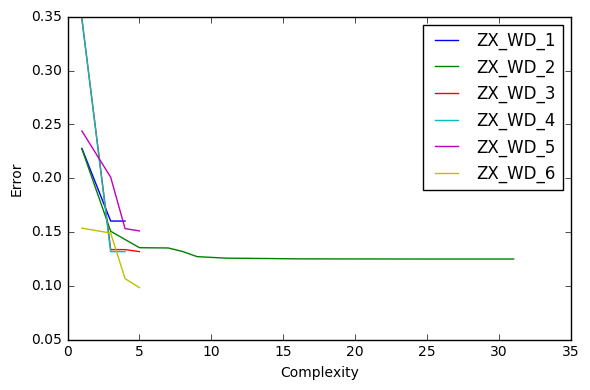

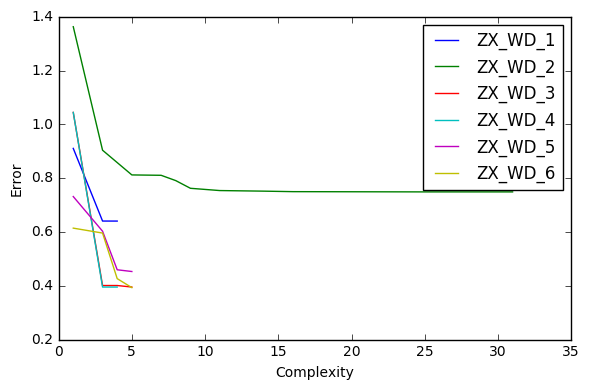

In [98]:
# hyper = {'gen': 1000, 'mu': 500, 'cxpb': 0.5}
# assistant to select the best 'gen' parameter
# and the ZX_WD_2 and ZX_WD_5
deap_result_1 = learn_nodelay_deap(data)
result_summary_gp(deap_result_1,varnames[0:var_num_learn])

1.07470926301023*ZX_WD_6
(-0.17199999999999999*ZD_TFG + 0.60399999999999998*ZX_HW_2*(ZX_WD_4 + ZX_WD_5) - 0.17199999999999999*sqrt((ZD_JHG - ZX_HW_1)*(log(ZD_JHG) + 2.36364252615315e-125)) + 0.17199999999999999*log(ZD_SPEED)*log(ZX_WD_3 + ZX_WD_4 + ZX_WD_5))/ZX_HW_2
0.92800000000000005*ZX_WD_4 + 3.5289999999999999
0.973584767022471*ZX_WD_3
0.63100000000000001*ZX_WD_1 + 10.0
0.64500000000000002*ZX_WD_1 + 10.0


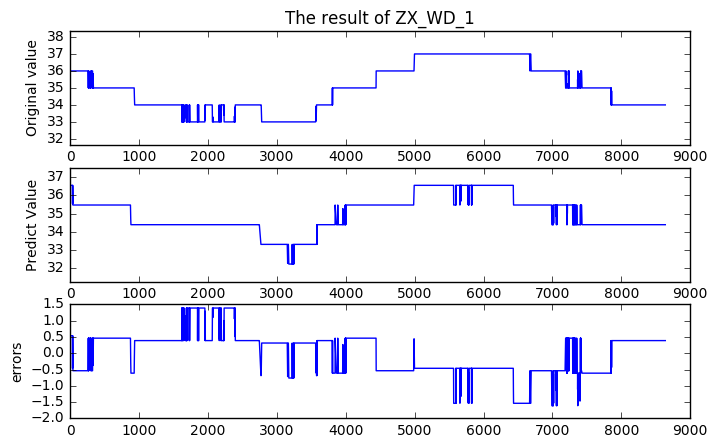

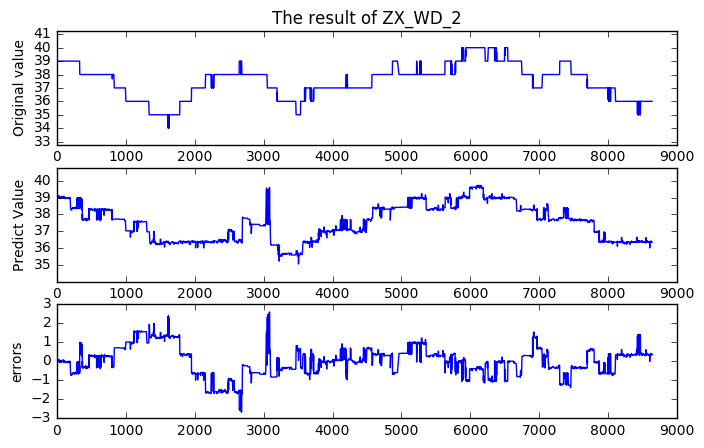

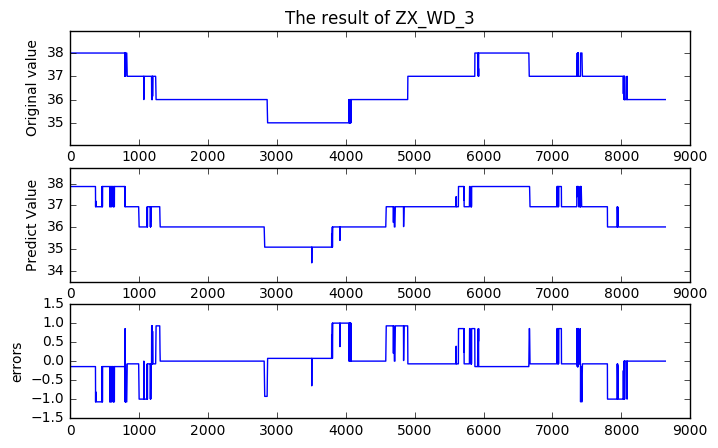

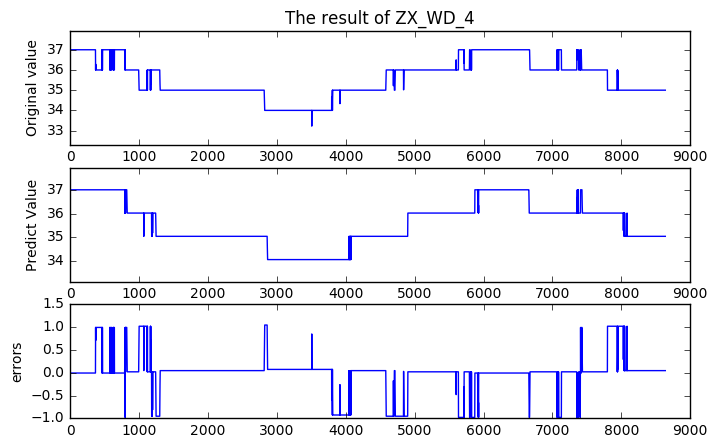

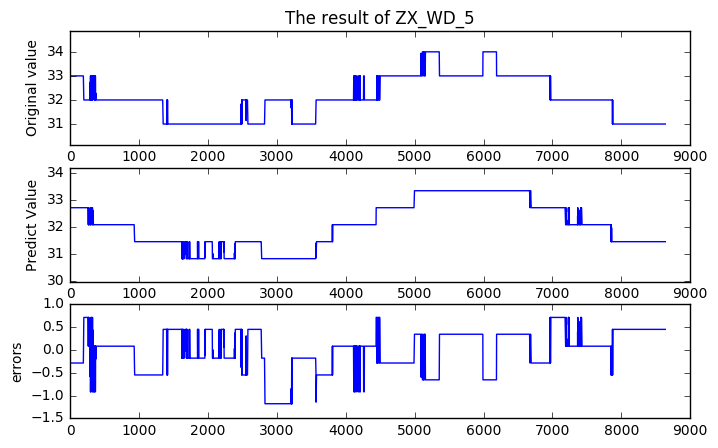

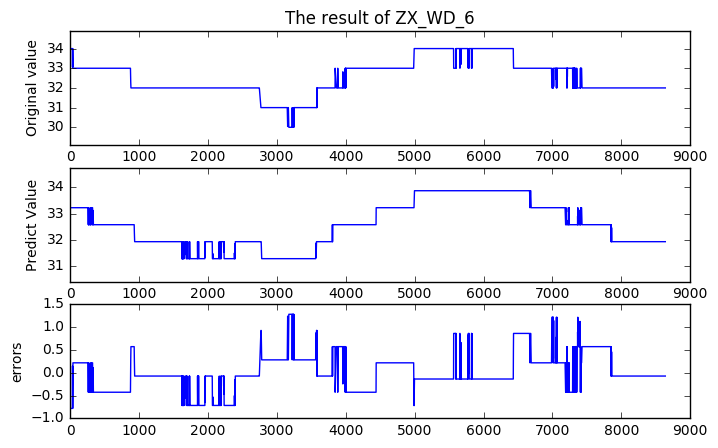

In [123]:
compare_plot_deap([0,0,0,0,0,0],data,deap_result_1)

-------------------------learn ZX_WD_1------------
gen	evals	min                      	max        	diversity
0  	418  	[ 0.67012798  2.        ]	[ inf  24.]	405      
1  	500  	[ 0.67012798  1.        ]	[ inf  27.]	489      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


2  	500  	[ 0.67012798  1.        ]	[ inf   5.]	483      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


3  	500  	[ 0.67012798  1.        ]	[ inf   5.]	477      
4  	500  	[ 0.67012798  1.        ]	[ inf   9.]	470      
5  	500  	[ 0.67012798  1.        ]	[ inf  10.]	482      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


6  	500  	[ 0.67012798  1.        ]	[ inf   6.]	481      
7  	500  	[ 0.67012798  1.        ]	[ inf  10.]	474      
8  	500  	[ 0.64034114  1.        ]	[ inf  10.]	469      
9  	500  	[ 0.58503192  1.        ]	[ inf  14.]	458      
10 	500  	[ 0.58503192  1.        ]	[ inf  14.]	457      
11 	500  	[ 0.58503192  1.        ]	[ inf  15.]	455      
12 	500  	[ 0.58503192  1.        ]	[ inf  15.]	450      
13 	500  	[ 0.58503192  1.        ]	[ inf  17.]	449      
14 	500  	[ 0.58503192  1.        ]	[  1.55377213e+16   1.70000000e+01]	449      
15 	500  	[ 0.58503192  1.        ]	[ 1376.19440783    17.        ]    	450      
16 	500  	[ 0.58503192  1.        ]	[ 704.61824411   17.        ]      	445      
17 	500  	[ 0.58503192  1.        ]	[ 599.61334613   19.        ]      	442      
18 	500  	[ 0.58503192  1.        ]	[ 599.61334613   19.        ]      	442      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


19 	500  	[ 0.58503192  1.        ]	[ inf   7.]                        	433      
20 	500  	[ 0.58503192  1.        ]	[ inf  11.]                        	427      
21 	500  	[ 0.58503192  1.        ]	[  5.82882414e+15   1.20000000e+01]	421      
22 	500  	[ 0.58503192  1.        ]	[  5.82882414e+15   1.30000000e+01]	422      
23 	500  	[ 0.58503192  1.        ]	[  2.29527248e+05   1.30000000e+01]	418      
24 	500  	[ 0.58503192  1.        ]	[ 1304.0073951    13.       ]      	419      
25 	500  	[ 0.58503192  1.        ]	[ 1234.43135412    14.        ]    	419      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


26 	500  	[ 0.58503192  1.        ]	[  1.79262619e+14   7.00000000e+00]	412      
27 	500  	[ 0.58503192  1.        ]	[  4.06149647e+05   1.20000000e+01]	412      
28 	500  	[ 0.58503192  1.        ]	[  2.22749190e+05   1.10000000e+01]	410      
29 	500  	[ 0.52535351  1.        ]	[  2.22749190e+05   1.10000000e+01]	411      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


30 	500  	[ 0.52535351  1.        ]	[ 1376.19440783    11.        ]    	410      
31 	500  	[ 0.52535351  1.        ]	[ 1304.0073951    11.       ]      	411      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


32 	500  	[ 0.58503192  1.        ]	[ inf   5.]                        	402      
33 	500  	[ 0.58503192  1.        ]	[ inf  11.]                        	401      
34 	500  	[ 0.58503192  1.        ]	[ inf  14.]                        	394      
35 	500  	[ 0.58503192  1.        ]	[ inf  14.]                        	393      
36 	500  	[ 0.58503192  1.        ]	[ inf  14.]                        	390      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


37 	500  	[ 0.58503192  1.        ]	[ inf   6.]                        	387      
38 	500  	[ 0.58503192  1.        ]	[ inf   8.]                        	382      
39 	500  	[ 0.58503192  1.        ]	[ inf  10.]                        	379      
40 	500  	[ 0.58503192  1.        ]	[ inf  10.]                        	381      
41 	500  	[ 0.58503192  1.        ]	[ inf  10.]                        	382      
42 	500  	[ 0.58503192  1.        ]	[ inf  10.]                        	383      
43 	500  	[ 0.58503192  1.        ]	[ inf  10.]                        	382      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


44 	500  	[ 0.58503192  1.        ]	[ inf   6.]                        	379      
45 	500  	[ 0.58503192  1.        ]	[ inf   7.]                        	376      
46 	500  	[ 0.58503192  1.        ]	[ inf   9.]                        	376      
47 	500  	[ 0.58503192  1.        ]	[ inf   9.]                        	375      
48 	500  	[ 0.47872582  1.        ]	[ inf  11.]                        	372      
49 	500  	[ 0.47872582  1.        ]	[  3.58656504e+33   1.10000000e+01]	374      
50 	500  	[ 0.47872582  1.        ]	[  3.58656504e+33   1.10000000e+01]	375      
51 	500  	[ 0.47872582  1.        ]	[  6.64733812e+16   1.10000000e+01]	377      
52 	500  	[ 0.47872582  1.        ]	[  5.82882414e+15   1.00000000e+01]	376      
53 	500  	[ 0.47872582  1.        ]	[  3.58656504e+33   1.00000000e+01]	380      
54 	500  	[ 0.47872582  1.        ]	[  5.82882414e+15   1.50000000e+01]	383      
55 	500  	[ 0.47872582  1.        ]	[  2.84828699e+14   1.50000000e+01]	380      
56 	500  	[ 0.47

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


57 	500  	[ 0.47872582  1.        ]	[ inf   6.]                        	376      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


58 	500  	[ 0.47872582  1.        ]	[ inf   6.]                        	372      
59 	500  	[ 0.47872582  1.        ]	[ inf   7.]                        	372      
--------------------end----------------------------
-------------------------learn ZX_WD_2------------
gen	evals	min                      	max        	diversity
0  	418  	[ 0.99549975  2.        ]	[ inf  24.]	404      
1  	500  	[ 0.90668507  1.        ]	[ inf  24.]	487      
2  	500  	[ 0.90668507  1.        ]	[ inf  24.]	489      
3  	500  	[ 0.90668507  1.        ]	[ inf  32.]	479      
4  	500  	[ 0.90668507  1.        ]	[ inf  32.]	493      
5  	500  	[ 0.90668507  1.        ]	[ inf  32.]	492      
6  	500  	[ 0.90668507  1.        ]	[ inf  18.]	484      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


7  	500  	[ 0.90668507  1.        ]	[ inf   8.]	477      
8  	500  	[ 0.90668507  1.        ]	[ inf  12.]	469      
9  	500  	[ 0.90668507  1.        ]	[ inf  13.]	470      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


10 	500  	[ 0.90668507  1.        ]	[ inf   7.]	457      
11 	500  	[ 0.90668507  1.        ]	[ inf   4.]	455      
12 	500  	[ 0.90668507  1.        ]	[ inf   9.]	441      
13 	500  	[ 0.90668507  1.        ]	[ inf  11.]	434      
14 	500  	[ 0.90668507  1.        ]	[ inf  12.]	430      
15 	500  	[ 0.87609282  1.        ]	[ inf  12.]	429      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


16 	500  	[ 0.87609282  1.        ]	[ inf   6.]	426      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


17 	500  	[ 0.87609282  1.        ]	[ inf   8.]	426      
18 	500  	[ 0.87609282  1.        ]	[ inf   8.]	424      
19 	500  	[ 0.87609282  1.        ]	[ inf   9.]	420      
20 	500  	[ 0.87609282  1.        ]	[ inf  11.]	424      
21 	500  	[ 0.87609282  1.        ]	[ inf  12.]	429      
22 	500  	[ 0.87609282  1.        ]	[ inf  15.]	421      
23 	500  	[ 0.87609282  1.        ]	[  2.84828699e+14   1.50000000e+01]	423      
24 	500  	[ 0.87609282  1.        ]	[  2.22746858e+05   1.50000000e+01]	421      
25 	500  	[ 0.87609282  1.        ]	[ 1190.90025188    15.        ]    	418      
26 	500  	[ 0.87609282  1.        ]	[ 1161.9070984    17.       ]      	417      
27 	500  	[ 0.87609282  1.        ]	[ 1024.21438679    17.        ]    	416      
28 	500  	[ 0.87609282  1.        ]	[ 994.11476532   15.        ]      	413      
29 	500  	[ 0.87609282  1.        ]	[ 597.13120486   15.        ]      	419      
30 	500  	[ 0.87609282  1.        ]	[ 597.13120486   17.        ]      	423   

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


32 	500  	[ 0.87609282  1.        ]	[ 597.13120486   15.        ]      	420      
33 	500  	[ 0.87609282  1.        ]	[ 597.13120486   15.        ]      	414      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


34 	500  	[ 0.87609282  1.        ]	[ inf   6.]                        	407      
35 	500  	[ 0.86738344  1.        ]	[ inf   9.]                        	401      
36 	500  	[ 0.86738344  1.        ]	[ inf   9.]                        	399      
37 	500  	[ 0.86738344  1.        ]	[  1.55377213e+16   9.00000000e+00]	396      
38 	500  	[ 0.86738344  1.        ]	[  2.84828699e+14   9.00000000e+00]	390      
39 	500  	[ 0.86738344  1.        ]	[  2.70941316e+14   9.00000000e+00]	389      
40 	500  	[ 0.86738344  1.        ]	[  1.79262619e+14   1.30000000e+01]	388      
41 	500  	[ 0.86738344  1.        ]	[  1.79262619e+14   1.30000000e+01]	383      
42 	500  	[ 0.86738344  1.        ]	[  2.22746858e+05   1.30000000e+01]	376      
43 	500  	[ 0.86738344  1.        ]	[ 1231.91093001    13.        ]    	373      
44 	500  	[ 0.86738344  1.        ]	[ 1190.90025188    13.        ]    	371      
45 	500  	[ 0.86738344  1.        ]	[ 1161.9070984    12.       ]      	368      
46 	500  	[ 0.86

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


47 	500  	[ 0.87609282  1.        ]	[ inf   6.]                        	371      
48 	500  	[ 0.87609282  1.        ]	[  2.84828699e+14   8.00000000e+00]	365      
49 	500  	[ 0.87609282  1.        ]	[  2.84828699e+14   8.00000000e+00]	362      
50 	500  	[ 0.87609282  1.        ]	[  1.79262619e+14   1.10000000e+01]	359      
51 	500  	[ 0.87609282  1.        ]	[  4.06147195e+05   1.10000000e+01]	358      
52 	500  	[ 0.87609282  1.        ]	[  2.29524901e+05   1.10000000e+01]	357      
53 	500  	[ 0.87609282  1.        ]	[  2.22746858e+05   1.10000000e+01]	356      
54 	500  	[ 0.87609282  1.        ]	[ 1231.91093001    12.        ]    	352      
55 	500  	[ 0.87609282  1.        ]	[ 1161.9070984    12.       ]      	353      
56 	500  	[ 0.87609282  1.        ]	[ 1024.21438679    16.        ]    	351      
57 	500  	[ 0.87609282  1.        ]	[ 994.11476532   16.        ]      	350      
58 	500  	[ 0.87609282  1.        ]	[ 1161.9070984    14.       ]      	350      
59 	500  	[ 0.87

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


2  	500  	[ 0.73976024  1.        ]	[ inf   6.]	481      
3  	500  	[ 0.73976024  1.        ]	[ inf  10.]	473      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


4  	500  	[ 0.70508584  1.        ]	[ inf   6.]	464      
5  	500  	[ 0.39895754  1.        ]	[ inf  10.]	470      
6  	500  	[ 0.39895754  1.        ]	[ inf  11.]	462      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


7  	500  	[ 0.39895752  1.        ]	[ inf   9.]	450      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


8  	500  	[ 0.39895752  1.        ]	[ inf   4.]	440      
9  	500  	[ 0.39895752  1.        ]	[ inf  10.]	441      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


10 	500  	[ 0.39895752  1.        ]	[ inf   6.]	438      
11 	500  	[ 0.39895752  1.        ]	[ inf  10.]	427      
12 	500  	[ 0.39895752  1.        ]	[ inf  10.]	421      
13 	500  	[ 0.39895752  1.        ]	[ inf  10.]	422      
14 	500  	[ 0.39895752  1.        ]	[ inf  11.]	425      
15 	500  	[ 0.39895752  1.        ]	[ inf  15.]	433      
16 	500  	[ 0.39895752  1.        ]	[ inf  16.]	432      
17 	500  	[ 0.39288043  1.        ]	[  5.51434153e+15   1.70000000e+01]	430      
18 	500  	[ 0.39288043  1.        ]	[ 1232.85745902    19.        ]    	422      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


19 	500  	[ 0.39554443  1.        ]	[  2.80173898e+15   6.00000000e+00]	418      
20 	500  	[ 0.39554443  1.        ]	[ inf  12.]                        	415      
21 	500  	[ 0.39554443  1.        ]	[  3.58656504e+33   1.20000000e+01]	418      
22 	500  	[ 0.39554443  1.        ]	[  6.64733812e+16   1.20000000e+01]	419      
23 	500  	[ 0.39554443  1.        ]	[  5.82882414e+15   1.00000000e+01]	417      
24 	500  	[ 0.39554443  1.        ]	[  2.70941316e+14   1.10000000e+01]	418      
25 	500  	[ 0.39554443  1.        ]	[  1.79262619e+14   1.10000000e+01]	415      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


26 	500  	[ 0.39554443  1.        ]	[  3.58656504e+33   7.00000000e+00]	410      
27 	500  	[ 0.39554443  1.        ]	[  5.51434153e+15   1.00000000e+01]	410      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


28 	500  	[ 0.39554443  1.        ]	[  2.70941316e+14   9.00000000e+00]	410      
29 	500  	[ 0.39554443  1.        ]	[  1.87566569e+09   1.20000000e+01]	407      
30 	500  	[ 0.39192688  1.        ]	[ 1374.63405093    12.        ]    	403      
31 	500  	[ 0.39192688  1.        ]	[ 1162.85935386    12.        ]    	401      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


32 	500  	[ 0.39554443  1.        ]	[ inf   6.]                        	391      
33 	500  	[ 0.34734284  1.        ]	[  2.80173898e+15   1.10000000e+01]	388      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


34 	500  	[ 0.34734284  1.        ]	[ inf   8.]                        	389      
35 	500  	[ 0.39895752  1.        ]	[ inf   4.]                        	405      
36 	500  	[ 0.39895752  1.        ]	[ inf   8.]                        	400      
37 	500  	[ 0.39895752  1.        ]	[ inf  10.]                        	397      
38 	500  	[ 0.39895752  1.        ]	[ inf  10.]                        	394      
39 	500  	[ 0.39895752  1.        ]	[ inf  10.]                        	394      
40 	500  	[ 0.39895752  1.        ]	[ inf  11.]                        	391      
41 	500  	[ 0.39895752  1.        ]	[ inf  11.]                        	399      
42 	500  	[ 0.39895752  1.        ]	[ inf  11.]                        	400      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


43 	500  	[ 0.39895752  1.        ]	[ inf   6.]                        	396      
44 	500  	[ 0.39895752  1.        ]	[ inf  11.]                        	399      
45 	500  	[ 0.39895752  1.        ]	[ inf  13.]                        	401      
46 	500  	[ 0.39895752  1.        ]	[  3.58656504e+33   1.30000000e+01]	400      
47 	500  	[ 0.39888994  1.        ]	[  2.80173898e+15   1.30000000e+01]	401      
48 	500  	[ 0.39888994  1.        ]	[  2.80173898e+15   1.30000000e+01]	399      
49 	500  	[ 0.39888994  1.        ]	[  2.84828699e+14   1.30000000e+01]	398      
50 	500  	[ 0.39870257  1.        ]	[  1.79262619e+14   1.50000000e+01]	402      
51 	500  	[ 0.39846278  1.        ]	[  4.06148092e+05   1.50000000e+01]	402      
52 	500  	[ 0.39846278  1.        ]	[  2.29525738e+05   1.50000000e+01]	399      
53 	500  	[ 0.39843939  1.        ]	[ 1191.862807    16.      ]        	400      
54 	500  	[ 0.39843939  1.        ]	[ 995.08048315   20.        ]      	402      
55 	500  	[ 0.39

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


1  	500  	[ 0.63381908  1.        ]	[ inf  18.]	477      
2  	500  	[ 0.39895754  1.        ]	[ inf   5.]	478      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


3  	500  	[ 0.39333567  1.        ]	[ inf   4.]	476      
4  	500  	[ 0.39333567  1.        ]	[ inf  10.]	475      
5  	500  	[ 0.39333567  1.        ]	[ inf  11.]	468      
6  	500  	[ 0.39333567  1.        ]	[ inf  12.]	473      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


7  	500  	[ 0.39333567  1.        ]	[ inf   5.]	473      
8  	500  	[ 0.39333567  1.        ]	[ inf   9.]	468      
9  	500  	[ 0.39333567  1.        ]	[ inf  13.]	466      
10 	500  	[ 0.39333567  1.        ]	[ inf  13.]	460      
11 	500  	[ 0.39333567  1.        ]	[ inf  11.]	455      
12 	500  	[ 0.39333567  1.        ]	[ inf  12.]	453      
13 	500  	[ 0.39333567  1.        ]	[ inf  17.]	452      
14 	500  	[ 0.39333567  1.        ]	[ inf  17.]	458      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


15 	500  	[ 0.39333567  1.        ]	[ inf   6.]	450      
16 	500  	[ 0.37287142  1.        ]	[ inf  11.]	445      
17 	500  	[ 0.37287142  1.        ]	[ inf  13.]	442      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


18 	500  	[ 0.37287142  1.        ]	[ inf   6.]	436      
19 	500  	[ 0.37287142  1.        ]	[ inf  10.]	432      
20 	500  	[ 0.37287142  1.        ]	[ inf  11.]	431      
21 	500  	[ 0.37287142  1.        ]	[ inf  11.]	425      
22 	500  	[ 0.37287142  1.        ]	[ inf  12.]	424      
23 	500  	[ 0.37287142  1.        ]	[ inf  17.]	420      
24 	500  	[ 0.37287142  1.        ]	[  6.64733812e+16   1.70000000e+01]	416      
25 	500  	[ 0.37287142  1.        ]	[  1.55377213e+16   2.20000000e+01]	414      
26 	500  	[ 0.37287142  1.        ]	[  2.80173898e+15   2.50000000e+01]	411      
27 	500  	[ 0.37287142  1.        ]	[  2.70941316e+14   2.50000000e+01]	411      
28 	500  	[ 0.37287142  1.        ]	[  2.29526653e+05   2.50000000e+01]	408      
29 	500  	[ 0.34282951  1.        ]	[  2.22748598e+05   2.30000000e+01]	404      
30 	500  	[ 0.34282951  1.        ]	[ 1375.5918653    17.       ]      	405      
31 	500  	[ 0.34282951  1.        ]	[ 1192.8157962    17.       ]      	405   

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


32 	500  	[ 0.34282951  1.        ]	[  1.55377213e+16   1.00000000e+01]	399      
33 	500  	[ 0.34282951  1.        ]	[ 1303.38820046    16.        ]    	399      
34 	500  	[ 0.34282951  1.        ]	[ 1163.81418812    16.        ]    	396      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


35 	500  	[ 0.34282951  1.        ]	[ inf   7.]                        	413      
36 	500  	[ 0.34282951  1.        ]	[  1.55377213e+16   9.00000000e+00]	409      
37 	500  	[ 0.34282951  1.        ]	[  1.87566569e+09   9.00000000e+00]	400      
38 	500  	[ 0.34282951  1.        ]	[  2.29526653e+05   9.00000000e+00]	395      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


39 	500  	[ 0.34282951  1.        ]	[ inf   8.]                        	401      
40 	500  	[ 0.39333567  1.        ]	[ inf   4.]                        	413      
41 	500  	[ 0.39333567  1.        ]	[ inf   9.]                        	404      
42 	500  	[ 0.39333567  1.        ]	[ inf   9.]                        	397      
43 	500  	[ 0.39333567  1.        ]	[ inf  11.]                        	398      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


44 	500  	[ 0.39333567  1.        ]	[ inf   6.]                        	394      
45 	500  	[ 0.39333567  1.        ]	[ inf   8.]                        	395      
46 	500  	[ 0.39333567  1.        ]	[ inf   9.]                        	400      
47 	500  	[ 0.39333567  1.        ]	[ inf  10.]                        	399      
48 	500  	[ 0.39333567  1.        ]	[ inf  10.]                        	402      
49 	500  	[ 0.39333567  1.        ]	[ inf  11.]                        	400      
50 	500  	[ 0.39333567  1.        ]	[ inf  12.]                        	400      
51 	500  	[ 0.39333567  1.        ]	[ inf  12.]                        	401      
52 	500  	[ 0.39333567  1.        ]	[ inf  12.]                        	401      
53 	500  	[ 0.39333567  1.        ]	[ inf  11.]                        	403      
54 	500  	[ 0.39333567  1.        ]	[  6.64733812e+16   1.10000000e+01]	406      
55 	500  	[ 0.39333567  1.        ]	[  1.55377213e+16   1.10000000e+01]	404      
56 	500  	[ 0.39

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


57 	500  	[ 0.39333567  1.        ]	[ inf   7.]                        	402      
58 	500  	[ 0.39333567  1.        ]	[ inf   4.]                        	398      
59 	500  	[ 0.39333567  1.        ]	[ inf   8.]                        	393      
--------------------end----------------------------
-------------------------learn ZX_WD_5------------
gen	evals	min                      	max        	diversity
0  	418  	[ 0.60768719  2.        ]	[ inf  24.]	404      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


1  	500  	[ 0.57818421  1.        ]	[ inf   6.]	481      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


2  	500  	[ 0.60768719  1.        ]	[ inf   4.]	470      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


3  	500  	[ 0.60768719  1.        ]	[ inf   5.]	461      
4  	500  	[ 0.60303083  1.        ]	[ inf   9.]	465      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


5  	500  	[ 0.60303083  1.        ]	[ inf   5.]	456      
6  	500  	[ 0.60297623  1.        ]	[ inf   9.]	464      
7  	500  	[ 0.60297623  1.        ]	[ inf  10.]	458      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


8  	500  	[ 0.60297623  1.        ]	[ inf   6.]	467      
9  	500  	[ 0.60297623  1.        ]	[ inf  10.]	462      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


10 	500  	[ 0.60297623  1.        ]	[ inf   7.]	461      
11 	500  	[ 0.60291145  1.        ]	[ inf  10.]	457      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


12 	500  	[ 0.60291145  1.        ]	[ inf   7.]	453      
13 	500  	[ 0.60291145  1.        ]	[ inf   9.]	448      
14 	500  	[ 0.60291145  1.        ]	[ inf  10.]	446      
15 	500  	[ 0.60291145  1.        ]	[ inf  10.]	437      
16 	500  	[ 0.56433668  1.        ]	[ inf  10.]	436      
17 	500  	[ 0.56433668  1.        ]	[ inf  17.]	436      
18 	500  	[ 0.56433668  1.        ]	[  6.64733812e+16   1.70000000e+01]	434      
19 	500  	[ 0.56433668  1.        ]	[  2.84828699e+14   1.70000000e+01]	430      
20 	500  	[ 0.56433668  1.        ]	[  4.06152544e+05   1.70000000e+01]	431      
21 	500  	[ 0.56433668  1.        ]	[  2.29530058e+05   1.70000000e+01]	422      
22 	500  	[ 0.56433668  1.        ]	[ 1306.91283384    17.        ]    	417      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


23 	500  	[ 0.56433668  1.        ]	[ inf   7.]                        	423      
24 	500  	[ 0.56433668  1.        ]	[ inf  10.]                        	418      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


25 	500  	[ 0.58036374  1.        ]	[ inf   6.]                        	420      
26 	500  	[ 0.58036374  1.        ]	[ inf  13.]                        	415      
27 	500  	[ 0.58036374  1.        ]	[ inf  10.]                        	413      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


28 	500  	[ 0.56942939  1.        ]	[ inf   6.]                        	410      
29 	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	405      
30 	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	405      
31 	500  	[ 0.45969831  1.        ]	[  1.55377213e+16   1.30000000e+01]	402      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


32 	500  	[ 0.45385706  1.        ]	[ inf   8.]                        	412      
33 	500  	[ 0.45969831  1.        ]	[ inf   4.]                        	410      
34 	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	417      
35 	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	417      
36 	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	415      
37 	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	415      
38 	500  	[ 0.45969831  1.        ]	[ inf  13.]                        	414      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


39 	500  	[ 0.45969831  1.        ]	[ inf   5.]                        	407      
40 	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	407      
41 	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	405      
42 	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	406      
43 	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	404      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


44 	500  	[ 0.45969831  1.        ]	[ inf   6.]                        	404      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


45 	500  	[ 0.45969831  1.        ]	[ inf   6.]                        	403      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


46 	500  	[ 0.45969831  1.        ]	[ inf   7.]                        	405      
47 	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	410      
48 	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	409      
49 	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	407      
50 	500  	[ 0.45969831  1.        ]	[ inf  15.]                        	407      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


51 	500  	[ 0.45969831  1.        ]	[ inf   7.]                        	406      
52 	500  	[ 0.45969831  1.        ]	[  3.58656504e+33   1.00000000e+01]	408      
53 	500  	[ 0.45969831  1.        ]	[  3.58656504e+33   1.00000000e+01]	407      
54 	500  	[ 0.45969831  1.        ]	[  3.58656504e+33   1.10000000e+01]	408      
55 	500  	[ 0.45969831  1.        ]	[  6.64733812e+16   1.10000000e+01]	407      
56 	500  	[ 0.45969831  1.        ]	[  6.64733812e+16   1.50000000e+01]	409      
57 	500  	[ 0.45969831  1.        ]	[  3.58656504e+33   1.10000000e+01]	408      
58 	500  	[ 0.45969831  1.        ]	[  3.58656504e+33   1.10000000e+01]	407      
59 	500  	[ 0.45969831  1.        ]	[  6.64733812e+16   1.10000000e+01]	403      
--------------------end----------------------------
-------------------------learn ZX_WD_6------------
gen	evals	min                      	max        	diversity
0  	418  	[ 0.59572111  2.        ]	[ inf  24.]	405      
1  	500  	[ 0.41829938  1.        ]	[ inf  

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


2  	500  	[ 0.41829938  1.        ]	[ inf  16.]	481      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


3  	500  	[ 0.59572111  1.        ]	[ inf   4.]	476      
4  	500  	[ 0.59572111  1.        ]	[ inf  10.]	481      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


5  	500  	[ 0.59572111  1.        ]	[ inf   5.]	476      
6  	500  	[ 0.59572111  1.        ]	[ inf  10.]	472      
7  	500  	[ 0.59572111  1.        ]	[ inf  10.]	473      
8  	500  	[ 0.59572111  1.        ]	[ inf  13.]	470      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


9  	500  	[ 0.59572111  1.        ]	[ inf   8.]	470      
10 	500  	[ 0.59572111  1.        ]	[ inf  11.]	471      
11 	500  	[ 0.59572111  1.        ]	[ inf  13.]	465      
12 	500  	[ 0.59572111  1.        ]	[ inf  13.]	464      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


13 	500  	[ 0.59572111  1.        ]	[ inf   6.]	459      
14 	500  	[ 0.59572111  1.        ]	[ inf   9.]	456      
15 	500  	[ 0.59572111  1.        ]	[ inf  12.]	459      
16 	500  	[ 0.59572111  1.        ]	[ inf  12.]	458      
17 	500  	[ 0.59572111  1.        ]	[ inf  14.]	455      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


18 	500  	[ 0.59572111  1.        ]	[ inf   9.]	451      
19 	500  	[ 0.59572111  1.        ]	[ inf  12.]	448      
20 	500  	[ 0.59572111  1.        ]	[ inf  12.]	443      
21 	500  	[ 0.59572111  1.        ]	[  5.82882414e+15   1.50000000e+01]	438      
22 	500  	[ 0.57613417  1.        ]	[  1.79262619e+14   1.50000000e+01]	438      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


23 	500  	[ 0.57613417  1.        ]	[  2.80173898e+15   8.00000000e+00]	433      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


24 	500  	[ 0.57613417  1.        ]	[  3.58656504e+33   6.00000000e+00]	427      
25 	500  	[ 0.57613417  1.        ]	[ inf   9.]                        	424      
26 	500  	[ 0.57613417  1.        ]	[ inf  12.]                        	423      
27 	500  	[ 0.57613417  1.        ]	[ inf  12.]                        	418      
28 	500  	[ 0.57613417  1.        ]	[  6.64733812e+16   1.20000000e+01]	419      
29 	500  	[ 0.57613417  1.        ]	[  5.82882414e+15   1.30000000e+01]	417      
30 	500  	[ 0.57613417  1.        ]	[  2.80173898e+15   1.30000000e+01]	417      
31 	500  	[ 0.54750191  1.        ]	[  1.87566569e+09   1.80000000e+01]	415      
32 	500  	[ 0.54750191  1.        ]	[  2.29529554e+05   1.80000000e+01]	413      
33 	500  	[ 0.54750191  1.        ]	[ 1306.4420787    18.       ]      	414      
34 	500  	[ 0.54750191  1.        ]	[ 1022.25513758    18.        ]    	412      
35 	500  	[ 0.54750191  1.        ]	[ 999.072182   18.      ]          	409      
36 	500  	[ 0.54

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


42 	500  	[ 0.39233372  1.        ]	[ inf  16.]                        	423      
43 	500  	[ 0.39233372  1.        ]	[ inf  16.]                        	430      
44 	500  	[ 0.59021385  1.        ]	[ inf   4.]                        	432      
45 	500  	[ 0.59021385  1.        ]	[ inf   9.]                        	434      
46 	500  	[ 0.59021385  1.        ]	[ inf  10.]                        	428      
47 	500  	[ 0.50148648  1.        ]	[ inf  11.]                        	434      
48 	500  	[ 0.50148648  1.        ]	[ inf  11.]                        	430      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


49 	500  	[ 0.50148648  1.        ]	[ inf   7.]                        	426      
50 	500  	[ 0.50148648  1.        ]	[ inf   9.]                        	422      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


51 	500  	[ 0.50148648  1.        ]	[ inf   8.]                        	420      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


52 	500  	[ 0.50148648  1.        ]	[ inf   7.]                        	411      
53 	500  	[ 0.50148648  1.        ]	[ inf  12.]                        	415      
54 	500  	[ 0.50148648  1.        ]	[  3.58656504e+33   1.20000000e+01]	421      
55 	500  	[ 0.50148648  1.        ]	[  2.80173898e+15   1.20000000e+01]	426      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


56 	500  	[ 0.50148648  1.        ]	[ inf   6.]                        	427      
57 	500  	[ 0.50148648  1.        ]	[ inf   9.]                        	425      
58 	500  	[ 0.50148648  1.        ]	[ inf   9.]                        	423      
59 	500  	[ 0.50148648  1.        ]	[ inf   9.]                        	420      
--------------------end----------------------------
************************* ZX_WD_1 *********************
original model:
Mul(Mul(ZX_WD_6, sqrt(ZX_WD_5)), 0.19)
Sub(Mul(1.365, ZX_WD_6), 9.4559999999999995)
Mul(ZX_WD_6, 1.075)
Mul(1.075, ZX_WD_6)
ZX_HW_2
symplified model:
0.19*sqrt(ZX_WD_5)*ZX_WD_6
1.365*ZX_WD_6 - 9.4559999999999995
1.075*ZX_WD_6
1.075*ZX_WD_6
ZX_HW_2
---------------------------------------------------------------------------------
complexity         nrmse_test         nrmse_train         rmse_test         rmse_train
6.000000         0.119728         0.119681         0.478911         0.478726
5.000000         0.146383         0.146258         0.5

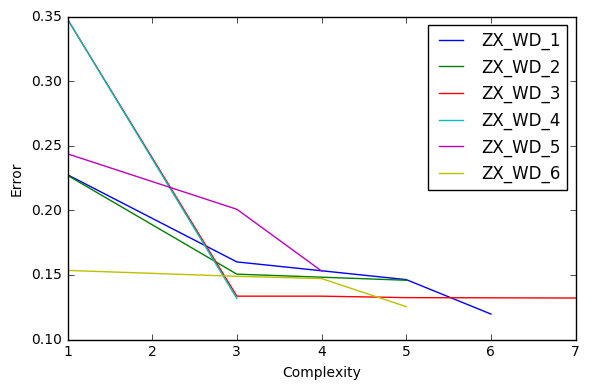

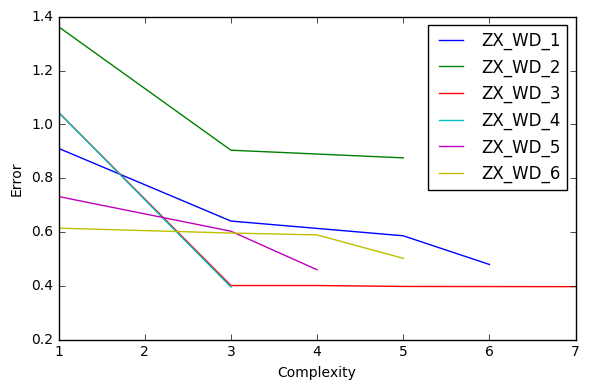

In [125]:
# hyper = {'gen': 60, 'mu': 500, 'cxpb': 0.5}
# for result of ZX_WD_1
deap_result_2 = learn_nodelay_deap(data)
result_summary_gp(deap_result_2,varnames[0:var_num_learn])

0.19*sqrt(ZX_WD_5)*ZX_WD_6
0.14799999999999999*ZX_WD_3 + ZX_WD_5
ZX_WD_4 + cos(sin(square(log(ZX_WD_4))))
0.97370983446932823*ZX_WD_3
5.4269999999999996*sqrt(ZX_WD_1)
0.48499999999999999*ZX_WD_1 + 0.48499999999999999*ZX_WD_5


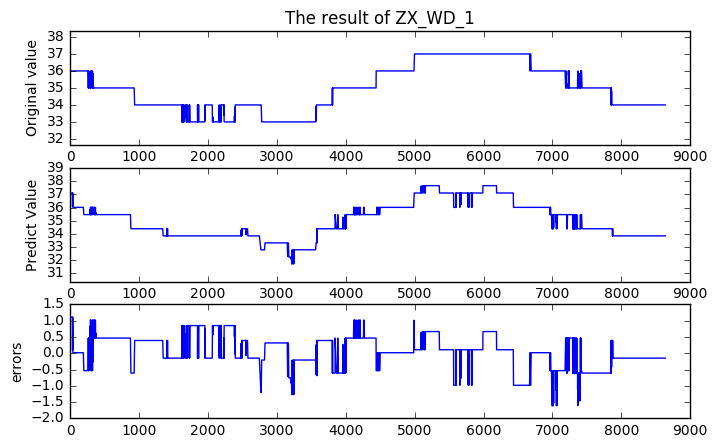

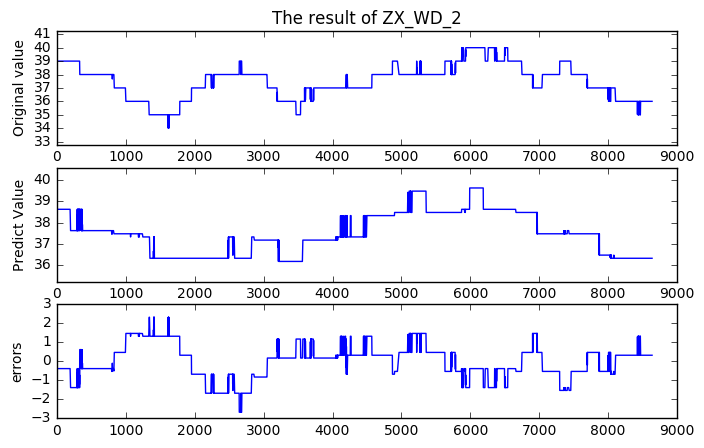

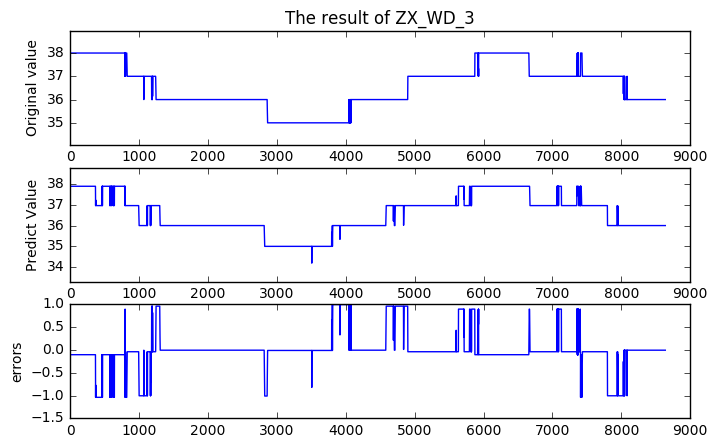

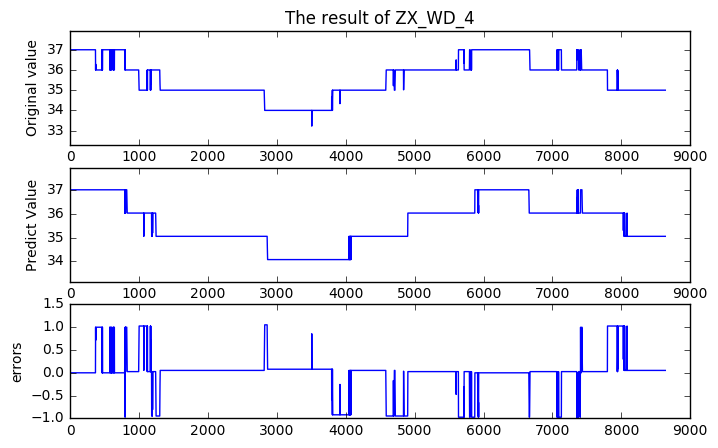

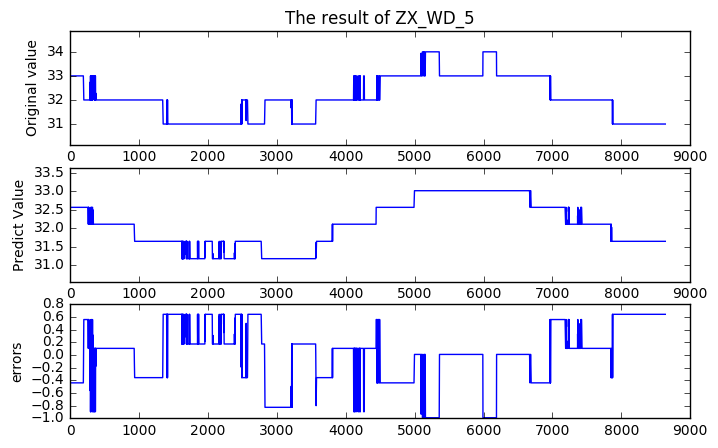

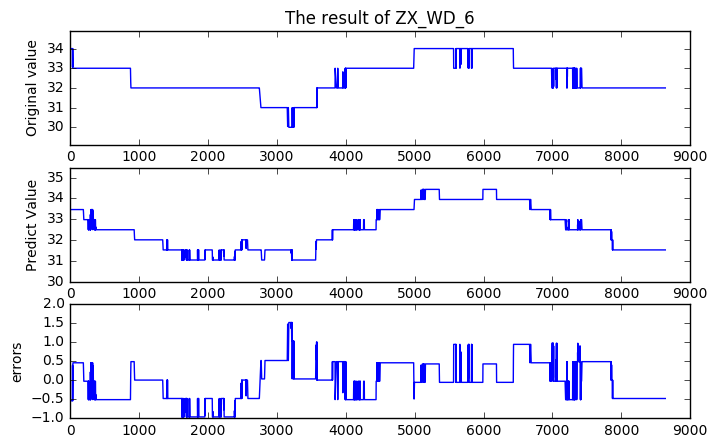

In [126]:
compare_plot_deap([0,0,0,0,0,0],data,deap_result_2)

-------------------------learn ZX_WD_1------------
gen	evals	min                      	max        	diversity
0  	418  	[ 0.67012798  2.        ]	[ inf  24.]	405      
1  	500  	[ 0.67012798  1.        ]	[ inf  27.]	489      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


2  	500  	[ 0.67012798  1.        ]	[ inf   5.]	483      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


3  	500  	[ 0.67012798  1.        ]	[ inf   5.]	477      
4  	500  	[ 0.67012798  1.        ]	[ inf   9.]	470      
5  	500  	[ 0.67012798  1.        ]	[ inf  10.]	482      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


6  	500  	[ 0.67012798  1.        ]	[ inf   6.]	481      
7  	500  	[ 0.67012798  1.        ]	[ inf  10.]	474      
8  	500  	[ 0.64034114  1.        ]	[ inf  10.]	469      
9  	500  	[ 0.58503192  1.        ]	[ inf  14.]	458      
10 	500  	[ 0.58503192  1.        ]	[ inf  14.]	457      
11 	500  	[ 0.58503192  1.        ]	[ inf  15.]	455      
12 	500  	[ 0.58503192  1.        ]	[ inf  15.]	450      
13 	500  	[ 0.58503192  1.        ]	[ inf  17.]	449      
14 	500  	[ 0.58503192  1.        ]	[  1.55377213e+16   1.70000000e+01]	449      
15 	500  	[ 0.58503192  1.        ]	[ 1376.19440783    17.        ]    	450      
16 	500  	[ 0.58503192  1.        ]	[ 704.61824411   17.        ]      	445      
17 	500  	[ 0.58503192  1.        ]	[ 599.61334613   19.        ]      	442      
18 	500  	[ 0.58503192  1.        ]	[ 599.61334613   19.        ]      	442      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


19 	500  	[ 0.58503192  1.        ]	[ inf   7.]                        	433      
20 	500  	[ 0.58503192  1.        ]	[ inf  11.]                        	427      
21 	500  	[ 0.58503192  1.        ]	[  5.82882414e+15   1.20000000e+01]	421      
22 	500  	[ 0.58503192  1.        ]	[  5.82882414e+15   1.30000000e+01]	422      
23 	500  	[ 0.58503192  1.        ]	[  2.29527248e+05   1.30000000e+01]	418      
24 	500  	[ 0.58503192  1.        ]	[ 1304.0073951    13.       ]      	419      
25 	500  	[ 0.58503192  1.        ]	[ 1234.43135412    14.        ]    	419      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


26 	500  	[ 0.58503192  1.        ]	[  1.79262619e+14   7.00000000e+00]	412      
27 	500  	[ 0.58503192  1.        ]	[  4.06149647e+05   1.20000000e+01]	412      
28 	500  	[ 0.58503192  1.        ]	[  2.22749190e+05   1.10000000e+01]	410      
29 	500  	[ 0.52535351  1.        ]	[  2.22749190e+05   1.10000000e+01]	411      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


30 	500  	[ 0.52535351  1.        ]	[ 1376.19440783    11.        ]    	410      
31 	500  	[ 0.52535351  1.        ]	[ 1304.0073951    11.       ]      	411      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


32 	500  	[ 0.58503192  1.        ]	[ inf   5.]                        	402      
33 	500  	[ 0.58503192  1.        ]	[ inf  11.]                        	401      
34 	500  	[ 0.58503192  1.        ]	[ inf  14.]                        	394      
35 	500  	[ 0.58503192  1.        ]	[ inf  14.]                        	393      
36 	500  	[ 0.58503192  1.        ]	[ inf  14.]                        	390      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


37 	500  	[ 0.58503192  1.        ]	[ inf   6.]                        	387      
38 	500  	[ 0.58503192  1.        ]	[ inf   8.]                        	382      
39 	500  	[ 0.58503192  1.        ]	[ inf  10.]                        	379      
40 	500  	[ 0.58503192  1.        ]	[ inf  10.]                        	381      
41 	500  	[ 0.58503192  1.        ]	[ inf  10.]                        	382      
42 	500  	[ 0.58503192  1.        ]	[ inf  10.]                        	383      
43 	500  	[ 0.58503192  1.        ]	[ inf  10.]                        	382      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


44 	500  	[ 0.58503192  1.        ]	[ inf   6.]                        	379      
45 	500  	[ 0.58503192  1.        ]	[ inf   7.]                        	376      
46 	500  	[ 0.58503192  1.        ]	[ inf   9.]                        	376      
47 	500  	[ 0.58503192  1.        ]	[ inf   9.]                        	375      
48 	500  	[ 0.47872582  1.        ]	[ inf  11.]                        	372      
49 	500  	[ 0.47872582  1.        ]	[  3.58656504e+33   1.10000000e+01]	374      
50 	500  	[ 0.47872582  1.        ]	[  3.58656504e+33   1.10000000e+01]	375      
51 	500  	[ 0.47872582  1.        ]	[  6.64733812e+16   1.10000000e+01]	377      
52 	500  	[ 0.47872582  1.        ]	[  5.82882414e+15   1.00000000e+01]	376      
53 	500  	[ 0.47872582  1.        ]	[  3.58656504e+33   1.00000000e+01]	380      
54 	500  	[ 0.47872582  1.        ]	[  5.82882414e+15   1.50000000e+01]	383      
55 	500  	[ 0.47872582  1.        ]	[  2.84828699e+14   1.50000000e+01]	380      
56 	500  	[ 0.47

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


57 	500  	[ 0.47872582  1.        ]	[ inf   6.]                        	376      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


58 	500  	[ 0.47872582  1.        ]	[ inf   6.]                        	372      
59 	500  	[ 0.47872582  1.        ]	[ inf   7.]                        	372      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


60 	500  	[ 0.47872582  1.        ]	[ inf   7.]                        	373      
61 	500  	[ 0.47872582  1.        ]	[ inf   8.]                        	374      
62 	500  	[ 0.47872582  1.        ]	[  3.58656504e+33   9.00000000e+00]	376      
63 	500  	[ 0.47872582  1.        ]	[  6.64733812e+16   1.40000000e+01]	375      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


64 	500  	[ 0.64034114  1.        ]	[ inf   4.]                        	394      
65 	500  	[ 0.64034114  1.        ]	[ inf  10.]                        	392      
66 	500  	[ 0.64034114  1.        ]	[ inf   9.]                        	389      
67 	500  	[ 0.64034114  1.        ]	[ inf  10.]                        	388      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


68 	500  	[ 0.64034114  1.        ]	[ inf  10.]                        	387      
69 	500  	[ 0.64034114  1.        ]	[ inf  12.]                        	383      
70 	500  	[ 0.64034114  1.        ]	[ inf  13.]                        	387      
71 	500  	[ 0.63445881  1.        ]	[ inf  15.]                        	391      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


72 	500  	[ 0.63445881  1.        ]	[ inf   6.]                        	388      
73 	500  	[ 0.63445881  1.        ]	[ inf   9.]                        	388      
74 	500  	[ 0.63445881  1.        ]	[ inf  11.]                        	389      
75 	500  	[ 0.63445881  1.        ]	[  3.58656504e+33   1.10000000e+01]	393      
76 	500  	[ 0.49382063  1.        ]	[  1.55377213e+16   1.10000000e+01]	394      
77 	500  	[ 0.49382063  1.        ]	[  2.84828699e+14   1.10000000e+01]	396      
78 	500  	[ 0.49382063  1.        ]	[  4.06149647e+05   1.30000000e+01]	398      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


79 	500  	[ 0.49382063  1.        ]	[  2.22749190e+05   1.10000000e+01]	396      
80 	500  	[ 0.49382063  1.        ]	[ 1234.43135412    11.        ]    	397      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


81 	500  	[ 0.63445881  1.        ]	[  1.55377213e+16   8.00000000e+00]	393      
82 	500  	[ 0.63445881  1.        ]	[  2.22749190e+05   1.50000000e+01]	390      
83 	500  	[ 0.63445881  1.        ]	[  2.22749190e+05   1.50000000e+01]	389      
84 	500  	[ 0.63445881  1.        ]	[  2.70941316e+14   1.20000000e+01]	395      
85 	500  	[ 0.63445881  1.        ]	[  1.87566569e+09   1.20000000e+01]	394      
86 	500  	[ 0.63445881  1.        ]	[  4.06149647e+05   1.50000000e+01]	395      
87 	500  	[ 0.63227497  1.        ]	[  2.29527248e+05   1.50000000e+01]	391      
88 	500  	[ 0.63227497  1.        ]	[ 1304.0073951    12.       ]      	394      
89 	500  	[ 0.59834335  1.        ]	[ 1234.43135412    14.        ]    	394      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


90 	500  	[ 0.52535351  1.        ]	[  2.84828699e+14   8.00000000e+00]	392      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


91 	500  	[ 0.52535351  1.        ]	[  4.06149647e+05   9.00000000e+00]	394      
92 	500  	[ 0.52535351  1.        ]	[ 1234.43135412    10.        ]    	395      
93 	500  	[ 0.52535351  1.        ]	[ 1234.43135412    11.        ]    	393      
94 	500  	[ 0.52535351  1.        ]	[ 1234.43135412    13.        ]    	392      
95 	500  	[ 0.52535351  1.        ]	[ 1164.40885061    13.        ]    	391      
96 	500  	[ 0.52535351  1.        ]	[ 1026.71874138    17.        ]    	392      
97 	500  	[ 0.52535351  1.        ]	[ 1019.82035196    17.        ]    	392      
98 	500  	[ 0.52535351  1.        ]	[ 1019.82035196    17.        ]    	390      
99 	500  	[ 0.52535351  1.        ]	[ 996.6271136   20.       ]        	393      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


100	500  	[ 0.52535351  1.        ]	[  5.82882414e+15   7.00000000e+00]	392      
101	500  	[ 0.52535351  1.        ]	[  2.22749190e+05   1.20000000e+01]	390      
102	500  	[ 0.52535351  1.        ]	[ 1234.43135412    12.        ]    	385      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


103	500  	[ 0.58503192  1.        ]	[ inf   6.]                        	381      
104	500  	[ 0.58503192  1.        ]	[ inf   8.]                        	380      
105	500  	[ 0.56609686  1.        ]	[  2.70941316e+14   9.00000000e+00]	375      
106	500  	[ 0.56609686  1.        ]	[  1.79262619e+14   1.20000000e+01]	376      
107	500  	[ 0.56609686  1.        ]	[  1.87566569e+09   1.20000000e+01]	374      
108	500  	[ 0.56609686  1.        ]	[  2.29527248e+05   1.20000000e+01]	371      
109	500  	[ 0.56609686  1.        ]	[ 1376.19440783    12.        ]    	371      
110	500  	[ 0.56609686  1.        ]	[ 1304.0073951    13.       ]      	371      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


111	500  	[ 0.56609686  1.        ]	[  2.70941316e+14   7.00000000e+00]	368      
112	500  	[ 0.56609686  1.        ]	[ 1376.19440783     8.        ]    	366      
113	500  	[ 0.56609686  1.        ]	[ 1304.0073951    10.       ]      	368      
114	500  	[ 0.56609686  1.        ]	[ 1234.43135412    11.        ]    	364      
115	500  	[ 0.56609686  1.        ]	[ 1164.40885061    12.        ]    	364      
116	500  	[ 0.56609686  1.        ]	[ 1026.71874138    12.        ]    	363      
117	500  	[ 0.56609686  1.        ]	[ 1026.71874138    14.        ]    	363      
118	500  	[ 0.56609686  1.        ]	[ 1019.82035196    14.        ]    	362      
119	500  	[ 0.56609686  1.        ]	[ 996.6271136   14.       ]        	362      
120	500  	[ 0.56609686  1.        ]	[ 599.61334613   14.        ]      	361      
121	500  	[ 0.56609686  1.        ]	[ 599.61334613   14.        ]      	358      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


122	500  	[ 0.56609686  1.        ]	[  4.06149647e+05   7.00000000e+00]	356      
123	500  	[ 0.56609686  1.        ]	[ 996.6271136   11.       ]        	349      
124	500  	[ 0.56609686  1.        ]	[ 599.61334613   11.        ]      	351      
125	500  	[ 0.56609686  1.        ]	[ 599.61334613   11.        ]      	349      
126	500  	[ 0.56609686  1.        ]	[ 599.61334613   11.        ]      	350      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


127	500  	[ 0.56609686  1.        ]	[ 599.61334613    8.        ]      	347      
128	500  	[ 0.52273612  1.        ]	[ 599.61334613    9.        ]      	345      
129	500  	[ 0.52273612  1.        ]	[ 599.61334613   10.        ]      	348      
130	500  	[ 0.52273612  1.        ]	[ 599.61334613   10.        ]      	350      
131	500  	[ 0.52273612  1.        ]	[ 599.61334613   11.        ]      	348      
132	500  	[ 0.48832211  1.        ]	[ 599.61334613   13.        ]      	346      
133	500  	[ 0.48832211  1.        ]	[ 599.61334613   13.        ]      	345      
134	500  	[ 0.48832211  1.        ]	[ 599.61334613   13.        ]      	341      
135	500  	[ 0.48832211  1.        ]	[ 599.61334613   13.        ]      	349      
136	500  	[ 0.48832211  1.        ]	[ 599.61334613   13.        ]      	347      
137	500  	[ 0.48832211  1.        ]	[ 599.61334613   13.        ]      	348      
138	500  	[ 0.48832211  1.        ]	[ 599.61334613   13.        ]      	351      
139	500  	[ 0.48

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


149	500  	[ 0.48832211  1.        ]	[ 1019.82035196    10.        ]    	351      
150	500  	[ 0.48832211  1.        ]	[ 599.61334613   11.        ]      	351      
151	500  	[ 0.48832211  1.        ]	[ 599.61334613   12.        ]      	347      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


152	500  	[ 0.48832211  1.        ]	[ 1234.43135412     8.        ]    	347      
153	500  	[ 0.48832211  1.        ]	[ 599.61334613    9.        ]      	343      
154	500  	[ 0.48832211  1.        ]	[ 599.61334613   10.        ]      	339      
155	500  	[ 0.48832211  1.        ]	[ 599.61334613   14.        ]      	337      
156	500  	[ 0.48832211  1.        ]	[ 599.61334613   14.        ]      	333      
157	500  	[ 0.48832211  1.        ]	[ 599.61334613   14.        ]      	334      
158	500  	[ 0.48832211  1.        ]	[ 599.61334613   14.        ]      	332      
159	500  	[ 0.48832211  1.        ]	[ 599.61334613   14.        ]      	334      
160	500  	[ 0.48832211  1.        ]	[ 599.61334613   16.        ]      	333      
161	500  	[ 0.48832211  1.        ]	[ 599.61334613   16.        ]      	336      
162	500  	[ 0.48832211  1.        ]	[ 599.61334613   18.        ]      	343      
163	500  	[ 0.48832211  1.        ]	[ 599.61334613   16.        ]      	342      
164	500  	[ 0.48

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


181	500  	[ 0.48644159  1.        ]	[ inf  24.]                        	383      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


182	500  	[ 0.48644159  1.        ]	[ inf  12.]                        	393      
183	500  	[ 0.6402387  1.       ]  	[ inf   4.]                        	425      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


184	500  	[ 0.63679894  1.        ]	[ inf   7.]                        	423      
185	500  	[ 0.63679894  1.        ]	[ inf   8.]                        	421      
186	500  	[ 0.63679894  1.        ]	[ inf   9.]                        	420      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


187	500  	[ 0.6402387  1.       ]  	[ inf   4.]                        	411      
188	500  	[ 0.6402387  1.       ]  	[ inf   6.]                        	406      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


189	500  	[ 0.6402387  1.       ]  	[ inf   4.]                        	402      
190	500  	[ 0.6402387  1.       ]  	[ inf   9.]                        	399      
191	500  	[ 0.6402387  1.       ]  	[ inf  13.]                        	401      
192	500  	[ 0.6402387  1.       ]  	[ inf  13.]                        	402      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


193	500  	[ 0.6402387  1.       ]  	[ inf   4.]                        	393      
194	500  	[ 0.6402387  1.       ]  	[ inf   9.]                        	386      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


195	500  	[ 0.6402387  1.       ]  	[ inf   4.]                        	381      
196	500  	[ 0.6402387  1.       ]  	[ inf   7.]                        	380      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


197	500  	[ 0.6402387  1.       ]  	[ inf   5.]                        	380      
198	500  	[ 0.6402387  1.       ]  	[ inf   8.]                        	383      
199	500  	[ 0.6402387  1.       ]  	[ inf   8.]                        	386      
200	500  	[ 0.6402387  1.       ]  	[ inf   9.]                        	393      
201	500  	[ 0.53119365  1.        ]	[ inf   9.]                        	390      
202	500  	[ 0.53119365  1.        ]	[ inf  12.]                        	392      
203	500  	[ 0.53119365  1.        ]	[ inf  12.]                        	391      
204	500  	[ 0.53119365  1.        ]	[ inf  13.]                        	391      
205	500  	[ 0.53119365  1.        ]	[ inf  13.]                        	391      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


206	500  	[ 0.60621973  1.        ]	[ inf   6.]                        	392      
207	500  	[ 0.60621973  1.        ]	[ inf  12.]                        	391      
208	500  	[ 0.60621973  1.        ]	[ inf  12.]                        	390      
209	500  	[ 0.60621973  1.        ]	[ inf  12.]                        	393      
210	500  	[ 0.60621973  1.        ]	[  1.55377213e+16   1.30000000e+01]	391      
211	500  	[ 0.60621973  1.        ]	[  2.80173898e+15   1.30000000e+01]	390      
212	500  	[ 0.60621973  1.        ]	[  2.80173898e+15   1.30000000e+01]	391      
213	500  	[ 0.60621973  1.        ]	[  1.87566569e+09   1.30000000e+01]	392      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


214	500  	[ 0.60621973  1.        ]	[ inf   6.]                        	387      
215	500  	[ 0.60621973  1.        ]	[ inf  10.]                        	383      
216	500  	[ 0.60621973  1.        ]	[ inf  13.]                        	385      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


217	500  	[ 0.60621973  1.        ]	[ inf   6.]                        	384      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


218	500  	[ 0.60621973  1.        ]	[ inf   6.]                        	382      
219	500  	[ 0.60621973  1.        ]	[  6.64733812e+16   1.00000000e+01]	381      
220	500  	[ 0.60621973  1.        ]	[  2.84828699e+14   1.00000000e+01]	380      
221	500  	[ 0.60621973  1.        ]	[  2.70941316e+14   1.30000000e+01]	383      
222	500  	[ 0.60621973  1.        ]	[  1.87566569e+09   1.20000000e+01]	382      
223	500  	[ 0.60621973  1.        ]	[  4.06149647e+05   1.20000000e+01]	383      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


224	500  	[ 0.60621973  1.        ]	[ inf   6.]                        	383      
225	500  	[ 0.60621973  1.        ]	[ inf   9.]                        	382      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


226	500  	[ 0.6402387  1.       ]  	[ inf   4.]                        	386      
227	500  	[ 0.6402387  1.       ]  	[ inf  10.]                        	385      
228	500  	[ 0.6402387  1.       ]  	[ inf  11.]                        	379      
229	500  	[ 0.6402387  1.       ]  	[ inf  11.]                        	377      
230	500  	[ 0.6402387  1.       ]  	[ inf  11.]                        	374      
231	500  	[ 0.62582104  1.        ]	[ inf  11.]                        	374      
232	500  	[ 0.62582104  1.        ]	[ inf  13.]                        	376      
233	500  	[ 0.62582104  1.        ]	[ inf  12.]                        	374      
234	500  	[ 0.62582104  1.        ]	[ inf  12.]                        	374      
235	500  	[ 0.62582104  1.        ]	[  1.55377213e+16   1.20000000e+01]	378      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


236	500  	[ 0.62582104  1.        ]	[ inf   6.]                        	378      
237	500  	[ 0.62582104  1.        ]	[ inf   9.]                        	375      
238	500  	[ 0.62582104  1.        ]	[  3.58656504e+33   9.00000000e+00]	377      
239	500  	[ 0.62582104  1.        ]	[  2.70941316e+14   1.10000000e+01]	378      
240	500  	[ 0.62582104  1.        ]	[  2.22749190e+05   1.30000000e+01]	383      
241	500  	[ 0.62582104  1.        ]	[ 1164.40885061    14.        ]    	391      
242	500  	[ 0.62582104  1.        ]	[ 1026.71874138    14.        ]    	393      
243	500  	[ 0.62582104  1.        ]	[  2.22749190e+05   1.30000000e+01]	394      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


244	500  	[ 0.58977145  1.        ]	[ inf  11.]                        	391      
245	500  	[ 0.6402387  1.       ]  	[ inf   4.]                        	387      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


246	500  	[ 0.6402387  1.       ]  	[ inf   5.]                        	385      
247	500  	[ 0.6402387  1.       ]  	[ inf   8.]                        	382      
248	500  	[ 0.62755359  1.        ]	[ inf  10.]                        	380      
249	500  	[ 0.62755359  1.        ]	[ inf  15.]                        	378      
250	500  	[ 0.62755359  1.        ]	[ inf  15.]                        	378      
251	500  	[ 0.62755359  1.        ]	[ inf  15.]                        	381      
252	500  	[ 0.62755359  1.        ]	[ inf  15.]                        	376      
253	500  	[ 0.62755359  1.        ]	[ inf  15.]                        	377      
254	500  	[ 0.62755359  1.        ]	[ inf  19.]                        	378      
255	500  	[ 0.62755359  1.        ]	[ inf  19.]                        	382      
256	500  	[ 0.62755359  1.        ]	[  3.58656504e+33   1.90000000e+01]	384      
257	500  	[ 0.56205364  1.        ]	[  2.84828699e+14   1.90000000e+01]	384      
258	500  	[ 0.56

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


261	500  	[ 0.55555573  1.        ]	[ inf   6.]                        	389      
262	500  	[ 0.55555573  1.        ]	[ inf  10.]                        	386      
263	500  	[ 0.55555573  1.        ]	[ inf  10.]                        	384      
264	500  	[ 0.55555573  1.        ]	[  3.58656504e+33   1.10000000e+01]	382      
265	500  	[ 0.55555573  1.        ]	[  6.64733812e+16   1.10000000e+01]	385      
266	500  	[ 0.55555573  1.        ]	[  2.80173898e+15   1.10000000e+01]	385      
267	500  	[ 0.55555573  1.        ]	[  2.70941316e+14   1.10000000e+01]	384      
268	500  	[ 0.55555573  1.        ]	[  1.87566569e+09   1.10000000e+01]	386      
269	500  	[ 0.55555573  1.        ]	[  1.87566569e+09   1.20000000e+01]	389      
270	500  	[ 0.55555573  1.        ]	[  1.87566569e+09   1.50000000e+01]	390      
271	500  	[ 0.55555573  1.        ]	[  4.06149647e+05   1.50000000e+01]	390      
272	500  	[ 0.55555573  1.        ]	[  2.29527248e+05   1.70000000e+01]	390      
273	500  	[ 0.55

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


275	500  	[ 0.62755359  1.        ]	[ inf   5.]                        	386      
276	500  	[ 0.62755359  1.        ]	[ inf  10.]                        	380      
277	500  	[ 0.62755359  1.        ]	[ inf  10.]                        	380      
278	500  	[ 0.62755359  1.        ]	[ inf   9.]                        	377      
279	500  	[ 0.62755359  1.        ]	[ inf  10.]                        	376      
280	500  	[ 0.62755359  1.        ]	[ inf  10.]                        	376      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


281	500  	[ 0.6402387  1.       ]  	[ inf   4.]                        	380      
282	500  	[ 0.6402387  1.       ]  	[ inf  10.]                        	382      
283	500  	[ 0.6402387  1.       ]  	[ inf  13.]                        	377      
284	500  	[ 0.6402387  1.       ]  	[ inf  13.]                        	372      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


285	500  	[ 0.6402387  1.       ]  	[ inf   6.]                        	371      
--------------------end----------------------------
-------------------------learn ZX_WD_2------------
gen	evals	min                      	max        	diversity
0  	418  	[ 0.99549975  2.        ]	[ inf  24.]	404      
1  	500  	[ 0.90668507  1.        ]	[ inf  24.]	487      
2  	500  	[ 0.90668507  1.        ]	[ inf  24.]	489      
3  	500  	[ 0.90668507  1.        ]	[ inf  32.]	479      
4  	500  	[ 0.90668507  1.        ]	[ inf  32.]	493      
5  	500  	[ 0.90668507  1.        ]	[ inf  32.]	492      
6  	500  	[ 0.90668507  1.        ]	[ inf  18.]	484      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


7  	500  	[ 0.90668507  1.        ]	[ inf   8.]	477      
8  	500  	[ 0.90668507  1.        ]	[ inf  12.]	469      
9  	500  	[ 0.90668507  1.        ]	[ inf  13.]	470      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


10 	500  	[ 0.90668507  1.        ]	[ inf   7.]	457      
11 	500  	[ 0.90668507  1.        ]	[ inf   4.]	455      
12 	500  	[ 0.90668507  1.        ]	[ inf   9.]	441      
13 	500  	[ 0.90668507  1.        ]	[ inf  11.]	434      
14 	500  	[ 0.90668507  1.        ]	[ inf  12.]	430      
15 	500  	[ 0.87609282  1.        ]	[ inf  12.]	429      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


16 	500  	[ 0.87609282  1.        ]	[ inf   6.]	426      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


17 	500  	[ 0.87609282  1.        ]	[ inf   8.]	426      
18 	500  	[ 0.87609282  1.        ]	[ inf   8.]	424      
19 	500  	[ 0.87609282  1.        ]	[ inf   9.]	420      
20 	500  	[ 0.87609282  1.        ]	[ inf  11.]	424      
21 	500  	[ 0.87609282  1.        ]	[ inf  12.]	429      
22 	500  	[ 0.87609282  1.        ]	[ inf  15.]	421      
23 	500  	[ 0.87609282  1.        ]	[  2.84828699e+14   1.50000000e+01]	423      
24 	500  	[ 0.87609282  1.        ]	[  2.22746858e+05   1.50000000e+01]	421      
25 	500  	[ 0.87609282  1.        ]	[ 1190.90025188    15.        ]    	418      
26 	500  	[ 0.87609282  1.        ]	[ 1161.9070984    17.       ]      	417      
27 	500  	[ 0.87609282  1.        ]	[ 1024.21438679    17.        ]    	416      
28 	500  	[ 0.87609282  1.        ]	[ 994.11476532   15.        ]      	413      
29 	500  	[ 0.87609282  1.        ]	[ 597.13120486   15.        ]      	419      
30 	500  	[ 0.87609282  1.        ]	[ 597.13120486   17.        ]      	423   

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


32 	500  	[ 0.87609282  1.        ]	[ 597.13120486   15.        ]      	420      
33 	500  	[ 0.87609282  1.        ]	[ 597.13120486   15.        ]      	414      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


34 	500  	[ 0.87609282  1.        ]	[ inf   6.]                        	407      
35 	500  	[ 0.86738344  1.        ]	[ inf   9.]                        	401      
36 	500  	[ 0.86738344  1.        ]	[ inf   9.]                        	399      
37 	500  	[ 0.86738344  1.        ]	[  1.55377213e+16   9.00000000e+00]	396      
38 	500  	[ 0.86738344  1.        ]	[  2.84828699e+14   9.00000000e+00]	390      
39 	500  	[ 0.86738344  1.        ]	[  2.70941316e+14   9.00000000e+00]	389      
40 	500  	[ 0.86738344  1.        ]	[  1.79262619e+14   1.30000000e+01]	388      
41 	500  	[ 0.86738344  1.        ]	[  1.79262619e+14   1.30000000e+01]	383      
42 	500  	[ 0.86738344  1.        ]	[  2.22746858e+05   1.30000000e+01]	376      
43 	500  	[ 0.86738344  1.        ]	[ 1231.91093001    13.        ]    	373      
44 	500  	[ 0.86738344  1.        ]	[ 1190.90025188    13.        ]    	371      
45 	500  	[ 0.86738344  1.        ]	[ 1161.9070984    12.       ]      	368      
46 	500  	[ 0.86

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


47 	500  	[ 0.87609282  1.        ]	[ inf   6.]                        	371      
48 	500  	[ 0.87609282  1.        ]	[  2.84828699e+14   8.00000000e+00]	365      
49 	500  	[ 0.87609282  1.        ]	[  2.84828699e+14   8.00000000e+00]	362      
50 	500  	[ 0.87609282  1.        ]	[  1.79262619e+14   1.10000000e+01]	359      
51 	500  	[ 0.87609282  1.        ]	[  4.06147195e+05   1.10000000e+01]	358      
52 	500  	[ 0.87609282  1.        ]	[  2.29524901e+05   1.10000000e+01]	357      
53 	500  	[ 0.87609282  1.        ]	[  2.22746858e+05   1.10000000e+01]	356      
54 	500  	[ 0.87609282  1.        ]	[ 1231.91093001    12.        ]    	352      
55 	500  	[ 0.87609282  1.        ]	[ 1161.9070984    12.       ]      	353      
56 	500  	[ 0.87609282  1.        ]	[ 1024.21438679    16.        ]    	351      
57 	500  	[ 0.87609282  1.        ]	[ 994.11476532   16.        ]      	350      
58 	500  	[ 0.87609282  1.        ]	[ 1161.9070984    14.       ]      	350      
59 	500  	[ 0.87

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


60 	500  	[ 0.87609282  1.        ]	[ inf   6.]                        	347      
61 	500  	[ 0.87609282  1.        ]	[  2.29524901e+05   1.00000000e+01]	345      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


62 	500  	[ 0.87609282  1.        ]	[ inf   8.]                        	380      
63 	500  	[ 0.90668507  1.        ]	[  3.58656504e+33   4.00000000e+00]	390      
64 	500  	[ 0.90668507  1.        ]	[ inf   8.]                        	383      
65 	500  	[ 0.90668507  1.        ]	[ inf  10.]                        	381      
66 	500  	[ 0.90542187  1.        ]	[ inf  10.]                        	383      
67 	500  	[ 0.90542187  1.        ]	[ inf  10.]                        	380      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


68 	500  	[ 0.90668507  1.        ]	[ inf   4.]                        	369      
69 	500  	[ 0.90668507  1.        ]	[ inf  10.]                        	364      
70 	500  	[ 0.84429955  1.        ]	[ inf  10.]                        	367      
71 	500  	[ 0.84429955  1.        ]	[ inf  10.]                        	370      
72 	500  	[ 0.84429955  1.        ]	[ inf  12.]                        	367      
73 	500  	[ 0.84429955  1.        ]	[ inf  13.]                        	372      
74 	500  	[ 0.84429955  1.        ]	[ inf  13.]                        	377      
75 	500  	[ 0.84429955  1.        ]	[ inf  13.]                        	383      
76 	500  	[ 0.84429955  1.        ]	[ inf  13.]                        	383      
77 	500  	[ 0.84429955  1.        ]	[  3.58656504e+33   1.30000000e+01]	386      
78 	500  	[ 0.84429955  1.        ]	[  2.70941316e+14   1.40000000e+01]	387      
79 	500  	[ 0.84429955  1.        ]	[ 1301.48307506    14.        ]    	393      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


80 	500  	[ 0.84429955  1.        ]	[  3.58656504e+33   8.00000000e+00]	396      
81 	500  	[ 0.84429955  1.        ]	[  4.06147195e+05   1.10000000e+01]	395      
82 	500  	[ 0.84429955  1.        ]	[ 1301.48307506    11.        ]    	395      
83 	500  	[ 0.84429955  1.        ]	[ 1231.91093001    12.        ]    	395      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


84 	500  	[ 0.85867605  1.        ]	[  5.82882414e+15   6.00000000e+00]	387      
85 	500  	[ 0.85867605  1.        ]	[ inf   9.]                        	387      
86 	500  	[ 0.85867605  1.        ]	[  5.51434153e+15   1.00000000e+01]	386      
87 	500  	[ 0.85867605  1.        ]	[  2.70941316e+14   1.10000000e+01]	387      
88 	500  	[ 0.85867605  1.        ]	[  1.87566569e+09   1.20000000e+01]	386      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


89 	500  	[ 0.85867605  1.        ]	[  5.51434153e+15   7.00000000e+00]	381      
90 	500  	[ 0.85867605  1.        ]	[  1.87566569e+09   9.00000000e+00]	378      
91 	500  	[ 0.85867605  1.        ]	[  2.29524901e+05   9.00000000e+00]	377      
92 	500  	[ 0.85867605  1.        ]	[  2.22746858e+05   1.00000000e+01]	374      
93 	500  	[ 0.85867605  1.        ]	[ 1231.91093001    11.        ]    	371      
94 	500  	[ 0.85867605  1.        ]	[ 1190.90025188    11.        ]    	373      
95 	500  	[ 0.85867605  1.        ]	[ 1161.9070984    11.       ]      	371      
96 	500  	[ 0.85867605  1.        ]	[ 1024.21438679    14.        ]    	368      
97 	500  	[ 0.85867605  1.        ]	[ 1024.21438679    16.        ]    	367      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


98 	500  	[ 0.85867605  1.        ]	[ inf   6.]                        	369      
99 	500  	[ 0.85867605  1.        ]	[  2.70941316e+14   7.00000000e+00]	363      
100	500  	[ 0.85867605  1.        ]	[  4.06147195e+05   8.00000000e+00]	358      
101	500  	[ 0.85867605  1.        ]	[  2.29524901e+05   8.00000000e+00]	356      
102	500  	[ 0.85867605  1.        ]	[  2.22746858e+05   1.10000000e+01]	356      
103	500  	[ 0.85867605  1.        ]	[ 1301.48307506    11.        ]    	354      
104	500  	[ 0.85867605  1.        ]	[ 1190.90025188    13.        ]    	351      
105	500  	[ 0.85867605  1.        ]	[ 1161.9070984    13.       ]      	348      
106	500  	[ 0.85867605  1.        ]	[ 1024.21438679    13.        ]    	349      
107	500  	[ 0.85867605  1.        ]	[ 1017.30799237    13.        ]    	350      
108	500  	[ 0.85867605  1.        ]	[ 704.22167089   13.        ]      	347      
109	500  	[ 0.85867605  1.        ]	[ 597.13120486   13.        ]      	346      
110	500  	[ 0.85

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


165	500  	[ 0.7674189  1.       ]  	[  2.22746858e+05   1.80000000e+01]	388      
166	500  	[ 0.7674189  1.       ]  	[ 597.13120486   18.        ]      	388      
167	500  	[ 0.7674189  1.       ]  	[ 597.13120486   19.        ]      	390      
168	500  	[ 0.7674189  1.       ]  	[ 597.13120486   19.        ]      	387      
169	500  	[ 0.7674189  1.       ]  	[ 597.13120486   19.        ]      	386      
170	500  	[ 0.7674189  1.       ]  	[ 597.13120486   19.        ]      	387      
171	500  	[ 0.7674189  1.       ]  	[ 597.13120486   19.        ]      	386      
172	500  	[ 0.7674189  1.       ]  	[ 597.13120486   19.        ]      	384      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


173	500  	[ 0.79656389  1.        ]	[ inf  11.]                        	383      
174	500  	[ 0.79656389  1.        ]	[  2.29524901e+05   1.50000000e+01]	379      
175	500  	[ 0.79656389  1.        ]	[ 597.13120486   19.        ]      	375      
176	500  	[ 0.79656389  1.        ]	[ 597.13120486   19.        ]      	372      
177	500  	[ 0.79656389  1.        ]	[ 597.13120486   23.        ]      	367      
178	500  	[ 0.79656389  1.        ]	[ 597.13120486   23.        ]      	367      
179	500  	[ 0.79656389  1.        ]	[ 597.13120486   19.        ]      	363      
180	500  	[ 0.79656389  1.        ]	[ 597.13120486   19.        ]      	363      
181	500  	[ 0.79656389  1.        ]	[ 597.13120486   19.        ]      	361      
182	500  	[ 0.79656389  1.        ]	[ 597.13120486   19.        ]      	359      
183	500  	[ 0.79656389  1.        ]	[ 597.13120486   19.        ]      	358      
184	500  	[ 0.79656389  1.        ]	[ 597.13120486   17.        ]      	355      
185	500  	[ 0.79

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


205	500  	[ 0.76365176  1.        ]	[ inf  16.]                        	372      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


206	500  	[ 0.81374899  1.        ]	[ inf   6.]                        	372      
207	500  	[ 0.81374899  1.        ]	[ inf  10.]                        	366      
208	500  	[ 0.81374899  1.        ]	[  3.58656504e+33   1.20000000e+01]	359      
209	500  	[ 0.81374899  1.        ]	[  1.87566569e+09   1.20000000e+01]	357      
210	500  	[ 0.81374899  1.        ]	[  2.22746858e+05   1.40000000e+01]	354      
211	500  	[ 0.81374899  1.        ]	[ 1301.48307506    14.        ]    	351      
212	500  	[ 0.81374899  1.        ]	[ 1017.30799237    14.        ]    	349      
213	500  	[ 0.81374899  1.        ]	[ 994.11476532   14.        ]      	340      
214	500  	[ 0.81374899  1.        ]	[ 597.13120486   14.        ]      	334      
215	500  	[ 0.81374899  1.        ]	[ 597.13120486   14.        ]      	331      
216	500  	[ 0.81374899  1.        ]	[ 597.13120486   15.        ]      	330      
217	500  	[ 0.81374899  1.        ]	[ 597.13120486   15.        ]      	329      
218	500  	[ 0.81

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


253	500  	[ 0.81374899  1.        ]	[  3.58656504e+33   6.00000000e+00]	342      
254	500  	[ 0.81374899  1.        ]	[  3.58656504e+33   1.10000000e+01]	334      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


255	500  	[ 0.81374899  1.        ]	[ inf   6.]                        	330      
256	500  	[ 0.81374899  1.        ]	[  1.79262619e+14   9.00000000e+00]	325      
257	500  	[ 0.81374899  1.        ]	[ 1024.21438679    10.        ]    	321      
258	500  	[ 0.81374899  1.        ]	[ 994.11476532   10.        ]      	320      
259	500  	[ 0.81374899  1.        ]	[ 597.13120486   10.        ]      	314      
260	500  	[ 0.81374899  1.        ]	[ 597.13120486   10.        ]      	308      
261	500  	[ 0.81374899  1.        ]	[ 597.13120486   10.        ]      	307      
262	500  	[ 0.81374899  1.        ]	[ 597.13120486   10.        ]      	305      
263	500  	[ 0.81374899  1.        ]	[ 597.13120486   10.        ]      	302      
264	500  	[ 0.81374899  1.        ]	[ 597.13120486   12.        ]      	300      
265	500  	[ 0.81374899  1.        ]	[ 597.13120486   12.        ]      	296      
266	500  	[ 0.81374899  1.        ]	[ 597.13120486   12.        ]      	296      
267	500  	[ 0.81

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


2  	500  	[ 0.73976024  1.        ]	[ inf   6.]	481      
3  	500  	[ 0.73976024  1.        ]	[ inf  10.]	473      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


4  	500  	[ 0.70508584  1.        ]	[ inf   6.]	464      
5  	500  	[ 0.39895754  1.        ]	[ inf  10.]	470      
6  	500  	[ 0.39895754  1.        ]	[ inf  11.]	462      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


7  	500  	[ 0.39895752  1.        ]	[ inf   9.]	450      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


8  	500  	[ 0.39895752  1.        ]	[ inf   4.]	440      
9  	500  	[ 0.39895752  1.        ]	[ inf  10.]	441      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


10 	500  	[ 0.39895752  1.        ]	[ inf   6.]	438      
11 	500  	[ 0.39895752  1.        ]	[ inf  10.]	427      
12 	500  	[ 0.39895752  1.        ]	[ inf  10.]	421      
13 	500  	[ 0.39895752  1.        ]	[ inf  10.]	422      
14 	500  	[ 0.39895752  1.        ]	[ inf  11.]	425      
15 	500  	[ 0.39895752  1.        ]	[ inf  15.]	433      
16 	500  	[ 0.39895752  1.        ]	[ inf  16.]	432      
17 	500  	[ 0.39288043  1.        ]	[  5.51434153e+15   1.70000000e+01]	430      
18 	500  	[ 0.39288043  1.        ]	[ 1232.85745902    19.        ]    	422      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


19 	500  	[ 0.39554443  1.        ]	[  2.80173898e+15   6.00000000e+00]	418      
20 	500  	[ 0.39554443  1.        ]	[ inf  12.]                        	415      
21 	500  	[ 0.39554443  1.        ]	[  3.58656504e+33   1.20000000e+01]	418      
22 	500  	[ 0.39554443  1.        ]	[  6.64733812e+16   1.20000000e+01]	419      
23 	500  	[ 0.39554443  1.        ]	[  5.82882414e+15   1.00000000e+01]	417      
24 	500  	[ 0.39554443  1.        ]	[  2.70941316e+14   1.10000000e+01]	418      
25 	500  	[ 0.39554443  1.        ]	[  1.79262619e+14   1.10000000e+01]	415      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


26 	500  	[ 0.39554443  1.        ]	[  3.58656504e+33   7.00000000e+00]	410      
27 	500  	[ 0.39554443  1.        ]	[  5.51434153e+15   1.00000000e+01]	410      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


28 	500  	[ 0.39554443  1.        ]	[  2.70941316e+14   9.00000000e+00]	410      
29 	500  	[ 0.39554443  1.        ]	[  1.87566569e+09   1.20000000e+01]	407      
30 	500  	[ 0.39192688  1.        ]	[ 1374.63405093    12.        ]    	403      
31 	500  	[ 0.39192688  1.        ]	[ 1162.85935386    12.        ]    	401      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


32 	500  	[ 0.39554443  1.        ]	[ inf   6.]                        	391      
33 	500  	[ 0.34734284  1.        ]	[  2.80173898e+15   1.10000000e+01]	388      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


34 	500  	[ 0.34734284  1.        ]	[ inf   8.]                        	389      
35 	500  	[ 0.39895752  1.        ]	[ inf   4.]                        	405      
36 	500  	[ 0.39895752  1.        ]	[ inf   8.]                        	400      
37 	500  	[ 0.39895752  1.        ]	[ inf  10.]                        	397      
38 	500  	[ 0.39895752  1.        ]	[ inf  10.]                        	394      
39 	500  	[ 0.39895752  1.        ]	[ inf  10.]                        	394      
40 	500  	[ 0.39895752  1.        ]	[ inf  11.]                        	391      
41 	500  	[ 0.39895752  1.        ]	[ inf  11.]                        	399      
42 	500  	[ 0.39895752  1.        ]	[ inf  11.]                        	400      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


43 	500  	[ 0.39895752  1.        ]	[ inf   6.]                        	396      
44 	500  	[ 0.39895752  1.        ]	[ inf  11.]                        	399      
45 	500  	[ 0.39895752  1.        ]	[ inf  13.]                        	401      
46 	500  	[ 0.39895752  1.        ]	[  3.58656504e+33   1.30000000e+01]	400      
47 	500  	[ 0.39888994  1.        ]	[  2.80173898e+15   1.30000000e+01]	401      
48 	500  	[ 0.39888994  1.        ]	[  2.80173898e+15   1.30000000e+01]	399      
49 	500  	[ 0.39888994  1.        ]	[  2.84828699e+14   1.30000000e+01]	398      
50 	500  	[ 0.39870257  1.        ]	[  1.79262619e+14   1.50000000e+01]	402      
51 	500  	[ 0.39846278  1.        ]	[  4.06148092e+05   1.50000000e+01]	402      
52 	500  	[ 0.39846278  1.        ]	[  2.29525738e+05   1.50000000e+01]	399      
53 	500  	[ 0.39843939  1.        ]	[ 1191.862807    16.      ]        	400      
54 	500  	[ 0.39843939  1.        ]	[ 995.08048315   20.        ]      	402      
55 	500  	[ 0.39

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


83 	500  	[ 0.38648512  1.        ]	[  2.10575681e+31   1.00000000e+01]	372      
84 	500  	[ 0.38648512  1.        ]	[  4.06148092e+05   1.30000000e+01]	366      
85 	500  	[ 0.38648512  1.        ]	[ 598.04499963   16.        ]      	357      
86 	500  	[ 0.38648512  1.        ]	[ 598.04499963   19.        ]      	349      
87 	500  	[ 0.38648512  1.        ]	[ 598.04499963   19.        ]      	334      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


88 	500  	[ 0.38648512  1.        ]	[ inf  10.]                        	415      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


89 	500  	[ 0.39286398  1.        ]	[ inf   6.]                        	409      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


90 	500  	[ 0.39286398  1.        ]	[ inf   6.]                        	410      
91 	500  	[ 0.39895752  1.        ]	[ inf   4.]                        	420      
92 	500  	[ 0.39895752  1.        ]	[ inf   9.]                        	417      
93 	500  	[ 0.39895752  1.        ]	[ inf  10.]                        	410      
94 	500  	[ 0.39895752  1.        ]	[ inf  11.]                        	410      
95 	500  	[ 0.3968452  1.       ]  	[ inf  11.]                        	404      
96 	500  	[ 0.3968452  1.       ]  	[ inf  14.]                        	410      
97 	500  	[ 0.3968452  1.       ]  	[ inf  14.]                        	413      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


98 	500  	[ 0.39788168  1.        ]	[ inf   6.]                        	408      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


99 	500  	[ 0.39788168  1.        ]	[ inf   7.]                        	407      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


100	500  	[ 0.39788168  1.        ]	[ inf   7.]                        	405      
101	500  	[ 0.39463891  1.        ]	[ inf  10.]                        	406      
102	500  	[ 0.39463891  1.        ]	[ inf  11.]                        	404      
103	500  	[ 0.39463891  1.        ]	[ inf  11.]                        	403      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


104	500  	[ 0.39463891  1.        ]	[ inf   8.]                        	402      
105	500  	[ 0.39895752  1.        ]	[ inf   4.]                        	398      
106	500  	[ 0.39895752  1.        ]	[ inf   9.]                        	395      
107	500  	[ 0.39895752  1.        ]	[ inf   9.]                        	393      
108	500  	[ 0.39895752  1.        ]	[ inf   9.]                        	392      
109	500  	[ 0.39895752  1.        ]	[ inf   9.]                        	392      
110	500  	[ 0.39895752  1.        ]	[ inf  11.]                        	391      
111	500  	[ 0.39895752  1.        ]	[ inf  11.]                        	399      
112	500  	[ 0.39895752  1.        ]	[ inf  14.]                        	403      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


113	500  	[ 0.39895752  1.        ]	[ inf   9.]                        	398      
114	500  	[ 0.39895752  1.        ]	[ inf   4.]                        	393      
115	500  	[ 0.39895752  1.        ]	[ inf  10.]                        	392      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


116	500  	[ 0.39482621  1.        ]	[ inf   6.]                        	390      
117	500  	[ 0.39482621  1.        ]	[ inf  10.]                        	385      
118	500  	[ 0.39482621  1.        ]	[ inf  10.]                        	384      
119	500  	[ 0.39482621  1.        ]	[ inf  13.]                        	386      
120	500  	[ 0.39482621  1.        ]	[ inf  13.]                        	389      
121	500  	[ 0.39482621  1.        ]	[ inf  13.]                        	390      
122	500  	[ 0.39482621  1.        ]	[ inf  13.]                        	395      
123	500  	[ 0.39482621  1.        ]	[ inf  13.]                        	396      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


124	500  	[ 0.39482621  1.        ]	[  5.82882414e+15   1.00000000e+01]	398      
125	500  	[ 0.39482621  1.        ]	[  4.06148092e+05   1.20000000e+01]	397      
126	500  	[ 0.39482621  1.        ]	[ 1191.862807    14.      ]        	395      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


127	500  	[ 0.39482621  1.        ]	[ inf   6.]                        	394      
128	500  	[ 0.39482621  1.        ]	[ inf  10.]                        	389      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


129	500  	[ 0.39482621  1.        ]	[  6.64733812e+16   8.00000000e+00]	388      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


130	500  	[ 0.39482621  1.        ]	[  3.58656504e+33   6.00000000e+00]	384      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


131	500  	[ 0.39482621  1.        ]	[  3.58656504e+33   6.00000000e+00]	387      
132	500  	[ 0.39482621  1.        ]	[  5.82882414e+15   1.00000000e+01]	387      
133	500  	[ 0.39482621  1.        ]	[  6.64733812e+16   1.00000000e+01]	388      
134	500  	[ 0.39482621  1.        ]	[  2.80173898e+15   1.00000000e+01]	390      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


135	500  	[ 0.39482621  1.        ]	[  6.64733812e+16   5.00000000e+00]	388      
136	500  	[ 0.39482621  1.        ]	[ inf  10.]                        	383      
137	500  	[ 0.39482621  1.        ]	[ inf   8.]                        	381      
138	500  	[ 0.39482621  1.        ]	[ inf   9.]                        	377      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


139	500  	[ 0.39482621  1.        ]	[ inf   6.]                        	375      
140	500  	[ 0.39482621  1.        ]	[ inf  10.]                        	374      
141	500  	[ 0.39482621  1.        ]	[ inf  13.]                        	372      
142	500  	[ 0.39482621  1.        ]	[ inf  13.]                        	370      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


143	500  	[ 0.39482621  1.        ]	[ inf   5.]                        	368      
144	500  	[ 0.39482621  1.        ]	[ inf  10.]                        	365      
145	500  	[ 0.39482621  1.        ]	[ inf  10.]                        	363      
146	500  	[ 0.39482621  1.        ]	[ inf  10.]                        	363      
147	500  	[ 0.39482621  1.        ]	[ inf  10.]                        	363      
148	500  	[ 0.39482621  1.        ]	[ inf  11.]                        	360      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


149	500  	[ 0.39482621  1.        ]	[ inf   6.]                        	358      
150	500  	[ 0.39482621  1.        ]	[ inf  11.]                        	358      
151	500  	[ 0.39482621  1.        ]	[ inf  11.]                        	354      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


152	500  	[ 0.39482621  1.        ]	[ inf   7.]                        	350      
153	500  	[ 0.39482621  1.        ]	[  3.58656504e+33   1.00000000e+01]	352      
154	500  	[ 0.39475284  1.        ]	[  6.64733812e+16   1.00000000e+01]	352      
155	500  	[ 0.39475284  1.        ]	[  5.51434153e+15   1.00000000e+01]	352      
156	500  	[ 0.39475284  1.        ]	[  2.84828699e+14   1.00000000e+01]	349      
157	500  	[ 0.39475284  1.        ]	[  2.70941316e+14   1.10000000e+01]	349      
158	500  	[ 0.39475284  1.        ]	[  1.87566569e+09   1.10000000e+01]	353      
159	500  	[ 0.39475284  1.        ]	[  2.29525738e+05   1.10000000e+01]	353      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


160	500  	[ 0.39475284  1.        ]	[  6.64733812e+16   7.00000000e+00]	351      
161	500  	[ 0.39475284  1.        ]	[  1.79262619e+14   9.00000000e+00]	350      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


162	500  	[ 0.39475284  1.        ]	[  2.29525738e+05   7.00000000e+00]	349      
163	500  	[ 0.39475284  1.        ]	[  2.29525738e+05   8.00000000e+00]	351      
164	500  	[ 0.39475284  1.        ]	[  2.22747689e+05   8.00000000e+00]	350      
165	500  	[ 0.39475284  1.        ]	[  2.22747689e+05   1.20000000e+01]	352      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


166	500  	[ 0.39475284  1.        ]	[ 1374.63405093    10.        ]    	351      
167	500  	[ 0.39475284  1.        ]	[ 1232.85745902    10.        ]    	349      
168	500  	[ 0.39475284  1.        ]	[ 1191.862807    10.      ]        	349      
169	500  	[ 0.39475284  1.        ]	[ 1191.862807    15.      ]        	349      
170	500  	[ 0.39475284  1.        ]	[ 1162.85935386    15.        ]    	347      
171	500  	[ 0.39475284  1.        ]	[ 1025.16774591    15.        ]    	347      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


172	500  	[ 0.39475284  1.        ]	[ 1025.16774591     8.        ]    	344      
173	500  	[ 0.39177664  1.        ]	[ 1018.25802614    12.        ]    	343      
174	500  	[ 0.39177664  1.        ]	[ 995.08048315   12.        ]      	343      
175	500  	[ 0.39177664  1.        ]	[ 598.04499963   12.        ]      	343      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


176	500  	[ 0.39177664  1.        ]	[ inf  10.]                        	363      
177	500  	[ 0.39895752  1.        ]	[  3.58656504e+33   4.00000000e+00]	386      
178	500  	[ 0.39895752  1.        ]	[  3.58656504e+33   1.00000000e+01]	380      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


179	500  	[ 0.39895752  1.        ]	[ inf   5.]                        	377      
180	500  	[ 0.39895752  1.        ]	[ inf  10.]                        	374      
181	500  	[ 0.39895752  1.        ]	[ inf   9.]                        	370      
182	500  	[ 0.39895752  1.        ]	[ inf   9.]                        	374      
183	500  	[ 0.39895752  1.        ]	[ inf  10.]                        	376      
184	500  	[ 0.39895752  1.        ]	[ inf  10.]                        	379      
185	500  	[ 0.39871435  1.        ]	[ inf  11.]                        	376      
186	500  	[ 0.39871435  1.        ]	[ inf  12.]                        	379      
187	500  	[ 0.39871435  1.        ]	[ inf  16.]                        	380      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


188	500  	[ 0.39895752  1.        ]	[ inf   4.]                        	380      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


189	500  	[ 0.39895752  1.        ]	[ inf   4.]                        	376      
190	500  	[ 0.39895752  1.        ]	[ inf   9.]                        	374      
191	500  	[ 0.39895752  1.        ]	[ inf  10.]                        	370      
192	500  	[ 0.39895752  1.        ]	[ inf  16.]                        	368      
193	500  	[ 0.39895752  1.        ]	[ inf  16.]                        	371      
194	500  	[ 0.39895752  1.        ]	[ inf  16.]                        	369      
195	500  	[ 0.39895752  1.        ]	[ inf  16.]                        	376      
196	500  	[ 0.39895752  1.        ]	[ inf  16.]                        	376      
197	500  	[ 0.39895752  1.        ]	[ inf  16.]                        	380      
198	500  	[ 0.39895752  1.        ]	[ inf  19.]                        	382      
199	500  	[ 0.39895752  1.        ]	[  6.64733812e+16   1.90000000e+01]	383      
200	500  	[ 0.39895752  1.        ]	[  2.70941316e+14   1.90000000e+01]	380      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


201	500  	[ 0.39895752  1.        ]	[  2.80173898e+15   8.00000000e+00]	381      
202	500  	[ 0.39895752  1.        ]	[  4.06148092e+05   9.00000000e+00]	384      
203	500  	[ 0.39061437  1.        ]	[  2.22747689e+05   1.20000000e+01]	385      
204	500  	[ 0.39061437  1.        ]	[ 1232.85745902    12.        ]    	384      
205	500  	[ 0.39061437  1.        ]	[ 1232.85745902    11.        ]    	385      
206	500  	[ 0.39061437  1.        ]	[ 1025.16774591    14.        ]    	386      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


207	500  	[ 0.39061437  1.        ]	[ 1374.63405093     8.        ]    	384      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


208	500  	[ 0.39061437  1.        ]	[ 1162.85935386     9.        ]    	379      
209	500  	[ 0.39061437  1.        ]	[ 995.08048315   12.        ]      	377      
210	500  	[ 0.39061437  1.        ]	[ 704.40508125    9.        ]      	376      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


211	500  	[ 0.39061437  1.        ]	[ 598.04499963    9.        ]      	376      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


212	500  	[ 0.39061437  1.        ]	[  4.06148092e+05   7.00000000e+00]	375      
213	500  	[ 0.39061437  1.        ]	[ 1191.862807    12.      ]        	371      
214	500  	[ 0.39061437  1.        ]	[ 1018.25802614    12.        ]    	370      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


215	500  	[ 0.39061437  1.        ]	[ inf   6.]                        	361      
216	500  	[ 0.39061437  1.        ]	[  1.79262619e+14   1.20000000e+01]	361      
217	500  	[ 0.39061437  1.        ]	[  4.06148092e+05   1.20000000e+01]	360      
218	500  	[ 0.39061437  1.        ]	[  2.22747689e+05   1.20000000e+01]	356      
219	500  	[ 0.39061437  1.        ]	[ 1374.63405093    12.        ]    	357      
220	500  	[ 0.39061437  1.        ]	[ 1374.63405093    12.        ]    	359      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


221	500  	[ 0.39061437  1.        ]	[  2.29525738e+05   6.00000000e+00]	354      
222	500  	[ 0.39061437  1.        ]	[  2.22747689e+05   8.00000000e+00]	352      
223	500  	[ 0.39061437  1.        ]	[ 1232.85745902     8.        ]    	353      
224	500  	[ 0.39061437  1.        ]	[ 1191.862807    11.      ]        	356      
225	500  	[ 0.39061437  1.        ]	[ 1025.16774591    13.        ]    	354      
226	500  	[ 0.39061437  1.        ]	[ 1018.25802614    13.        ]    	352      
227	500  	[ 0.39061437  1.        ]	[ 995.08048315   11.        ]      	353      
228	500  	[ 0.39061437  1.        ]	[ 598.04499963   12.        ]      	353      
229	500  	[ 0.39061437  1.        ]	[ 598.04499963   12.        ]      	354      
230	500  	[ 0.39061437  1.        ]	[ 598.04499963   12.        ]      	353      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


231	500  	[ 0.39061437  1.        ]	[ inf   6.]                        	356      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


232	500  	[ 0.39061437  1.        ]	[  1.79262619e+14   7.00000000e+00]	353      
233	500  	[ 0.39061437  1.        ]	[  2.29525738e+05   1.10000000e+01]	351      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


234	500  	[ 0.39061437  1.        ]	[ 1374.63405093     6.        ]    	350      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


235	500  	[ 0.39061437  1.        ]	[ 1232.85745902     7.        ]    	348      
236	500  	[ 0.39061437  1.        ]	[ 1232.85745902     8.        ]    	347      
237	500  	[ 0.39061437  1.        ]	[ 1232.85745902    10.        ]    	346      
238	500  	[ 0.39061437  1.        ]	[ 1162.85935386    10.        ]    	344      
239	500  	[ 0.39061437  1.        ]	[ 1025.16774591    10.        ]    	343      
240	500  	[ 0.39061437  1.        ]	[ 1018.25802614    10.        ]    	346      
241	500  	[ 0.39061437  1.        ]	[ 995.08048315   10.        ]      	345      
242	500  	[ 0.39061437  1.        ]	[ 995.08048315   10.        ]      	344      
243	500  	[ 0.39061437  1.        ]	[ 598.04499963   13.        ]      	342      
244	500  	[ 0.39061437  1.        ]	[ 598.04499963   16.        ]      	341      
245	500  	[ 0.39061437  1.        ]	[ 598.04499963   16.        ]      	342      
246	500  	[ 0.39061437  1.        ]	[ 598.04499963   16.        ]      	342      
247	500  	[ 0.39

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


255	500  	[ 0.39061437  1.        ]	[  3.58656504e+33   7.00000000e+00]	343      
256	500  	[ 0.39061437  1.        ]	[  4.06148092e+05   1.20000000e+01]	338      
257	500  	[ 0.39061437  1.        ]	[ 704.40508125   12.        ]      	333      
258	500  	[ 0.39061437  1.        ]	[ 598.04499963   12.        ]      	333      
259	500  	[ 0.39061437  1.        ]	[ 598.04499963   12.        ]      	339      
260	500  	[ 0.39061437  1.        ]	[ 598.04499963   12.        ]      	338      
261	500  	[ 0.39061437  1.        ]	[ 598.04499963   12.        ]      	337      
262	500  	[ 0.39061437  1.        ]	[ 598.04499963   14.        ]      	337      
263	500  	[ 0.39061437  1.        ]	[ 598.04499963   14.        ]      	337      
264	500  	[ 0.39061437  1.        ]	[ 598.04499963   14.        ]      	336      
265	500  	[ 0.39061437  1.        ]	[ 598.04499963   14.        ]      	335      
266	500  	[ 0.39061437  1.        ]	[ 598.04499963   14.        ]      	333      
267	500  	[ 0.39

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


273	500  	[ 0.39061437  1.        ]	[ 598.04499963    8.        ]      	323      
274	500  	[ 0.39061437  1.        ]	[ 598.04499963   10.        ]      	321      
275	500  	[ 0.39061437  1.        ]	[ 598.04499963   10.        ]      	320      
276	500  	[ 0.39061437  1.        ]	[ 598.04499963   10.        ]      	316      
277	500  	[ 0.39061437  1.        ]	[ 598.04499963   10.        ]      	314      
278	500  	[ 0.39061437  1.        ]	[ 598.04499963   11.        ]      	314      
279	500  	[ 0.39061437  1.        ]	[ 598.04499963   14.        ]      	321      
280	500  	[ 0.39061437  1.        ]	[ 598.04499963   14.        ]      	334      
281	500  	[ 0.39061437  1.        ]	[ 598.04499963   14.        ]      	334      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


282	500  	[ 0.39061437  1.        ]	[  2.80173898e+15   6.00000000e+00]	331      
283	500  	[ 0.39061437  1.        ]	[  2.22747689e+05   7.00000000e+00]	330      
284	500  	[ 0.39061437  1.        ]	[ 1374.63405093    10.        ]    	329      
285	500  	[ 0.39061437  1.        ]	[ 1191.862807    11.      ]        	327      
--------------------end----------------------------
-------------------------learn ZX_WD_4------------
gen	evals	min                      	max        	diversity
0  	418  	[ 0.63381908  2.        ]	[ inf  24.]	404      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


1  	500  	[ 0.63381908  1.        ]	[ inf  18.]	477      
2  	500  	[ 0.39895754  1.        ]	[ inf   5.]	478      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


3  	500  	[ 0.39333567  1.        ]	[ inf   4.]	476      
4  	500  	[ 0.39333567  1.        ]	[ inf  10.]	475      
5  	500  	[ 0.39333567  1.        ]	[ inf  11.]	468      
6  	500  	[ 0.39333567  1.        ]	[ inf  12.]	473      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


7  	500  	[ 0.39333567  1.        ]	[ inf   5.]	473      
8  	500  	[ 0.39333567  1.        ]	[ inf   9.]	468      
9  	500  	[ 0.39333567  1.        ]	[ inf  13.]	466      
10 	500  	[ 0.39333567  1.        ]	[ inf  13.]	460      
11 	500  	[ 0.39333567  1.        ]	[ inf  11.]	455      
12 	500  	[ 0.39333567  1.        ]	[ inf  12.]	453      
13 	500  	[ 0.39333567  1.        ]	[ inf  17.]	452      
14 	500  	[ 0.39333567  1.        ]	[ inf  17.]	458      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


15 	500  	[ 0.39333567  1.        ]	[ inf   6.]	450      
16 	500  	[ 0.37287142  1.        ]	[ inf  11.]	445      
17 	500  	[ 0.37287142  1.        ]	[ inf  13.]	442      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


18 	500  	[ 0.37287142  1.        ]	[ inf   6.]	436      
19 	500  	[ 0.37287142  1.        ]	[ inf  10.]	432      
20 	500  	[ 0.37287142  1.        ]	[ inf  11.]	431      
21 	500  	[ 0.37287142  1.        ]	[ inf  11.]	425      
22 	500  	[ 0.37287142  1.        ]	[ inf  12.]	424      
23 	500  	[ 0.37287142  1.        ]	[ inf  17.]	420      
24 	500  	[ 0.37287142  1.        ]	[  6.64733812e+16   1.70000000e+01]	416      
25 	500  	[ 0.37287142  1.        ]	[  1.55377213e+16   2.20000000e+01]	414      
26 	500  	[ 0.37287142  1.        ]	[  2.80173898e+15   2.50000000e+01]	411      
27 	500  	[ 0.37287142  1.        ]	[  2.70941316e+14   2.50000000e+01]	411      
28 	500  	[ 0.37287142  1.        ]	[  2.29526653e+05   2.50000000e+01]	408      
29 	500  	[ 0.34282951  1.        ]	[  2.22748598e+05   2.30000000e+01]	404      
30 	500  	[ 0.34282951  1.        ]	[ 1375.5918653    17.       ]      	405      
31 	500  	[ 0.34282951  1.        ]	[ 1192.8157962    17.       ]      	405   

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


32 	500  	[ 0.34282951  1.        ]	[  1.55377213e+16   1.00000000e+01]	399      
33 	500  	[ 0.34282951  1.        ]	[ 1303.38820046    16.        ]    	399      
34 	500  	[ 0.34282951  1.        ]	[ 1163.81418812    16.        ]    	396      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


35 	500  	[ 0.34282951  1.        ]	[ inf   7.]                        	413      
36 	500  	[ 0.34282951  1.        ]	[  1.55377213e+16   9.00000000e+00]	409      
37 	500  	[ 0.34282951  1.        ]	[  1.87566569e+09   9.00000000e+00]	400      
38 	500  	[ 0.34282951  1.        ]	[  2.29526653e+05   9.00000000e+00]	395      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


39 	500  	[ 0.34282951  1.        ]	[ inf   8.]                        	401      
40 	500  	[ 0.39333567  1.        ]	[ inf   4.]                        	413      
41 	500  	[ 0.39333567  1.        ]	[ inf   9.]                        	404      
42 	500  	[ 0.39333567  1.        ]	[ inf   9.]                        	397      
43 	500  	[ 0.39333567  1.        ]	[ inf  11.]                        	398      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


44 	500  	[ 0.39333567  1.        ]	[ inf   6.]                        	394      
45 	500  	[ 0.39333567  1.        ]	[ inf   8.]                        	395      
46 	500  	[ 0.39333567  1.        ]	[ inf   9.]                        	400      
47 	500  	[ 0.39333567  1.        ]	[ inf  10.]                        	399      
48 	500  	[ 0.39333567  1.        ]	[ inf  10.]                        	402      
49 	500  	[ 0.39333567  1.        ]	[ inf  11.]                        	400      
50 	500  	[ 0.39333567  1.        ]	[ inf  12.]                        	400      
51 	500  	[ 0.39333567  1.        ]	[ inf  12.]                        	401      
52 	500  	[ 0.39333567  1.        ]	[ inf  12.]                        	401      
53 	500  	[ 0.39333567  1.        ]	[ inf  11.]                        	403      
54 	500  	[ 0.39333567  1.        ]	[  6.64733812e+16   1.10000000e+01]	406      
55 	500  	[ 0.39333567  1.        ]	[  1.55377213e+16   1.10000000e+01]	404      
56 	500  	[ 0.39

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


57 	500  	[ 0.39333567  1.        ]	[ inf   7.]                        	402      
58 	500  	[ 0.39333567  1.        ]	[ inf   4.]                        	398      
59 	500  	[ 0.39333567  1.        ]	[ inf   8.]                        	393      
60 	500  	[ 0.39333567  1.        ]	[ inf   9.]                        	390      
61 	500  	[ 0.39333567  1.        ]	[ inf  10.]                        	384      
62 	500  	[ 0.39333567  1.        ]	[ inf  10.]                        	384      
63 	500  	[ 0.39333567  1.        ]	[ inf  11.]                        	388      
64 	500  	[ 0.37951539  1.        ]	[ inf  11.]                        	391      
65 	500  	[ 0.37951539  1.        ]	[ inf  13.]                        	392      
66 	500  	[ 0.37951539  1.        ]	[ inf  12.]                        	393      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


67 	500  	[ 0.37951539  1.        ]	[ inf   6.]                        	389      
68 	500  	[ 0.37951539  1.        ]	[ inf   9.]                        	390      
69 	500  	[ 0.37951539  1.        ]	[ inf  10.]                        	391      
70 	500  	[ 0.37951539  1.        ]	[ inf  10.]                        	392      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


71 	500  	[ 0.37951539  1.        ]	[ inf   7.]                        	391      
72 	500  	[ 0.37951539  1.        ]	[ inf  11.]                        	395      
73 	500  	[ 0.37951539  1.        ]	[ inf  11.]                        	396      
74 	500  	[ 0.37951539  1.        ]	[ inf  11.]                        	398      
75 	500  	[ 0.37951539  1.        ]	[  1.55377213e+16   1.10000000e+01]	398      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


76 	500  	[ 0.37951539  1.        ]	[  3.58656504e+33   6.00000000e+00]	397      
77 	500  	[ 0.37951539  1.        ]	[  3.58656504e+33   8.00000000e+00]	395      
78 	500  	[ 0.37951539  1.        ]	[  5.51434153e+15   1.00000000e+01]	398      
79 	500  	[ 0.37951539  1.        ]	[  2.84828699e+14   1.20000000e+01]	395      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


80 	500  	[ 0.37951539  1.        ]	[  2.70941316e+14   1.00000000e+01]	397      
81 	500  	[ 0.37951539  1.        ]	[  1.87566569e+09   1.10000000e+01]	400      
82 	500  	[ 0.37951539  1.        ]	[  4.06149042e+05   1.20000000e+01]	401      
83 	500  	[ 0.37951539  1.        ]	[  2.29526653e+05   1.20000000e+01]	400      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


84 	500  	[ 0.37951539  1.        ]	[ inf  12.]                        	408      
85 	500  	[ 0.39333567  1.        ]	[ inf   4.]                        	402      
86 	500  	[ 0.39333567  1.        ]	[ inf   9.]                        	403      
87 	500  	[ 0.39333567  1.        ]	[ inf  10.]                        	400      
88 	500  	[ 0.39333567  1.        ]	[ inf  12.]                        	398      
89 	500  	[ 0.39333567  1.        ]	[ inf  12.]                        	399      
90 	500  	[ 0.39333567  1.        ]	[ inf  14.]                        	399      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


91 	500  	[ 0.39333567  1.        ]	[ inf  14.]                        	397      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


92 	500  	[ 0.39333567  1.        ]	[ inf   8.]                        	396      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


93 	500  	[ 0.39333567  1.        ]	[ inf   6.]                        	393      
94 	500  	[ 0.39333567  1.        ]	[ inf   9.]                        	391      
95 	500  	[ 0.39333567  1.        ]	[ inf  10.]                        	392      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


96 	500  	[ 0.39333567  1.        ]	[ inf   7.]                        	389      
97 	500  	[ 0.37951539  1.        ]	[ inf   8.]                        	384      
98 	500  	[ 0.37951539  1.        ]	[ inf  11.]                        	386      
99 	500  	[ 0.37951539  1.        ]	[ inf  11.]                        	382      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


100	500  	[ 0.39333567  1.        ]	[ inf   6.]                        	385      
101	500  	[ 0.39333567  1.        ]	[ inf  10.]                        	384      
102	500  	[ 0.39333567  1.        ]	[ inf  10.]                        	385      
103	500  	[ 0.39333567  1.        ]	[  3.58656504e+33   1.00000000e+01]	386      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


104	500  	[ 0.39333567  1.        ]	[ inf   6.]                        	381      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


105	500  	[ 0.37694011  1.        ]	[  3.58656504e+33   9.00000000e+00]	381      
106	500  	[ 0.37694011  1.        ]	[  1.55377213e+16   1.00000000e+01]	381      
107	500  	[ 0.37694011  1.        ]	[  1.55377213e+16   1.00000000e+01]	380      
108	500  	[ 0.37694011  1.        ]	[  5.51434153e+15   1.10000000e+01]	382      
109	500  	[ 0.37694011  1.        ]	[  2.80173898e+15   1.10000000e+01]	383      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


110	500  	[ 0.39333567  1.        ]	[ inf   8.]                        	379      
111	500  	[ 0.39333567  1.        ]	[  1.79262619e+14   9.00000000e+00]	380      
112	500  	[ 0.38704715  1.        ]	[  1.87566569e+09   9.00000000e+00]	379      
113	500  	[ 0.38704715  1.        ]	[  2.22748598e+05   1.20000000e+01]	383      
114	500  	[ 0.38704715  1.        ]	[  2.22748598e+05   1.20000000e+01]	383      
115	500  	[ 0.38704715  1.        ]	[ 1303.38820046    12.        ]    	383      
116	500  	[ 0.38704715  1.        ]	[ 1192.8157962    13.       ]      	384      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


117	500  	[ 0.38704715  1.        ]	[  3.58656504e+33   7.00000000e+00]	381      
118	500  	[ 0.38704715  1.        ]	[ 1375.5918653    13.       ]      	381      
119	500  	[ 0.38704715  1.        ]	[ 1163.81418812    14.        ]    	381      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


120	500  	[ 0.39333567  1.        ]	[  6.64733812e+16   6.00000000e+00]	383      
121	500  	[ 0.39333567  1.        ]	[ inf  10.]                        	382      
122	500  	[ 0.39333567  1.        ]	[  2.80173898e+15   1.20000000e+01]	380      
123	500  	[ 0.39333567  1.        ]	[  2.84828699e+14   1.20000000e+01]	382      
124	500  	[ 0.38659032  1.        ]	[  4.06149042e+05   1.20000000e+01]	382      
125	500  	[ 0.38628044  1.        ]	[ 1303.38820046    14.        ]    	381      
126	500  	[ 0.38628044  1.        ]	[ 1163.81418812    14.        ]    	377      
127	500  	[ 0.38628044  1.        ]	[ 1019.21818896    14.        ]    	378      
128	500  	[ 0.38581587  1.        ]	[ 704.54261262   16.        ]      	380      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


129	500  	[ 0.38581587  1.        ]	[  6.64733812e+16   7.00000000e+00]	386      
130	500  	[ 0.38581587  1.        ]	[  1.87566569e+09   1.10000000e+01]	386      
131	500  	[ 0.37150498  1.        ]	[ 1375.5918653    11.       ]      	384      
132	500  	[ 0.37150498  1.        ]	[ 1303.38820046    12.        ]    	383      
133	500  	[ 0.37150498  1.        ]	[ 996.03737894   12.        ]      	382      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


134	500  	[ 0.37150498  1.        ]	[ inf   6.]                        	380      
135	500  	[ 0.37150498  1.        ]	[  2.70941316e+14   1.00000000e+01]	378      
136	500  	[ 0.37150498  1.        ]	[  1.79262619e+14   1.20000000e+01]	377      
137	500  	[ 0.37150498  1.        ]	[  4.06149042e+05   1.20000000e+01]	376      
138	500  	[ 0.37150498  1.        ]	[  4.06149042e+05   1.20000000e+01]	376      
139	500  	[ 0.37150498  1.        ]	[  2.22748598e+05   1.20000000e+01]	374      
140	500  	[ 0.37150498  1.        ]	[ 1375.5918653    12.       ]      	377      
141	500  	[ 0.37150498  1.        ]	[ 1192.8157962    12.       ]      	376      
142	500  	[ 0.37150498  1.        ]	[ 1163.81418812    15.        ]    	375      
143	500  	[ 0.37150498  1.        ]	[ 1019.21818896    15.        ]    	371      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


144	500  	[ 0.37150498  1.        ]	[  3.58656504e+33   6.00000000e+00]	382      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


145	500  	[ 0.37150498  1.        ]	[ inf   6.]                        	380      
146	500  	[ 0.37150498  1.        ]	[  2.80173898e+15   8.00000000e+00]	377      
147	500  	[ 0.37150498  1.        ]	[  2.84828699e+14   8.00000000e+00]	376      
148	500  	[ 0.37150498  1.        ]	[  1.79262619e+14   9.00000000e+00]	372      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


149	500  	[ 0.37150498  1.        ]	[ inf   7.]                        	384      
150	500  	[ 0.39333567  1.        ]	[ inf   4.]                        	390      
151	500  	[ 0.39333567  1.        ]	[ inf  10.]                        	386      
152	500  	[ 0.39333567  1.        ]	[ inf  11.]                        	387      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


153	500  	[ 0.39333567  1.        ]	[ inf   6.]                        	382      
154	500  	[ 0.39333567  1.        ]	[ inf  10.]                        	380      
155	500  	[ 0.39333567  1.        ]	[ inf  10.]                        	383      
156	500  	[ 0.39333567  1.        ]	[ inf  10.]                        	384      
157	500  	[ 0.39333567  1.        ]	[ inf  10.]                        	385      
158	500  	[ 0.39333567  1.        ]	[ inf  13.]                        	385      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


159	500  	[ 0.39333567  1.        ]	[ inf  10.]                        	385      
160	500  	[ 0.39333567  1.        ]	[ inf  10.]                        	384      
161	500  	[ 0.39333567  1.        ]	[ inf  10.]                        	386      
162	500  	[ 0.39333567  1.        ]	[ inf  10.]                        	387      
163	500  	[ 0.39333567  1.        ]	[ inf  10.]                        	385      
164	500  	[ 0.39333567  1.        ]	[ inf  11.]                        	385      
165	500  	[ 0.39333567  1.        ]	[  6.64733812e+16   1.10000000e+01]	390      
166	500  	[ 0.39333567  1.        ]	[  2.80173898e+15   1.40000000e+01]	387      
167	500  	[ 0.39333567  1.        ]	[  1.87566569e+09   1.40000000e+01]	388      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


168	500  	[ 0.39333567  1.        ]	[ inf  10.]                        	390      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


169	500  	[ 0.39333567  1.        ]	[ inf   4.]                        	382      
170	500  	[ 0.39333567  1.        ]	[ inf  10.]                        	378      
171	500  	[ 0.39333567  1.        ]	[ inf  14.]                        	375      
172	500  	[ 0.39333567  1.        ]	[ inf  14.]                        	379      
173	500  	[ 0.39333567  1.        ]	[ inf  14.]                        	379      
174	500  	[ 0.39333567  1.        ]	[ inf  14.]                        	379      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


175	500  	[ 0.39333567  1.        ]	[ inf   6.]                        	377      
176	500  	[ 0.39333567  1.        ]	[ inf   8.]                        	378      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


177	500  	[ 0.39333567  1.        ]	[ inf   6.]                        	378      
178	500  	[ 0.39333567  1.        ]	[ inf   8.]                        	375      
179	500  	[ 0.39333567  1.        ]	[ inf   9.]                        	374      
180	500  	[ 0.39333567  1.        ]	[ inf  10.]                        	378      
181	500  	[ 0.39333567  1.        ]	[ inf  10.]                        	376      
182	500  	[ 0.39333567  1.        ]	[ inf  10.]                        	377      
183	500  	[ 0.39333567  1.        ]	[ inf  12.]                        	378      
184	500  	[ 0.38335597  1.        ]	[ inf  12.]                        	379      
185	500  	[ 0.38335597  1.        ]	[ inf  12.]                        	379      
186	500  	[ 0.38335597  1.        ]	[ inf  12.]                        	382      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


187	500  	[ 0.39333567  1.        ]	[ inf   4.]                        	380      
188	500  	[ 0.39333567  1.        ]	[ inf   8.]                        	374      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


189	500  	[ 0.39333567  1.        ]	[ inf   6.]                        	369      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


190	500  	[ 0.39333567  1.        ]	[ inf   8.]                        	369      
191	500  	[ 0.39333567  1.        ]	[ inf  11.]                        	373      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


192	500  	[ 0.39333567  1.        ]	[ inf   9.]                        	374      
193	500  	[ 0.39333567  1.        ]	[ inf  10.]                        	377      
194	500  	[ 0.39333567  1.        ]	[ inf  12.]                        	375      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


195	500  	[ 0.39333567  1.        ]	[ inf   4.]                        	372      
196	500  	[ 0.39333567  1.        ]	[ inf   9.]                        	371      
197	500  	[ 0.38581587  1.        ]	[ inf  10.]                        	367      
198	500  	[ 0.38581587  1.        ]	[ inf  10.]                        	369      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


199	500  	[ 0.38581587  1.        ]	[ inf   8.]                        	369      
200	500  	[ 0.38581587  1.        ]	[ inf  10.]                        	368      
201	500  	[ 0.38581587  1.        ]	[ inf  10.]                        	371      
202	500  	[ 0.38581587  1.        ]	[ inf  11.]                        	371      
203	500  	[ 0.38581587  1.        ]	[ inf  11.]                        	372      
204	500  	[ 0.38581587  1.        ]	[ inf  10.]                        	372      
205	500  	[ 0.38581587  1.        ]	[ inf  12.]                        	375      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


206	500  	[ 0.38581587  1.        ]	[ inf   7.]                        	374      
207	500  	[ 0.38581587  1.        ]	[ inf   7.]                        	374      
208	500  	[ 0.38581587  1.        ]	[ inf  10.]                        	376      
209	500  	[ 0.38581587  1.        ]	[ inf  10.]                        	378      
210	500  	[ 0.38581587  1.        ]	[ inf  10.]                        	378      
211	500  	[ 0.38581587  1.        ]	[ inf  10.]                        	379      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


212	500  	[ 0.38581587  1.        ]	[ inf   8.]                        	379      
213	500  	[ 0.38581587  1.        ]	[ inf  10.]                        	382      
214	500  	[ 0.38581587  1.        ]	[  1.55377213e+16   1.10000000e+01]	385      
215	500  	[ 0.36484816  1.        ]	[  2.80173898e+15   1.10000000e+01]	383      
216	500  	[ 0.36484816  1.        ]	[  1.79262619e+14   1.10000000e+01]	386      
217	500  	[ 0.36484816  1.        ]	[  1.87566569e+09   1.10000000e+01]	387      
218	500  	[ 0.36484816  1.        ]	[  4.06149042e+05   1.10000000e+01]	390      
219	500  	[ 0.36484816  1.        ]	[  2.22748598e+05   1.10000000e+01]	391      
220	500  	[ 0.36484816  1.        ]	[  2.70941316e+14   1.30000000e+01]	393      
221	500  	[ 0.36484816  1.        ]	[ 1375.5918653    13.       ]      	395      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


222	500  	[ 0.38581587  1.        ]	[ inf   7.]                        	396      
223	500  	[ 0.38581587  1.        ]	[  2.70941316e+14   1.00000000e+01]	394      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


224	500  	[ 0.38581587  1.        ]	[ inf   6.]                        	392      
225	500  	[ 0.38581587  1.        ]	[ inf   8.]                        	389      
226	500  	[ 0.38581587  1.        ]	[ inf   8.]                        	386      
227	500  	[ 0.38581587  1.        ]	[  1.55377213e+16   1.00000000e+01]	388      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


228	500  	[ 0.38581587  1.        ]	[ inf   5.]                        	390      
229	500  	[ 0.39333567  1.        ]	[ inf   4.]                        	387      
230	500  	[ 0.39333567  1.        ]	[ inf   9.]                        	382      
231	500  	[ 0.39333567  1.        ]	[ inf   9.]                        	380      
232	500  	[ 0.39333567  1.        ]	[ inf  11.]                        	378      
233	500  	[ 0.39333567  1.        ]	[ inf  10.]                        	379      
234	500  	[ 0.39333567  1.        ]	[ inf  14.]                        	377      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


235	500  	[ 0.39333567  1.        ]	[ inf   6.]                        	377      
236	500  	[ 0.39333567  1.        ]	[ inf  10.]                        	379      
237	500  	[ 0.39333567  1.        ]	[ inf  10.]                        	376      
238	500  	[ 0.39333567  1.        ]	[ inf  10.]                        	377      
239	500  	[ 0.39333567  1.        ]	[ inf  10.]                        	377      
240	500  	[ 0.39333567  1.        ]	[ inf  10.]                        	374      
241	500  	[ 0.39333567  1.        ]	[ inf  10.]                        	379      
242	500  	[ 0.39333567  1.        ]	[ inf  10.]                        	380      
243	500  	[ 0.39333567  1.        ]	[ inf  11.]                        	384      
244	500  	[ 0.39333567  1.        ]	[ inf  11.]                        	385      
245	500  	[ 0.39333567  1.        ]	[ inf  12.]                        	385      
246	500  	[ 0.39333567  1.        ]	[  3.58656504e+33   1.30000000e+01]	391      
247	500  	[ 0.39

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


251	500  	[ 0.39333567  1.        ]	[  5.51434153e+15   7.00000000e+00]	408      
252	500  	[ 0.39333567  1.        ]	[  2.70941316e+14   1.10000000e+01]	408      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


253	500  	[ 0.39333567  1.        ]	[  3.58656504e+33   6.00000000e+00]	405      
254	500  	[ 0.39333567  1.        ]	[ inf  11.]                        	399      
255	500  	[ 0.39333567  1.        ]	[  2.84828699e+14   1.10000000e+01]	401      
256	500  	[ 0.39333567  1.        ]	[  2.84828699e+14   1.10000000e+01]	403      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


257	500  	[ 0.39333567  1.        ]	[  5.51434153e+15   7.00000000e+00]	403      
258	500  	[ 0.39333567  1.        ]	[  2.70941316e+14   1.20000000e+01]	403      
259	500  	[ 0.39333567  1.        ]	[  1.87566569e+09   1.20000000e+01]	405      
260	500  	[ 0.39333567  1.        ]	[  2.22748598e+05   1.20000000e+01]	402      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


261	500  	[ 0.39333567  1.        ]	[ 1375.5918653    11.       ]      	404      
262	500  	[ 0.39333567  1.        ]	[ 1192.8157962    13.       ]      	405      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


263	500  	[ 0.39333567  1.        ]	[ inf   7.]                        	404      
264	500  	[ 0.39333567  1.        ]	[  2.29526653e+05   1.00000000e+01]	403      
265	500  	[ 0.39333567  1.        ]	[ 1303.38820046    11.        ]    	402      
266	500  	[ 0.39312107  1.        ]	[ 1192.8157962    11.       ]      	402      
267	500  	[ 0.39312107  1.        ]	[ 1163.81418812    13.        ]    	402      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


268	500  	[ 0.39312107  1.        ]	[ inf  14.]                        	395      
269	500  	[ 0.39333567  1.        ]	[ inf   4.]                        	401      
270	500  	[ 0.39333567  1.        ]	[ inf   9.]                        	402      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


271	500  	[ 0.39333567  1.        ]	[ inf   4.]                        	395      
272	500  	[ 0.39333567  1.        ]	[ inf   9.]                        	395      
273	500  	[ 0.39333567  1.        ]	[ inf  12.]                        	393      
274	500  	[ 0.39333567  1.        ]	[ inf  12.]                        	393      
275	500  	[ 0.39333567  1.        ]	[ inf  12.]                        	394      
276	500  	[ 0.39333567  1.        ]	[ inf  12.]                        	397      
277	500  	[ 0.39333567  1.        ]	[ inf  12.]                        	394      
278	500  	[ 0.39333567  1.        ]	[ inf  17.]                        	393      
279	500  	[ 0.39333567  1.        ]	[ inf  19.]                        	392      
280	500  	[ 0.39333567  1.        ]	[ inf  19.]                        	394      
281	500  	[ 0.39333567  1.        ]	[ inf  19.]                        	397      
282	500  	[ 0.39333567  1.        ]	[ inf  26.]                        	396      
283	500  	[ 0.39

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


284	500  	[ 0.39333567  1.        ]	[ inf   4.]                        	398      
285	500  	[ 0.39333567  1.        ]	[ inf   4.]                        	394      
--------------------end----------------------------
-------------------------learn ZX_WD_5------------
gen	evals	min                      	max        	diversity
0  	418  	[ 0.60768719  2.        ]	[ inf  24.]	404      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


1  	500  	[ 0.57818421  1.        ]	[ inf   6.]	481      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


2  	500  	[ 0.60768719  1.        ]	[ inf   4.]	470      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


3  	500  	[ 0.60768719  1.        ]	[ inf   5.]	461      
4  	500  	[ 0.60303083  1.        ]	[ inf   9.]	465      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


5  	500  	[ 0.60303083  1.        ]	[ inf   5.]	456      
6  	500  	[ 0.60297623  1.        ]	[ inf   9.]	464      
7  	500  	[ 0.60297623  1.        ]	[ inf  10.]	458      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


8  	500  	[ 0.60297623  1.        ]	[ inf   6.]	467      
9  	500  	[ 0.60297623  1.        ]	[ inf  10.]	462      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


10 	500  	[ 0.60297623  1.        ]	[ inf   7.]	461      
11 	500  	[ 0.60291145  1.        ]	[ inf  10.]	457      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


12 	500  	[ 0.60291145  1.        ]	[ inf   7.]	453      
13 	500  	[ 0.60291145  1.        ]	[ inf   9.]	448      
14 	500  	[ 0.60291145  1.        ]	[ inf  10.]	446      
15 	500  	[ 0.60291145  1.        ]	[ inf  10.]	437      
16 	500  	[ 0.56433668  1.        ]	[ inf  10.]	436      
17 	500  	[ 0.56433668  1.        ]	[ inf  17.]	436      
18 	500  	[ 0.56433668  1.        ]	[  6.64733812e+16   1.70000000e+01]	434      
19 	500  	[ 0.56433668  1.        ]	[  2.84828699e+14   1.70000000e+01]	430      
20 	500  	[ 0.56433668  1.        ]	[  4.06152544e+05   1.70000000e+01]	431      
21 	500  	[ 0.56433668  1.        ]	[  2.29530058e+05   1.70000000e+01]	422      
22 	500  	[ 0.56433668  1.        ]	[ 1306.91283384    17.        ]    	417      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


23 	500  	[ 0.56433668  1.        ]	[ inf   7.]                        	423      
24 	500  	[ 0.56433668  1.        ]	[ inf  10.]                        	418      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


25 	500  	[ 0.58036374  1.        ]	[ inf   6.]                        	420      
26 	500  	[ 0.58036374  1.        ]	[ inf  13.]                        	415      
27 	500  	[ 0.58036374  1.        ]	[ inf  10.]                        	413      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


28 	500  	[ 0.56942939  1.        ]	[ inf   6.]                        	410      
29 	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	405      
30 	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	405      
31 	500  	[ 0.45969831  1.        ]	[  1.55377213e+16   1.30000000e+01]	402      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


32 	500  	[ 0.45385706  1.        ]	[ inf   8.]                        	412      
33 	500  	[ 0.45969831  1.        ]	[ inf   4.]                        	410      
34 	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	417      
35 	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	417      
36 	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	415      
37 	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	415      
38 	500  	[ 0.45969831  1.        ]	[ inf  13.]                        	414      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


39 	500  	[ 0.45969831  1.        ]	[ inf   5.]                        	407      
40 	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	407      
41 	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	405      
42 	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	406      
43 	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	404      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


44 	500  	[ 0.45969831  1.        ]	[ inf   6.]                        	404      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


45 	500  	[ 0.45969831  1.        ]	[ inf   6.]                        	403      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


46 	500  	[ 0.45969831  1.        ]	[ inf   7.]                        	405      
47 	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	410      
48 	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	409      
49 	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	407      
50 	500  	[ 0.45969831  1.        ]	[ inf  15.]                        	407      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


51 	500  	[ 0.45969831  1.        ]	[ inf   7.]                        	406      
52 	500  	[ 0.45969831  1.        ]	[  3.58656504e+33   1.00000000e+01]	408      
53 	500  	[ 0.45969831  1.        ]	[  3.58656504e+33   1.00000000e+01]	407      
54 	500  	[ 0.45969831  1.        ]	[  3.58656504e+33   1.10000000e+01]	408      
55 	500  	[ 0.45969831  1.        ]	[  6.64733812e+16   1.10000000e+01]	407      
56 	500  	[ 0.45969831  1.        ]	[  6.64733812e+16   1.50000000e+01]	409      
57 	500  	[ 0.45969831  1.        ]	[  3.58656504e+33   1.10000000e+01]	408      
58 	500  	[ 0.45969831  1.        ]	[  3.58656504e+33   1.10000000e+01]	407      
59 	500  	[ 0.45969831  1.        ]	[  6.64733812e+16   1.10000000e+01]	403      
60 	500  	[ 0.45969831  1.        ]	[  5.82882414e+15   1.30000000e+01]	398      
61 	500  	[ 0.45969831  1.        ]	[  5.82882414e+15   1.30000000e+01]	400      
62 	500  	[ 0.45969831  1.        ]	[  5.51434153e+15   1.30000000e+01]	398      
63 	500  	[ 0.21

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


65 	500  	[ 0.45969831  1.        ]	[  2.80173898e+15   7.00000000e+00]	399      
66 	500  	[ 0.45969831  1.        ]	[  3.58656504e+33   7.00000000e+00]	394      
67 	500  	[ 0.45969831  1.        ]	[  6.64733812e+16   8.00000000e+00]	393      
68 	500  	[ 0.45969831  1.        ]	[  5.51434153e+15   8.00000000e+00]	390      
69 	500  	[ 0.45969831  1.        ]	[  2.84828699e+14   1.00000000e+01]	390      
70 	500  	[ 0.45969831  1.        ]	[  2.70941316e+14   1.00000000e+01]	392      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


71 	500  	[ 0.45969831  1.        ]	[ inf   7.]                        	407      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


72 	500  	[ 0.45969831  1.        ]	[ inf   4.]                        	404      
73 	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	412      
74 	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	405      
75 	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	400      
76 	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	396      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


77 	500  	[ 0.45969831  1.        ]	[ inf   6.]                        	392      
78 	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	395      
79 	500  	[ 0.45969831  1.        ]	[ inf  12.]                        	394      
80 	500  	[ 0.45969831  1.        ]	[ inf  12.]                        	392      
81 	500  	[ 0.45969831  1.        ]	[ inf  12.]                        	399      
82 	500  	[ 0.45969831  1.        ]	[ inf  12.]                        	401      
83 	500  	[ 0.45969831  1.        ]	[ inf  12.]                        	403      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


84 	500  	[ 0.45969831  1.        ]	[ inf   6.]                        	400      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


85 	500  	[ 0.45969831  1.        ]	[ inf   6.]                        	398      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


86 	500  	[ 0.45969831  1.        ]	[ inf   5.]                        	401      
87 	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	400      
88 	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	400      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


89 	500  	[ 0.45969831  1.        ]	[ inf   6.]                        	397      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


90 	500  	[ 0.45969831  1.        ]	[ inf   6.]                        	390      
91 	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	391      
92 	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	393      
93 	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	391      
94 	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	390      
95 	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	391      
96 	500  	[ 0.45969831  1.        ]	[ inf  14.]                        	394      
97 	500  	[ 0.45969831  1.        ]	[  3.58656504e+33   1.40000000e+01]	395      
98 	500  	[ 0.45969831  1.        ]	[  6.64733812e+16   1.40000000e+01]	397      
99 	500  	[ 0.45969831  1.        ]	[  3.58656504e+33   1.40000000e+01]	399      
100	500  	[ 0.45969831  1.        ]	[  6.64733812e+16   1.40000000e+01]	400      
101	500  	[ 0.45969831  1.        ]	[  1.55377213e+16   1.40000000e+01]	400      
102	500  	[ 0.45

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


112	500  	[ 0.45969831  1.        ]	[  2.84828699e+14   7.00000000e+00]	396      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


113	500  	[ 0.45969831  1.        ]	[ inf   6.]                        	397      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


114	500  	[ 0.45969831  1.        ]	[ inf   7.]                        	390      
115	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	389      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


116	500  	[ 0.45969831  1.        ]	[  5.82882414e+15   7.00000000e+00]	387      
117	500  	[ 0.45969831  1.        ]	[  5.51434153e+15   1.00000000e+01]	385      
118	500  	[ 0.45969831  1.        ]	[  1.55377213e+16   1.30000000e+01]	384      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


119	500  	[ 0.45969831  1.        ]	[ inf   5.]                        	384      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


120	500  	[ 0.45969831  1.        ]	[ inf   6.]                        	378      
121	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	370      
122	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	365      
123	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	365      
124	500  	[ 0.45969831  1.        ]	[ inf  13.]                        	360      
125	500  	[ 0.45969831  1.        ]	[  3.58656504e+33   1.30000000e+01]	362      
126	500  	[ 0.45969831  1.        ]	[  6.64733812e+16   1.30000000e+01]	358      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


127	500  	[ 0.45969831  1.        ]	[ inf   6.]                        	355      
128	500  	[ 0.45385706  1.        ]	[ inf  10.]                        	353      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


129	500  	[ 0.45385706  1.        ]	[ inf   6.]                        	354      
130	500  	[ 0.45385706  1.        ]	[ inf   7.]                        	351      
131	500  	[ 0.45385706  1.        ]	[ inf   7.]                        	348      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


132	500  	[ 0.45385706  1.        ]	[ inf   5.]                        	397      
133	500  	[ 0.45969831  1.        ]	[ inf   4.]                        	396      
134	500  	[ 0.45969831  1.        ]	[ inf   8.]                        	394      
135	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	391      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


136	500  	[ 0.45969831  1.        ]	[ inf   4.]                        	388      
137	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	386      
138	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	383      
139	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	382      
140	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	381      
141	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	382      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


142	500  	[ 0.45969831  1.        ]	[ inf   6.]                        	382      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


143	500  	[ 0.45969831  1.        ]	[ inf   7.]                        	380      
144	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	380      
145	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	381      
146	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	384      
147	500  	[ 0.45969831  1.        ]	[ inf  12.]                        	388      
148	500  	[ 0.45969831  1.        ]	[ inf  12.]                        	394      
149	500  	[ 0.45969831  1.        ]	[  6.64733812e+16   1.20000000e+01]	401      
150	500  	[ 0.45969831  1.        ]	[  2.80173898e+15   1.80000000e+01]	400      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


151	500  	[ 0.45969831  1.        ]	[  1.87566569e+09   1.20000000e+01]	396      
152	500  	[ 0.45969831  1.        ]	[ 1237.34010498    14.        ]    	399      
153	500  	[ 0.45969831  1.        ]	[ 705.16010713   16.        ]      	397      
154	500  	[ 0.45969831  1.        ]	[ 602.51045286   16.        ]      	398      
155	500  	[ 0.45969831  1.        ]	[ 602.51045286   15.        ]      	396      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


156	500  	[ 0.45969831  1.        ]	[ inf   8.]                        	398      
157	500  	[ 0.45969831  1.        ]	[  4.06152544e+05   1.30000000e+01]	394      
158	500  	[ 0.45969831  1.        ]	[  2.22751986e+05   1.40000000e+01]	399      
159	500  	[ 0.45969831  1.        ]	[ 1306.91283384    14.        ]    	402      
160	500  	[ 0.45969831  1.        ]	[ 1237.34010498    14.        ]    	402      
161	500  	[ 0.45969831  1.        ]	[ 1237.34010498    14.        ]    	400      
162	500  	[ 0.45969831  1.        ]	[ 1196.31166755    14.        ]    	400      
163	500  	[ 0.45969831  1.        ]	[ 1167.3265476    19.       ]      	397      
164	500  	[ 0.45969831  1.        ]	[ 705.16010713   19.        ]      	397      
165	500  	[ 0.45969831  1.        ]	[ 602.51045286   19.        ]      	398      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


166	500  	[ 0.45969831  1.        ]	[  2.84828699e+14   7.00000000e+00]	396      
167	500  	[ 0.45969831  1.        ]	[  2.70941316e+14   1.10000000e+01]	392      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


168	500  	[ 0.45969831  1.        ]	[  5.82882414e+15   6.00000000e+00]	381      
169	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	377      
170	500  	[ 0.45969831  1.        ]	[  3.58656504e+33   1.10000000e+01]	382      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


171	500  	[ 0.45969831  1.        ]	[ inf   6.]                        	395      
172	500  	[ 0.45969831  1.        ]	[ inf   4.]                        	395      
173	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	391      
174	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	385      
175	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	384      
176	500  	[ 0.45969831  1.        ]	[ inf  13.]                        	382      
177	500  	[ 0.45969831  1.        ]	[ inf  13.]                        	381      
178	500  	[ 0.45969831  1.        ]	[ inf  17.]                        	378      
179	500  	[ 0.45969831  1.        ]	[ inf  17.]                        	378      
180	500  	[ 0.45969831  1.        ]	[ inf  18.]                        	385      
181	500  	[ 0.45969831  1.        ]	[  3.58656504e+33   1.90000000e+01]	389      
182	500  	[ 0.45969831  1.        ]	[  2.84828699e+14   2.40000000e+01]	394      
183	500  	[ 0.45

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


189	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	406      
190	500  	[ 0.45969831  1.        ]	[ inf   4.]                        	408      
191	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	407      
192	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	400      
193	500  	[ 0.45969831  1.        ]	[ inf  12.]                        	401      
194	500  	[ 0.45969831  1.        ]	[ inf  12.]                        	399      
195	500  	[ 0.45969831  1.        ]	[ inf  12.]                        	397      
196	500  	[ 0.45969831  1.        ]	[ inf  12.]                        	392      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


197	500  	[ 0.45969831  1.        ]	[ inf   5.]                        	391      
198	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	390      
199	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	394      
200	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	391      
201	500  	[ 0.45969831  1.        ]	[ inf  13.]                        	394      
202	500  	[ 0.45969831  1.        ]	[ inf  13.]                        	393      
203	500  	[ 0.45969831  1.        ]	[ inf  13.]                        	397      
204	500  	[ 0.45969831  1.        ]	[ inf  19.]                        	398      
205	500  	[ 0.45969831  1.        ]	[ inf  19.]                        	399      
206	500  	[ 0.45969831  1.        ]	[  5.51434153e+15   2.50000000e+01]	403      
207	500  	[ 0.45969831  1.        ]	[  2.29530058e+05   2.50000000e+01]	401      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


208	500  	[ 0.45969831  1.        ]	[  3.58656504e+33   8.00000000e+00]	400      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


209	500  	[ 0.45969831  1.        ]	[  4.06152544e+05   9.00000000e+00]	397      
210	500  	[ 0.45969831  1.        ]	[  2.22751986e+05   1.20000000e+01]	399      
211	500  	[ 0.45969831  1.        ]	[ 1196.31166755    14.        ]    	397      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


212	500  	[ 0.45969831  1.        ]	[  1.55377213e+16   7.00000000e+00]	395      
213	500  	[ 0.45969831  1.        ]	[  1.87566569e+09   1.10000000e+01]	394      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


214	500  	[ 0.45969831  1.        ]	[ inf   6.]                        	391      
215	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	390      
216	500  	[ 0.45969831  1.        ]	[  5.82882414e+15   1.10000000e+01]	389      
217	500  	[ 0.45969831  1.        ]	[  2.80173898e+15   1.20000000e+01]	396      
218	500  	[ 0.45969831  1.        ]	[  2.84828699e+14   1.20000000e+01]	393      
219	500  	[ 0.45969831  1.        ]	[  2.70941316e+14   1.20000000e+01]	393      
220	500  	[ 0.45969831  1.        ]	[  2.29530058e+05   1.40000000e+01]	394      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


221	500  	[ 0.45969831  1.        ]	[  1.87566569e+09   9.00000000e+00]	393      
222	500  	[ 0.45969831  1.        ]	[  2.29530058e+05   1.20000000e+01]	396      
223	500  	[ 0.45969831  1.        ]	[  2.29530058e+05   1.40000000e+01]	393      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


224	500  	[ 0.45969831  1.        ]	[  1.55377213e+16   6.00000000e+00]	392      
225	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	387      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


226	500  	[ 0.45969831  1.        ]	[ inf   6.]                        	381      
227	500  	[ 0.45969831  1.        ]	[ inf   8.]                        	382      
228	500  	[ 0.45969831  1.        ]	[  6.64733812e+16   1.00000000e+01]	381      
229	500  	[ 0.45385706  1.        ]	[  5.82882414e+15   1.00000000e+01]	379      
230	500  	[ 0.45385706  1.        ]	[  5.51434153e+15   1.00000000e+01]	377      
231	500  	[ 0.45385706  1.        ]	[  2.80173898e+15   1.10000000e+01]	379      
232	500  	[ 0.45385706  1.        ]	[  2.84828699e+14   1.10000000e+01]	377      
233	500  	[ 0.45385706  1.        ]	[  1.87566569e+09   1.30000000e+01]	372      
234	500  	[ 0.45385706  1.        ]	[  4.06152544e+05   1.30000000e+01]	374      
235	500  	[ 0.45385706  1.        ]	[  2.22751986e+05   1.30000000e+01]	370      
236	500  	[ 0.45385706  1.        ]	[ 1379.09656405    14.        ]    	368      
237	500  	[ 0.45385706  1.        ]	[ 1237.34010498    14.        ]    	366      
238	500  	[ 0.45

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


241	500  	[ 0.44227608  1.        ]	[ inf  13.]                        	380      
242	500  	[ 0.45969831  1.        ]	[ inf   4.]                        	396      
243	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	397      
244	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	395      
245	500  	[ 0.45969831  1.        ]	[ inf  14.]                        	392      
246	500  	[ 0.45969831  1.        ]	[ inf  14.]                        	392      
247	500  	[ 0.45969831  1.        ]	[ inf  19.]                        	392      
248	500  	[ 0.45969831  1.        ]	[ inf  19.]                        	393      
249	500  	[ 0.45969831  1.        ]	[ inf  17.]                        	389      
250	500  	[ 0.45969831  1.        ]	[ inf  17.]                        	393      
251	500  	[ 0.45969831  1.        ]	[ inf  17.]                        	392      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


252	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	391      
253	500  	[ 0.45969831  1.        ]	[  1.55377213e+16   1.20000000e+01]	388      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


254	500  	[ 0.45969831  1.        ]	[  5.51434153e+15   1.00000000e+01]	388      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


255	500  	[ 0.45969831  1.        ]	[  5.82882414e+15   8.00000000e+00]	389      
256	500  	[ 0.45969831  1.        ]	[  2.84828699e+14   1.00000000e+01]	390      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


257	500  	[ 0.45969831  1.        ]	[  6.64733812e+16   7.00000000e+00]	388      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


258	500  	[ 0.45969831  1.        ]	[  2.70941316e+14   7.00000000e+00]	385      
259	500  	[ 0.45969831  1.        ]	[  1.87566569e+09   1.40000000e+01]	386      
260	500  	[ 0.45969831  1.        ]	[  4.06152544e+05   1.40000000e+01]	390      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


261	500  	[ 0.45969831  1.        ]	[  2.70941316e+14   8.00000000e+00]	390      
262	500  	[ 0.45969831  1.        ]	[  4.06152544e+05   1.60000000e+01]	389      
263	500  	[ 0.45385706  1.        ]	[  4.06152544e+05   1.60000000e+01]	390      
264	500  	[ 0.45385706  1.        ]	[  1.87566569e+09   1.10000000e+01]	390      
265	500  	[ 0.45385706  1.        ]	[  2.84828699e+14   1.10000000e+01]	392      
266	500  	[ 0.45385706  1.        ]	[  2.70941316e+14   1.10000000e+01]	391      
267	500  	[ 0.45385706  1.        ]	[  4.06152544e+05   1.10000000e+01]	390      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


268	500  	[ 0.45385706  1.        ]	[  4.06152544e+05   1.10000000e+01]	393      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


269	500  	[ 0.45385706  1.        ]	[ inf   5.]                        	393      
270	500  	[ 0.45385706  1.        ]	[ inf   9.]                        	388      
271	500  	[ 0.45385706  1.        ]	[ inf   9.]                        	385      
272	500  	[ 0.45385706  1.        ]	[ inf  10.]                        	382      
273	500  	[ 0.45385706  1.        ]	[ inf  10.]                        	383      
274	500  	[ 0.45385706  1.        ]	[ inf  11.]                        	380      
275	500  	[ 0.45385706  1.        ]	[ inf  11.]                        	381      
276	500  	[ 0.45385706  1.        ]	[ inf  11.]                        	378      
277	500  	[ 0.45385706  1.        ]	[ inf  11.]                        	379      
278	500  	[ 0.45385706  1.        ]	[  3.58656504e+33   1.10000000e+01]	380      
279	500  	[ 0.45385706  1.        ]	[  6.64733812e+16   1.10000000e+01]	378      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


280	500  	[ 0.45385706  1.        ]	[ inf   8.]                        	376      
281	500  	[ 0.45385706  1.        ]	[ inf  10.]                        	377      
282	500  	[ 0.45385706  1.        ]	[  6.64733812e+16   1.00000000e+01]	378      
283	500  	[ 0.45385706  1.        ]	[  5.82882414e+15   1.00000000e+01]	375      
284	500  	[ 0.45385706  1.        ]	[  5.51434153e+15   1.00000000e+01]	374      
285	500  	[ 0.45385706  1.        ]	[  2.80173898e+15   1.10000000e+01]	374      
--------------------end----------------------------
-------------------------learn ZX_WD_6------------
gen	evals	min                      	max        	diversity
0  	418  	[ 0.59572111  2.        ]	[ inf  24.]	405      
1  	500  	[ 0.41829938  1.        ]	[ inf  25.]	481      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


2  	500  	[ 0.41829938  1.        ]	[ inf  16.]	481      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


3  	500  	[ 0.59572111  1.        ]	[ inf   4.]	476      
4  	500  	[ 0.59572111  1.        ]	[ inf  10.]	481      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


5  	500  	[ 0.59572111  1.        ]	[ inf   5.]	476      
6  	500  	[ 0.59572111  1.        ]	[ inf  10.]	472      
7  	500  	[ 0.59572111  1.        ]	[ inf  10.]	473      
8  	500  	[ 0.59572111  1.        ]	[ inf  13.]	470      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


9  	500  	[ 0.59572111  1.        ]	[ inf   8.]	470      
10 	500  	[ 0.59572111  1.        ]	[ inf  11.]	471      
11 	500  	[ 0.59572111  1.        ]	[ inf  13.]	465      
12 	500  	[ 0.59572111  1.        ]	[ inf  13.]	464      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


13 	500  	[ 0.59572111  1.        ]	[ inf   6.]	459      
14 	500  	[ 0.59572111  1.        ]	[ inf   9.]	456      
15 	500  	[ 0.59572111  1.        ]	[ inf  12.]	459      
16 	500  	[ 0.59572111  1.        ]	[ inf  12.]	458      
17 	500  	[ 0.59572111  1.        ]	[ inf  14.]	455      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


18 	500  	[ 0.59572111  1.        ]	[ inf   9.]	451      
19 	500  	[ 0.59572111  1.        ]	[ inf  12.]	448      
20 	500  	[ 0.59572111  1.        ]	[ inf  12.]	443      
21 	500  	[ 0.59572111  1.        ]	[  5.82882414e+15   1.50000000e+01]	438      
22 	500  	[ 0.57613417  1.        ]	[  1.79262619e+14   1.50000000e+01]	438      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


23 	500  	[ 0.57613417  1.        ]	[  2.80173898e+15   8.00000000e+00]	433      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


24 	500  	[ 0.57613417  1.        ]	[  3.58656504e+33   6.00000000e+00]	427      
25 	500  	[ 0.57613417  1.        ]	[ inf   9.]                        	424      
26 	500  	[ 0.57613417  1.        ]	[ inf  12.]                        	423      
27 	500  	[ 0.57613417  1.        ]	[ inf  12.]                        	418      
28 	500  	[ 0.57613417  1.        ]	[  6.64733812e+16   1.20000000e+01]	419      
29 	500  	[ 0.57613417  1.        ]	[  5.82882414e+15   1.30000000e+01]	417      
30 	500  	[ 0.57613417  1.        ]	[  2.80173898e+15   1.30000000e+01]	417      
31 	500  	[ 0.54750191  1.        ]	[  1.87566569e+09   1.80000000e+01]	415      
32 	500  	[ 0.54750191  1.        ]	[  2.29529554e+05   1.80000000e+01]	413      
33 	500  	[ 0.54750191  1.        ]	[ 1306.4420787    18.       ]      	414      
34 	500  	[ 0.54750191  1.        ]	[ 1022.25513758    18.        ]    	412      
35 	500  	[ 0.54750191  1.        ]	[ 999.072182   18.      ]          	409      
36 	500  	[ 0.54

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


42 	500  	[ 0.39233372  1.        ]	[ inf  16.]                        	423      
43 	500  	[ 0.39233372  1.        ]	[ inf  16.]                        	430      
44 	500  	[ 0.59021385  1.        ]	[ inf   4.]                        	432      
45 	500  	[ 0.59021385  1.        ]	[ inf   9.]                        	434      
46 	500  	[ 0.59021385  1.        ]	[ inf  10.]                        	428      
47 	500  	[ 0.50148648  1.        ]	[ inf  11.]                        	434      
48 	500  	[ 0.50148648  1.        ]	[ inf  11.]                        	430      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


49 	500  	[ 0.50148648  1.        ]	[ inf   7.]                        	426      
50 	500  	[ 0.50148648  1.        ]	[ inf   9.]                        	422      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


51 	500  	[ 0.50148648  1.        ]	[ inf   8.]                        	420      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


52 	500  	[ 0.50148648  1.        ]	[ inf   7.]                        	411      
53 	500  	[ 0.50148648  1.        ]	[ inf  12.]                        	415      
54 	500  	[ 0.50148648  1.        ]	[  3.58656504e+33   1.20000000e+01]	421      
55 	500  	[ 0.50148648  1.        ]	[  2.80173898e+15   1.20000000e+01]	426      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


56 	500  	[ 0.50148648  1.        ]	[ inf   6.]                        	427      
57 	500  	[ 0.50148648  1.        ]	[ inf   9.]                        	425      
58 	500  	[ 0.50148648  1.        ]	[ inf   9.]                        	423      
59 	500  	[ 0.50148648  1.        ]	[ inf   9.]                        	420      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


60 	500  	[ 0.50148648  1.        ]	[ inf   8.]                        	421      
61 	500  	[ 0.50148648  1.        ]	[ inf   9.]                        	421      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


62 	500  	[ 0.50148648  1.        ]	[ inf   6.]                        	417      
63 	500  	[ 0.50148648  1.        ]	[ inf  11.]                        	414      
64 	500  	[ 0.50148648  1.        ]	[ inf  11.]                        	414      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


65 	500  	[ 0.50148648  1.        ]	[ inf   6.]                        	410      
66 	500  	[ 0.50148648  1.        ]	[ inf   8.]                        	410      
67 	500  	[ 0.50148648  1.        ]	[  3.58656504e+33   9.00000000e+00]	411      
68 	500  	[ 0.50148648  1.        ]	[  6.64733812e+16   8.00000000e+00]	408      
69 	500  	[ 0.50148648  1.        ]	[  5.82882414e+15   9.00000000e+00]	407      
70 	500  	[ 0.45347296  1.        ]	[  5.51434153e+15   9.00000000e+00]	407      
71 	500  	[ 0.45347296  1.        ]	[  2.80173898e+15   9.00000000e+00]	406      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


72 	500  	[ 0.42440466  1.        ]	[ inf   9.]                        	412      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


73 	500  	[ 0.59021385  1.        ]	[ inf   4.]                        	416      
74 	500  	[ 0.59021385  1.        ]	[ inf   9.]                        	417      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


75 	500  	[ 0.59021385  1.        ]	[ inf   6.]                        	416      
76 	500  	[ 0.565824  1.      ]    	[ inf  11.]                        	419      
77 	500  	[ 0.565824  1.      ]    	[ inf  11.]                        	416      
78 	500  	[ 0.5249563  1.       ]  	[ inf  11.]                        	414      
79 	500  	[ 0.5249563  1.       ]  	[ inf  11.]                        	413      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


80 	500  	[ 0.5249563  1.       ]  	[ inf   8.]                        	412      
81 	500  	[ 0.5249563  1.       ]  	[ inf  10.]                        	411      
82 	500  	[ 0.5249563  1.       ]  	[ inf  10.]                        	410      
83 	500  	[ 0.5249563  1.       ]  	[  6.64733812e+16   1.10000000e+01]	414      
84 	500  	[ 0.5249563  1.       ]  	[  1.79262619e+14   1.60000000e+01]	418      
85 	500  	[ 0.5249563  1.       ]  	[  2.22751484e+05   1.60000000e+01]	419      
86 	500  	[ 0.5249563  1.       ]  	[ 1236.86992726    16.        ]    	420      
87 	500  	[ 0.5249563  1.       ]  	[ 1166.85162218    14.        ]    	419      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


88 	500  	[ 0.5249563  1.       ]  	[ inf   7.]                        	418      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


89 	500  	[ 0.5249563  1.       ]  	[ inf   9.]                        	423      
90 	500  	[ 0.5249563  1.       ]  	[ inf   4.]                        	419      
91 	500  	[ 0.5249563  1.       ]  	[ inf   9.]                        	419      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


92 	500  	[ 0.5249563  1.       ]  	[ inf   5.]                        	415      
93 	500  	[ 0.5249563  1.       ]  	[ inf   9.]                        	412      
94 	500  	[ 0.5249563  1.       ]  	[ inf  12.]                        	409      
95 	500  	[ 0.5249563  1.       ]  	[ inf  10.]                        	405      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


96 	500  	[ 0.5249563  1.       ]  	[ inf   6.]                        	395      
97 	500  	[ 0.5249563  1.       ]  	[ inf   8.]                        	396      
98 	500  	[ 0.5249563  1.       ]  	[ inf  11.]                        	400      
99 	500  	[ 0.4770246  1.       ]  	[ inf  14.]                        	402      
100	500  	[ 0.47568039  1.        ]	[ inf  16.]                        	405      
101	500  	[ 0.47568039  1.        ]	[ inf  16.]                        	408      
102	500  	[ 0.47568039  1.        ]	[  5.82882414e+15   1.90000000e+01]	414      
103	500  	[ 0.47568039  1.        ]	[  1.79262619e+14   2.10000000e+01]	413      
104	500  	[ 0.47568039  1.        ]	[  2.22751484e+05   2.10000000e+01]	416      
105	500  	[ 0.43005658  1.        ]	[ 705.03132007   21.        ]      	417      
106	500  	[ 0.43005658  1.        ]	[ 602.03076252   21.        ]      	414      
107	500  	[ 0.43005658  1.        ]	[ 602.03076252   22.        ]      	414      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


108	500  	[ 0.43005658  1.        ]	[ inf   7.]                        	420      
109	500  	[ 0.5249563  1.       ]  	[ inf   4.]                        	416      
110	500  	[ 0.44871586  1.        ]	[ inf  10.]                        	411      
111	500  	[ 0.44871586  1.        ]	[ inf  13.]                        	408      
112	500  	[ 0.44871586  1.        ]	[ inf  13.]                        	409      
113	500  	[ 0.44871586  1.        ]	[ inf  13.]                        	409      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


114	500  	[ 0.42564945  1.        ]	[ inf   5.]                        	397      
115	500  	[ 0.42564945  1.        ]	[ inf   9.]                        	394      
116	500  	[ 0.42564945  1.        ]	[ inf  10.]                        	389      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


117	500  	[ 0.42564945  1.        ]	[ inf   8.]                        	388      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


118	500  	[ 0.42564945  1.        ]	[ inf   8.]                        	386      
119	500  	[ 0.42564945  1.        ]	[ inf  10.]                        	389      
120	500  	[ 0.42564945  1.        ]	[ inf  12.]                        	395      
121	500  	[ 0.42564945  1.        ]	[ inf  12.]                        	400      
122	500  	[ 0.42564945  1.        ]	[  3.58656504e+33   1.30000000e+01]	403      
123	500  	[ 0.42564945  1.        ]	[  1.55377213e+16   1.30000000e+01]	406      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


124	500  	[ 0.42564945  1.        ]	[  1.55377213e+16   8.00000000e+00]	404      
125	500  	[ 0.42564945  1.        ]	[  5.51434153e+15   1.10000000e+01]	404      
126	500  	[ 0.42564945  1.        ]	[  1.87566569e+09   1.30000000e+01]	404      
127	500  	[ 0.42564945  1.        ]	[ 1306.4420787    14.       ]      	403      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


128	500  	[ 0.42564945  1.        ]	[ inf  11.]                        	401      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


129	500  	[ 0.42564945  1.        ]	[ inf   4.]                        	403      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


130	500  	[ 0.42564945  1.        ]	[ inf   4.]                        	400      
131	500  	[ 0.42564945  1.        ]	[ inf   9.]                        	395      
132	500  	[ 0.42564945  1.        ]	[ inf  11.]                        	395      
133	500  	[ 0.42564945  1.        ]	[ inf  11.]                        	394      
134	500  	[ 0.42564945  1.        ]	[ inf  11.]                        	394      
135	500  	[ 0.42564945  1.        ]	[ inf  10.]                        	391      
136	500  	[ 0.42564945  1.        ]	[ inf  13.]                        	394      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


137	500  	[ 0.42564945  1.        ]	[ inf   7.]                        	394      
138	500  	[ 0.42564945  1.        ]	[ inf  12.]                        	396      
139	500  	[ 0.42564945  1.        ]	[ inf  12.]                        	398      
140	500  	[ 0.42564945  1.        ]	[ inf  15.]                        	400      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


141	500  	[ 0.42564945  1.        ]	[ inf   4.]                        	398      
142	500  	[ 0.42564945  1.        ]	[ inf  10.]                        	400      
143	500  	[ 0.42564945  1.        ]	[ inf  10.]                        	398      
144	500  	[ 0.42564945  1.        ]	[ inf  13.]                        	394      
145	500  	[ 0.42564945  1.        ]	[ inf  14.]                        	393      
146	500  	[ 0.39939261  1.        ]	[ inf  17.]                        	393      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


147	500  	[ 0.39939261  1.        ]	[ inf   6.]                        	391      
148	500  	[ 0.39939261  1.        ]	[ inf  12.]                        	392      
149	500  	[ 0.39939261  1.        ]	[ inf  12.]                        	394      
150	500  	[ 0.39939261  1.        ]	[ inf  12.]                        	396      
151	500  	[ 0.39939261  1.        ]	[ inf  13.]                        	398      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


152	500  	[ 0.39939261  1.        ]	[ inf   7.]                        	399      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


153	500  	[ 0.39939261  1.        ]	[ inf   9.]                        	403      
154	500  	[ 0.39939261  1.        ]	[ inf  12.]                        	400      
155	500  	[ 0.39233372  1.        ]	[  6.64733812e+16   1.20000000e+01]	404      
156	500  	[ 0.39233372  1.        ]	[  5.51434153e+15   1.20000000e+01]	402      
157	500  	[ 0.39233372  1.        ]	[  1.79262619e+14   1.50000000e+01]	403      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


158	500  	[ 0.39233372  1.        ]	[  5.82882414e+15   6.00000000e+00]	399      
159	500  	[ 0.39233372  1.        ]	[  3.58656504e+33   9.00000000e+00]	395      
160	500  	[ 0.39233372  1.        ]	[  5.82882414e+15   9.00000000e+00]	395      
161	500  	[ 0.39233372  1.        ]	[  5.82882414e+15   1.00000000e+01]	396      
162	500  	[ 0.39233372  1.        ]	[  2.80173898e+15   1.10000000e+01]	393      
163	500  	[ 0.39233372  1.        ]	[  1.79262619e+14   1.10000000e+01]	392      
164	500  	[ 0.39233372  1.        ]	[  4.06152057e+05   1.50000000e+01]	393      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


165	500  	[ 0.39233372  1.        ]	[  2.29529554e+05   8.00000000e+00]	391      
166	500  	[ 0.39233372  1.        ]	[  2.22751484e+05   1.20000000e+01]	388      
167	500  	[ 0.39233372  1.        ]	[ 1306.4420787    12.       ]      	386      
168	500  	[ 0.39233372  1.        ]	[ 1195.84493108    13.        ]    	383      
169	500  	[ 0.39233372  1.        ]	[ 999.072182   14.      ]          	384      
170	500  	[ 0.39233372  1.        ]	[ 705.03132007   16.        ]      	382      
171	500  	[ 0.39233372  1.        ]	[ 1195.84493108    16.        ]    	394      
172	500  	[ 0.39233372  1.        ]	[ 705.03132007   14.        ]      	386      
173	500  	[ 0.39233372  1.        ]	[ 705.03132007   15.        ]      	385      
174	500  	[ 0.39233372  1.        ]	[ 602.03076252   18.        ]      	383      
175	500  	[ 0.39233372  1.        ]	[ 602.03076252   18.        ]      	382      
176	500  	[ 0.39233372  1.        ]	[ 602.03076252   18.        ]      	381      
177	500  	[ 0.39

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


184	500  	[ 0.39233372  1.        ]	[ inf   6.]                        	378      
185	500  	[ 0.39233372  1.        ]	[ inf   8.]                        	371      
186	500  	[ 0.39233372  1.        ]	[  2.80173898e+15   1.00000000e+01]	366      
187	500  	[ 0.39233372  1.        ]	[  2.22751484e+05   1.10000000e+01]	363      
188	500  	[ 0.39233372  1.        ]	[ 1306.4420787    11.       ]      	364      
189	500  	[ 0.39233372  1.        ]	[ 1306.4420787    11.       ]      	367      
190	500  	[ 0.39233372  1.        ]	[ 1236.86992726    11.        ]    	364      
191	500  	[ 0.39233372  1.        ]	[ 1195.84493108    11.        ]    	360      
192	500  	[ 0.39233372  1.        ]	[ 1166.85162218    13.        ]    	355      
193	500  	[ 0.39233372  1.        ]	[ 1022.25513758    13.        ]    	353      
194	500  	[ 0.39233372  1.        ]	[ 999.072182   14.      ]          	353      
195	500  	[ 0.38708802  1.        ]	[ 999.072182   13.      ]          	352      
196	500  	[ 0.38

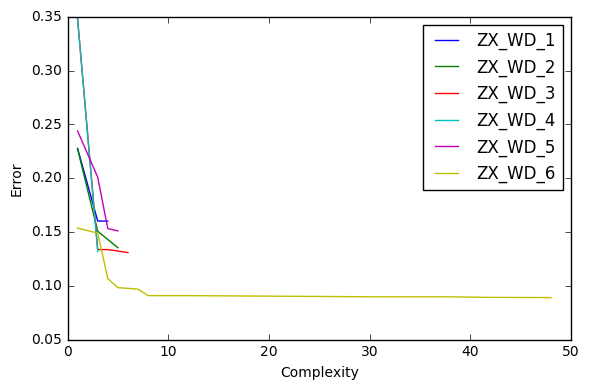

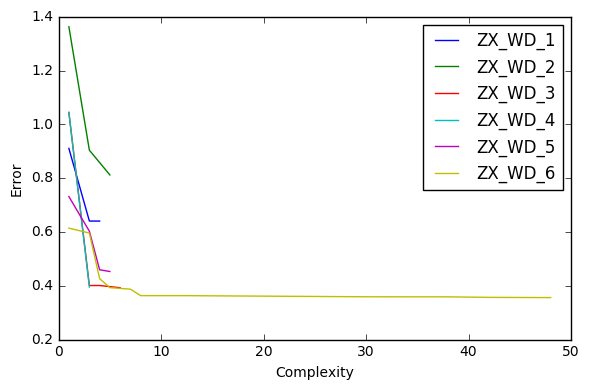

In [134]:
# hyper = {'gen': 286, 'mu': 500, 'cxpb': 0.5}
# for result of ZX_WD_3
deap_result_3 = learn_nodelay_deap(data)
result_summary_gp(deap_result_3,varnames[0:var_num_learn])

1.07470926301023*ZX_WD_6
0.55400000000000005*ZX_WD_4 + 0.55400000000000005*ZX_WD_5
-sqrt(ZX_WD_1) + ZX_WD_4 + 6.875
0.97370983446932823*ZX_WD_3
0.63100000000000001*ZX_WD_1 + 10.0
0.23799999999999999*ZX_HW_1 + 0.47599999999999998*ZX_WD_1 + 0.23799999999999999*log((ZD_JHG + sqrt(ZX_WD_3) + square(ZX_HW_2 + 2*ZX_WD_4 + sqrt(log(ZX_HW_2))))*square(ZX_WD_4)) + 0.23799999999999999*log((ZD_JHG + ZD_TFG + ZX_WD_1 + log(ZD_LCG + ZD_SPEED))*square(ZX_WD_4)) + 0.23799999999999999*log(ZX_WD_1 + log(ZD_LCG))


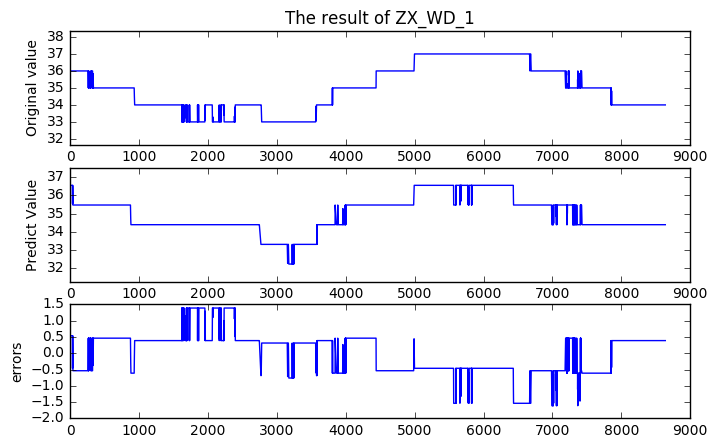

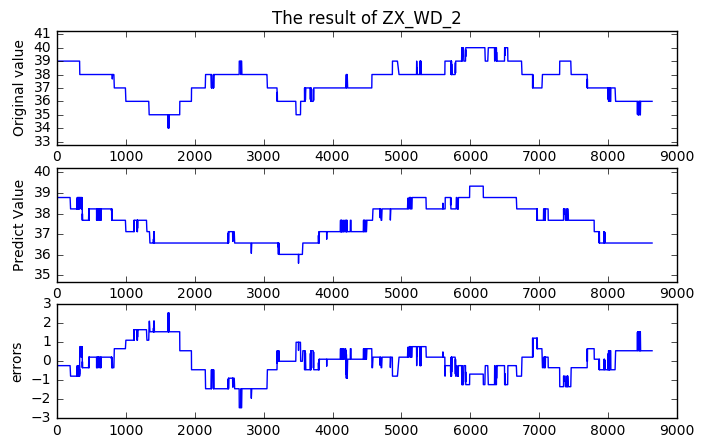

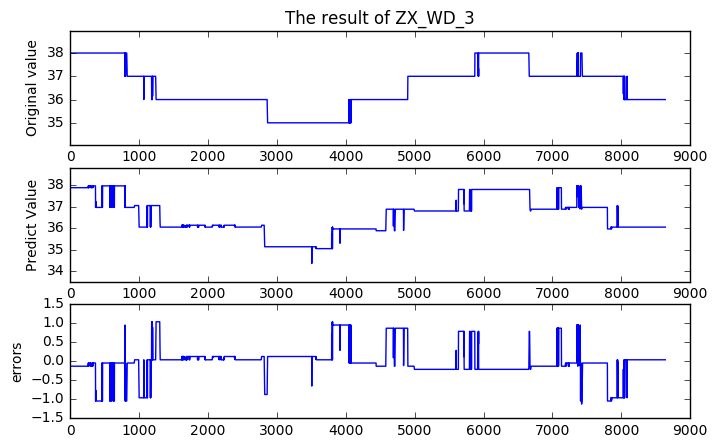

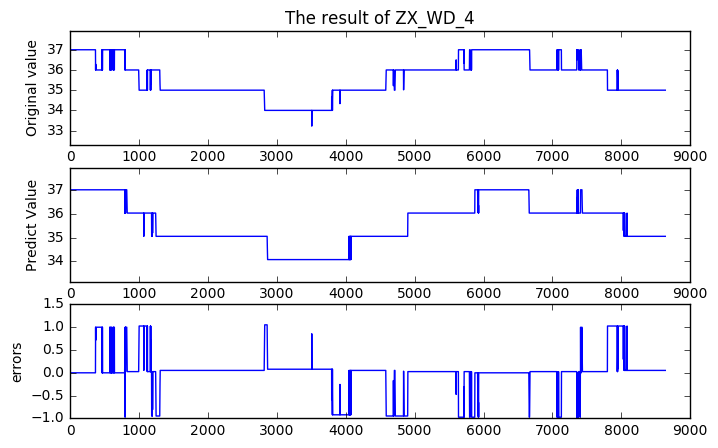

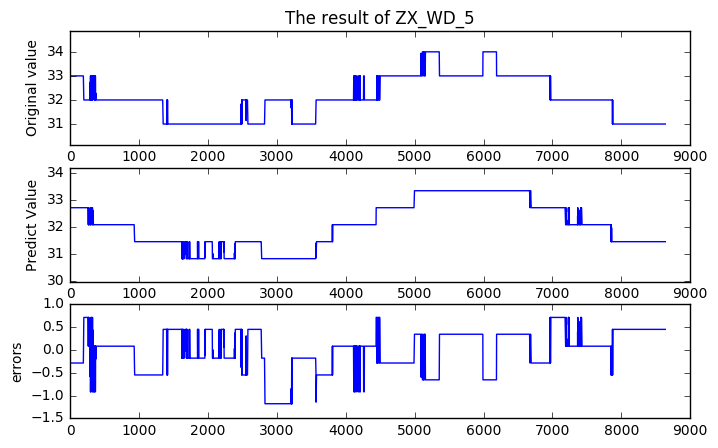

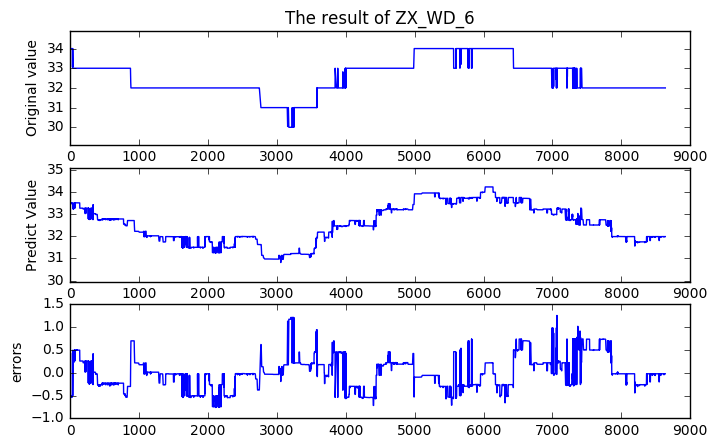

In [135]:
compare_plot_deap([0,0,0,0,0,0],data,deap_result_3)

-------------------------learn ZX_WD_1------------
gen	evals	min                      	max        	diversity
0  	418  	[ 0.67012798  2.        ]	[ inf  24.]	405      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


1  	500  	[ 0.67012798  1.        ]	[ inf   6.]	492      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


2  	500  	[ 0.67012798  1.        ]	[ inf   4.]	478      
3  	500  	[ 0.67012798  1.        ]	[ inf   9.]	481      
4  	500  	[ 0.67012798  1.        ]	[ inf  10.]	474      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


5  	500  	[ 0.67012798  1.        ]	[ inf   6.]	477      
6  	500  	[ 0.67012798  1.        ]	[ inf   9.]	466      
7  	500  	[ 0.67012798  1.        ]	[ inf  11.]	464      
8  	500  	[ 0.67012798  1.        ]	[ inf  13.]	463      
9  	500  	[ 0.66517145  1.        ]	[ inf  11.]	458      
10 	500  	[ 0.66517145  1.        ]	[ inf  13.]	451      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


11 	500  	[ 0.61681769  1.        ]	[ inf   9.]	440      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


12 	500  	[ 0.67012798  1.        ]	[ inf   4.]	437      
13 	500  	[ 0.67012798  1.        ]	[ inf   9.]	432      
14 	500  	[ 0.67012798  1.        ]	[ inf  10.]	430      
15 	500  	[ 0.67012798  1.        ]	[ inf  11.]	432      
16 	500  	[ 0.63935423  1.        ]	[ inf  11.]	426      
17 	500  	[ 0.63935423  1.        ]	[ inf  13.]	427      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


18 	500  	[ 0.63935423  1.        ]	[ inf   6.]	422      
19 	500  	[ 0.63935423  1.        ]	[ inf   9.]	425      
20 	500  	[ 0.63935423  1.        ]	[ inf  11.]	427      
21 	500  	[ 0.63935423  1.        ]	[ inf  14.]	429      
22 	500  	[ 0.63935423  1.        ]	[ inf  14.]	432      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


23 	500  	[ 0.63935423  1.        ]	[ inf   7.]	428      
24 	500  	[ 0.63935423  1.        ]	[ inf   9.]	427      
25 	500  	[ 0.63935423  1.        ]	[ inf  12.]	428      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


26 	500  	[ 0.63935423  1.        ]	[  5.82882414e+15   1.20000000e+01]	428      
27 	500  	[ 0.608435  1.      ]    	[  2.84828699e+14   1.20000000e+01]	426      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


28 	500  	[ 0.608435  1.      ]    	[ inf  13.]                        	423      
29 	500  	[ 0.64034114  1.        ]	[ inf   4.]                        	419      
30 	500  	[ 0.64034114  1.        ]	[ inf   9.]                        	419      
31 	500  	[ 0.64034114  1.        ]	[ inf  10.]                        	416      
32 	500  	[ 0.64034114  1.        ]	[ inf  10.]                        	416      
33 	500  	[ 0.64034114  1.        ]	[ inf  10.]                        	414      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


34 	500  	[ 0.64034114  1.        ]	[ inf   8.]                        	411      
35 	500  	[ 0.64034114  1.        ]	[ inf  10.]                        	413      
36 	500  	[ 0.64034114  1.        ]	[ inf  11.]                        	414      
37 	500  	[ 0.64034114  1.        ]	[ inf  13.]                        	416      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


38 	500  	[ 0.64034114  1.        ]	[ inf   8.]                        	417      
39 	500  	[ 0.64034114  1.        ]	[  5.82882414e+15   1.00000000e+01]	417      
40 	500  	[ 0.64034114  1.        ]	[  4.06149647e+05   1.10000000e+01]	412      
41 	500  	[ 0.57925518  1.        ]	[  2.22749190e+05   1.10000000e+01]	414      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


42 	500  	[ 0.64034114  1.        ]	[ inf   6.]                        	409      
43 	500  	[ 0.64034114  1.        ]	[  6.64733812e+16   9.00000000e+00]	407      
44 	500  	[ 0.64034114  1.        ]	[  5.82882414e+15   1.10000000e+01]	406      
45 	500  	[ 0.64034114  1.        ]	[  2.84828699e+14   1.20000000e+01]	407      
46 	500  	[ 0.52110033  1.        ]	[  1.79262619e+14   1.50000000e+01]	409      
47 	500  	[ 0.52110033  1.        ]	[  4.06149647e+05   1.20000000e+01]	412      
48 	500  	[ 0.52110033  1.        ]	[  2.22749190e+05   1.40000000e+01]	412      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


49 	500  	[ 0.52110033  1.        ]	[ inf   6.]                        	406      
50 	500  	[ 0.52110033  1.        ]	[ inf  10.]                        	405      
51 	500  	[ 0.52110033  1.        ]	[  6.64733812e+16   1.00000000e+01]	402      
52 	500  	[ 0.52110033  1.        ]	[  5.82882414e+15   1.10000000e+01]	402      
53 	500  	[ 0.52110033  1.        ]	[  2.84828699e+14   1.10000000e+01]	404      
54 	500  	[ 0.52110033  1.        ]	[  1.79262619e+14   1.10000000e+01]	404      
55 	500  	[ 0.52110033  1.        ]	[  4.06149647e+05   1.30000000e+01]	406      
56 	500  	[ 0.52110033  1.        ]	[  2.29527248e+05   1.40000000e+01]	406      
57 	500  	[ 0.52110033  1.        ]	[ 1376.19440783    14.        ]    	405      
58 	500  	[ 0.52110033  1.        ]	[ 1234.43135412    16.        ]    	408      
59 	500  	[ 0.52110033  1.        ]	[ 1164.40885061    16.        ]    	407      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


60 	500  	[ 0.52110033  1.        ]	[ inf   7.]                        	402      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


61 	500  	[ 0.52110033  1.        ]	[ inf   6.]                        	399      
62 	500  	[ 0.52110033  1.        ]	[  6.64733812e+16   1.10000000e+01]	398      
63 	500  	[ 0.52110033  1.        ]	[  1.55377213e+16   1.10000000e+01]	397      
64 	500  	[ 0.52110033  1.        ]	[  5.82882414e+15   1.10000000e+01]	396      
65 	500  	[ 0.52110033  1.        ]	[  2.70941316e+14   1.10000000e+01]	394      
66 	500  	[ 0.52110033  1.        ]	[  1.79262619e+14   1.10000000e+01]	392      
67 	500  	[ 0.49181881  1.        ]	[  2.29527248e+05   1.20000000e+01]	389      
68 	500  	[ 0.49181881  1.        ]	[ 1376.19440783    12.        ]    	388      
69 	500  	[ 0.49181881  1.        ]	[ 1234.43135412    15.        ]    	387      
70 	500  	[ 0.49181881  1.        ]	[ 1026.71874138    15.        ]    	392      
71 	500  	[ 0.49181881  1.        ]	[ 1019.82035196    16.        ]    	395      
72 	500  	[ 0.48358035  1.        ]	[ 599.61334613   18.        ]      	392      
73 	500  	[ 0.48

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


107	500  	[ 0.4524565  1.       ]  	[ inf  21.]                        	400      
108	500  	[ 0.48358035  1.        ]	[ inf   6.]                        	395      
109	500  	[ 0.48358035  1.        ]	[ inf   9.]                        	395      
110	500  	[ 0.48358035  1.        ]	[  6.64733812e+16   1.10000000e+01]	393      
111	500  	[ 0.48358035  1.        ]	[  2.84828699e+14   1.10000000e+01]	388      
112	500  	[ 0.48358035  1.        ]	[  4.06149647e+05   1.10000000e+01]	382      
113	500  	[ 0.48358035  1.        ]	[ 1376.19440783    11.        ]    	381      
114	500  	[ 0.48358035  1.        ]	[ 1234.43135412    12.        ]    	372      
115	500  	[ 0.48358035  1.        ]	[ 1019.82035196    12.        ]    	369      
116	500  	[ 0.48358035  1.        ]	[ 704.61824411   12.        ]      	363      
117	500  	[ 0.48358035  1.        ]	[ 599.61334613   12.        ]      	360      
118	500  	[ 0.48358035  1.        ]	[ 599.61334613   12.        ]      	359      
119	500  	[ 0.48

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


141	500  	[ 0.4629623  1.       ]  	[ 704.61824411    9.        ]      	355      
142	500  	[ 0.4629623  1.       ]  	[ 599.61334613   12.        ]      	349      
143	500  	[ 0.4629623  1.       ]  	[ 599.61334613   12.        ]      	348      
144	500  	[ 0.36523482  1.        ]	[ 599.61334613   13.        ]      	345      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


145	500  	[ 0.36523482  1.        ]	[ 599.61334613    9.        ]      	343      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


146	500  	[ 0.36523482  1.        ]	[ 599.61334613    9.        ]      	341      
147	500  	[ 0.36523482  1.        ]	[ 599.61334613   14.        ]      	339      
148	500  	[ 0.36523482  1.        ]	[ 599.61334613   14.        ]      	337      
149	500  	[ 0.36523482  1.        ]	[ 599.61334613   14.        ]      	334      
150	500  	[ 0.36523482  1.        ]	[ 599.61334613   14.        ]      	332      
151	500  	[ 0.36523482  1.        ]	[ 599.61334613   14.        ]      	332      
152	500  	[ 0.36523482  1.        ]	[ 599.61334613   14.        ]      	333      
153	500  	[ 0.36523482  1.        ]	[ 599.61334613   14.        ]      	335      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


154	500  	[ 0.36523482  1.        ]	[ 599.61334613    9.        ]      	333      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


155	500  	[ 0.36523482  1.        ]	[ 599.61334613   10.        ]      	333      
156	500  	[ 0.36523482  1.        ]	[ 599.61334613   11.        ]      	330      
157	500  	[ 0.36523482  1.        ]	[ 599.61334613   11.        ]      	331      
158	500  	[ 0.36523482  1.        ]	[ 599.61334613   11.        ]      	330      
159	500  	[ 0.36523482  1.        ]	[ 599.61334613   11.        ]      	331      
160	500  	[ 0.36523482  1.        ]	[ 599.61334613   11.        ]      	329      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


161	500  	[ 0.36523482  1.        ]	[ 599.61334613    9.        ]      	325      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


162	500  	[ 0.36523482  1.        ]	[ inf   9.]                        	351      
163	500  	[ 0.36523482  1.        ]	[ inf   9.]                        	408      
164	500  	[ 0.6402387  1.       ]  	[ inf   4.]                        	417      
165	500  	[ 0.6402387  1.       ]  	[ inf   8.]                        	417      
166	500  	[ 0.6402387  1.       ]  	[ inf  10.]                        	412      
167	500  	[ 0.6402387  1.       ]  	[ inf  16.]                        	407      
168	500  	[ 0.6402387  1.       ]  	[ inf  16.]                        	409      
169	500  	[ 0.6402387  1.       ]  	[ inf  16.]                        	405      
170	500  	[ 0.6402387  1.       ]  	[ inf  16.]                        	406      
171	500  	[ 0.6402387  1.       ]  	[ inf  16.]                        	407      
172	500  	[ 0.6402387  1.       ]  	[  6.64733812e+16   2.20000000e+01]	407      
173	500  	[ 0.62582104  1.        ]	[  2.84828699e+14   1.30000000e+01]	407      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


174	500  	[ 0.62582104  1.        ]	[ inf   7.]                        	401      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


175	500  	[ 0.62582104  1.        ]	[ inf   6.]                        	397      
176	500  	[ 0.62580704  1.        ]	[ inf   9.]                        	393      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


177	500  	[ 0.62580704  1.        ]	[ inf   9.]                        	401      
178	500  	[ 0.62580704  1.        ]	[ inf  10.]                        	397      
179	500  	[ 0.62580704  1.        ]	[ inf  10.]                        	398      
180	500  	[ 0.62580704  1.        ]	[  6.64733812e+16   1.10000000e+01]	400      
181	500  	[ 0.62580704  1.        ]	[  1.55377213e+16   1.10000000e+01]	402      
182	500  	[ 0.62580704  1.        ]	[  1.79262619e+14   1.20000000e+01]	400      
183	500  	[ 0.62580704  1.        ]	[  4.06149647e+05   1.30000000e+01]	401      
184	500  	[ 0.62580704  1.        ]	[  2.22749190e+05   1.30000000e+01]	405      
185	500  	[ 0.62580704  1.        ]	[  2.22749190e+05   1.30000000e+01]	408      
186	500  	[ 0.62580704  1.        ]	[ 1304.0073951    16.       ]      	411      
187	500  	[ 0.62580704  1.        ]	[ 1234.43135412    17.        ]    	410      
188	500  	[ 0.59834335  1.        ]	[ 1164.40885061    17.        ]    	410      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


189	500  	[ 0.59834335  1.        ]	[ 1026.71874138    12.        ]    	409      
190	500  	[ 0.59834335  1.        ]	[ 1019.82035196    12.        ]    	410      
191	500  	[ 0.59834335  1.        ]	[ 704.61824411   14.        ]      	410      
192	500  	[ 0.28457826  1.        ]	[ 599.61334613   15.        ]      	413      
193	500  	[ 0.28457826  1.        ]	[ 599.61334613   17.        ]      	413      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


194	500  	[ 0.59834335  1.        ]	[ inf   6.]                        	405      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


195	500  	[ 0.59834335  1.        ]	[ inf   6.]                        	401      
196	500  	[ 0.59834335  1.        ]	[ inf  10.]                        	398      
197	500  	[ 0.59834335  1.        ]	[  3.58656504e+33   1.20000000e+01]	396      
198	500  	[ 0.58740733  1.        ]	[  5.82882414e+15   1.00000000e+01]	394      
199	500  	[ 0.58740733  1.        ]	[  2.84828699e+14   1.10000000e+01]	393      
200	500  	[ 0.58740733  1.        ]	[  1.87566569e+09   1.10000000e+01]	391      
201	500  	[ 0.58740733  1.        ]	[  4.06149647e+05   1.10000000e+01]	391      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


202	500  	[ 0.58740733  1.        ]	[ inf   6.]                        	408      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


203	500  	[ 0.6402387  1.       ]  	[ inf   4.]                        	403      
204	500  	[ 0.6402387  1.       ]  	[ inf  10.]                        	398      
205	500  	[ 0.6402387  1.       ]  	[ inf  10.]                        	391      
206	500  	[ 0.56790421  1.        ]	[ inf  10.]                        	389      
207	500  	[ 0.56790421  1.        ]	[ inf  11.]                        	389      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


208	500  	[ 0.56790421  1.        ]	[ inf   6.]                        	389      
209	500  	[ 0.56790421  1.        ]	[ inf   8.]                        	387      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


210	500  	[ 0.6402387  1.       ]  	[ inf   4.]                        	380      
211	500  	[ 0.6402387  1.       ]  	[ inf   9.]                        	379      
212	500  	[ 0.6402387  1.       ]  	[ inf   9.]                        	377      
213	500  	[ 0.6402387  1.       ]  	[ inf  12.]                        	376      
214	500  	[ 0.6402387  1.       ]  	[ inf  12.]                        	373      
215	500  	[ 0.6402387  1.       ]  	[ inf  12.]                        	375      
216	500  	[ 0.6402387  1.       ]  	[ inf  12.]                        	374      
217	500  	[ 0.6402387  1.       ]  	[ inf  12.]                        	377      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


218	500  	[ 0.6402387  1.       ]  	[ inf   4.]                        	378      
219	500  	[ 0.6402387  1.       ]  	[ inf   9.]                        	374      
220	500  	[ 0.56205364  1.        ]	[ inf  10.]                        	370      
221	500  	[ 0.56205364  1.        ]	[ inf  10.]                        	367      
222	500  	[ 0.56205364  1.        ]	[ inf  10.]                        	368      
223	500  	[ 0.56205364  1.        ]	[ inf  12.]                        	370      
224	500  	[ 0.56205364  1.        ]	[ inf  14.]                        	372      
225	500  	[ 0.56205364  1.        ]	[ inf  14.]                        	379      
226	500  	[ 0.56205364  1.        ]	[ inf  15.]                        	383      
227	500  	[ 0.56205364  1.        ]	[  6.64733812e+16   1.50000000e+01]	390      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


228	500  	[ 0.56205364  1.        ]	[  6.64733812e+16   6.00000000e+00]	389      
229	500  	[ 0.56205364  1.        ]	[ inf  10.]                        	388      
230	500  	[ 0.56205364  1.        ]	[ inf  12.]                        	387      
231	500  	[ 0.56205364  1.        ]	[ inf  13.]                        	385      
232	500  	[ 0.56205364  1.        ]	[  5.82882414e+15   1.30000000e+01]	390      
233	500  	[ 0.56205364  1.        ]	[  2.84828699e+14   1.30000000e+01]	393      
234	500  	[ 0.56205364  1.        ]	[  2.70941316e+14   1.30000000e+01]	397      
235	500  	[ 0.56205364  1.        ]	[  1.87566569e+09   1.30000000e+01]	397      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


236	500  	[ 0.56205364  1.        ]	[  2.22749190e+05   1.30000000e+01]	398      
237	500  	[ 0.56205364  1.        ]	[ 1376.19440783    14.        ]    	398      
238	500  	[ 0.56205364  1.        ]	[ 1234.43135412    14.        ]    	400      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


239	500  	[ 0.56205364  1.        ]	[ inf  11.]                        	394      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


240	500  	[ 0.6402387  1.       ]  	[ inf   4.]                        	394      
241	500  	[ 0.6402387  1.       ]  	[ inf   9.]                        	384      
242	500  	[ 0.63847938  1.        ]	[ inf   8.]                        	380      
243	500  	[ 0.63847938  1.        ]	[ inf   9.]                        	378      
244	500  	[ 0.63847938  1.        ]	[ inf  10.]                        	380      
245	500  	[ 0.63847938  1.        ]	[ inf  10.]                        	381      
246	500  	[ 0.62582104  1.        ]	[ inf  13.]                        	379      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


247	500  	[ 0.62582104  1.        ]	[ inf   6.]                        	380      
248	500  	[ 0.62582104  1.        ]	[ inf   9.]                        	377      
249	500  	[ 0.62582104  1.        ]	[ inf   9.]                        	378      
250	500  	[ 0.62582104  1.        ]	[ inf  11.]                        	379      
251	500  	[ 0.58503038  1.        ]	[  6.64733812e+16   1.10000000e+01]	383      
252	500  	[ 0.58503038  1.        ]	[  2.80173898e+15   1.20000000e+01]	385      
253	500  	[ 0.58503038  1.        ]	[  2.84828699e+14   1.20000000e+01]	386      
254	500  	[ 0.58503038  1.        ]	[  4.06149647e+05   1.20000000e+01]	389      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


255	500  	[ 0.55589591  1.        ]	[ inf   8.]                        	385      
256	500  	[ 0.6402387  1.       ]  	[ inf   4.]                        	381      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


257	500  	[ 0.6402387  1.       ]  	[ inf   4.]                        	377      
258	500  	[ 0.6402387  1.       ]  	[ inf  10.]                        	381      
259	500  	[ 0.6402387  1.       ]  	[ inf  10.]                        	374      
260	500  	[ 0.6402387  1.       ]  	[ inf   9.]                        	372      
261	500  	[ 0.6402387  1.       ]  	[ inf  10.]                        	372      
262	500  	[ 0.54423066  1.        ]	[ inf  11.]                        	372      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


263	500  	[ 0.54423066  1.        ]	[ inf   6.]                        	369      
264	500  	[ 0.54423066  1.        ]	[ inf   7.]                        	365      
265	500  	[ 0.54423066  1.        ]	[ inf  10.]                        	370      
266	500  	[ 0.54423066  1.        ]	[ inf  11.]                        	371      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


267	500  	[ 0.63445881  1.        ]	[ inf   5.]                        	370      
268	500  	[ 0.63445881  1.        ]	[ inf   9.]                        	369      
269	500  	[ 0.63445881  1.        ]	[ inf  10.]                        	367      
270	500  	[ 0.63445881  1.        ]	[ inf  10.]                        	370      
271	500  	[ 0.63445881  1.        ]	[ inf  10.]                        	370      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


272	500  	[ 0.63445881  1.        ]	[ inf   6.]                        	367      
273	500  	[ 0.63445881  1.        ]	[ inf   9.]                        	371      
274	500  	[ 0.63445881  1.        ]	[ inf   9.]                        	372      
275	500  	[ 0.63445881  1.        ]	[ inf   9.]                        	373      
276	500  	[ 0.63445881  1.        ]	[ inf   8.]                        	374      
277	500  	[ 0.63445881  1.        ]	[ inf   9.]                        	376      
278	500  	[ 0.6085188  1.       ]  	[ inf   9.]                        	377      
279	500  	[ 0.6085188  1.       ]  	[  3.58656504e+33   1.00000000e+01]	378      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


280	500  	[ 0.6085188  1.       ]  	[ inf   6.]                        	372      
281	500  	[ 0.6085188  1.       ]  	[ inf   9.]                        	372      
282	500  	[ 0.6085188  1.       ]  	[ inf  10.]                        	374      
283	500  	[ 0.6085188  1.       ]  	[  3.58656504e+33   1.30000000e+01]	373      
284	500  	[ 0.6085188  1.       ]  	[  6.64733812e+16   1.30000000e+01]	376      
285	500  	[ 0.6085188  1.       ]  	[  5.82882414e+15   1.30000000e+01]	378      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


286	500  	[ 0.6085188  1.       ]  	[ inf   6.]                        	376      
287	500  	[ 0.6085188  1.       ]  	[  6.64733812e+16   1.10000000e+01]	376      
288	500  	[ 0.59834335  1.        ]	[  2.80173898e+15   1.10000000e+01]	375      
289	500  	[ 0.59834335  1.        ]	[  2.84828699e+14   1.00000000e+01]	373      
290	500  	[ 0.59834335  1.        ]	[  2.70941316e+14   1.00000000e+01]	373      
291	500  	[ 0.59834335  1.        ]	[  2.70941316e+14   1.10000000e+01]	375      
292	500  	[ 0.59834335  1.        ]	[  1.87566569e+09   1.10000000e+01]	374      
293	500  	[ 0.59834335  1.        ]	[  2.29527248e+05   1.30000000e+01]	374      
294	500  	[ 0.58977145  1.        ]	[ 1376.19440783    14.        ]    	376      
295	500  	[ 0.56084371  1.        ]	[ 1376.19440783    16.        ]    	381      
296	500  	[ 0.56084371  1.        ]	[ 1304.0073951    16.       ]      	382      
297	500  	[ 0.56084371  1.        ]	[ 1026.71874138    16.        ]    	384      
298	500  	[ 0.56

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


305	500  	[ 0.49677757  1.        ]	[  6.64733812e+16   6.00000000e+00]	380      
306	500  	[ 0.49677757  1.        ]	[ inf  11.]                        	378      
307	500  	[ 0.49677757  1.        ]	[  6.64733812e+16   1.10000000e+01]	376      
308	500  	[ 0.49677757  1.        ]	[  1.87566569e+09   1.10000000e+01]	370      
309	500  	[ 0.49677757  1.        ]	[  2.22749190e+05   1.30000000e+01]	369      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


310	500  	[ 0.49677757  1.        ]	[  1.55377213e+16   6.00000000e+00]	366      
311	500  	[ 0.49677757  1.        ]	[  4.06149647e+05   1.00000000e+01]	362      
312	500  	[ 0.49677757  1.        ]	[  2.22749190e+05   8.00000000e+00]	361      
313	500  	[ 0.49677757  1.        ]	[  2.22749190e+05   9.00000000e+00]	361      
314	500  	[ 0.49677757  1.        ]	[ 1304.0073951     9.       ]      	357      
315	500  	[ 0.49677757  1.        ]	[ 1234.43135412    13.        ]    	357      
316	500  	[ 0.49677757  1.        ]	[ 1164.40885061    13.        ]    	358      
317	500  	[ 0.49677757  1.        ]	[ 1026.71874138    13.        ]    	356      
318	500  	[ 0.49677757  1.        ]	[ 1019.82035196    13.        ]    	354      
319	500  	[ 0.49677757  1.        ]	[ 996.6271136   13.       ]        	351      
320	500  	[ 0.49677757  1.        ]	[ 704.61824411   13.        ]      	352      
321	500  	[ 0.49677757  1.        ]	[ 599.61334613   13.        ]      	354      
322	500  	[ 0.49

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


328	500  	[ 0.49677757  1.        ]	[ 599.61334613   11.        ]      	357      
329	500  	[ 0.49677757  1.        ]	[ 599.61334613   11.        ]      	360      
330	500  	[ 0.49677757  1.        ]	[ 599.61334613   11.        ]      	360      
331	500  	[ 0.49677757  1.        ]	[ 599.61334613   13.        ]      	366      
332	500  	[ 0.49677757  1.        ]	[ 599.61334613   15.        ]      	365      
333	500  	[ 0.49677757  1.        ]	[ 599.61334613   18.        ]      	366      
334	500  	[ 0.49677757  1.        ]	[ 599.61334613   18.        ]      	367      
335	500  	[ 0.49181881  1.        ]	[ 599.61334613   17.        ]      	370      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


336	500  	[ 0.49181881  1.        ]	[  1.55377213e+16   8.00000000e+00]	369      
337	500  	[ 0.48128962  1.        ]	[ 599.61334613   12.        ]      	361      
338	500  	[ 0.48128962  1.        ]	[ 599.61334613   11.        ]      	358      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


339	500  	[ 0.48128962  1.        ]	[ 599.61334613   10.        ]      	356      
340	500  	[ 0.48128962  1.        ]	[ 599.61334613   15.        ]      	352      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


341	500  	[ 0.48644159  1.        ]	[ 599.61334613    8.        ]      	352      
342	500  	[ 0.48514899  1.        ]	[ 599.61334613   12.        ]      	352      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


343	500  	[ 0.48514899  1.        ]	[ 599.61334613   11.        ]      	351      
344	500  	[ 0.48514899  1.        ]	[ 599.61334613   11.        ]      	348      
345	500  	[ 0.48514899  1.        ]	[ 599.61334613   11.        ]      	351      
346	500  	[ 0.48514899  1.        ]	[ 599.61334613   12.        ]      	355      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


347	500  	[ 0.48514899  1.        ]	[ inf  12.]                        	385      
348	500  	[ 0.6402387  1.       ]  	[ inf   4.]                        	406      
349	500  	[ 0.6402387  1.       ]  	[ inf  10.]                        	410      
350	500  	[ 0.6402387  1.       ]  	[ inf  10.]                        	407      
351	500  	[ 0.6402387  1.       ]  	[ inf  10.]                        	401      
352	500  	[ 0.6402387  1.       ]  	[ inf  10.]                        	400      
353	500  	[ 0.6402387  1.       ]  	[ inf  10.]                        	402      
354	500  	[ 0.6402387  1.       ]  	[ inf  14.]                        	403      
355	500  	[ 0.6402387  1.       ]  	[  3.58656504e+33   1.40000000e+01]	400      
356	500  	[ 0.6402387  1.       ]  	[  2.84828699e+14   1.40000000e+01]	401      
357	500  	[ 0.6402387  1.       ]  	[  4.06149647e+05   1.30000000e+01]	398      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


358	500  	[ 0.6402387  1.       ]  	[  2.22749190e+05   1.00000000e+01]	395      
359	500  	[ 0.59834335  1.        ]	[ 1304.0073951    13.       ]      	393      
360	500  	[ 0.59834335  1.        ]	[ 1234.43135412    13.        ]    	388      
361	500  	[ 0.59834335  1.        ]	[  2.29527248e+05   1.30000000e+01]	396      
362	500  	[ 0.59834335  1.        ]	[ 1304.0073951    14.       ]      	398      
363	500  	[ 0.48357308  1.        ]	[ 1164.40885061    14.        ]    	396      
364	500  	[ 0.48357308  1.        ]	[ 1026.71874138    14.        ]    	402      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


365	500  	[ 0.6402387  1.       ]  	[ inf   5.]                        	396      
366	500  	[ 0.6402387  1.       ]  	[ inf  10.]                        	396      
367	500  	[ 0.6402387  1.       ]  	[ inf   9.]                        	387      
368	500  	[ 0.6402387  1.       ]  	[ inf  11.]                        	385      
369	500  	[ 0.6402387  1.       ]  	[ inf  11.]                        	383      
370	500  	[ 0.6402387  1.       ]  	[ inf  12.]                        	384      
371	500  	[ 0.6402387  1.       ]  	[ inf  13.]                        	384      
372	500  	[ 0.6402387  1.       ]  	[ inf  14.]                        	382      
373	500  	[ 0.6402387  1.       ]  	[  3.58656504e+33   1.60000000e+01]	383      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


374	500  	[ 0.6402387  1.       ]  	[ inf   7.]                        	381      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


375	500  	[ 0.6402387  1.       ]  	[ inf   7.]                        	375      
376	500  	[ 0.6402387  1.       ]  	[ inf   9.]                        	374      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


377	500  	[ 0.6402387  1.       ]  	[ inf   7.]                        	375      
378	500  	[ 0.6402387  1.       ]  	[  6.64733812e+16   9.00000000e+00]	378      
379	500  	[ 0.6402387  1.       ]  	[  6.64733812e+16   9.00000000e+00]	381      
380	500  	[ 0.6402387  1.       ]  	[  1.55377213e+16   9.00000000e+00]	380      
381	500  	[ 0.6402387  1.       ]  	[  1.55377213e+16   9.00000000e+00]	380      
382	500  	[ 0.6402387  1.       ]  	[  2.84828699e+14   1.00000000e+01]	378      
383	500  	[ 0.6402387  1.       ]  	[  2.70941316e+14   1.00000000e+01]	378      
384	500  	[ 0.62755359  1.        ]	[  1.87566569e+09   1.20000000e+01]	381      
385	500  	[ 0.62755359  1.        ]	[  4.06149647e+05   1.20000000e+01]	382      
386	500  	[ 0.62755359  1.        ]	[  2.29527248e+05   1.20000000e+01]	382      
387	500  	[ 0.62755359  1.        ]	[  2.22749190e+05   1.20000000e+01]	384      
388	500  	[ 0.62755359  1.        ]	[ 1304.0073951    12.       ]      	383      
389	500  	[ 0.58

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


393	500  	[ 0.58977145  1.        ]	[ inf   6.]                        	382      
394	500  	[ 0.58977145  1.        ]	[ inf  10.]                        	377      
395	500  	[ 0.58977145  1.        ]	[  3.58656504e+33   8.00000000e+00]	375      
396	500  	[ 0.58977145  1.        ]	[  1.79262619e+14   9.00000000e+00]	374      
397	500  	[ 0.58977145  1.        ]	[  2.29527248e+05   9.00000000e+00]	371      
398	500  	[ 0.58977145  1.        ]	[ 1376.19440783     9.        ]    	367      
399	500  	[ 0.58977145  1.        ]	[ 1376.19440783    11.        ]    	368      
400	500  	[ 0.58977145  1.        ]	[ 1234.43135412    12.        ]    	368      
401	500  	[ 0.58977145  1.        ]	[ 1234.43135412    12.        ]    	367      
402	500  	[ 0.58977145  1.        ]	[ 1164.40885061    15.        ]    	364      
403	500  	[ 0.58977145  1.        ]	[ 1164.40885061    15.        ]    	363      
404	500  	[ 0.58977145  1.        ]	[ 1164.40885061    15.        ]    	364      
405	500  	[ 0.58

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


433	500  	[ 0.48285571  1.        ]	[ 599.61334613   15.        ]      	368      
434	500  	[ 0.47872624  1.        ]	[ 599.61334613   15.        ]      	359      
435	500  	[ 0.47872624  1.        ]	[ 599.61334613   16.        ]      	351      
436	500  	[ 0.47872624  1.        ]	[ 599.61334613   17.        ]      	343      
437	500  	[ 0.47872624  1.        ]	[ 599.61334613   18.        ]      	335      
438	500  	[ 0.47646761  1.        ]	[ 599.61334613   18.        ]      	333      
439	500  	[ 0.47646761  1.        ]	[ 599.61334613   20.        ]      	326      
440	500  	[ 0.47646761  1.        ]	[ 599.61334613   20.        ]      	320      
441	500  	[ 0.47646761  1.        ]	[ 599.61334613   20.        ]      	311      
442	500  	[ 0.47372143  1.        ]	[ 599.61334613   20.        ]      	299      
443	500  	[ 0.47372143  1.        ]	[ 599.61334613   20.        ]      	283      
444	500  	[ 0.47372143  1.        ]	[ 599.61334613   20.        ]      	269      
445	500  	[ 0.47

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


447	500  	[ 0.47646761  1.        ]	[  1.55377213e+16   9.00000000e+00]	401      
448	500  	[ 0.47646761  1.        ]	[  3.58656504e+33   1.20000000e+01]	397      
449	500  	[ 0.47646761  1.        ]	[  2.22749190e+05   1.20000000e+01]	391      
450	500  	[ 0.47646761  1.        ]	[ 599.61334613   13.        ]      	385      
451	500  	[ 0.47646761  1.        ]	[ 599.61334613   13.        ]      	384      
452	500  	[ 0.47646761  1.        ]	[ 599.61334613   13.        ]      	379      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


453	500  	[ 0.47872624  1.        ]	[ inf   7.]                        	378      
454	500  	[ 0.47872624  1.        ]	[ 1026.71874138     9.        ]    	371      
455	500  	[ 0.47872624  1.        ]	[ 599.61334613   12.        ]      	362      
456	500  	[ 0.47872624  1.        ]	[ 599.61334613   12.        ]      	355      
457	500  	[ 0.47872624  1.        ]	[ 599.61334613   12.        ]      	351      
458	500  	[ 0.47872624  1.        ]	[ 599.61334613   12.        ]      	351      
459	500  	[ 0.47872624  1.        ]	[ 599.61334613   12.        ]      	351      
460	500  	[ 0.47872624  1.        ]	[ 599.61334613   12.        ]      	350      
461	500  	[ 0.47872624  1.        ]	[ 599.61334613   12.        ]      	349      
462	500  	[ 0.47872624  1.        ]	[ 599.61334613   13.        ]      	345      
463	500  	[ 0.47872624  1.        ]	[ 599.61334613   13.        ]      	344      
464	500  	[ 0.47872624  1.        ]	[ 599.61334613   16.        ]      	343      
465	500  	[ 0.47

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


488	500  	[ 0.47646761  1.        ]	[ inf  12.]                        	369      
489	500  	[ 0.47646761  1.        ]	[ inf   9.]                        	405      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


490	500  	[ 0.6402387  1.       ]  	[ inf   4.]                        	416      
491	500  	[ 0.6402387  1.       ]  	[ inf   9.]                        	418      
492	500  	[ 0.6402387  1.       ]  	[ inf  11.]                        	411      
493	500  	[ 0.6402387  1.       ]  	[ inf  11.]                        	410      
494	500  	[ 0.6402387  1.       ]  	[ inf  13.]                        	404      
495	500  	[ 0.6402387  1.       ]  	[ inf  13.]                        	406      
496	500  	[ 0.6402387  1.       ]  	[ inf  13.]                        	408      
497	500  	[ 0.6402387  1.       ]  	[ inf  13.]                        	407      
498	500  	[ 0.63445881  1.        ]	[ inf  13.]                        	411      
499	500  	[ 0.62755359  1.        ]	[ inf  13.]                        	408      
500	500  	[ 0.62755359  1.        ]	[  2.70941316e+14   1.40000000e+01]	407      
501	500  	[ 0.59834335  1.        ]	[ 1234.43135412    15.        ]    	401      
502	500  	[ 0.59

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


511	500  	[ 0.59834335  1.        ]	[  6.64733812e+16   8.00000000e+00]	405      
512	500  	[ 0.59834335  1.        ]	[  1.79262619e+14   1.00000000e+01]	400      
513	500  	[ 0.59834335  1.        ]	[  2.29527248e+05   1.20000000e+01]	398      
514	500  	[ 0.59834335  1.        ]	[ 1304.0073951    12.       ]      	397      
515	500  	[ 0.58977145  1.        ]	[ 1019.82035196    17.        ]    	397      
516	500  	[ 0.58977145  1.        ]	[ 1019.82035196    19.        ]    	397      
517	500  	[ 0.58977145  1.        ]	[ 704.61824411   19.        ]      	395      
518	500  	[ 0.58977145  1.        ]	[ 599.61334613   22.        ]      	396      
519	500  	[ 0.58977145  1.        ]	[ 599.61334613   22.        ]      	393      
520	500  	[ 0.58977145  1.        ]	[ 599.61334613   22.        ]      	394      
521	500  	[ 0.57836172  1.        ]	[ 599.61334613   22.        ]      	396      
522	500  	[ 0.57836172  1.        ]	[ 599.61334613   23.        ]      	400      
523	500  	[ 0.57

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


524	500  	[ 0.58977145  1.        ]	[ inf   6.]                        	399      
525	500  	[ 0.58977145  1.        ]	[ inf  10.]                        	394      
526	500  	[ 0.58977145  1.        ]	[ inf  11.]                        	397      
527	500  	[ 0.58977145  1.        ]	[  5.82882414e+15   1.10000000e+01]	395      
528	500  	[ 0.58977145  1.        ]	[  1.87566569e+09   1.10000000e+01]	388      
529	500  	[ 0.58977145  1.        ]	[  2.29527248e+05   1.10000000e+01]	383      
530	500  	[ 0.58977145  1.        ]	[  2.29527248e+05   1.10000000e+01]	379      
531	500  	[ 0.58977145  1.        ]	[  2.22749190e+05   1.00000000e+01]	378      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


532	500  	[ 0.58977145  1.        ]	[  2.29527248e+05   7.00000000e+00]	373      
533	500  	[ 0.58977145  1.        ]	[  2.29527248e+05   1.10000000e+01]	372      
534	500  	[ 0.58977145  1.        ]	[  2.22749190e+05   1.10000000e+01]	369      
535	500  	[ 0.58977145  1.        ]	[ 1304.0073951    11.       ]      	366      
536	500  	[ 0.58977145  1.        ]	[ 1234.43135412    11.        ]    	361      
537	500  	[ 0.58977145  1.        ]	[ 1026.71874138    11.        ]    	361      
538	500  	[ 0.58977145  1.        ]	[ 996.6271136   10.       ]        	358      
539	500  	[ 0.58977145  1.        ]	[ 996.6271136   13.       ]        	358      
540	500  	[ 0.58977145  1.        ]	[ 704.61824411   11.        ]      	359      
541	500  	[ 0.58977145  1.        ]	[ 704.61824411   11.        ]      	355      
542	500  	[ 0.57836172  1.        ]	[ 599.61334613   12.        ]      	358      
543	500  	[ 0.57836172  1.        ]	[ 599.61334613   12.        ]      	357      
544	500  	[ 0.53

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


546	500  	[ 0.53826553  1.        ]	[ inf  15.]                        	386      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


547	500  	[ 0.6402387  1.       ]  	[ inf   4.]                        	405      
548	500  	[ 0.6402387  1.       ]  	[ inf   9.]                        	401      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


549	500  	[ 0.6402387  1.       ]  	[ inf   6.]                        	392      
550	500  	[ 0.6402387  1.       ]  	[ inf  11.]                        	388      
551	500  	[ 0.6402387  1.       ]  	[ inf  11.]                        	381      
552	500  	[ 0.6402387  1.       ]  	[ inf  10.]                        	384      
553	500  	[ 0.6402387  1.       ]  	[ inf  10.]                        	385      
554	500  	[ 0.6402387  1.       ]  	[ inf  10.]                        	384      
555	500  	[ 0.6402387  1.       ]  	[ inf  14.]                        	388      
556	500  	[ 0.6402387  1.       ]  	[ inf  14.]                        	388      
557	500  	[ 0.6402387  1.       ]  	[  5.82882414e+15   1.40000000e+01]	392      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


558	500  	[ 0.6402387  1.       ]  	[  1.79262619e+14   1.10000000e+01]	390      
559	500  	[ 0.6402387  1.       ]  	[  2.29527248e+05   1.10000000e+01]	392      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


560	500  	[ 0.6402387  1.       ]  	[ inf   6.]                        	391      
561	500  	[ 0.64003408  1.        ]	[ inf  10.]                        	391      
562	500  	[ 0.64003408  1.        ]	[ inf   8.]                        	388      
563	500  	[ 0.64003408  1.        ]	[  6.64733812e+16   8.00000000e+00]	389      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


564	500  	[ 0.6402387  1.       ]  	[ inf   6.]                        	387      
565	500  	[ 0.6402387  1.       ]  	[  3.58656504e+33   1.00000000e+01]	385      
566	500  	[ 0.6402387  1.       ]  	[  6.64733812e+16   1.20000000e+01]	387      
567	500  	[ 0.6402387  1.       ]  	[  1.55377213e+16   1.50000000e+01]	387      
568	500  	[ 0.63679894  1.        ]	[  1.55377213e+16   9.00000000e+00]	388      
569	500  	[ 0.62434773  1.        ]	[  5.82882414e+15   9.00000000e+00]	390      
570	500  	[ 0.62434773  1.        ]	[  2.84828699e+14   9.00000000e+00]	390      
571	500  	[ 0.62434773  1.        ]	[  2.70941316e+14   9.00000000e+00]	394      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


572	500  	[ 0.58503192  1.        ]	[  1.79262619e+14   9.00000000e+00]	394      
573	500  	[ 0.58503192  1.        ]	[  1.79262619e+14   9.00000000e+00]	395      
574	500  	[ 0.58503192  1.        ]	[  4.06149647e+05   1.10000000e+01]	394      
575	500  	[ 0.58503192  1.        ]	[  4.06149647e+05   1.10000000e+01]	395      
576	500  	[ 0.58503192  1.        ]	[  2.29527248e+05   1.10000000e+01]	394      
577	500  	[ 0.58503192  1.        ]	[  2.29527248e+05   1.40000000e+01]	393      
578	500  	[ 0.58503192  1.        ]	[ 1376.19440783    14.        ]    	393      
579	500  	[ 0.58503192  1.        ]	[ 1234.43135412    14.        ]    	394      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


580	500  	[ 0.48840394  1.        ]	[ inf   6.]                        	391      
581	500  	[ 0.48840394  1.        ]	[ inf  10.]                        	387      
582	500  	[ 0.48840394  1.        ]	[  3.58656504e+33   1.10000000e+01]	386      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


583	500  	[ 0.48840394  1.        ]	[  3.58656504e+33   7.00000000e+00]	382      
584	500  	[ 0.48840394  1.        ]	[  2.80173898e+15   8.00000000e+00]	381      
585	500  	[ 0.48840394  1.        ]	[  2.84828699e+14   1.10000000e+01]	380      
586	500  	[ 0.48840394  1.        ]	[  1.79262619e+14   1.10000000e+01]	376      
587	500  	[ 0.48840394  1.        ]	[  1.87566569e+09   1.10000000e+01]	374      
588	500  	[ 0.48840394  1.        ]	[  4.06149647e+05   1.30000000e+01]	372      
589	500  	[ 0.48840394  1.        ]	[  2.29527248e+05   1.50000000e+01]	370      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


590	500  	[ 0.48840394  1.        ]	[ inf  10.]                        	388      
591	500  	[ 0.6402387  1.       ]  	[ inf   4.]                        	388      
592	500  	[ 0.6402387  1.       ]  	[ inf   8.]                        	386      
593	500  	[ 0.6402387  1.       ]  	[ inf   9.]                        	382      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


594	500  	[ 0.6402387  1.       ]  	[ inf   7.]                        	379      
595	500  	[ 0.6402387  1.       ]  	[ inf  11.]                        	378      
596	500  	[ 0.6402387  1.       ]  	[ inf  11.]                        	378      
597	500  	[ 0.6402387  1.       ]  	[ inf  11.]                        	375      
598	500  	[ 0.6402387  1.       ]  	[ inf  13.]                        	380      
599	500  	[ 0.6402387  1.       ]  	[ inf  12.]                        	379      
600	500  	[ 0.58977145  1.        ]	[ inf  12.]                        	382      
601	500  	[ 0.58977145  1.        ]	[  6.64733812e+16   1.20000000e+01]	385      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


602	500  	[ 0.58977145  1.        ]	[  1.55377213e+16   8.00000000e+00]	382      
603	500  	[ 0.58977145  1.        ]	[  2.70941316e+14   1.00000000e+01]	386      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


604	500  	[ 0.58977145  1.        ]	[ inf   6.]                        	380      
605	500  	[ 0.58977145  1.        ]	[  1.55377213e+16   1.00000000e+01]	377      
606	500  	[ 0.58977145  1.        ]	[  2.80173898e+15   1.00000000e+01]	380      
607	500  	[ 0.58977145  1.        ]	[  2.70941316e+14   1.00000000e+01]	384      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


608	500  	[ 0.58977145  1.        ]	[  1.79262619e+14   1.00000000e+01]	385      
609	500  	[ 0.58977145  1.        ]	[  1.79262619e+14   1.10000000e+01]	386      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


610	500  	[ 0.58977145  1.        ]	[ inf   6.]                        	382      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


611	500  	[ 0.58977145  1.        ]	[  6.64733812e+16   8.00000000e+00]	382      
612	500  	[ 0.58977145  1.        ]	[  1.55377213e+16   8.00000000e+00]	387      
613	500  	[ 0.58977145  1.        ]	[  5.82882414e+15   1.20000000e+01]	388      
614	500  	[ 0.58977145  1.        ]	[  2.80173898e+15   1.20000000e+01]	388      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


615	500  	[ 0.58977145  1.        ]	[  3.58656504e+33   6.00000000e+00]	386      
616	500  	[ 0.58977145  1.        ]	[  1.55377213e+16   8.00000000e+00]	388      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


617	500  	[ 0.58977145  1.        ]	[  1.55377213e+16   7.00000000e+00]	385      
618	500  	[ 0.58977145  1.        ]	[  5.82882414e+15   8.00000000e+00]	386      
619	500  	[ 0.58476772  1.        ]	[  2.84828699e+14   1.00000000e+01]	386      
620	500  	[ 0.58476772  1.        ]	[  1.79262619e+14   1.10000000e+01]	385      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


621	500  	[ 0.58977145  1.        ]	[  3.58656504e+33   6.00000000e+00]	383      
622	500  	[ 0.58977145  1.        ]	[  2.80173898e+15   1.10000000e+01]	382      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


623	500  	[ 0.58977145  1.        ]	[  2.80173898e+15   7.00000000e+00]	382      
624	500  	[ 0.58977145  1.        ]	[  2.80173898e+15   7.00000000e+00]	384      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


625	500  	[ 0.58503038  1.        ]	[  2.80173898e+15   6.00000000e+00]	381      
626	500  	[ 0.58503038  1.        ]	[  2.80173898e+15   1.10000000e+01]	381      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


627	500  	[ 0.58503038  1.        ]	[  1.55377213e+16   6.00000000e+00]	382      
628	500  	[ 0.58503038  1.        ]	[  2.80173898e+15   6.00000000e+00]	378      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


629	500  	[ 0.58503038  1.        ]	[ inf   5.]                        	388      
630	500  	[ 0.6402387  1.       ]  	[ inf   4.]                        	385      
631	500  	[ 0.6402387  1.       ]  	[ inf   9.]                        	381      
632	500  	[ 0.6402387  1.       ]  	[ inf   9.]                        	379      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


633	500  	[ 0.6402387  1.       ]  	[ inf   6.]                        	376      
634	500  	[ 0.61707258  1.        ]	[ inf   9.]                        	377      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


635	500  	[ 0.62755359  1.        ]	[ inf   5.]                        	371      
636	500  	[ 0.62755359  1.        ]	[ inf   8.]                        	373      
637	500  	[ 0.62755359  1.        ]	[ inf   9.]                        	376      
638	500  	[ 0.62755359  1.        ]	[ inf  10.]                        	374      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


639	500  	[ 0.62755359  1.        ]	[ inf   6.]                        	371      
640	500  	[ 0.62755359  1.        ]	[ inf  11.]                        	374      
641	500  	[ 0.62755359  1.        ]	[ inf  11.]                        	374      
642	500  	[ 0.62582104  1.        ]	[ inf  12.]                        	378      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


643	500  	[ 0.62582104  1.        ]	[ inf   6.]                        	374      
644	500  	[ 0.62582104  1.        ]	[ inf   9.]                        	377      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


645	500  	[ 0.62582104  1.        ]	[ inf   9.]                        	376      
646	500  	[ 0.62434773  1.        ]	[  6.64733812e+16   8.00000000e+00]	381      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


647	500  	[ 0.62434773  1.        ]	[  3.58656504e+33   5.00000000e+00]	379      
648	500  	[ 0.62434773  1.        ]	[ inf  10.]                        	377      
649	500  	[ 0.61460087  1.        ]	[ inf  13.]                        	375      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


650	500  	[ 0.61460087  1.        ]	[ inf   7.]                        	373      
651	500  	[ 0.61460087  1.        ]	[ inf   9.]                        	373      
652	500  	[ 0.61460087  1.        ]	[  3.58656504e+33   1.00000000e+01]	377      
653	500  	[ 0.61460087  1.        ]	[  5.82882414e+15   1.00000000e+01]	377      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


654	500  	[ 0.62434773  1.        ]	[ inf   5.]                        	376      
655	500  	[ 0.62434773  1.        ]	[ inf   9.]                        	371      
656	500  	[ 0.62434773  1.        ]	[ inf  14.]                        	371      
657	500  	[ 0.62434773  1.        ]	[ inf  14.]                        	370      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


658	500  	[ 0.62434773  1.        ]	[ inf   7.]                        	371      
659	500  	[ 0.62434773  1.        ]	[ inf  11.]                        	371      
660	500  	[ 0.62434773  1.        ]	[  3.58656504e+33   1.10000000e+01]	373      
661	500  	[ 0.62434773  1.        ]	[  6.64733812e+16   9.00000000e+00]	373      
662	500  	[ 0.62434773  1.        ]	[  1.55377213e+16   1.10000000e+01]	374      
663	500  	[ 0.62434773  1.        ]	[  2.84828699e+14   1.20000000e+01]	374      
664	500  	[ 0.62434773  1.        ]	[  1.79262619e+14   1.20000000e+01]	376      
665	500  	[ 0.62434773  1.        ]	[  1.87566569e+09   1.20000000e+01]	379      
666	500  	[ 0.58977145  1.        ]	[  2.22749190e+05   1.40000000e+01]	380      
667	500  	[ 0.58977145  1.        ]	[ 1304.0073951    14.       ]      	381      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


668	500  	[ 0.58977145  1.        ]	[ inf   6.]                        	380      
669	500  	[ 0.58977145  1.        ]	[ inf  11.]                        	379      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


670	500  	[ 0.58977145  1.        ]	[  3.58656504e+33   6.00000000e+00]	374      
671	500  	[ 0.58977145  1.        ]	[  6.64733812e+16   8.00000000e+00]	372      
672	500  	[ 0.58977145  1.        ]	[  5.82882414e+15   1.00000000e+01]	369      
673	500  	[ 0.58977145  1.        ]	[  2.84828699e+14   1.00000000e+01]	365      
674	500  	[ 0.57836172  1.        ]	[  2.84828699e+14   1.00000000e+01]	365      
675	500  	[ 0.57836172  1.        ]	[  2.70941316e+14   1.00000000e+01]	363      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


676	500  	[ 0.58977145  1.        ]	[ inf   5.]                        	357      
677	500  	[ 0.58977145  1.        ]	[ inf   7.]                        	354      
678	500  	[ 0.58977145  1.        ]	[ inf   7.]                        	351      
679	500  	[ 0.58977145  1.        ]	[ inf   7.]                        	348      
680	500  	[ 0.58977145  1.        ]	[ inf   7.]                        	349      
681	500  	[ 0.58977145  1.        ]	[  6.64733812e+16   8.00000000e+00]	348      
682	500  	[ 0.58977145  1.        ]	[  1.55377213e+16   9.00000000e+00]	348      
683	500  	[ 0.58977145  1.        ]	[  2.80173898e+15   9.00000000e+00]	345      
684	500  	[ 0.58977145  1.        ]	[  2.70941316e+14   9.00000000e+00]	348      
685	500  	[ 0.58977145  1.        ]	[  1.79262619e+14   9.00000000e+00]	350      
686	500  	[ 0.49188657  1.        ]	[  1.87566569e+09   9.00000000e+00]	351      
687	500  	[ 0.49188657  1.        ]	[  4.06149647e+05   9.00000000e+00]	353      
688	500  	[ 0.49

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


689	500  	[ 0.58977145  1.        ]	[ inf   5.]                        	352      
690	500  	[ 0.58977145  1.        ]	[ inf   8.]                        	347      
691	500  	[ 0.58977145  1.        ]	[ inf  13.]                        	345      
692	500  	[ 0.58977145  1.        ]	[  1.55377213e+16   1.30000000e+01]	345      
693	500  	[ 0.58977145  1.        ]	[  5.82882414e+15   1.30000000e+01]	343      
694	500  	[ 0.58977145  1.        ]	[  2.80173898e+15   1.40000000e+01]	344      
695	500  	[ 0.58977145  1.        ]	[  2.84828699e+14   1.40000000e+01]	343      
696	500  	[ 0.58977145  1.        ]	[  1.87566569e+09   1.40000000e+01]	341      
697	500  	[ 0.58977145  1.        ]	[  2.29527248e+05   1.40000000e+01]	342      
698	500  	[ 0.54632816  1.        ]	[ 1376.19440783    14.        ]    	342      
699	500  	[ 0.54632816  1.        ]	[ 1304.0073951    14.       ]      	345      
700	500  	[ 0.54632816  1.        ]	[ 1164.40885061    14.        ]    	345      
701	500  	[ 0.54

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


707	500  	[ 0.54632816  1.        ]	[ 599.61334613   10.        ]      	349      
708	500  	[ 0.54632816  1.        ]	[ 599.61334613   10.        ]      	349      
709	500  	[ 0.54632816  1.        ]	[ 599.61334613   10.        ]      	353      
710	500  	[ 0.54632816  1.        ]	[ 599.61334613   10.        ]      	350      
711	500  	[ 0.54632816  1.        ]	[ 599.61334613   10.        ]      	347      
712	500  	[ 0.54632816  1.        ]	[ 599.61334613   12.        ]      	353      
713	500  	[ 0.54632816  1.        ]	[ 599.61334613   12.        ]      	352      
714	500  	[ 0.5399906  1.       ]  	[ 599.61334613   12.        ]      	352      
715	500  	[ 0.48644159  1.        ]	[ 599.61334613   12.        ]      	352      
716	500  	[ 0.48644159  1.        ]	[ 599.61334613   15.        ]      	352      
717	500  	[ 0.48644159  1.        ]	[ 599.61334613   15.        ]      	353      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


718	500  	[ 0.48644159  1.        ]	[ inf   7.]                        	373      
719	500  	[ 0.48644159  1.        ]	[ inf   7.]                        	410      
720	500  	[ 0.6402387  1.       ]  	[ inf   4.]                        	410      
721	500  	[ 0.6402387  1.       ]  	[ inf   9.]                        	409      
722	500  	[ 0.6402387  1.       ]  	[ inf   9.]                        	403      
723	500  	[ 0.6402387  1.       ]  	[ inf  12.]                        	402      
724	500  	[ 0.6402387  1.       ]  	[ inf  12.]                        	403      
725	500  	[ 0.63596161  1.        ]	[ inf  11.]                        	403      
726	500  	[ 0.63596161  1.        ]	[ inf  13.]                        	401      
727	500  	[ 0.63596161  1.        ]	[ inf  13.]                        	399      
728	500  	[ 0.63596161  1.        ]	[ inf  13.]                        	400      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


729	500  	[ 0.63596161  1.        ]	[ inf   7.]                        	400      
730	500  	[ 0.63596161  1.        ]	[ inf  10.]                        	400      
731	500  	[ 0.63596161  1.        ]	[ inf  10.]                        	402      
732	500  	[ 0.63596161  1.        ]	[  1.55377213e+16   1.10000000e+01]	406      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


733	500  	[ 0.63596161  1.        ]	[  6.64733812e+16   7.00000000e+00]	403      
734	500  	[ 0.63596161  1.        ]	[  5.82882414e+15   1.10000000e+01]	402      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


735	500  	[ 0.63596161  1.        ]	[  5.82882414e+15   8.00000000e+00]	400      
736	500  	[ 0.63596161  1.        ]	[  2.80173898e+15   1.20000000e+01]	402      
737	500  	[ 0.63596161  1.        ]	[  2.70941316e+14   1.20000000e+01]	400      
738	500  	[ 0.63596161  1.        ]	[  1.79262619e+14   1.40000000e+01]	402      
739	500  	[ 0.63596161  1.        ]	[  1.87566569e+09   1.70000000e+01]	404      
740	500  	[ 0.62434773  1.        ]	[  4.06149647e+05   1.70000000e+01]	407      
741	500  	[ 0.62434773  1.        ]	[ 1376.19440783    17.        ]    	408      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


742	500  	[ 0.62434773  1.        ]	[  1.55377213e+16   6.00000000e+00]	403      
743	500  	[ 0.62434773  1.        ]	[ inf  10.]                        	398      
744	500  	[ 0.62434773  1.        ]	[  3.58656504e+33   1.10000000e+01]	395      
745	500  	[ 0.62434773  1.        ]	[  3.58656504e+33   1.10000000e+01]	398      
746	500  	[ 0.62434773  1.        ]	[  2.80173898e+15   1.10000000e+01]	394      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


747	500  	[ 0.62434773  1.        ]	[ inf   6.]                        	386      
748	500  	[ 0.62434773  1.        ]	[  2.84828699e+14   8.00000000e+00]	382      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


749	500  	[ 0.62166629  1.        ]	[  2.70941316e+14   8.00000000e+00]	380      
750	500  	[ 0.62166629  1.        ]	[  2.70941316e+14   8.00000000e+00]	381      
751	500  	[ 0.62166629  1.        ]	[  1.79262619e+14   1.00000000e+01]	385      
752	500  	[ 0.62166629  1.        ]	[  1.87566569e+09   1.40000000e+01]	386      
753	500  	[ 0.62166629  1.        ]	[  4.06149647e+05   1.40000000e+01]	386      
754	500  	[ 0.62166629  1.        ]	[  4.06149647e+05   1.40000000e+01]	388      
755	500  	[ 0.62166629  1.        ]	[  2.22749190e+05   1.40000000e+01]	387      
756	500  	[ 0.62166629  1.        ]	[ 1376.19440783    14.        ]    	386      
757	500  	[ 0.5361889  1.       ]  	[ 1304.0073951    15.       ]      	387      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


758	500  	[ 0.5361889  1.       ]  	[  1.87566569e+09   8.00000000e+00]	384      
759	500  	[ 0.5361889  1.       ]  	[  4.06149647e+05   8.00000000e+00]	384      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


760	500  	[ 0.62434773  1.        ]	[ inf   6.]                        	383      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


761	500  	[ 0.59273537  1.        ]	[  1.55377213e+16   6.00000000e+00]	383      
762	500  	[ 0.59273537  1.        ]	[  2.84828699e+14   7.00000000e+00]	381      
763	500  	[ 0.59273537  1.        ]	[  2.70941316e+14   9.00000000e+00]	379      
764	500  	[ 0.59273537  1.        ]	[  1.87566569e+09   9.00000000e+00]	377      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


765	500  	[ 0.59273537  1.        ]	[ inf   6.]                        	389      
766	500  	[ 0.6402387  1.       ]  	[ inf   4.]                        	384      
767	500  	[ 0.6402387  1.       ]  	[ inf   9.]                        	380      
768	500  	[ 0.6402387  1.       ]  	[ inf  14.]                        	382      
769	500  	[ 0.6402387  1.       ]  	[ inf  14.]                        	381      
770	500  	[ 0.6402387  1.       ]  	[ inf  11.]                        	382      
771	500  	[ 0.6402387  1.       ]  	[ inf  11.]                        	380      
772	500  	[ 0.6402387  1.       ]  	[ inf  12.]                        	377      
773	500  	[ 0.6402387  1.       ]  	[ inf  12.]                        	378      
774	500  	[ 0.6402387  1.       ]  	[ inf  12.]                        	379      
775	500  	[ 0.6402387  1.       ]  	[  6.64733812e+16   1.20000000e+01]	382      
776	500  	[ 0.6402387  1.       ]  	[  1.79262619e+14   1.40000000e+01]	389      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


777	500  	[ 0.6402387  1.       ]  	[ inf   6.]                        	392      
778	500  	[ 0.6402387  1.       ]  	[ inf  12.]                        	387      
779	500  	[ 0.6402387  1.       ]  	[  1.55377213e+16   1.70000000e+01]	390      
780	500  	[ 0.6402387  1.       ]  	[  2.80173898e+15   1.70000000e+01]	393      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


781	500  	[ 0.6402387  1.       ]  	[  2.80173898e+15   7.00000000e+00]	391      
782	500  	[ 0.6402387  1.       ]  	[  2.70941316e+14   1.10000000e+01]	393      
783	500  	[ 0.6402387  1.       ]  	[  2.80173898e+15   1.20000000e+01]	393      
784	500  	[ 0.6402387  1.       ]  	[  2.80173898e+15   1.20000000e+01]	395      
785	500  	[ 0.6402387  1.       ]  	[  1.79262619e+14   1.20000000e+01]	396      
786	500  	[ 0.6402387  1.       ]  	[  1.87566569e+09   1.30000000e+01]	398      
787	500  	[ 0.6402387  1.       ]  	[  4.06149647e+05   1.60000000e+01]	401      
788	500  	[ 0.6402387  1.       ]  	[  2.29527248e+05   1.60000000e+01]	400      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


789	500  	[ 0.6402387  1.       ]  	[ inf   6.]                        	399      
790	500  	[ 0.6402387  1.       ]  	[ inf  11.]                        	397      
791	500  	[ 0.6402387  1.       ]  	[ inf  11.]                        	394      
792	500  	[ 0.6402387  1.       ]  	[  6.64733812e+16   1.10000000e+01]	396      
793	500  	[ 0.6162793  1.       ]  	[  1.55377213e+16   1.10000000e+01]	396      
794	500  	[ 0.6162793  1.       ]  	[  5.82882414e+15   1.10000000e+01]	395      
795	500  	[ 0.6162793  1.       ]  	[  2.84828699e+14   1.40000000e+01]	394      
796	500  	[ 0.6162793  1.       ]  	[  2.84828699e+14   1.40000000e+01]	393      
797	500  	[ 0.6162793  1.       ]  	[  2.84828699e+14   1.10000000e+01]	390      
798	500  	[ 0.6162793  1.       ]  	[  1.79262619e+14   1.10000000e+01]	389      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


799	500  	[ 0.61764692  1.        ]	[ inf   6.]                        	388      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


800	500  	[ 0.58694071  1.        ]	[ inf   6.]                        	386      
801	500  	[ 0.56653151  1.        ]	[ inf   8.]                        	385      
802	500  	[ 0.56653151  1.        ]	[  3.58656504e+33   8.00000000e+00]	386      
803	500  	[ 0.56653151  1.        ]	[  5.82882414e+15   9.00000000e+00]	385      
804	500  	[ 0.56653151  1.        ]	[  5.82882414e+15   9.00000000e+00]	383      
805	500  	[ 0.56653151  1.        ]	[  2.80173898e+15   9.00000000e+00]	385      
806	500  	[ 0.56653151  1.        ]	[  2.84828699e+14   1.00000000e+01]	385      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


807	500  	[ 0.56653151  1.        ]	[ inf   6.]                        	382      
808	500  	[ 0.56653151  1.        ]	[ inf   8.]                        	382      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


809	500  	[ 0.56653151  1.        ]	[  2.84828699e+14   8.00000000e+00]	381      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


810	500  	[ 0.56653151  1.        ]	[ inf   6.]                        	379      
811	500  	[ 0.56653151  1.        ]	[  5.82882414e+15   7.00000000e+00]	379      
812	500  	[ 0.56653151  1.        ]	[  5.82882414e+15   1.10000000e+01]	379      
813	500  	[ 0.56653151  1.        ]	[  2.80173898e+15   1.10000000e+01]	380      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


814	500  	[ 0.56653151  1.        ]	[  2.80173898e+15   6.00000000e+00]	380      
815	500  	[ 0.56653151  1.        ]	[  2.84828699e+14   8.00000000e+00]	380      
816	500  	[ 0.56653151  1.        ]	[  2.70941316e+14   1.00000000e+01]	379      
817	500  	[ 0.56653151  1.        ]	[  2.70941316e+14   1.00000000e+01]	379      
818	500  	[ 0.56653151  1.        ]	[  1.79262619e+14   1.00000000e+01]	379      
819	500  	[ 0.56653151  1.        ]	[  1.87566569e+09   1.20000000e+01]	382      
820	500  	[ 0.56653151  1.        ]	[  4.06149647e+05   1.30000000e+01]	383      
821	500  	[ 0.54265374  1.        ]	[  4.06149647e+05   1.30000000e+01]	383      
822	500  	[ 0.54265374  1.        ]	[  2.22749190e+05   1.30000000e+01]	383      
823	500  	[ 0.54265374  1.        ]	[ 1376.19440783    13.        ]    	382      
824	500  	[ 0.54265374  1.        ]	[ 1304.0073951    13.       ]      	382      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


825	500  	[ 0.56653151  1.        ]	[  6.64733812e+16   6.00000000e+00]	382      
826	500  	[ 0.56653151  1.        ]	[  3.58656504e+33   8.00000000e+00]	380      
827	500  	[ 0.56653151  1.        ]	[  2.80173898e+15   9.00000000e+00]	380      
828	500  	[ 0.56653151  1.        ]	[  2.84828699e+14   9.00000000e+00]	377      
829	500  	[ 0.56653151  1.        ]	[  4.06149647e+05   1.00000000e+01]	377      
830	500  	[ 0.56653151  1.        ]	[  4.06149647e+05   1.00000000e+01]	376      
831	500  	[ 0.56653151  1.        ]	[  4.06149647e+05   1.00000000e+01]	377      
832	500  	[ 0.56653151  1.        ]	[  2.22749190e+05   1.20000000e+01]	377      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


833	500  	[ 0.56653151  1.        ]	[  5.82882414e+15   6.00000000e+00]	376      
834	500  	[ 0.56653151  1.        ]	[  1.79262619e+14   1.20000000e+01]	375      
835	500  	[ 0.56653151  1.        ]	[  4.06149647e+05   1.20000000e+01]	373      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


836	500  	[ 0.56653151  1.        ]	[  1.87566569e+09   6.00000000e+00]	373      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


837	500  	[ 0.49810491  1.        ]	[  1.87566569e+09   7.00000000e+00]	370      
838	500  	[ 0.49810491  1.        ]	[  4.06149647e+05   9.00000000e+00]	369      
839	500  	[ 0.49810491  1.        ]	[  4.06149647e+05   9.00000000e+00]	368      
840	500  	[ 0.49810491  1.        ]	[  2.29527248e+05   9.00000000e+00]	367      
841	500  	[ 0.49810491  1.        ]	[  2.22749190e+05   1.00000000e+01]	367      
842	500  	[ 0.49810491  1.        ]	[ 1376.19440783    10.        ]    	369      
843	500  	[ 0.49810491  1.        ]	[ 1376.19440783    10.        ]    	370      
844	500  	[ 0.49810491  1.        ]	[ 1376.19440783    10.        ]    	370      
845	500  	[ 0.49810491  1.        ]	[ 1304.0073951    10.       ]      	368      
846	500  	[ 0.49810491  1.        ]	[ 1304.0073951    11.       ]      	374      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


847	500  	[ 0.49810491  1.        ]	[  6.64733812e+16   6.00000000e+00]	370      
848	500  	[ 0.49810491  1.        ]	[  1.87566569e+09   8.00000000e+00]	369      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


849	500  	[ 0.49810491  1.        ]	[  4.06149647e+05   6.00000000e+00]	364      
850	500  	[ 0.49810491  1.        ]	[  2.29527248e+05   8.00000000e+00]	361      
851	500  	[ 0.49810491  1.        ]	[  2.29527248e+05   1.00000000e+01]	361      
852	500  	[ 0.49810491  1.        ]	[ 1376.19440783    11.        ]    	361      
853	500  	[ 0.49810491  1.        ]	[ 1376.19440783    11.        ]    	363      
854	500  	[ 0.49810491  1.        ]	[ 1376.19440783    11.        ]    	363      
855	500  	[ 0.46948708  1.        ]	[ 1304.0073951    11.       ]      	363      
856	500  	[ 0.46948708  1.        ]	[ 1376.19440783    11.        ]    	369      
857	500  	[ 0.46948708  1.        ]	[ 1304.0073951    11.       ]      	367      
858	500  	[ 0.46948708  1.        ]	[ 1234.43135412    13.        ]    	367      
859	500  	[ 0.46948708  1.        ]	[ 1164.40885061    13.        ]    	365      
860	500  	[ 0.46948708  1.        ]	[ 1019.82035196    13.        ]    	366      
861	500  	[ 0.46

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


863	500  	[ 0.48358035  1.        ]	[ inf   6.]                        	367      
864	500  	[ 0.48358035  1.        ]	[  5.82882414e+15   7.00000000e+00]	366      
865	500  	[ 0.48358035  1.        ]	[ 1376.19440783    10.        ]    	362      
866	500  	[ 0.48358035  1.        ]	[ 1304.0073951    10.       ]      	361      
867	500  	[ 0.48358035  1.        ]	[ 1164.40885061    10.        ]    	356      
868	500  	[ 0.48358035  1.        ]	[ 1026.71874138    14.        ]    	356      
869	500  	[ 0.48358035  1.        ]	[ 1019.82035196    16.        ]    	358      
870	500  	[ 0.48358035  1.        ]	[ 1019.82035196    16.        ]    	357      
871	500  	[ 0.48358035  1.        ]	[ 996.6271136   14.       ]        	356      
872	500  	[ 0.48358035  1.        ]	[ 996.6271136   14.       ]        	356      
873	500  	[ 0.48358035  1.        ]	[ 599.61334613   14.        ]      	351      
874	500  	[ 0.48358035  1.        ]	[ 599.61334613   13.        ]      	351      
875	500  	[ 0.48

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


888	500  	[ 0.48358035  1.        ]	[ inf   6.]                        	355      
889	500  	[ 0.48358035  1.        ]	[  6.64733812e+16   1.00000000e+01]	351      
890	500  	[ 0.48358035  1.        ]	[  2.29527248e+05   1.00000000e+01]	350      
891	500  	[ 0.48358035  1.        ]	[  2.22749190e+05   1.20000000e+01]	348      
892	500  	[ 0.48358035  1.        ]	[ 1026.71874138    12.        ]    	348      
893	500  	[ 0.48358035  1.        ]	[ 996.6271136   10.       ]        	345      
894	500  	[ 0.48358035  1.        ]	[ 599.61334613   11.        ]      	344      
895	500  	[ 0.48358035  1.        ]	[ 599.61334613   14.        ]      	344      
896	500  	[ 0.48358035  1.        ]	[ 599.61334613   15.        ]      	341      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


897	500  	[ 0.48358035  1.        ]	[  6.64733812e+16   6.00000000e+00]	337      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


898	500  	[ 0.48358035  1.        ]	[ 1234.43135412     6.        ]    	335      
899	500  	[ 0.48358035  1.        ]	[ 1026.71874138     9.        ]    	330      
900	500  	[ 0.48358035  1.        ]	[ 1019.82035196     9.        ]    	329      
901	500  	[ 0.48358035  1.        ]	[ 704.61824411    9.        ]      	326      
--------------------end----------------------------
-------------------------learn ZX_WD_2------------
gen	evals	min                      	max        	diversity
0  	418  	[ 0.99549975  2.        ]	[ inf  24.]	404      
1  	500  	[ 0.90668507  1.        ]	[ inf  24.]	483      
2  	500  	[ 0.90668507  1.        ]	[ inf  24.]	478      
3  	500  	[ 0.90668507  1.        ]	[ inf  24.]	468      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


4  	500  	[ 0.90668507  1.        ]	[ inf  16.]	470      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


5  	500  	[ 0.90668507  1.        ]	[ inf   4.]	469      
6  	500  	[ 0.90668507  1.        ]	[ inf   9.]	462      
7  	500  	[ 0.90668507  1.        ]	[ inf  13.]	474      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


8  	500  	[ 0.90668507  1.        ]	[ inf   6.]	469      
9  	500  	[ 0.90668507  1.        ]	[ inf  12.]	464      
10 	500  	[ 0.90668507  1.        ]	[ inf  12.]	459      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


11 	500  	[ 0.90668507  1.        ]	[ inf   4.]	454      
12 	500  	[ 0.90668507  1.        ]	[ inf   8.]	438      
13 	500  	[ 0.90668507  1.        ]	[ inf   9.]	439      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


14 	500  	[ 0.90668507  1.        ]	[ inf   8.]	433      
15 	500  	[ 0.87609282  1.        ]	[ inf  11.]	433      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


16 	500  	[ 0.87609282  1.        ]	[ inf   7.]	431      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


17 	500  	[ 0.90668507  1.        ]	[ inf   4.]	422      
18 	500  	[ 0.90668507  1.        ]	[ inf   9.]	417      
19 	500  	[ 0.90668507  1.        ]	[ inf   9.]	417      
20 	500  	[ 0.90668507  1.        ]	[ inf   9.]	413      
21 	500  	[ 0.90668507  1.        ]	[ inf  10.]	407      
22 	500  	[ 0.9023641  1.       ]  	[ inf  11.]	409      
23 	500  	[ 0.87777155  1.        ]	[ inf  12.]	408      
24 	500  	[ 0.87777155  1.        ]	[ inf  15.]	408      
25 	500  	[ 0.87777155  1.        ]	[ inf  12.]	409      
26 	500  	[ 0.87777155  1.        ]	[  5.82882414e+15   1.20000000e+01]	410      
27 	500  	[ 0.87777155  1.        ]	[  2.22746858e+05   1.40000000e+01]	407      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


28 	500  	[ 0.87777155  1.        ]	[ inf  16.]                        	421      
29 	500  	[ 0.90668507  1.        ]	[ inf   4.]                        	405      
30 	500  	[ 0.90588441  1.        ]	[ inf  10.]                        	406      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


31 	500  	[ 0.90588441  1.        ]	[ inf   8.]                        	402      
32 	500  	[ 0.90588441  1.        ]	[ inf   8.]                        	395      
33 	500  	[ 0.90588441  1.        ]	[ inf   9.]                        	392      
34 	500  	[ 0.90237048  1.        ]	[ inf  12.]                        	392      
35 	500  	[ 0.90237048  1.        ]	[ inf  12.]                        	395      
36 	500  	[ 0.90237048  1.        ]	[ inf  12.]                        	397      
37 	500  	[ 0.90237048  1.        ]	[ inf  12.]                        	399      
38 	500  	[ 0.90237048  1.        ]	[  5.82882414e+15   1.70000000e+01]	402      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


39 	500  	[ 0.90237048  1.        ]	[  5.51434153e+15   9.00000000e+00]	403      
40 	500  	[ 0.90237048  1.        ]	[  2.80173898e+15   1.20000000e+01]	404      
41 	500  	[ 0.88498614  1.        ]	[  2.84828699e+14   1.20000000e+01]	399      
42 	500  	[ 0.88498614  1.        ]	[  1.87566569e+09   1.50000000e+01]	401      
43 	500  	[ 0.88498614  1.        ]	[  2.29524901e+05   1.50000000e+01]	400      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


44 	500  	[ 0.88498614  1.        ]	[ inf   6.]                        	394      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


45 	500  	[ 0.88498614  1.        ]	[ inf   6.]                        	388      
46 	500  	[ 0.88498614  1.        ]	[  5.82882414e+15   1.20000000e+01]	387      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


47 	500  	[ 0.88498614  1.        ]	[ inf   5.]                        	381      
48 	500  	[ 0.88498614  1.        ]	[ inf   8.]                        	380      
49 	500  	[ 0.88498614  1.        ]	[ inf  10.]                        	376      
50 	500  	[ 0.88498614  1.        ]	[ inf  10.]                        	374      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


51 	500  	[ 0.88498614  1.        ]	[ inf   6.]                        	373      
52 	500  	[ 0.87777155  1.        ]	[ inf   9.]                        	371      
53 	500  	[ 0.87777155  1.        ]	[ inf  10.]                        	371      
54 	500  	[ 0.87777155  1.        ]	[ inf  10.]                        	371      
55 	500  	[ 0.87777155  1.        ]	[  1.55377213e+16   1.10000000e+01]	371      
56 	500  	[ 0.87777155  1.        ]	[  5.51434153e+15   1.10000000e+01]	371      
57 	500  	[ 0.87609282  1.        ]	[  2.70941316e+14   1.50000000e+01]	371      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


58 	500  	[ 0.87609282  1.        ]	[  5.82882414e+15   7.00000000e+00]	368      
59 	500  	[ 0.87609282  1.        ]	[  1.87566569e+09   1.30000000e+01]	369      
60 	500  	[ 0.87609282  1.        ]	[  2.22746858e+05   1.30000000e+01]	367      
61 	500  	[ 0.87609282  1.        ]	[  2.22746858e+05   1.30000000e+01]	368      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


62 	500  	[ 0.87609282  1.        ]	[ inf   7.]                        	387      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


63 	500  	[ 0.90668507  1.        ]	[ inf   4.]                        	392      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


64 	500  	[ 0.90668507  1.        ]	[ inf   4.]                        	382      
65 	500  	[ 0.90668507  1.        ]	[ inf   9.]                        	381      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


66 	500  	[ 0.90668507  1.        ]	[ inf   6.]                        	374      
67 	500  	[ 0.90668507  1.        ]	[ inf   9.]                        	371      
68 	500  	[ 0.90668507  1.        ]	[ inf  12.]                        	371      
69 	500  	[ 0.90541828  1.        ]	[ inf  12.]                        	374      
70 	500  	[ 0.90541828  1.        ]	[ inf  12.]                        	379      
71 	500  	[ 0.90541828  1.        ]	[ inf  12.]                        	382      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


72 	500  	[ 0.90668507  1.        ]	[ inf   4.]                        	373      
73 	500  	[ 0.90668507  1.        ]	[ inf  10.]                        	372      
74 	500  	[ 0.90668507  1.        ]	[ inf  10.]                        	369      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


75 	500  	[ 0.90668507  1.        ]	[ inf   6.]                        	367      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


76 	500  	[ 0.90668507  1.        ]	[ inf   6.]                        	367      
77 	500  	[ 0.90668507  1.        ]	[ inf   9.]                        	369      
78 	500  	[ 0.90668507  1.        ]	[ inf  11.]                        	372      
79 	500  	[ 0.90668507  1.        ]	[ inf  11.]                        	376      
80 	500  	[ 0.90668507  1.        ]	[ inf  13.]                        	377      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


81 	500  	[ 0.90668507  1.        ]	[ inf   7.]                        	377      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


82 	500  	[ 0.90668507  1.        ]	[ inf   7.]                        	380      
83 	500  	[ 0.90668507  1.        ]	[  2.80173898e+15   1.10000000e+01]	384      
84 	500  	[ 0.90641698  1.        ]	[  1.87566569e+09   1.20000000e+01]	391      
85 	500  	[ 0.90641698  1.        ]	[  4.06147195e+05   1.50000000e+01]	393      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


86 	500  	[ 0.90668507  1.        ]	[ inf   6.]                        	390      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


87 	500  	[ 0.90668507  1.        ]	[ inf   6.]                        	385      
88 	500  	[ 0.81374899  1.        ]	[  3.58656504e+33   9.00000000e+00]	383      
89 	500  	[ 0.81374899  1.        ]	[  5.51434153e+15   1.10000000e+01]	380      
90 	500  	[ 0.81374899  1.        ]	[  2.84828699e+14   1.40000000e+01]	378      
91 	500  	[ 0.81374899  1.        ]	[  1.79262619e+14   1.40000000e+01]	378      
92 	500  	[ 0.81374899  1.        ]	[  2.29524901e+05   1.60000000e+01]	380      
93 	500  	[ 0.81374899  1.        ]	[ 1301.48307506    17.        ]    	382      
94 	500  	[ 0.81374899  1.        ]	[ 1017.30799237    19.        ]    	387      
95 	500  	[ 0.81374899  1.        ]	[ 1017.30799237    17.        ]    	386      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


96 	500  	[ 0.81374899  1.        ]	[ inf   6.]                        	385      
97 	500  	[ 0.81374899  1.        ]	[ inf   7.]                        	378      
98 	500  	[ 0.81374899  1.        ]	[  2.80173898e+15   9.00000000e+00]	371      
99 	500  	[ 0.81374899  1.        ]	[  2.70941316e+14   9.00000000e+00]	368      
100	500  	[ 0.81374899  1.        ]	[  1.87566569e+09   9.00000000e+00]	369      
101	500  	[ 0.81374899  1.        ]	[  4.06147195e+05   1.20000000e+01]	367      
102	500  	[ 0.81374899  1.        ]	[ 1301.48307506    13.        ]    	364      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


103	500  	[ 0.81374899  1.        ]	[  3.58656504e+33   5.00000000e+00]	376      
104	500  	[ 0.81374899  1.        ]	[ inf   9.]                        	368      
105	500  	[ 0.81374899  1.        ]	[ inf  11.]                        	361      
106	500  	[ 0.81374899  1.        ]	[ inf  10.]                        	363      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


107	500  	[ 0.90668507  1.        ]	[ inf   4.]                        	380      
108	500  	[ 0.90668507  1.        ]	[ inf   9.]                        	375      
109	500  	[ 0.90668507  1.        ]	[ inf  13.]                        	373      
110	500  	[ 0.90668507  1.        ]	[ inf  11.]                        	368      
111	500  	[ 0.90668507  1.        ]	[ inf  13.]                        	369      
112	500  	[ 0.90668507  1.        ]	[ inf  14.]                        	374      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


113	500  	[ 0.90668507  1.        ]	[ inf  10.]                        	377      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


114	500  	[ 0.90668507  1.        ]	[ inf   4.]                        	371      
115	500  	[ 0.90668507  1.        ]	[ inf   8.]                        	366      
116	500  	[ 0.90668507  1.        ]	[ inf   9.]                        	367      
117	500  	[ 0.90668507  1.        ]	[ inf  10.]                        	369      
118	500  	[ 0.90668507  1.        ]	[ inf  14.]                        	369      
119	500  	[ 0.90668507  1.        ]	[ inf  14.]                        	369      
120	500  	[ 0.89254352  1.        ]	[ inf  15.]                        	372      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


121	500  	[ 0.90668507  1.        ]	[ inf   5.]                        	367      
122	500  	[ 0.90668507  1.        ]	[ inf   8.]                        	368      
123	500  	[ 0.90588441  1.        ]	[ inf  10.]                        	368      
124	500  	[ 0.89150673  1.        ]	[ inf  12.]                        	365      
125	500  	[ 0.89150673  1.        ]	[ inf  14.]                        	367      
126	500  	[ 0.89150673  1.        ]	[ inf  15.]                        	368      
127	500  	[ 0.89150673  1.        ]	[ inf  16.]                        	370      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


128	500  	[ 0.89150673  1.        ]	[ inf   6.]                        	366      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


129	500  	[ 0.89150673  1.        ]	[ inf   6.]                        	364      
130	500  	[ 0.89150673  1.        ]	[ inf   7.]                        	366      
131	500  	[ 0.89150673  1.        ]	[ inf  10.]                        	370      
132	500  	[ 0.89150673  1.        ]	[  1.55377213e+16   1.10000000e+01]	375      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


133	500  	[ 0.90668507  1.        ]	[ inf   4.]                        	378      
134	500  	[ 0.90668507  1.        ]	[ inf  10.]                        	374      
135	500  	[ 0.90668507  1.        ]	[ inf   9.]                        	370      
136	500  	[ 0.90668507  1.        ]	[ inf   9.]                        	374      
137	500  	[ 0.90051855  1.        ]	[ inf  13.]                        	375      
138	500  	[ 0.90051855  1.        ]	[ inf  13.]                        	376      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


139	500  	[ 0.90668507  1.        ]	[ inf   8.]                        	373      
140	500  	[ 0.90668507  1.        ]	[ inf  13.]                        	376      
141	500  	[ 0.90668507  1.        ]	[ inf  13.]                        	376      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


142	500  	[ 0.90668507  1.        ]	[ inf   4.]                        	375      
143	500  	[ 0.90668507  1.        ]	[ inf   9.]                        	372      
144	500  	[ 0.90668507  1.        ]	[ inf  12.]                        	371      
145	500  	[ 0.90668507  1.        ]	[ inf  12.]                        	372      
146	500  	[ 0.90668507  1.        ]	[ inf  14.]                        	373      
147	500  	[ 0.90668507  1.        ]	[ inf  16.]                        	372      
148	500  	[ 0.90668507  1.        ]	[ inf  22.]                        	372      
149	500  	[ 0.8990996  1.       ]  	[ inf  22.]                        	377      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


150	500  	[ 0.8990996  1.       ]  	[ inf   8.]                        	376      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


151	500  	[ 0.8990996  1.       ]  	[ inf   7.]                        	373      
152	500  	[ 0.8990996  1.       ]  	[ inf  12.]                        	375      
153	500  	[ 0.8990996  1.       ]  	[ inf  12.]                        	379      
154	500  	[ 0.83077306  1.        ]	[  5.82882414e+15   1.30000000e+01]	386      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


155	500  	[ 0.83077306  1.        ]	[  3.58656504e+33   6.00000000e+00]	380      
156	500  	[ 0.83077306  1.        ]	[  3.58656504e+33   1.00000000e+01]	376      
157	500  	[ 0.83077306  1.        ]	[  1.55377213e+16   1.00000000e+01]	379      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


158	500  	[ 0.83077306  1.        ]	[ inf   6.]                        	377      
159	500  	[ 0.83077306  1.        ]	[  5.82882414e+15   9.00000000e+00]	378      
160	500  	[ 0.83077306  1.        ]	[  5.82882414e+15   9.00000000e+00]	376      
161	500  	[ 0.83077306  1.        ]	[  2.80173898e+15   1.20000000e+01]	374      
162	500  	[ 0.83077306  1.        ]	[  2.84828699e+14   1.20000000e+01]	371      
163	500  	[ 0.81374899  1.        ]	[  1.79262619e+14   1.30000000e+01]	367      
164	500  	[ 0.81374899  1.        ]	[  4.06147195e+05   1.40000000e+01]	367      
165	500  	[ 0.81374899  1.        ]	[ 1301.48307506    16.        ]    	364      
166	500  	[ 0.81374899  1.        ]	[ 1190.90025188    16.        ]    	363      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


167	500  	[ 0.81374899  1.        ]	[ inf   7.]                        	366      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


168	500  	[ 0.81374899  1.        ]	[  3.58656504e+33   7.00000000e+00]	364      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


169	500  	[ 0.81374899  1.        ]	[  1.87566569e+09   7.00000000e+00]	358      
170	500  	[ 0.81374899  1.        ]	[  2.29524901e+05   1.40000000e+01]	359      
171	500  	[ 0.81374899  1.        ]	[ 1301.48307506    14.        ]    	356      
172	500  	[ 0.81374899  1.        ]	[ 1024.21438679    18.        ]    	346      
173	500  	[ 0.81374899  1.        ]	[ 994.11476532   18.        ]      	336      
174	500  	[ 0.81374899  1.        ]	[ 994.11476532   18.        ]      	332      
175	500  	[ 0.81374899  1.        ]	[ 597.13120486   18.        ]      	330      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


176	500  	[ 0.81374899  1.        ]	[ inf   6.]                        	353      
177	500  	[ 0.81374899  1.        ]	[  5.82882414e+15   1.30000000e+01]	350      
178	500  	[ 0.81374899  1.        ]	[  4.06147195e+05   1.50000000e+01]	346      
179	500  	[ 0.81374899  1.        ]	[  2.29524901e+05   1.50000000e+01]	342      
180	500  	[ 0.81374899  1.        ]	[ 1231.91093001    16.        ]    	335      
181	500  	[ 0.81374899  1.        ]	[ 1017.30799237    17.        ]    	329      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


182	500  	[ 0.81374899  1.        ]	[ inf  11.]                        	382      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


183	500  	[ 0.90668507  1.        ]	[ inf   4.]                        	391      
184	500  	[ 0.90668507  1.        ]	[ inf  10.]                        	385      
185	500  	[ 0.90668507  1.        ]	[ inf  10.]                        	384      
186	500  	[ 0.90668507  1.        ]	[ inf  11.]                        	384      
187	500  	[ 0.90668507  1.        ]	[ inf  10.]                        	384      
188	500  	[ 0.90668507  1.        ]	[ inf  11.]                        	380      
189	500  	[ 0.90668507  1.        ]	[ inf  13.]                        	378      
190	500  	[ 0.90668507  1.        ]	[ inf  13.]                        	378      
191	500  	[ 0.90668507  1.        ]	[  1.55377213e+16   1.50000000e+01]	381      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


192	500  	[ 0.90668507  1.        ]	[ inf   4.]                        	380      
193	500  	[ 0.87777155  1.        ]	[ inf   8.]                        	375      
194	500  	[ 0.87777155  1.        ]	[ inf   9.]                        	373      
195	500  	[ 0.87777155  1.        ]	[ inf  10.]                        	370      
196	500  	[ 0.87777155  1.        ]	[ inf  10.]                        	370      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


197	500  	[ 0.90668507  1.        ]	[ inf   4.]                        	364      
198	500  	[ 0.90668507  1.        ]	[ inf   9.]                        	362      
199	500  	[ 0.90668507  1.        ]	[ inf  10.]                        	360      
200	500  	[ 0.90668507  1.        ]	[ inf  10.]                        	361      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


201	500  	[ 0.90668507  1.        ]	[ inf   4.]                        	355      
202	500  	[ 0.90668507  1.        ]	[ inf   8.]                        	356      
203	500  	[ 0.90668507  1.        ]	[ inf   9.]                        	357      
204	500  	[ 0.90668507  1.        ]	[ inf  11.]                        	361      
205	500  	[ 0.90668507  1.        ]	[ inf  11.]                        	365      
206	500  	[ 0.90668507  1.        ]	[ inf  14.]                        	362      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


207	500  	[ 0.90668507  1.        ]	[ inf   5.]                        	362      
208	500  	[ 0.90668507  1.        ]	[ inf  10.]                        	360      
209	500  	[ 0.90668507  1.        ]	[ inf  11.]                        	359      
210	500  	[ 0.90668507  1.        ]	[ inf  10.]                        	360      
211	500  	[ 0.90668507  1.        ]	[ inf  12.]                        	365      
212	500  	[ 0.90668507  1.        ]	[ inf  12.]                        	370      
213	500  	[ 0.90668507  1.        ]	[ inf  12.]                        	376      
214	500  	[ 0.90668507  1.        ]	[  1.55377213e+16   1.20000000e+01]	379      
215	500  	[ 0.90116713  1.        ]	[  2.84828699e+14   1.20000000e+01]	384      
216	500  	[ 0.86552113  1.        ]	[  2.29524901e+05   1.20000000e+01]	385      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


217	500  	[ 0.86552113  1.        ]	[  2.29524901e+05   9.00000000e+00]	381      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


218	500  	[ 0.86552113  1.        ]	[  3.58656504e+33   7.00000000e+00]	379      
219	500  	[ 0.86552113  1.        ]	[  2.29524901e+05   1.00000000e+01]	379      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


220	500  	[ 0.86552113  1.        ]	[ 1301.48307506    12.        ]    	380      
221	500  	[ 0.86552113  1.        ]	[ 1190.90025188    15.        ]    	381      
222	500  	[ 0.86552113  1.        ]	[ 994.11476532   18.        ]      	380      
223	500  	[ 0.86552113  1.        ]	[ 597.13120486   20.        ]      	381      
224	500  	[ 0.86552113  1.        ]	[ 597.13120486   20.        ]      	380      
225	500  	[ 0.86552113  1.        ]	[ 597.13120486   21.        ]      	379      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


226	500  	[ 0.86552113  1.        ]	[ 597.13120486   12.        ]      	377      
227	500  	[ 0.86552113  1.        ]	[ 597.13120486   13.        ]      	376      
228	500  	[ 0.86552113  1.        ]	[ 597.13120486   15.        ]      	382      
229	500  	[ 0.86552113  1.        ]	[ 597.13120486   26.        ]      	388      
230	500  	[ 0.86552113  1.        ]	[ 597.13120486   26.        ]      	394      
231	500  	[ 0.86552113  1.        ]	[ 597.13120486   14.        ]      	393      
232	500  	[ 0.86552113  1.        ]	[ 597.13120486   19.        ]      	394      
233	500  	[ 0.86552113  1.        ]	[ 597.13120486   19.        ]      	392      
234	500  	[ 0.86552113  1.        ]	[ 597.13120486   15.        ]      	391      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


235	500  	[ 0.86552113  1.        ]	[ inf   7.]                        	383      
236	500  	[ 0.86552113  1.        ]	[  5.51434153e+15   9.00000000e+00]	378      
237	500  	[ 0.86552113  1.        ]	[  2.29524901e+05   1.20000000e+01]	376      
238	500  	[ 0.86552113  1.        ]	[ 1231.91093001    12.        ]    	371      
239	500  	[ 0.86552113  1.        ]	[ 1231.91093001    12.        ]    	372      
240	500  	[ 0.86552113  1.        ]	[ 1024.21438679    12.        ]    	371      
241	500  	[ 0.86552113  1.        ]	[ 994.11476532   12.        ]      	368      
242	500  	[ 0.86552113  1.        ]	[ 704.22167089   11.        ]      	367      
243	500  	[ 0.86552113  1.        ]	[ 597.13120486   12.        ]      	367      
244	500  	[ 0.81374899  1.        ]	[ 994.11476532   12.        ]      	372      
245	500  	[ 0.80895501  1.        ]	[ 994.11476532   14.        ]      	372      
246	500  	[ 0.80895501  1.        ]	[ 597.13120486   14.        ]      	373      
247	500  	[ 0.80

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


251	500  	[ 0.80895501  1.        ]	[ 1024.21438679     9.        ]    	371      
252	500  	[ 0.80895501  1.        ]	[ 597.13120486   14.        ]      	371      
253	500  	[ 0.80895501  1.        ]	[ 597.13120486   14.        ]      	375      
254	500  	[ 0.80895501  1.        ]	[ 597.13120486   14.        ]      	373      
255	500  	[ 0.80895501  1.        ]	[ 597.13120486   14.        ]      	373      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


256	500  	[ 0.80895501  1.        ]	[ 597.13120486    9.        ]      	371      
257	500  	[ 0.80895501  1.        ]	[ 597.13120486    9.        ]      	368      
258	500  	[ 0.80895501  1.        ]	[ 597.13120486   12.        ]      	368      
259	500  	[ 0.80895501  1.        ]	[ 597.13120486   14.        ]      	368      
260	500  	[ 0.80895501  1.        ]	[ 597.13120486   14.        ]      	367      
261	500  	[ 0.80895501  1.        ]	[ 597.13120486   14.        ]      	366      
262	500  	[ 0.80895501  1.        ]	[ 597.13120486   14.        ]      	367      
263	500  	[ 0.80895501  1.        ]	[ 597.13120486   14.        ]      	367      
264	500  	[ 0.80895501  1.        ]	[ 597.13120486   14.        ]      	365      
265	500  	[ 0.80895501  1.        ]	[ 597.13120486   14.        ]      	363      
266	500  	[ 0.80895501  1.        ]	[ 597.13120486   15.        ]      	357      
267	500  	[ 0.79043523  1.        ]	[ 597.13120486   14.        ]      	353      
268	500  	[ 0.79

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


277	500  	[ 0.79043523  1.        ]	[ 597.13120486   12.        ]      	352      
278	500  	[ 0.79043523  1.        ]	[ 597.13120486   14.        ]      	351      
279	500  	[ 0.79043523  1.        ]	[ 597.13120486   14.        ]      	352      
280	500  	[ 0.79043523  1.        ]	[ 597.13120486   14.        ]      	353      
281	500  	[ 0.79043523  1.        ]	[ 597.13120486   15.        ]      	356      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


282	500  	[ 0.79043523  1.        ]	[ inf   8.]                        	354      
283	500  	[ 0.79043523  1.        ]	[ 1190.90025188    13.        ]    	350      
284	500  	[ 0.79043523  1.        ]	[ 597.13120486   13.        ]      	350      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


285	500  	[ 0.79043523  1.        ]	[ 597.13120486   10.        ]      	347      
286	500  	[ 0.79043523  1.        ]	[ 597.13120486   11.        ]      	345      
287	500  	[ 0.79043523  1.        ]	[ 597.13120486   13.        ]      	341      
288	500  	[ 0.79043523  1.        ]	[ 597.13120486   13.        ]      	340      
289	500  	[ 0.79043523  1.        ]	[ 597.13120486   13.        ]      	339      
290	500  	[ 0.79043523  1.        ]	[ 597.13120486   13.        ]      	340      
291	500  	[ 0.79043523  1.        ]	[ 597.13120486   18.        ]      	340      
292	500  	[ 0.79043523  1.        ]	[ 597.13120486   18.        ]      	341      
293	500  	[ 0.79043523  1.        ]	[ 597.13120486   18.        ]      	340      
294	500  	[ 0.79043523  1.        ]	[ 597.13120486   18.        ]      	339      
295	500  	[ 0.79043523  1.        ]	[ 597.13120486   18.        ]      	338      
296	500  	[ 0.79043523  1.        ]	[ 597.13120486   18.        ]      	337      
297	500  	[ 0.79

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


307	500  	[ 0.79043523  1.        ]	[ inf   8.]                        	340      
308	500  	[ 0.79043523  1.        ]	[ 1161.9070984    11.       ]      	337      
309	500  	[ 0.79043523  1.        ]	[ 597.13120486   13.        ]      	336      
310	500  	[ 0.79043523  1.        ]	[ 597.13120486   13.        ]      	335      
311	500  	[ 0.79043523  1.        ]	[ 597.13120486   13.        ]      	334      
312	500  	[ 0.79043523  1.        ]	[ 597.13120486   13.        ]      	333      
313	500  	[ 0.79043523  1.        ]	[ 597.13120486   14.        ]      	333      
314	500  	[ 0.79043523  1.        ]	[ 597.13120486   14.        ]      	332      
315	500  	[ 0.79043523  1.        ]	[ 597.13120486   14.        ]      	329      
316	500  	[ 0.79043523  1.        ]	[ 597.13120486   16.        ]      	326      
317	500  	[ 0.79043523  1.        ]	[ 597.13120486   16.        ]      	326      
318	500  	[ 0.79043523  1.        ]	[ 597.13120486   16.        ]      	327      
319	500  	[ 0.79

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


322	500  	[ 0.79043523  1.        ]	[ inf  10.]                        	356      
323	500  	[ 0.79043523  1.        ]	[ inf   9.]                        	392      
324	500  	[ 0.90668507  1.        ]	[ inf   4.]                        	411      
325	500  	[ 0.90668507  1.        ]	[ inf   9.]                        	409      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


326	500  	[ 0.90668507  1.        ]	[ inf   6.]                        	406      
327	500  	[ 0.90545592  1.        ]	[ inf   7.]                        	405      
328	500  	[ 0.90545592  1.        ]	[ inf   9.]                        	399      
329	500  	[ 0.90545592  1.        ]	[ inf  10.]                        	403      
330	500  	[ 0.90545592  1.        ]	[ inf  10.]                        	403      
331	500  	[ 0.90545592  1.        ]	[ inf  10.]                        	401      
332	500  	[ 0.90545592  1.        ]	[ inf   9.]                        	397      
333	500  	[ 0.90545592  1.        ]	[  3.58656504e+33   1.00000000e+01]	397      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


334	500  	[ 0.90668507  1.        ]	[  3.58656504e+33   5.00000000e+00]	391      
335	500  	[ 0.90668507  1.        ]	[ inf   9.]                        	390      
336	500  	[ 0.90668507  1.        ]	[ inf  12.]                        	387      
337	500  	[ 0.90668507  1.        ]	[ inf  12.]                        	384      
338	500  	[ 0.90668507  1.        ]	[ inf  12.]                        	384      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


339	500  	[ 0.90668507  1.        ]	[ inf   6.]                        	382      
340	500  	[ 0.90668507  1.        ]	[ inf   9.]                        	381      
341	500  	[ 0.90668507  1.        ]	[ inf   9.]                        	379      
342	500  	[ 0.90668507  1.        ]	[ inf  11.]                        	374      
343	500  	[ 0.89608347  1.        ]	[ inf  12.]                        	372      
344	500  	[ 0.89608347  1.        ]	[  3.58656504e+33   1.20000000e+01]	373      
345	500  	[ 0.89608347  1.        ]	[  1.55377213e+16   1.20000000e+01]	375      
346	500  	[ 0.89608347  1.        ]	[  2.84828699e+14   1.40000000e+01]	374      
347	500  	[ 0.89608347  1.        ]	[  2.70941316e+14   1.40000000e+01]	373      
348	500  	[ 0.89608347  1.        ]	[  1.79262619e+14   1.40000000e+01]	365      
349	500  	[ 0.81374899  1.        ]	[  4.06147195e+05   1.40000000e+01]	360      
350	500  	[ 0.81374899  1.        ]	[ 1301.48307506    17.        ]    	352      
351	500  	[ 0.81

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


384	500  	[ 0.81374899  1.        ]	[  4.46601981e+32   1.00000000e+01]	425      
385	500  	[ 0.81374899  1.        ]	[ inf  15.]                        	422      
386	500  	[ 0.81374899  1.        ]	[ 1231.91093001    15.        ]    	419      
387	500  	[ 0.81374899  1.        ]	[ 597.13120486   16.        ]      	417      
388	500  	[ 0.81374899  1.        ]	[ 597.13120486   16.        ]      	411      
389	500  	[ 0.81374899  1.        ]	[ 597.13120486   16.        ]      	408      
390	500  	[ 0.81374899  1.        ]	[ 597.13120486   17.        ]      	404      
391	500  	[ 0.81374899  1.        ]	[ 597.13120486   17.        ]      	402      
392	500  	[ 0.81374899  1.        ]	[ 597.13120486   17.        ]      	400      
393	500  	[ 0.81374899  1.        ]	[ 597.13120486   19.        ]      	398      
394	500  	[ 0.81374899  1.        ]	[ 597.13120486   17.        ]      	395      
395	500  	[ 0.81374899  1.        ]	[ 597.13120486   16.        ]      	393      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


396	500  	[ 0.81374899  1.        ]	[ inf  16.]                        	393      
397	500  	[ 0.81374899  1.        ]	[ inf  15.]                        	417      
398	500  	[ 0.90668507  1.        ]	[ inf   4.]                        	419      
399	500  	[ 0.90668507  1.        ]	[ inf  10.]                        	415      
400	500  	[ 0.90668507  1.        ]	[ inf  10.]                        	414      
401	500  	[ 0.90668507  1.        ]	[ inf  10.]                        	410      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


402	500  	[ 0.90668507  1.        ]	[ inf   8.]                        	404      
403	500  	[ 0.83077306  1.        ]	[ inf   9.]                        	400      
404	500  	[ 0.83077306  1.        ]	[ inf  12.]                        	397      
405	500  	[ 0.83077306  1.        ]	[ inf  12.]                        	399      
406	500  	[ 0.83077306  1.        ]	[ inf  12.]                        	402      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


407	500  	[ 0.83077306  1.        ]	[ inf   7.]                        	397      
408	500  	[ 0.83077306  1.        ]	[ inf  13.]                        	396      
409	500  	[ 0.83077306  1.        ]	[  5.82882414e+15   1.30000000e+01]	398      
410	500  	[ 0.83077306  1.        ]	[  2.84828699e+14   1.40000000e+01]	395      
411	500  	[ 0.83077306  1.        ]	[  1.87566569e+09   1.40000000e+01]	395      
412	500  	[ 0.83077306  1.        ]	[  2.29524901e+05   1.60000000e+01]	397      
413	500  	[ 0.83077306  1.        ]	[ 1301.48307506    13.        ]    	394      
414	500  	[ 0.83077306  1.        ]	[ 1190.90025188    13.        ]    	393      
415	500  	[ 0.83077306  1.        ]	[ 1190.90025188    14.        ]    	390      
416	500  	[ 0.83077306  1.        ]	[ 1161.9070984    14.       ]      	386      
417	500  	[ 0.83077306  1.        ]	[ 994.11476532   15.        ]      	389      
418	500  	[ 0.83077306  1.        ]	[ 597.13120486   19.        ]      	394      
419	500  	[ 0.83

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


483	500  	[ 0.80005877  1.        ]	[ inf  23.]                        	389      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


484	500  	[ 0.81374899  1.        ]	[ inf   6.]                        	388      
485	500  	[ 0.81374899  1.        ]	[ inf  11.]                        	386      
486	500  	[ 0.81374899  1.        ]	[  5.82882414e+15   1.10000000e+01]	372      
487	500  	[ 0.81374899  1.        ]	[  2.22746858e+05   1.10000000e+01]	368      
488	500  	[ 0.81374899  1.        ]	[ 1161.9070984    12.       ]      	364      
489	500  	[ 0.81374899  1.        ]	[ 597.13120486   14.        ]      	360      
490	500  	[ 0.81374899  1.        ]	[ 597.13120486   14.        ]      	356      
491	500  	[ 0.81374899  1.        ]	[ 597.13120486   15.        ]      	347      
492	500  	[ 0.81374899  1.        ]	[ 597.13120486   17.        ]      	345      
493	500  	[ 0.81374899  1.        ]	[ 597.13120486   17.        ]      	345      
494	500  	[ 0.81374899  1.        ]	[ 597.13120486   17.        ]      	335      
495	500  	[ 0.81374899  1.        ]	[ 597.13120486   18.        ]      	331      
496	500  	[ 0.81

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


512	500  	[ 0.81374899  1.        ]	[ 597.13120486   19.        ]      	329      
513	500  	[ 0.81374899  1.        ]	[ 597.13120486   19.        ]      	329      
514	500  	[ 0.81374899  1.        ]	[ 597.13120486   19.        ]      	330      
515	500  	[ 0.81374899  1.        ]	[ 597.13120486   19.        ]      	326      
516	500  	[ 0.81374899  1.        ]	[ 597.13120486   19.        ]      	326      
517	500  	[ 0.81374899  1.        ]	[ 597.13120486   20.        ]      	326      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


518	500  	[ 0.81374899  1.        ]	[ 597.13120486   10.        ]      	325      
519	500  	[ 0.81374899  1.        ]	[ 597.13120486   10.        ]      	322      
520	500  	[ 0.81374899  1.        ]	[ 597.13120486   13.        ]      	324      
521	500  	[ 0.81374899  1.        ]	[ 597.13120486   13.        ]      	321      
522	500  	[ 0.81374899  1.        ]	[ 597.13120486   13.        ]      	317      
523	500  	[ 0.81374899  1.        ]	[ 597.13120486   13.        ]      	316      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


524	500  	[ 0.81374899  1.        ]	[ 597.13120486   13.        ]      	312      
525	500  	[ 0.81374899  1.        ]	[ 597.13120486   15.        ]      	311      
526	500  	[ 0.81374899  1.        ]	[ 597.13120486   15.        ]      	311      
527	500  	[ 0.81374899  1.        ]	[ 597.13120486   15.        ]      	309      
528	500  	[ 0.81374899  1.        ]	[ 597.13120486   15.        ]      	305      
529	500  	[ 0.81374899  1.        ]	[ 597.13120486   15.        ]      	303      
530	500  	[ 0.81374899  1.        ]	[ 597.13120486   15.        ]      	305      
531	500  	[ 0.81374899  1.        ]	[ 597.13120486   15.        ]      	303      
532	500  	[ 0.81374899  1.        ]	[ 597.13120486   15.        ]      	302      
533	500  	[ 0.81374899  1.        ]	[ 597.13120486   16.        ]      	305      
534	500  	[ 0.81374899  1.        ]	[ 597.13120486   16.        ]      	305      
535	500  	[ 0.81374899  1.        ]	[ 597.13120486   17.        ]      	305      
536	500  	[ 0.81

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


539	500  	[ 0.81374899  1.        ]	[  1.55377213e+16   8.00000000e+00]	307      
540	500  	[ 0.81374899  1.        ]	[ 597.13120486    8.        ]      	305      
541	500  	[ 0.81374899  1.        ]	[ 597.13120486   12.        ]      	304      
542	500  	[ 0.81374899  1.        ]	[ 597.13120486   11.        ]      	301      
543	500  	[ 0.81374899  1.        ]	[ 597.13120486   11.        ]      	300      
544	500  	[ 0.81374899  1.        ]	[ 597.13120486   11.        ]      	294      
545	500  	[ 0.81374899  1.        ]	[ 597.13120486   11.        ]      	289      
546	500  	[ 0.81374899  1.        ]	[ 597.13120486   11.        ]      	285      
547	500  	[ 0.81374899  1.        ]	[ 597.13120486   11.        ]      	288      
548	500  	[ 0.81374899  1.        ]	[ 597.13120486   13.        ]      	286      
549	500  	[ 0.81374899  1.        ]	[ 597.13120486   13.        ]      	284      
550	500  	[ 0.81374899  1.        ]	[ 597.13120486   13.        ]      	279      
551	500  	[ 0.81

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


574	500  	[ 0.81374899  1.        ]	[  2.70941316e+14   6.00000000e+00]	277      
575	500  	[ 0.81374899  1.        ]	[  2.70941316e+14   1.00000000e+01]	277      
576	500  	[ 0.81374899  1.        ]	[ 1231.91093001    10.        ]    	273      
577	500  	[ 0.81374899  1.        ]	[ 597.13120486   10.        ]      	263      
578	500  	[ 0.81374899  1.        ]	[ 597.13120486   10.        ]      	258      
579	500  	[ 0.81374899  1.        ]	[ 597.13120486   12.        ]      	259      
580	500  	[ 0.81374899  1.        ]	[ 597.13120486   12.        ]      	254      
581	500  	[ 0.81374899  1.        ]	[ 597.13120486   13.        ]      	250      
582	500  	[ 0.81374899  1.        ]	[ 597.13120486   10.        ]      	248      
583	500  	[ 0.81374899  1.        ]	[ 597.13120486   10.        ]      	251      
584	500  	[ 0.81374899  1.        ]	[ 597.13120486   10.        ]      	247      
585	500  	[ 0.81374899  1.        ]	[ 597.13120486   10.        ]      	249      
586	500  	[ 0.81

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


684	500  	[ 0.79726535  1.        ]	[ inf  14.]                        	386      
685	500  	[ 0.79726535  1.        ]	[  2.70941316e+14   1.80000000e+01]	381      
686	500  	[ 0.79726535  1.        ]	[ 597.13120486   22.        ]      	376      
687	500  	[ 0.78568457  1.        ]	[ 597.13120486   22.        ]      	374      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


688	500  	[ 0.8095266  1.       ]  	[  1.87566569e+09   1.10000000e+01]	371      
689	500  	[ 0.8095266  1.       ]  	[ 597.13120486   13.        ]      	369      
690	500  	[ 0.8095266  1.       ]  	[ 597.13120486   15.        ]      	365      
691	500  	[ 0.8095266  1.       ]  	[ 597.13120486   15.        ]      	362      
692	500  	[ 0.8095266  1.       ]  	[ 597.13120486   15.        ]      	362      
693	500  	[ 0.8095266  1.       ]  	[ 597.13120486   15.        ]      	361      
694	500  	[ 0.8095266  1.       ]  	[ 597.13120486   16.        ]      	355      
695	500  	[ 0.8095266  1.       ]  	[ 597.13120486   16.        ]      	353      
696	500  	[ 0.8095266  1.       ]  	[ 597.13120486   16.        ]      	351      
697	500  	[ 0.8095266  1.       ]  	[ 597.13120486   16.        ]      	346      
698	500  	[ 0.8095266  1.       ]  	[ 597.13120486   16.        ]      	346      
699	500  	[ 0.8095266  1.       ]  	[ 597.13120486   17.        ]      	346      
700	500  	[ 0.80

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


702	500  	[ 0.8095266  1.       ]  	[ 597.13120486   13.        ]      	337      
703	500  	[ 0.8095266  1.       ]  	[ 597.13120486   13.        ]      	336      
704	500  	[ 0.8095266  1.       ]  	[ 597.13120486   16.        ]      	338      
705	500  	[ 0.80924079  1.        ]	[ 597.13120486   16.        ]      	337      
706	500  	[ 0.80924079  1.        ]	[ 597.13120486   14.        ]      	337      
707	500  	[ 0.80924079  1.        ]	[ 597.13120486   14.        ]      	335      
708	500  	[ 0.80924079  1.        ]	[ 597.13120486   14.        ]      	333      
709	500  	[ 0.80924079  1.        ]	[ 597.13120486   17.        ]      	335      
710	500  	[ 0.80924079  1.        ]	[ 597.13120486   17.        ]      	334      
711	500  	[ 0.80173674  1.        ]	[ 597.13120486   19.        ]      	332      
712	500  	[ 0.80173674  1.        ]	[ 597.13120486   19.        ]      	333      
713	500  	[ 0.80173674  1.        ]	[ 597.13120486   19.        ]      	333      
714	500  	[ 0.80

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


770	500  	[ 0.76365176  1.        ]	[  5.51434153e+15   1.00000000e+01]	317      
771	500  	[ 0.76365176  1.        ]	[  2.22746858e+05   1.30000000e+01]	314      
772	500  	[ 0.76365176  1.        ]	[ 597.13120486   13.        ]      	304      
773	500  	[ 0.76365176  1.        ]	[ 597.13120486   13.        ]      	304      
774	500  	[ 0.76365176  1.        ]	[ 597.13120486   13.        ]      	298      
775	500  	[ 0.76365176  1.        ]	[ 597.13120486   16.        ]      	298      
776	500  	[ 0.76365176  1.        ]	[ 597.13120486   16.        ]      	298      
777	500  	[ 0.76365176  1.        ]	[ 597.13120486   16.        ]      	292      
778	500  	[ 0.76365176  1.        ]	[ 597.13120486   16.        ]      	290      
779	500  	[ 0.76365176  1.        ]	[ 597.13120486   16.        ]      	288      
780	500  	[ 0.76365176  1.        ]	[ 597.13120486   16.        ]      	286      
781	500  	[ 0.76365176  1.        ]	[ 597.13120486   16.        ]      	283      
782	500  	[ 0.76

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


783	500  	[ 0.76365176  1.        ]	[ 597.13120486   10.        ]      	283      
784	500  	[ 0.76365176  1.        ]	[ 597.13120486   14.        ]      	284      
785	500  	[ 0.76365176  1.        ]	[ 597.13120486   14.        ]      	278      
786	500  	[ 0.76321619  1.        ]	[ 597.13120486   17.        ]      	283      
787	500  	[ 0.76321619  1.        ]	[ 597.13120486   17.        ]      	282      
788	500  	[ 0.76321619  1.        ]	[ 597.13120486   17.        ]      	282      
789	500  	[ 0.76321619  1.        ]	[ 597.13120486   17.        ]      	281      
790	500  	[ 0.76321619  1.        ]	[ 597.13120486   17.        ]      	277      
791	500  	[ 0.76321619  1.        ]	[ 597.13120486   17.        ]      	277      
792	500  	[ 0.76321619  1.        ]	[ 597.13120486   17.        ]      	273      
793	500  	[ 0.76321619  1.        ]	[ 597.13120486   17.        ]      	270      
794	500  	[ 0.76321619  1.        ]	[ 597.13120486   17.        ]      	267      
795	500  	[ 0.76

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


822	500  	[ 0.76321619  1.        ]	[ 597.13120486   19.        ]      	273      
823	500  	[ 0.76321619  1.        ]	[ 597.13120486   23.        ]      	274      
824	500  	[ 0.76321619  1.        ]	[ 597.13120486   23.        ]      	271      
825	500  	[ 0.76321619  1.        ]	[ 597.13120486   23.        ]      	274      
826	500  	[ 0.76321619  1.        ]	[ 597.13120486   19.        ]      	273      
827	500  	[ 0.76321619  1.        ]	[ 597.13120486   19.        ]      	272      
828	500  	[ 0.76321619  1.        ]	[ 597.13120486   19.        ]      	272      
829	500  	[ 0.76321619  1.        ]	[ 597.13120486   21.        ]      	275      
830	500  	[ 0.76321619  1.        ]	[ 597.13120486   21.        ]      	274      
831	500  	[ 0.76321619  1.        ]	[ 597.13120486   21.        ]      	272      
832	500  	[ 0.76321619  1.        ]	[ 597.13120486   21.        ]      	272      
833	500  	[ 0.76321619  1.        ]	[ 597.13120486   21.        ]      	276      
834	500  	[ 0.76

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


851	500  	[ 0.76321556  1.        ]	[ 597.13120486   19.        ]      	269      
852	500  	[ 0.76321556  1.        ]	[ 597.13120486   21.        ]      	266      
853	500  	[ 0.76321556  1.        ]	[ 597.13120486   21.        ]      	265      
854	500  	[ 0.76079023  1.        ]	[ 597.13120486   22.        ]      	261      
855	500  	[ 0.76079023  1.        ]	[ 597.13120486   22.        ]      	261      
856	500  	[ 0.76079023  1.        ]	[ 597.13120486   22.        ]      	261      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


857	500  	[ 0.76079023  1.        ]	[ 597.13120486   17.        ]      	258      
858	500  	[ 0.76079023  1.        ]	[ 597.13120486   17.        ]      	257      
859	500  	[ 0.76079023  1.        ]	[ 597.13120486   17.        ]      	256      
860	500  	[ 0.76017717  1.        ]	[ 597.13120486   21.        ]      	255      
861	500  	[ 0.76017717  1.        ]	[ 597.13120486   21.        ]      	256      
862	500  	[ 0.76017717  1.        ]	[ 597.13120486   21.        ]      	257      
863	500  	[ 0.76017717  1.        ]	[ 597.13120486   21.        ]      	258      
864	500  	[ 0.76017717  1.        ]	[ 597.13120486   21.        ]      	257      
865	500  	[ 0.76017717  1.        ]	[ 597.13120486   21.        ]      	258      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


866	500  	[ 0.76365176  1.        ]	[ 597.13120486   13.        ]      	257      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


867	500  	[ 0.76365176  1.        ]	[ 1301.48307506    10.        ]    	253      
868	500  	[ 0.76365176  1.        ]	[ 597.13120486   10.        ]      	251      
869	500  	[ 0.76365176  1.        ]	[ 597.13120486   12.        ]      	248      
870	500  	[ 0.76365176  1.        ]	[ 597.13120486   15.        ]      	245      
871	500  	[ 0.76365176  1.        ]	[ 597.13120486   15.        ]      	244      
872	500  	[ 0.76365176  1.        ]	[ 597.13120486   15.        ]      	240      
873	500  	[ 0.76365176  1.        ]	[ 597.13120486   15.        ]      	241      
874	500  	[ 0.76365176  1.        ]	[ 597.13120486   15.        ]      	238      
875	500  	[ 0.7636003  1.       ]  	[ 597.13120486   15.        ]      	238      
876	500  	[ 0.7636003  1.       ]  	[ 597.13120486   15.        ]      	237      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


877	500  	[ 0.7636003  1.       ]  	[ 597.13120486   15.        ]      	237      
878	500  	[ 0.7636003  1.       ]  	[ 597.13120486   15.        ]      	236      
879	500  	[ 0.7636003  1.       ]  	[ 597.13120486   15.        ]      	231      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


880	500  	[ 0.76365176  1.        ]	[ 597.13120486   10.        ]      	231      
881	500  	[ 0.76365176  1.        ]	[ 597.13120486   12.        ]      	225      
882	500  	[ 0.76365176  1.        ]	[ 597.13120486   12.        ]      	225      
883	500  	[ 0.76365176  1.        ]	[ 597.13120486   12.        ]      	222      
884	500  	[ 0.76365176  1.        ]	[ 597.13120486   11.        ]      	217      
885	500  	[ 0.76365176  1.        ]	[ 597.13120486   11.        ]      	217      
886	500  	[ 0.76365176  1.        ]	[ 597.13120486   11.        ]      	217      
887	500  	[ 0.76365176  1.        ]	[ 597.13120486   11.        ]      	217      
888	500  	[ 0.76365176  1.        ]	[ 597.13120486   13.        ]      	216      
889	500  	[ 0.76365176  1.        ]	[ 597.13120486   13.        ]      	216      
890	500  	[ 0.76365176  1.        ]	[ 597.13120486   13.        ]      	215      
891	500  	[ 0.76365176  1.        ]	[ 597.13120486   13.        ]      	214      
892	500  	[ 0.76

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


9  	500  	[ 0.39895754  1.        ]	[  3.58656504e+33   6.00000000e+00]	460      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


10 	500  	[ 0.39895754  1.        ]	[ inf   8.]                        	452      
11 	500  	[ 0.39895754  1.        ]	[ inf  11.]                        	452      
12 	500  	[ 0.39895754  1.        ]	[ inf  12.]                        	451      
13 	500  	[ 0.39895754  1.        ]	[ inf  13.]                        	451      
14 	500  	[ 0.39895754  1.        ]	[  3.58656504e+33   1.30000000e+01]	451      
15 	500  	[ 0.39895754  1.        ]	[  6.64733812e+16   1.30000000e+01]	448      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


16 	500  	[ 0.39895754  1.        ]	[ inf   8.]                        	440      
17 	500  	[ 0.39332067  1.        ]	[ inf  10.]                        	438      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


18 	500  	[ 0.39332067  1.        ]	[ inf   9.]                        	434      
19 	500  	[ 0.39895754  1.        ]	[ inf   4.]                        	422      
20 	500  	[ 0.39895754  1.        ]	[ inf  10.]                        	418      
21 	500  	[ 0.39895754  1.        ]	[ inf  10.]                        	412      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


22 	500  	[ 0.39895753  1.        ]	[ inf   6.]                        	408      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


23 	500  	[ 0.39895753  1.        ]	[ inf   5.]                        	403      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


24 	500  	[ 0.39895753  1.        ]	[ inf   6.]                        	397      
25 	500  	[ 0.39895753  1.        ]	[ inf   8.]                        	395      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


26 	500  	[ 0.39895753  1.        ]	[ inf   6.]                        	397      
27 	500  	[ 0.39858765  1.        ]	[ inf   9.]                        	405      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


28 	500  	[ 0.39858765  1.        ]	[ inf   8.]                        	405      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


29 	500  	[ 0.39858765  1.        ]	[ inf   6.]                        	402      
30 	500  	[ 0.39858765  1.        ]	[ inf  10.]                        	400      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


31 	500  	[ 0.39858765  1.        ]	[ inf   6.]                        	398      
32 	500  	[ 0.39858765  1.        ]	[ inf  10.]                        	398      
33 	500  	[ 0.39858765  1.        ]	[  5.82882414e+15   1.10000000e+01]	401      
34 	500  	[ 0.39345576  1.        ]	[  2.80173898e+15   1.10000000e+01]	402      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


35 	500  	[ 0.39345576  1.        ]	[ inf  11.]                        	398      
36 	500  	[ 0.39895752  1.        ]	[ inf   4.]                        	394      
37 	500  	[ 0.39895752  1.        ]	[ inf   7.]                        	391      
38 	500  	[ 0.39895752  1.        ]	[ inf  10.]                        	391      
39 	500  	[ 0.39680947  1.        ]	[ inf  10.]                        	386      
40 	500  	[ 0.39680947  1.        ]	[ inf   9.]                        	384      
41 	500  	[ 0.39680947  1.        ]	[ inf  11.]                        	386      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


42 	500  	[ 0.39680947  1.        ]	[ inf   6.]                        	386      
43 	500  	[ 0.39680947  1.        ]	[ inf  10.]                        	388      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


44 	500  	[ 0.39680947  1.        ]	[ inf   6.]                        	386      
45 	500  	[ 0.39680947  1.        ]	[ inf  10.]                        	393      
46 	500  	[ 0.39680947  1.        ]	[  6.64733812e+16   1.00000000e+01]	395      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


47 	500  	[ 0.39680947  1.        ]	[ inf   6.]                        	389      
48 	500  	[ 0.39680947  1.        ]	[ inf   9.]                        	388      
49 	500  	[ 0.39680947  1.        ]	[ inf   7.]                        	386      
50 	500  	[ 0.39573686  1.        ]	[  5.82882414e+15   1.00000000e+01]	386      
51 	500  	[ 0.39573686  1.        ]	[  2.80173898e+15   1.20000000e+01]	386      
52 	500  	[ 0.39573686  1.        ]	[  2.70941316e+14   1.40000000e+01]	383      
53 	500  	[ 0.39573686  1.        ]	[  2.29525738e+05   1.40000000e+01]	384      
54 	500  	[ 0.39573686  1.        ]	[ 1232.85745902    14.        ]    	383      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


55 	500  	[ 0.39573686  1.        ]	[  1.79262619e+14   7.00000000e+00]	379      
56 	500  	[ 0.39463891  1.        ]	[  2.22747689e+05   1.00000000e+01]	380      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


57 	500  	[ 0.39463891  1.        ]	[ inf   6.]                        	375      
58 	500  	[ 0.39463891  1.        ]	[  2.70941316e+14   8.00000000e+00]	373      
59 	500  	[ 0.39463891  1.        ]	[  1.79262619e+14   9.00000000e+00]	372      
60 	500  	[ 0.39463891  1.        ]	[  2.29525738e+05   1.20000000e+01]	372      
61 	500  	[ 0.39463891  1.        ]	[ 1374.63405093    14.        ]    	374      
62 	500  	[ 0.39463891  1.        ]	[ 1162.85935386    14.        ]    	375      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


63 	500  	[ 0.39463891  1.        ]	[  3.58656504e+33   6.00000000e+00]	369      
64 	500  	[ 0.39463891  1.        ]	[  2.84828699e+14   1.10000000e+01]	363      
65 	500  	[ 0.39463891  1.        ]	[  2.70941316e+14   1.10000000e+01]	358      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


66 	500  	[ 0.39463891  1.        ]	[  1.79262619e+14   6.00000000e+00]	356      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


67 	500  	[ 0.39463891  1.        ]	[ inf   6.]                        	375      
68 	500  	[ 0.39895752  1.        ]	[ inf   4.]                        	384      
69 	500  	[ 0.39895752  1.        ]	[ inf   8.]                        	373      
70 	500  	[ 0.39895752  1.        ]	[ inf  10.]                        	372      
71 	500  	[ 0.39895752  1.        ]	[ inf  11.]                        	374      
72 	500  	[ 0.39895752  1.        ]	[ inf  11.]                        	376      
73 	500  	[ 0.39895752  1.        ]	[ inf  12.]                        	378      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


74 	500  	[ 0.39895752  1.        ]	[ inf   6.]                        	376      
75 	500  	[ 0.39895752  1.        ]	[ inf   8.]                        	377      
76 	500  	[ 0.39895752  1.        ]	[  3.58656504e+33   9.00000000e+00]	378      
77 	500  	[ 0.39440687  1.        ]	[  5.51434153e+15   9.00000000e+00]	380      
78 	500  	[ 0.39440687  1.        ]	[  2.84828699e+14   9.00000000e+00]	380      
79 	500  	[ 0.39440687  1.        ]	[  1.87566569e+09   1.00000000e+01]	378      
80 	500  	[ 0.39440687  1.        ]	[  2.29525738e+05   1.40000000e+01]	382      
81 	500  	[ 0.39440687  1.        ]	[  2.29525738e+05   1.70000000e+01]	387      
82 	500  	[ 0.39440687  1.        ]	[ 1232.85745902    17.        ]    	387      
83 	500  	[ 0.39440687  1.        ]	[ 1162.85935386    18.        ]    	389      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


84 	500  	[ 0.39440687  1.        ]	[  5.82882414e+15   6.00000000e+00]	383      
85 	500  	[ 0.39440687  1.        ]	[  5.82882414e+15   1.00000000e+01]	383      
86 	500  	[ 0.39440687  1.        ]	[  6.64733812e+16   1.00000000e+01]	379      
87 	500  	[ 0.39440687  1.        ]	[  2.84828699e+14   1.00000000e+01]	372      
88 	500  	[ 0.39440687  1.        ]	[  2.29525738e+05   1.10000000e+01]	370      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


89 	500  	[ 0.39440687  1.        ]	[ 1374.63405093    11.        ]    	365      
90 	500  	[ 0.39440687  1.        ]	[ 1025.16774591    14.        ]    	363      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


91 	500  	[ 0.39440687  1.        ]	[ 1374.63405093     8.        ]    	357      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


92 	500  	[ 0.39440687  1.        ]	[ inf   6.]                        	351      
93 	500  	[ 0.39440687  1.        ]	[  2.84828699e+14   8.00000000e+00]	350      
94 	500  	[ 0.39440687  1.        ]	[  2.29525738e+05   1.10000000e+01]	349      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


95 	500  	[ 0.38760976  1.        ]	[ inf   8.]                        	381      
96 	500  	[ 0.39895752  1.        ]	[ inf   4.]                        	391      
97 	500  	[ 0.39895752  1.        ]	[ inf   9.]                        	386      
98 	500  	[ 0.39751625  1.        ]	[ inf  10.]                        	381      
99 	500  	[ 0.39751625  1.        ]	[ inf  11.]                        	381      
100	500  	[ 0.39751625  1.        ]	[ inf  12.]                        	379      
101	500  	[ 0.39751625  1.        ]	[ inf  12.]                        	381      
102	500  	[ 0.39751625  1.        ]	[  5.82882414e+15   1.50000000e+01]	384      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


103	500  	[ 0.39895752  1.        ]	[ inf   6.]                        	382      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


104	500  	[ 0.39895752  1.        ]	[ inf   5.]                        	373      
105	500  	[ 0.39895752  1.        ]	[ inf   8.]                        	372      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


106	500  	[ 0.39895752  1.        ]	[ inf   5.]                        	372      
107	500  	[ 0.39895752  1.        ]	[ inf  10.]                        	375      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


108	500  	[ 0.39895752  1.        ]	[ inf   7.]                        	377      
109	500  	[ 0.38988424  1.        ]	[ inf   9.]                        	376      
110	500  	[ 0.38988424  1.        ]	[ inf   9.]                        	375      
111	500  	[ 0.38988424  1.        ]	[ inf   9.]                        	374      
112	500  	[ 0.38988424  1.        ]	[  3.58656504e+33   9.00000000e+00]	377      
113	500  	[ 0.38988424  1.        ]	[  5.51434153e+15   1.20000000e+01]	380      
114	500  	[ 0.38988424  1.        ]	[  1.79262619e+14   1.20000000e+01]	374      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


115	500  	[ 0.39554443  1.        ]	[ inf   6.]                        	373      
116	500  	[ 0.39554443  1.        ]	[  6.64733812e+16   1.10000000e+01]	373      
117	500  	[ 0.39554443  1.        ]	[  2.70941316e+14   1.20000000e+01]	374      
118	500  	[ 0.39554443  1.        ]	[  1.87566569e+09   1.20000000e+01]	372      
119	500  	[ 0.39554443  1.        ]	[  2.22747689e+05   1.20000000e+01]	371      
120	500  	[ 0.39554443  1.        ]	[ 1232.85745902    12.        ]    	368      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


121	500  	[ 0.39554443  1.        ]	[  6.64733812e+16   7.00000000e+00]	367      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


122	500  	[ 0.39554443  1.        ]	[ inf   5.]                        	367      
123	500  	[ 0.39554443  1.        ]	[ inf  10.]                        	362      
124	500  	[ 0.39554443  1.        ]	[ inf  10.]                        	361      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


125	500  	[ 0.39554443  1.        ]	[ inf   7.]                        	359      
126	500  	[ 0.39554443  1.        ]	[ inf  12.]                        	358      
127	500  	[ 0.39554443  1.        ]	[  6.64733812e+16   1.20000000e+01]	355      
128	500  	[ 0.39554443  1.        ]	[  5.82882414e+15   1.20000000e+01]	357      
129	500  	[ 0.39554443  1.        ]	[  2.80173898e+15   1.20000000e+01]	356      
130	500  	[ 0.39554443  1.        ]	[  4.06148092e+05   1.20000000e+01]	355      
131	500  	[ 0.39554443  1.        ]	[  2.22747689e+05   1.20000000e+01]	356      
132	500  	[ 0.39554443  1.        ]	[  2.22747689e+05   1.50000000e+01]	358      
133	500  	[ 0.39554443  1.        ]	[ 1232.85745902    15.        ]    	359      
134	500  	[ 0.39554443  1.        ]	[ 1162.85935386    15.        ]    	362      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


135	500  	[ 0.39554443  1.        ]	[ inf  11.]                        	375      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


136	500  	[ 0.39895752  1.        ]	[ inf   4.]                        	385      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


137	500  	[ 0.39895752  1.        ]	[ inf   6.]                        	379      
138	500  	[ 0.39895752  1.        ]	[ inf   8.]                        	379      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


139	500  	[ 0.39895752  1.        ]	[ inf   6.]                        	376      
140	500  	[ 0.39895752  1.        ]	[ inf  11.]                        	376      
141	500  	[ 0.39895752  1.        ]	[ inf  10.]                        	379      
142	500  	[ 0.39895752  1.        ]	[ inf  12.]                        	377      
143	500  	[ 0.39442284  1.        ]	[ inf  13.]                        	379      
144	500  	[ 0.39442284  1.        ]	[  5.51434153e+15   1.30000000e+01]	385      
145	500  	[ 0.39442284  1.        ]	[  1.79262619e+14   1.40000000e+01]	383      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


146	500  	[ 0.39442284  1.        ]	[ inf   6.]                        	385      
147	500  	[ 0.39895752  1.        ]	[ inf   4.]                        	384      
148	500  	[ 0.39895752  1.        ]	[ inf   9.]                        	378      
149	500  	[ 0.39895752  1.        ]	[ inf  10.]                        	375      
150	500  	[ 0.39895752  1.        ]	[ inf   9.]                        	373      
151	500  	[ 0.39895752  1.        ]	[ inf  10.]                        	378      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


152	500  	[ 0.39895752  1.        ]	[ inf   4.]                        	373      
153	500  	[ 0.39895752  1.        ]	[ inf   9.]                        	371      
154	500  	[ 0.39895752  1.        ]	[ inf   9.]                        	368      
155	500  	[ 0.39895752  1.        ]	[ inf  10.]                        	367      
156	500  	[ 0.39895752  1.        ]	[ inf  14.]                        	367      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


157	500  	[ 0.39895752  1.        ]	[ inf   6.]                        	364      
158	500  	[ 0.39895752  1.        ]	[ inf   9.]                        	366      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


159	500  	[ 0.39895752  1.        ]	[ inf   6.]                        	366      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


160	500  	[ 0.39895752  1.        ]	[ inf   6.]                        	367      
161	500  	[ 0.39895752  1.        ]	[ inf  12.]                        	370      
162	500  	[ 0.39895752  1.        ]	[ inf  12.]                        	372      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


163	500  	[ 0.39895752  1.        ]	[ inf   4.]                        	370      
164	500  	[ 0.39895752  1.        ]	[ inf   9.]                        	366      
165	500  	[ 0.39895752  1.        ]	[ inf  10.]                        	364      
166	500  	[ 0.39895752  1.        ]	[ inf  12.]                        	364      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


167	500  	[ 0.39895752  1.        ]	[ inf  11.]                        	368      
168	500  	[ 0.39895752  1.        ]	[ inf  13.]                        	371      
169	500  	[ 0.39895752  1.        ]	[  3.58656504e+33   1.80000000e+01]	376      
170	500  	[ 0.39895752  1.        ]	[  2.80173898e+15   2.00000000e+01]	382      
171	500  	[ 0.39895752  1.        ]	[  4.06148092e+05   2.20000000e+01]	388      
172	500  	[ 0.39843939  1.        ]	[ 1191.862807    23.      ]        	393      
173	500  	[ 0.39729265  1.        ]	[ 598.04499963   23.        ]      	397      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


174	500  	[ 0.39463891  1.        ]	[  3.58656504e+33   7.00000000e+00]	396      
175	500  	[ 0.39463891  1.        ]	[  5.51434153e+15   1.30000000e+01]	392      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


176	500  	[ 0.39463891  1.        ]	[ inf   6.]                        	389      
177	500  	[ 0.39463891  1.        ]	[ inf  10.]                        	388      
178	500  	[ 0.39463891  1.        ]	[  5.82882414e+15   1.10000000e+01]	383      
179	500  	[ 0.39463891  1.        ]	[  2.70941316e+14   1.10000000e+01]	380      
180	500  	[ 0.39463891  1.        ]	[  2.29525738e+05   1.30000000e+01]	377      
181	500  	[ 0.39463891  1.        ]	[ 1232.85745902    13.        ]    	378      
182	500  	[ 0.39463891  1.        ]	[ 1025.16774591    14.        ]    	378      
183	500  	[ 0.39463891  1.        ]	[ 704.40508125   21.        ]      	376      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


184	500  	[ 0.39463891  1.        ]	[ inf   6.]                        	373      
185	500  	[ 0.39463891  1.        ]	[ inf  10.]                        	367      
186	500  	[ 0.39463891  1.        ]	[  5.51434153e+15   1.30000000e+01]	369      
187	500  	[ 0.39463891  1.        ]	[  2.22747689e+05   1.30000000e+01]	366      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


188	500  	[ 0.39463891  1.        ]	[ 1162.85935386    10.        ]    	360      
189	500  	[ 0.39463891  1.        ]	[ 1025.16774591    11.        ]    	363      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


190	500  	[ 0.39463891  1.        ]	[ 1018.25802614     9.        ]    	361      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


191	500  	[ 0.39463891  1.        ]	[ inf   6.]                        	359      
192	500  	[ 0.39463891  1.        ]	[ 1374.63405093     9.        ]    	356      
193	500  	[ 0.39463891  1.        ]	[ 1191.862807    11.      ]        	350      
194	500  	[ 0.39463891  1.        ]	[ 1191.862807    11.      ]        	347      
195	500  	[ 0.39463891  1.        ]	[ 1025.16774591    12.        ]    	345      
196	500  	[ 0.39463891  1.        ]	[ 995.08048315   11.        ]      	344      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


197	500  	[ 0.39463891  1.        ]	[  1.79262619e+14   6.00000000e+00]	343      
198	500  	[ 0.39463891  1.        ]	[ 1162.85935386    10.        ]    	340      
199	500  	[ 0.3924356  1.       ]  	[ 1025.16774591    10.        ]    	337      
200	500  	[ 0.3924356  1.       ]  	[ 1025.16774591    10.        ]    	338      
201	500  	[ 0.3924356  1.       ]  	[ 995.08048315   10.        ]      	338      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


202	500  	[ 0.3924356  1.       ]  	[  2.29525738e+05   6.00000000e+00]	338      
203	500  	[ 0.3924356  1.       ]  	[ 1232.85745902     6.        ]    	335      
204	500  	[ 0.3924356  1.       ]  	[ 1191.862807    11.      ]        	338      
205	500  	[ 0.3924356  1.       ]  	[ 1025.16774591    11.        ]    	334      
206	500  	[ 0.3924356  1.       ]  	[ 995.08048315   11.        ]      	331      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


207	500  	[ 0.3924356  1.       ]  	[ 1162.85935386     7.        ]    	329      
208	500  	[ 0.3924356  1.       ]  	[ 704.40508125    8.        ]      	325      
209	500  	[ 0.3924356  1.       ]  	[ 598.04499963   11.        ]      	324      
210	500  	[ 0.3924356  1.       ]  	[ 598.04499963   12.        ]      	319      
211	500  	[ 0.3924356  1.       ]  	[ 598.04499963   12.        ]      	318      
212	500  	[ 0.3924356  1.       ]  	[ 598.04499963   12.        ]      	315      
213	500  	[ 0.3924356  1.       ]  	[ 598.04499963   13.        ]      	310      
214	500  	[ 0.3924356  1.       ]  	[ 598.04499963   13.        ]      	307      
215	500  	[ 0.3924356  1.       ]  	[ 598.04499963   13.        ]      	303      
216	500  	[ 0.3924356  1.       ]  	[ 598.04499963   14.        ]      	299      
217	500  	[ 0.3924356  1.       ]  	[ 598.04499963   15.        ]      	297      
218	500  	[ 0.3924356  1.       ]  	[ 598.04499963   15.        ]      	284      
219	500  	[ 0.39

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


221	500  	[ 0.3924356  1.       ]  	[ 598.04499963   11.        ]      	259      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


222	500  	[ 0.3924356  1.       ]  	[ 598.04499963    9.        ]      	266      
223	500  	[ 0.3924356  1.       ]  	[ 598.04499963    9.        ]      	259      
224	500  	[ 0.3924356  1.       ]  	[ 598.04499963   12.        ]      	257      
225	500  	[ 0.3924356  1.       ]  	[ 598.04499963   12.        ]      	255      
226	500  	[ 0.3924356  1.       ]  	[ 598.04499963   13.        ]      	272      
227	500  	[ 0.3924356  1.       ]  	[ 598.04499963   13.        ]      	285      
228	500  	[ 0.3924356  1.       ]  	[ 598.04499963   13.        ]      	300      
229	500  	[ 0.3924356  1.       ]  	[ 1025.16774591    14.        ]    	336      
230	500  	[ 0.3924356  1.       ]  	[ 598.04499963   14.        ]      	334      
231	500  	[ 0.3924356  1.       ]  	[ 598.04499963   14.        ]      	333      
232	500  	[ 0.3924356  1.       ]  	[ 598.04499963   16.        ]      	330      
233	500  	[ 0.3924356  1.       ]  	[ 598.04499963   16.        ]      	330      
234	500  	[ 0.39

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


270	500  	[ 0.38958809  1.        ]	[  3.58656504e+33   8.00000000e+00]	366      
271	500  	[ 0.38958809  1.        ]	[  3.58656504e+33   1.00000000e+01]	364      
272	500  	[ 0.38958809  1.        ]	[ 995.08048315   10.        ]      	366      
273	500  	[ 0.38908243  1.        ]	[ 598.04499963   10.        ]      	363      
274	500  	[ 0.38908243  1.        ]	[ 598.04499963   11.        ]      	362      
275	500  	[ 0.38908243  1.        ]	[ 598.04499963   12.        ]      	361      
276	500  	[ 0.38908243  1.        ]	[ 598.04499963   12.        ]      	356      
277	500  	[ 0.38908243  1.        ]	[ 598.04499963   12.        ]      	355      
278	500  	[ 0.38908243  1.        ]	[ 598.04499963   12.        ]      	354      
279	500  	[ 0.38908243  1.        ]	[ 598.04499963   12.        ]      	353      
280	500  	[ 0.38908243  1.        ]	[ 598.04499963   13.        ]      	354      
281	500  	[ 0.38908243  1.        ]	[ 598.04499963   12.        ]      	352      
282	500  	[ 0.38

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


322	500  	[ 0.38520214  1.        ]	[ 598.04499963   13.        ]      	346      
323	500  	[ 0.38520214  1.        ]	[ 598.04499963   13.        ]      	343      
324	500  	[ 0.38520214  1.        ]	[ 598.04499963   18.        ]      	341      
325	500  	[ 0.38520214  1.        ]	[ 598.04499963   18.        ]      	342      
326	500  	[ 0.38520214  1.        ]	[ 598.04499963   18.        ]      	343      
327	500  	[ 0.38520214  1.        ]	[ 598.04499963   18.        ]      	346      
328	500  	[ 0.38520214  1.        ]	[ 598.04499963   18.        ]      	346      
329	500  	[ 0.38520214  1.        ]	[ 598.04499963   24.        ]      	346      
330	500  	[ 0.3815545  1.       ]  	[ 598.04499963   24.        ]      	344      
331	500  	[ 0.3815545  1.       ]  	[ 598.04499963   24.        ]      	341      
332	500  	[ 0.3815545  1.       ]  	[ 598.04499963   24.        ]      	342      
333	500  	[ 0.3815545  1.       ]  	[ 598.04499963   24.        ]      	344      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


334	500  	[ 0.38664093  1.        ]	[ inf   8.]                        	343      
335	500  	[ 0.38451411  1.        ]	[ 1162.85935386    10.        ]    	337      
336	500  	[ 0.38451411  1.        ]	[ 598.04499963   10.        ]      	331      
337	500  	[ 0.38451411  1.        ]	[ 598.04499963   12.        ]      	328      
338	500  	[ 0.38451411  1.        ]	[ 598.04499963   12.        ]      	325      
339	500  	[ 0.38451411  1.        ]	[ 598.04499963   12.        ]      	325      
340	500  	[ 0.38451411  1.        ]	[ 598.04499963   12.        ]      	323      
341	500  	[ 0.38451411  1.        ]	[ 598.04499963   13.        ]      	320      
342	500  	[ 0.38451411  1.        ]	[ 598.04499963   13.        ]      	319      
343	500  	[ 0.38451411  1.        ]	[ 598.04499963   13.        ]      	316      
344	500  	[ 0.38451411  1.        ]	[ 598.04499963   13.        ]      	311      
345	500  	[ 0.38451411  1.        ]	[ 598.04499963   13.        ]      	312      
346	500  	[ 0.38

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


379	500  	[ 0.38451411  1.        ]	[ 598.04499963   15.        ]      	324      
380	500  	[ 0.38451411  1.        ]	[ 598.04499963   15.        ]      	327      
381	500  	[ 0.38451411  1.        ]	[ 598.04499963   15.        ]      	328      
382	500  	[ 0.38451411  1.        ]	[ 598.04499963   15.        ]      	329      
383	500  	[ 0.38451411  1.        ]	[ 598.04499963   17.        ]      	325      
384	500  	[ 0.38451411  1.        ]	[ 598.04499963   20.        ]      	324      
385	500  	[ 0.38451411  1.        ]	[ 598.04499963   20.        ]      	324      
386	500  	[ 0.38451411  1.        ]	[ 598.04499963   20.        ]      	323      
387	500  	[ 0.38451411  1.        ]	[ 598.04499963   20.        ]      	324      
388	500  	[ 0.38451411  1.        ]	[ 598.04499963   20.        ]      	326      
389	500  	[ 0.38451411  1.        ]	[ 598.04499963   20.        ]      	328      
390	500  	[ 0.38451411  1.        ]	[ 598.04499963   19.        ]      	327      
391	500  	[ 0.38

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


410	500  	[ 0.38451411  1.        ]	[ 1191.862807    10.      ]        	309      
411	500  	[ 0.38451411  1.        ]	[ 598.04499963   11.        ]      	304      
412	500  	[ 0.38451411  1.        ]	[ 598.04499963   12.        ]      	300      
413	500  	[ 0.38451411  1.        ]	[ 598.04499963   11.        ]      	302      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


414	500  	[ 0.39061437  1.        ]	[ inf   6.]                        	326      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


415	500  	[ 0.39061437  1.        ]	[ inf   7.]                        	317      
416	500  	[ 0.39061437  1.        ]	[ 704.40508125   10.        ]      	314      
417	500  	[ 0.39061437  1.        ]	[ 598.04499963   11.        ]      	312      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


418	500  	[ 0.39061437  1.        ]	[ 598.04499963    8.        ]      	305      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


419	500  	[ 0.39061437  1.        ]	[ 598.04499963    8.        ]      	302      
420	500  	[ 0.39061437  1.        ]	[ 598.04499963   11.        ]      	292      
421	500  	[ 0.39061437  1.        ]	[ 598.04499963   11.        ]      	285      
422	500  	[ 0.39061437  1.        ]	[ 598.04499963   14.        ]      	283      
423	500  	[ 0.39061437  1.        ]	[ 598.04499963   14.        ]      	283      
424	500  	[ 0.39061437  1.        ]	[ 598.04499963   14.        ]      	282      
425	500  	[ 0.39061437  1.        ]	[ 598.04499963   14.        ]      	275      
426	500  	[ 0.39061437  1.        ]	[ 598.04499963   14.        ]      	273      
427	500  	[ 0.39061437  1.        ]	[ 598.04499963   16.        ]      	276      
428	500  	[ 0.39038675  1.        ]	[ 598.04499963   14.        ]      	276      
429	500  	[ 0.39038675  1.        ]	[ 598.04499963   14.        ]      	271      
430	500  	[ 0.39038675  1.        ]	[ 598.04499963   14.        ]      	275      
431	500  	[ 0.39

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


582	500  	[ 0.38384995  1.        ]	[ inf  48.]                        	415      
583	500  	[ 0.38966195  1.        ]	[ inf   7.]                        	414      
584	500  	[ 0.38966195  1.        ]	[ inf  12.]                        	404      
585	500  	[ 0.38966195  1.        ]	[  6.64733812e+16   1.20000000e+01]	406      
586	500  	[ 0.38966195  1.        ]	[  4.06148092e+05   1.20000000e+01]	400      
587	500  	[ 0.38966195  1.        ]	[ 1162.85935386    12.        ]    	397      
588	500  	[ 0.38966195  1.        ]	[ 995.08048315   15.        ]      	393      
589	500  	[ 0.38966195  1.        ]	[ 598.04499963   15.        ]      	387      
590	500  	[ 0.38966195  1.        ]	[ 598.04499963   15.        ]      	383      
591	500  	[ 0.38577833  1.        ]	[ 598.04499963   13.        ]      	378      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


592	500  	[ 0.39061437  1.        ]	[ inf   6.]                        	386      
593	500  	[ 0.39061437  1.        ]	[ inf  11.]                        	381      
594	500  	[ 0.39061437  1.        ]	[  5.51434153e+15   1.10000000e+01]	375      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


595	500  	[ 0.39061437  1.        ]	[ inf   7.]                        	375      
596	500  	[ 0.39895752  1.        ]	[ inf   4.]                        	404      
597	500  	[ 0.39895752  1.        ]	[ inf   9.]                        	392      
598	500  	[ 0.39895752  1.        ]	[ inf  10.]                        	389      
599	500  	[ 0.39895752  1.        ]	[ inf  14.]                        	394      
600	500  	[ 0.39842533  1.        ]	[ inf  14.]                        	391      
601	500  	[ 0.39842533  1.        ]	[ inf  14.]                        	396      
602	500  	[ 0.39679207  1.        ]	[  6.64733812e+16   1.50000000e+01]	405      
603	500  	[ 0.39679207  1.        ]	[  1.79262619e+14   1.70000000e+01]	404      
604	500  	[ 0.39679207  1.        ]	[  5.51434153e+15   1.70000000e+01]	396      
605	500  	[ 0.39679207  1.        ]	[  1.87566569e+09   1.70000000e+01]	398      
606	500  	[ 0.39679207  1.        ]	[  2.22747689e+05   1.70000000e+01]	399      
607	500  	[ 0.02

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


608	500  	[ 0.39842533  1.        ]	[ inf   8.]                        	392      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


609	500  	[ 0.39842533  1.        ]	[ inf   6.]                        	386      
610	500  	[ 0.39788168  1.        ]	[  3.58656504e+33   8.00000000e+00]	383      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


611	500  	[ 0.39788168  1.        ]	[ inf   5.]                        	382      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


612	500  	[ 0.39895752  1.        ]	[ inf   4.]                        	382      
613	500  	[ 0.39895752  1.        ]	[ inf  10.]                        	380      
614	500  	[ 0.39895752  1.        ]	[ inf  10.]                        	372      
615	500  	[ 0.39895752  1.        ]	[ inf  10.]                        	374      
616	500  	[ 0.39895752  1.        ]	[ inf  11.]                        	378      
617	500  	[ 0.39895752  1.        ]	[ inf  13.]                        	380      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


618	500  	[ 0.39895752  1.        ]	[ inf  10.]                        	382      
619	500  	[ 0.39895752  1.        ]	[ inf  12.]                        	382      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


620	500  	[ 0.39895752  1.        ]	[ inf   6.]                        	374      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


621	500  	[ 0.39895752  1.        ]	[ inf   5.]                        	368      
622	500  	[ 0.39895752  1.        ]	[ inf   8.]                        	372      
623	500  	[ 0.39864447  1.        ]	[ inf  10.]                        	367      
624	500  	[ 0.39864447  1.        ]	[ inf  10.]                        	371      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


625	500  	[ 0.39864447  1.        ]	[  3.58656504e+33   9.00000000e+00]	370      
626	500  	[ 0.3985461  1.       ]  	[  3.58656504e+33   9.00000000e+00]	378      
627	500  	[ 0.3985461  1.       ]  	[  5.82882414e+15   1.30000000e+01]	379      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


628	500  	[ 0.39864447  1.        ]	[ inf   6.]                        	373      
629	500  	[ 0.39864447  1.        ]	[ inf  10.]                        	371      
630	500  	[ 0.39864447  1.        ]	[  3.58656504e+33   1.00000000e+01]	369      
631	500  	[ 0.39864447  1.        ]	[  5.82882414e+15   1.00000000e+01]	369      
632	500  	[ 0.39864447  1.        ]	[  5.51434153e+15   1.10000000e+01]	368      
633	500  	[ 0.39864447  1.        ]	[  1.79262619e+14   1.10000000e+01]	369      
634	500  	[ 0.39847724  1.        ]	[  2.22747689e+05   1.30000000e+01]	371      
635	500  	[ 0.39847724  1.        ]	[ 1191.862807    16.      ]        	372      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


636	500  	[ 0.38921583  1.        ]	[  2.80173898e+15   7.00000000e+00]	369      
637	500  	[ 0.38921583  1.        ]	[  2.29525738e+05   8.00000000e+00]	366      
638	500  	[ 0.38921583  1.        ]	[ 1191.862807    10.      ]        	365      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


639	500  	[ 0.38921583  1.        ]	[ 1191.862807     7.      ]        	360      
640	500  	[ 0.38921583  1.        ]	[ 1025.16774591    11.        ]    	355      
641	500  	[ 0.38921583  1.        ]	[ 1018.25802614    11.        ]    	355      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


642	500  	[ 0.38921583  1.        ]	[ 1025.16774591     7.        ]    	352      
643	500  	[ 0.38921583  1.        ]	[ 995.08048315   11.        ]      	353      
644	500  	[ 0.38921583  1.        ]	[ 704.40508125   13.        ]      	359      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


645	500  	[ 0.38921583  1.        ]	[ 995.08048315    7.        ]      	356      
646	500  	[ 0.38921583  1.        ]	[ 598.04499963   11.        ]      	361      
647	500  	[ 0.38921583  1.        ]	[ 598.04499963   13.        ]      	360      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


648	500  	[ 0.38921583  1.        ]	[ 598.04499963    8.        ]      	358      
649	500  	[ 0.38921583  1.        ]	[ 598.04499963   10.        ]      	357      
650	500  	[ 0.38921583  1.        ]	[ 598.04499963   11.        ]      	356      
651	500  	[ 0.38921583  1.        ]	[ 598.04499963   13.        ]      	359      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


652	500  	[ 0.39482621  1.        ]	[  5.51434153e+15   5.00000000e+00]	371      
653	500  	[ 0.39482621  1.        ]	[ inf   9.]                        	361      
654	500  	[ 0.39482621  1.        ]	[ inf  10.]                        	347      
655	500  	[ 0.39482621  1.        ]	[ inf  10.]                        	351      
656	500  	[ 0.39482621  1.        ]	[  3.58656504e+33   1.00000000e+01]	348      
657	500  	[ 0.39482621  1.        ]	[  2.80173898e+15   1.10000000e+01]	345      
658	500  	[ 0.39482621  1.        ]	[  1.79262619e+14   1.10000000e+01]	338      
659	500  	[ 0.39482621  1.        ]	[  1.79262619e+14   1.10000000e+01]	336      
660	500  	[ 0.39482621  1.        ]	[  2.22747689e+05   1.10000000e+01]	329      
661	500  	[ 0.39482621  1.        ]	[ 1191.862807    11.      ]        	327      
662	500  	[ 0.39482621  1.        ]	[ 1025.16774591    11.        ]    	321      
663	500  	[ 0.39482621  1.        ]	[ 995.08048315   11.        ]      	318      
664	500  	[ 0.39

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


670	500  	[ 0.38666558  1.        ]	[ 598.04499963   15.        ]      	307      
671	500  	[ 0.38666558  1.        ]	[ 598.04499963   15.        ]      	308      
672	500  	[ 0.38666558  1.        ]	[ 598.04499963   17.        ]      	316      
673	500  	[ 0.38666558  1.        ]	[ 598.04499963   17.        ]      	331      
674	500  	[ 0.38666558  1.        ]	[ 598.04499963   18.        ]      	357      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


675	500  	[ 0.38666558  1.        ]	[ 598.04499963   11.        ]      	353      
676	500  	[ 0.38666558  1.        ]	[ 598.04499963   13.        ]      	351      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


677	500  	[ 0.3893778  1.       ]  	[ 598.04499963   10.        ]      	343      
678	500  	[ 0.3893778  1.       ]  	[ 598.04499963   13.        ]      	349      
679	500  	[ 0.3893778  1.       ]  	[ 598.04499963   14.        ]      	364      
680	500  	[ 0.3893778  1.       ]  	[ 598.04499963   16.        ]      	362      
681	500  	[ 0.3893778  1.       ]  	[ 598.04499963   16.        ]      	360      
682	500  	[ 0.3893778  1.       ]  	[ 598.04499963   16.        ]      	360      
683	500  	[ 0.3893778  1.       ]  	[ 598.04499963   16.        ]      	359      
684	500  	[ 0.3893778  1.       ]  	[ 598.04499963   16.        ]      	357      
685	500  	[ 0.3893778  1.       ]  	[ 598.04499963   15.        ]      	356      
686	500  	[ 0.3893778  1.       ]  	[ 598.04499963   15.        ]      	355      
687	500  	[ 0.3893778  1.       ]  	[ 598.04499963   20.        ]      	356      
688	500  	[ 0.3893778  1.       ]  	[ 598.04499963   20.        ]      	357      
689	500  	[ 0.38

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


695	500  	[ 0.39310291  1.        ]	[  2.84828699e+14   7.00000000e+00]	367      
696	500  	[ 0.39310291  1.        ]	[  5.82882414e+15   1.10000000e+01]	359      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


697	500  	[ 0.39310291  1.        ]	[  2.29525738e+05   7.00000000e+00]	358      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


698	500  	[ 0.39310291  1.        ]	[ 1374.63405093     7.        ]    	357      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


699	500  	[ 0.39310291  1.        ]	[ 995.08048315    7.        ]      	351      
700	500  	[ 0.39310291  1.        ]	[ 598.04499963   11.        ]      	346      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


701	500  	[ 0.39310291  1.        ]	[  1.87566569e+09   6.00000000e+00]	343      
702	500  	[ 0.39310291  1.        ]	[  6.64733812e+16   8.00000000e+00]	343      
703	500  	[ 0.39310291  1.        ]	[  4.06148092e+05   1.00000000e+01]	340      
704	500  	[ 0.39310291  1.        ]	[ 1232.85745902    11.        ]    	337      
705	500  	[ 0.39310291  1.        ]	[ 995.08048315   12.        ]      	332      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


706	500  	[ 0.39310291  1.        ]	[ 1025.16774591     7.        ]    	327      
707	500  	[ 0.39310291  1.        ]	[ 704.40508125    8.        ]      	327      
708	500  	[ 0.39310291  1.        ]	[ 598.04499963    9.        ]      	326      
709	500  	[ 0.39310291  1.        ]	[ 598.04499963   12.        ]      	323      
710	500  	[ 0.39310291  1.        ]	[ 598.04499963   11.        ]      	315      
711	500  	[ 0.39310291  1.        ]	[ 598.04499963   11.        ]      	316      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


712	500  	[ 0.39310291  1.        ]	[ 598.04499963    8.        ]      	315      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


713	500  	[ 0.39310291  1.        ]	[ 1018.25802614     6.        ]    	311      
714	500  	[ 0.39310291  1.        ]	[ 704.40508125   11.        ]      	310      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


715	500  	[ 0.39310291  1.        ]	[ 1025.16774591     6.        ]    	315      
716	500  	[ 0.39310291  1.        ]	[ 1025.16774591     8.        ]    	323      
717	500  	[ 0.39310291  1.        ]	[ 704.40508125    9.        ]      	322      
718	500  	[ 0.39310291  1.        ]	[ 598.04499963    9.        ]      	319      
719	500  	[ 0.39310291  1.        ]	[ 598.04499963    9.        ]      	317      
720	500  	[ 0.39310291  1.        ]	[ 598.04499963    9.        ]      	319      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


721	500  	[ 0.39310291  1.        ]	[ inf   9.]                        	372      
722	500  	[ 0.39895752  1.        ]	[ inf   4.]                        	387      
723	500  	[ 0.39895752  1.        ]	[ inf  10.]                        	389      
724	500  	[ 0.39895752  1.        ]	[ inf   9.]                        	386      
725	500  	[ 0.39895752  1.        ]	[ inf   9.]                        	380      
726	500  	[ 0.39895752  1.        ]	[ inf  11.]                        	374      
727	500  	[ 0.39895752  1.        ]	[ inf  11.]                        	373      
728	500  	[ 0.39895752  1.        ]	[ inf  11.]                        	380      
729	500  	[ 0.39895752  1.        ]	[ inf  13.]                        	380      
730	500  	[ 0.39895752  1.        ]	[ inf  16.]                        	381      
731	500  	[ 0.39895752  1.        ]	[  3.58656504e+33   2.00000000e+01]	383      
732	500  	[ 0.39895752  1.        ]	[  2.84828699e+14   2.00000000e+01]	385      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


733	500  	[ 0.39895752  1.        ]	[  2.70941316e+14   8.00000000e+00]	380      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


734	500  	[ 0.39895752  1.        ]	[  5.51434153e+15   7.00000000e+00]	377      
735	500  	[ 0.39895752  1.        ]	[  2.80173898e+15   1.00000000e+01]	379      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


736	500  	[ 0.39895752  1.        ]	[ inf   6.]                        	374      
737	500  	[ 0.39895752  1.        ]	[  2.80173898e+15   1.20000000e+01]	375      
738	500  	[ 0.39895752  1.        ]	[  1.79262619e+14   1.20000000e+01]	372      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


739	500  	[ 0.39895752  1.        ]	[  5.82882414e+15   6.00000000e+00]	369      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


740	500  	[ 0.39895752  1.        ]	[  1.79262619e+14   1.00000000e+01]	368      
741	500  	[ 0.39895752  1.        ]	[  1.87566569e+09   1.00000000e+01]	369      
742	500  	[ 0.39895752  1.        ]	[  2.29525738e+05   1.00000000e+01]	371      
743	500  	[ 0.39895752  1.        ]	[  2.22747689e+05   1.00000000e+01]	367      
744	500  	[ 0.39874719  1.        ]	[ 1191.862807    14.      ]        	367      
745	500  	[ 0.39874719  1.        ]	[ 1018.25802614    14.        ]    	372      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


746	500  	[ 0.39788168  1.        ]	[ inf   9.]                        	376      
747	500  	[ 0.39895752  1.        ]	[ inf   4.]                        	379      
748	500  	[ 0.39895752  1.        ]	[ inf   8.]                        	363      
749	500  	[ 0.39895752  1.        ]	[ inf  11.]                        	364      
750	500  	[ 0.39895752  1.        ]	[ inf   8.]                        	366      
751	500  	[ 0.39880481  1.        ]	[ inf  13.]                        	372      
752	500  	[ 0.39880481  1.        ]	[ inf  15.]                        	372      
753	500  	[ 0.39880481  1.        ]	[ inf  15.]                        	371      
754	500  	[ 0.39880481  1.        ]	[ inf  19.]                        	368      
755	500  	[ 0.39880481  1.        ]	[  5.51434153e+15   1.90000000e+01]	375      
756	500  	[ 0.39880481  1.        ]	[  4.06148092e+05   1.90000000e+01]	377      
757	500  	[ 0.39436544  1.        ]	[ 1232.85745902    21.        ]    	385      
758	500  	[ 0.39

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


760	500  	[ 0.39436544  1.        ]	[ inf   8.]                        	382      
761	500  	[ 0.39436544  1.        ]	[ 1232.85745902    13.        ]    	379      
762	500  	[ 0.39436544  1.        ]	[ 704.40508125   13.        ]      	372      
763	500  	[ 0.39436544  1.        ]	[ 598.04499963   17.        ]      	367      
764	500  	[ 0.39436544  1.        ]	[ 598.04499963   14.        ]      	365      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


765	500  	[ 0.39436544  1.        ]	[ 598.04499963   11.        ]      	356      
766	500  	[ 0.39436544  1.        ]	[ 598.04499963   14.        ]      	358      
767	500  	[ 0.39436544  1.        ]	[ 598.04499963   17.        ]      	348      
768	500  	[ 0.39436544  1.        ]	[ 598.04499963   17.        ]      	333      
769	500  	[ 0.39436544  1.        ]	[ 598.04499963   20.        ]      	321      
770	500  	[ 0.39436544  1.        ]	[ 598.04499963   20.        ]      	329      
771	500  	[ 0.39436544  1.        ]	[ 598.04499963   20.        ]      	341      
772	500  	[ 0.39436544  1.        ]	[ 598.04499963   20.        ]      	355      
773	500  	[ 0.39436544  1.        ]	[ 598.04499963   20.        ]      	373      
774	500  	[ 0.39436544  1.        ]	[ 598.04499963   20.        ]      	391      
775	500  	[ 0.39436544  1.        ]	[ 598.04499963   20.        ]      	389      
776	500  	[ 0.39436544  1.        ]	[ 598.04499963   20.        ]      	385      
777	500  	[ 0.39

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


783	500  	[ 0.39436544  1.        ]	[ inf   6.]                        	361      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


784	500  	[ 0.39436544  1.        ]	[ inf   6.]                        	355      
785	500  	[ 0.39436544  1.        ]	[  5.82882414e+15   1.30000000e+01]	350      
786	500  	[ 0.39436544  1.        ]	[  4.06148092e+05   1.20000000e+01]	342      
787	500  	[ 0.39436544  1.        ]	[ 1162.85935386    12.        ]    	333      
788	500  	[ 0.39436544  1.        ]	[ 995.08048315   12.        ]      	329      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


789	500  	[ 0.39436544  1.        ]	[  2.84828699e+14   6.00000000e+00]	330      
790	500  	[ 0.39436544  1.        ]	[ 1025.16774591     9.        ]    	327      
791	500  	[ 0.39436544  1.        ]	[ 995.08048315   11.        ]      	328      
792	500  	[ 0.39436544  1.        ]	[ 598.04499963   12.        ]      	326      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


793	500  	[ 0.39482621  1.        ]	[  1.87566569e+09   5.00000000e+00]	351      
794	500  	[ 0.39482621  1.        ]	[ inf  10.]                        	345      
795	500  	[ 0.39482621  1.        ]	[ inf  10.]                        	343      
796	500  	[ 0.39482621  1.        ]	[ inf  10.]                        	342      
797	500  	[ 0.39482621  1.        ]	[  3.58656504e+33   1.00000000e+01]	340      
798	500  	[ 0.39482621  1.        ]	[  6.64733812e+16   1.00000000e+01]	345      
799	500  	[ 0.39482621  1.        ]	[  5.82882414e+15   8.00000000e+00]	341      
800	500  	[ 0.39482621  1.        ]	[  5.82882414e+15   1.00000000e+01]	342      
801	500  	[ 0.39482621  1.        ]	[  2.80173898e+15   1.00000000e+01]	340      
802	500  	[ 0.39482621  1.        ]	[  2.70941316e+14   1.00000000e+01]	335      
803	500  	[ 0.39482621  1.        ]	[  1.79262619e+14   1.00000000e+01]	333      
804	500  	[ 0.39482621  1.        ]	[  4.06148092e+05   1.00000000e+01]	331      
805	500  	[ 0.39

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


807	500  	[ 0.39482621  1.        ]	[  2.29525738e+05   8.00000000e+00]	328      
808	500  	[ 0.39482621  1.        ]	[ 1191.862807    13.      ]        	327      
809	500  	[ 0.39482621  1.        ]	[ 1018.25802614    13.        ]    	324      
810	500  	[ 0.39482621  1.        ]	[ 704.40508125   13.        ]      	324      
811	500  	[ 0.39405035  1.        ]	[ 598.04499963   11.        ]      	327      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


812	500  	[ 0.39482621  1.        ]	[  5.82882414e+15   6.00000000e+00]	323      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


813	500  	[ 0.39482621  1.        ]	[ inf   6.]                        	374      
814	500  	[ 0.39895752  1.        ]	[ inf   4.]                        	383      
815	500  	[ 0.39895752  1.        ]	[ inf   9.]                        	374      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


816	500  	[ 0.39895752  1.        ]	[ inf   4.]                        	368      
817	500  	[ 0.39895752  1.        ]	[ inf   9.]                        	365      
818	500  	[ 0.39895752  1.        ]	[ inf   8.]                        	367      
819	500  	[ 0.39895752  1.        ]	[ inf  10.]                        	372      
820	500  	[ 0.3967975  1.       ]  	[ inf  10.]                        	375      
821	500  	[ 0.3967975  1.       ]  	[ inf  10.]                        	378      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


822	500  	[ 0.3967975  1.       ]  	[ inf  11.]                        	378      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


823	500  	[ 0.3967975  1.       ]  	[ inf   7.]                        	377      
824	500  	[ 0.3967975  1.       ]  	[ inf   8.]                        	381      
825	500  	[ 0.3967975  1.       ]  	[  5.51434153e+15   1.00000000e+01]	382      
826	500  	[ 0.3967975  1.       ]  	[  2.84828699e+14   1.40000000e+01]	379      
827	500  	[ 0.3967975  1.       ]  	[  1.79262619e+14   1.50000000e+01]	379      
828	500  	[ 0.3967975  1.       ]  	[  2.22747689e+05   1.60000000e+01]	381      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


829	500  	[ 0.3967975  1.       ]  	[  2.80173898e+15   7.00000000e+00]	381      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


830	500  	[ 0.39843939  1.        ]	[ inf   6.]                        	381      
831	500  	[ 0.39843939  1.        ]	[  1.79262619e+14   9.00000000e+00]	374      
832	500  	[ 0.39284173  1.        ]	[  1.87566569e+09   9.00000000e+00]	377      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


833	500  	[ 0.39284173  1.        ]	[  4.06148092e+05   7.00000000e+00]	370      
834	500  	[ 0.39284173  1.        ]	[  2.29525738e+05   7.00000000e+00]	370      
835	500  	[ 0.39284173  1.        ]	[  2.29525738e+05   1.00000000e+01]	370      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


836	500  	[ 0.39843939  1.        ]	[ inf   6.]                        	366      
837	500  	[ 0.39843939  1.        ]	[  4.06148092e+05   1.10000000e+01]	362      
838	500  	[ 0.39843939  1.        ]	[  2.22747689e+05   1.10000000e+01]	360      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


839	500  	[ 0.39843939  1.        ]	[  2.29525738e+05   6.00000000e+00]	354      
840	500  	[ 0.39843939  1.        ]	[  2.29525738e+05   9.00000000e+00]	355      
841	500  	[ 0.39767513  1.        ]	[  2.22747689e+05   1.00000000e+01]	354      
842	500  	[ 0.39767513  1.        ]	[ 1374.63405093    10.        ]    	352      
843	500  	[ 0.39767513  1.        ]	[ 1191.862807    10.      ]        	350      
844	500  	[ 0.39767513  1.        ]	[ 1191.862807    10.      ]        	356      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


845	500  	[ 0.16627741  1.        ]	[ 1025.16774591    10.        ]    	354      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


846	500  	[ 0.16627741  1.        ]	[ 1025.16774591     9.        ]    	353      
847	500  	[ 0.16627741  1.        ]	[ 995.08048315   14.        ]      	351      
848	500  	[ 0.16627741  1.        ]	[ 704.40508125   14.        ]      	350      
849	500  	[ 0.16627741  1.        ]	[ 598.04499963   14.        ]      	347      
850	500  	[ 0.16627741  1.        ]	[ 598.04499963   14.        ]      	351      
851	500  	[ 0.16627741  1.        ]	[ 598.04499963   16.        ]      	355      
852	500  	[ 0.16627741  1.        ]	[ 598.04499963   17.        ]      	356      
853	500  	[ 0.16627741  1.        ]	[ 598.04499963   18.        ]      	355      
854	500  	[ 0.16627741  1.        ]	[ 598.04499963   17.        ]      	353      
855	500  	[ 0.16627741  1.        ]	[ 598.04499963   17.        ]      	363      
856	500  	[ 0.16627741  1.        ]	[ 598.04499963   17.        ]      	368      
857	500  	[ 0.16627741  1.        ]	[ 598.04499963   17.        ]      	368      
858	500  	[ 0.16

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


860	500  	[ 0.39482621  1.        ]	[ inf   6.]                        	363      
861	500  	[ 0.39482621  1.        ]	[ inf  10.]                        	360      
862	500  	[ 0.39482621  1.        ]	[  2.29525738e+05   1.20000000e+01]	357      
863	500  	[ 0.39482621  1.        ]	[ 1232.85745902    12.        ]    	352      
864	500  	[ 0.39482621  1.        ]	[ 1025.16774591    13.        ]    	345      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


865	500  	[ 0.39482621  1.        ]	[ inf   5.]                        	380      
866	500  	[ 0.39482621  1.        ]	[ inf   7.]                        	369      
867	500  	[ 0.39482621  1.        ]	[ inf   8.]                        	365      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


868	500  	[ 0.39482621  1.        ]	[ inf   7.]                        	361      
869	500  	[ 0.39482621  1.        ]	[ inf   8.]                        	360      
870	500  	[ 0.39482621  1.        ]	[  3.58656504e+33   9.00000000e+00]	358      
871	500  	[ 0.39482621  1.        ]	[  6.64733812e+16   1.00000000e+01]	357      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


872	500  	[ 0.39482621  1.        ]	[  6.64733812e+16   6.00000000e+00]	356      
873	500  	[ 0.39482621  1.        ]	[ inf  10.]                        	353      
874	500  	[ 0.39482621  1.        ]	[  3.58656504e+33   9.00000000e+00]	348      
875	500  	[ 0.39482621  1.        ]	[  3.58656504e+33   1.00000000e+01]	348      
876	500  	[ 0.39482621  1.        ]	[  6.64733812e+16   1.00000000e+01]	345      
877	500  	[ 0.39482621  1.        ]	[  5.51434153e+15   1.00000000e+01]	343      
878	500  	[ 0.39482621  1.        ]	[  2.80173898e+15   1.00000000e+01]	341      
879	500  	[ 0.39482621  1.        ]	[  2.70941316e+14   1.00000000e+01]	340      
880	500  	[ 0.39482621  1.        ]	[  1.79262619e+14   1.00000000e+01]	340      
881	500  	[ 0.39482621  1.        ]	[  1.79262619e+14   1.00000000e+01]	337      
882	500  	[ 0.39482621  1.        ]	[  1.87566569e+09   1.00000000e+01]	335      
883	500  	[ 0.39482621  1.        ]	[  2.29525738e+05   1.00000000e+01]	334      
884	500  	[ 0.39

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


895	500  	[ 0.3945454  1.       ]  	[ inf   6.]                        	347      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


896	500  	[ 0.3945454  1.       ]  	[ inf   8.]                        	336      
897	500  	[ 0.3945454  1.       ]  	[  2.70941316e+14   1.00000000e+01]	337      
898	500  	[ 0.3945454  1.       ]  	[ 1232.85745902    13.        ]    	334      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


899	500  	[ 0.3945454  1.       ]  	[ 1191.862807     7.      ]        	328      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


900	500  	[ 0.3945454  1.       ]  	[ 1025.16774591     9.        ]    	323      
901	500  	[ 0.3945454  1.       ]  	[ 995.08048315   12.        ]      	319      
--------------------end----------------------------
-------------------------learn ZX_WD_4------------
gen	evals	min                      	max        	diversity
0  	418  	[ 0.63381908  2.        ]	[ inf  24.]	404      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


1  	500  	[ 0.40068232  1.        ]	[ inf  21.]	476      
2  	500  	[ 0.47753527  1.        ]	[ inf   4.]	479      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


3  	500  	[ 0.39333567  1.        ]	[ inf   5.]	473      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


4  	500  	[ 0.39333567  1.        ]	[ inf   4.]	471      
5  	500  	[ 0.39333567  1.        ]	[ inf  10.]	463      
6  	500  	[ 0.39331788  1.        ]	[ inf  12.]	464      
7  	500  	[ 0.39331788  1.        ]	[ inf  12.]	462      
8  	500  	[ 0.39331788  1.        ]	[ inf  14.]	457      
9  	500  	[ 0.39331788  1.        ]	[ inf  14.]	455      
10 	500  	[ 0.39331788  1.        ]	[ inf  18.]	452      
11 	500  	[ 0.39331788  1.        ]	[ inf  18.]	451      
12 	500  	[ 0.39331788  1.        ]	[ inf  18.]	454      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


13 	500  	[ 0.39331788  1.        ]	[ inf   6.]	450      
14 	500  	[ 0.39331788  1.        ]	[ inf  11.]	447      
15 	500  	[ 0.39331788  1.        ]	[ inf  11.]	450      
16 	500  	[ 0.39331788  1.        ]	[ inf  13.]	447      
17 	500  	[ 0.39331788  1.        ]	[ inf  15.]	450      
18 	500  	[ 0.39331788  1.        ]	[ inf  15.]	451      
19 	500  	[ 0.39331788  1.        ]	[ inf  15.]	446      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


20 	500  	[ 0.39331788  1.        ]	[ inf   8.]	440      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


21 	500  	[ 0.39331788  1.        ]	[ inf   6.]	438      
22 	500  	[ 0.39331788  1.        ]	[ inf  10.]	441      
23 	500  	[ 0.39331788  1.        ]	[ inf  10.]	436      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


24 	500  	[ 0.39331788  1.        ]	[ inf   6.]	431      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


25 	500  	[ 0.39331788  1.        ]	[ inf   7.]	432      
26 	500  	[ 0.39331788  1.        ]	[ inf   8.]	429      
27 	500  	[ 0.39331788  1.        ]	[ inf   9.]	424      
28 	500  	[ 0.39331788  1.        ]	[ inf  11.]	425      
29 	500  	[ 0.39331788  1.        ]	[ inf  11.]	421      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


30 	500  	[ 0.39331788  1.        ]	[ inf   6.]	419      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


31 	500  	[ 0.39331788  1.        ]	[ inf   8.]	422      
32 	500  	[ 0.39331788  1.        ]	[ inf   9.]	418      
33 	500  	[ 0.39331788  1.        ]	[ inf   9.]	417      
34 	500  	[ 0.39331788  1.        ]	[ inf   9.]	415      
35 	500  	[ 0.39331788  1.        ]	[ inf  10.]	413      
36 	500  	[ 0.39331788  1.        ]	[ inf  11.]	415      
37 	500  	[ 0.39331788  1.        ]	[ inf  11.]	416      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


38 	500  	[ 0.39331788  1.        ]	[ inf   7.]	415      
39 	500  	[ 0.39331788  1.        ]	[ inf  10.]	417      
40 	500  	[ 0.39312107  1.        ]	[ inf  11.]	416      
41 	500  	[ 0.39312107  1.        ]	[ inf  12.]	416      
42 	500  	[ 0.39312107  1.        ]	[ inf  12.]	414      
43 	500  	[ 0.39312107  1.        ]	[ inf  15.]	414      
44 	500  	[ 0.39312107  1.        ]	[ inf  15.]	415      
45 	500  	[ 0.39312107  1.        ]	[ inf  15.]	415      
46 	500  	[ 0.39312107  1.        ]	[ inf  15.]	414      
47 	500  	[ 0.39312107  1.        ]	[  6.64733812e+16   1.50000000e+01]	413      
48 	500  	[ 0.39312107  1.        ]	[  2.84828699e+14   2.00000000e+01]	412      
49 	500  	[ 0.39312107  1.        ]	[  1.79262619e+14   2.20000000e+01]	413      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


50 	500  	[ 0.39312107  1.        ]	[ inf   8.]                        	409      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


51 	500  	[ 0.39312107  1.        ]	[ inf   6.]                        	407      
52 	500  	[ 0.39312107  1.        ]	[ inf   9.]                        	406      
53 	500  	[ 0.39312107  1.        ]	[ inf   9.]                        	404      
54 	500  	[ 0.39312107  1.        ]	[ inf  10.]                        	402      
55 	500  	[ 0.39312107  1.        ]	[ inf  10.]                        	399      
56 	500  	[ 0.39312107  1.        ]	[  3.58656504e+33   1.00000000e+01]	400      
57 	500  	[ 0.39312107  1.        ]	[  5.51434153e+15   1.00000000e+01]	401      
58 	500  	[ 0.39312107  1.        ]	[  2.84828699e+14   1.00000000e+01]	401      
59 	500  	[ 0.39312107  1.        ]	[  2.70941316e+14   1.10000000e+01]	401      
60 	500  	[ 0.39312107  1.        ]	[  1.87566569e+09   1.50000000e+01]	401      
61 	500  	[ 0.39312107  1.        ]	[  4.06149042e+05   1.50000000e+01]	401      
62 	500  	[ 0.39312107  1.        ]	[  2.22748598e+05   1.50000000e+01]	403      
63 	500  	[ 0.39

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


66 	500  	[ 0.39312107  1.        ]	[ inf   6.]                        	405      
67 	500  	[ 0.39312107  1.        ]	[ inf  12.]                        	402      
68 	500  	[ 0.39312107  1.        ]	[ inf  12.]                        	401      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


69 	500  	[ 0.39312107  1.        ]	[ inf   7.]                        	398      
70 	500  	[ 0.39312107  1.        ]	[  1.55377213e+16   9.00000000e+00]	397      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


71 	500  	[ 0.39312107  1.        ]	[ inf   6.]                        	407      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


72 	500  	[ 0.39331788  1.        ]	[ inf   4.]                        	403      
73 	500  	[ 0.39331788  1.        ]	[ inf   8.]                        	399      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


74 	500  	[ 0.39331788  1.        ]	[ inf   4.]                        	390      
75 	500  	[ 0.39331788  1.        ]	[ inf   9.]                        	385      
76 	500  	[ 0.39331788  1.        ]	[ inf   9.]                        	387      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


77 	500  	[ 0.39331788  1.        ]	[ inf   4.]                        	380      
78 	500  	[ 0.38596521  1.        ]	[ inf   9.]                        	380      
79 	500  	[ 0.38596521  1.        ]	[ inf   9.]                        	379      
80 	500  	[ 0.38596521  1.        ]	[ inf  10.]                        	383      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


81 	500  	[ 0.38596521  1.        ]	[ inf   8.]                        	385      
82 	500  	[ 0.38596521  1.        ]	[ inf  10.]                        	387      
83 	500  	[ 0.38596521  1.        ]	[ inf  13.]                        	386      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


84 	500  	[ 0.38596521  1.        ]	[ inf   9.]                        	389      
85 	500  	[ 0.38596521  1.        ]	[ inf  11.]                        	390      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


86 	500  	[ 0.38596521  1.        ]	[ inf   7.]                        	390      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


87 	500  	[ 0.38596521  1.        ]	[ inf   6.]                        	387      
88 	500  	[ 0.38596521  1.        ]	[ inf  10.]                        	388      
89 	500  	[ 0.38596521  1.        ]	[ inf  10.]                        	386      
90 	500  	[ 0.38596521  1.        ]	[ inf  11.]                        	386      
91 	500  	[ 0.38596521  1.        ]	[ inf  11.]                        	388      
92 	500  	[ 0.37209404  1.        ]	[ inf  12.]                        	389      
93 	500  	[ 0.37209404  1.        ]	[ inf  12.]                        	389      
94 	500  	[ 0.37209404  1.        ]	[ inf  12.]                        	392      
95 	500  	[ 0.37209404  1.        ]	[ inf  12.]                        	394      
96 	500  	[ 0.37209404  1.        ]	[  1.55377213e+16   1.20000000e+01]	398      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


97 	500  	[ 0.37209404  1.        ]	[  5.51434153e+15   8.00000000e+00]	398      
98 	500  	[ 0.37209404  1.        ]	[  5.51434153e+15   1.00000000e+01]	397      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


99 	500  	[ 0.37951539  1.        ]	[ inf   6.]                        	393      
100	500  	[ 0.37951539  1.        ]	[ inf   8.]                        	391      
101	500  	[ 0.37150498  1.        ]	[  3.58656504e+33   1.00000000e+01]	392      
102	500  	[ 0.37150498  1.        ]	[  1.55377213e+16   1.00000000e+01]	394      
103	500  	[ 0.37150498  1.        ]	[  2.84828699e+14   1.20000000e+01]	395      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


104	500  	[ 0.37150498  1.        ]	[ inf   6.]                        	394      
105	500  	[ 0.37150498  1.        ]	[ inf   9.]                        	390      
106	500  	[ 0.37150498  1.        ]	[ inf   9.]                        	391      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


107	500  	[ 0.37150498  1.        ]	[ inf   6.]                        	391      
108	500  	[ 0.37150498  1.        ]	[  6.64733812e+16   8.00000000e+00]	393      
109	500  	[ 0.37150498  1.        ]	[  5.51434153e+15   8.00000000e+00]	392      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


110	500  	[ 0.37150498  1.        ]	[  5.51434153e+15   6.00000000e+00]	389      
111	500  	[ 0.37150498  1.        ]	[  2.80173898e+15   7.00000000e+00]	388      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


112	500  	[ 0.37951539  1.        ]	[ inf   5.]                        	389      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


113	500  	[ 0.39331788  1.        ]	[ inf   4.]                        	392      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


114	500  	[ 0.39331788  1.        ]	[ inf   6.]                        	387      
115	500  	[ 0.39331788  1.        ]	[ inf   9.]                        	384      
116	500  	[ 0.39331788  1.        ]	[ inf   9.]                        	385      
117	500  	[ 0.39331788  1.        ]	[ inf   9.]                        	383      
118	500  	[ 0.39331788  1.        ]	[ inf   9.]                        	383      
119	500  	[ 0.39331788  1.        ]	[ inf   9.]                        	383      
120	500  	[ 0.39331788  1.        ]	[ inf  10.]                        	383      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


121	500  	[ 0.39331788  1.        ]	[ inf   8.]                        	382      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


122	500  	[ 0.39331788  1.        ]	[ inf   7.]                        	382      
123	500  	[ 0.39331788  1.        ]	[ inf   9.]                        	384      
124	500  	[ 0.39331788  1.        ]	[ inf  11.]                        	382      
125	500  	[ 0.39331788  1.        ]	[ inf  12.]                        	381      
126	500  	[ 0.39331788  1.        ]	[ inf  13.]                        	382      
127	500  	[ 0.39331788  1.        ]	[ inf  14.]                        	380      
128	500  	[ 0.39331788  1.        ]	[ inf  14.]                        	382      
129	500  	[ 0.39331788  1.        ]	[ inf  14.]                        	384      
130	500  	[ 0.38646586  1.        ]	[  1.55377213e+16   1.50000000e+01]	384      
131	500  	[ 0.38646586  1.        ]	[  2.84828699e+14   1.50000000e+01]	385      
132	500  	[ 0.38581587  1.        ]	[  4.06149042e+05   1.50000000e+01]	388      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


133	500  	[ 0.38581587  1.        ]	[  2.70941316e+14   8.00000000e+00]	388      
134	500  	[ 0.38581587  1.        ]	[  2.29526653e+05   9.00000000e+00]	389      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


135	500  	[ 0.38581587  1.        ]	[ inf   6.]                        	386      
136	500  	[ 0.37709773  1.        ]	[  6.64733812e+16   9.00000000e+00]	384      
137	500  	[ 0.37709773  1.        ]	[  1.79262619e+14   1.10000000e+01]	383      
138	500  	[ 0.37709773  1.        ]	[  2.29526653e+05   1.40000000e+01]	380      
139	500  	[ 0.37709773  1.        ]	[ 1375.5918653    11.       ]      	380      
140	500  	[ 0.37709773  1.        ]	[ 1192.8157962    12.       ]      	378      
141	500  	[ 0.37709773  1.        ]	[ 1163.81418812    12.        ]    	378      
142	500  	[ 0.35652856  1.        ]	[ 996.03737894   12.        ]      	375      
143	500  	[ 0.35652856  1.        ]	[ 599.0010878   13.       ]        	372      
144	500  	[ 0.12193639  1.        ]	[ 599.0010878   13.       ]        	369      
145	500  	[ 0.12193639  1.        ]	[ 599.0010878   14.       ]        	362      
146	500  	[ 0.12193639  1.        ]	[ 599.0010878   15.       ]        	349      
147	500  	[ 0.12

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


151	500  	[ 0.12193639  1.        ]	[ 599.0010878   10.       ]        	275      
152	500  	[ 0.12193639  1.        ]	[ 599.0010878   17.       ]        	251      
153	500  	[ 0.12193639  1.        ]	[ 599.0010878   13.       ]        	212      
154	500  	[ 0.12193639  1.        ]	[ 599.0010878   12.       ]        	211      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


155	500  	[ 0.12193639  1.        ]	[ 599.0010878   10.       ]        	220      
156	500  	[ 0.12193639  1.        ]	[ 599.0010878   12.       ]        	224      
157	500  	[ 0.12193639  1.        ]	[ 599.0010878   13.       ]        	221      
158	500  	[ 0.12193639  1.        ]	[ 599.0010878   14.       ]        	230      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


159	500  	[ 0.3526073  1.       ]  	[  1.55377213e+16   7.00000000e+00]	294      
160	500  	[ 0.3526073  1.       ]  	[ 599.0010878   13.       ]        	270      
161	500  	[ 0.3526073  1.       ]  	[ 599.0010878   15.       ]        	247      
162	500  	[ 0.3526073  1.       ]  	[ 599.0010878   15.       ]        	221      
163	500  	[ 0.3526073  1.       ]  	[ 599.0010878   10.       ]        	186      
164	500  	[ 0.3526073  1.       ]  	[ 599.0010878   12.       ]        	184      
165	500  	[ 0.3526073  1.       ]  	[ 599.0010878   12.       ]        	191      
166	500  	[ 0.35157409  1.        ]	[ 599.0010878   12.       ]        	192      
167	500  	[ 0.35157409  1.        ]	[ 599.0010878   12.       ]        	197      
168	500  	[ 0.35157409  1.        ]	[ 599.0010878   12.       ]        	205      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


169	500  	[ 0.35157409  1.        ]	[  3.58656504e+33   6.00000000e+00]	363      
170	500  	[ 0.35157409  1.        ]	[ inf  11.]                        	356      
171	500  	[ 0.35157409  1.        ]	[  6.64733812e+16   1.10000000e+01]	344      
172	500  	[ 0.35157409  1.        ]	[ 1192.8157962    12.       ]      	336      
173	500  	[ 0.35157409  1.        ]	[ 599.0010878   12.       ]        	324      
174	500  	[ 0.35157409  1.        ]	[ 599.0010878   17.       ]        	311      
175	500  	[ 0.35157409  1.        ]	[ 599.0010878   17.       ]        	298      
176	500  	[ 0.35157409  1.        ]	[ 599.0010878   12.       ]        	277      
177	500  	[ 0.35157409  1.        ]	[ 599.0010878   13.       ]        	248      
178	500  	[ 0.35157409  1.        ]	[ 599.0010878   11.       ]        	234      
179	500  	[ 0.35157409  1.        ]	[ 599.0010878   11.       ]        	233      
180	500  	[ 0.35157409  1.        ]	[ 599.0010878   11.       ]        	226      
181	500  	[ 0.35

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


231	500  	[ 0.34154607  1.        ]	[ inf  31.]                        	400      
232	500  	[ 0.34154607  1.        ]	[ inf  17.]                        	424      
233	500  	[ 0.39331788  1.        ]	[ inf   4.]                        	419      
234	500  	[ 0.39331788  1.        ]	[ inf   9.]                        	428      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


235	500  	[ 0.39331788  1.        ]	[ inf   5.]                        	425      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


236	500  	[ 0.39331788  1.        ]	[ inf   4.]                        	418      
237	500  	[ 0.39331788  1.        ]	[ inf   9.]                        	418      
238	500  	[ 0.39331788  1.        ]	[ inf   9.]                        	416      
239	500  	[ 0.39331788  1.        ]	[ inf  12.]                        	415      
240	500  	[ 0.39331788  1.        ]	[ inf  12.]                        	416      
241	500  	[ 0.39331788  1.        ]	[ inf  12.]                        	420      
242	500  	[ 0.38580039  1.        ]	[ inf  19.]                        	417      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


243	500  	[ 0.38580039  1.        ]	[ inf   6.]                        	415      
244	500  	[ 0.38580039  1.        ]	[ inf  10.]                        	413      
245	500  	[ 0.38580039  1.        ]	[ inf  13.]                        	414      
246	500  	[ 0.38580039  1.        ]	[ inf  10.]                        	411      
247	500  	[ 0.38262612  1.        ]	[ inf  11.]                        	410      
248	500  	[ 0.38262612  1.        ]	[ inf  12.]                        	411      
249	500  	[ 0.38262612  1.        ]	[ inf  15.]                        	410      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


250	500  	[ 0.38262612  1.        ]	[ inf   6.]                        	406      
251	500  	[ 0.38262612  1.        ]	[ inf  11.]                        	405      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


252	500  	[ 0.38580039  1.        ]	[ inf   5.]                        	403      
253	500  	[ 0.38580039  1.        ]	[ inf  10.]                        	396      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


254	500  	[ 0.38580039  1.        ]	[ inf   7.]                        	392      
255	500  	[ 0.38580039  1.        ]	[ inf  13.]                        	391      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


256	500  	[ 0.38580039  1.        ]	[ inf   6.]                        	389      
257	500  	[ 0.38580039  1.        ]	[ inf   7.]                        	389      
258	500  	[ 0.38580039  1.        ]	[ inf  10.]                        	391      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


259	500  	[ 0.38580039  1.        ]	[ inf   6.]                        	390      
260	500  	[ 0.38580039  1.        ]	[ inf   7.]                        	389      
261	500  	[ 0.38580039  1.        ]	[ inf   9.]                        	387      
262	500  	[ 0.38580039  1.        ]	[ inf   9.]                        	388      
263	500  	[ 0.38580039  1.        ]	[ inf  11.]                        	388      
264	500  	[ 0.34720087  1.        ]	[ inf   9.]                        	388      
265	500  	[ 0.34720087  1.        ]	[ inf   9.]                        	390      
266	500  	[ 0.34720087  1.        ]	[ inf   9.]                        	392      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


267	500  	[ 0.34720087  1.        ]	[  6.64733812e+16   1.00000000e+01]	394      
268	500  	[ 0.34720087  1.        ]	[  1.55377213e+16   1.20000000e+01]	393      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


269	500  	[ 0.34720087  1.        ]	[ inf   7.]                        	393      
270	500  	[ 0.34720087  1.        ]	[  3.58656504e+33   9.00000000e+00]	392      
271	500  	[ 0.34720087  1.        ]	[  1.55377213e+16   1.00000000e+01]	395      
272	500  	[ 0.34720087  1.        ]	[  2.80173898e+15   1.10000000e+01]	393      
273	500  	[ 0.34720087  1.        ]	[  2.80173898e+15   1.10000000e+01]	392      
274	500  	[ 0.34720087  1.        ]	[  2.70941316e+14   1.80000000e+01]	395      
275	500  	[ 0.34720087  1.        ]	[  1.87566569e+09   1.80000000e+01]	396      
276	500  	[ 0.34720087  1.        ]	[ 1375.5918653    18.       ]      	395      
277	500  	[ 0.34720087  1.        ]	[ 1303.38820046    18.        ]    	395      
278	500  	[ 0.34720087  1.        ]	[ 1026.12553843    18.        ]    	395      
279	500  	[ 0.34720087  1.        ]	[ 704.54261262   18.        ]      	399      
280	500  	[ 0.34720087  1.        ]	[ 599.0010878   18.       ]        	400      
281	500  	[ 0.34

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


315	500  	[ 0.34026646  1.        ]	[ 599.0010878   16.       ]        	404      
316	500  	[ 0.34026646  1.        ]	[ 599.0010878   19.       ]        	399      
317	500  	[ 0.34026646  1.        ]	[ 599.0010878   20.       ]        	399      
318	500  	[ 0.34026646  1.        ]	[ 599.0010878   20.       ]        	404      
319	500  	[ 0.34026646  1.        ]	[ 599.0010878   23.       ]        	411      
320	500  	[ 0.34026646  1.        ]	[ 599.0010878   23.       ]        	409      
321	500  	[ 0.34026646  1.        ]	[ 599.0010878   23.       ]        	411      
322	500  	[ 0.34026646  1.        ]	[ 599.0010878   23.       ]        	409      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


323	500  	[ 0.34171834  1.        ]	[ inf   9.]                        	408      
324	500  	[ 0.34171834  1.        ]	[  2.84828699e+14   1.00000000e+01]	404      
325	500  	[ 0.34171834  1.        ]	[ 1303.38820046    13.        ]    	404      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


326	500  	[ 0.34171834  1.        ]	[ inf   9.]                        	417      
327	500  	[ 0.39331788  1.        ]	[ inf   4.]                        	425      
328	500  	[ 0.39331788  1.        ]	[ inf   9.]                        	423      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


329	500  	[ 0.39331788  1.        ]	[ inf   5.]                        	416      
330	500  	[ 0.39331788  1.        ]	[ inf   8.]                        	414      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


331	500  	[ 0.39331788  1.        ]	[ inf   7.]                        	414      
332	500  	[ 0.39331788  1.        ]	[ inf   8.]                        	409      
333	500  	[ 0.39331788  1.        ]	[ inf  11.]                        	409      
334	500  	[ 0.39331788  1.        ]	[ inf  11.]                        	412      
335	500  	[ 0.38864712  1.        ]	[ inf  12.]                        	415      
336	500  	[ 0.38864712  1.        ]	[ inf  12.]                        	417      
337	500  	[ 0.38864712  1.        ]	[ inf  13.]                        	417      
338	500  	[ 0.38864712  1.        ]	[ inf  16.]                        	418      
339	500  	[ 0.38864712  1.        ]	[ inf  15.]                        	417      
340	500  	[ 0.38864712  1.        ]	[ inf  15.]                        	417      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


341	500  	[ 0.38864712  1.        ]	[ inf  11.]                        	416      
342	500  	[ 0.38864712  1.        ]	[  6.64733812e+16   1.10000000e+01]	423      
343	500  	[ 0.38864712  1.        ]	[  2.70941316e+14   1.50000000e+01]	424      
344	500  	[ 0.38526386  1.        ]	[  2.29526653e+05   1.50000000e+01]	421      
345	500  	[ 0.38526386  1.        ]	[ 1303.38820046    15.        ]    	421      
346	500  	[ 0.38526386  1.        ]	[ 1019.21818896    15.        ]    	421      
347	500  	[ 0.38526386  1.        ]	[ 704.54261262   16.        ]      	416      
348	500  	[ 0.38526386  1.        ]	[ 599.0010878   19.       ]        	414      
349	500  	[ 0.38526386  1.        ]	[ 599.0010878   19.       ]        	406      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


350	500  	[ 0.38864712  1.        ]	[  3.58656504e+33   6.00000000e+00]	424      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


351	500  	[ 0.38864712  1.        ]	[  3.58656504e+33   6.00000000e+00]	422      
352	500  	[ 0.38864712  1.        ]	[ inf  11.]                        	420      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


353	500  	[ 0.38864712  1.        ]	[ inf   7.]                        	418      
354	500  	[ 0.38580039  1.        ]	[ inf  11.]                        	418      
355	500  	[ 0.38580039  1.        ]	[  6.64733812e+16   1.30000000e+01]	414      
356	500  	[ 0.38580039  1.        ]	[  2.80173898e+15   1.30000000e+01]	413      
357	500  	[ 0.38580039  1.        ]	[  2.70941316e+14   1.30000000e+01]	411      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


358	500  	[ 0.38580039  1.        ]	[ inf   6.]                        	407      
359	500  	[ 0.38580039  1.        ]	[ inf   8.]                        	406      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


360	500  	[ 0.38580039  1.        ]	[  3.58656504e+33   7.00000000e+00]	403      
361	500  	[ 0.38580039  1.        ]	[  1.55377213e+16   1.20000000e+01]	398      
362	500  	[ 0.38580039  1.        ]	[  2.80173898e+15   1.20000000e+01]	397      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


363	500  	[ 0.38580039  1.        ]	[  2.84828699e+14   1.20000000e+01]	394      
364	500  	[ 0.37951539  1.        ]	[  2.84828699e+14   1.40000000e+01]	394      
365	500  	[ 0.34720087  1.        ]	[  1.79262619e+14   1.40000000e+01]	393      
366	500  	[ 0.34720087  1.        ]	[  4.06149042e+05   1.40000000e+01]	392      
367	500  	[ 0.34720087  1.        ]	[ 1192.8157962    16.       ]      	385      
368	500  	[ 0.34720087  1.        ]	[ 1026.12553843    16.        ]    	379      
369	500  	[ 0.34720087  1.        ]	[ 996.03737894   16.        ]      	373      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


370	500  	[ 0.34720087  1.        ]	[  2.29526653e+05   9.00000000e+00]	373      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


371	500  	[ 0.34720087  1.        ]	[  2.70941316e+14   7.00000000e+00]	380      
372	500  	[ 0.34720087  1.        ]	[ 1375.5918653    11.       ]      	375      
373	500  	[ 0.34720087  1.        ]	[ 1026.12553843    12.        ]    	370      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


374	500  	[ 0.34720087  1.        ]	[ 1163.81418812     7.        ]    	369      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


375	500  	[ 0.34720087  1.        ]	[ inf   8.]                        	403      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


376	500  	[ 0.39331788  1.        ]	[ inf   4.]                        	416      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


377	500  	[ 0.39331788  1.        ]	[ inf   4.]                        	408      
378	500  	[ 0.39331788  1.        ]	[ inf   9.]                        	407      
379	500  	[ 0.39331788  1.        ]	[ inf   9.]                        	403      
380	500  	[ 0.39331788  1.        ]	[ inf  10.]                        	400      
381	500  	[ 0.39331788  1.        ]	[ inf  11.]                        	404      
382	500  	[ 0.39331788  1.        ]	[ inf  13.]                        	402      
383	500  	[ 0.39331788  1.        ]	[ inf  13.]                        	402      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


384	500  	[ 0.39331788  1.        ]	[ inf  13.]                        	401      
385	500  	[ 0.39331788  1.        ]	[ inf  15.]                        	398      
386	500  	[ 0.39331788  1.        ]	[ inf  15.]                        	396      
387	500  	[ 0.39331788  1.        ]	[ inf  16.]                        	401      
388	500  	[ 0.39331788  1.        ]	[  6.64733812e+16   1.60000000e+01]	406      
389	500  	[ 0.38596521  1.        ]	[  2.70941316e+14   1.60000000e+01]	406      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


390	500  	[ 0.31787343  1.        ]	[  4.06149042e+05   1.10000000e+01]	405      
391	500  	[ 0.31787343  1.        ]	[ 1026.12553843    13.        ]    	411      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


392	500  	[ 0.38596521  1.        ]	[  6.64733812e+16   6.00000000e+00]	412      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


393	500  	[ 0.38596521  1.        ]	[ inf   8.]                        	404      
394	500  	[ 0.38596521  1.        ]	[ inf  12.]                        	402      
395	500  	[ 0.38596521  1.        ]	[ inf  12.]                        	399      
396	500  	[ 0.38596521  1.        ]	[  6.64733812e+16   1.40000000e+01]	400      
397	500  	[ 0.38596521  1.        ]	[  2.70941316e+14   1.40000000e+01]	398      
398	500  	[ 0.38596521  1.        ]	[  1.87566569e+09   1.50000000e+01]	396      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


399	500  	[ 0.38596521  1.        ]	[ inf   6.]                        	397      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


400	500  	[ 0.38596521  1.        ]	[ inf   7.]                        	393      
401	500  	[ 0.38596521  1.        ]	[ inf  11.]                        	390      
402	500  	[ 0.38596521  1.        ]	[  2.80173898e+15   1.30000000e+01]	389      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


403	500  	[ 0.38596521  1.        ]	[ inf   6.]                        	390      
404	500  	[ 0.38596521  1.        ]	[  1.55377213e+16   1.00000000e+01]	388      
405	500  	[ 0.38596521  1.        ]	[  2.80173898e+15   1.00000000e+01]	389      
406	500  	[ 0.38596521  1.        ]	[  1.79262619e+14   1.10000000e+01]	388      
407	500  	[ 0.37951539  1.        ]	[  2.29526653e+05   1.10000000e+01]	387      
408	500  	[ 0.37951539  1.        ]	[ 1375.5918653    11.       ]      	387      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


409	500  	[ 0.37951539  1.        ]	[  1.55377213e+16   6.00000000e+00]	390      
410	500  	[ 0.37951539  1.        ]	[  2.84828699e+14   1.20000000e+01]	387      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


411	500  	[ 0.37287142  1.        ]	[  2.84828699e+14   7.00000000e+00]	386      
412	500  	[ 0.37287142  1.        ]	[  1.79262619e+14   1.10000000e+01]	384      
413	500  	[ 0.37287142  1.        ]	[  4.06149042e+05   1.40000000e+01]	384      
414	500  	[ 0.37287142  1.        ]	[  2.29526653e+05   1.10000000e+01]	380      
415	500  	[ 0.37287142  1.        ]	[ 1375.5918653    11.       ]      	381      
416	500  	[ 0.37287142  1.        ]	[ 1192.8157962    13.       ]      	381      
417	500  	[ 0.37287142  1.        ]	[ 1026.12553843    14.        ]    	381      
418	500  	[ 0.37287142  1.        ]	[ 704.54261262   14.        ]      	376      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


419	500  	[ 0.37287142  1.        ]	[  3.58656504e+33   7.00000000e+00]	380      
420	500  	[ 0.37287142  1.        ]	[  1.87566569e+09   9.00000000e+00]	373      
421	500  	[ 0.37287142  1.        ]	[ 1303.38820046     9.        ]    	372      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


422	500  	[ 0.37287142  1.        ]	[ inf   6.]                        	377      
423	500  	[ 0.37287142  1.        ]	[ inf   8.]                        	375      
424	500  	[ 0.37287142  1.        ]	[  2.84828699e+14   8.00000000e+00]	374      
425	500  	[ 0.37287142  1.        ]	[  1.87566569e+09   9.00000000e+00]	371      
426	500  	[ 0.37287142  1.        ]	[  2.22748598e+05   1.10000000e+01]	369      
427	500  	[ 0.37287142  1.        ]	[ 1303.38820046    11.        ]    	361      
428	500  	[ 0.37287142  1.        ]	[ 1163.81418812    11.        ]    	352      
429	500  	[ 0.37287142  1.        ]	[ 996.03737894   11.        ]      	344      
430	500  	[ 0.37287142  1.        ]	[ 599.0010878   15.       ]        	342      
431	500  	[ 0.37287142  1.        ]	[ 599.0010878   15.       ]        	334      
432	500  	[ 0.37287142  1.        ]	[ 599.0010878   15.       ]        	324      
433	500  	[ 0.37287142  1.        ]	[ 599.0010878   14.       ]        	314      
434	500  	[ 0.37

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


448	500  	[ 0.37287142  1.        ]	[ inf   7.]                        	412      
449	500  	[ 0.37287142  1.        ]	[ inf  11.]                        	407      
450	500  	[ 0.37287142  1.        ]	[  4.06149042e+05   1.10000000e+01]	409      
451	500  	[ 0.37287142  1.        ]	[  4.06149042e+05   1.20000000e+01]	408      
452	500  	[ 0.37287142  1.        ]	[  4.06149042e+05   1.10000000e+01]	405      
453	500  	[ 0.37287142  1.        ]	[  2.29526653e+05   1.10000000e+01]	404      
454	500  	[ 0.37287142  1.        ]	[  2.29526653e+05   1.10000000e+01]	403      
455	500  	[ 0.37287142  1.        ]	[  2.29526653e+05   1.10000000e+01]	402      
456	500  	[ 0.37287142  1.        ]	[  2.22748598e+05   1.10000000e+01]	401      
457	500  	[ 0.36488096  1.        ]	[  2.22748598e+05   1.10000000e+01]	400      
458	500  	[ 0.36488096  1.        ]	[ 1375.5918653    11.       ]      	400      
459	500  	[ 0.36488096  1.        ]	[ 1375.5918653    11.       ]      	400      
460	500  	[ 0.36

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


461	500  	[ 0.37287142  1.        ]	[ inf   6.]                        	396      
462	500  	[ 0.37287142  1.        ]	[ inf   8.]                        	395      
463	500  	[ 0.37287142  1.        ]	[ inf   8.]                        	394      
464	500  	[ 0.37287142  1.        ]	[  2.80173898e+15   8.00000000e+00]	395      
465	500  	[ 0.37287142  1.        ]	[  2.84828699e+14   1.20000000e+01]	395      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


466	500  	[ 0.37287142  1.        ]	[ inf  12.]                        	417      
467	500  	[ 0.39331788  1.        ]	[ inf   4.]                        	409      
468	500  	[ 0.39331788  1.        ]	[ inf   9.]                        	410      
469	500  	[ 0.39331788  1.        ]	[ inf  10.]                        	406      
470	500  	[ 0.39331788  1.        ]	[ inf  11.]                        	405      
471	500  	[ 0.39331788  1.        ]	[ inf  10.]                        	402      
472	500  	[ 0.39331788  1.        ]	[ inf   9.]                        	403      
473	500  	[ 0.39331788  1.        ]	[ inf  15.]                        	402      
474	500  	[ 0.39331788  1.        ]	[ inf  15.]                        	403      
475	500  	[ 0.39331788  1.        ]	[ inf  15.]                        	407      
476	500  	[ 0.39331788  1.        ]	[ inf  18.]                        	410      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


477	500  	[ 0.39331788  1.        ]	[ inf   7.]                        	410      
478	500  	[ 0.39312107  1.        ]	[ inf  14.]                        	409      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


479	500  	[ 0.39312107  1.        ]	[ inf   6.]                        	407      
480	500  	[ 0.39312107  1.        ]	[ inf   8.]                        	404      
481	500  	[ 0.39312107  1.        ]	[ inf   8.]                        	404      
482	500  	[ 0.39312107  1.        ]	[ inf   8.]                        	404      
483	500  	[ 0.39312107  1.        ]	[ inf  10.]                        	404      
484	500  	[ 0.39312107  1.        ]	[ inf  10.]                        	402      
485	500  	[ 0.39312107  1.        ]	[  5.51434153e+15   1.10000000e+01]	404      
486	500  	[ 0.39312107  1.        ]	[  2.84828699e+14   1.10000000e+01]	406      
487	500  	[ 0.39312107  1.        ]	[  1.87566569e+09   1.10000000e+01]	407      
488	500  	[ 0.39312107  1.        ]	[  2.22748598e+05   1.30000000e+01]	410      
489	500  	[ 0.39312107  1.        ]	[ 1192.8157962    19.       ]      	413      
490	500  	[ 0.39312107  1.        ]	[ 996.03737894   19.        ]      	412      
491	500  	[ 0.39

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


500	500  	[ 0.25330667  1.        ]	[  1.55377213e+16   7.00000000e+00]	435      
501	500  	[ 0.25330667  1.        ]	[  1.55377213e+16   1.30000000e+01]	431      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


502	500  	[ 0.25330667  1.        ]	[ inf   7.]                        	427      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


503	500  	[ 0.38997478  1.        ]	[ inf   6.]                        	427      
504	500  	[ 0.38997478  1.        ]	[ inf  14.]                        	428      
505	500  	[ 0.38997478  1.        ]	[ inf  14.]                        	428      
506	500  	[ 0.38997478  1.        ]	[  3.58656504e+33   1.40000000e+01]	431      
507	500  	[ 0.38997478  1.        ]	[  1.55377213e+16   1.40000000e+01]	426      
508	500  	[ 0.31609447  1.        ]	[  2.80173898e+15   1.50000000e+01]	425      
509	500  	[ 0.31609447  1.        ]	[  1.79262619e+14   1.70000000e+01]	424      
510	500  	[ 0.31609447  1.        ]	[  2.22748598e+05   1.70000000e+01]	420      
511	500  	[ 0.31609447  1.        ]	[ 1192.8157962    19.       ]      	423      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


512	500  	[ 0.31609447  1.        ]	[  4.06149042e+05   8.00000000e+00]	419      
513	500  	[ 0.31609447  1.        ]	[  1.79262619e+14   1.10000000e+01]	414      
514	500  	[ 0.31609447  1.        ]	[  2.22748598e+05   1.10000000e+01]	413      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


515	500  	[ 0.38065251  1.        ]	[ inf   6.]                        	413      
516	500  	[ 0.38065251  1.        ]	[ inf  10.]                        	409      
517	500  	[ 0.38065251  1.        ]	[ inf   9.]                        	408      
518	500  	[ 0.38065251  1.        ]	[  6.64733812e+16   1.20000000e+01]	408      
519	500  	[ 0.38065251  1.        ]	[  2.80173898e+15   1.20000000e+01]	407      
520	500  	[ 0.38065251  1.        ]	[  2.84828699e+14   1.20000000e+01]	409      
521	500  	[ 0.38065251  1.        ]	[  2.84828699e+14   1.20000000e+01]	413      
522	500  	[ 0.38065251  1.        ]	[  2.70941316e+14   1.20000000e+01]	413      
523	500  	[ 0.38065251  1.        ]	[  1.87566569e+09   1.50000000e+01]	411      
524	500  	[ 0.38065251  1.        ]	[  2.22748598e+05   1.50000000e+01]	406      
525	500  	[ 0.38065251  1.        ]	[ 1192.8157962    15.       ]      	406      
526	500  	[ 0.38065251  1.        ]	[ 1019.21818896    17.        ]    	406      
527	500  	[ 0.38

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


530	500  	[ 0.38065251  1.        ]	[ inf   8.]                        	407      
531	500  	[ 0.38065251  1.        ]	[ 1375.5918653    11.       ]      	404      
532	500  	[ 0.38065251  1.        ]	[ 1019.21818896    11.        ]    	397      
533	500  	[ 0.38065251  1.        ]	[ 599.0010878   15.       ]        	395      
534	500  	[ 0.36488034  1.        ]	[ 599.0010878   15.       ]        	392      
535	500  	[ 0.36488034  1.        ]	[ 599.0010878   14.       ]        	388      
536	500  	[ 0.36488034  1.        ]	[ 599.0010878   14.       ]        	392      
537	500  	[ 0.36488034  1.        ]	[ 599.0010878   14.       ]        	397      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


538	500  	[ 0.35909989  1.        ]	[ inf  10.]                        	417      
539	500  	[ 0.38580039  1.        ]	[ inf   5.]                        	414      
540	500  	[ 0.38580039  1.        ]	[ inf   9.]                        	411      
541	500  	[ 0.38580039  1.        ]	[ inf  10.]                        	405      
542	500  	[ 0.33572173  1.        ]	[ inf  16.]                        	405      
543	500  	[ 0.33572173  1.        ]	[ inf  16.]                        	401      
544	500  	[ 0.33572173  1.        ]	[ inf  16.]                        	394      
545	500  	[ 0.33572173  1.        ]	[ inf  18.]                        	395      
546	500  	[ 0.33572173  1.        ]	[ inf  18.]                        	395      
547	500  	[ 0.33572173  1.        ]	[  6.64733812e+16   1.90000000e+01]	397      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


548	500  	[ 0.33572173  1.        ]	[ inf  11.]                        	415      
549	500  	[ 0.39331788  1.        ]	[  6.64733812e+16   4.00000000e+00]	422      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


550	500  	[ 0.39331788  1.        ]	[ inf   7.]                        	417      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


551	500  	[ 0.39331788  1.        ]	[ inf   4.]                        	414      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


552	500  	[ 0.39331788  1.        ]	[ inf   7.]                        	415      
553	500  	[ 0.39331788  1.        ]	[ inf  11.]                        	408      
554	500  	[ 0.39331788  1.        ]	[ inf  13.]                        	404      
555	500  	[ 0.39331788  1.        ]	[ inf  16.]                        	408      
556	500  	[ 0.39331788  1.        ]	[ inf  16.]                        	411      
557	500  	[ 0.39331788  1.        ]	[ inf  16.]                        	410      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


558	500  	[ 0.39331788  1.        ]	[ inf   8.]                        	410      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


559	500  	[ 0.39331788  1.        ]	[ inf   6.]                        	407      
560	500  	[ 0.39331788  1.        ]	[ inf   9.]                        	405      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


561	500  	[ 0.39331788  1.        ]	[ inf   6.]                        	404      
562	500  	[ 0.39331788  1.        ]	[ inf   9.]                        	404      
563	500  	[ 0.39331788  1.        ]	[ inf   9.]                        	407      
564	500  	[ 0.39331788  1.        ]	[ inf   9.]                        	409      
565	500  	[ 0.39331788  1.        ]	[ inf  12.]                        	411      
566	500  	[ 0.39331788  1.        ]	[ inf  12.]                        	412      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


567	500  	[ 0.39331788  1.        ]	[ inf   8.]                        	407      
568	500  	[ 0.39331788  1.        ]	[ inf   4.]                        	402      
569	500  	[ 0.39331788  1.        ]	[ inf   9.]                        	401      
570	500  	[ 0.39331788  1.        ]	[ inf   9.]                        	400      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


571	500  	[ 0.39331788  1.        ]	[ inf   4.]                        	395      
572	500  	[ 0.39331788  1.        ]	[ inf  10.]                        	389      
573	500  	[ 0.39331788  1.        ]	[ inf  10.]                        	387      
574	500  	[ 0.39331788  1.        ]	[ inf  12.]                        	388      
575	500  	[ 0.39331788  1.        ]	[ inf  12.]                        	387      
576	500  	[ 0.39331788  1.        ]	[ inf  14.]                        	389      
577	500  	[ 0.39331788  1.        ]	[ inf  14.]                        	389      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


578	500  	[ 0.39331788  1.        ]	[ inf   6.]                        	386      
579	500  	[ 0.39331788  1.        ]	[ inf   8.]                        	386      
580	500  	[ 0.39331788  1.        ]	[ inf  11.]                        	387      
581	500  	[ 0.39331788  1.        ]	[ inf  11.]                        	390      
582	500  	[ 0.39331788  1.        ]	[ inf  11.]                        	393      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


583	500  	[ 0.39331788  1.        ]	[ inf   6.]                        	393      
584	500  	[ 0.39331788  1.        ]	[ inf   8.]                        	396      
585	500  	[ 0.39331788  1.        ]	[ inf   8.]                        	395      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


586	500  	[ 0.39331788  1.        ]	[ inf   6.]                        	394      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


587	500  	[ 0.39331788  1.        ]	[ inf   5.]                        	392      
588	500  	[ 0.39331788  1.        ]	[ inf   7.]                        	395      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


589	500  	[ 0.39331788  1.        ]	[ inf   4.]                        	391      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


590	500  	[ 0.39331788  1.        ]	[ inf   4.]                        	388      
591	500  	[ 0.39331788  1.        ]	[ inf   9.]                        	386      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


592	500  	[ 0.39331788  1.        ]	[ inf   6.]                        	387      
593	500  	[ 0.39331788  1.        ]	[ inf   8.]                        	385      
594	500  	[ 0.39331788  1.        ]	[ inf   7.]                        	382      
595	500  	[ 0.39331788  1.        ]	[ inf   8.]                        	381      
596	500  	[ 0.39331788  1.        ]	[ inf  10.]                        	381      
597	500  	[ 0.39331788  1.        ]	[ inf  10.]                        	380      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


598	500  	[ 0.39331788  1.        ]	[ inf   8.]                        	381      
599	500  	[ 0.39331788  1.        ]	[ inf   8.]                        	382      
600	500  	[ 0.39331788  1.        ]	[ inf  12.]                        	383      
601	500  	[ 0.39331788  1.        ]	[ inf  12.]                        	383      
602	500  	[ 0.39331788  1.        ]	[ inf  14.]                        	387      
603	500  	[ 0.39331788  1.        ]	[ inf  14.]                        	387      
604	500  	[ 0.36488034  1.        ]	[ inf  14.]                        	388      
605	500  	[ 0.36488034  1.        ]	[ inf  14.]                        	389      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


606	500  	[ 0.3444942  1.       ]  	[ inf   8.]                        	389      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


607	500  	[ 0.37951539  1.        ]	[ inf   6.]                        	385      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


608	500  	[ 0.37951539  1.        ]	[ inf   6.]                        	385      
609	500  	[ 0.37951539  1.        ]	[ inf  11.]                        	383      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


610	500  	[ 0.37951539  1.        ]	[ inf   7.]                        	384      
611	500  	[ 0.37951539  1.        ]	[ inf   7.]                        	386      
612	500  	[ 0.37951539  1.        ]	[  3.58656504e+33   1.00000000e+01]	388      
613	500  	[ 0.37951539  1.        ]	[  5.51434153e+15   1.00000000e+01]	389      
614	500  	[ 0.37951539  1.        ]	[  2.70941316e+14   1.20000000e+01]	392      
615	500  	[ 0.37951539  1.        ]	[  4.06149042e+05   1.50000000e+01]	394      
616	500  	[ 0.37951539  1.        ]	[  2.22748598e+05   1.70000000e+01]	392      
617	500  	[ 0.37951539  1.        ]	[ 1375.5918653    17.       ]      	392      
618	500  	[ 0.37951539  1.        ]	[ 1019.21818896    19.        ]    	387      
619	500  	[ 0.37951539  1.        ]	[ 704.54261262   19.        ]      	381      
620	500  	[ 0.37951539  1.        ]	[ 599.0010878   19.       ]        	375      
621	500  	[ 0.37951539  1.        ]	[ 599.0010878   20.       ]        	363      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


622	500  	[ 0.37951539  1.        ]	[  2.80173898e+15   9.00000000e+00]	364      
623	500  	[ 0.37951539  1.        ]	[ 1163.81418812    11.        ]    	360      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


624	500  	[ 0.37951539  1.        ]	[  1.79262619e+14   8.00000000e+00]	369      
625	500  	[ 0.37951539  1.        ]	[ 1019.21818896    12.        ]    	367      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


626	500  	[ 0.37951539  1.        ]	[ inf   6.]                        	400      
627	500  	[ 0.37951539  1.        ]	[ inf   9.]                        	399      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


628	500  	[ 0.37951539  1.        ]	[ inf   5.]                        	405      
629	500  	[ 0.37951539  1.        ]	[ inf  10.]                        	401      
630	500  	[ 0.37951539  1.        ]	[ inf   9.]                        	399      
631	500  	[ 0.37951539  1.        ]	[ inf  10.]                        	395      
632	500  	[ 0.37951539  1.        ]	[ inf  10.]                        	392      
633	500  	[ 0.37951539  1.        ]	[ inf  12.]                        	391      
634	500  	[ 0.37951539  1.        ]	[ inf  15.]                        	390      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


635	500  	[ 0.37951539  1.        ]	[ inf   6.]                        	384      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


636	500  	[ 0.37951539  1.        ]	[ inf   8.]                        	381      
637	500  	[ 0.37951539  1.        ]	[ inf   8.]                        	378      
638	500  	[ 0.37951539  1.        ]	[ inf   8.]                        	379      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


639	500  	[ 0.37951539  1.        ]	[ inf   6.]                        	376      
640	500  	[ 0.37951539  1.        ]	[ inf  10.]                        	379      
641	500  	[ 0.37951539  1.        ]	[ inf  12.]                        	376      
642	500  	[ 0.37951539  1.        ]	[ inf  12.]                        	381      
643	500  	[ 0.37951539  1.        ]	[  1.55377213e+16   1.40000000e+01]	384      
644	500  	[ 0.37951539  1.        ]	[  2.84828699e+14   1.50000000e+01]	383      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


645	500  	[ 0.37951539  1.        ]	[  2.70941316e+14   9.00000000e+00]	381      
646	500  	[ 0.37951539  1.        ]	[  4.06149042e+05   1.10000000e+01]	384      
647	500  	[ 0.37951539  1.        ]	[  2.22748598e+05   1.20000000e+01]	385      
648	500  	[ 0.37951539  1.        ]	[ 1303.38820046    12.        ]    	386      
649	500  	[ 0.37951539  1.        ]	[ 1163.81418812    13.        ]    	385      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


650	500  	[ 0.37951539  1.        ]	[  2.22748598e+05   9.00000000e+00]	386      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


651	500  	[ 0.37951539  1.        ]	[ 1026.12553843    10.        ]    	385      
652	500  	[ 0.37951539  1.        ]	[ 996.03737894   13.        ]      	385      
653	500  	[ 0.37951539  1.        ]	[ 599.0010878   13.       ]        	386      
654	500  	[ 0.37951539  1.        ]	[ 599.0010878   17.       ]        	386      
655	500  	[ 0.37951539  1.        ]	[ 599.0010878   17.       ]        	387      
656	500  	[ 0.37951539  1.        ]	[ 599.0010878   18.       ]        	391      
657	500  	[ 0.37951539  1.        ]	[ 599.0010878   18.       ]        	391      
658	500  	[ 0.37951539  1.        ]	[ 599.0010878   19.       ]        	391      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


659	500  	[ 0.37951539  1.        ]	[ inf   6.]                        	401      
660	500  	[ 0.34282951  1.        ]	[ inf  10.]                        	394      
661	500  	[ 0.34282951  1.        ]	[ inf  11.]                        	394      
662	500  	[ 0.34282951  1.        ]	[  2.80173898e+15   1.10000000e+01]	396      
663	500  	[ 0.34282951  1.        ]	[  1.87566569e+09   1.10000000e+01]	395      
664	500  	[ 0.34282951  1.        ]	[  2.22748598e+05   1.20000000e+01]	393      
665	500  	[ 0.34282951  1.        ]	[ 1303.38820046    12.        ]    	394      
666	500  	[ 0.34282951  1.        ]	[ 1163.81418812    15.        ]    	389      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


667	500  	[ 0.37951539  1.        ]	[ inf   6.]                        	389      
668	500  	[ 0.37951539  1.        ]	[ inf  10.]                        	383      
669	500  	[ 0.37951539  1.        ]	[  1.55377213e+16   1.00000000e+01]	381      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


670	500  	[ 0.37951539  1.        ]	[ inf   6.]                        	402      
671	500  	[ 0.39331788  1.        ]	[ inf   4.]                        	416      
672	500  	[ 0.39331788  1.        ]	[ inf  10.]                        	414      
673	500  	[ 0.39331788  1.        ]	[ inf  12.]                        	412      
674	500  	[ 0.39331788  1.        ]	[ inf  14.]                        	410      
675	500  	[ 0.39331788  1.        ]	[ inf  14.]                        	413      
676	500  	[ 0.39331788  1.        ]	[ inf  14.]                        	412      
677	500  	[ 0.39331788  1.        ]	[ inf  14.]                        	411      
678	500  	[ 0.39331788  1.        ]	[ inf  14.]                        	409      
679	500  	[ 0.39331788  1.        ]	[ inf  14.]                        	410      
680	500  	[ 0.39331788  1.        ]	[ inf  14.]                        	410      
681	500  	[ 0.39331788  1.        ]	[ inf  14.]                        	407      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


682	500  	[ 0.39331788  1.        ]	[ inf   5.]                        	410      
683	500  	[ 0.39331788  1.        ]	[ inf   9.]                        	405      
684	500  	[ 0.39331788  1.        ]	[ inf  11.]                        	405      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


685	500  	[ 0.39331788  1.        ]	[ inf   6.]                        	402      
686	500  	[ 0.39331788  1.        ]	[ inf  10.]                        	398      
687	500  	[ 0.39331788  1.        ]	[ inf  10.]                        	398      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


688	500  	[ 0.39331788  1.        ]	[ inf   6.]                        	398      
689	500  	[ 0.39331788  1.        ]	[ inf  10.]                        	400      
690	500  	[ 0.39331788  1.        ]	[ inf  10.]                        	401      
691	500  	[ 0.39331788  1.        ]	[ inf  10.]                        	401      
692	500  	[ 0.39331788  1.        ]	[ inf  12.]                        	401      
693	500  	[ 0.39331788  1.        ]	[ inf  12.]                        	401      
694	500  	[ 0.39331788  1.        ]	[ inf  12.]                        	402      
695	500  	[ 0.39331788  1.        ]	[  3.58656504e+33   1.20000000e+01]	406      
696	500  	[ 0.39331788  1.        ]	[  2.80173898e+15   1.30000000e+01]	407      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


697	500  	[ 0.39331788  1.        ]	[  3.58656504e+33   8.00000000e+00]	405      
698	500  	[ 0.39331788  1.        ]	[  2.80173898e+15   1.00000000e+01]	409      
699	500  	[ 0.39331788  1.        ]	[  1.79262619e+14   1.00000000e+01]	410      
700	500  	[ 0.39331788  1.        ]	[  4.06149042e+05   1.00000000e+01]	414      
701	500  	[ 0.39331788  1.        ]	[ 1375.5918653    12.       ]      	416      
702	500  	[ 0.38692407  1.        ]	[ 1192.8157962    12.       ]      	415      
703	500  	[ 0.38692407  1.        ]	[ 1026.12553843    17.        ]    	413      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


704	500  	[ 0.39331788  1.        ]	[ inf   6.]                        	416      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


705	500  	[ 0.39331788  1.        ]	[ inf   6.]                        	423      
706	500  	[ 0.39331788  1.        ]	[ inf   4.]                        	421      
707	500  	[ 0.39331788  1.        ]	[ inf  10.]                        	414      
708	500  	[ 0.39331788  1.        ]	[ inf  12.]                        	409      
709	500  	[ 0.39331788  1.        ]	[ inf  15.]                        	406      
710	500  	[ 0.39331788  1.        ]	[ inf  15.]                        	404      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


711	500  	[ 0.39331788  1.        ]	[ inf   6.]                        	401      
712	500  	[ 0.39331788  1.        ]	[ inf   9.]                        	401      
713	500  	[ 0.39331788  1.        ]	[ inf   9.]                        	404      
714	500  	[ 0.39331788  1.        ]	[ inf   9.]                        	405      
715	500  	[ 0.39331788  1.        ]	[ inf   9.]                        	404      
716	500  	[ 0.39331788  1.        ]	[ inf   9.]                        	408      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


717	500  	[ 0.39331788  1.        ]	[ inf   6.]                        	405      
718	500  	[ 0.39331788  1.        ]	[ inf   7.]                        	405      
719	500  	[ 0.39331788  1.        ]	[ inf   9.]                        	409      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


720	500  	[ 0.39331788  1.        ]	[ inf   5.]                        	407      
721	500  	[ 0.39331788  1.        ]	[ inf  10.]                        	402      
722	500  	[ 0.39331788  1.        ]	[ inf   9.]                        	403      
723	500  	[ 0.39331788  1.        ]	[ inf  14.]                        	401      
724	500  	[ 0.39331788  1.        ]	[ inf  18.]                        	404      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


725	500  	[ 0.39331788  1.        ]	[ inf   4.]                        	403      
726	500  	[ 0.39331788  1.        ]	[ inf   9.]                        	400      
727	500  	[ 0.39331788  1.        ]	[ inf  11.]                        	395      
728	500  	[ 0.39331788  1.        ]	[ inf  14.]                        	397      
729	500  	[ 0.39331788  1.        ]	[ inf  14.]                        	395      
730	500  	[ 0.39331788  1.        ]	[ inf  12.]                        	390      
731	500  	[ 0.39331788  1.        ]	[ inf  14.]                        	385      
732	500  	[ 0.39331788  1.        ]	[ inf  14.]                        	386      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


733	500  	[ 0.39331788  1.        ]	[ inf   8.]                        	385      
734	500  	[ 0.39331788  1.        ]	[ inf  12.]                        	389      
735	500  	[ 0.39331788  1.        ]	[ inf  12.]                        	385      
736	500  	[ 0.39331788  1.        ]	[ inf  11.]                        	382      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


737	500  	[ 0.39331788  1.        ]	[ inf   6.]                        	393      
738	500  	[ 0.39331788  1.        ]	[ inf   9.]                        	391      
739	500  	[ 0.39331788  1.        ]	[ inf  10.]                        	390      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


740	500  	[ 0.39331788  1.        ]	[ inf  10.]                        	388      
741	500  	[ 0.39331788  1.        ]	[ inf  13.]                        	387      
742	500  	[ 0.39331788  1.        ]	[ inf  13.]                        	389      
743	500  	[ 0.39331788  1.        ]	[ inf  13.]                        	391      
744	500  	[ 0.39331788  1.        ]	[ inf  16.]                        	393      
745	500  	[ 0.39331788  1.        ]	[ inf  16.]                        	396      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


746	500  	[ 0.39331788  1.        ]	[ inf   7.]                        	396      
747	500  	[ 0.39331788  1.        ]	[ inf  12.]                        	395      
748	500  	[ 0.39331788  1.        ]	[  3.58656504e+33   1.70000000e+01]	396      
749	500  	[ 0.39331788  1.        ]	[  2.84828699e+14   1.70000000e+01]	398      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


750	500  	[ 0.39331788  1.        ]	[  1.87566569e+09   9.00000000e+00]	399      
751	500  	[ 0.39331788  1.        ]	[  2.29526653e+05   1.10000000e+01]	398      
752	500  	[ 0.39331788  1.        ]	[ 1303.38820046    12.        ]    	398      
753	500  	[ 0.39331788  1.        ]	[ 1026.12553843    12.        ]    	397      
754	500  	[ 0.39331788  1.        ]	[ 704.54261262   14.        ]      	400      
755	500  	[ 0.39331788  1.        ]	[ 599.0010878   16.       ]        	400      
756	500  	[ 0.39331788  1.        ]	[ 599.0010878   21.       ]        	390      
757	500  	[ 0.39331788  1.        ]	[ 599.0010878   21.       ]        	385      
758	500  	[ 0.39331788  1.        ]	[ 599.0010878   23.       ]        	376      
759	500  	[ 0.39331788  1.        ]	[ 599.0010878   23.       ]        	366      
760	500  	[ 0.39331788  1.        ]	[ 599.0010878   22.       ]        	347      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


761	500  	[ 0.39331788  1.        ]	[  3.58656504e+33   7.00000000e+00]	401      
762	500  	[ 0.39331788  1.        ]	[  2.84828699e+14   1.10000000e+01]	398      
763	500  	[ 0.39331788  1.        ]	[  2.22748598e+05   1.20000000e+01]	393      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


764	500  	[ 0.39331788  1.        ]	[  1.55377213e+16   7.00000000e+00]	391      
765	500  	[ 0.39331788  1.        ]	[ 1192.8157962    11.       ]      	384      
766	500  	[ 0.39331788  1.        ]	[ 1019.21818896    13.        ]    	380      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


767	500  	[ 0.39331788  1.        ]	[  3.58656504e+33   1.20000000e+01]	415      
768	500  	[ 0.39331788  1.        ]	[ inf   4.]                        	432      
769	500  	[ 0.39331788  1.        ]	[ inf   9.]                        	426      
770	500  	[ 0.39331788  1.        ]	[ inf  10.]                        	427      
771	500  	[ 0.39331788  1.        ]	[ inf  12.]                        	426      
772	500  	[ 0.39331788  1.        ]	[ inf  12.]                        	420      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


773	500  	[ 0.39331788  1.        ]	[ inf   7.]                        	422      
774	500  	[ 0.39331788  1.        ]	[ inf  10.]                        	422      
775	500  	[ 0.39331788  1.        ]	[ inf  10.]                        	420      
776	500  	[ 0.39331788  1.        ]	[ inf  13.]                        	420      
777	500  	[ 0.39331788  1.        ]	[ inf  13.]                        	424      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


778	500  	[ 0.39331788  1.        ]	[ inf   7.]                        	422      
779	500  	[ 0.39331788  1.        ]	[ inf  12.]                        	423      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


780	500  	[ 0.39331788  1.        ]	[ inf   7.]                        	424      
781	500  	[ 0.39331788  1.        ]	[ inf  10.]                        	429      
782	500  	[ 0.39331788  1.        ]	[ inf  11.]                        	431      
783	500  	[ 0.39331788  1.        ]	[  3.58656504e+33   1.40000000e+01]	430      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


784	500  	[ 0.39331788  1.        ]	[ inf   7.]                        	431      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


785	500  	[ 0.39331788  1.        ]	[ inf   6.]                        	430      
786	500  	[ 0.39331788  1.        ]	[ inf   8.]                        	428      
787	500  	[ 0.39331788  1.        ]	[ inf   8.]                        	427      
788	500  	[ 0.39331788  1.        ]	[ inf   9.]                        	427      
789	500  	[ 0.39331788  1.        ]	[  3.58656504e+33   9.00000000e+00]	430      
790	500  	[ 0.39331788  1.        ]	[  5.51434153e+15   1.20000000e+01]	429      
791	500  	[ 0.39331788  1.        ]	[  1.87566569e+09   1.20000000e+01]	430      
792	500  	[ 0.39331788  1.        ]	[  2.22748598e+05   1.50000000e+01]	429      
793	500  	[ 0.39331788  1.        ]	[ 1375.5918653    15.       ]      	430      
794	500  	[ 0.39331788  1.        ]	[ 1163.81418812    15.        ]    	427      
795	500  	[ 0.39331788  1.        ]	[ 1026.12553843    16.        ]    	421      
796	500  	[ 0.39284661  1.        ]	[ 704.54261262   17.        ]      	417      
797	500  	[ 0.39

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


811	500  	[ 0.28518392  1.        ]	[ inf   9.]                        	405      
812	500  	[ 0.28518392  1.        ]	[ inf  13.]                        	400      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


813	500  	[ 0.38997478  1.        ]	[ inf   7.]                        	407      
814	500  	[ 0.38997478  1.        ]	[ inf  11.]                        	404      
815	500  	[ 0.38997478  1.        ]	[  2.29526653e+05   1.00000000e+01]	401      
816	500  	[ 0.37951539  1.        ]	[  2.29526653e+05   1.10000000e+01]	403      
817	500  	[ 0.37951539  1.        ]	[ 1375.5918653    13.       ]      	402      
818	500  	[ 0.37951539  1.        ]	[ 1303.38820046    13.        ]    	400      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


819	500  	[ 0.37951539  1.        ]	[  2.70941316e+14   7.00000000e+00]	397      
820	500  	[ 0.37951539  1.        ]	[ 1375.5918653    10.       ]      	395      
821	500  	[ 0.37951539  1.        ]	[ 1192.8157962    10.       ]      	396      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


822	500  	[ 0.37951539  1.        ]	[ inf   6.]                        	423      
823	500  	[ 0.39331788  1.        ]	[ inf   4.]                        	433      
824	500  	[ 0.39331788  1.        ]	[ inf   8.]                        	433      
825	500  	[ 0.39331788  1.        ]	[ inf   8.]                        	429      
826	500  	[ 0.39331788  1.        ]	[ inf  11.]                        	423      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


827	500  	[ 0.39331788  1.        ]	[ inf   6.]                        	423      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


828	500  	[ 0.39331788  1.        ]	[ inf   4.]                        	416      
829	500  	[ 0.39331788  1.        ]	[ inf   9.]                        	411      
830	500  	[ 0.39331788  1.        ]	[ inf  11.]                        	409      
831	500  	[ 0.39331788  1.        ]	[ inf  11.]                        	412      
832	500  	[ 0.39331788  1.        ]	[ inf  11.]                        	413      
833	500  	[ 0.39331788  1.        ]	[ inf  13.]                        	411      
834	500  	[ 0.39331788  1.        ]	[ inf  14.]                        	413      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


835	500  	[ 0.39331788  1.        ]	[ inf   6.]                        	412      
836	500  	[ 0.39331788  1.        ]	[ inf  10.]                        	412      
837	500  	[ 0.39313371  1.        ]	[ inf  10.]                        	409      
838	500  	[ 0.39313371  1.        ]	[ inf  10.]                        	411      
839	500  	[ 0.39313371  1.        ]	[ inf  11.]                        	414      
840	500  	[ 0.39313371  1.        ]	[ inf  13.]                        	419      
841	500  	[ 0.39313371  1.        ]	[ inf  14.]                        	418      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


842	500  	[ 0.39313371  1.        ]	[ inf   7.]                        	418      
843	500  	[ 0.39313371  1.        ]	[ inf   8.]                        	420      
844	500  	[ 0.39313371  1.        ]	[ inf   9.]                        	420      
845	500  	[ 0.39313371  1.        ]	[ inf   9.]                        	422      
846	500  	[ 0.39313371  1.        ]	[  3.58656504e+33   1.00000000e+01]	424      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


847	500  	[ 0.39331788  1.        ]	[  3.58656504e+33   6.00000000e+00]	424      
848	500  	[ 0.38988371  1.        ]	[ inf   9.]                        	421      
849	500  	[ 0.38988371  1.        ]	[ inf   9.]                        	420      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


850	500  	[ 0.39331788  1.        ]	[ inf   6.]                        	417      
851	500  	[ 0.39331788  1.        ]	[ inf   7.]                        	418      
852	500  	[ 0.39331788  1.        ]	[ inf   9.]                        	419      
853	500  	[ 0.37366713  1.        ]	[ inf  11.]                        	418      
854	500  	[ 0.37366713  1.        ]	[ inf  11.]                        	419      
855	500  	[ 0.37366713  1.        ]	[  6.64733812e+16   1.40000000e+01]	421      
856	500  	[ 0.37366713  1.        ]	[  1.55377213e+16   1.40000000e+01]	419      
857	500  	[ 0.37366713  1.        ]	[  1.55377213e+16   1.50000000e+01]	421      
858	500  	[ 0.37366713  1.        ]	[  2.70941316e+14   1.60000000e+01]	424      
859	500  	[ 0.37366713  1.        ]	[  4.06149042e+05   1.60000000e+01]	422      
860	500  	[ 0.37366713  1.        ]	[ 1375.5918653    16.       ]      	425      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


861	500  	[ 0.39331788  1.        ]	[ 1375.5918653     5.       ]      	427      
862	500  	[ 0.39331788  1.        ]	[ inf  11.]                        	422      
863	500  	[ 0.39331788  1.        ]	[ inf  11.]                        	418      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


864	500  	[ 0.39331788  1.        ]	[ inf   4.]                        	422      
865	500  	[ 0.39331788  1.        ]	[ inf   9.]                        	418      
866	500  	[ 0.39331788  1.        ]	[ inf  11.]                        	416      
867	500  	[ 0.39331788  1.        ]	[ inf  11.]                        	418      
868	500  	[ 0.39331788  1.        ]	[ inf  11.]                        	418      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


869	500  	[ 0.39331788  1.        ]	[ inf  11.]                        	416      
870	500  	[ 0.39331788  1.        ]	[ inf  12.]                        	413      
871	500  	[ 0.39331788  1.        ]	[ inf  12.]                        	411      
872	500  	[ 0.39331788  1.        ]	[ inf  14.]                        	411      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


873	500  	[ 0.39331788  1.        ]	[ inf   7.]                        	412      
874	500  	[ 0.39331788  1.        ]	[ inf  11.]                        	413      
875	500  	[ 0.39331788  1.        ]	[ inf  11.]                        	414      
876	500  	[ 0.37951539  1.        ]	[ inf  12.]                        	418      
877	500  	[ 0.37951539  1.        ]	[ inf  12.]                        	420      
878	500  	[ 0.37951539  1.        ]	[  3.58656504e+33   1.20000000e+01]	420      
879	500  	[ 0.37951539  1.        ]	[  1.87566569e+09   1.20000000e+01]	418      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


880	500  	[ 0.37951539  1.        ]	[ 1375.5918653    10.       ]      	420      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


881	500  	[ 0.37951539  1.        ]	[ inf   6.]                        	430      
882	500  	[ 0.37951539  1.        ]	[ inf  10.]                        	425      
883	500  	[ 0.37951539  1.        ]	[ inf   9.]                        	420      
884	500  	[ 0.37951539  1.        ]	[ inf  10.]                        	419      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


885	500  	[ 0.37951539  1.        ]	[ inf   7.]                        	419      
886	500  	[ 0.37951539  1.        ]	[  1.55377213e+16   1.20000000e+01]	419      
887	500  	[ 0.31609447  1.        ]	[  2.84828699e+14   1.20000000e+01]	419      
888	500  	[ 0.31609447  1.        ]	[  1.87566569e+09   1.40000000e+01]	419      
889	500  	[ 0.31609447  1.        ]	[ 1375.5918653    14.       ]      	420      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


890	500  	[ 0.37951539  1.        ]	[ inf   6.]                        	419      
891	500  	[ 0.37951539  1.        ]	[ inf  12.]                        	416      
892	500  	[ 0.37951539  1.        ]	[ inf  10.]                        	414      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


893	500  	[ 0.37268331  1.        ]	[  1.55377213e+16   8.00000000e+00]	413      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


894	500  	[ 0.37268331  1.        ]	[  2.80173898e+15   8.00000000e+00]	411      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


895	500  	[ 0.37268331  1.        ]	[ inf   8.]                        	419      
896	500  	[ 0.39331788  1.        ]	[ inf   4.]                        	413      
897	500  	[ 0.39331788  1.        ]	[ inf  10.]                        	410      
898	500  	[ 0.39331788  1.        ]	[ inf  10.]                        	404      
899	500  	[ 0.39331788  1.        ]	[ inf  10.]                        	404      
900	500  	[ 0.39331788  1.        ]	[ inf  11.]                        	402      
901	500  	[ 0.39331788  1.        ]	[ inf  12.]                        	401      
--------------------end----------------------------
-------------------------learn ZX_WD_5------------
gen	evals	min                      	max        	diversity
0  	418  	[ 0.60768719  2.        ]	[ inf  24.]	404      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


1  	500  	[ 0.60768719  1.        ]	[ inf  21.]	476      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


2  	500  	[ 0.60768719  1.        ]	[ inf   4.]	466      
3  	500  	[ 0.60768719  1.        ]	[ inf   9.]	471      
4  	500  	[ 0.60768719  1.        ]	[ inf  10.]	468      
5  	500  	[ 0.60768719  1.        ]	[ inf  12.]	469      
6  	500  	[ 0.60768719  1.        ]	[ inf  10.]	461      
7  	500  	[ 0.60768719  1.        ]	[ inf  14.]	468      
8  	500  	[ 0.60768719  1.        ]	[ inf  18.]	463      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


9  	500  	[ 0.60768719  1.        ]	[ inf   6.]	455      
10 	500  	[ 0.60768719  1.        ]	[ inf   4.]	444      
11 	500  	[ 0.59511295  1.        ]	[ inf  10.]	443      
12 	500  	[ 0.59511295  1.        ]	[ inf  10.]	436      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


13 	500  	[ 0.59511295  1.        ]	[ inf   7.]	431      
14 	500  	[ 0.59511295  1.        ]	[ inf  10.]	432      
15 	500  	[ 0.59511295  1.        ]	[ inf  13.]	432      
16 	500  	[ 0.59511295  1.        ]	[ inf  15.]	426      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


17 	500  	[ 0.59511295  1.        ]	[ inf   6.]	423      
18 	500  	[ 0.59511295  1.        ]	[ inf  10.]	414      
19 	500  	[ 0.59511295  1.        ]	[ inf  11.]	420      
20 	500  	[ 0.59511295  1.        ]	[ inf  12.]	422      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


21 	500  	[ 0.59511295  1.        ]	[ inf   6.]	419      
22 	500  	[ 0.59511295  1.        ]	[ inf  10.]	426      
23 	500  	[ 0.58183527  1.        ]	[ inf  10.]	426      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


24 	500  	[ 0.58183527  1.        ]	[ inf   6.]	412      
25 	500  	[ 0.59511295  1.        ]	[ inf   4.]	409      
26 	500  	[ 0.53547619  1.        ]	[ inf   7.]	416      
27 	500  	[ 0.53547619  1.        ]	[ inf  10.]	414      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


28 	500  	[ 0.59511295  1.        ]	[ inf   4.]	407      
29 	500  	[ 0.59511295  1.        ]	[ inf   8.]	405      
30 	500  	[ 0.59511295  1.        ]	[ inf   9.]	403      
31 	500  	[ 0.59511295  1.        ]	[ inf  11.]	402      
32 	500  	[ 0.59511295  1.        ]	[ inf  12.]	396      
33 	500  	[ 0.59511295  1.        ]	[ inf  12.]	400      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


34 	500  	[ 0.59511295  1.        ]	[ inf  12.]	402      
35 	500  	[ 0.56811484  1.        ]	[ inf  12.]	407      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


36 	500  	[ 0.59511295  1.        ]	[ inf   6.]	405      
37 	500  	[ 0.56942939  1.        ]	[ inf  12.]	402      
38 	500  	[ 0.56942939  1.        ]	[ inf  13.]	407      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


39 	500  	[ 0.56942939  1.        ]	[ inf   6.]	406      
40 	500  	[ 0.45969831  1.        ]	[ inf  11.]	407      
41 	500  	[ 0.45969831  1.        ]	[  1.55377213e+16   1.20000000e+01]	410      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


42 	500  	[ 0.45969831  1.        ]	[ inf   7.]                        	408      
43 	500  	[ 0.45969831  1.        ]	[  5.82882414e+15   1.00000000e+01]	408      
44 	500  	[ 0.45969831  1.        ]	[  5.51434153e+15   1.10000000e+01]	406      
45 	500  	[ 0.45969831  1.        ]	[  2.80173898e+15   1.10000000e+01]	411      
46 	500  	[ 0.45969831  1.        ]	[  2.84828699e+14   1.40000000e+01]	410      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


47 	500  	[ 0.45969831  1.        ]	[ inf   5.]                        	413      
48 	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	412      
49 	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	409      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


50 	500  	[ 0.45969831  1.        ]	[ inf   6.]                        	405      
51 	500  	[ 0.45969831  1.        ]	[ inf   7.]                        	402      
52 	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	406      
53 	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	407      
54 	500  	[ 0.45385706  1.        ]	[ inf  11.]                        	408      
55 	500  	[ 0.45385706  1.        ]	[ inf  10.]                        	404      
56 	500  	[ 0.45385706  1.        ]	[ inf  12.]                        	404      
57 	500  	[ 0.45385706  1.        ]	[ inf  12.]                        	404      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


58 	500  	[ 0.45385706  1.        ]	[ inf   7.]                        	402      
59 	500  	[ 0.45385706  1.        ]	[ inf  10.]                        	400      
60 	500  	[ 0.45385706  1.        ]	[ inf  10.]                        	399      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


61 	500  	[ 0.45385706  1.        ]	[ inf   6.]                        	399      
62 	500  	[ 0.45385706  1.        ]	[ inf  10.]                        	399      
63 	500  	[ 0.45385706  1.        ]	[ inf  10.]                        	397      
64 	500  	[ 0.45385706  1.        ]	[ inf  10.]                        	395      
65 	500  	[ 0.44558019  1.        ]	[ inf  10.]                        	394      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


66 	500  	[ 0.44558019  1.        ]	[ inf   6.]                        	393      
67 	500  	[ 0.44558019  1.        ]	[ inf   7.]                        	392      
68 	500  	[ 0.44558019  1.        ]	[ inf   7.]                        	393      
69 	500  	[ 0.44558019  1.        ]	[ inf  11.]                        	394      
70 	500  	[ 0.44558019  1.        ]	[ inf  11.]                        	395      
71 	500  	[ 0.44558019  1.        ]	[ inf  11.]                        	395      
72 	500  	[ 0.44558019  1.        ]	[ inf  15.]                        	395      
73 	500  	[ 0.44558019  1.        ]	[ inf  15.]                        	393      
74 	500  	[ 0.44558019  1.        ]	[ inf  15.]                        	393      
75 	500  	[ 0.44558019  1.        ]	[  3.58656504e+33   1.50000000e+01]	395      
76 	500  	[ 0.44558019  1.        ]	[  3.58656504e+33   1.50000000e+01]	392      
77 	500  	[ 0.44558019  1.        ]	[  5.82882414e+15   1.70000000e+01]	390      
78 	500  	[ 0.44

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


86 	500  	[ 0.44558019  1.        ]	[  3.58656504e+33   6.00000000e+00]	403      
87 	500  	[ 0.44558019  1.        ]	[ inf  11.]                        	402      
88 	500  	[ 0.44558019  1.        ]	[ inf  11.]                        	397      
89 	500  	[ 0.44558019  1.        ]	[ inf   9.]                        	398      
90 	500  	[ 0.44558019  1.        ]	[  3.58656504e+33   1.10000000e+01]	398      
91 	500  	[ 0.44558019  1.        ]	[  1.55377213e+16   1.10000000e+01]	398      
92 	500  	[ 0.44558019  1.        ]	[  5.51434153e+15   1.10000000e+01]	395      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


93 	500  	[ 0.44558019  1.        ]	[  2.80173898e+15   8.00000000e+00]	394      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


94 	500  	[ 0.44558019  1.        ]	[  1.55377213e+16   6.00000000e+00]	387      
95 	500  	[ 0.44558019  1.        ]	[  1.55377213e+16   7.00000000e+00]	383      
96 	500  	[ 0.44558019  1.        ]	[  5.51434153e+15   8.00000000e+00]	384      
97 	500  	[ 0.437135  1.      ]    	[  2.70941316e+14   9.00000000e+00]	382      
98 	500  	[ 0.437135  1.      ]    	[  1.87566569e+09   1.00000000e+01]	378      
99 	500  	[ 0.437135  1.      ]    	[  2.29530058e+05   1.00000000e+01]	376      
100	500  	[ 0.437135  1.      ]    	[  2.29530058e+05   1.00000000e+01]	375      
101	500  	[ 0.437135  1.      ]    	[  2.22751986e+05   1.60000000e+01]	376      
102	500  	[ 0.437135  1.      ]    	[ 1379.09656405    16.        ]    	375      
103	500  	[ 0.437135  1.      ]    	[ 1306.91283384    18.        ]    	372      
104	500  	[ 0.437135  1.      ]    	[ 1237.34010498    18.        ]    	372      
105	500  	[ 0.437135  1.      ]    	[ 1237.34010498    18.        ]    	374      
106	500  	[ 0.43

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


114	500  	[ 0.44558019  1.        ]	[ inf   6.]                        	381      
115	500  	[ 0.45969831  1.        ]	[ inf   4.]                        	411      
116	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	413      
117	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	406      
118	500  	[ 0.45969831  1.        ]	[ inf  12.]                        	404      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


119	500  	[ 0.45969831  1.        ]	[ inf   6.]                        	401      
120	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	404      
121	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	405      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


122	500  	[ 0.45969831  1.        ]	[ inf   7.]                        	404      
123	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	400      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


124	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	401      
125	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	403      
126	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	404      
127	500  	[ 0.45969831  1.        ]	[  1.55377213e+16   1.30000000e+01]	407      
128	500  	[ 0.45969831  1.        ]	[  2.84828699e+14   1.30000000e+01]	409      
129	500  	[ 0.45969831  1.        ]	[ 1306.91283384    13.        ]    	406      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


130	500  	[ 0.45969831  1.        ]	[  3.58656504e+33   6.00000000e+00]	407      
131	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	404      
132	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	406      
133	500  	[ 0.45969831  1.        ]	[  1.55377213e+16   1.30000000e+01]	405      
134	500  	[ 0.45969831  1.        ]	[  1.55377213e+16   1.30000000e+01]	403      
135	500  	[ 0.45969831  1.        ]	[  1.55377213e+16   1.30000000e+01]	403      
136	500  	[ 0.45969831  1.        ]	[  2.80173898e+15   1.30000000e+01]	403      
137	500  	[ 0.45969831  1.        ]	[  1.87566569e+09   1.90000000e+01]	403      
138	500  	[ 0.45969831  1.        ]	[  1.87566569e+09   1.90000000e+01]	401      
139	500  	[ 0.45969831  1.        ]	[  4.06152544e+05   1.90000000e+01]	400      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


140	500  	[ 0.45969831  1.        ]	[  6.64733812e+16   8.00000000e+00]	402      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


141	500  	[ 0.45969831  1.        ]	[ inf   7.]                        	403      
142	500  	[ 0.45969831  1.        ]	[  1.55377213e+16   1.10000000e+01]	403      
143	500  	[ 0.45969831  1.        ]	[  2.80173898e+15   1.10000000e+01]	401      
144	500  	[ 0.45969831  1.        ]	[  2.84828699e+14   1.20000000e+01]	400      
145	500  	[ 0.45969831  1.        ]	[  4.06152544e+05   1.20000000e+01]	400      
146	500  	[ 0.45969831  1.        ]	[  2.22751986e+05   1.40000000e+01]	397      
147	500  	[ 0.45969831  1.        ]	[ 1379.09656405    15.        ]    	397      
148	500  	[ 0.45969831  1.        ]	[ 1306.91283384    17.        ]    	400      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


149	500  	[ 0.45969831  1.        ]	[  2.84828699e+14   5.00000000e+00]	394      
150	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	395      
151	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	393      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


152	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	391      
153	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	387      
154	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	386      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


155	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	383      
156	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	381      
157	500  	[ 0.45385706  1.        ]	[ inf  10.]                        	381      
158	500  	[ 0.45385706  1.        ]	[ inf  11.]                        	381      
159	500  	[ 0.45385706  1.        ]	[ inf  11.]                        	381      
160	500  	[ 0.45385706  1.        ]	[ inf  11.]                        	381      
161	500  	[ 0.45385706  1.        ]	[ inf  11.]                        	379      
162	500  	[ 0.45385706  1.        ]	[  3.58656504e+33   1.40000000e+01]	380      
163	500  	[ 0.45385706  1.        ]	[  1.55377213e+16   1.40000000e+01]	382      
164	500  	[ 0.45385706  1.        ]	[  5.51434153e+15   1.40000000e+01]	381      
165	500  	[ 0.45385706  1.        ]	[  2.70941316e+14   1.40000000e+01]	381      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


166	500  	[ 0.45385706  1.        ]	[  3.58656504e+33   6.00000000e+00]	377      
167	500  	[ 0.45385706  1.        ]	[ inf   9.]                        	371      
168	500  	[ 0.45385706  1.        ]	[ inf  11.]                        	368      
169	500  	[ 0.45385706  1.        ]	[  6.64733812e+16   1.10000000e+01]	369      
170	500  	[ 0.45385706  1.        ]	[  5.82882414e+15   1.10000000e+01]	367      
171	500  	[ 0.45385706  1.        ]	[  2.80173898e+15   1.10000000e+01]	366      
172	500  	[ 0.45385706  1.        ]	[  2.70941316e+14   1.10000000e+01]	365      
173	500  	[ 0.45385706  1.        ]	[  1.87566569e+09   1.10000000e+01]	363      
174	500  	[ 0.45385706  1.        ]	[  4.06152544e+05   1.10000000e+01]	362      
175	500  	[ 0.45385706  1.        ]	[  2.22751986e+05   1.10000000e+01]	358      
176	500  	[ 0.45385706  1.        ]	[ 1306.91283384    11.        ]    	357      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


177	500  	[ 0.45385706  1.        ]	[ inf   6.]                        	351      
178	500  	[ 0.45385706  1.        ]	[  2.80173898e+15   8.00000000e+00]	347      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


179	500  	[ 0.45385706  1.        ]	[  2.29530058e+05   7.00000000e+00]	346      
180	500  	[ 0.45385706  1.        ]	[  2.22751986e+05   8.00000000e+00]	344      
181	500  	[ 0.4333325  1.       ]  	[ 1237.34010498    10.        ]    	346      
182	500  	[ 0.4333325  1.       ]  	[ 1196.31166755    10.        ]    	344      
183	500  	[ 0.4333325  1.       ]  	[ 1029.63114417    10.        ]    	343      
184	500  	[ 0.4333325  1.       ]  	[ 1022.7205988    11.       ]      	344      
185	500  	[ 0.4333325  1.       ]  	[ 705.16010713   11.        ]      	344      
186	500  	[ 0.4333325  1.       ]  	[ 602.51045286   11.        ]      	347      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


187	500  	[ 0.45385706  1.        ]	[ 1167.3265476     7.       ]      	343      
188	500  	[ 0.45385706  1.        ]	[ 1029.63114417    15.        ]    	341      
189	500  	[ 0.45385706  1.        ]	[ 602.51045286   15.        ]      	339      
190	500  	[ 0.45385706  1.        ]	[ 602.51045286   15.        ]      	340      
191	500  	[ 0.45385706  1.        ]	[ 602.51045286   15.        ]      	339      
192	500  	[ 0.45385706  1.        ]	[ 602.51045286   15.        ]      	340      
193	500  	[ 0.45385706  1.        ]	[ 602.51045286   15.        ]      	341      
194	500  	[ 0.45385706  1.        ]	[ 602.51045286   15.        ]      	344      
195	500  	[ 0.45385706  1.        ]	[ 602.51045286   16.        ]      	345      
196	500  	[ 0.45385706  1.        ]	[ 602.51045286   16.        ]      	347      
197	500  	[ 0.45385706  1.        ]	[ 602.51045286   17.        ]      	351      
198	500  	[ 0.45385706  1.        ]	[ 602.51045286   18.        ]      	353      
199	500  	[ 0.45

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


201	500  	[ 0.45385706  1.        ]	[ inf  15.]                        	367      
202	500  	[ 0.45385706  1.        ]	[ inf   9.]                        	405      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


203	500  	[ 0.45969831  1.        ]	[ inf   4.]                        	404      
204	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	402      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


205	500  	[ 0.45969831  1.        ]	[ inf   6.]                        	393      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


206	500  	[ 0.45969831  1.        ]	[ inf   4.]                        	388      
207	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	392      
208	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	387      
209	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	386      
210	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	390      
211	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	392      
212	500  	[ 0.45969831  1.        ]	[ inf  12.]                        	394      
213	500  	[ 0.45969831  1.        ]	[ inf  12.]                        	396      
214	500  	[ 0.45969831  1.        ]	[ inf  15.]                        	401      
215	500  	[ 0.45969831  1.        ]	[  1.55377213e+16   1.70000000e+01]	404      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


216	500  	[ 0.45969831  1.        ]	[  1.55377213e+16   9.00000000e+00]	405      
217	500  	[ 0.45969831  1.        ]	[  2.70941316e+14   1.40000000e+01]	406      
218	500  	[ 0.45969831  1.        ]	[  2.22751986e+05   1.40000000e+01]	407      
219	500  	[ 0.45969831  1.        ]	[ 1306.91283384    14.        ]    	408      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


220	500  	[ 0.45969831  1.        ]	[  2.70941316e+14   8.00000000e+00]	407      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


221	500  	[ 0.45969831  1.        ]	[  6.64733812e+16   6.00000000e+00]	405      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


222	500  	[ 0.45969831  1.        ]	[ inf   7.]                        	403      
223	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	402      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


224	500  	[ 0.45969831  1.        ]	[  3.58656504e+33   8.00000000e+00]	402      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


225	500  	[ 0.45969831  1.        ]	[  1.55377213e+16   8.00000000e+00]	401      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


226	500  	[ 0.45969831  1.        ]	[  6.64733812e+16   7.00000000e+00]	400      
227	500  	[ 0.45969831  1.        ]	[  5.82882414e+15   8.00000000e+00]	399      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


228	500  	[ 0.45969831  1.        ]	[ inf   6.]                        	397      
229	500  	[ 0.45969831  1.        ]	[  6.64733812e+16   1.00000000e+01]	395      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


230	500  	[ 0.45969831  1.        ]	[  6.64733812e+16   8.00000000e+00]	395      
231	500  	[ 0.45969831  1.        ]	[  5.82882414e+15   8.00000000e+00]	395      
232	500  	[ 0.45969831  1.        ]	[  2.80173898e+15   9.00000000e+00]	395      
233	500  	[ 0.45969831  1.        ]	[  2.80173898e+15   1.00000000e+01]	396      
234	500  	[ 0.45969831  1.        ]	[  2.84828699e+14   1.00000000e+01]	396      
235	500  	[ 0.45969831  1.        ]	[  2.70941316e+14   1.00000000e+01]	397      
236	500  	[ 0.45969831  1.        ]	[  4.06152544e+05   1.40000000e+01]	398      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


237	500  	[ 0.45969831  1.        ]	[  2.80173898e+15   6.00000000e+00]	393      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


238	500  	[ 0.45969831  1.        ]	[ inf   7.]                        	391      
239	500  	[ 0.45969831  1.        ]	[  5.51434153e+15   7.00000000e+00]	389      
240	500  	[ 0.45969831  1.        ]	[  2.80173898e+15   1.00000000e+01]	389      
241	500  	[ 0.45385706  1.        ]	[  2.84828699e+14   1.00000000e+01]	387      
242	500  	[ 0.45385706  1.        ]	[  2.70941316e+14   1.00000000e+01]	384      
243	500  	[ 0.45385706  1.        ]	[  2.70941316e+14   1.00000000e+01]	384      
244	500  	[ 0.45385706  1.        ]	[  1.87566569e+09   1.00000000e+01]	382      
245	500  	[ 0.45385706  1.        ]	[  2.29530058e+05   1.50000000e+01]	378      
246	500  	[ 0.45385706  1.        ]	[  2.29530058e+05   1.50000000e+01]	377      
247	500  	[ 0.45385706  1.        ]	[ 1379.09656405    15.        ]    	376      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


248	500  	[ 0.45385706  1.        ]	[  2.80173898e+15   7.00000000e+00]	375      
249	500  	[ 0.45385706  1.        ]	[  2.22751986e+05   1.20000000e+01]	374      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


250	500  	[ 0.45385706  1.        ]	[  6.64733812e+16   6.00000000e+00]	370      
251	500  	[ 0.45385706  1.        ]	[  1.87566569e+09   9.00000000e+00]	366      
252	500  	[ 0.45385706  1.        ]	[  2.29530058e+05   1.10000000e+01]	365      
253	500  	[ 0.45385706  1.        ]	[ 1379.09656405    11.        ]    	363      
254	500  	[ 0.45385706  1.        ]	[ 1379.09656405    11.        ]    	362      
255	500  	[ 0.45385706  1.        ]	[ 1237.34010498    13.        ]    	365      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


256	500  	[ 0.45385706  1.        ]	[ 1306.91283384     7.        ]    	359      
257	500  	[ 0.45385706  1.        ]	[ 1237.34010498     8.        ]    	356      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


258	500  	[ 0.45385706  1.        ]	[ 1237.34010498     7.        ]    	353      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


259	500  	[ 0.45385706  1.        ]	[  4.06152544e+05   6.00000000e+00]	352      
260	500  	[ 0.45385706  1.        ]	[ 1379.09656405     8.        ]    	351      
261	500  	[ 0.45385706  1.        ]	[ 1237.34010498     9.        ]    	348      
262	500  	[ 0.44152416  1.        ]	[ 1196.31166755    10.        ]    	346      
263	500  	[ 0.44152416  1.        ]	[ 1167.3265476    10.       ]      	343      
264	500  	[ 0.44152416  1.        ]	[ 1029.63114417    10.        ]    	344      
265	500  	[ 0.44152416  1.        ]	[ 1029.63114417    10.        ]    	343      
266	500  	[ 0.43961094  1.        ]	[ 1022.7205988    10.       ]      	342      
267	500  	[ 0.43961094  1.        ]	[ 705.16010713   10.        ]      	342      
268	500  	[ 0.43961094  1.        ]	[ 602.51045286   10.        ]      	339      
269	500  	[ 0.43961094  1.        ]	[ 602.51045286   11.        ]      	337      
270	500  	[ 0.43961094  1.        ]	[ 602.51045286   13.        ]      	337      
271	500  	[ 0.43

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


282	500  	[ 0.45385706  1.        ]	[ inf   7.]                        	334      
283	500  	[ 0.45104737  1.        ]	[ 1167.3265476     9.       ]      	333      
284	500  	[ 0.45104737  1.        ]	[ 602.51045286   10.        ]      	328      
285	500  	[ 0.45104737  1.        ]	[ 602.51045286   10.        ]      	327      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


286	500  	[ 0.45385706  1.        ]	[ inf   6.]                        	322      
287	500  	[ 0.45385706  1.        ]	[  1.87566569e+09   7.00000000e+00]	320      
288	500  	[ 0.45385706  1.        ]	[ 1167.3265476     8.       ]      	318      
289	500  	[ 0.45385706  1.        ]	[ 1022.7205988     8.       ]      	317      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


290	500  	[ 0.45385706  1.        ]	[ 602.51045286    8.        ]      	314      
291	500  	[ 0.45385706  1.        ]	[ 602.51045286    9.        ]      	312      
292	500  	[ 0.45385706  1.        ]	[ 602.51045286    9.        ]      	311      
293	500  	[ 0.45385706  1.        ]	[ 602.51045286    9.        ]      	309      
294	500  	[ 0.45385706  1.        ]	[ 602.51045286    9.        ]      	303      
295	500  	[ 0.45385706  1.        ]	[ 602.51045286   13.        ]      	301      
296	500  	[ 0.45385706  1.        ]	[ 602.51045286   13.        ]      	300      
297	500  	[ 0.45385706  1.        ]	[ 602.51045286   13.        ]      	299      
298	500  	[ 0.45385706  1.        ]	[ 602.51045286   13.        ]      	299      
299	500  	[ 0.45385706  1.        ]	[ 602.51045286   13.        ]      	300      
300	500  	[ 0.45385706  1.        ]	[ 602.51045286   13.        ]      	304      
301	500  	[ 0.45385706  1.        ]	[ 602.51045286   13.        ]      	305      
302	500  	[ 0.42

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


303	500  	[ 0.428729  1.      ]    	[ 602.51045286    9.        ]      	303      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


304	500  	[ 0.45385706  1.        ]	[ 705.16010713    6.        ]      	300      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


305	500  	[ 0.45385706  1.        ]	[ 602.51045286    6.        ]      	300      
306	500  	[ 0.45385706  1.        ]	[ 602.51045286    9.        ]      	297      
307	500  	[ 0.45385706  1.        ]	[ 602.51045286    9.        ]      	295      
308	500  	[ 0.45385706  1.        ]	[ 602.51045286    9.        ]      	296      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


309	500  	[ 0.45385706  1.        ]	[ 602.51045286    6.        ]      	293      
310	500  	[ 0.45385706  1.        ]	[ 602.51045286    7.        ]      	291      
311	500  	[ 0.45385706  1.        ]	[ 602.51045286    7.        ]      	288      
312	500  	[ 0.45385706  1.        ]	[ 602.51045286    7.        ]      	288      
313	500  	[ 0.45385706  1.        ]	[ 602.51045286    9.        ]      	288      
314	500  	[ 0.45385706  1.        ]	[ 602.51045286    9.        ]      	286      
315	500  	[ 0.45385706  1.        ]	[ 602.51045286    9.        ]      	287      
316	500  	[ 0.45385706  1.        ]	[ 602.51045286   10.        ]      	289      
317	500  	[ 0.45385706  1.        ]	[ 602.51045286   10.        ]      	289      
318	500  	[ 0.45385706  1.        ]	[ 602.51045286   10.        ]      	287      
319	500  	[ 0.45385706  1.        ]	[ 602.51045286   10.        ]      	287      
320	500  	[ 0.45385706  1.        ]	[ 602.51045286   10.        ]      	287      
321	500  	[ 0.45

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


326	500  	[ 0.45385706  1.        ]	[ 602.51045286    7.        ]      	281      
327	500  	[ 0.45385706  1.        ]	[ 602.51045286    7.        ]      	278      
328	500  	[ 0.45385706  1.        ]	[ 602.51045286    7.        ]      	275      
329	500  	[ 0.45385706  1.        ]	[ 602.51045286   11.        ]      	275      
330	500  	[ 0.45385706  1.        ]	[ 602.51045286   11.        ]      	276      
331	500  	[ 0.45385706  1.        ]	[ 602.51045286   11.        ]      	279      
332	500  	[ 0.45385706  1.        ]	[ 602.51045286   11.        ]      	280      
333	500  	[ 0.4474653  1.       ]  	[ 602.51045286   11.        ]      	278      
334	500  	[ 0.4474653  1.       ]  	[ 602.51045286   11.        ]      	280      
335	500  	[ 0.4474653  1.       ]  	[ 602.51045286   11.        ]      	286      
336	500  	[ 0.4474653  1.       ]  	[ 602.51045286   11.        ]      	289      
337	500  	[ 0.4474653  1.       ]  	[ 602.51045286   12.        ]      	289      
338	500  	[ 0.44

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


339	500  	[ 0.4474653  1.       ]  	[ 602.51045286   10.        ]      	286      
340	500  	[ 0.4474653  1.       ]  	[ 602.51045286   11.        ]      	287      
341	500  	[ 0.4474653  1.       ]  	[ 602.51045286   11.        ]      	287      
342	500  	[ 0.4474653  1.       ]  	[ 602.51045286   11.        ]      	285      
343	500  	[ 0.4474653  1.       ]  	[ 602.51045286   14.        ]      	286      
344	500  	[ 0.4474653  1.       ]  	[ 602.51045286   14.        ]      	290      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


345	500  	[ 0.4474653  1.       ]  	[ inf  14.]                        	357      
346	500  	[ 0.45969831  1.        ]	[ inf   4.]                        	408      
347	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	409      
348	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	402      
349	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	403      
350	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	403      
351	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	406      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


352	500  	[ 0.45969831  1.        ]	[ inf   6.]                        	398      
353	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	402      
354	500  	[ 0.45969831  1.        ]	[ inf  12.]                        	403      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


355	500  	[ 0.45385706  1.        ]	[ inf  10.]                        	401      
356	500  	[ 0.45385706  1.        ]	[ inf  12.]                        	406      
357	500  	[ 0.45385706  1.        ]	[  3.58656504e+33   1.20000000e+01]	407      
358	500  	[ 0.45385706  1.        ]	[  5.51434153e+15   1.40000000e+01]	411      
359	500  	[ 0.45385706  1.        ]	[  2.84828699e+14   1.40000000e+01]	411      
360	500  	[ 0.45385706  1.        ]	[  4.06152544e+05   1.40000000e+01]	409      
361	500  	[ 0.45385706  1.        ]	[ 1196.31166755    15.        ]    	409      
362	500  	[ 0.45385706  1.        ]	[ 1029.63114417    15.        ]    	408      
363	500  	[ 0.45385706  1.        ]	[ 705.16010713   15.        ]      	405      
364	500  	[ 0.45385706  1.        ]	[ 1029.63114417    18.        ]    	409      
365	500  	[ 0.45385706  1.        ]	[ 705.16010713   18.        ]      	411      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


366	500  	[ 0.45385706  1.        ]	[  3.58656504e+33   9.00000000e+00]	408      
367	500  	[ 0.45385706  1.        ]	[ 1379.09656405    12.        ]    	404      
368	500  	[ 0.45385706  1.        ]	[ 1029.63114417    11.        ]    	402      
369	500  	[ 0.45385706  1.        ]	[ 1022.7205988    14.       ]      	398      
370	500  	[ 0.45385706  1.        ]	[ 705.16010713   15.        ]      	396      
371	500  	[ 0.45385706  1.        ]	[ 705.16010713   15.        ]      	394      
372	500  	[ 0.45385706  1.        ]	[ 602.51045286   16.        ]      	393      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


373	500  	[ 0.45385706  1.        ]	[ 1196.31166755     9.        ]    	390      
374	500  	[ 0.45385706  1.        ]	[ 705.16010713   13.        ]      	388      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


375	500  	[ 0.45385706  1.        ]	[  6.64733812e+16   7.00000000e+00]	392      
376	500  	[ 0.45385706  1.        ]	[  2.84828699e+14   1.00000000e+01]	390      
377	500  	[ 0.45385706  1.        ]	[ 1379.09656405    10.        ]    	387      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


378	500  	[ 0.45385706  1.        ]	[  3.58656504e+33   5.00000000e+00]	391      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


379	500  	[ 0.45385706  1.        ]	[ inf   7.]                        	387      
380	500  	[ 0.45385706  1.        ]	[ inf  11.]                        	380      
381	500  	[ 0.45385706  1.        ]	[ inf  11.]                        	376      
382	500  	[ 0.45385706  1.        ]	[ inf  11.]                        	371      
383	500  	[ 0.45385706  1.        ]	[ inf  11.]                        	371      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


384	500  	[ 0.45385706  1.        ]	[ inf   6.]                        	369      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


385	500  	[ 0.45385706  1.        ]	[ inf   6.]                        	366      
386	500  	[ 0.45385706  1.        ]	[ inf  11.]                        	364      
387	500  	[ 0.45385706  1.        ]	[ inf  11.]                        	361      
388	500  	[ 0.45385706  1.        ]	[  3.58656504e+33   1.10000000e+01]	360      
389	500  	[ 0.45385706  1.        ]	[  1.55377213e+16   1.10000000e+01]	355      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


390	500  	[ 0.45385706  1.        ]	[ inf   6.]                        	351      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


391	500  	[ 0.45385706  1.        ]	[  6.64733812e+16   6.00000000e+00]	349      
392	500  	[ 0.45385706  1.        ]	[  6.64733812e+16   1.10000000e+01]	350      
393	500  	[ 0.45385706  1.        ]	[  5.82882414e+15   1.10000000e+01]	349      
394	500  	[ 0.45385706  1.        ]	[  2.84828699e+14   1.10000000e+01]	347      
395	500  	[ 0.45385706  1.        ]	[  2.70941316e+14   1.10000000e+01]	347      
396	500  	[ 0.45385706  1.        ]	[  4.06152544e+05   1.30000000e+01]	347      
397	500  	[ 0.45385706  1.        ]	[ 1379.09656405    13.        ]    	344      
398	500  	[ 0.45385706  1.        ]	[ 1237.34010498    13.        ]    	343      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


399	500  	[ 0.45385706  1.        ]	[ inf   6.]                        	337      
400	500  	[ 0.45385706  1.        ]	[  4.06152544e+05   1.00000000e+01]	334      
401	500  	[ 0.45385706  1.        ]	[ 1237.34010498    14.        ]    	329      
402	500  	[ 0.45385706  1.        ]	[ 1029.63114417    14.        ]    	327      
403	500  	[ 0.45385706  1.        ]	[ 705.16010713   19.        ]      	329      
404	500  	[ 0.45385706  1.        ]	[ 602.51045286   19.        ]      	332      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


405	500  	[ 0.45385706  1.        ]	[ inf  10.]                        	368      
406	500  	[ 0.45969831  1.        ]	[ inf   4.]                        	393      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


407	500  	[ 0.45969831  1.        ]	[ inf   5.]                        	395      
408	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	391      
409	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	393      
410	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	390      
411	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	387      
412	500  	[ 0.45385706  1.        ]	[ inf  11.]                        	390      
413	500  	[ 0.45385706  1.        ]	[ inf  12.]                        	386      
414	500  	[ 0.45385706  1.        ]	[ inf  12.]                        	388      
415	500  	[ 0.45385706  1.        ]	[  6.64733812e+16   1.10000000e+01]	388      
416	500  	[ 0.45385706  1.        ]	[  1.87566569e+09   1.30000000e+01]	393      
417	500  	[ 0.45385706  1.        ]	[  2.22751986e+05   1.30000000e+01]	393      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


418	500  	[ 0.45385706  1.        ]	[ inf   6.]                        	395      
419	500  	[ 0.45385706  1.        ]	[ inf  10.]                        	393      
420	500  	[ 0.45385706  1.        ]	[ inf  10.]                        	388      
421	500  	[ 0.45385706  1.        ]	[ inf  10.]                        	386      
422	500  	[ 0.45385706  1.        ]	[  5.51434153e+15   1.30000000e+01]	389      
423	500  	[ 0.45385706  1.        ]	[  2.80173898e+15   1.30000000e+01]	390      
424	500  	[ 0.45385706  1.        ]	[  2.70941316e+14   1.30000000e+01]	393      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


425	500  	[ 0.45385706  1.        ]	[  3.58656504e+33   6.00000000e+00]	388      
426	500  	[ 0.45385706  1.        ]	[  3.58656504e+33   1.00000000e+01]	387      
427	500  	[ 0.45385706  1.        ]	[  3.58656504e+33   1.20000000e+01]	385      
428	500  	[ 0.45385706  1.        ]	[  5.51434153e+15   1.50000000e+01]	383      
429	500  	[ 0.45385706  1.        ]	[  5.51434153e+15   1.50000000e+01]	388      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


430	500  	[ 0.45385706  1.        ]	[  6.64733812e+16   7.00000000e+00]	384      
431	500  	[ 0.45385706  1.        ]	[  5.82882414e+15   8.00000000e+00]	382      
432	500  	[ 0.45385706  1.        ]	[  5.51434153e+15   8.00000000e+00]	381      
433	500  	[ 0.45385706  1.        ]	[  2.84828699e+14   8.00000000e+00]	380      
434	500  	[ 0.45385706  1.        ]	[  4.06152544e+05   1.00000000e+01]	376      
435	500  	[ 0.45385706  1.        ]	[  2.29530058e+05   1.00000000e+01]	371      
436	500  	[ 0.45385706  1.        ]	[ 1379.09656405    12.        ]    	369      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


437	500  	[ 0.45385706  1.        ]	[ inf   6.]                        	364      
438	500  	[ 0.45385706  1.        ]	[  5.51434153e+15   8.00000000e+00]	363      
439	500  	[ 0.45385706  1.        ]	[  2.70941316e+14   1.00000000e+01]	361      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


440	500  	[ 0.45385706  1.        ]	[  2.70941316e+14   6.00000000e+00]	355      
441	500  	[ 0.45385706  1.        ]	[  2.29530058e+05   8.00000000e+00]	352      
442	500  	[ 0.45385706  1.        ]	[ 1306.91283384    10.        ]    	350      
443	500  	[ 0.45385706  1.        ]	[ 1237.34010498    10.        ]    	350      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


444	500  	[ 0.45385706  1.        ]	[  2.80173898e+15   6.00000000e+00]	345      
445	500  	[ 0.45385706  1.        ]	[  2.22751986e+05   8.00000000e+00]	343      
446	500  	[ 0.45385706  1.        ]	[ 1379.09656405     8.        ]    	344      
447	500  	[ 0.45385706  1.        ]	[ 1237.34010498     8.        ]    	345      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


448	500  	[ 0.45385706  1.        ]	[ 1237.34010498     8.        ]    	343      
449	500  	[ 0.45385706  1.        ]	[ 1196.31166755     8.        ]    	342      
450	500  	[ 0.45385706  1.        ]	[ 1167.3265476     9.       ]      	340      
451	500  	[ 0.45385706  1.        ]	[ 1029.63114417    13.        ]    	340      
452	500  	[ 0.45385706  1.        ]	[ 705.16010713    9.        ]      	336      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


453	500  	[ 0.45385706  1.        ]	[ inf   7.]                        	365      
454	500  	[ 0.45969831  1.        ]	[ inf   4.]                        	387      
455	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	384      
456	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	382      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


457	500  	[ 0.45969831  1.        ]	[ inf   4.]                        	378      
458	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	372      
459	500  	[ 0.45969831  1.        ]	[ inf  12.]                        	371      
460	500  	[ 0.45969831  1.        ]	[ inf  12.]                        	374      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


461	500  	[ 0.45969831  1.        ]	[ inf   6.]                        	375      
462	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	375      
463	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	378      
464	500  	[ 0.45969831  1.        ]	[ inf  12.]                        	382      
465	500  	[ 0.45969831  1.        ]	[ inf  12.]                        	385      
466	500  	[ 0.45969831  1.        ]	[ inf  12.]                        	385      
467	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	387      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


468	500  	[ 0.45969831  1.        ]	[ inf   7.]                        	385      
469	500  	[ 0.45969831  1.        ]	[  3.58656504e+33   1.00000000e+01]	389      
470	500  	[ 0.45969831  1.        ]	[  5.51434153e+15   1.10000000e+01]	387      
471	500  	[ 0.45969831  1.        ]	[  5.51434153e+15   1.20000000e+01]	391      
472	500  	[ 0.45969831  1.        ]	[  5.51434153e+15   1.00000000e+01]	387      
473	500  	[ 0.45969831  1.        ]	[  2.80173898e+15   1.00000000e+01]	385      
474	500  	[ 0.45969831  1.        ]	[  3.58656504e+33   1.00000000e+01]	389      
475	500  	[ 0.45969831  1.        ]	[  2.80173898e+15   1.20000000e+01]	390      
476	500  	[ 0.45969831  1.        ]	[  2.84828699e+14   1.20000000e+01]	390      
477	500  	[ 0.45969831  1.        ]	[  1.87566569e+09   1.20000000e+01]	390      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


478	500  	[ 0.45969831  1.        ]	[  4.06152544e+05   1.10000000e+01]	389      
479	500  	[ 0.45969831  1.        ]	[ 1306.91283384    13.        ]    	390      
480	500  	[ 0.45744361  1.        ]	[ 1167.3265476    13.       ]      	390      
481	500  	[ 0.45744361  1.        ]	[ 1022.7205988    16.       ]      	391      
482	500  	[ 0.45744361  1.        ]	[ 602.51045286   16.        ]      	393      
483	500  	[ 0.45744361  1.        ]	[ 602.51045286   16.        ]      	394      
484	500  	[ 0.4484742  1.       ]  	[ 602.51045286   19.        ]      	395      
485	500  	[ 0.43410077  1.        ]	[ 602.51045286   19.        ]      	396      
486	500  	[ 0.43410077  1.        ]	[ 602.51045286   19.        ]      	404      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


487	500  	[ 0.45969831  1.        ]	[  6.64733812e+16   6.00000000e+00]	402      
488	500  	[ 0.45969831  1.        ]	[ inf  12.]                        	400      
489	500  	[ 0.45969831  1.        ]	[ inf  14.]                        	395      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


490	500  	[ 0.45969831  1.        ]	[ inf   5.]                        	392      
491	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	389      
492	500  	[ 0.45969831  1.        ]	[ inf  12.]                        	384      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


493	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	382      
494	500  	[ 0.45969831  1.        ]	[ inf   8.]                        	380      
495	500  	[ 0.45385706  1.        ]	[ inf   9.]                        	380      
496	500  	[ 0.45385706  1.        ]	[ inf   9.]                        	376      
497	500  	[ 0.45385706  1.        ]	[ inf   9.]                        	373      
498	500  	[ 0.45385706  1.        ]	[  6.64733812e+16   9.00000000e+00]	372      
499	500  	[ 0.44558019  1.        ]	[  1.55377213e+16   9.00000000e+00]	372      
500	500  	[ 0.44558019  1.        ]	[  5.82882414e+15   9.00000000e+00]	371      
501	500  	[ 0.44558019  1.        ]	[  2.80173898e+15   9.00000000e+00]	367      
502	500  	[ 0.44558019  1.        ]	[  2.70941316e+14   1.10000000e+01]	365      
503	500  	[ 0.44558019  1.        ]	[  4.06152544e+05   1.10000000e+01]	365      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


504	500  	[ 0.44558019  1.        ]	[ inf   6.]                        	357      
505	500  	[ 0.44558019  1.        ]	[  3.58656504e+33   8.00000000e+00]	353      
506	500  	[ 0.44558019  1.        ]	[  6.64733812e+16   8.00000000e+00]	350      
507	500  	[ 0.44558019  1.        ]	[  2.80173898e+15   8.00000000e+00]	351      
508	500  	[ 0.44558019  1.        ]	[  2.84828699e+14   1.10000000e+01]	354      
509	500  	[ 0.44558019  1.        ]	[  1.87566569e+09   1.10000000e+01]	353      
510	500  	[ 0.44558019  1.        ]	[  4.06152544e+05   1.10000000e+01]	350      
511	500  	[ 0.44558019  1.        ]	[  2.22751986e+05   1.10000000e+01]	347      
512	500  	[ 0.44558019  1.        ]	[ 1306.91283384    11.        ]    	348      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


513	500  	[ 0.44558019  1.        ]	[  2.80173898e+15   6.00000000e+00]	343      
514	500  	[ 0.44558019  1.        ]	[  4.06152544e+05   8.00000000e+00]	339      
515	500  	[ 0.44558019  1.        ]	[  2.29530058e+05   1.00000000e+01]	337      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


516	500  	[ 0.44558019  1.        ]	[ inf   6.]                        	387      
517	500  	[ 0.45969831  1.        ]	[ inf   4.]                        	387      
518	500  	[ 0.45969831  1.        ]	[ inf   8.]                        	386      
519	500  	[ 0.45969831  1.        ]	[ inf   8.]                        	381      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


520	500  	[ 0.45969831  1.        ]	[ inf   4.]                        	373      
521	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	375      
522	500  	[ 0.45969831  1.        ]	[ inf  12.]                        	371      
523	500  	[ 0.45969831  1.        ]	[ inf  12.]                        	369      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


524	500  	[ 0.45969831  1.        ]	[ inf   6.]                        	370      
525	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	373      
526	500  	[ 0.45969831  1.        ]	[ inf  12.]                        	374      
527	500  	[ 0.45969831  1.        ]	[ inf  12.]                        	375      
528	500  	[ 0.45969831  1.        ]	[ inf  12.]                        	378      
529	500  	[ 0.45969831  1.        ]	[ inf  12.]                        	379      
530	500  	[ 0.45969831  1.        ]	[ inf  13.]                        	383      
531	500  	[ 0.45969831  1.        ]	[ inf  13.]                        	385      
532	500  	[ 0.45969831  1.        ]	[ inf  13.]                        	386      
533	500  	[ 0.45969831  1.        ]	[  5.82882414e+15   1.30000000e+01]	390      
534	500  	[ 0.45969831  1.        ]	[  1.87566569e+09   1.30000000e+01]	393      
535	500  	[ 0.45969831  1.        ]	[  2.22751986e+05   1.30000000e+01]	387      
536	500  	[ 0.45

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


538	500  	[ 0.45969831  1.        ]	[ inf   8.]                        	385      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


539	500  	[ 0.45969831  1.        ]	[ inf   6.]                        	386      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


540	500  	[ 0.45969831  1.        ]	[ inf   6.]                        	383      
541	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	384      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


542	500  	[ 0.45969831  1.        ]	[ inf   8.]                        	384      
543	500  	[ 0.45969831  1.        ]	[  6.64733812e+16   1.30000000e+01]	387      
544	500  	[ 0.45969831  1.        ]	[  5.82882414e+15   1.30000000e+01]	387      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


545	500  	[ 0.45969831  1.        ]	[ inf   8.]                        	387      
546	500  	[ 0.45969831  1.        ]	[  5.51434153e+15   9.00000000e+00]	388      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


547	500  	[ 0.45969831  1.        ]	[  3.58656504e+33   7.00000000e+00]	388      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


548	500  	[ 0.45969831  1.        ]	[  5.51434153e+15   8.00000000e+00]	387      
549	500  	[ 0.45969831  1.        ]	[  5.51434153e+15   1.00000000e+01]	388      
550	500  	[ 0.45969831  1.        ]	[  5.51434153e+15   1.00000000e+01]	387      
551	500  	[ 0.45969831  1.        ]	[  2.80173898e+15   1.10000000e+01]	386      
552	500  	[ 0.45969831  1.        ]	[  2.70941316e+14   1.10000000e+01]	386      
553	500  	[ 0.45969831  1.        ]	[  2.84828699e+14   1.10000000e+01]	385      
554	500  	[ 0.45969831  1.        ]	[  2.70941316e+14   1.10000000e+01]	386      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


555	500  	[ 0.45969831  1.        ]	[  3.58656504e+33   6.00000000e+00]	384      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


556	500  	[ 0.45969831  1.        ]	[ inf   5.]                        	382      
557	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	379      
558	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	377      
559	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	375      
560	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	372      
561	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	370      
562	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	367      
563	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	368      
564	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	368      
565	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	368      
566	500  	[ 0.45385706  1.        ]	[ inf  14.]                        	368      
567	500  	[ 0.45385706  1.        ]	[  3.58656504e+33   1.40000000e+01]	368      
568	500  	[ 0.45

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


569	500  	[ 0.45385706  1.        ]	[ inf   6.]                        	362      
570	500  	[ 0.45385706  1.        ]	[ inf   7.]                        	360      
571	500  	[ 0.45385706  1.        ]	[ inf   8.]                        	357      
572	500  	[ 0.45385706  1.        ]	[  3.58656504e+33   1.10000000e+01]	355      
573	500  	[ 0.45385706  1.        ]	[  3.58656504e+33   1.10000000e+01]	355      
574	500  	[ 0.45385706  1.        ]	[  6.64733812e+16   1.10000000e+01]	353      
575	500  	[ 0.45385706  1.        ]	[  1.55377213e+16   1.00000000e+01]	354      
576	500  	[ 0.45385706  1.        ]	[  5.82882414e+15   1.00000000e+01]	353      
577	500  	[ 0.45385706  1.        ]	[  5.51434153e+15   1.00000000e+01]	350      
578	500  	[ 0.45385706  1.        ]	[  2.80173898e+15   1.00000000e+01]	350      
579	500  	[ 0.45385706  1.        ]	[  2.84828699e+14   1.00000000e+01]	351      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


580	500  	[ 0.45385706  1.        ]	[ inf   7.]                        	348      
581	500  	[ 0.45385706  1.        ]	[  5.82882414e+15   1.00000000e+01]	348      
582	500  	[ 0.45385706  1.        ]	[  5.82882414e+15   1.00000000e+01]	350      
583	500  	[ 0.45385706  1.        ]	[  5.82882414e+15   1.00000000e+01]	348      
584	500  	[ 0.45385706  1.        ]	[  2.80173898e+15   1.00000000e+01]	347      
585	500  	[ 0.45385706  1.        ]	[  2.70941316e+14   1.10000000e+01]	346      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


586	500  	[ 0.45385706  1.        ]	[  4.06152544e+05   1.10000000e+01]	344      
587	500  	[ 0.45385706  1.        ]	[  2.29530058e+05   1.30000000e+01]	343      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


588	500  	[ 0.45385706  1.        ]	[  6.64733812e+16   7.00000000e+00]	342      
589	500  	[ 0.45385706  1.        ]	[  1.87566569e+09   9.00000000e+00]	342      
590	500  	[ 0.45385706  1.        ]	[  4.06152544e+05   1.10000000e+01]	342      
591	500  	[ 0.45385706  1.        ]	[  2.22751986e+05   1.10000000e+01]	340      
592	500  	[ 0.45385706  1.        ]	[ 1379.09656405    13.        ]    	340      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


593	500  	[ 0.45385706  1.        ]	[ 1306.91283384     8.        ]    	338      
594	500  	[ 0.45385706  1.        ]	[ 1167.3265476    12.       ]      	337      
595	500  	[ 0.45385706  1.        ]	[ 1022.7205988    12.       ]      	336      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


596	500  	[ 0.45385706  1.        ]	[ inf   9.]                        	380      
597	500  	[ 0.45969831  1.        ]	[ inf   4.]                        	385      
598	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	382      
599	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	376      
600	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	376      
601	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	378      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


602	500  	[ 0.45969831  1.        ]	[ inf   5.]                        	375      
603	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	371      
604	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	376      
605	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	373      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


606	500  	[ 0.45969831  1.        ]	[ inf   6.]                        	370      
607	500  	[ 0.45969831  1.        ]	[ inf   8.]                        	371      
608	500  	[ 0.45969831  1.        ]	[ inf  12.]                        	374      
609	500  	[ 0.45969831  1.        ]	[ inf  17.]                        	375      
610	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	372      
611	500  	[ 0.45969831  1.        ]	[ inf  13.]                        	375      
612	500  	[ 0.45969831  1.        ]	[  6.64733812e+16   1.50000000e+01]	377      
613	500  	[ 0.45969831  1.        ]	[  2.70941316e+14   1.50000000e+01]	379      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


614	500  	[ 0.45969831  1.        ]	[  6.64733812e+16   6.00000000e+00]	376      
615	500  	[ 0.45969831  1.        ]	[ inf  12.]                        	373      
616	500  	[ 0.45969831  1.        ]	[  5.82882414e+15   1.40000000e+01]	374      
617	500  	[ 0.45969831  1.        ]	[  2.84828699e+14   1.50000000e+01]	376      
618	500  	[ 0.45969831  1.        ]	[  2.84828699e+14   1.50000000e+01]	376      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


619	500  	[ 0.45969831  1.        ]	[  2.70941316e+14   1.50000000e+01]	374      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


620	500  	[ 0.45969831  1.        ]	[  1.55377213e+16   6.00000000e+00]	371      
621	500  	[ 0.45969831  1.        ]	[ inf  12.]                        	373      
622	500  	[ 0.45969831  1.        ]	[ inf  12.]                        	375      
623	500  	[ 0.45969831  1.        ]	[  2.80173898e+15   1.20000000e+01]	376      
624	500  	[ 0.45969831  1.        ]	[  2.84828699e+14   1.20000000e+01]	376      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


625	500  	[ 0.45969831  1.        ]	[  3.58656504e+33   6.00000000e+00]	374      
626	500  	[ 0.45969831  1.        ]	[  3.58656504e+33   1.00000000e+01]	375      
627	500  	[ 0.45969831  1.        ]	[  6.64733812e+16   1.10000000e+01]	374      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


628	500  	[ 0.45969831  1.        ]	[  1.55377213e+16   7.00000000e+00]	373      
629	500  	[ 0.45969831  1.        ]	[  5.82882414e+15   7.00000000e+00]	372      
630	500  	[ 0.45969831  1.        ]	[  5.51434153e+15   9.00000000e+00]	371      
631	500  	[ 0.45969831  1.        ]	[  2.80173898e+15   9.00000000e+00]	369      
632	500  	[ 0.45969831  1.        ]	[  2.84828699e+14   1.20000000e+01]	371      
633	500  	[ 0.45969831  1.        ]	[  2.70941316e+14   1.20000000e+01]	370      
634	500  	[ 0.45969831  1.        ]	[  2.70941316e+14   1.20000000e+01]	370      
635	500  	[ 0.45969831  1.        ]	[  1.87566569e+09   1.20000000e+01]	366      
636	500  	[ 0.45969831  1.        ]	[  2.29530058e+05   1.20000000e+01]	364      
637	500  	[ 0.45969831  1.        ]	[  2.22751986e+05   1.20000000e+01]	361      
638	500  	[ 0.45969831  1.        ]	[ 1379.09656405    12.        ]    	360      
639	500  	[ 0.45969831  1.        ]	[ 1306.91283384    12.        ]    	359      
640	500  	[ 0.45

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


643	500  	[ 0.45385706  1.        ]	[ 1022.7205988    12.       ]      	352      
644	500  	[ 0.45385706  1.        ]	[ 602.51045286   13.        ]      	363      
645	500  	[ 0.45385706  1.        ]	[ 602.51045286   14.        ]      	365      
646	500  	[ 0.45385706  1.        ]	[ 602.51045286   14.        ]      	366      
647	500  	[ 0.45385706  1.        ]	[ 602.51045286   14.        ]      	368      
648	500  	[ 0.45385706  1.        ]	[ 602.51045286   16.        ]      	369      
649	500  	[ 0.45385706  1.        ]	[ 602.51045286   16.        ]      	382      
650	500  	[ 0.45385706  1.        ]	[ 602.51045286   21.        ]      	390      
651	500  	[ 0.45385706  1.        ]	[ 602.51045286   21.        ]      	393      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


652	500  	[ 0.45385706  1.        ]	[  1.55377213e+16   6.00000000e+00]	392      
653	500  	[ 0.45385706  1.        ]	[  3.58656504e+33   1.20000000e+01]	387      
654	500  	[ 0.45385706  1.        ]	[ inf  11.]                        	385      
655	500  	[ 0.45385706  1.        ]	[  5.51434153e+15   1.30000000e+01]	381      
656	500  	[ 0.45385706  1.        ]	[  4.06152544e+05   1.30000000e+01]	379      
657	500  	[ 0.45385706  1.        ]	[  2.29530058e+05   1.30000000e+01]	379      
658	500  	[ 0.45385706  1.        ]	[  2.22751986e+05   1.30000000e+01]	376      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


659	500  	[ 0.45385706  1.        ]	[  4.06152544e+05   9.00000000e+00]	373      
660	500  	[ 0.45385706  1.        ]	[  2.22751986e+05   1.20000000e+01]	368      
661	500  	[ 0.45385706  1.        ]	[ 1379.09656405    12.        ]    	368      
662	500  	[ 0.45385706  1.        ]	[ 1379.09656405    12.        ]    	368      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


663	500  	[ 0.45385706  1.        ]	[ inf   8.]                        	396      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


664	500  	[ 0.45969831  1.        ]	[ inf   4.]                        	412      
665	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	413      
666	500  	[ 0.45969831  1.        ]	[ inf  13.]                        	411      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


667	500  	[ 0.45969831  1.        ]	[ inf   7.]                        	410      
668	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	411      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


669	500  	[ 0.45969831  1.        ]	[ inf   6.]                        	408      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


670	500  	[ 0.45969831  1.        ]	[ inf   8.]                        	409      
671	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	408      
672	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	405      
673	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	408      
674	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	407      
675	500  	[ 0.45969831  1.        ]	[ inf  15.]                        	410      
676	500  	[ 0.45969831  1.        ]	[ inf  17.]                        	409      
677	500  	[ 0.45969831  1.        ]	[ inf  17.]                        	406      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


678	500  	[ 0.45969831  1.        ]	[ inf   6.]                        	404      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


679	500  	[ 0.45969831  1.        ]	[ inf   6.]                        	400      
680	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	395      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


681	500  	[ 0.45969831  1.        ]	[ inf   6.]                        	393      
682	500  	[ 0.45969831  1.        ]	[ inf  12.]                        	395      
683	500  	[ 0.45969831  1.        ]	[ inf  12.]                        	397      
684	500  	[ 0.45969831  1.        ]	[ inf  13.]                        	398      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


685	500  	[ 0.45969831  1.        ]	[ inf   8.]                        	398      
686	500  	[ 0.45969831  1.        ]	[  3.58656504e+33   8.00000000e+00]	401      
687	500  	[ 0.45969831  1.        ]	[  6.64733812e+16   1.00000000e+01]	401      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


688	500  	[ 0.45969831  1.        ]	[ inf   5.]                        	397      
689	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	392      
690	500  	[ 0.45969831  1.        ]	[ inf  15.]                        	390      
691	500  	[ 0.45969831  1.        ]	[ inf  14.]                        	388      
692	500  	[ 0.45969831  1.        ]	[ inf  15.]                        	387      
693	500  	[ 0.45969831  1.        ]	[ inf  12.]                        	385      
694	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	387      
695	500  	[ 0.45969831  1.        ]	[ inf  13.]                        	387      
696	500  	[ 0.45969831  1.        ]	[ inf  13.]                        	388      
697	500  	[ 0.45969831  1.        ]	[  3.58656504e+33   1.30000000e+01]	386      
698	500  	[ 0.45969831  1.        ]	[  6.64733812e+16   1.50000000e+01]	388      
699	500  	[ 0.45969831  1.        ]	[  5.51434153e+15   1.60000000e+01]	390      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


700	500  	[ 0.45969831  1.        ]	[ inf   7.]                        	387      
701	500  	[ 0.45415343  1.        ]	[ inf   9.]                        	385      
702	500  	[ 0.45415343  1.        ]	[ inf  13.]                        	388      
703	500  	[ 0.45415343  1.        ]	[  3.58656504e+33   1.30000000e+01]	390      
704	500  	[ 0.45415343  1.        ]	[  5.82882414e+15   1.30000000e+01]	388      
705	500  	[ 0.45415343  1.        ]	[  2.80173898e+15   1.60000000e+01]	391      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


706	500  	[ 0.45969831  1.        ]	[ inf   6.]                        	391      
707	500  	[ 0.45969831  1.        ]	[ inf   8.]                        	385      
708	500  	[ 0.45969831  1.        ]	[ inf  12.]                        	383      
709	500  	[ 0.45385706  1.        ]	[ inf  12.]                        	382      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


710	500  	[ 0.45969831  1.        ]	[ inf   4.]                        	395      
711	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	391      
712	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	390      
713	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	389      
714	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	388      
715	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	387      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


716	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	386      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


717	500  	[ 0.45969831  1.        ]	[ inf   7.]                        	387      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


718	500  	[ 0.45969831  1.        ]	[ inf   6.]                        	384      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


719	500  	[ 0.45969831  1.        ]	[ inf   6.]                        	384      
720	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	383      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


721	500  	[ 0.45969831  1.        ]	[ inf   7.]                        	379      
722	500  	[ 0.45969831  1.        ]	[ inf   8.]                        	380      
723	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	379      
724	500  	[ 0.45969831  1.        ]	[ inf  12.]                        	378      
725	500  	[ 0.45969831  1.        ]	[ inf  12.]                        	384      
726	500  	[ 0.45969831  1.        ]	[ inf  14.]                        	386      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


727	500  	[ 0.45969831  1.        ]	[ inf   4.]                        	387      
728	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	380      
729	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	384      
730	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	385      
731	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	384      
732	500  	[ 0.45969831  1.        ]	[ inf  12.]                        	380      
733	500  	[ 0.45969831  1.        ]	[ inf  12.]                        	382      
734	500  	[ 0.45969831  1.        ]	[ inf  12.]                        	382      
735	500  	[ 0.44558019  1.        ]	[ inf  12.]                        	383      
736	500  	[ 0.44558019  1.        ]	[ inf  12.]                        	387      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


737	500  	[ 0.44558019  1.        ]	[ inf   6.]                        	386      
738	500  	[ 0.44558019  1.        ]	[ inf   8.]                        	383      
739	500  	[ 0.44558019  1.        ]	[ inf  12.]                        	385      
740	500  	[ 0.44558019  1.        ]	[ inf  12.]                        	387      
741	500  	[ 0.44558019  1.        ]	[ inf  13.]                        	390      
742	500  	[ 0.44558019  1.        ]	[  3.58656504e+33   1.30000000e+01]	390      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


743	500  	[ 0.45969831  1.        ]	[  3.58656504e+33   4.00000000e+00]	389      
744	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	384      
745	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	382      
746	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	383      
747	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	381      
748	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	379      
749	500  	[ 0.45969831  1.        ]	[ inf  12.]                        	379      
750	500  	[ 0.45969831  1.        ]	[ inf  12.]                        	381      
751	500  	[ 0.45969831  1.        ]	[ inf  14.]                        	383      
752	500  	[ 0.45969831  1.        ]	[ inf  14.]                        	385      
753	500  	[ 0.45969831  1.        ]	[ inf  15.]                        	386      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


754	500  	[ 0.45969831  1.        ]	[ inf   8.]                        	387      
755	500  	[ 0.45969831  1.        ]	[  6.64733812e+16   1.30000000e+01]	389      
756	500  	[ 0.45969831  1.        ]	[  2.84828699e+14   1.30000000e+01]	392      
757	500  	[ 0.45969831  1.        ]	[  1.87566569e+09   1.30000000e+01]	400      
758	500  	[ 0.45969831  1.        ]	[  4.06152544e+05   1.40000000e+01]	402      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


759	500  	[ 0.45969831  1.        ]	[ inf   6.]                        	399      
760	500  	[ 0.45969831  1.        ]	[ inf  12.]                        	399      
761	500  	[ 0.45969831  1.        ]	[ inf  12.]                        	397      
762	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	393      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


763	500  	[ 0.45969831  1.        ]	[ inf   7.]                        	395      
764	500  	[ 0.45969831  1.        ]	[ inf   7.]                        	399      
765	500  	[ 0.45969831  1.        ]	[  3.58656504e+33   1.20000000e+01]	399      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


766	500  	[ 0.45969831  1.        ]	[  3.58656504e+33   6.00000000e+00]	395      
767	500  	[ 0.45969831  1.        ]	[ inf   8.]                        	394      
768	500  	[ 0.45969831  1.        ]	[  6.64733812e+16   1.10000000e+01]	394      
769	500  	[ 0.45969831  1.        ]	[  6.64733812e+16   1.10000000e+01]	394      
770	500  	[ 0.45969831  1.        ]	[  5.82882414e+15   1.10000000e+01]	392      
771	500  	[ 0.45969831  1.        ]	[  5.82882414e+15   1.10000000e+01]	391      
772	500  	[ 0.45969831  1.        ]	[  5.51434153e+15   1.20000000e+01]	390      
773	500  	[ 0.45969831  1.        ]	[  5.51434153e+15   1.20000000e+01]	389      
774	500  	[ 0.45969831  1.        ]	[  2.70941316e+14   1.20000000e+01]	389      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


775	500  	[ 0.45969831  1.        ]	[ inf   6.]                        	389      
776	500  	[ 0.45969831  1.        ]	[  1.55377213e+16   9.00000000e+00]	385      
777	500  	[ 0.45969831  1.        ]	[  5.51434153e+15   9.00000000e+00]	384      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


778	500  	[ 0.45969831  1.        ]	[ inf   6.]                        	387      
779	500  	[ 0.45969831  1.        ]	[ inf   4.]                        	385      
780	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	385      
781	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	383      
782	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	386      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


783	500  	[ 0.45969831  1.        ]	[ inf   7.]                        	385      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


784	500  	[ 0.45969831  1.        ]	[ inf   6.]                        	384      
785	500  	[ 0.45969831  1.        ]	[ inf   8.]                        	379      
786	500  	[ 0.45969831  1.        ]	[ inf  12.]                        	382      
787	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	383      
788	500  	[ 0.45969831  1.        ]	[ inf  13.]                        	385      
789	500  	[ 0.45969831  1.        ]	[ inf  13.]                        	387      
790	500  	[ 0.45969831  1.        ]	[ inf  13.]                        	385      
791	500  	[ 0.45969831  1.        ]	[ inf  14.]                        	380      
792	500  	[ 0.45969831  1.        ]	[  5.82882414e+15   1.30000000e+01]	383      
793	500  	[ 0.45969831  1.        ]	[  2.84828699e+14   1.20000000e+01]	381      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


794	500  	[ 0.45969831  1.        ]	[ inf   8.]                        	391      
795	500  	[ 0.45969831  1.        ]	[ inf   4.]                        	385      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


796	500  	[ 0.45969831  1.        ]	[ inf   5.]                        	384      
797	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	380      
798	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	379      
799	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	381      
800	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	381      
801	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	382      
802	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	383      
803	500  	[ 0.45385706  1.        ]	[ inf  11.]                        	384      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


804	500  	[ 0.45385706  1.        ]	[ inf   7.]                        	386      
805	500  	[ 0.45385706  1.        ]	[ inf  10.]                        	384      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


806	500  	[ 0.45969831  1.        ]	[ inf   4.]                        	382      
807	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	378      
808	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	374      
809	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	375      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


810	500  	[ 0.45969831  1.        ]	[ inf   6.]                        	372      
811	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	373      
812	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	372      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


813	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	373      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


814	500  	[ 0.45969831  1.        ]	[ inf   6.]                        	373      
815	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	373      
816	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	373      
817	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	374      
818	500  	[ 0.45969831  1.        ]	[ inf  13.]                        	374      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


819	500  	[ 0.45969831  1.        ]	[ inf   6.]                        	373      
820	500  	[ 0.45969831  1.        ]	[ inf   8.]                        	373      
821	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	373      
822	500  	[ 0.45969831  1.        ]	[  3.58656504e+33   9.00000000e+00]	373      
823	500  	[ 0.45969831  1.        ]	[  3.58656504e+33   9.00000000e+00]	374      
824	500  	[ 0.45969831  1.        ]	[  6.64733812e+16   1.00000000e+01]	376      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


825	500  	[ 0.45969831  1.        ]	[ inf   6.]                        	375      
826	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	374      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


827	500  	[ 0.45969831  1.        ]	[ inf   4.]                        	382      
828	500  	[ 0.45969831  1.        ]	[ inf   8.]                        	380      
829	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	379      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


830	500  	[ 0.45969831  1.        ]	[ inf   7.]                        	376      
831	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	376      
832	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	375      
833	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	377      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


834	500  	[ 0.45969831  1.        ]	[ inf   6.]                        	376      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


835	500  	[ 0.45969831  1.        ]	[ inf   7.]                        	375      
836	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	377      
837	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	379      
838	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	380      
839	500  	[ 0.45969831  1.        ]	[ inf  12.]                        	381      
840	500  	[ 0.45969831  1.        ]	[  1.55377213e+16   1.40000000e+01]	381      
841	500  	[ 0.45969831  1.        ]	[  2.80173898e+15   1.40000000e+01]	378      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


842	500  	[ 0.45969831  1.        ]	[ inf   7.]                        	379      
843	500  	[ 0.45969831  1.        ]	[  5.82882414e+15   1.00000000e+01]	384      
844	500  	[ 0.45969831  1.        ]	[  5.51434153e+15   1.20000000e+01]	381      
845	500  	[ 0.45969831  1.        ]	[  5.51434153e+15   1.20000000e+01]	384      
846	500  	[ 0.45969831  1.        ]	[  5.51434153e+15   1.10000000e+01]	384      
847	500  	[ 0.45969831  1.        ]	[  2.80173898e+15   1.20000000e+01]	384      
848	500  	[ 0.45969831  1.        ]	[  2.80173898e+15   1.20000000e+01]	383      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


849	500  	[ 0.45969831  1.        ]	[  2.80173898e+15   9.00000000e+00]	379      
850	500  	[ 0.45969831  1.        ]	[ inf   4.]                        	379      
851	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	377      
852	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	373      
853	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	372      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


854	500  	[ 0.45969831  1.        ]	[ inf   4.]                        	368      
855	500  	[ 0.45969831  1.        ]	[ inf   8.]                        	366      
856	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	367      
857	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	367      
858	500  	[ 0.45969831  1.        ]	[ inf  15.]                        	366      
859	500  	[ 0.45969831  1.        ]	[ inf  15.]                        	368      
860	500  	[ 0.45969831  1.        ]	[ inf  15.]                        	366      
861	500  	[ 0.45969831  1.        ]	[ inf  15.]                        	367      
862	500  	[ 0.45969831  1.        ]	[ inf  17.]                        	368      
863	500  	[ 0.45969831  1.        ]	[ inf  17.]                        	371      
864	500  	[ 0.45969831  1.        ]	[ inf  17.]                        	372      
865	500  	[ 0.45969831  1.        ]	[  1.55377213e+16   1.70000000e+01]	375      
866	500  	[ 0.45

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


867	500  	[ 0.45969831  1.        ]	[  5.82882414e+15   6.00000000e+00]	375      
868	500  	[ 0.45969831  1.        ]	[  3.58656504e+33   1.00000000e+01]	370      
869	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	368      
870	500  	[ 0.45969831  1.        ]	[  6.64733812e+16   1.10000000e+01]	367      
871	500  	[ 0.45969831  1.        ]	[  2.80173898e+15   1.00000000e+01]	365      
872	500  	[ 0.45969831  1.        ]	[  5.51434153e+15   1.00000000e+01]	375      
873	500  	[ 0.45969831  1.        ]	[  2.84828699e+14   1.00000000e+01]	378      
874	500  	[ 0.45969831  1.        ]	[  1.87566569e+09   1.40000000e+01]	379      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


875	500  	[ 0.45969831  1.        ]	[ inf   4.]                        	376      
876	500  	[ 0.45969831  1.        ]	[ inf   4.]                        	374      
877	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	375      
878	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	374      
879	500  	[ 0.45969831  1.        ]	[ inf  13.]                        	375      
880	500  	[ 0.45969831  1.        ]	[ inf  13.]                        	372      
881	500  	[ 0.45969831  1.        ]	[ inf  14.]                        	369      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


882	500  	[ 0.45969831  1.        ]	[ inf   6.]                        	367      
883	500  	[ 0.45969831  1.        ]	[ inf   6.]                        	369      
884	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	369      
885	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	369      
886	500  	[ 0.45969831  1.        ]	[ inf  12.]                        	368      
887	500  	[ 0.45969831  1.        ]	[ inf  13.]                        	367      
888	500  	[ 0.45969831  1.        ]	[ inf  13.]                        	366      
889	500  	[ 0.45969831  1.        ]	[  3.58656504e+33   1.60000000e+01]	367      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


890	500  	[ 0.45969831  1.        ]	[  6.64733812e+16   1.10000000e+01]	367      
891	500  	[ 0.45969831  1.        ]	[  5.82882414e+15   1.10000000e+01]	366      
892	500  	[ 0.45969831  1.        ]	[  5.51434153e+15   1.20000000e+01]	365      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


893	500  	[ 0.45969831  1.        ]	[ inf   4.]                        	375      
894	500  	[ 0.45969831  1.        ]	[ inf   8.]                        	375      
895	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	372      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


896	500  	[ 0.45969831  1.        ]	[ inf   6.]                        	368      
897	500  	[ 0.45969831  1.        ]	[ inf   8.]                        	369      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


898	500  	[ 0.45969831  1.        ]	[ inf   5.]                        	369      
899	500  	[ 0.45969831  1.        ]	[ inf  10.]                        	367      
900	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	366      
901	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	363      
--------------------end----------------------------
-------------------------learn ZX_WD_6------------
gen	evals	min                      	max        	diversity
0  	418  	[ 0.59572111  2.        ]	[ inf  24.]	405      
1  	500  	[ 0.59572111  1.        ]	[ inf  24.]	486      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


2  	500  	[ 0.59572111  1.        ]	[ inf   6.]	476      
3  	500  	[ 0.59572111  1.        ]	[ inf   4.]	476      
4  	500  	[ 0.59572111  1.        ]	[ inf  11.]	474      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


5  	500  	[ 0.59572111  1.        ]	[ inf   7.]	468      
6  	500  	[ 0.59572111  1.        ]	[ inf  14.]	477      
7  	500  	[ 0.59572111  1.        ]	[ inf  14.]	473      
8  	500  	[ 0.59572111  1.        ]	[ inf  14.]	481      
9  	500  	[ 0.59572111  1.        ]	[ inf  14.]	481      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


10 	500  	[ 0.59572111  1.        ]	[ inf   6.]	475      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


11 	500  	[ 0.59572111  1.        ]	[ inf   4.]	471      
12 	500  	[ 0.59572111  1.        ]	[ inf   4.]	469      
13 	500  	[ 0.59572111  1.        ]	[ inf   8.]	463      
14 	500  	[ 0.59021385  1.        ]	[ inf  14.]	463      
15 	500  	[ 0.59021385  1.        ]	[ inf  14.]	457      
16 	500  	[ 0.59021385  1.        ]	[ inf  14.]	452      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


17 	500  	[ 0.59021385  1.        ]	[ inf   4.]	441      
18 	500  	[ 0.59021385  1.        ]	[ inf   9.]	437      
19 	500  	[ 0.58029706  1.        ]	[ inf  11.]	437      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


20 	500  	[ 0.58029706  1.        ]	[ inf  11.]	436      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


21 	500  	[ 0.58029706  1.        ]	[ inf   6.]	434      
22 	500  	[ 0.58029706  1.        ]	[ inf  10.]	431      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


23 	500  	[ 0.59021385  1.        ]	[ inf   5.]	428      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


24 	500  	[ 0.59021385  1.        ]	[ inf   6.]	429      
25 	500  	[ 0.59021385  1.        ]	[ inf  11.]	425      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


26 	500  	[ 0.59021385  1.        ]	[ inf   4.]	415      
27 	500  	[ 0.59021385  1.        ]	[ inf  10.]	413      
28 	500  	[ 0.59021385  1.        ]	[ inf  10.]	414      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


29 	500  	[ 0.59021385  1.        ]	[ inf   4.]	412      
30 	500  	[ 0.59021385  1.        ]	[ inf   7.]	407      
31 	500  	[ 0.55351914  1.        ]	[ inf   9.]	406      
32 	500  	[ 0.55351914  1.        ]	[ inf   9.]	402      
33 	500  	[ 0.55351914  1.        ]	[ inf  10.]	407      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


34 	500  	[ 0.55351914  1.        ]	[ inf   6.]	404      
35 	500  	[ 0.42564945  1.        ]	[ inf  10.]	407      
36 	500  	[ 0.42564945  1.        ]	[ inf  10.]	413      
37 	500  	[ 0.42564945  1.        ]	[ inf  10.]	413      
38 	500  	[ 0.42564945  1.        ]	[  3.58656504e+33   1.00000000e+01]	415      
39 	500  	[ 0.42564945  1.        ]	[  2.80173898e+15   1.10000000e+01]	417      
40 	500  	[ 0.42564945  1.        ]	[  1.79262619e+14   1.10000000e+01]	418      
41 	500  	[ 0.42564945  1.        ]	[  2.22751484e+05   1.20000000e+01]	422      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


42 	500  	[ 0.42564945  1.        ]	[  2.22751484e+05   9.00000000e+00]	417      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


43 	500  	[ 0.42564945  1.        ]	[  5.82882414e+15   6.00000000e+00]	411      
44 	500  	[ 0.42564945  1.        ]	[ inf  10.]                        	412      
45 	500  	[ 0.42564945  1.        ]	[ inf  11.]                        	413      
46 	500  	[ 0.42564945  1.        ]	[  3.58656504e+33   1.20000000e+01]	415      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


47 	500  	[ 0.42564945  1.        ]	[ inf   6.]                        	413      
48 	500  	[ 0.42564945  1.        ]	[ inf   9.]                        	413      
49 	500  	[ 0.42564945  1.        ]	[  3.58656504e+33   8.00000000e+00]	415      
50 	500  	[ 0.42564945  1.        ]	[  1.55377213e+16   1.40000000e+01]	411      
51 	500  	[ 0.42564945  1.        ]	[  5.82882414e+15   1.40000000e+01]	407      
52 	500  	[ 0.42564945  1.        ]	[  2.84828699e+14   1.40000000e+01]	405      
53 	500  	[ 0.42564945  1.        ]	[  4.06152057e+05   1.60000000e+01]	406      
54 	500  	[ 0.42564945  1.        ]	[ 1236.86992726    17.        ]    	406      
55 	500  	[ 0.42564945  1.        ]	[ 1166.85162218    19.        ]    	400      
56 	500  	[ 0.42564945  1.        ]	[ 1022.25513758    19.        ]    	405      
57 	500  	[ 0.42564945  1.        ]	[ 705.03132007   19.        ]      	409      
58 	500  	[ 0.42564945  1.        ]	[ 602.03076252   19.        ]      	405      
59 	500  	[ 0.42

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


66 	500  	[ 0.42564945  1.        ]	[ inf   6.]                        	393      
67 	500  	[ 0.42564945  1.        ]	[ inf  10.]                        	380      
68 	500  	[ 0.42564945  1.        ]	[  1.79262619e+14   1.20000000e+01]	367      
69 	500  	[ 0.42564945  1.        ]	[ 1306.4420787    12.       ]      	358      
70 	500  	[ 0.39233372  1.        ]	[ 1022.25513758    12.        ]    	353      
71 	500  	[ 0.39233372  1.        ]	[ 705.03132007   12.        ]      	348      
72 	500  	[ 0.39233372  1.        ]	[ 705.03132007   12.        ]      	351      
73 	500  	[ 0.39233372  1.        ]	[ 602.03076252   12.        ]      	345      
74 	500  	[ 0.39233372  1.        ]	[ 602.03076252   13.        ]      	347      
75 	500  	[ 0.39233372  1.        ]	[ 602.03076252   13.        ]      	352      
76 	500  	[ 0.39233372  1.        ]	[ 602.03076252   13.        ]      	353      
77 	500  	[ 0.39233372  1.        ]	[ 602.03076252   13.        ]      	350      
78 	500  	[ 0.39

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


81 	500  	[ 0.39233372  1.        ]	[  2.29529554e+05   7.00000000e+00]	345      
82 	500  	[ 0.39233372  1.        ]	[ 602.03076252   11.        ]      	335      
83 	500  	[ 0.39233372  1.        ]	[ 602.03076252    9.        ]      	331      
84 	500  	[ 0.38708802  1.        ]	[ 602.03076252   11.        ]      	329      
85 	500  	[ 0.38708802  1.        ]	[ 602.03076252   11.        ]      	326      
86 	500  	[ 0.38708802  1.        ]	[ 602.03076252   11.        ]      	325      
87 	500  	[ 0.38708802  1.        ]	[ 602.03076252   11.        ]      	324      
88 	500  	[ 0.38708802  1.        ]	[ 602.03076252   11.        ]      	324      
89 	500  	[ 0.38708802  1.        ]	[ 602.03076252   14.        ]      	329      
90 	500  	[ 0.38708802  1.        ]	[ 602.03076252   14.        ]      	332      
91 	500  	[ 0.38708802  1.        ]	[ 602.03076252   17.        ]      	334      
92 	500  	[ 0.38708802  1.        ]	[ 602.03076252   17.        ]      	336      
93 	500  	[ 0.38

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


129	500  	[ 0.362782  1.      ]    	[ inf  16.]                        	389      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


130	500  	[ 0.38686118  1.        ]	[  5.82882414e+15   6.00000000e+00]	388      
131	500  	[ 0.38686118  1.        ]	[ inf  10.]                        	388      
132	500  	[ 0.38686118  1.        ]	[ inf  10.]                        	375      
133	500  	[ 0.38686118  1.        ]	[  3.58656504e+33   1.00000000e+01]	372      
134	500  	[ 0.38686118  1.        ]	[  2.29529554e+05   1.50000000e+01]	370      
135	500  	[ 0.38686118  1.        ]	[ 1195.84493108    16.        ]    	363      
136	500  	[ 0.38686118  1.        ]	[ 705.03132007   16.        ]      	352      
137	500  	[ 0.38686118  1.        ]	[ 602.03076252   16.        ]      	352      
138	500  	[ 0.38686118  1.        ]	[ 602.03076252   13.        ]      	347      
139	500  	[ 0.38686118  1.        ]	[ 602.03076252   13.        ]      	346      
140	500  	[ 0.38686118  1.        ]	[ 602.03076252   13.        ]      	342      
141	500  	[ 0.38686118  1.        ]	[ 602.03076252   13.        ]      	340      
142	500  	[ 0.38

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


143	500  	[ 0.38352987  1.        ]	[ inf  11.]                        	375      
144	500  	[ 0.42564945  1.        ]	[  1.31269442e+34   4.00000000e+00]	435      
145	500  	[ 0.42564945  1.        ]	[ inf   9.]                        	434      
146	500  	[ 0.42564945  1.        ]	[ inf  10.]                        	429      
147	500  	[ 0.42564945  1.        ]	[ inf  11.]                        	428      
148	500  	[ 0.42564945  1.        ]	[ inf  13.]                        	430      
149	500  	[ 0.42564945  1.        ]	[ inf  13.]                        	424      
150	500  	[ 0.42564945  1.        ]	[ inf  17.]                        	425      
151	500  	[ 0.42564945  1.        ]	[ inf  17.]                        	422      
152	500  	[ 0.42564945  1.        ]	[  5.82882414e+15   1.70000000e+01]	420      
153	500  	[ 0.42564945  1.        ]	[  4.06152057e+05   2.20000000e+01]	419      
154	500  	[ 0.41829938  1.        ]	[ 1378.63672993    22.        ]    	423      
155	500  	[ 0.41

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


164	500  	[ 0.41829938  1.        ]	[ 1195.84493108    15.        ]    	415      
165	500  	[ 0.41829938  1.        ]	[ 1195.84493108    15.        ]    	425      
166	500  	[ 0.41829938  1.        ]	[ 602.03076252   18.        ]      	425      
167	500  	[ 0.41829938  1.        ]	[ 602.03076252   19.        ]      	424      
168	500  	[ 0.41829938  1.        ]	[ 602.03076252   22.        ]      	422      
169	500  	[ 0.41829938  1.        ]	[ 602.03076252   26.        ]      	418      
170	500  	[ 0.41829938  1.        ]	[ 602.03076252   28.        ]      	421      
171	500  	[ 0.41829938  1.        ]	[ 602.03076252   28.        ]      	422      
172	500  	[ 0.41829938  1.        ]	[ 602.03076252   29.        ]      	423      
173	500  	[ 0.41829938  1.        ]	[ 602.03076252   29.        ]      	426      
174	500  	[ 0.41829938  1.        ]	[ 602.03076252   29.        ]      	427      
175	500  	[ 0.41829938  1.        ]	[ 602.03076252   29.        ]      	427      
176	500  	[ 0.41

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


211	500  	[ 0.39233372  1.        ]	[ inf   7.]                        	412      
212	500  	[ 0.39233372  1.        ]	[ inf   9.]                        	402      
213	500  	[ 0.39233372  1.        ]	[ inf  11.]                        	401      
214	500  	[ 0.39233372  1.        ]	[  5.51434153e+15   1.10000000e+01]	397      
215	500  	[ 0.39233372  1.        ]	[ 1306.4420787    11.       ]      	387      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


216	500  	[ 0.39233372  1.        ]	[ inf  11.]                        	407      
217	500  	[ 0.42564945  1.        ]	[ inf   4.]                        	422      
218	500  	[ 0.42564945  1.        ]	[ inf   9.]                        	423      
219	500  	[ 0.42564945  1.        ]	[ inf  10.]                        	415      
220	500  	[ 0.42564945  1.        ]	[ inf  10.]                        	415      
221	500  	[ 0.42564945  1.        ]	[ inf  11.]                        	413      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


222	500  	[ 0.42564945  1.        ]	[ inf   4.]                        	407      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


223	500  	[ 0.42564945  1.        ]	[ inf   4.]                        	407      
224	500  	[ 0.42564945  1.        ]	[ inf   9.]                        	402      
225	500  	[ 0.42564945  1.        ]	[ inf  10.]                        	400      
226	500  	[ 0.42564945  1.        ]	[ inf  12.]                        	400      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


227	500  	[ 0.42564945  1.        ]	[ inf   4.]                        	396      
228	500  	[ 0.42564945  1.        ]	[ inf   8.]                        	391      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


229	500  	[ 0.42564945  1.        ]	[ inf   6.]                        	387      
230	500  	[ 0.42564945  1.        ]	[ inf  10.]                        	388      
231	500  	[ 0.42564945  1.        ]	[ inf  10.]                        	389      
232	500  	[ 0.42564945  1.        ]	[ inf  12.]                        	391      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


233	500  	[ 0.42564945  1.        ]	[ inf   6.]                        	387      
234	500  	[ 0.42564945  1.        ]	[ inf  11.]                        	391      
235	500  	[ 0.42564945  1.        ]	[ inf  11.]                        	398      
236	500  	[ 0.42564945  1.        ]	[ inf  11.]                        	405      
237	500  	[ 0.42564945  1.        ]	[  3.58656504e+33   1.10000000e+01]	411      
238	500  	[ 0.42564945  1.        ]	[  5.82882414e+15   1.10000000e+01]	409      
239	500  	[ 0.42564945  1.        ]	[  2.84828699e+14   1.40000000e+01]	410      
240	500  	[ 0.42564945  1.        ]	[  4.06152057e+05   1.30000000e+01]	409      
241	500  	[ 0.42564945  1.        ]	[  2.29529554e+05   1.30000000e+01]	411      
242	500  	[ 0.42564945  1.        ]	[ 1236.86992726    13.        ]    	409      
243	500  	[ 0.42564945  1.        ]	[ 1195.84493108    16.        ]    	408      
244	500  	[ 0.42564945  1.        ]	[ 705.03132007   16.        ]      	413      
245	500  	[ 0.42

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


246	500  	[ 0.42564945  1.        ]	[  6.64733812e+16   8.00000000e+00]	414      
247	500  	[ 0.42564945  1.        ]	[  5.82882414e+15   1.40000000e+01]	410      
248	500  	[ 0.42564945  1.        ]	[  2.29529554e+05   1.40000000e+01]	410      
249	500  	[ 0.42564945  1.        ]	[ 1236.86992726    17.        ]    	405      
250	500  	[ 0.42564945  1.        ]	[ 1166.85162218    17.        ]    	405      
251	500  	[ 0.42564945  1.        ]	[ 705.03132007   19.        ]      	400      
252	500  	[ 0.42564945  1.        ]	[ 602.03076252   19.        ]      	400      
253	500  	[ 0.42564945  1.        ]	[ 602.03076252   19.        ]      	387      
254	500  	[ 0.42564945  1.        ]	[ 999.072182   19.      ]          	392      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


255	500  	[ 0.42564945  1.        ]	[ inf   6.]                        	386      
256	500  	[ 0.42564945  1.        ]	[ inf   9.]                        	383      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


257	500  	[ 0.39233372  1.        ]	[ inf   8.]                        	408      
258	500  	[ 0.42564945  1.        ]	[ inf   4.]                        	415      
259	500  	[ 0.42564945  1.        ]	[ inf   9.]                        	408      
260	500  	[ 0.42564945  1.        ]	[ inf  15.]                        	410      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


261	500  	[ 0.42564945  1.        ]	[ inf   9.]                        	408      
262	500  	[ 0.39233372  1.        ]	[ inf  10.]                        	407      
263	500  	[ 0.39233372  1.        ]	[ inf  10.]                        	407      
264	500  	[ 0.39233372  1.        ]	[ inf  12.]                        	408      
265	500  	[ 0.39233372  1.        ]	[ inf  14.]                        	411      
266	500  	[ 0.39233372  1.        ]	[ inf  14.]                        	411      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


267	500  	[ 0.42564945  1.        ]	[ inf   4.]                        	403      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


268	500  	[ 0.42564945  1.        ]	[ inf   4.]                        	406      
269	500  	[ 0.42564945  1.        ]	[ inf  10.]                        	402      
270	500  	[ 0.42564945  1.        ]	[ inf  12.]                        	398      
271	500  	[ 0.42564945  1.        ]	[ inf  13.]                        	399      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


272	500  	[ 0.42564945  1.        ]	[ inf   6.]                        	396      
273	500  	[ 0.42564945  1.        ]	[ inf  11.]                        	396      
274	500  	[ 0.42564945  1.        ]	[ inf  12.]                        	393      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


275	500  	[ 0.42564945  1.        ]	[ inf   9.]                        	393      
276	500  	[ 0.42564945  1.        ]	[ inf  11.]                        	394      
277	500  	[ 0.42564945  1.        ]	[ inf  11.]                        	397      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


278	500  	[ 0.42564945  1.        ]	[ inf  12.]                        	402      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


279	500  	[ 0.42564945  1.        ]	[ inf   6.]                        	399      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


280	500  	[ 0.42564945  1.        ]	[ inf   6.]                        	397      
281	500  	[ 0.42564945  1.        ]	[ inf   9.]                        	396      
282	500  	[ 0.42564945  1.        ]	[ inf   9.]                        	397      
283	500  	[ 0.42564945  1.        ]	[ inf   9.]                        	402      
284	500  	[ 0.42564945  1.        ]	[ inf  10.]                        	404      
285	500  	[ 0.42564945  1.        ]	[  6.64733812e+16   1.20000000e+01]	400      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


286	500  	[ 0.42564945  1.        ]	[ inf   6.]                        	396      
287	500  	[ 0.42564945  1.        ]	[ inf   9.]                        	397      
288	500  	[ 0.42564945  1.        ]	[ inf  11.]                        	397      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


289	500  	[ 0.42564945  1.        ]	[ inf   4.]                        	405      
290	500  	[ 0.42564945  1.        ]	[ inf  10.]                        	402      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


291	500  	[ 0.42564945  1.        ]	[ inf   5.]                        	394      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


292	500  	[ 0.42564945  1.        ]	[ inf   4.]                        	391      
293	500  	[ 0.42564945  1.        ]	[ inf  10.]                        	395      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


294	500  	[ 0.42564945  1.        ]	[ inf   7.]                        	394      
295	500  	[ 0.42564945  1.        ]	[ inf  10.]                        	394      
296	500  	[ 0.42564945  1.        ]	[ inf  15.]                        	393      
297	500  	[ 0.42564945  1.        ]	[ inf  15.]                        	394      
298	500  	[ 0.42564945  1.        ]	[ inf  15.]                        	394      
299	500  	[ 0.42564945  1.        ]	[ inf  14.]                        	396      
300	500  	[ 0.42564945  1.        ]	[ inf  14.]                        	397      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


301	500  	[ 0.42564945  1.        ]	[ inf   7.]                        	395      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


302	500  	[ 0.42564945  1.        ]	[ inf   6.]                        	391      
303	500  	[ 0.42564945  1.        ]	[ inf  11.]                        	393      
304	500  	[ 0.42564945  1.        ]	[ inf  11.]                        	394      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


305	500  	[ 0.42564945  1.        ]	[ inf   7.]                        	394      
306	500  	[ 0.42564945  1.        ]	[  6.64733812e+16   1.00000000e+01]	399      
307	500  	[ 0.42564945  1.        ]	[  2.84828699e+14   1.10000000e+01]	402      
308	500  	[ 0.42564945  1.        ]	[  1.79262619e+14   1.10000000e+01]	401      
309	500  	[ 0.42564945  1.        ]	[  4.06152057e+05   1.50000000e+01]	402      
310	500  	[ 0.42564945  1.        ]	[  4.06152057e+05   1.50000000e+01]	402      
311	500  	[ 0.42564945  1.        ]	[ 1378.63672993    15.        ]    	396      
312	500  	[ 0.42564945  1.        ]	[ 1306.4420787    15.       ]      	394      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


313	500  	[ 0.42564945  1.        ]	[ inf   5.]                        	404      
314	500  	[ 0.42564945  1.        ]	[ inf   9.]                        	402      
315	500  	[ 0.42564945  1.        ]	[ inf  10.]                        	397      
316	500  	[ 0.42564945  1.        ]	[ inf  10.]                        	392      
317	500  	[ 0.42564945  1.        ]	[ inf  10.]                        	393      
318	500  	[ 0.42564945  1.        ]	[ inf  14.]                        	392      
319	500  	[ 0.42564945  1.        ]	[  5.82882414e+15   1.40000000e+01]	390      
320	500  	[ 0.42564945  1.        ]	[  1.87566569e+09   1.40000000e+01]	391      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


321	500  	[ 0.42564945  1.        ]	[ inf   5.]                        	392      
322	500  	[ 0.42564945  1.        ]	[ inf   9.]                        	391      
323	500  	[ 0.42564945  1.        ]	[ inf   8.]                        	388      
324	500  	[ 0.42564945  1.        ]	[ inf   9.]                        	386      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


325	500  	[ 0.42564945  1.        ]	[ inf   6.]                        	379      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


326	500  	[ 0.42564945  1.        ]	[ inf   6.]                        	374      
327	500  	[ 0.42564945  1.        ]	[ inf  11.]                        	371      
328	500  	[ 0.42564945  1.        ]	[ inf  11.]                        	369      
329	500  	[ 0.42564945  1.        ]	[  6.64733812e+16   1.30000000e+01]	368      
330	500  	[ 0.42564945  1.        ]	[  5.51434153e+15   1.10000000e+01]	365      
331	500  	[ 0.42564945  1.        ]	[  2.80173898e+15   1.10000000e+01]	367      
332	500  	[ 0.42564945  1.        ]	[  1.79262619e+14   1.30000000e+01]	366      
333	500  	[ 0.42564945  1.        ]	[  4.06152057e+05   1.30000000e+01]	367      
334	500  	[ 0.42564945  1.        ]	[  1.87566569e+09   1.30000000e+01]	380      
335	500  	[ 0.42564945  1.        ]	[  4.06152057e+05   1.30000000e+01]	380      
336	500  	[ 0.42564945  1.        ]	[  2.22751484e+05   1.30000000e+01]	377      
337	500  	[ 0.42564945  1.        ]	[ 1306.4420787    13.       ]      	372      
338	500  	[ 0.42

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


341	500  	[ 0.42564945  1.        ]	[  1.55377213e+16   5.00000000e+00]	371      
342	500  	[ 0.42564945  1.        ]	[  1.55377213e+16   1.20000000e+01]	366      
343	500  	[ 0.42564945  1.        ]	[ inf  12.]                        	362      
344	500  	[ 0.42564945  1.        ]	[ inf  12.]                        	361      
345	500  	[ 0.42564945  1.        ]	[  5.51434153e+15   1.20000000e+01]	359      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


346	500  	[ 0.42564945  1.        ]	[  5.51434153e+15   1.00000000e+01]	354      
347	500  	[ 0.42564945  1.        ]	[  2.80173898e+15   1.00000000e+01]	350      
348	500  	[ 0.42564945  1.        ]	[  1.79262619e+14   1.00000000e+01]	345      
349	500  	[ 0.42564945  1.        ]	[  1.79262619e+14   1.00000000e+01]	349      
350	500  	[ 0.42564945  1.        ]	[  4.06152057e+05   1.00000000e+01]	347      
351	500  	[ 0.42564945  1.        ]	[  2.22751484e+05   1.00000000e+01]	347      
352	500  	[ 0.42564945  1.        ]	[ 1195.84493108    10.        ]    	345      
353	500  	[ 0.42564945  1.        ]	[ 1166.85162218    12.        ]    	350      
354	500  	[ 0.42564945  1.        ]	[ 1022.25513758    11.        ]    	348      
355	500  	[ 0.42564945  1.        ]	[ 602.03076252   11.        ]      	347      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


356	500  	[ 0.42564945  1.        ]	[ inf  11.]                        	400      
357	500  	[ 0.42564945  1.        ]	[ inf   4.]                        	417      
358	500  	[ 0.42564945  1.        ]	[ inf   9.]                        	412      
359	500  	[ 0.42564945  1.        ]	[ inf   9.]                        	408      
360	500  	[ 0.42564945  1.        ]	[ inf  10.]                        	409      
361	500  	[ 0.42564945  1.        ]	[ inf  10.]                        	406      
362	500  	[ 0.42564945  1.        ]	[ inf  11.]                        	403      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


363	500  	[ 0.42564945  1.        ]	[ inf   6.]                        	403      
364	500  	[ 0.42564945  1.        ]	[ inf  10.]                        	406      
365	500  	[ 0.42564945  1.        ]	[ inf  11.]                        	404      
366	500  	[ 0.42564945  1.        ]	[ inf  11.]                        	405      
367	500  	[ 0.42564945  1.        ]	[ inf  11.]                        	407      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


368	500  	[ 0.42564945  1.        ]	[ inf   4.]                        	401      
369	500  	[ 0.42564945  1.        ]	[ inf   9.]                        	398      
370	500  	[ 0.42564945  1.        ]	[ inf   9.]                        	395      
371	500  	[ 0.39233372  1.        ]	[ inf  10.]                        	393      
372	500  	[ 0.39233372  1.        ]	[ inf  10.]                        	396      
373	500  	[ 0.39233372  1.        ]	[ inf  11.]                        	397      
374	500  	[ 0.39233372  1.        ]	[ inf  14.]                        	398      
375	500  	[ 0.39233372  1.        ]	[ inf  14.]                        	399      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


376	500  	[ 0.39233372  1.        ]	[ inf   6.]                        	396      
377	500  	[ 0.39233372  1.        ]	[ inf   9.]                        	394      
378	500  	[ 0.39233372  1.        ]	[ inf  10.]                        	394      
379	500  	[ 0.39233372  1.        ]	[ inf  12.]                        	397      
380	500  	[ 0.39233372  1.        ]	[ inf  12.]                        	397      
381	500  	[ 0.39233372  1.        ]	[  5.82882414e+15   1.20000000e+01]	402      
382	500  	[ 0.39233372  1.        ]	[  1.79262619e+14   1.50000000e+01]	403      
383	500  	[ 0.39233372  1.        ]	[ 1378.63672993    14.        ]    	406      
384	500  	[ 0.39233372  1.        ]	[ 1195.84493108    15.        ]    	407      
385	500  	[ 0.39233372  1.        ]	[ 705.03132007   16.        ]      	407      
386	500  	[ 0.39233372  1.        ]	[ 602.03076252   16.        ]      	408      
387	500  	[ 0.39233372  1.        ]	[ 602.03076252   16.        ]      	405      
388	500  	[ 0.39

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


397	500  	[ 0.17717259  1.        ]	[  2.29529554e+05   1.10000000e+01]	410      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


398	500  	[ 0.17717259  1.        ]	[ inf  11.]                        	416      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


399	500  	[ 0.42564945  1.        ]	[ inf   4.]                        	417      
400	500  	[ 0.42564945  1.        ]	[ inf   8.]                        	423      
401	500  	[ 0.42564945  1.        ]	[ inf  11.]                        	422      
402	500  	[ 0.42564945  1.        ]	[ inf  11.]                        	420      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


403	500  	[ 0.42564945  1.        ]	[ inf   6.]                        	414      
404	500  	[ 0.42564945  1.        ]	[ inf  11.]                        	414      
405	500  	[ 0.42564945  1.        ]	[ inf  10.]                        	414      
406	500  	[ 0.42564945  1.        ]	[ inf  10.]                        	409      
407	500  	[ 0.42564945  1.        ]	[ inf  15.]                        	411      
408	500  	[ 0.42564945  1.        ]	[ inf  15.]                        	417      
409	500  	[ 0.42564945  1.        ]	[ inf  15.]                        	414      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


410	500  	[ 0.42564945  1.        ]	[ inf   7.]                        	411      
411	500  	[ 0.42564945  1.        ]	[ inf  10.]                        	415      
412	500  	[ 0.42564945  1.        ]	[ inf  10.]                        	413      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


413	500  	[ 0.42564945  1.        ]	[ inf   7.]                        	410      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


414	500  	[ 0.42564945  1.        ]	[ inf   6.]                        	405      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


415	500  	[ 0.42564945  1.        ]	[ inf   6.]                        	405      
416	500  	[ 0.41867149  1.        ]	[ inf   9.]                        	408      
417	500  	[ 0.41867149  1.        ]	[  3.58656504e+33   1.40000000e+01]	408      
418	500  	[ 0.41867149  1.        ]	[  6.64733812e+16   1.40000000e+01]	406      
419	500  	[ 0.41867149  1.        ]	[  2.80173898e+15   1.40000000e+01]	405      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


420	500  	[ 0.41867149  1.        ]	[ inf   6.]                        	402      
421	500  	[ 0.41867149  1.        ]	[  3.58656504e+33   1.10000000e+01]	402      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


422	500  	[ 0.41867149  1.        ]	[ inf   6.]                        	399      
423	500  	[ 0.37205669  1.        ]	[  1.55377213e+16   9.00000000e+00]	400      
424	500  	[ 0.37205669  1.        ]	[  5.51434153e+15   1.00000000e+01]	401      
425	500  	[ 0.37205669  1.        ]	[  2.80173898e+15   1.00000000e+01]	400      
426	500  	[ 0.37205669  1.        ]	[  1.79262619e+14   1.30000000e+01]	403      
427	500  	[ 0.37205669  1.        ]	[  4.06152057e+05   1.30000000e+01]	402      
428	500  	[ 0.37205669  1.        ]	[ 1306.4420787    13.       ]      	395      
429	500  	[ 0.37205669  1.        ]	[ 1306.4420787    12.       ]      	398      
430	500  	[ 0.37205669  1.        ]	[ 1236.86992726    14.        ]    	399      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


431	500  	[ 0.41867149  1.        ]	[  5.51434153e+15   6.00000000e+00]	396      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


432	500  	[ 0.41867149  1.        ]	[ inf   7.]                        	390      
433	500  	[ 0.41867149  1.        ]	[  1.55377213e+16   1.10000000e+01]	388      
434	500  	[ 0.41867149  1.        ]	[  5.51434153e+15   1.10000000e+01]	389      
435	500  	[ 0.41867149  1.        ]	[  1.79262619e+14   1.10000000e+01]	387      
436	500  	[ 0.41867149  1.        ]	[  4.06152057e+05   1.10000000e+01]	384      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


437	500  	[ 0.41867149  1.        ]	[  6.64733812e+16   6.00000000e+00]	381      
438	500  	[ 0.41867149  1.        ]	[  2.80173898e+15   1.10000000e+01]	377      
439	500  	[ 0.41867149  1.        ]	[  1.87566569e+09   1.10000000e+01]	376      
440	500  	[ 0.41867149  1.        ]	[  2.29529554e+05   1.10000000e+01]	374      
441	500  	[ 0.41867149  1.        ]	[ 1306.4420787    11.       ]      	370      
442	500  	[ 0.41867149  1.        ]	[ 1306.4420787    15.       ]      	377      
443	500  	[ 0.39233372  1.        ]	[ 1166.85162218    15.        ]    	375      
444	500  	[ 0.39233372  1.        ]	[ 999.072182   15.      ]          	373      
445	500  	[ 0.39233372  1.        ]	[ 705.03132007   18.        ]      	372      
446	500  	[ 0.39233372  1.        ]	[ 602.03076252   18.        ]      	373      
447	500  	[ 0.39233372  1.        ]	[ 602.03076252   18.        ]      	373      
448	500  	[ 0.39233372  1.        ]	[ 602.03076252   18.        ]      	376      
449	500  	[ 0.39

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


482	500  	[ 0.39233372  1.        ]	[ inf   6.]                        	343      
483	500  	[ 0.39233372  1.        ]	[ inf  14.]                        	338      
484	500  	[ 0.39233372  1.        ]	[  2.29529554e+05   1.40000000e+01]	330      
485	500  	[ 0.39233372  1.        ]	[ 1166.85162218    14.        ]    	328      
486	500  	[ 0.39233372  1.        ]	[ 999.072182   14.      ]          	329      
487	500  	[ 0.39233372  1.        ]	[ 602.03076252   10.        ]      	324      
488	500  	[ 0.39233372  1.        ]	[ 602.03076252   10.        ]      	316      
489	500  	[ 0.39233372  1.        ]	[ 602.03076252   10.        ]      	322      
490	500  	[ 0.39233372  1.        ]	[ 602.03076252   10.        ]      	319      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


491	500  	[ 0.39233372  1.        ]	[  1.79262619e+14   6.00000000e+00]	315      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


492	500  	[ 0.39233372  1.        ]	[ inf   8.]                        	385      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


493	500  	[ 0.42564945  1.        ]	[ inf   4.]                        	419      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


494	500  	[ 0.42564945  1.        ]	[ inf   4.]                        	419      
495	500  	[ 0.42564945  1.        ]	[ inf   9.]                        	413      
496	500  	[ 0.42564945  1.        ]	[ inf   9.]                        	413      
497	500  	[ 0.42564945  1.        ]	[ inf   9.]                        	410      
498	500  	[ 0.42564945  1.        ]	[ inf  10.]                        	408      
499	500  	[ 0.42564945  1.        ]	[ inf  11.]                        	409      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


500	500  	[ 0.42564945  1.        ]	[ inf   9.]                        	408      
501	500  	[ 0.42564059  1.        ]	[ inf  12.]                        	411      
502	500  	[ 0.42564059  1.        ]	[ inf  12.]                        	412      
503	500  	[ 0.42564059  1.        ]	[ inf  12.]                        	411      
504	500  	[ 0.42564059  1.        ]	[  6.64733812e+16   1.20000000e+01]	414      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


505	500  	[ 0.39233372  1.        ]	[  1.55377213e+16   1.00000000e+01]	415      
506	500  	[ 0.39233372  1.        ]	[  2.84828699e+14   1.00000000e+01]	416      
507	500  	[ 0.39233372  1.        ]	[  1.79262619e+14   1.30000000e+01]	412      
508	500  	[ 0.39233372  1.        ]	[  2.29529554e+05   1.30000000e+01]	416      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


509	500  	[ 0.39233372  1.        ]	[  5.51434153e+15   8.00000000e+00]	413      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


510	500  	[ 0.39233372  1.        ]	[ inf   6.]                        	413      
511	500  	[ 0.39233372  1.        ]	[ inf   9.]                        	410      
512	500  	[ 0.39233372  1.        ]	[ inf  12.]                        	410      
513	500  	[ 0.39233372  1.        ]	[  5.82882414e+15   1.20000000e+01]	411      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


514	500  	[ 0.39233372  1.        ]	[ inf   6.]                        	410      
515	500  	[ 0.39233372  1.        ]	[ inf   9.]                        	406      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


516	500  	[ 0.39233372  1.        ]	[ inf   6.]                        	407      
517	500  	[ 0.42564945  1.        ]	[ inf   4.]                        	407      
518	500  	[ 0.42564945  1.        ]	[ inf  10.]                        	403      
519	500  	[ 0.42564945  1.        ]	[ inf  10.]                        	398      
520	500  	[ 0.42564945  1.        ]	[ inf  11.]                        	398      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


521	500  	[ 0.42564945  1.        ]	[ inf   6.]                        	395      
522	500  	[ 0.42564945  1.        ]	[ inf  11.]                        	392      
523	500  	[ 0.42564945  1.        ]	[ inf  12.]                        	394      
524	500  	[ 0.42564945  1.        ]	[ inf  12.]                        	399      
525	500  	[ 0.42564945  1.        ]	[ inf  12.]                        	403      
526	500  	[ 0.42564945  1.        ]	[ inf  14.]                        	406      
527	500  	[ 0.42564945  1.        ]	[  1.55377213e+16   1.60000000e+01]	405      
528	500  	[ 0.42564945  1.        ]	[  5.82882414e+15   1.60000000e+01]	403      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


529	500  	[ 0.42564945  1.        ]	[ inf   6.]                        	400      
530	500  	[ 0.42564945  1.        ]	[ inf  10.]                        	393      
531	500  	[ 0.42564945  1.        ]	[ inf  10.]                        	395      
532	500  	[ 0.42564945  1.        ]	[  3.58656504e+33   1.20000000e+01]	396      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


533	500  	[ 0.42564945  1.        ]	[ inf   7.]                        	395      
534	500  	[ 0.42564945  1.        ]	[  1.55377213e+16   1.20000000e+01]	392      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


535	500  	[ 0.42564945  1.        ]	[  5.51434153e+15   9.00000000e+00]	392      
536	500  	[ 0.42564945  1.        ]	[  1.79262619e+14   1.40000000e+01]	390      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


537	500  	[ 0.41829938  1.        ]	[  1.55377213e+16   5.00000000e+00]	395      
538	500  	[ 0.41829938  1.        ]	[ inf  10.]                        	394      
539	500  	[ 0.41829938  1.        ]	[ inf  12.]                        	391      
540	500  	[ 0.41829938  1.        ]	[ inf  12.]                        	391      
541	500  	[ 0.41829938  1.        ]	[ inf  11.]                        	387      
542	500  	[ 0.41829938  1.        ]	[ inf  11.]                        	385      
543	500  	[ 0.41829938  1.        ]	[ inf  11.]                        	383      
544	500  	[ 0.41829938  1.        ]	[  1.55377213e+16   1.20000000e+01]	383      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


545	500  	[ 0.41829938  1.        ]	[  5.82882414e+15   9.00000000e+00]	382      
546	500  	[ 0.41829938  1.        ]	[  1.87566569e+09   1.10000000e+01]	385      
547	500  	[ 0.41829938  1.        ]	[ 1378.63672993    14.        ]    	387      
548	500  	[ 0.41829938  1.        ]	[ 1195.84493108    14.        ]    	387      
549	500  	[ 0.41829938  1.        ]	[ 1306.4420787    13.       ]      	392      
550	500  	[ 0.41829938  1.        ]	[ 1378.63672993    17.        ]    	392      
551	500  	[ 0.41829938  1.        ]	[ 1378.63672993    17.        ]    	393      
552	500  	[ 0.41829938  1.        ]	[ 1306.4420787    17.       ]      	391      
553	500  	[ 0.41829938  1.        ]	[ 1236.86992726    17.        ]    	391      
554	500  	[ 0.41829938  1.        ]	[ 1195.84493108    20.        ]    	390      
555	500  	[ 0.41829938  1.        ]	[ 1166.85162218    21.        ]    	390      
556	500  	[ 0.41829938  1.        ]	[ 999.072182   18.      ]          	386      
557	500  	[ 0.41

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


566	500  	[ 0.41829938  1.        ]	[  5.82882414e+15   1.10000000e+01]	424      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


567	500  	[ 0.41829938  1.        ]	[  4.06152057e+05   1.30000000e+01]	423      
568	500  	[ 0.41829938  1.        ]	[ 602.03076252   18.        ]      	418      
569	500  	[ 0.41829938  1.        ]	[ 602.03076252   19.        ]      	416      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


570	500  	[ 0.41829938  1.        ]	[  3.33550549e+33   1.20000000e+01]	428      
571	500  	[ 0.42564945  1.        ]	[  3.58656504e+33   4.00000000e+00]	425      
572	500  	[ 0.42564945  1.        ]	[ inf   9.]                        	427      
573	500  	[ 0.41829938  1.        ]	[ inf   9.]                        	426      
574	500  	[ 0.41829938  1.        ]	[ inf  10.]                        	426      
575	500  	[ 0.41829938  1.        ]	[ inf  11.]                        	426      
576	500  	[ 0.41829938  1.        ]	[ inf  11.]                        	423      
577	500  	[ 0.41829938  1.        ]	[ inf  11.]                        	421      
578	500  	[ 0.41829938  1.        ]	[ inf  11.]                        	420      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


579	500  	[ 0.41829938  1.        ]	[ inf   6.]                        	416      
580	500  	[ 0.41829938  1.        ]	[ inf   8.]                        	410      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


581	500  	[ 0.41829938  1.        ]	[ inf   6.]                        	408      
582	500  	[ 0.41829938  1.        ]	[ inf  11.]                        	412      
583	500  	[ 0.41829938  1.        ]	[ inf  11.]                        	413      
584	500  	[ 0.41829938  1.        ]	[ inf  17.]                        	413      
585	500  	[ 0.41829938  1.        ]	[ inf  17.]                        	414      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


586	500  	[ 0.41829938  1.        ]	[ inf   8.]                        	412      
587	500  	[ 0.41829938  1.        ]	[  1.55377213e+16   1.00000000e+01]	416      
588	500  	[ 0.41829938  1.        ]	[  5.82882414e+15   1.30000000e+01]	413      
589	500  	[ 0.41829938  1.        ]	[  1.79262619e+14   1.40000000e+01]	407      
590	500  	[ 0.41829938  1.        ]	[  2.29529554e+05   1.40000000e+01]	410      
591	500  	[ 0.41829938  1.        ]	[ 1236.86992726    14.        ]    	409      
592	500  	[ 0.41829938  1.        ]	[ 1022.25513758    14.        ]    	403      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


593	500  	[ 0.41829938  1.        ]	[ inf  11.]                        	406      
594	500  	[ 0.42564945  1.        ]	[ inf   4.]                        	404      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


595	500  	[ 0.42564945  1.        ]	[ inf   5.]                        	405      
596	500  	[ 0.42564945  1.        ]	[ inf  11.]                        	408      
597	500  	[ 0.42564945  1.        ]	[ inf  11.]                        	398      
598	500  	[ 0.42564945  1.        ]	[ inf  12.]                        	396      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


599	500  	[ 0.42564945  1.        ]	[ inf   6.]                        	393      
600	500  	[ 0.42564945  1.        ]	[ inf   9.]                        	391      
601	500  	[ 0.39233372  1.        ]	[ inf  11.]                        	391      
602	500  	[ 0.39233372  1.        ]	[ inf  12.]                        	393      
603	500  	[ 0.39233372  1.        ]	[ inf  12.]                        	390      
604	500  	[ 0.39233372  1.        ]	[ inf  12.]                        	390      
605	500  	[ 0.39233372  1.        ]	[  1.55377213e+16   1.30000000e+01]	385      
606	500  	[ 0.39233372  1.        ]	[  2.84828699e+14   1.40000000e+01]	380      
607	500  	[ 0.39233372  1.        ]	[  2.22751484e+05   1.50000000e+01]	380      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


608	500  	[ 0.39233372  1.        ]	[ 1378.63672993     9.        ]    	378      
609	500  	[ 0.39233372  1.        ]	[ 1306.4420787    14.       ]      	380      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


610	500  	[ 0.39233372  1.        ]	[ inf   5.]                        	399      
611	500  	[ 0.39233372  1.        ]	[ inf  10.]                        	397      
612	500  	[ 0.39233372  1.        ]	[ inf  13.]                        	395      
613	500  	[ 0.39233372  1.        ]	[ inf  13.]                        	388      
614	500  	[ 0.39233372  1.        ]	[ inf  12.]                        	393      
615	500  	[ 0.39233372  1.        ]	[ inf  15.]                        	397      
616	500  	[ 0.39233372  1.        ]	[  3.58656504e+33   1.50000000e+01]	397      
617	500  	[ 0.39233372  1.        ]	[  2.80173898e+15   1.50000000e+01]	392      
618	500  	[ 0.39233372  1.        ]	[  2.29529554e+05   1.50000000e+01]	390      
619	500  	[ 0.39233372  1.        ]	[ 1378.63672993    14.        ]    	390      
620	500  	[ 0.39233372  1.        ]	[ 1195.84493108    14.        ]    	390      
621	500  	[ 0.39233372  1.        ]	[ 1022.25513758    15.        ]    	387      
622	500  	[ 0.39

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


636	500  	[ 0.39145418  1.        ]	[ 602.03076252   13.        ]      	388      
637	500  	[ 0.39145418  1.        ]	[ 602.03076252   15.        ]      	392      
638	500  	[ 0.39145418  1.        ]	[ 602.03076252   16.        ]      	395      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


639	500  	[ 0.39145418  1.        ]	[ inf  16.]                        	399      
640	500  	[ 0.39145418  1.        ]	[ inf  10.]                        	418      
641	500  	[ 0.42564945  1.        ]	[ inf   4.]                        	416      
642	500  	[ 0.42564945  1.        ]	[ inf   8.]                        	420      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


643	500  	[ 0.42564945  1.        ]	[ inf   6.]                        	413      
644	500  	[ 0.42564945  1.        ]	[ inf  10.]                        	411      
645	500  	[ 0.42564945  1.        ]	[ inf  12.]                        	409      
646	500  	[ 0.42564945  1.        ]	[ inf  13.]                        	412      
647	500  	[ 0.42564945  1.        ]	[ inf  12.]                        	409      
648	500  	[ 0.42564945  1.        ]	[ inf  13.]                        	406      
649	500  	[ 0.42564945  1.        ]	[ inf  15.]                        	408      
650	500  	[ 0.42564945  1.        ]	[ inf  15.]                        	413      
651	500  	[ 0.42564945  1.        ]	[  5.82882414e+15   1.50000000e+01]	416      
652	500  	[ 0.42564945  1.        ]	[  1.79262619e+14   1.70000000e+01]	414      
653	500  	[ 0.42564945  1.        ]	[ 1236.86992726    18.        ]    	413      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


654	500  	[ 0.42564945  1.        ]	[ 1236.86992726    11.        ]    	411      
655	500  	[ 0.42564945  1.        ]	[ 705.03132007   14.        ]      	411      
656	500  	[ 0.42564945  1.        ]	[ 602.03076252   14.        ]      	407      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


657	500  	[ 0.42564945  1.        ]	[ inf   6.]                        	412      
658	500  	[ 0.42564945  1.        ]	[ inf   9.]                        	406      
659	500  	[ 0.42564945  1.        ]	[  3.58656504e+33   1.10000000e+01]	406      
660	500  	[ 0.42564945  1.        ]	[  1.55377213e+16   1.20000000e+01]	405      
661	500  	[ 0.42564945  1.        ]	[  2.80173898e+15   1.20000000e+01]	406      
662	500  	[ 0.42564945  1.        ]	[  1.79262619e+14   1.20000000e+01]	405      
663	500  	[ 0.42564945  1.        ]	[  2.29529554e+05   1.50000000e+01]	403      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


664	500  	[ 0.42564945  1.        ]	[  1.55377213e+16   7.00000000e+00]	401      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


665	500  	[ 0.42564945  1.        ]	[ inf   6.]                        	398      
666	500  	[ 0.42564945  1.        ]	[  3.58656504e+33   1.10000000e+01]	396      
667	500  	[ 0.42564945  1.        ]	[  6.64733812e+16   1.10000000e+01]	396      
668	500  	[ 0.42564945  1.        ]	[  5.51434153e+15   1.40000000e+01]	393      
669	500  	[ 0.42564945  1.        ]	[  2.84828699e+14   1.50000000e+01]	396      
670	500  	[ 0.42564945  1.        ]	[  4.06152057e+05   1.50000000e+01]	392      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


671	500  	[ 0.42564945  1.        ]	[ inf   6.]                        	389      
672	500  	[ 0.42564945  1.        ]	[  5.82882414e+15   8.00000000e+00]	384      
673	500  	[ 0.42564945  1.        ]	[  1.79262619e+14   1.00000000e+01]	377      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


674	500  	[ 0.42564945  1.        ]	[  2.80173898e+15   6.00000000e+00]	374      
675	500  	[ 0.42564945  1.        ]	[  1.87566569e+09   1.10000000e+01]	372      
676	500  	[ 0.42564945  1.        ]	[  2.29529554e+05   1.10000000e+01]	369      
677	500  	[ 0.42564945  1.        ]	[  2.29529554e+05   1.10000000e+01]	374      
678	500  	[ 0.39233372  1.        ]	[  2.29529554e+05   1.70000000e+01]	379      
679	500  	[ 0.39233372  1.        ]	[ 1306.4420787    17.       ]      	377      
680	500  	[ 0.39233372  1.        ]	[ 1195.84493108    17.        ]    	376      
681	500  	[ 0.39233372  1.        ]	[ 1022.25513758    17.        ]    	371      
682	500  	[ 0.39233372  1.        ]	[ 1022.25513758    17.        ]    	379      
683	500  	[ 0.39233372  1.        ]	[ 705.03132007   17.        ]      	377      
684	500  	[ 0.39233372  1.        ]	[  2.22751484e+05   1.70000000e+01]	376      
685	500  	[ 0.39233372  1.        ]	[ 602.03076252   17.        ]      	378      
686	500  	[ 0.39

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


695	500  	[ 0.39233372  1.        ]	[  1.79262619e+14   8.00000000e+00]	370      
696	500  	[ 0.39233372  1.        ]	[ 1195.84493108    10.        ]    	369      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


697	500  	[ 0.39233372  1.        ]	[ inf   6.]                        	362      
698	500  	[ 0.39233372  1.        ]	[  1.79262619e+14   1.00000000e+01]	355      
699	500  	[ 0.39233372  1.        ]	[ 1306.4420787    10.       ]      	351      
700	500  	[ 0.39233372  1.        ]	[ 1236.86992726     8.        ]    	344      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


701	500  	[ 0.39233372  1.        ]	[ inf   5.]                        	350      
702	500  	[ 0.39233372  1.        ]	[ inf  10.]                        	347      
703	500  	[ 0.39233372  1.        ]	[ inf   9.]                        	340      
704	500  	[ 0.39233372  1.        ]	[  1.55377213e+16   1.20000000e+01]	335      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


705	500  	[ 0.39233372  1.        ]	[ inf   7.]                        	399      
706	500  	[ 0.42564945  1.        ]	[ inf   4.]                        	409      
707	500  	[ 0.42564945  1.        ]	[ inf  11.]                        	411      
708	500  	[ 0.42564945  1.        ]	[ inf  11.]                        	409      
709	500  	[ 0.42564945  1.        ]	[ inf  11.]                        	404      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


710	500  	[ 0.42564945  1.        ]	[ inf   7.]                        	404      
711	500  	[ 0.42564945  1.        ]	[ inf  10.]                        	400      
712	500  	[ 0.42564945  1.        ]	[ inf  12.]                        	401      
713	500  	[ 0.42564945  1.        ]	[ inf  13.]                        	405      
714	500  	[ 0.42564945  1.        ]	[ inf  13.]                        	409      
715	500  	[ 0.42564945  1.        ]	[ inf  13.]                        	410      
716	500  	[ 0.42564945  1.        ]	[  6.64733812e+16   1.30000000e+01]	411      
717	500  	[ 0.42564945  1.        ]	[  2.80173898e+15   1.60000000e+01]	411      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


718	500  	[ 0.42564945  1.        ]	[  3.58656504e+33   7.00000000e+00]	411      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


719	500  	[ 0.42564945  1.        ]	[ inf   6.]                        	406      
720	500  	[ 0.42564945  1.        ]	[ inf   9.]                        	399      
721	500  	[ 0.42564945  1.        ]	[ inf  10.]                        	398      
722	500  	[ 0.42564945  1.        ]	[ inf  10.]                        	398      
723	500  	[ 0.42564945  1.        ]	[ inf  12.]                        	400      
724	500  	[ 0.42564945  1.        ]	[  6.64733812e+16   1.40000000e+01]	408      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


725	500  	[ 0.42564945  1.        ]	[  6.64733812e+16   6.00000000e+00]	404      
726	500  	[ 0.42564945  1.        ]	[  3.58656504e+33   8.00000000e+00]	404      
727	500  	[ 0.42564945  1.        ]	[ inf  11.]                        	403      
728	500  	[ 0.42564945  1.        ]	[  3.58656504e+33   1.10000000e+01]	405      
729	500  	[ 0.42564945  1.        ]	[  1.55377213e+16   1.00000000e+01]	407      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


730	500  	[ 0.42564945  1.        ]	[ inf   5.]                        	397      
731	500  	[ 0.42564945  1.        ]	[ inf   8.]                        	394      
732	500  	[ 0.42564945  1.        ]	[ inf   9.]                        	394      
733	500  	[ 0.42564945  1.        ]	[ inf  10.]                        	394      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


734	500  	[ 0.42564945  1.        ]	[ inf   7.]                        	391      
735	500  	[ 0.42564945  1.        ]	[ inf  11.]                        	389      
736	500  	[ 0.42564945  1.        ]	[ inf  11.]                        	391      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


737	500  	[ 0.42564945  1.        ]	[ inf   4.]                        	399      
738	500  	[ 0.42564945  1.        ]	[ inf  10.]                        	397      
739	500  	[ 0.42564945  1.        ]	[ inf  10.]                        	392      
740	500  	[ 0.42564945  1.        ]	[ inf  12.]                        	389      
741	500  	[ 0.42564945  1.        ]	[ inf  16.]                        	392      
742	500  	[ 0.42564945  1.        ]	[ inf  16.]                        	394      
743	500  	[ 0.42564945  1.        ]	[ inf  16.]                        	396      
744	500  	[ 0.42564945  1.        ]	[ inf  16.]                        	395      
745	500  	[ 0.42564945  1.        ]	[ inf  18.]                        	397      
746	500  	[ 0.42564945  1.        ]	[ inf  18.]                        	397      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


747	500  	[ 0.42564945  1.        ]	[ inf   6.]                        	395      
748	500  	[ 0.42564945  1.        ]	[ inf  10.]                        	394      
749	500  	[ 0.42564945  1.        ]	[ inf  12.]                        	395      
750	500  	[ 0.42564945  1.        ]	[ inf  12.]                        	395      
751	500  	[ 0.42564945  1.        ]	[  3.58656504e+33   1.20000000e+01]	398      
752	500  	[ 0.42564945  1.        ]	[  5.82882414e+15   1.20000000e+01]	397      
753	500  	[ 0.42564945  1.        ]	[  2.80173898e+15   1.30000000e+01]	396      
754	500  	[ 0.42564945  1.        ]	[  1.79262619e+14   1.50000000e+01]	397      
755	500  	[ 0.42564945  1.        ]	[  2.22751484e+05   1.70000000e+01]	396      
756	500  	[ 0.42564945  1.        ]	[ 1195.84493108    17.        ]    	399      
757	500  	[ 0.42564945  1.        ]	[ 1022.25513758    17.        ]    	400      
758	500  	[ 0.42564945  1.        ]	[ 602.03076252   17.        ]      	398      
759	500  	[ 0.42

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


774	500  	[ 0.42564945  1.        ]	[  5.82882414e+15   8.00000000e+00]	397      
775	500  	[ 0.42564945  1.        ]	[ 1195.84493108    11.        ]    	383      
776	500  	[ 0.42564945  1.        ]	[ 602.03076252   11.        ]      	379      
777	500  	[ 0.42564945  1.        ]	[ 602.03076252   14.        ]      	382      
778	500  	[ 0.42564945  1.        ]	[ 602.03076252   14.        ]      	379      
779	500  	[ 0.42564945  1.        ]	[ 602.03076252   16.        ]      	379      
780	500  	[ 0.42564945  1.        ]	[ 602.03076252   16.        ]      	379      
781	500  	[ 0.42564945  1.        ]	[ 602.03076252   16.        ]      	377      
782	500  	[ 0.42564945  1.        ]	[ 602.03076252   16.        ]      	378      
783	500  	[ 0.42564945  1.        ]	[ 602.03076252   16.        ]      	376      
784	500  	[ 0.42564945  1.        ]	[ 602.03076252   16.        ]      	372      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


785	500  	[ 0.42564945  1.        ]	[ inf   6.]                        	364      
786	500  	[ 0.42564945  1.        ]	[ inf  11.]                        	362      
787	500  	[ 0.42564945  1.        ]	[  2.29529554e+05   1.10000000e+01]	355      
788	500  	[ 0.42564945  1.        ]	[ 1236.86992726     9.        ]    	354      
789	500  	[ 0.42564945  1.        ]	[ 1236.86992726    10.        ]    	357      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


790	500  	[ 0.42564945  1.        ]	[ 1306.4420787     7.       ]      	351      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


791	500  	[ 0.41829938  1.        ]	[ inf   7.]                        	405      
792	500  	[ 0.42564945  1.        ]	[ inf   4.]                        	419      
793	500  	[ 0.42564945  1.        ]	[ inf   9.]                        	410      
794	500  	[ 0.42564945  1.        ]	[ inf  11.]                        	406      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


795	500  	[ 0.42564945  1.        ]	[ inf   4.]                        	400      
796	500  	[ 0.42564945  1.        ]	[ inf  10.]                        	400      
797	500  	[ 0.42564945  1.        ]	[ inf  10.]                        	399      
798	500  	[ 0.42564945  1.        ]	[ inf  10.]                        	394      
799	500  	[ 0.42564945  1.        ]	[ inf  10.]                        	397      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


800	500  	[ 0.42564945  1.        ]	[ inf   6.]                        	396      
801	500  	[ 0.42564945  1.        ]	[ inf   9.]                        	395      
802	500  	[ 0.42564945  1.        ]	[ inf   9.]                        	393      
803	500  	[ 0.42564945  1.        ]	[ inf   9.]                        	393      
804	500  	[ 0.42564945  1.        ]	[ inf  10.]                        	394      
805	500  	[ 0.42564945  1.        ]	[ inf  10.]                        	397      
806	500  	[ 0.42564945  1.        ]	[ inf  11.]                        	400      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


807	500  	[ 0.42564945  1.        ]	[ inf   6.]                        	400      
808	500  	[ 0.42564945  1.        ]	[ inf  11.]                        	397      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


809	500  	[ 0.42564945  1.        ]	[ inf   4.]                        	391      
810	500  	[ 0.42564945  1.        ]	[ inf   8.]                        	387      
811	500  	[ 0.42564945  1.        ]	[ inf  10.]                        	388      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


812	500  	[ 0.42564945  1.        ]	[ inf   4.]                        	386      
813	500  	[ 0.42564945  1.        ]	[ inf   8.]                        	385      
814	500  	[ 0.42564945  1.        ]	[ inf  11.]                        	382      
815	500  	[ 0.42564945  1.        ]	[ inf  11.]                        	382      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


816	500  	[ 0.42564945  1.        ]	[ inf   9.]                        	383      
817	500  	[ 0.42564945  1.        ]	[ inf  11.]                        	385      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


818	500  	[ 0.42564945  1.        ]	[ inf   6.]                        	386      
819	500  	[ 0.42564945  1.        ]	[ inf   9.]                        	387      
820	500  	[ 0.42564945  1.        ]	[ inf  10.]                        	390      
821	500  	[ 0.42564945  1.        ]	[ inf  11.]                        	392      
822	500  	[ 0.42564945  1.        ]	[ inf  17.]                        	393      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


823	500  	[ 0.42564945  1.        ]	[ inf  10.]                        	396      
824	500  	[ 0.42564945  1.        ]	[  1.55377213e+16   1.00000000e+01]	397      
825	500  	[ 0.42564945  1.        ]	[  5.82882414e+15   1.00000000e+01]	398      
826	500  	[ 0.42564945  1.        ]	[  1.87566569e+09   1.30000000e+01]	399      
827	500  	[ 0.42564945  1.        ]	[  2.29529554e+05   1.30000000e+01]	400      
828	500  	[ 0.42564945  1.        ]	[ 1236.86992726    13.        ]    	404      
829	500  	[ 0.39233372  1.        ]	[ 1166.85162218    13.        ]    	404      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


830	500  	[ 0.39233372  1.        ]	[ 705.03132007   12.        ]      	405      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


831	500  	[ 0.39233372  1.        ]	[ inf  10.]                        	401      
832	500  	[ 0.42564945  1.        ]	[ inf   4.]                        	406      
833	500  	[ 0.42564945  1.        ]	[ inf   8.]                        	401      
834	500  	[ 0.42564945  1.        ]	[ inf  11.]                        	401      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


835	500  	[ 0.42564945  1.        ]	[ inf   9.]                        	395      
836	500  	[ 0.42564945  1.        ]	[ inf   9.]                        	393      
837	500  	[ 0.42564945  1.        ]	[ inf   9.]                        	394      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


838	500  	[ 0.42564945  1.        ]	[ inf   7.]                        	389      
839	500  	[ 0.42564945  1.        ]	[ inf  10.]                        	393      
840	500  	[ 0.42564945  1.        ]	[ inf  10.]                        	393      
841	500  	[ 0.42564945  1.        ]	[ inf  13.]                        	395      
842	500  	[ 0.42564945  1.        ]	[ inf  13.]                        	397      
843	500  	[ 0.42564945  1.        ]	[ inf  13.]                        	398      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


844	500  	[ 0.42564945  1.        ]	[ inf   5.]                        	396      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


845	500  	[ 0.42564945  1.        ]	[ inf   7.]                        	392      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


846	500  	[ 0.42564945  1.        ]	[ inf   6.]                        	392      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


847	500  	[ 0.42564945  1.        ]	[ inf   6.]                        	389      
848	500  	[ 0.39233372  1.        ]	[ inf   9.]                        	391      
849	500  	[ 0.39233372  1.        ]	[ inf  10.]                        	389      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


850	500  	[ 0.42564945  1.        ]	[ inf   4.]                        	392      
851	500  	[ 0.42564945  1.        ]	[ inf   9.]                        	390      
852	500  	[ 0.42564945  1.        ]	[ inf   9.]                        	392      
853	500  	[ 0.42564945  1.        ]	[ inf  12.]                        	391      
854	500  	[ 0.42564945  1.        ]	[ inf  16.]                        	389      
855	500  	[ 0.42564945  1.        ]	[ inf  12.]                        	391      
856	500  	[ 0.39233372  1.        ]	[ inf  12.]                        	386      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


857	500  	[ 0.39233372  1.        ]	[ inf   6.]                        	386      
858	500  	[ 0.39233372  1.        ]	[ inf   7.]                        	385      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


859	500  	[ 0.39233372  1.        ]	[ inf   7.]                        	385      
860	500  	[ 0.39233372  1.        ]	[ inf   8.]                        	385      
861	500  	[ 0.39233372  1.        ]	[ inf  10.]                        	386      
862	500  	[ 0.39233372  1.        ]	[ inf  12.]                        	387      
863	500  	[ 0.39233372  1.        ]	[ inf  12.]                        	389      
864	500  	[ 0.39233372  1.        ]	[  1.55377213e+16   1.30000000e+01]	391      
865	500  	[ 0.39233372  1.        ]	[  5.82882414e+15   1.30000000e+01]	389      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


866	500  	[ 0.39233372  1.        ]	[ inf   6.]                        	382      
867	500  	[ 0.39233372  1.        ]	[ inf  10.]                        	384      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


868	500  	[ 0.39233372  1.        ]	[ inf   8.]                        	385      
869	500  	[ 0.39233372  1.        ]	[ inf   8.]                        	381      
870	500  	[ 0.39233372  1.        ]	[ inf  10.]                        	381      
871	500  	[ 0.39233372  1.        ]	[  6.64733812e+16   1.00000000e+01]	380      
872	500  	[ 0.39233372  1.        ]	[  5.51434153e+15   1.00000000e+01]	382      
873	500  	[ 0.39233372  1.        ]	[  2.80173898e+15   1.10000000e+01]	384      
874	500  	[ 0.39233372  1.        ]	[  1.79262619e+14   1.10000000e+01]	381      
875	500  	[ 0.39233372  1.        ]	[  2.22751484e+05   1.20000000e+01]	382      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


876	500  	[ 0.39233372  1.        ]	[ 1195.84493108    10.        ]    	378      
877	500  	[ 0.39233372  1.        ]	[ 1022.25513758    11.        ]    	375      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


878	500  	[ 0.39233372  1.        ]	[  6.64733812e+16   7.00000000e+00]	375      
879	500  	[ 0.39233372  1.        ]	[  2.84828699e+14   1.00000000e+01]	375      
880	500  	[ 0.39233372  1.        ]	[  2.22751484e+05   1.50000000e+01]	373      
881	500  	[ 0.39233372  1.        ]	[ 1306.4420787    15.       ]      	372      
882	500  	[ 0.39233372  1.        ]	[ 1195.84493108    13.        ]    	362      
883	500  	[ 0.39233372  1.        ]	[  2.29529554e+05   1.30000000e+01]	369      
884	500  	[ 0.39233372  1.        ]	[ 1195.84493108    13.        ]    	367      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


885	500  	[ 0.39233372  1.        ]	[ inf   5.]                        	358      
886	500  	[ 0.39233372  1.        ]	[ inf  10.]                        	356      
887	500  	[ 0.39233372  1.        ]	[ inf  10.]                        	354      
888	500  	[ 0.39233372  1.        ]	[  6.64733812e+16   1.20000000e+01]	350      
889	500  	[ 0.39233372  1.        ]	[  5.51434153e+15   1.20000000e+01]	344      
890	500  	[ 0.39233372  1.        ]	[  2.84828699e+14   1.50000000e+01]	342      
891	500  	[ 0.39233372  1.        ]	[  2.22751484e+05   1.50000000e+01]	338      
892	500  	[ 0.39233372  1.        ]	[  2.22751484e+05   1.70000000e+01]	347      
893	500  	[ 0.39233372  1.        ]	[ 1378.63672993    15.        ]    	348      
894	500  	[ 0.39233372  1.        ]	[ 1378.63672993    17.        ]    	355      
895	500  	[ 0.39233372  1.        ]	[ 1236.86992726    17.        ]    	351      
896	500  	[ 0.39233372  1.        ]	[ 1236.86992726    14.        ]    	350      
897	500  	[ 0.39

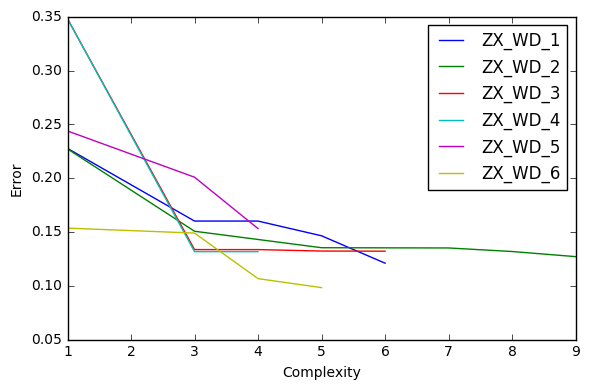

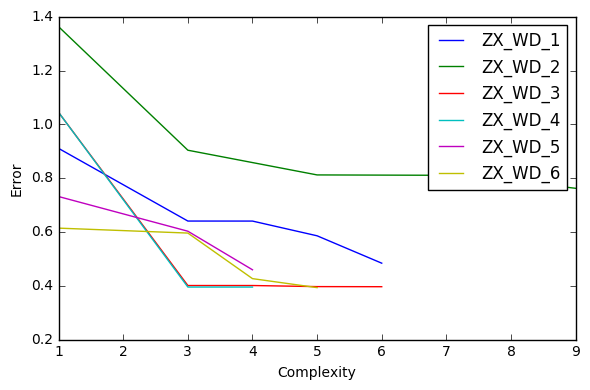

In [139]:
#hyper = {'gen': 902, 'mu': 500, 'cxpb': 0.5}
# for result of ZX_WD_4
deap_result_4 = learn_nodelay_deap(data)
result_summary_gp(deap_result_4,varnames[0:var_num_learn])

ZX_WD_6 + sin(ZX_WD_5) + 2.0249999999999999
-0.0050000000000000001*ZD_TFG + 0.60099999999999998*ZX_WD_4 + 0.60099999999999998*ZX_WD_5
ZX_WD_4 + 30.9075348358955/ZX_WD_5
0.973584767022471*ZX_WD_3
5.4269999999999996*sqrt(ZX_WD_1)
0.64500000000000002*ZX_WD_1 + 10.0


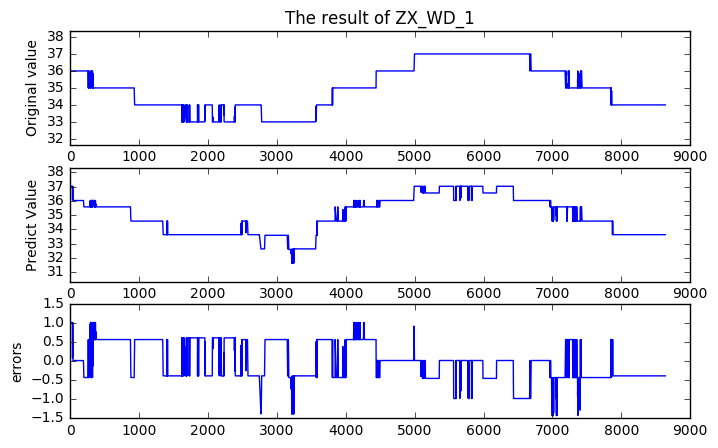

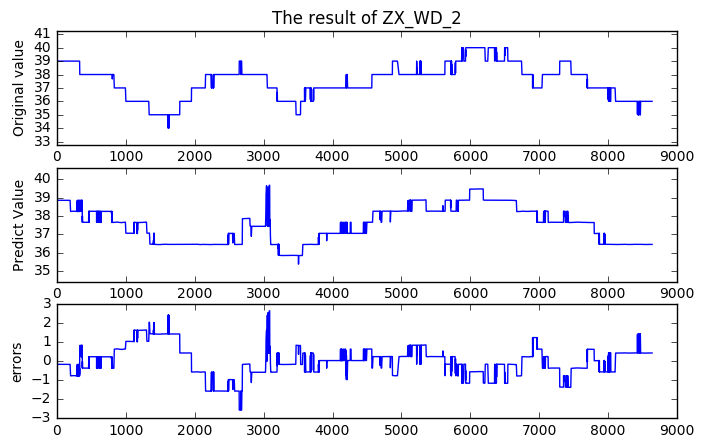

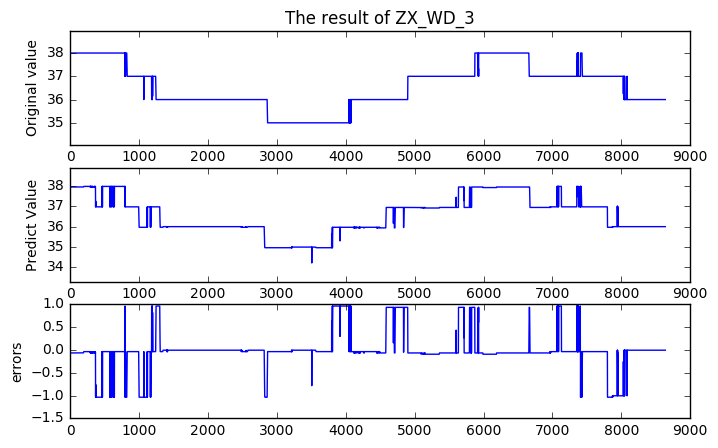

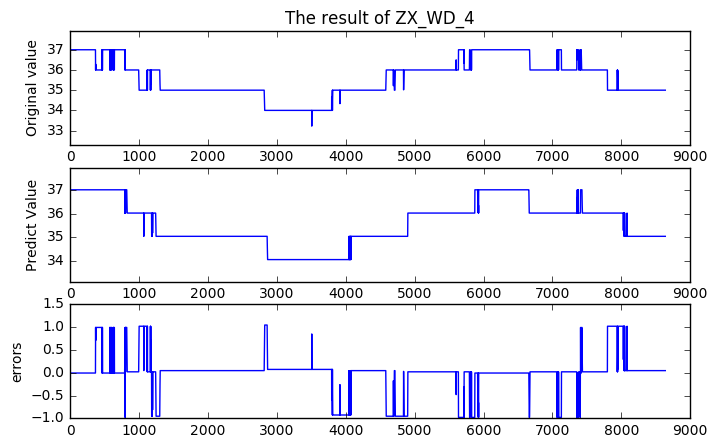

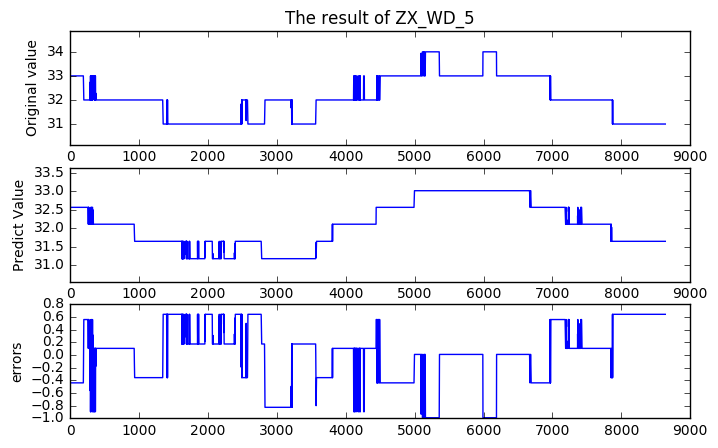

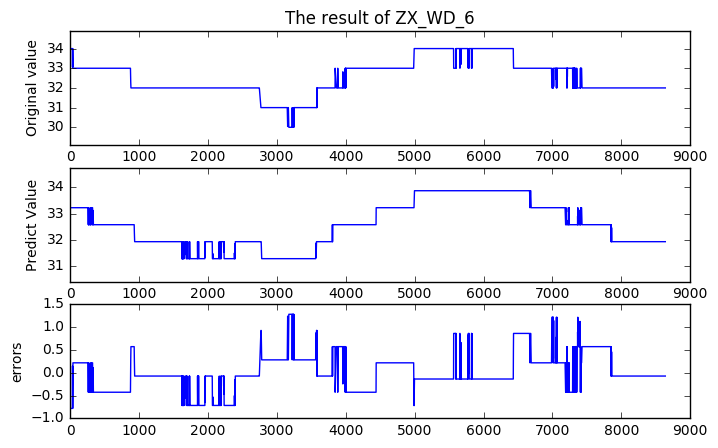

In [140]:
compare_plot_deap([0,0,0,0,0,0],data,deap_result_4)

-------------------------learn ZX_WD_1------------
gen	evals	min                      	max        	diversity
0  	418  	[ 0.67012798  2.        ]	[ inf  24.]	405      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


1  	500  	[ 0.67012798  1.        ]	[ inf   6.]	492      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


2  	500  	[ 0.67012798  1.        ]	[ inf   4.]	478      
3  	500  	[ 0.67012798  1.        ]	[ inf   9.]	481      
4  	500  	[ 0.67012798  1.        ]	[ inf  10.]	474      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


5  	500  	[ 0.67012798  1.        ]	[ inf   6.]	477      
6  	500  	[ 0.67012798  1.        ]	[ inf   9.]	466      
7  	500  	[ 0.67012798  1.        ]	[ inf  11.]	464      
8  	500  	[ 0.67012798  1.        ]	[ inf  13.]	463      
9  	500  	[ 0.66517145  1.        ]	[ inf  11.]	458      
10 	500  	[ 0.66517145  1.        ]	[ inf  13.]	451      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


11 	500  	[ 0.61681769  1.        ]	[ inf   9.]	440      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


12 	500  	[ 0.67012798  1.        ]	[ inf   4.]	437      
13 	500  	[ 0.67012798  1.        ]	[ inf   9.]	432      
14 	500  	[ 0.67012798  1.        ]	[ inf  10.]	430      
15 	500  	[ 0.67012798  1.        ]	[ inf  11.]	432      
16 	500  	[ 0.63935423  1.        ]	[ inf  11.]	426      
17 	500  	[ 0.63935423  1.        ]	[ inf  13.]	427      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


18 	500  	[ 0.63935423  1.        ]	[ inf   6.]	422      
19 	500  	[ 0.63935423  1.        ]	[ inf   9.]	425      
20 	500  	[ 0.63935423  1.        ]	[ inf  11.]	427      
21 	500  	[ 0.63935423  1.        ]	[ inf  14.]	429      
22 	500  	[ 0.63935423  1.        ]	[ inf  14.]	432      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


23 	500  	[ 0.63935423  1.        ]	[ inf   7.]	428      
24 	500  	[ 0.63935423  1.        ]	[ inf   9.]	427      
25 	500  	[ 0.63935423  1.        ]	[ inf  12.]	428      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


26 	500  	[ 0.63935423  1.        ]	[  5.82882414e+15   1.20000000e+01]	428      
27 	500  	[ 0.608435  1.      ]    	[  2.84828699e+14   1.20000000e+01]	426      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


28 	500  	[ 0.608435  1.      ]    	[ inf  13.]                        	423      
29 	500  	[ 0.64034114  1.        ]	[ inf   4.]                        	419      
30 	500  	[ 0.64034114  1.        ]	[ inf   9.]                        	419      
31 	500  	[ 0.64034114  1.        ]	[ inf  10.]                        	416      
32 	500  	[ 0.64034114  1.        ]	[ inf  10.]                        	416      
33 	500  	[ 0.64034114  1.        ]	[ inf  10.]                        	414      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


34 	500  	[ 0.64034114  1.        ]	[ inf   8.]                        	411      
35 	500  	[ 0.64034114  1.        ]	[ inf  10.]                        	413      
36 	500  	[ 0.64034114  1.        ]	[ inf  11.]                        	414      
37 	500  	[ 0.64034114  1.        ]	[ inf  13.]                        	416      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


38 	500  	[ 0.64034114  1.        ]	[ inf   8.]                        	417      
39 	500  	[ 0.64034114  1.        ]	[  5.82882414e+15   1.00000000e+01]	417      
40 	500  	[ 0.64034114  1.        ]	[  4.06149647e+05   1.10000000e+01]	412      
41 	500  	[ 0.57925518  1.        ]	[  2.22749190e+05   1.10000000e+01]	414      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


42 	500  	[ 0.64034114  1.        ]	[ inf   6.]                        	409      
43 	500  	[ 0.64034114  1.        ]	[  6.64733812e+16   9.00000000e+00]	407      
44 	500  	[ 0.64034114  1.        ]	[  5.82882414e+15   1.10000000e+01]	406      
45 	500  	[ 0.64034114  1.        ]	[  2.84828699e+14   1.20000000e+01]	407      
46 	500  	[ 0.52110033  1.        ]	[  1.79262619e+14   1.50000000e+01]	409      
47 	500  	[ 0.52110033  1.        ]	[  4.06149647e+05   1.20000000e+01]	412      
48 	500  	[ 0.52110033  1.        ]	[  2.22749190e+05   1.40000000e+01]	412      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


49 	500  	[ 0.52110033  1.        ]	[ inf   6.]                        	406      
50 	500  	[ 0.52110033  1.        ]	[ inf  10.]                        	405      
51 	500  	[ 0.52110033  1.        ]	[  6.64733812e+16   1.00000000e+01]	402      
52 	500  	[ 0.52110033  1.        ]	[  5.82882414e+15   1.10000000e+01]	402      
53 	500  	[ 0.52110033  1.        ]	[  2.84828699e+14   1.10000000e+01]	404      
54 	500  	[ 0.52110033  1.        ]	[  1.79262619e+14   1.10000000e+01]	404      
55 	500  	[ 0.52110033  1.        ]	[  4.06149647e+05   1.30000000e+01]	406      
56 	500  	[ 0.52110033  1.        ]	[  2.29527248e+05   1.40000000e+01]	406      
57 	500  	[ 0.52110033  1.        ]	[ 1376.19440783    14.        ]    	405      
58 	500  	[ 0.52110033  1.        ]	[ 1234.43135412    16.        ]    	408      
59 	500  	[ 0.52110033  1.        ]	[ 1164.40885061    16.        ]    	407      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


60 	500  	[ 0.52110033  1.        ]	[ inf   7.]                        	402      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


61 	500  	[ 0.52110033  1.        ]	[ inf   6.]                        	399      
62 	500  	[ 0.52110033  1.        ]	[  6.64733812e+16   1.10000000e+01]	398      
63 	500  	[ 0.52110033  1.        ]	[  1.55377213e+16   1.10000000e+01]	397      
64 	500  	[ 0.52110033  1.        ]	[  5.82882414e+15   1.10000000e+01]	396      
65 	500  	[ 0.52110033  1.        ]	[  2.70941316e+14   1.10000000e+01]	394      
66 	500  	[ 0.52110033  1.        ]	[  1.79262619e+14   1.10000000e+01]	392      
67 	500  	[ 0.49181881  1.        ]	[  2.29527248e+05   1.20000000e+01]	389      
68 	500  	[ 0.49181881  1.        ]	[ 1376.19440783    12.        ]    	388      
69 	500  	[ 0.49181881  1.        ]	[ 1234.43135412    15.        ]    	387      
70 	500  	[ 0.49181881  1.        ]	[ 1026.71874138    15.        ]    	392      
71 	500  	[ 0.49181881  1.        ]	[ 1019.82035196    16.        ]    	395      
72 	500  	[ 0.48358035  1.        ]	[ 599.61334613   18.        ]      	392      
73 	500  	[ 0.48

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


4  	500  	[ 0.90668507  1.        ]	[ inf  16.]	470      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


5  	500  	[ 0.90668507  1.        ]	[ inf   4.]	469      
6  	500  	[ 0.90668507  1.        ]	[ inf   9.]	462      
7  	500  	[ 0.90668507  1.        ]	[ inf  13.]	474      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


8  	500  	[ 0.90668507  1.        ]	[ inf   6.]	469      
9  	500  	[ 0.90668507  1.        ]	[ inf  12.]	464      
10 	500  	[ 0.90668507  1.        ]	[ inf  12.]	459      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


11 	500  	[ 0.90668507  1.        ]	[ inf   4.]	454      
12 	500  	[ 0.90668507  1.        ]	[ inf   8.]	438      
13 	500  	[ 0.90668507  1.        ]	[ inf   9.]	439      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


14 	500  	[ 0.90668507  1.        ]	[ inf   8.]	433      
15 	500  	[ 0.87609282  1.        ]	[ inf  11.]	433      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


16 	500  	[ 0.87609282  1.        ]	[ inf   7.]	431      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


17 	500  	[ 0.90668507  1.        ]	[ inf   4.]	422      
18 	500  	[ 0.90668507  1.        ]	[ inf   9.]	417      
19 	500  	[ 0.90668507  1.        ]	[ inf   9.]	417      
20 	500  	[ 0.90668507  1.        ]	[ inf   9.]	413      
21 	500  	[ 0.90668507  1.        ]	[ inf  10.]	407      
22 	500  	[ 0.9023641  1.       ]  	[ inf  11.]	409      
23 	500  	[ 0.87777155  1.        ]	[ inf  12.]	408      
24 	500  	[ 0.87777155  1.        ]	[ inf  15.]	408      
25 	500  	[ 0.87777155  1.        ]	[ inf  12.]	409      
26 	500  	[ 0.87777155  1.        ]	[  5.82882414e+15   1.20000000e+01]	410      
27 	500  	[ 0.87777155  1.        ]	[  2.22746858e+05   1.40000000e+01]	407      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


28 	500  	[ 0.87777155  1.        ]	[ inf  16.]                        	421      
29 	500  	[ 0.90668507  1.        ]	[ inf   4.]                        	405      
30 	500  	[ 0.90588441  1.        ]	[ inf  10.]                        	406      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


31 	500  	[ 0.90588441  1.        ]	[ inf   8.]                        	402      
32 	500  	[ 0.90588441  1.        ]	[ inf   8.]                        	395      
33 	500  	[ 0.90588441  1.        ]	[ inf   9.]                        	392      
34 	500  	[ 0.90237048  1.        ]	[ inf  12.]                        	392      
35 	500  	[ 0.90237048  1.        ]	[ inf  12.]                        	395      
36 	500  	[ 0.90237048  1.        ]	[ inf  12.]                        	397      
37 	500  	[ 0.90237048  1.        ]	[ inf  12.]                        	399      
38 	500  	[ 0.90237048  1.        ]	[  5.82882414e+15   1.70000000e+01]	402      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


39 	500  	[ 0.90237048  1.        ]	[  5.51434153e+15   9.00000000e+00]	403      
40 	500  	[ 0.90237048  1.        ]	[  2.80173898e+15   1.20000000e+01]	404      
41 	500  	[ 0.88498614  1.        ]	[  2.84828699e+14   1.20000000e+01]	399      
42 	500  	[ 0.88498614  1.        ]	[  1.87566569e+09   1.50000000e+01]	401      
43 	500  	[ 0.88498614  1.        ]	[  2.29524901e+05   1.50000000e+01]	400      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


44 	500  	[ 0.88498614  1.        ]	[ inf   6.]                        	394      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


45 	500  	[ 0.88498614  1.        ]	[ inf   6.]                        	388      
46 	500  	[ 0.88498614  1.        ]	[  5.82882414e+15   1.20000000e+01]	387      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


47 	500  	[ 0.88498614  1.        ]	[ inf   5.]                        	381      
48 	500  	[ 0.88498614  1.        ]	[ inf   8.]                        	380      
49 	500  	[ 0.88498614  1.        ]	[ inf  10.]                        	376      
50 	500  	[ 0.88498614  1.        ]	[ inf  10.]                        	374      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


51 	500  	[ 0.88498614  1.        ]	[ inf   6.]                        	373      
52 	500  	[ 0.87777155  1.        ]	[ inf   9.]                        	371      
53 	500  	[ 0.87777155  1.        ]	[ inf  10.]                        	371      
54 	500  	[ 0.87777155  1.        ]	[ inf  10.]                        	371      
55 	500  	[ 0.87777155  1.        ]	[  1.55377213e+16   1.10000000e+01]	371      
56 	500  	[ 0.87777155  1.        ]	[  5.51434153e+15   1.10000000e+01]	371      
57 	500  	[ 0.87609282  1.        ]	[  2.70941316e+14   1.50000000e+01]	371      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


58 	500  	[ 0.87609282  1.        ]	[  5.82882414e+15   7.00000000e+00]	368      
59 	500  	[ 0.87609282  1.        ]	[  1.87566569e+09   1.30000000e+01]	369      
60 	500  	[ 0.87609282  1.        ]	[  2.22746858e+05   1.30000000e+01]	367      
61 	500  	[ 0.87609282  1.        ]	[  2.22746858e+05   1.30000000e+01]	368      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


62 	500  	[ 0.87609282  1.        ]	[ inf   7.]                        	387      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


63 	500  	[ 0.90668507  1.        ]	[ inf   4.]                        	392      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


64 	500  	[ 0.90668507  1.        ]	[ inf   4.]                        	382      
65 	500  	[ 0.90668507  1.        ]	[ inf   9.]                        	381      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


66 	500  	[ 0.90668507  1.        ]	[ inf   6.]                        	374      
67 	500  	[ 0.90668507  1.        ]	[ inf   9.]                        	371      
68 	500  	[ 0.90668507  1.        ]	[ inf  12.]                        	371      
69 	500  	[ 0.90541828  1.        ]	[ inf  12.]                        	374      
70 	500  	[ 0.90541828  1.        ]	[ inf  12.]                        	379      
71 	500  	[ 0.90541828  1.        ]	[ inf  12.]                        	382      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


72 	500  	[ 0.90668507  1.        ]	[ inf   4.]                        	373      
73 	500  	[ 0.90668507  1.        ]	[ inf  10.]                        	372      
74 	500  	[ 0.90668507  1.        ]	[ inf  10.]                        	369      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


75 	500  	[ 0.90668507  1.        ]	[ inf   6.]                        	367      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


76 	500  	[ 0.90668507  1.        ]	[ inf   6.]                        	367      
77 	500  	[ 0.90668507  1.        ]	[ inf   9.]                        	369      
78 	500  	[ 0.90668507  1.        ]	[ inf  11.]                        	372      
79 	500  	[ 0.90668507  1.        ]	[ inf  11.]                        	376      
80 	500  	[ 0.90668507  1.        ]	[ inf  13.]                        	377      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


81 	500  	[ 0.90668507  1.        ]	[ inf   7.]                        	377      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


82 	500  	[ 0.90668507  1.        ]	[ inf   7.]                        	380      
83 	500  	[ 0.90668507  1.        ]	[  2.80173898e+15   1.10000000e+01]	384      
84 	500  	[ 0.90641698  1.        ]	[  1.87566569e+09   1.20000000e+01]	391      
85 	500  	[ 0.90641698  1.        ]	[  4.06147195e+05   1.50000000e+01]	393      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


86 	500  	[ 0.90668507  1.        ]	[ inf   6.]                        	390      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


87 	500  	[ 0.90668507  1.        ]	[ inf   6.]                        	385      
88 	500  	[ 0.81374899  1.        ]	[  3.58656504e+33   9.00000000e+00]	383      
89 	500  	[ 0.81374899  1.        ]	[  5.51434153e+15   1.10000000e+01]	380      
90 	500  	[ 0.81374899  1.        ]	[  2.84828699e+14   1.40000000e+01]	378      
91 	500  	[ 0.81374899  1.        ]	[  1.79262619e+14   1.40000000e+01]	378      
--------------------end----------------------------
-------------------------learn ZX_WD_3------------
gen	evals	min                      	max        	diversity
0  	418  	[ 0.73976024  2.        ]	[ inf  24.]	403      
1  	500  	[ 0.73976024  1.        ]	[ inf  20.]	485      
2  	500  	[ 0.73976024  1.        ]	[ inf  20.]	485      
3  	500  	[ 0.73976024  1.        ]	[ inf  20.]	478      
4  	500  	[ 0.73976024  1.        ]	[ inf  20.]	491      
5  	500  	[ 0.39895754  1.        ]	[ inf  19.]	489      
6  	500  	[ 0.39895754  1.        ]	[  3.58656504e+33   1.80000000e+01]	489      

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


9  	500  	[ 0.39895754  1.        ]	[  3.58656504e+33   6.00000000e+00]	460      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


10 	500  	[ 0.39895754  1.        ]	[ inf   8.]                        	452      
11 	500  	[ 0.39895754  1.        ]	[ inf  11.]                        	452      
12 	500  	[ 0.39895754  1.        ]	[ inf  12.]                        	451      
13 	500  	[ 0.39895754  1.        ]	[ inf  13.]                        	451      
14 	500  	[ 0.39895754  1.        ]	[  3.58656504e+33   1.30000000e+01]	451      
15 	500  	[ 0.39895754  1.        ]	[  6.64733812e+16   1.30000000e+01]	448      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


16 	500  	[ 0.39895754  1.        ]	[ inf   8.]                        	440      
17 	500  	[ 0.39332067  1.        ]	[ inf  10.]                        	438      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


18 	500  	[ 0.39332067  1.        ]	[ inf   9.]                        	434      
19 	500  	[ 0.39895754  1.        ]	[ inf   4.]                        	422      
20 	500  	[ 0.39895754  1.        ]	[ inf  10.]                        	418      
21 	500  	[ 0.39895754  1.        ]	[ inf  10.]                        	412      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


22 	500  	[ 0.39895753  1.        ]	[ inf   6.]                        	408      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


23 	500  	[ 0.39895753  1.        ]	[ inf   5.]                        	403      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


24 	500  	[ 0.39895753  1.        ]	[ inf   6.]                        	397      
25 	500  	[ 0.39895753  1.        ]	[ inf   8.]                        	395      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


26 	500  	[ 0.39895753  1.        ]	[ inf   6.]                        	397      
27 	500  	[ 0.39858765  1.        ]	[ inf   9.]                        	405      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


28 	500  	[ 0.39858765  1.        ]	[ inf   8.]                        	405      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


29 	500  	[ 0.39858765  1.        ]	[ inf   6.]                        	402      
30 	500  	[ 0.39858765  1.        ]	[ inf  10.]                        	400      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


31 	500  	[ 0.39858765  1.        ]	[ inf   6.]                        	398      
32 	500  	[ 0.39858765  1.        ]	[ inf  10.]                        	398      
33 	500  	[ 0.39858765  1.        ]	[  5.82882414e+15   1.10000000e+01]	401      
34 	500  	[ 0.39345576  1.        ]	[  2.80173898e+15   1.10000000e+01]	402      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


35 	500  	[ 0.39345576  1.        ]	[ inf  11.]                        	398      
36 	500  	[ 0.39895752  1.        ]	[ inf   4.]                        	394      
37 	500  	[ 0.39895752  1.        ]	[ inf   7.]                        	391      
38 	500  	[ 0.39895752  1.        ]	[ inf  10.]                        	391      
39 	500  	[ 0.39680947  1.        ]	[ inf  10.]                        	386      
40 	500  	[ 0.39680947  1.        ]	[ inf   9.]                        	384      
41 	500  	[ 0.39680947  1.        ]	[ inf  11.]                        	386      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


42 	500  	[ 0.39680947  1.        ]	[ inf   6.]                        	386      
43 	500  	[ 0.39680947  1.        ]	[ inf  10.]                        	388      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


44 	500  	[ 0.39680947  1.        ]	[ inf   6.]                        	386      
45 	500  	[ 0.39680947  1.        ]	[ inf  10.]                        	393      
46 	500  	[ 0.39680947  1.        ]	[  6.64733812e+16   1.00000000e+01]	395      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


47 	500  	[ 0.39680947  1.        ]	[ inf   6.]                        	389      
48 	500  	[ 0.39680947  1.        ]	[ inf   9.]                        	388      
49 	500  	[ 0.39680947  1.        ]	[ inf   7.]                        	386      
50 	500  	[ 0.39573686  1.        ]	[  5.82882414e+15   1.00000000e+01]	386      
51 	500  	[ 0.39573686  1.        ]	[  2.80173898e+15   1.20000000e+01]	386      
52 	500  	[ 0.39573686  1.        ]	[  2.70941316e+14   1.40000000e+01]	383      
53 	500  	[ 0.39573686  1.        ]	[  2.29525738e+05   1.40000000e+01]	384      
54 	500  	[ 0.39573686  1.        ]	[ 1232.85745902    14.        ]    	383      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


55 	500  	[ 0.39573686  1.        ]	[  1.79262619e+14   7.00000000e+00]	379      
56 	500  	[ 0.39463891  1.        ]	[  2.22747689e+05   1.00000000e+01]	380      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


57 	500  	[ 0.39463891  1.        ]	[ inf   6.]                        	375      
58 	500  	[ 0.39463891  1.        ]	[  2.70941316e+14   8.00000000e+00]	373      
59 	500  	[ 0.39463891  1.        ]	[  1.79262619e+14   9.00000000e+00]	372      
60 	500  	[ 0.39463891  1.        ]	[  2.29525738e+05   1.20000000e+01]	372      
61 	500  	[ 0.39463891  1.        ]	[ 1374.63405093    14.        ]    	374      
62 	500  	[ 0.39463891  1.        ]	[ 1162.85935386    14.        ]    	375      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


63 	500  	[ 0.39463891  1.        ]	[  3.58656504e+33   6.00000000e+00]	369      
64 	500  	[ 0.39463891  1.        ]	[  2.84828699e+14   1.10000000e+01]	363      
65 	500  	[ 0.39463891  1.        ]	[  2.70941316e+14   1.10000000e+01]	358      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


66 	500  	[ 0.39463891  1.        ]	[  1.79262619e+14   6.00000000e+00]	356      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


67 	500  	[ 0.39463891  1.        ]	[ inf   6.]                        	375      
68 	500  	[ 0.39895752  1.        ]	[ inf   4.]                        	384      
69 	500  	[ 0.39895752  1.        ]	[ inf   8.]                        	373      
70 	500  	[ 0.39895752  1.        ]	[ inf  10.]                        	372      
71 	500  	[ 0.39895752  1.        ]	[ inf  11.]                        	374      
72 	500  	[ 0.39895752  1.        ]	[ inf  11.]                        	376      
73 	500  	[ 0.39895752  1.        ]	[ inf  12.]                        	378      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


74 	500  	[ 0.39895752  1.        ]	[ inf   6.]                        	376      
75 	500  	[ 0.39895752  1.        ]	[ inf   8.]                        	377      
76 	500  	[ 0.39895752  1.        ]	[  3.58656504e+33   9.00000000e+00]	378      
77 	500  	[ 0.39440687  1.        ]	[  5.51434153e+15   9.00000000e+00]	380      
78 	500  	[ 0.39440687  1.        ]	[  2.84828699e+14   9.00000000e+00]	380      
79 	500  	[ 0.39440687  1.        ]	[  1.87566569e+09   1.00000000e+01]	378      
80 	500  	[ 0.39440687  1.        ]	[  2.29525738e+05   1.40000000e+01]	382      
81 	500  	[ 0.39440687  1.        ]	[  2.29525738e+05   1.70000000e+01]	387      
82 	500  	[ 0.39440687  1.        ]	[ 1232.85745902    17.        ]    	387      
83 	500  	[ 0.39440687  1.        ]	[ 1162.85935386    18.        ]    	389      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


84 	500  	[ 0.39440687  1.        ]	[  5.82882414e+15   6.00000000e+00]	383      
85 	500  	[ 0.39440687  1.        ]	[  5.82882414e+15   1.00000000e+01]	383      
86 	500  	[ 0.39440687  1.        ]	[  6.64733812e+16   1.00000000e+01]	379      
87 	500  	[ 0.39440687  1.        ]	[  2.84828699e+14   1.00000000e+01]	372      
88 	500  	[ 0.39440687  1.        ]	[  2.29525738e+05   1.10000000e+01]	370      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


89 	500  	[ 0.39440687  1.        ]	[ 1374.63405093    11.        ]    	365      
90 	500  	[ 0.39440687  1.        ]	[ 1025.16774591    14.        ]    	363      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


91 	500  	[ 0.39440687  1.        ]	[ 1374.63405093     8.        ]    	357      
--------------------end----------------------------
-------------------------learn ZX_WD_4------------
gen	evals	min                      	max        	diversity
0  	418  	[ 0.63381908  2.        ]	[ inf  24.]	404      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


1  	500  	[ 0.40068232  1.        ]	[ inf  21.]	476      
2  	500  	[ 0.47753527  1.        ]	[ inf   4.]	479      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


3  	500  	[ 0.39333567  1.        ]	[ inf   5.]	473      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


4  	500  	[ 0.39333567  1.        ]	[ inf   4.]	471      
5  	500  	[ 0.39333567  1.        ]	[ inf  10.]	463      
6  	500  	[ 0.39331788  1.        ]	[ inf  12.]	464      
7  	500  	[ 0.39331788  1.        ]	[ inf  12.]	462      
8  	500  	[ 0.39331788  1.        ]	[ inf  14.]	457      
9  	500  	[ 0.39331788  1.        ]	[ inf  14.]	455      
10 	500  	[ 0.39331788  1.        ]	[ inf  18.]	452      
11 	500  	[ 0.39331788  1.        ]	[ inf  18.]	451      
12 	500  	[ 0.39331788  1.        ]	[ inf  18.]	454      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


13 	500  	[ 0.39331788  1.        ]	[ inf   6.]	450      
14 	500  	[ 0.39331788  1.        ]	[ inf  11.]	447      
15 	500  	[ 0.39331788  1.        ]	[ inf  11.]	450      
16 	500  	[ 0.39331788  1.        ]	[ inf  13.]	447      
17 	500  	[ 0.39331788  1.        ]	[ inf  15.]	450      
18 	500  	[ 0.39331788  1.        ]	[ inf  15.]	451      
19 	500  	[ 0.39331788  1.        ]	[ inf  15.]	446      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


20 	500  	[ 0.39331788  1.        ]	[ inf   8.]	440      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


21 	500  	[ 0.39331788  1.        ]	[ inf   6.]	438      
22 	500  	[ 0.39331788  1.        ]	[ inf  10.]	441      
23 	500  	[ 0.39331788  1.        ]	[ inf  10.]	436      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


24 	500  	[ 0.39331788  1.        ]	[ inf   6.]	431      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


25 	500  	[ 0.39331788  1.        ]	[ inf   7.]	432      
26 	500  	[ 0.39331788  1.        ]	[ inf   8.]	429      
27 	500  	[ 0.39331788  1.        ]	[ inf   9.]	424      
28 	500  	[ 0.39331788  1.        ]	[ inf  11.]	425      
29 	500  	[ 0.39331788  1.        ]	[ inf  11.]	421      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


30 	500  	[ 0.39331788  1.        ]	[ inf   6.]	419      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


31 	500  	[ 0.39331788  1.        ]	[ inf   8.]	422      
32 	500  	[ 0.39331788  1.        ]	[ inf   9.]	418      
33 	500  	[ 0.39331788  1.        ]	[ inf   9.]	417      
34 	500  	[ 0.39331788  1.        ]	[ inf   9.]	415      
35 	500  	[ 0.39331788  1.        ]	[ inf  10.]	413      
36 	500  	[ 0.39331788  1.        ]	[ inf  11.]	415      
37 	500  	[ 0.39331788  1.        ]	[ inf  11.]	416      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


38 	500  	[ 0.39331788  1.        ]	[ inf   7.]	415      
39 	500  	[ 0.39331788  1.        ]	[ inf  10.]	417      
40 	500  	[ 0.39312107  1.        ]	[ inf  11.]	416      
41 	500  	[ 0.39312107  1.        ]	[ inf  12.]	416      
42 	500  	[ 0.39312107  1.        ]	[ inf  12.]	414      
43 	500  	[ 0.39312107  1.        ]	[ inf  15.]	414      
44 	500  	[ 0.39312107  1.        ]	[ inf  15.]	415      
45 	500  	[ 0.39312107  1.        ]	[ inf  15.]	415      
46 	500  	[ 0.39312107  1.        ]	[ inf  15.]	414      
47 	500  	[ 0.39312107  1.        ]	[  6.64733812e+16   1.50000000e+01]	413      
48 	500  	[ 0.39312107  1.        ]	[  2.84828699e+14   2.00000000e+01]	412      
49 	500  	[ 0.39312107  1.        ]	[  1.79262619e+14   2.20000000e+01]	413      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


50 	500  	[ 0.39312107  1.        ]	[ inf   8.]                        	409      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


51 	500  	[ 0.39312107  1.        ]	[ inf   6.]                        	407      
52 	500  	[ 0.39312107  1.        ]	[ inf   9.]                        	406      
53 	500  	[ 0.39312107  1.        ]	[ inf   9.]                        	404      
54 	500  	[ 0.39312107  1.        ]	[ inf  10.]                        	402      
55 	500  	[ 0.39312107  1.        ]	[ inf  10.]                        	399      
56 	500  	[ 0.39312107  1.        ]	[  3.58656504e+33   1.00000000e+01]	400      
57 	500  	[ 0.39312107  1.        ]	[  5.51434153e+15   1.00000000e+01]	401      
58 	500  	[ 0.39312107  1.        ]	[  2.84828699e+14   1.00000000e+01]	401      
59 	500  	[ 0.39312107  1.        ]	[  2.70941316e+14   1.10000000e+01]	401      
60 	500  	[ 0.39312107  1.        ]	[  1.87566569e+09   1.50000000e+01]	401      
61 	500  	[ 0.39312107  1.        ]	[  4.06149042e+05   1.50000000e+01]	401      
62 	500  	[ 0.39312107  1.        ]	[  2.22748598e+05   1.50000000e+01]	403      
63 	500  	[ 0.39

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


66 	500  	[ 0.39312107  1.        ]	[ inf   6.]                        	405      
67 	500  	[ 0.39312107  1.        ]	[ inf  12.]                        	402      
68 	500  	[ 0.39312107  1.        ]	[ inf  12.]                        	401      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


69 	500  	[ 0.39312107  1.        ]	[ inf   7.]                        	398      
70 	500  	[ 0.39312107  1.        ]	[  1.55377213e+16   9.00000000e+00]	397      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


71 	500  	[ 0.39312107  1.        ]	[ inf   6.]                        	407      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


72 	500  	[ 0.39331788  1.        ]	[ inf   4.]                        	403      
73 	500  	[ 0.39331788  1.        ]	[ inf   8.]                        	399      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


74 	500  	[ 0.39331788  1.        ]	[ inf   4.]                        	390      
75 	500  	[ 0.39331788  1.        ]	[ inf   9.]                        	385      
76 	500  	[ 0.39331788  1.        ]	[ inf   9.]                        	387      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


77 	500  	[ 0.39331788  1.        ]	[ inf   4.]                        	380      
78 	500  	[ 0.38596521  1.        ]	[ inf   9.]                        	380      
79 	500  	[ 0.38596521  1.        ]	[ inf   9.]                        	379      
80 	500  	[ 0.38596521  1.        ]	[ inf  10.]                        	383      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


81 	500  	[ 0.38596521  1.        ]	[ inf   8.]                        	385      
82 	500  	[ 0.38596521  1.        ]	[ inf  10.]                        	387      
83 	500  	[ 0.38596521  1.        ]	[ inf  13.]                        	386      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


84 	500  	[ 0.38596521  1.        ]	[ inf   9.]                        	389      
85 	500  	[ 0.38596521  1.        ]	[ inf  11.]                        	390      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


86 	500  	[ 0.38596521  1.        ]	[ inf   7.]                        	390      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


87 	500  	[ 0.38596521  1.        ]	[ inf   6.]                        	387      
88 	500  	[ 0.38596521  1.        ]	[ inf  10.]                        	388      
89 	500  	[ 0.38596521  1.        ]	[ inf  10.]                        	386      
90 	500  	[ 0.38596521  1.        ]	[ inf  11.]                        	386      
91 	500  	[ 0.38596521  1.        ]	[ inf  11.]                        	388      
--------------------end----------------------------
-------------------------learn ZX_WD_5------------
gen	evals	min                      	max        	diversity
0  	418  	[ 0.60768719  2.        ]	[ inf  24.]	404      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


1  	500  	[ 0.60768719  1.        ]	[ inf  21.]	476      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


2  	500  	[ 0.60768719  1.        ]	[ inf   4.]	466      
3  	500  	[ 0.60768719  1.        ]	[ inf   9.]	471      
4  	500  	[ 0.60768719  1.        ]	[ inf  10.]	468      
5  	500  	[ 0.60768719  1.        ]	[ inf  12.]	469      
6  	500  	[ 0.60768719  1.        ]	[ inf  10.]	461      
7  	500  	[ 0.60768719  1.        ]	[ inf  14.]	468      
8  	500  	[ 0.60768719  1.        ]	[ inf  18.]	463      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


9  	500  	[ 0.60768719  1.        ]	[ inf   6.]	455      
10 	500  	[ 0.60768719  1.        ]	[ inf   4.]	444      
11 	500  	[ 0.59511295  1.        ]	[ inf  10.]	443      
12 	500  	[ 0.59511295  1.        ]	[ inf  10.]	436      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


13 	500  	[ 0.59511295  1.        ]	[ inf   7.]	431      
14 	500  	[ 0.59511295  1.        ]	[ inf  10.]	432      
15 	500  	[ 0.59511295  1.        ]	[ inf  13.]	432      
16 	500  	[ 0.59511295  1.        ]	[ inf  15.]	426      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


17 	500  	[ 0.59511295  1.        ]	[ inf   6.]	423      
18 	500  	[ 0.59511295  1.        ]	[ inf  10.]	414      
19 	500  	[ 0.59511295  1.        ]	[ inf  11.]	420      
20 	500  	[ 0.59511295  1.        ]	[ inf  12.]	422      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


21 	500  	[ 0.59511295  1.        ]	[ inf   6.]	419      
22 	500  	[ 0.59511295  1.        ]	[ inf  10.]	426      
23 	500  	[ 0.58183527  1.        ]	[ inf  10.]	426      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


24 	500  	[ 0.58183527  1.        ]	[ inf   6.]	412      
25 	500  	[ 0.59511295  1.        ]	[ inf   4.]	409      
26 	500  	[ 0.53547619  1.        ]	[ inf   7.]	416      
27 	500  	[ 0.53547619  1.        ]	[ inf  10.]	414      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


28 	500  	[ 0.59511295  1.        ]	[ inf   4.]	407      
29 	500  	[ 0.59511295  1.        ]	[ inf   8.]	405      
30 	500  	[ 0.59511295  1.        ]	[ inf   9.]	403      
31 	500  	[ 0.59511295  1.        ]	[ inf  11.]	402      
32 	500  	[ 0.59511295  1.        ]	[ inf  12.]	396      
33 	500  	[ 0.59511295  1.        ]	[ inf  12.]	400      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


34 	500  	[ 0.59511295  1.        ]	[ inf  12.]	402      
35 	500  	[ 0.56811484  1.        ]	[ inf  12.]	407      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


36 	500  	[ 0.59511295  1.        ]	[ inf   6.]	405      
37 	500  	[ 0.56942939  1.        ]	[ inf  12.]	402      
38 	500  	[ 0.56942939  1.        ]	[ inf  13.]	407      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


39 	500  	[ 0.56942939  1.        ]	[ inf   6.]	406      
40 	500  	[ 0.45969831  1.        ]	[ inf  11.]	407      
41 	500  	[ 0.45969831  1.        ]	[  1.55377213e+16   1.20000000e+01]	410      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


42 	500  	[ 0.45969831  1.        ]	[ inf   7.]                        	408      
43 	500  	[ 0.45969831  1.        ]	[  5.82882414e+15   1.00000000e+01]	408      
44 	500  	[ 0.45969831  1.        ]	[  5.51434153e+15   1.10000000e+01]	406      
45 	500  	[ 0.45969831  1.        ]	[  2.80173898e+15   1.10000000e+01]	411      
46 	500  	[ 0.45969831  1.        ]	[  2.84828699e+14   1.40000000e+01]	410      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


47 	500  	[ 0.45969831  1.        ]	[ inf   5.]                        	413      
48 	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	412      
49 	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	409      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


50 	500  	[ 0.45969831  1.        ]	[ inf   6.]                        	405      
51 	500  	[ 0.45969831  1.        ]	[ inf   7.]                        	402      
52 	500  	[ 0.45969831  1.        ]	[ inf   9.]                        	406      
53 	500  	[ 0.45969831  1.        ]	[ inf  11.]                        	407      
54 	500  	[ 0.45385706  1.        ]	[ inf  11.]                        	408      
55 	500  	[ 0.45385706  1.        ]	[ inf  10.]                        	404      
56 	500  	[ 0.45385706  1.        ]	[ inf  12.]                        	404      
57 	500  	[ 0.45385706  1.        ]	[ inf  12.]                        	404      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


58 	500  	[ 0.45385706  1.        ]	[ inf   7.]                        	402      
59 	500  	[ 0.45385706  1.        ]	[ inf  10.]                        	400      
60 	500  	[ 0.45385706  1.        ]	[ inf  10.]                        	399      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


61 	500  	[ 0.45385706  1.        ]	[ inf   6.]                        	399      
62 	500  	[ 0.45385706  1.        ]	[ inf  10.]                        	399      
63 	500  	[ 0.45385706  1.        ]	[ inf  10.]                        	397      
64 	500  	[ 0.45385706  1.        ]	[ inf  10.]                        	395      
65 	500  	[ 0.44558019  1.        ]	[ inf  10.]                        	394      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


66 	500  	[ 0.44558019  1.        ]	[ inf   6.]                        	393      
67 	500  	[ 0.44558019  1.        ]	[ inf   7.]                        	392      
68 	500  	[ 0.44558019  1.        ]	[ inf   7.]                        	393      
69 	500  	[ 0.44558019  1.        ]	[ inf  11.]                        	394      
70 	500  	[ 0.44558019  1.        ]	[ inf  11.]                        	395      
71 	500  	[ 0.44558019  1.        ]	[ inf  11.]                        	395      
72 	500  	[ 0.44558019  1.        ]	[ inf  15.]                        	395      
73 	500  	[ 0.44558019  1.        ]	[ inf  15.]                        	393      
74 	500  	[ 0.44558019  1.        ]	[ inf  15.]                        	393      
75 	500  	[ 0.44558019  1.        ]	[  3.58656504e+33   1.50000000e+01]	395      
76 	500  	[ 0.44558019  1.        ]	[  3.58656504e+33   1.50000000e+01]	392      
77 	500  	[ 0.44558019  1.        ]	[  5.82882414e+15   1.70000000e+01]	390      
78 	500  	[ 0.44

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


86 	500  	[ 0.44558019  1.        ]	[  3.58656504e+33   6.00000000e+00]	403      
87 	500  	[ 0.44558019  1.        ]	[ inf  11.]                        	402      
88 	500  	[ 0.44558019  1.        ]	[ inf  11.]                        	397      
89 	500  	[ 0.44558019  1.        ]	[ inf   9.]                        	398      
90 	500  	[ 0.44558019  1.        ]	[  3.58656504e+33   1.10000000e+01]	398      
91 	500  	[ 0.44558019  1.        ]	[  1.55377213e+16   1.10000000e+01]	398      
--------------------end----------------------------
-------------------------learn ZX_WD_6------------
gen	evals	min                      	max        	diversity
0  	418  	[ 0.59572111  2.        ]	[ inf  24.]	405      
1  	500  	[ 0.59572111  1.        ]	[ inf  24.]	486      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


2  	500  	[ 0.59572111  1.        ]	[ inf   6.]	476      
3  	500  	[ 0.59572111  1.        ]	[ inf   4.]	476      
4  	500  	[ 0.59572111  1.        ]	[ inf  11.]	474      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


5  	500  	[ 0.59572111  1.        ]	[ inf   7.]	468      
6  	500  	[ 0.59572111  1.        ]	[ inf  14.]	477      
7  	500  	[ 0.59572111  1.        ]	[ inf  14.]	473      
8  	500  	[ 0.59572111  1.        ]	[ inf  14.]	481      
9  	500  	[ 0.59572111  1.        ]	[ inf  14.]	481      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


10 	500  	[ 0.59572111  1.        ]	[ inf   6.]	475      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


11 	500  	[ 0.59572111  1.        ]	[ inf   4.]	471      
12 	500  	[ 0.59572111  1.        ]	[ inf   4.]	469      
13 	500  	[ 0.59572111  1.        ]	[ inf   8.]	463      
14 	500  	[ 0.59021385  1.        ]	[ inf  14.]	463      
15 	500  	[ 0.59021385  1.        ]	[ inf  14.]	457      
16 	500  	[ 0.59021385  1.        ]	[ inf  14.]	452      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


17 	500  	[ 0.59021385  1.        ]	[ inf   4.]	441      
18 	500  	[ 0.59021385  1.        ]	[ inf   9.]	437      
19 	500  	[ 0.58029706  1.        ]	[ inf  11.]	437      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


20 	500  	[ 0.58029706  1.        ]	[ inf  11.]	436      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


21 	500  	[ 0.58029706  1.        ]	[ inf   6.]	434      
22 	500  	[ 0.58029706  1.        ]	[ inf  10.]	431      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


23 	500  	[ 0.59021385  1.        ]	[ inf   5.]	428      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


24 	500  	[ 0.59021385  1.        ]	[ inf   6.]	429      
25 	500  	[ 0.59021385  1.        ]	[ inf  11.]	425      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


26 	500  	[ 0.59021385  1.        ]	[ inf   4.]	415      
27 	500  	[ 0.59021385  1.        ]	[ inf  10.]	413      
28 	500  	[ 0.59021385  1.        ]	[ inf  10.]	414      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


29 	500  	[ 0.59021385  1.        ]	[ inf   4.]	412      
30 	500  	[ 0.59021385  1.        ]	[ inf   7.]	407      
31 	500  	[ 0.55351914  1.        ]	[ inf   9.]	406      
32 	500  	[ 0.55351914  1.        ]	[ inf   9.]	402      
33 	500  	[ 0.55351914  1.        ]	[ inf  10.]	407      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


34 	500  	[ 0.55351914  1.        ]	[ inf   6.]	404      
35 	500  	[ 0.42564945  1.        ]	[ inf  10.]	407      
36 	500  	[ 0.42564945  1.        ]	[ inf  10.]	413      
37 	500  	[ 0.42564945  1.        ]	[ inf  10.]	413      
38 	500  	[ 0.42564945  1.        ]	[  3.58656504e+33   1.00000000e+01]	415      
39 	500  	[ 0.42564945  1.        ]	[  2.80173898e+15   1.10000000e+01]	417      
40 	500  	[ 0.42564945  1.        ]	[  1.79262619e+14   1.10000000e+01]	418      
41 	500  	[ 0.42564945  1.        ]	[  2.22751484e+05   1.20000000e+01]	422      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


42 	500  	[ 0.42564945  1.        ]	[  2.22751484e+05   9.00000000e+00]	417      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


43 	500  	[ 0.42564945  1.        ]	[  5.82882414e+15   6.00000000e+00]	411      
44 	500  	[ 0.42564945  1.        ]	[ inf  10.]                        	412      
45 	500  	[ 0.42564945  1.        ]	[ inf  11.]                        	413      
46 	500  	[ 0.42564945  1.        ]	[  3.58656504e+33   1.20000000e+01]	415      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


47 	500  	[ 0.42564945  1.        ]	[ inf   6.]                        	413      
48 	500  	[ 0.42564945  1.        ]	[ inf   9.]                        	413      
49 	500  	[ 0.42564945  1.        ]	[  3.58656504e+33   8.00000000e+00]	415      
50 	500  	[ 0.42564945  1.        ]	[  1.55377213e+16   1.40000000e+01]	411      
51 	500  	[ 0.42564945  1.        ]	[  5.82882414e+15   1.40000000e+01]	407      
52 	500  	[ 0.42564945  1.        ]	[  2.84828699e+14   1.40000000e+01]	405      
53 	500  	[ 0.42564945  1.        ]	[  4.06152057e+05   1.60000000e+01]	406      
54 	500  	[ 0.42564945  1.        ]	[ 1236.86992726    17.        ]    	406      
55 	500  	[ 0.42564945  1.        ]	[ 1166.85162218    19.        ]    	400      
56 	500  	[ 0.42564945  1.        ]	[ 1022.25513758    19.        ]    	405      
57 	500  	[ 0.42564945  1.        ]	[ 705.03132007   19.        ]      	409      
58 	500  	[ 0.42564945  1.        ]	[ 602.03076252   19.        ]      	405      
59 	500  	[ 0.42

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


66 	500  	[ 0.42564945  1.        ]	[ inf   6.]                        	393      
67 	500  	[ 0.42564945  1.        ]	[ inf  10.]                        	380      
68 	500  	[ 0.42564945  1.        ]	[  1.79262619e+14   1.20000000e+01]	367      
69 	500  	[ 0.42564945  1.        ]	[ 1306.4420787    12.       ]      	358      
70 	500  	[ 0.39233372  1.        ]	[ 1022.25513758    12.        ]    	353      
71 	500  	[ 0.39233372  1.        ]	[ 705.03132007   12.        ]      	348      
72 	500  	[ 0.39233372  1.        ]	[ 705.03132007   12.        ]      	351      
73 	500  	[ 0.39233372  1.        ]	[ 602.03076252   12.        ]      	345      
74 	500  	[ 0.39233372  1.        ]	[ 602.03076252   13.        ]      	347      
75 	500  	[ 0.39233372  1.        ]	[ 602.03076252   13.        ]      	352      
76 	500  	[ 0.39233372  1.        ]	[ 602.03076252   13.        ]      	353      
77 	500  	[ 0.39233372  1.        ]	[ 602.03076252   13.        ]      	350      
78 	500  	[ 0.39

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


81 	500  	[ 0.39233372  1.        ]	[  2.29529554e+05   7.00000000e+00]	345      
82 	500  	[ 0.39233372  1.        ]	[ 602.03076252   11.        ]      	335      
83 	500  	[ 0.39233372  1.        ]	[ 602.03076252    9.        ]      	331      
84 	500  	[ 0.38708802  1.        ]	[ 602.03076252   11.        ]      	329      
85 	500  	[ 0.38708802  1.        ]	[ 602.03076252   11.        ]      	326      
86 	500  	[ 0.38708802  1.        ]	[ 602.03076252   11.        ]      	325      
87 	500  	[ 0.38708802  1.        ]	[ 602.03076252   11.        ]      	324      
88 	500  	[ 0.38708802  1.        ]	[ 602.03076252   11.        ]      	324      
89 	500  	[ 0.38708802  1.        ]	[ 602.03076252   14.        ]      	329      
90 	500  	[ 0.38708802  1.        ]	[ 602.03076252   14.        ]      	332      
91 	500  	[ 0.38708802  1.        ]	[ 602.03076252   17.        ]      	334      
--------------------end----------------------------
************************* ZX_WD_1 ************

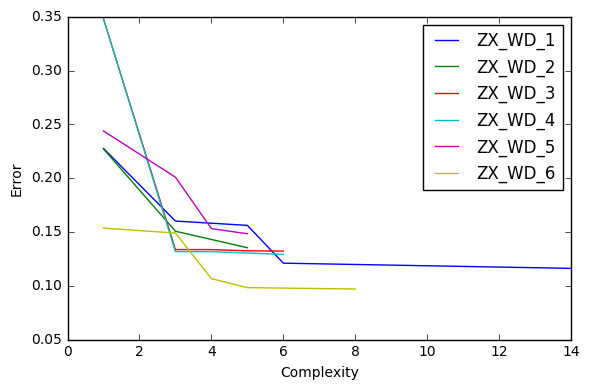

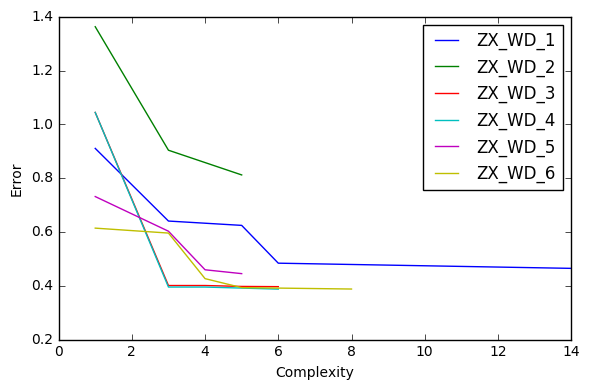

In [142]:
 hyper = {'gen': 92, 'mu': 500, 'cxpb': 0.5}
# for result of ZX_WD_6
deap_result_6 = learn_nodelay_deap(data)
result_summary_gp(deap_result_6,varnames[0:var_num_learn])

ZX_WD_6 + 0.48899999999999999*sin(ZX_WD_5) + 0.48899999999999999*sin(square(square(sqrt(ZX_WD_5)))) + 2.1869999999999998
0.55400000000000005*ZX_WD_4 + 0.55400000000000005*ZX_WD_5
ZX_WD_4 - sqrt(ZX_WD_6) + 6.6669999999999998
0.875*ZX_WD_3 + log(ZX_WD_3)
2.54*square(log(ZX_WD_1))
0.46500000000000002*ZX_WD_1 + 4.5780000000000003*log(ZX_WD_1)


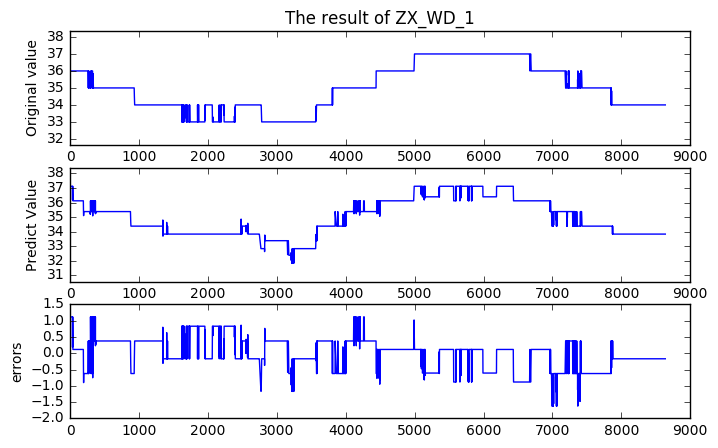

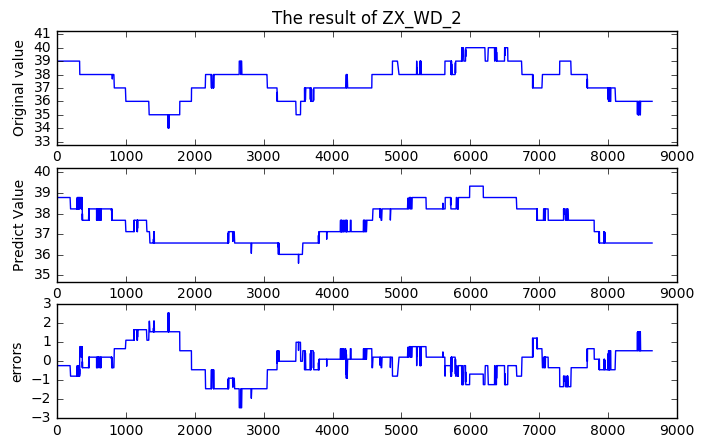

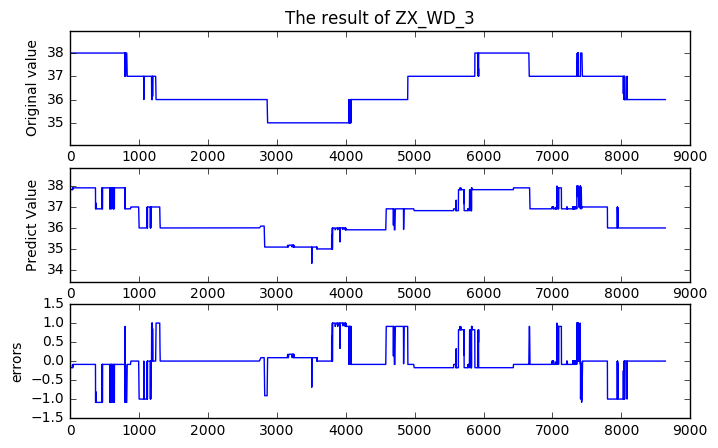

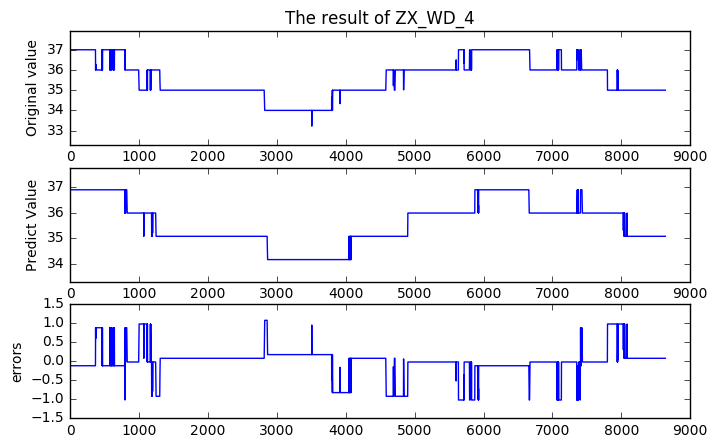

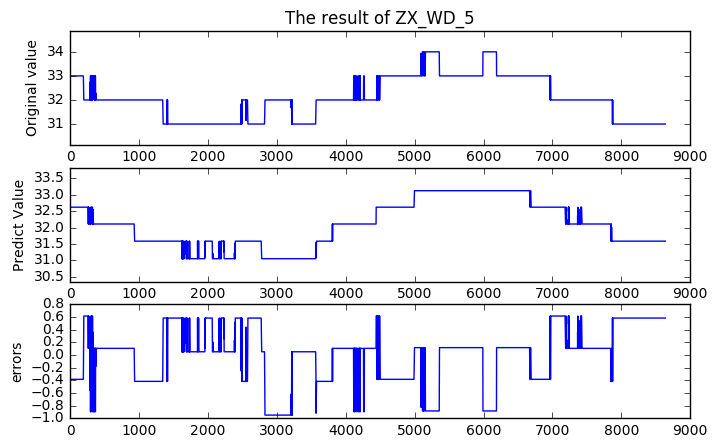

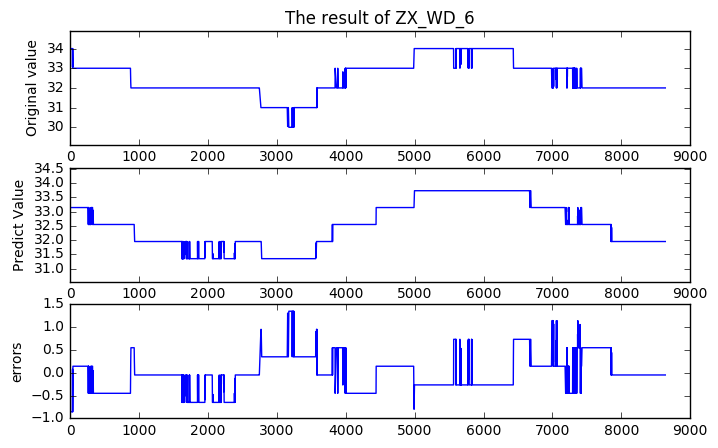

In [144]:
compare_plot_deap([0,0,0,0,0,0],data,deap_result_6)

************************* ZX_WD_1 *********************
original model:
Mul(Mul(ZX_WD_6, sqrt(ZX_WD_5)), 0.19)
Sub(Mul(1.365, ZX_WD_6), 9.4559999999999995)
Mul(ZX_WD_6, 1.075)
Mul(1.075, ZX_WD_6)
ZX_HW_2
symplified model:
0.19*sqrt(ZX_WD_5)*ZX_WD_6
1.365*ZX_WD_6 - 9.4559999999999995
1.075*ZX_WD_6
1.075*ZX_WD_6
ZX_HW_2
---------------------------------------------------------------------------------
complexity         nrmse_test         nrmse_train         rmse_test         rmse_train
6.000000         0.119728         0.119681         0.478911         0.478726
5.000000         0.146383         0.146258         0.585531         0.585032
3.000000         0.160090         0.160085         0.640362         0.640341
3.000000         0.160090         0.160085         0.640362         0.640341
1.000000         0.227610         0.227546         0.910439         0.910184
*********************************************************************
************************* ZX_WD_2 *********************


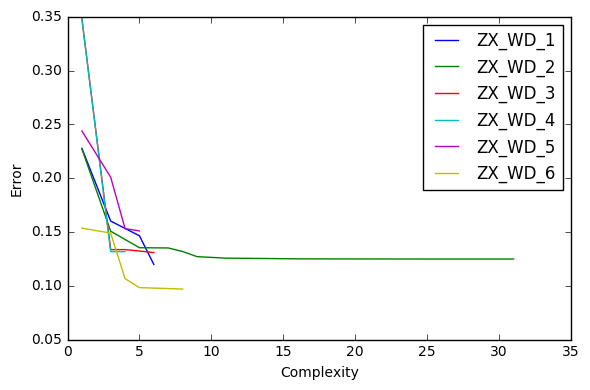

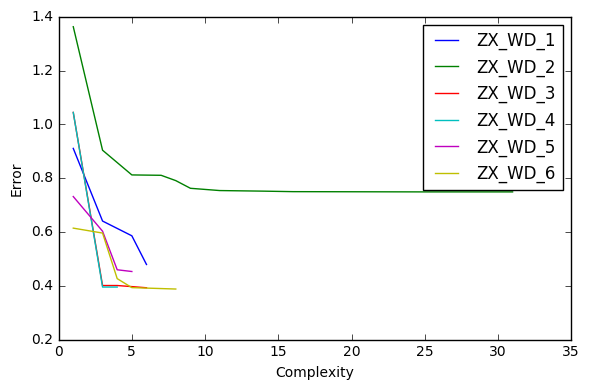

In [153]:
result_integral = list()
result_integral.insert(0, deap_result_2[0])
result_integral.insert(1, deap_result_1[1])
result_integral.insert(2, deap_result_3[2])
result_integral.insert(3, deap_result_4[3])
result_integral.insert(4, deap_result_1[4])
result_integral.insert(5, deap_result_6[5])

result_summary_gp(result_integral,varnames[0:var_num_learn])

0.19*sqrt(ZX_WD_5)*ZX_WD_6
(-0.17199999999999999*ZD_TFG + 0.60399999999999998*ZX_HW_2*(ZX_WD_4 + ZX_WD_5) - 0.17199999999999999*sqrt((ZD_JHG - ZX_HW_1)*(log(ZD_JHG) + 2.36364252615315e-125)) + 0.17199999999999999*log(ZD_SPEED)*log(ZX_WD_3 + ZX_WD_4 + ZX_WD_5))/ZX_HW_2
-sqrt(ZX_WD_1) + ZX_WD_4 + 6.875
0.973584767022471*ZX_WD_3
0.63100000000000001*ZX_WD_1 + 10.0
0.46500000000000002*ZX_WD_1 + 4.5780000000000003*log(ZX_WD_1)


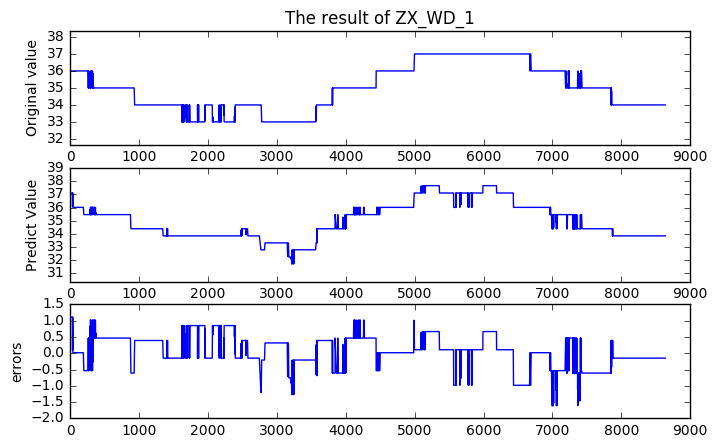

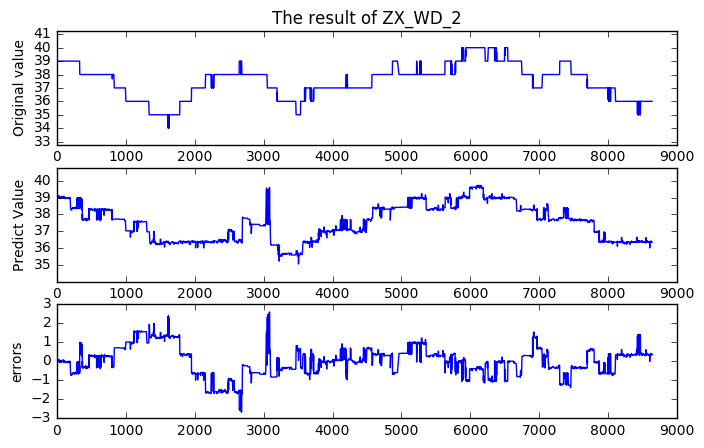

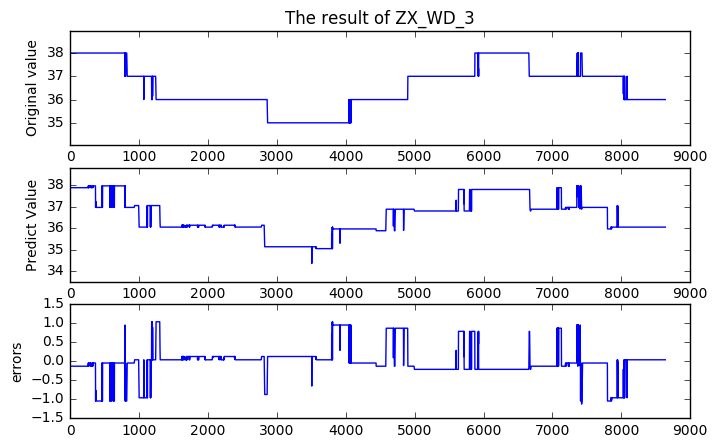

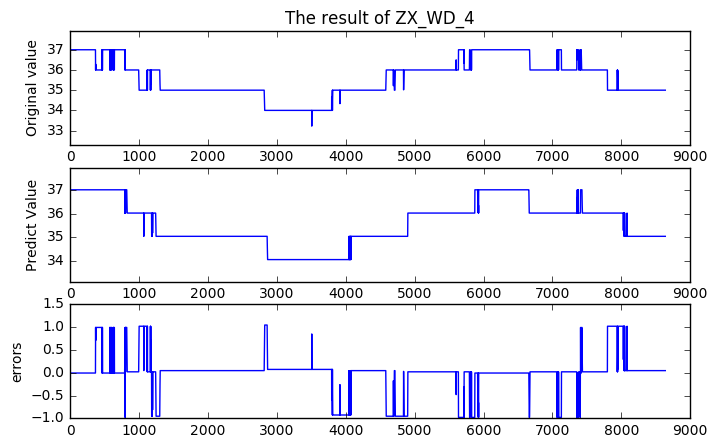

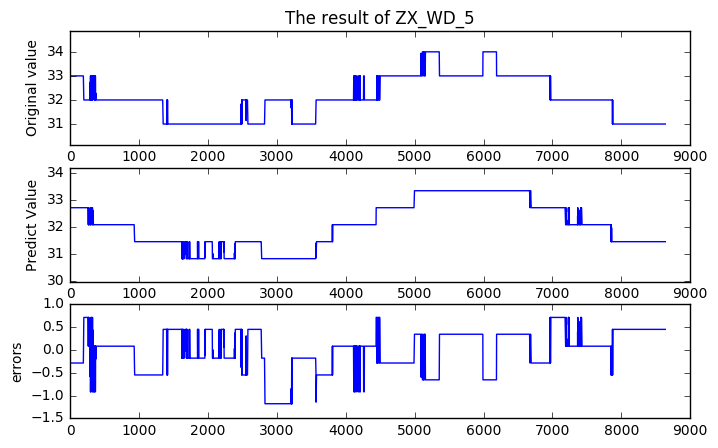

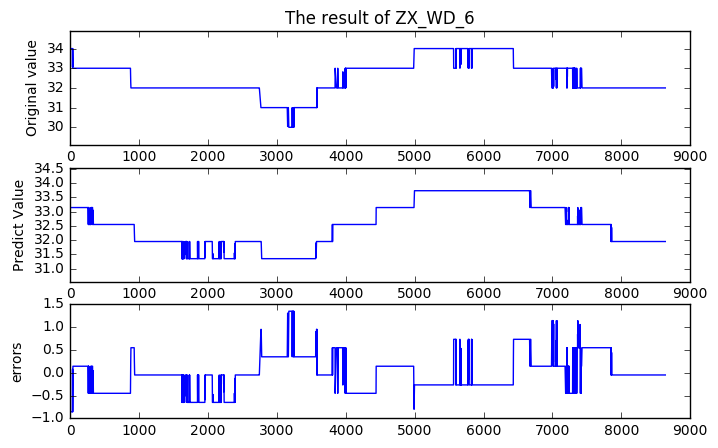

In [154]:
compare_plot_deap([0,0,0,0,0,0],data,result_integral)

In [151]:
np.shape(deap_result_2[0])

(5,)

#  lllllllllllllll

-------------------------learn ZX_WD_1------------
gen	evals	min                      	max        	diversity
0  	443  	[ 0.67012798  2.        ]	[ inf  38.]	1        
1  	500  	[ 0.67012798  1.        ]	[ inf  25.]	1        


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


2  	500  	[ 0.67012798  1.        ]	[ inf   6.]	1        


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


3  	500  	[ 0.67012798  1.        ]	[ inf   4.]	1        
4  	500  	[ 0.67012798  1.        ]	[ inf  23.]	1        
5  	500  	[ 0.67012798  1.        ]	[ inf  22.]	1        
6  	500  	[ 0.67012798  1.        ]	[ inf  28.]	1        
7  	500  	[ 0.67012798  1.        ]	[ inf  28.]	1        
8  	500  	[ 0.67012798  1.        ]	[ inf  28.]	1        
9  	500  	[ 0.67012798  1.        ]	[ inf  25.]	1        
10 	500  	[ 0.67012798  1.        ]	[  1.79262619e+14   2.50000000e+01]	1        
11 	500  	[ 0.64034114  1.        ]	[ 996.6271136   25.       ]        	1        
12 	500  	[ 0.64034114  1.        ]	[ 599.61334613   25.        ]      	1        
13 	500  	[ 0.64034114  1.        ]	[ 599.61334613   25.        ]      	1        
14 	500  	[ 0.64034114  1.        ]	[ 599.61334613   20.        ]      	1        
15 	500  	[ 0.64034114  1.        ]	[ 599.61334613   18.        ]      	1        
16 	500  	[ 0.64034114  1.        ]	[ 599.61334613   18.        ]      	1        


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


17 	500  	[ 0.64034114  1.        ]	[  6.64733812e+16   6.00000000e+00]	1        
18 	500  	[ 0.64034114  1.        ]	[ 599.61334613    8.        ]      	1        
19 	500  	[ 0.64034114  1.        ]	[ 599.61334613    8.        ]      	1        
20 	500  	[ 0.64034114  1.        ]	[ 599.61334613   21.        ]      	1        
21 	500  	[ 0.64034114  1.        ]	[ 599.61334613   10.        ]      	1        
22 	500  	[ 0.64034114  1.        ]	[ 599.61334613   11.        ]      	1        
23 	500  	[ 0.64034114  1.        ]	[ 599.61334613   11.        ]      	1        
24 	500  	[ 0.64034114  1.        ]	[ 599.61334613   14.        ]      	1        


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


25 	500  	[ 0.64034114  1.        ]	[ 599.61334613   14.        ]      	1        
26 	500  	[ 0.64034114  1.        ]	[ 599.61334613   19.        ]      	1        


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


27 	500  	[ 0.64034114  1.        ]	[ 599.61334613    6.        ]      	1        
28 	500  	[ 0.64034114  1.        ]	[ 599.61334613    8.        ]      	1        


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


29 	500  	[ 0.64034114  1.        ]	[ 599.61334613   10.        ]      	1        
30 	500  	[ 0.64034114  1.        ]	[ 599.61334613   10.        ]      	1        
31 	500  	[ 0.64034114  1.        ]	[ 599.61334613   10.        ]      	1        
32 	500  	[ 0.64034114  1.        ]	[ 599.61334613   11.        ]      	1        
33 	500  	[ 0.64034114  1.        ]	[ 599.61334613   11.        ]      	1        
34 	500  	[ 0.64034114  1.        ]	[ 599.61334613   11.        ]      	1        
35 	500  	[ 0.64034114  1.        ]	[ 599.61334613   10.        ]      	1        
36 	500  	[ 0.64034114  1.        ]	[ 599.61334613   10.        ]      	1        


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


37 	500  	[ 0.64034114  1.        ]	[ 599.61334613   11.        ]      	1        
38 	500  	[ 0.64034114  1.        ]	[ 599.61334613   11.        ]      	1        
39 	500  	[ 0.64034114  1.        ]	[ 599.61334613   11.        ]      	1        
40 	500  	[ 0.64034114  1.        ]	[ 599.61334613   11.        ]      	1        
41 	500  	[ 0.64034114  1.        ]	[ 599.61334613   16.        ]      	1        


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


42 	500  	[ 0.64034114  1.        ]	[ 599.61334613   16.        ]      	1        
43 	500  	[ 0.48358031  1.        ]	[ 599.61334613   16.        ]      	1        
44 	500  	[ 0.48358031  1.        ]	[ 599.61334613   16.        ]      	1        
45 	500  	[ 0.48358031  1.        ]	[ 599.61334613   16.        ]      	1        
46 	500  	[ 0.48358031  1.        ]	[ 599.61334613   18.        ]      	1        
47 	500  	[ 0.48358031  1.        ]	[ 599.61334613   18.        ]      	1        
48 	500  	[ 0.48358031  1.        ]	[ 599.61334613   18.        ]      	1        
49 	500  	[ 0.48358031  1.        ]	[ 599.61334613   20.        ]      	1        
--------------------end----------------------------
-------------------------learn ZX_WD_2------------
gen	evals	min                      	max        	diversity
0  	443  	[ 0.90668507  2.        ]	[ inf  38.]	1        


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


1  	500  	[ 0.90668507  1.        ]	[ inf  16.]	1        
2  	500  	[ 0.90668507  1.        ]	[ inf   7.]	1        


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


3  	500  	[ 0.90668507  1.        ]	[ inf   4.]	1        
4  	500  	[ 0.90668507  1.        ]	[ inf  42.]	1        
5  	500  	[ 0.90668507  1.        ]	[ inf  42.]	1        
6  	500  	[ 0.90668507  1.        ]	[ inf  42.]	1        
7  	500  	[ 0.90668507  1.        ]	[ inf  42.]	1        
8  	500  	[ 0.90668507  1.        ]	[ inf  43.]	1        
9  	500  	[ 0.90668507  1.        ]	[ inf  37.]	1        
10 	500  	[ 0.90668507  1.        ]	[ inf  37.]	1        
11 	500  	[ 0.90668507  1.        ]	[  2.22746858e+05   1.30000000e+01]	1        


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


12 	500  	[ 0.90668507  1.        ]	[ 1024.21438679     8.        ]    	1        
13 	500  	[ 0.90668507  1.        ]	[ 597.13120486   12.        ]      	1        
14 	500  	[ 0.90668507  1.        ]	[ 597.13120486   15.        ]      	1        
15 	500  	[ 0.90668507  1.        ]	[ 597.13120486   18.        ]      	1        
16 	500  	[ 0.90668507  1.        ]	[ 597.13120486   18.        ]      	1        


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


17 	500  	[ 0.90668507  1.        ]	[ 597.13120486    9.        ]      	1        
18 	500  	[ 0.90668507  1.        ]	[ 597.13120486   23.        ]      	1        
19 	500  	[ 0.90668507  1.        ]	[ 597.13120486   23.        ]      	1        
20 	500  	[ 0.90668507  1.        ]	[ 597.13120486   23.        ]      	1        
21 	500  	[ 0.90668507  1.        ]	[ 597.13120486   23.        ]      	1        
22 	500  	[ 0.90668507  1.        ]	[ 597.13120486   24.        ]      	1        
23 	500  	[ 0.90621987  1.        ]	[ 597.13120486   24.        ]      	1        
24 	500  	[ 0.90613763  1.        ]	[ 597.13120486   31.        ]      	1        
25 	500  	[ 0.90613763  1.        ]	[ 597.13120486   31.        ]      	1        


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


26 	500  	[ 0.90668507  1.        ]	[ inf   6.]                        	1        
27 	500  	[ 0.90668507  1.        ]	[ 597.13120486   16.        ]      	1        
28 	500  	[ 0.90597047  1.        ]	[ 597.13120486   16.        ]      	1        
29 	500  	[ 0.90597047  1.        ]	[ 597.13120486   16.        ]      	1        
30 	500  	[ 0.90597047  1.        ]	[ 597.13120486   16.        ]      	1        
31 	500  	[ 0.90597047  1.        ]	[ 597.13120486   11.        ]      	1        


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


32 	500  	[ 0.90597047  1.        ]	[ 597.13120486   11.        ]      	1        
33 	500  	[ 0.88838581  1.        ]	[ 597.13120486   11.        ]      	1        
34 	500  	[ 0.88838581  1.        ]	[ 597.13120486   11.        ]      	1        
35 	500  	[ 0.88838581  1.        ]	[ 597.13120486   11.        ]      	1        
36 	500  	[ 0.88838581  1.        ]	[ 597.13120486   11.        ]      	1        
37 	500  	[ 0.88838581  1.        ]	[ 597.13120486   11.        ]      	1        
38 	500  	[ 0.88838581  1.        ]	[ 597.13120486   10.        ]      	1        
39 	500  	[ 0.83198207  1.        ]	[ 597.13120486   11.        ]      	1        
40 	500  	[ 0.83198207  1.        ]	[ 597.13120486   16.        ]      	1        
41 	500  	[ 0.83198207  1.        ]	[ 597.13120486   34.        ]      	1        
42 	500  	[ 0.83198207  1.        ]	[ 597.13120486   34.        ]      	1        
43 	500  	[ 0.83198207  1.        ]	[ 597.13120486   34.        ]      	1        
44 	500  	[ 0.83

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


2  	500  	[ 0.39895752  1.        ]	[ inf  31.]	1        


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


3  	500  	[ 0.39895752  1.        ]	[ inf  12.]	1        
4  	500  	[ 0.39895752  1.        ]	[ inf   4.]	1        
5  	500  	[ 0.39895752  1.        ]	[ inf  13.]	1        
6  	500  	[ 0.39871435  1.        ]	[ inf  18.]	1        
7  	500  	[ 0.39871435  1.        ]	[ inf  18.]	1        
8  	500  	[ 0.39871435  1.        ]	[ inf  18.]	1        
9  	500  	[ 0.39871435  1.        ]	[ inf  20.]	1        


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


10 	500  	[ 0.39871435  1.        ]	[ inf  11.]	1        
11 	500  	[ 0.39871435  1.        ]	[  5.51434153e+15   2.10000000e+01]	1        


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


12 	500  	[ 0.39871435  1.        ]	[  2.22747689e+05   1.00000000e+01]	1        
13 	500  	[ 0.39871435  1.        ]	[ 1025.16774591    16.        ]    	1        
14 	500  	[ 0.39871435  1.        ]	[ 598.04499963   16.        ]      	1        
15 	500  	[ 0.39871435  1.        ]	[ 598.04499963   16.        ]      	1        
16 	500  	[ 0.39871435  1.        ]	[ 598.04499963   14.        ]      	1        


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


17 	500  	[ 0.39871435  1.        ]	[ 598.04499963    9.        ]      	1        
18 	500  	[ 0.39871435  1.        ]	[ 598.04499963   18.        ]      	1        
19 	500  	[ 0.39871435  1.        ]	[ 598.04499963   18.        ]      	1        
20 	500  	[ 0.39871435  1.        ]	[ 598.04499963   18.        ]      	1        
21 	500  	[ 0.39806765  1.        ]	[ 598.04499963   13.        ]      	1        


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


22 	500  	[ 0.39806765  1.        ]	[ 598.04499963    8.        ]      	1        
23 	500  	[ 0.39764075  1.        ]	[ 598.04499963   10.        ]      	1        
24 	500  	[ 0.39620159  1.        ]	[ 598.04499963   12.        ]      	1        


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


25 	500  	[ 0.39620159  1.        ]	[ 598.04499963   16.        ]      	1        
26 	500  	[ 0.39620159  1.        ]	[ 598.04499963   20.        ]      	1        


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


27 	500  	[ 0.39620159  1.        ]	[ 598.04499963    7.        ]      	1        
28 	500  	[ 0.39620159  1.        ]	[ 598.04499963   11.        ]      	1        
29 	500  	[ 0.39620159  1.        ]	[ 598.04499963   11.        ]      	1        
30 	500  	[ 0.39620159  1.        ]	[ 598.04499963   14.        ]      	1        
31 	500  	[ 0.39620159  1.        ]	[ 598.04499963   12.        ]      	1        


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


32 	500  	[ 0.39620159  1.        ]	[ 598.04499963    9.        ]      	1        
33 	500  	[ 0.39620159  1.        ]	[ 598.04499963   22.        ]      	1        
34 	500  	[ 0.39620159  1.        ]	[ 598.04499963   25.        ]      	1        
35 	500  	[ 0.39620159  1.        ]	[ 598.04499963   25.        ]      	1        
36 	500  	[ 0.39620159  1.        ]	[ 598.04499963   25.        ]      	1        
37 	500  	[ 0.39620159  1.        ]	[ 598.04499963   25.        ]      	1        
38 	500  	[ 0.39620159  1.        ]	[ 598.04499963   25.        ]      	1        
39 	500  	[ 0.39620159  1.        ]	[ 598.04499963   25.        ]      	1        
40 	500  	[ 0.39620159  1.        ]	[ 598.04499963   25.        ]      	1        
41 	500  	[ 0.39620159  1.        ]	[ 598.04499963   25.        ]      	1        
42 	500  	[ 0.39620159  1.        ]	[ 598.04499963   27.        ]      	1        
43 	500  	[ 0.39620159  1.        ]	[ 598.04499963   27.        ]      	1        
44 	500  	[ 0.39

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


6  	500  	[ 0.39333567  1.        ]	[  3.58656504e+33   1.60000000e+01]	1        
7  	500  	[ 0.39333567  1.        ]	[ inf  26.]                        	1        
8  	500  	[ 0.39333567  1.        ]	[  2.29526653e+05   2.60000000e+01]	1        
9  	500  	[ 0.39333567  1.        ]	[ 599.0010878   26.       ]        	1        


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


10 	500  	[ 0.39333567  1.        ]	[ 1019.21818896    10.        ]    	1        
11 	500  	[ 0.39333567  1.        ]	[ 599.0010878   18.       ]        	1        
12 	500  	[ 0.39333567  1.        ]	[ 599.0010878   32.       ]        	1        
13 	500  	[ 0.39333567  1.        ]	[ 599.0010878   12.       ]        	1        
14 	500  	[ 0.39333567  1.        ]	[ 599.0010878   13.       ]        	1        


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


15 	500  	[ 0.37796783  1.        ]	[ 599.0010878   10.       ]        	1        


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


16 	500  	[ 0.37796783  1.        ]	[ inf   6.]                        	1        


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


17 	500  	[ 0.37796783  1.        ]	[ 599.0010878    6.       ]        	1        
18 	500  	[ 0.37796783  1.        ]	[ 599.0010878   18.       ]        	1        
19 	500  	[ 0.37796783  1.        ]	[ 599.0010878   18.       ]        	1        


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


20 	500  	[ 0.39333567  1.        ]	[ 599.0010878    5.       ]        	1        
21 	500  	[ 0.39333567  1.        ]	[ 599.0010878   11.       ]        	1        
22 	500  	[ 0.39088944  1.        ]	[ 599.0010878    8.       ]        	1        
23 	500  	[ 0.39088944  1.        ]	[ 599.0010878    8.       ]        	1        
24 	500  	[ 0.39088944  1.        ]	[ 599.0010878   12.       ]        	1        


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


25 	500  	[ 0.39088944  1.        ]	[ 599.0010878   11.       ]        	1        
26 	500  	[ 0.37951539  1.        ]	[ 599.0010878   11.       ]        	1        
27 	500  	[ 0.37951539  1.        ]	[ 599.0010878   11.       ]        	1        


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


28 	500  	[ 0.37951539  1.        ]	[ 599.0010878    6.       ]        	1        
29 	500  	[ 0.37951539  1.        ]	[ 599.0010878    7.       ]        	1        
30 	500  	[ 0.37951539  1.        ]	[ 599.0010878    7.       ]        	1        
31 	500  	[ 0.37951539  1.        ]	[ 599.0010878   14.       ]        	1        
32 	500  	[ 0.37951539  1.        ]	[ 599.0010878   14.       ]        	1        
33 	500  	[ 0.37951539  1.        ]	[ 599.0010878   15.       ]        	1        
34 	500  	[ 0.37951539  1.        ]	[ 599.0010878   15.       ]        	1        
35 	500  	[ 0.37951539  1.        ]	[ 599.0010878   15.       ]        	1        
36 	500  	[ 0.37951539  1.        ]	[ 599.0010878   15.       ]        	1        


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


37 	500  	[ 0.37951539  1.        ]	[ 599.0010878   15.       ]        	1        
38 	500  	[ 0.37951539  1.        ]	[ 599.0010878   15.       ]        	1        
39 	500  	[ 0.37951539  1.        ]	[ 599.0010878   12.       ]        	1        
40 	500  	[ 0.37951539  1.        ]	[ 599.0010878   12.       ]        	1        
41 	500  	[ 0.37951539  1.        ]	[ 599.0010878   15.       ]        	1        
42 	500  	[ 0.37951539  1.        ]	[ 599.0010878   15.       ]        	1        
43 	500  	[ 0.37951539  1.        ]	[ 599.0010878   15.       ]        	1        
44 	500  	[ 0.37951539  1.        ]	[ 599.0010878   15.       ]        	1        
45 	500  	[ 0.37951539  1.        ]	[ 599.0010878   15.       ]        	1        


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


46 	500  	[ 0.37951539  1.        ]	[ 599.0010878    8.       ]        	1        
47 	500  	[ 0.37951539  1.        ]	[ 599.0010878   13.       ]        	1        
48 	500  	[ 0.37951539  1.        ]	[ 599.0010878   13.       ]        	1        
49 	500  	[ 0.37951539  1.        ]	[ 599.0010878   13.       ]        	1        
--------------------end----------------------------
-------------------------learn ZX_WD_5------------
gen	evals	min                      	max        	diversity
0  	443  	[ 0.60025643  2.        ]	[ inf  38.]	1        
1  	500  	[ 0.60025643  1.        ]	[ inf  31.]	1        
2  	500  	[ 0.60025643  1.        ]	[ inf  31.]	1        
3  	500  	[ 0.60025643  1.        ]	[  2.80173898e+15   4.00000000e+01]	1        
4  	500  	[ 0.60025643  1.        ]	[  4.06152544e+05   3.10000000e+01]	1        


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


5  	500  	[ 0.60025643  1.        ]	[ inf  18.]                        	1        


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


6  	500  	[ 0.60025643  1.        ]	[ inf   6.]                        	1        
7  	500  	[ 0.60025643  1.        ]	[ inf  11.]                        	1        
8  	500  	[ 0.56285743  1.        ]	[ inf  17.]                        	1        
9  	500  	[ 0.56285743  1.        ]	[  2.29530058e+05   1.30000000e+01]	1        
10 	500  	[ 0.49045731  1.        ]	[ 1022.7205988    13.       ]      	1        
11 	500  	[ 0.49045731  1.        ]	[ 602.51045286   13.        ]      	1        
12 	500  	[ 0.49045731  1.        ]	[ 602.51045286   17.        ]      	1        
13 	500  	[ 0.49045731  1.        ]	[ 602.51045286   17.        ]      	1        
14 	500  	[ 0.49045731  1.        ]	[ 602.51045286   24.        ]      	1        


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


15 	500  	[ 0.49045731  1.        ]	[ 602.51045286    7.        ]      	1        
16 	500  	[ 0.49045731  1.        ]	[ 602.51045286   20.        ]      	1        


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


17 	500  	[ 0.49045731  1.        ]	[ 602.51045286    9.        ]      	1        
18 	500  	[ 0.49045731  1.        ]	[ 602.51045286   20.        ]      	1        
19 	500  	[ 0.49045731  1.        ]	[ 602.51045286   12.        ]      	1        


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


20 	500  	[ 0.45969831  1.        ]	[  2.84828699e+14   5.00000000e+00]	1        
21 	500  	[ 0.45969831  1.        ]	[ 602.51045286    8.        ]      	1        
22 	500  	[ 0.45969831  1.        ]	[ 602.51045286   20.        ]      	1        
23 	500  	[ 0.45969831  1.        ]	[ 602.51045286   20.        ]      	1        
24 	500  	[ 0.45969831  1.        ]	[ 602.51045286   20.        ]      	1        
25 	500  	[ 0.45969831  1.        ]	[ 602.51045286   20.        ]      	1        
26 	500  	[ 0.45969831  1.        ]	[ 602.51045286   20.        ]      	1        
27 	500  	[ 0.45969831  1.        ]	[ 602.51045286   20.        ]      	1        
28 	500  	[ 0.45969831  1.        ]	[ 602.51045286   20.        ]      	1        


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


29 	500  	[ 0.45969831  1.        ]	[ inf   4.]                        	1        
30 	500  	[ 0.45969831  1.        ]	[ 1306.91283384    14.        ]    	1        
31 	500  	[ 0.45969831  1.        ]	[ 602.51045286   15.        ]      	1        


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


32 	500  	[ 0.45969831  1.        ]	[ 602.51045286    9.        ]      	1        
33 	500  	[ 0.45969831  1.        ]	[ 602.51045286    9.        ]      	1        
34 	500  	[ 0.45969831  1.        ]	[ 602.51045286   13.        ]      	1        
35 	500  	[ 0.45969831  1.        ]	[ 602.51045286   13.        ]      	1        
36 	500  	[ 0.45969831  1.        ]	[ 602.51045286   13.        ]      	1        


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


37 	500  	[ 0.45969831  1.        ]	[ 602.51045286   13.        ]      	1        
38 	500  	[ 0.45969831  1.        ]	[ 602.51045286   13.        ]      	1        
39 	500  	[ 0.45969831  1.        ]	[ 602.51045286   13.        ]      	1        
40 	500  	[ 0.45969831  1.        ]	[ 602.51045286   34.        ]      	1        
41 	500  	[ 0.45969831  1.        ]	[ 602.51045286   35.        ]      	1        
42 	500  	[ 0.45969831  1.        ]	[ 602.51045286   35.        ]      	1        
43 	500  	[ 0.45969831  1.        ]	[ 602.51045286   35.        ]      	1        
44 	500  	[ 0.45969831  1.        ]	[ 602.51045286   31.        ]      	1        
45 	500  	[ 0.45969831  1.        ]	[ 602.51045286   30.        ]      	1        
46 	500  	[ 0.45969831  1.        ]	[ 602.51045286   30.        ]      	1        
47 	500  	[ 0.45969831  1.        ]	[ 602.51045286   23.        ]      	1        
48 	500  	[ 0.45969831  1.        ]	[ 602.51045286   12.        ]      	1        
49 	500  	[ 0.45

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


2  	500  	[ 0.57298445  1.        ]	[ inf   6.]	1        


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


3  	500  	[ 0.47568039  1.        ]	[ inf   7.]	1        


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


4  	500  	[ 0.60658874  1.        ]	[ inf   4.]	1        
5  	500  	[ 0.60658874  1.        ]	[ inf  24.]	1        
6  	500  	[ 0.60658874  1.        ]	[ inf  11.]	1        
7  	500  	[ 0.60658874  1.        ]	[ inf  11.]	1        
8  	500  	[ 0.60658874  1.        ]	[ inf  17.]	1        
9  	500  	[ 0.60658874  1.        ]	[ inf  19.]	1        
10 	500  	[ 0.60658874  1.        ]	[ inf  21.]	1        
11 	500  	[ 0.60658874  1.        ]	[  2.22751484e+05   2.10000000e+01]	1        
12 	500  	[ 0.59621113  1.        ]	[ 602.03076252   21.        ]      	1        
13 	500  	[ 0.594503  1.      ]    	[ 602.03076252   21.        ]      	1        
14 	500  	[ 0.594503  1.      ]    	[ 602.03076252   21.        ]      	1        
15 	500  	[ 0.45347296  1.        ]	[ 602.03076252   21.        ]      	1        
16 	500  	[ 0.45347296  1.        ]	[ 602.03076252   30.        ]      	1        


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


17 	500  	[ 0.45347296  1.        ]	[ 602.03076252   11.        ]      	1        
18 	500  	[ 0.45347296  1.        ]	[ 602.03076252   18.        ]      	1        
19 	500  	[ 0.45347296  1.        ]	[ 602.03076252   19.        ]      	1        


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


20 	500  	[ 0.45347296  1.        ]	[ inf   5.]                        	1        
21 	500  	[ 0.44871586  1.        ]	[  6.64733812e+16   2.70000000e+01]	1        
22 	500  	[ 0.44871586  1.        ]	[ 602.03076252   11.        ]      	1        
23 	500  	[ 0.44871586  1.        ]	[ 602.03076252   20.        ]      	1        
24 	500  	[ 0.44871586  1.        ]	[ 602.03076252   20.        ]      	1        


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


25 	500  	[ 0.44871586  1.        ]	[ 602.03076252   20.        ]      	1        
26 	500  	[ 0.44871586  1.        ]	[ 602.03076252   20.        ]      	1        
27 	500  	[ 0.44871586  1.        ]	[ 602.03076252   21.        ]      	1        
28 	500  	[ 0.44871586  1.        ]	[ 602.03076252   21.        ]      	1        
29 	500  	[ 0.44871586  1.        ]	[ 602.03076252   21.        ]      	1        
30 	500  	[ 0.44871586  1.        ]	[ 602.03076252   21.        ]      	1        
31 	500  	[ 0.44871586  1.        ]	[ 602.03076252   23.        ]      	1        
32 	500  	[ 0.44871586  1.        ]	[ 602.03076252   25.        ]      	1        
33 	500  	[ 0.44871586  1.        ]	[ 602.03076252   29.        ]      	1        
34 	500  	[ 0.44871586  1.        ]	[ 602.03076252   33.        ]      	1        
35 	500  	[ 0.44871586  1.        ]	[ 602.03076252   33.        ]      	1        
36 	500  	[ 0.44871586  1.        ]	[ 602.03076252   33.        ]      	1        
37 	500  	[ 0.44

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


43 	500  	[ 0.41829938  1.        ]	[ 602.03076252   10.        ]      	1        
44 	500  	[ 0.41829938  1.        ]	[ 602.03076252   12.        ]      	1        
45 	500  	[ 0.41829938  1.        ]	[ 602.03076252   11.        ]      	1        
46 	500  	[ 0.41829938  1.        ]	[ 602.03076252   13.        ]      	1        
47 	500  	[ 0.41829938  1.        ]	[ 602.03076252   13.        ]      	1        
48 	500  	[ 0.41829938  1.        ]	[ 602.03076252   13.        ]      	1        
49 	500  	[ 0.41829938  1.        ]	[ 602.03076252   13.        ]      	1        
--------------------end----------------------------
************************* ZX_WD_1 *********************
original model:
Add(ZX_WD_6, Sub(sin(ZX_WD_5), Sub(sin(exp(-9.4429999999999996)), 2.0259999999999998)))
Add(ZX_WD_6, Sub(sin(ZX_WD_5), -2.0249999999999999))
Mul(ZX_WD_6, 1.075)
Mul(1.075, ZX_WD_6)
ZX_HW_2
symplified model:
ZX_WD_6 + sin(ZX_WD_5) + 2.0259207576754534
ZX_WD_6 + sin(ZX_WD_5) + 2.0249999999999999
1.075*Z

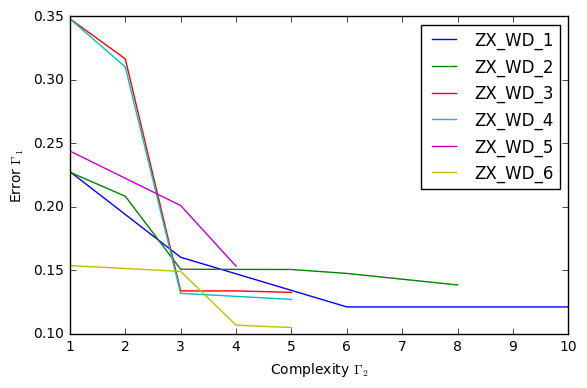

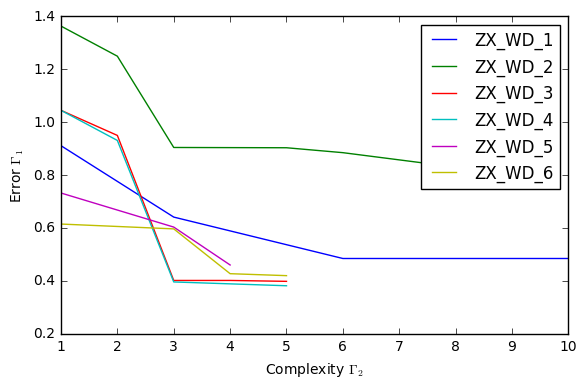

In [55]:
deap_result_1 = learn_nodelay_deap(data)
result_summary_gp(deap_result_1,varnames[0:var_num_learn])

#### time delay

In [67]:
time_delay_1 = np.arange(25)
print(time_delay_1)
print(len(time_delay_1))
deap_result_delay_1 = learn_delay_no_center_deap(data,time_delay_1)
result_summary_gp(deap_result_delay_1,varnames[0:var_num_learn])

[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24]
25
-------------------------learn ZX_WD_1------------
----------prepare_data_delay_deap------------------
del the target variable ZX_WD_1_dt0
del the target variable ZX_WD_1_dt1
del the target variable ZX_WD_1_dt2
del the target variable ZX_WD_1_dt3
del the target variable ZX_WD_1_dt4
del the target variable ZX_WD_1_dt5
del the target variable ZX_WD_1_dt6
del the target variable ZX_WD_1_dt7
del the target variable ZX_WD_1_dt8
del the target variable ZX_WD_1_dt9
del the target variable ZX_WD_1_dt10
del the target variable ZX_WD_1_dt11
del the target variable ZX_WD_1_dt12
del the target variable ZX_WD_1_dt13
del the target variable ZX_WD_1_dt14
del the target variable ZX_WD_1_dt15
del the target variable ZX_WD_1_dt16
del the target variable ZX_WD_1_dt17
del the target variable ZX_WD_1_dt18
del the target variable ZX_WD_1_dt19
del the target variable ZX_WD_1_dt20
del the target variable ZX_WD_1_dt21
del the targe

SyntaxError: more than 255 arguments (<string>, line 1)

----------prepare_data_delay_deap------------------
del the target variable ZX_WD_1_dt0
del the target variable ZX_WD_1_dt1
del the target variable ZX_WD_1_dt2
del the target variable ZX_WD_1_dt3
del the target variable ZX_WD_1_dt4
del the target variable ZX_WD_1_dt5
del the target variable ZX_WD_1_dt6
del the target variable ZX_WD_1_dt7
del the target variable ZX_WD_1_dt8
del the target variable ZX_WD_1_dt9
del the target variable ZX_WD_1_dt10
del the target variable ZX_WD_1_dt11
del the target variable ZX_WD_1_dt12
del the target variable ZX_WD_1_dt13
del the target variable ZX_WD_1_dt14
del the target variable ZX_WD_1_dt15
del the target variable ZX_WD_1_dt16
del the target variable ZX_WD_1_dt17
del the target variable ZX_WD_1_dt18
del the target variable ZX_WD_1_dt19
number of variable: 240
the shape of X
(8600, 240)
the shape of y
(8600,)
0.52500000000000002*ZX_HW_2_dt7 + 0.52500000000000002*ZX_WD_5_dt18
----------prepare_data_delay_deap------------------
del the target variable Z

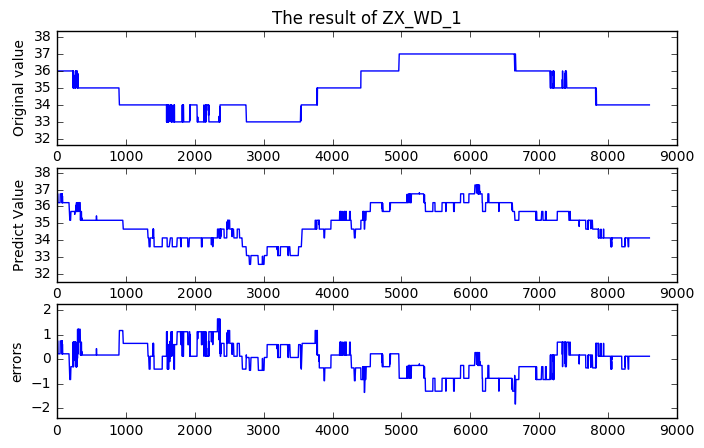

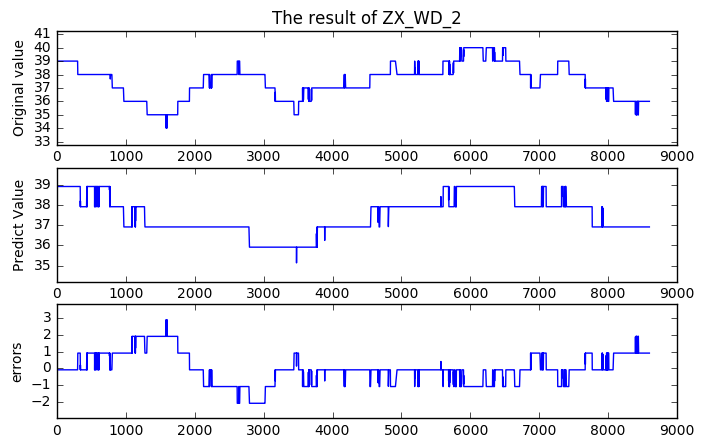

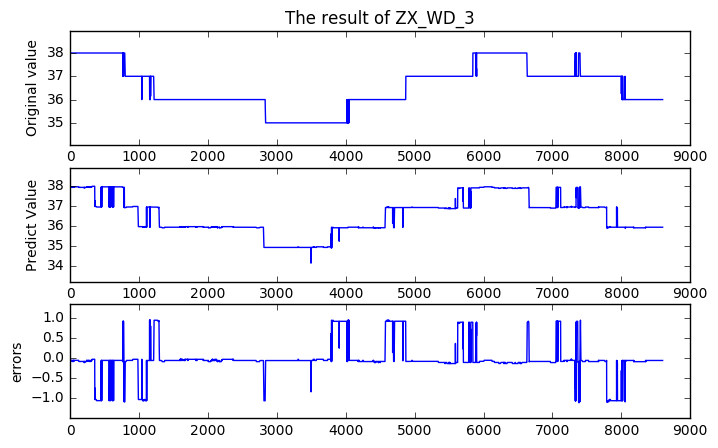

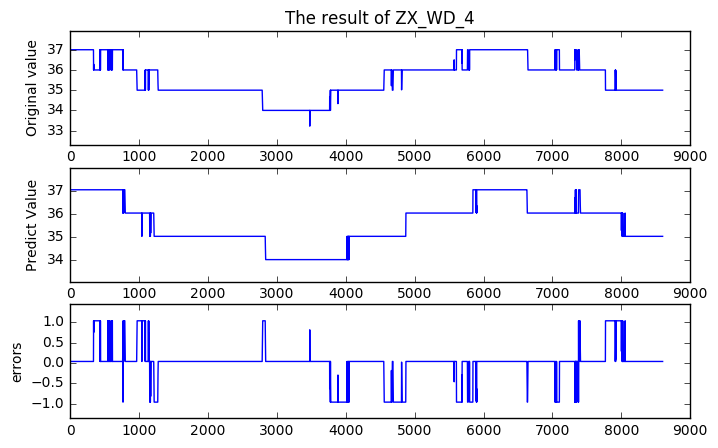

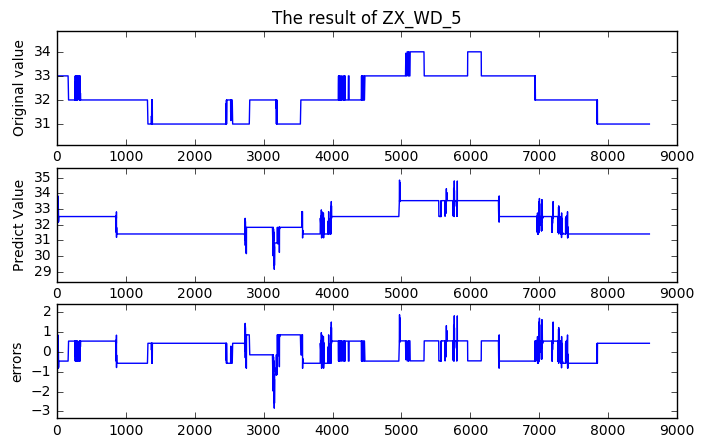

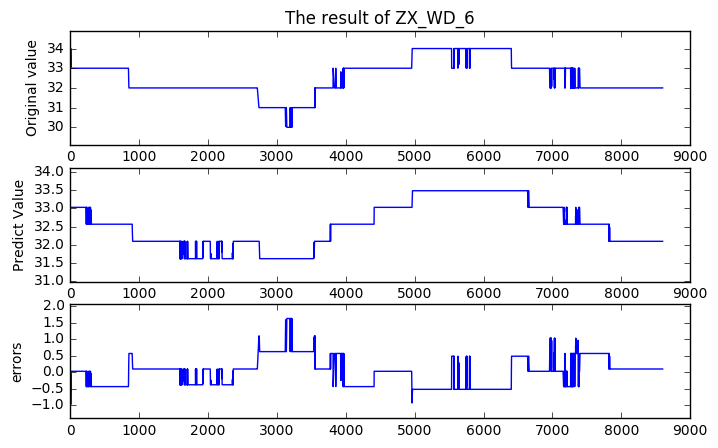

In [66]:
compare_plot_delay_no_center_deap([0,0,1,0,2,0],data,time_delay_1,deap_result_delay_1)

[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15]
16
-------------------------learn ZX_WD_1------------
----------prepare_data_delay_deap------------------
del the target variable ZX_WD_1_dt0
del the target variable ZX_WD_1_dt1
del the target variable ZX_WD_1_dt2
del the target variable ZX_WD_1_dt3
del the target variable ZX_WD_1_dt4
del the target variable ZX_WD_1_dt5
del the target variable ZX_WD_1_dt6
del the target variable ZX_WD_1_dt7
del the target variable ZX_WD_1_dt8
del the target variable ZX_WD_1_dt9
del the target variable ZX_WD_1_dt10
del the target variable ZX_WD_1_dt11
del the target variable ZX_WD_1_dt12
del the target variable ZX_WD_1_dt13
del the target variable ZX_WD_1_dt14
del the target variable ZX_WD_1_dt15
number of variable: 192
the shape of X
(8604, 192)
the shape of y
(8604,)
gen	evals	min                      	max        	diversity
0  	483  	[ 0.89910512  2.        ]	[ inf  19.]	476      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


1  	500  	[ 0.89910512  1.        ]	[ 599.57636517   16.        ]	498      
2  	500  	[ 0.89910512  1.        ]	[ 599.57647212   16.        ]	499      
3  	500  	[ 0.67010984  1.        ]	[ 599.57647212   20.        ]	499      
4  	500  	[ 0.67010984  1.        ]	[ 599.57657974   20.        ]	499      
5  	500  	[ 0.67010984  1.        ]	[ 599.54978151   15.        ]	497      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


6  	500  	[ 0.67010984  1.        ]	[ 599.57625762    6.        ]	500      
7  	500  	[ 0.67010984  1.        ]	[ 599.5495671   11.       ]  	499      
8  	500  	[ 0.67010984  1.        ]	[ 425.56678157   11.        ]	499      
9  	500  	[ 0.67010984  1.        ]	[ 425.43358693   15.        ]	500      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


10 	500  	[ 0.67010984  1.        ]	[ 33.30900461  11.        ]  	498      
11 	500  	[ 0.67010984  1.        ]	[ 30.04289594  11.        ]  	496      
12 	500  	[ 0.67010984  1.        ]	[ 30.03972463  14.        ]  	499      
13 	500  	[ 0.66959954  1.        ]	[ 30.04139244  15.        ]  	499      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


14 	500  	[ 0.66959954  1.        ]	[ 30.0380274  12.       ]    	499      
15 	500  	[ 0.63956508  1.        ]	[  2.97762161  12.        ]  	499      
16 	500  	[ 0.63956508  1.        ]	[  2.97754804  12.        ]  	498      
17 	500  	[ 0.63956508  1.        ]	[  2.74294731  15.        ]  	496      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


18 	500  	[ 0.63956508  1.        ]	[ 33.3063519   6.       ]    	498      
19 	500  	[ 0.63956508  1.        ]	[ 30.04531614  12.        ]  	496      
20 	500  	[ 0.63956508  1.        ]	[ 30.03954709  12.        ]  	493      
21 	500  	[ 0.63956508  1.        ]	[  2.97994697  13.        ]  	493      
22 	500  	[ 0.63956508  1.        ]	[  2.97994697  16.        ]  	493      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


23 	500  	[ 0.63956508  1.        ]	[ 30.04616856   7.        ]  	493      
24 	500  	[ 0.63956508  1.        ]	[ 30.03972463  10.        ]  	491      
25 	500  	[ 0.63956508  1.        ]	[ 30.03954709  10.        ]  	491      
26 	500  	[ 0.63956508  1.        ]	[ 30.04149854  11.        ]  	493      
27 	500  	[ 0.63956508  1.        ]	[ 30.04149854  11.        ]  	494      
28 	500  	[ 0.63956508  1.        ]	[ 30.03954709  11.        ]  	494      
29 	500  	[ 0.63956508  1.        ]	[ 30.0380274  11.       ]    	494      
30 	500  	[ 0.63956508  1.        ]	[  2.97980778  11.        ]  	495      
31 	500  	[ 0.63956508  1.        ]	[  2.97953517  11.        ]  	495      
32 	500  	[ 0.63956508  1.        ]	[  2.97908767  12.        ]  	495      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


33 	500  	[ 0.63956508  1.        ]	[ 2.97980778  8.        ]    	494      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


34 	500  	[ 0.63956508  1.        ]	[ 2.97953517  7.        ]    	493      
35 	500  	[ 0.63956508  1.        ]	[ 2.97881842  9.        ]    	492      
36 	500  	[ 0.63956508  1.        ]	[ 30.0380274   9.       ]    	493      
37 	500  	[ 0.59638298  1.        ]	[  2.97980778  11.        ]  	492      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


38 	500  	[ 0.63686085  1.        ]	[ 2.97994697  7.        ]    	492      
39 	500  	[ 0.62517869  1.        ]	[  2.97980778  11.        ]  	492      
40 	500  	[ 0.62517869  1.        ]	[  2.97980778  11.        ]  	491      
41 	500  	[ 0.61627187  1.        ]	[  2.97980778  11.        ]  	491      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


42 	500  	[ 0.61627187  1.        ]	[ 30.0380274   7.       ]    	491      
43 	500  	[ 0.61627187  1.        ]	[ 2.97980778  8.        ]    	491      
44 	500  	[ 0.61627187  1.        ]	[ 2.97924764  9.        ]    	491      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


45 	500  	[ 0.61627187  1.        ]	[ 30.04372169   6.        ]  	490      
46 	500  	[ 0.61627187  1.        ]	[ 30.04149854   7.        ]  	486      
47 	500  	[ 0.61627187  1.        ]	[ 30.04149854   9.        ]  	486      
48 	500  	[ 0.61627187  1.        ]	[ 30.04139244   9.        ]  	481      
49 	500  	[ 0.61627187  1.        ]	[ 30.04139244  11.        ]  	483      
--------------------end----------------------------
-------------------------learn ZX_WD_2------------
----------prepare_data_delay_deap------------------
del the target variable ZX_WD_2_dt0
del the target variable ZX_WD_2_dt1
del the target variable ZX_WD_2_dt2
del the target variable ZX_WD_2_dt3
del the target variable ZX_WD_2_dt4
del the target variable ZX_WD_2_dt5
del the target variable ZX_WD_2_dt6
del the target variable ZX_WD_2_dt7
del the target variable ZX_WD_2_dt8
del the target variable ZX_WD_2_dt9
del the target variable ZX_WD_2_dt10
del the target variable ZX_WD_2_dt11
del the target variable ZX_WD_2

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


14 	500  	[ 0.90496848  1.        ]	[ 32.48464626   9.        ]  	496      
15 	500  	[ 0.90496848  1.        ]	[ 32.48464626  13.        ]  	497      
16 	500  	[ 0.90496848  1.        ]	[  5.4938451  13.       ]    	496      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


17 	500  	[ 0.90496848  1.        ]	[ 423.05316521    6.        ]	500      
18 	500  	[ 0.90496848  1.        ]	[ 35.70056697  12.        ]  	498      
19 	500  	[ 0.90496848  1.        ]	[ 32.48958156  12.        ]  	496      
20 	500  	[ 0.90496848  1.        ]	[  5.49490506  12.        ]  	496      
21 	500  	[ 0.90496848  1.        ]	[  5.4937977  14.       ]    	494      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


22 	500  	[ 0.90496848  1.        ]	[  5.4938451  11.       ]    	493      
23 	500  	[ 0.90496848  1.        ]	[  5.4937977  11.       ]    	493      
24 	500  	[ 0.90496848  1.        ]	[  5.49415753  14.        ]  	489      
25 	500  	[ 0.90496848  1.        ]	[  5.4937977  14.       ]    	487      
26 	500  	[ 0.90496848  1.        ]	[  5.49352423  14.        ]  	486      
27 	500  	[ 0.90496848  1.        ]	[  5.49351268  20.        ]  	484      
28 	500  	[ 0.90496848  1.        ]	[  5.49286243  20.        ]  	470      
29 	500  	[ 0.90496848  1.        ]	[  5.17552795  22.        ]  	463      
30 	500  	[ 0.90496848  1.        ]	[  5.17531161  22.        ]  	444      
31 	500  	[ 0.90496848  1.        ]	[  5.1747816  22.       ]    	420      
32 	500  	[ 0.90496848  1.        ]	[  5.1747816  20.       ]    	408      
33 	500  	[ 0.90496848  1.        ]	[  5.4924991  20.       ]    	396      
34 	500  	[ 0.90496848  1.        ]	[  5.49312067  20.        ]  	403      
35 	500  	[ 

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


46 	500  	[ 0.81406482  1.        ]	[ 35.70056697   7.        ]  	461      
47 	500  	[ 0.81406482  1.        ]	[ 35.70056697   8.        ]  	457      
48 	500  	[ 0.81406482  1.        ]	[ 35.70119323   8.        ]  	452      
49 	500  	[ 0.81406482  1.        ]	[ 35.70119323  10.        ]  	447      
--------------------end----------------------------
-------------------------learn ZX_WD_3------------
----------prepare_data_delay_deap------------------
del the target variable ZX_WD_3_dt0
del the target variable ZX_WD_3_dt1
del the target variable ZX_WD_3_dt2
del the target variable ZX_WD_3_dt3
del the target variable ZX_WD_3_dt4
del the target variable ZX_WD_3_dt5
del the target variable ZX_WD_3_dt6
del the target variable ZX_WD_3_dt7
del the target variable ZX_WD_3_dt8
del the target variable ZX_WD_3_dt9
del the target variable ZX_WD_3_dt10
del the target variable ZX_WD_3_dt11
del the target variable ZX_WD_3_dt12
del the target variable ZX_WD_3_dt13
del the target variable ZX_WD_3_d

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


1  	500  	[ 0.87061485  1.        ]	[ 598.00833932   12.        ]	498      
2  	500  	[ 0.87061485  1.        ]	[ 598.00841308   13.        ]	500      
3  	500  	[ 0.87061485  1.        ]	[ 598.00841308   15.        ]	500      
4  	500  	[ 0.6608028  1.       ]  	[ 598.00811943   15.        ]	500      
5  	500  	[ 0.6608028  1.       ]  	[ 597.981755   12.      ]    	500      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


6  	500  	[ 0.40106138  1.        ]	[ 432.18570098    9.        ]	500      
7  	500  	[ 0.40106138  1.        ]	[ 423.91221629   12.        ]	499      
8  	500  	[ 0.39564714  1.        ]	[ 34.8052435  12.       ]    	499      
9  	500  	[ 0.39564714  1.        ]	[ 34.8052435  13.       ]    	499      
10 	500  	[ 0.39564714  1.        ]	[ 31.57435123  13.        ]  	498      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


11 	500  	[ 0.39564714  1.        ]	[ 432.18449859    6.        ]	500      
12 	500  	[ 0.39564714  1.        ]	[ 423.89569993    9.        ]	497      
13 	500  	[ 0.39564714  1.        ]	[ 34.82883534  10.        ]  	497      
14 	500  	[ 0.39564714  1.        ]	[ 31.5771571  11.       ]    	495      
15 	500  	[ 0.39564714  1.        ]	[ 31.57310791  15.        ]  	495      
16 	500  	[ 0.39564714  1.        ]	[ 31.56780765  15.        ]  	495      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


17 	500  	[ 0.39564714  1.        ]	[ 31.56770181   8.        ]  	495      
18 	500  	[ 0.39564714  1.        ]	[  4.55690428  13.        ]  	494      
19 	500  	[ 0.39564714  1.        ]	[  4.55685001  13.        ]  	491      
20 	500  	[ 0.39564714  1.        ]	[ 31.56854694  13.        ]  	490      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


21 	500  	[ 0.39564714  1.        ]	[ 31.57029032   7.        ]  	488      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


22 	500  	[ 0.39564714  1.        ]	[ 31.56854694   7.        ]  	487      
23 	500  	[ 0.39564714  1.        ]	[  4.55690428  12.        ]  	485      
24 	500  	[ 0.39564714  1.        ]	[  4.55690428  12.        ]  	483      
25 	500  	[ 0.39446417  1.        ]	[ 31.56650081  12.        ]  	483      
26 	500  	[ 0.39446417  1.        ]	[ 31.56542827  12.        ]  	481      
27 	500  	[ 0.39446417  1.        ]	[  4.55629211  12.        ]  	482      
28 	500  	[ 0.39446417  1.        ]	[  4.55567986  12.        ]  	480      
29 	500  	[ 0.39446417  1.        ]	[  4.55378832  13.        ]  	480      
30 	500  	[ 0.39446417  1.        ]	[  4.55261738  13.        ]  	481      
31 	500  	[ 0.39446417  1.        ]	[  4.55256306  15.        ]  	481      
32 	500  	[ 0.39446417  1.        ]	[  4.55256306  15.        ]  	481      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


33 	500  	[ 0.39446417  1.        ]	[ 31.57428618   6.        ]  	480      
34 	500  	[ 0.39446417  1.        ]	[ 31.56854694  11.        ]  	478      
35 	500  	[ 0.39446417  1.        ]	[ 31.56770181   9.        ]  	477      
36 	500  	[ 0.39446417  1.        ]	[ 31.56542827  10.        ]  	477      
37 	500  	[ 0.39446417  1.        ]	[  4.55685001  11.        ]  	477      
38 	500  	[ 0.39446417  1.        ]	[  4.55562558  11.        ]  	477      
39 	500  	[ 0.39446417  1.        ]	[  4.55506753  11.        ]  	475      
40 	500  	[ 0.39446417  1.        ]	[  4.55501324  11.        ]  	474      
41 	500  	[ 0.39444486  1.        ]	[  4.55323004  11.        ]  	469      
42 	500  	[ 0.39444486  1.        ]	[  4.55261738  12.        ]  	466      
43 	500  	[ 0.39444486  1.        ]	[  4.55256306  13.        ]  	462      
44 	500  	[ 0.39378756  1.        ]	[  4.18809603  13.        ]  	461      
45 	500  	[ 0.39378756  1.        ]	[  4.18792771  13.        ]  	457      
46 	500  	[ 

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


47 	500  	[ 0.39378756  1.        ]	[ 4.18724463  9.        ]    	455      
48 	500  	[ 0.39378756  1.        ]	[  4.18590497  11.        ]  	456      
49 	500  	[ 0.39378756  1.        ]	[  4.18479174  16.        ]  	455      
--------------------end----------------------------
-------------------------learn ZX_WD_4------------
----------prepare_data_delay_deap------------------
del the target variable ZX_WD_4_dt0
del the target variable ZX_WD_4_dt1
del the target variable ZX_WD_4_dt2
del the target variable ZX_WD_4_dt3
del the target variable ZX_WD_4_dt4
del the target variable ZX_WD_4_dt5
del the target variable ZX_WD_4_dt6
del the target variable ZX_WD_4_dt7
del the target variable ZX_WD_4_dt8
del the target variable ZX_WD_4_dt9
del the target variable ZX_WD_4_dt10
del the target variable ZX_WD_4_dt11
del the target variable ZX_WD_4_dt12
del the target variable ZX_WD_4_dt13
del the target variable ZX_WD_4_dt14
del the target variable ZX_WD_4_dt15
number of variable: 192
the shape o

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


12 	500  	[ 0.40478201  1.        ]	[ 33.92339416   6.        ]  	496      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


13 	500  	[ 0.40478201  1.        ]	[ 30.63921102   6.        ]  	496      
14 	500  	[ 0.40478201  1.        ]	[ 30.63580587   9.        ]  	493      
15 	500  	[ 0.40478201  1.        ]	[ 30.63147439  10.        ]  	492      
16 	500  	[ 0.40478201  1.        ]	[  3.59045958  12.        ]  	491      
17 	500  	[ 0.40478201  1.        ]	[  3.58983061  12.        ]  	492      
18 	500  	[ 0.40287177  1.        ]	[  3.58918303  15.        ]  	492      
19 	500  	[ 0.37400369  1.        ]	[  3.58918303  12.        ]  	492      
20 	500  	[ 0.37400369  1.        ]	[  3.58797544  15.        ]  	493      
21 	500  	[ 0.37400369  1.        ]	[  3.23505498  16.        ]  	491      
22 	500  	[ 0.37400369  1.        ]	[  3.58856771  16.        ]  	494      
23 	500  	[ 0.37400369  1.        ]	[  3.23349079  16.        ]  	494      
24 	500  	[ 0.37400369  1.        ]	[  3.23254018  17.        ]  	493      
25 	500  	[ 0.37400369  1.        ]	[  3.23118283  17.        ]  	492      
26 	500  	[ 

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


33 	500  	[ 0.37400369  1.        ]	[  3.58800879  12.        ]  	484      
34 	500  	[ 0.37400369  1.        ]	[  3.23349079  14.        ]  	481      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


35 	500  	[ 0.37400369  1.        ]	[  3.23505498  11.        ]  	476      
36 	500  	[ 0.37400369  1.        ]	[  3.23419987  14.        ]  	471      
37 	500  	[ 0.37400369  1.        ]	[  3.23505498  14.        ]  	467      
38 	500  	[ 0.37400369  1.        ]	[  3.23378051  16.        ]  	461      
39 	500  	[ 0.36329227  1.        ]	[  3.23224197  16.        ]  	456      
40 	500  	[ 0.36329227  1.        ]	[  3.11074601  19.        ]  	441      
41 	500  	[ 0.36329227  1.        ]	[  3.10773493  22.        ]  	428      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


42 	500  	[ 0.3991991  1.       ]  	[  2.70353283e+14   6.00000000e+00]	495      
43 	500  	[ 0.3943169  1.       ]  	[ 33.88224583  11.        ]        	495      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


44 	500  	[ 0.3943169  1.       ]  	[ 30.63351099   7.        ]        	495      
45 	500  	[ 0.3943169  1.       ]  	[ 30.63147439   7.        ]        	493      
46 	500  	[ 0.3943169  1.       ]  	[ 30.62851594  12.        ]        	491      
47 	500  	[ 0.3943169  1.       ]  	[ 30.62758371  12.        ]        	491      
48 	500  	[ 0.3943169  1.       ]  	[ 30.62758371  12.        ]        	490      
49 	500  	[ 0.3943169  1.       ]  	[  3.59182908  12.        ]        	490      
--------------------end----------------------------
-------------------------learn ZX_WD_5------------
----------prepare_data_delay_deap------------------
del the target variable ZX_WD_5_dt0
del the target variable ZX_WD_5_dt1
del the target variable ZX_WD_5_dt2
del the target variable ZX_WD_5_dt3
del the target variable ZX_WD_5_dt4
del the target variable ZX_WD_5_dt5
del the target variable ZX_WD_5_dt6
del the target variable ZX_WD_5_dt7
del the target variable ZX_WD_5_dt8
del the target variable ZX_WD

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


2  	500  	[ 0.73017981  1.        ]	[ 602.4723743    6.       ]	495      
3  	500  	[ 0.73017981  1.        ]	[ 602.4723743    9.       ]	499      
4  	500  	[ 0.73017981  1.        ]	[ 602.4723743   10.       ]	498      
5  	500  	[ 0.73017981  1.        ]	[ 602.4723743   10.       ]	498      
6  	500  	[ 0.64082451  1.        ]	[ 602.4723743   11.       ]	498      
7  	500  	[ 0.64082451  1.        ]	[ 602.44584373   13.        ]	498      
8  	500  	[ 0.64082451  1.        ]	[ 436.51460578   14.        ]	498      
9  	500  	[ 0.60282255  1.        ]	[ 30.65658911  14.        ]  	497      
10 	500  	[ 0.60282255  1.        ]	[ 27.27680962  16.        ]  	496      
11 	500  	[ 0.56778761  1.        ]	[ 27.2744512  17.       ]    	495      
12 	500  	[ 0.56778761  1.        ]	[ 27.27008243  17.        ]  	493      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


13 	500  	[ 0.56778761  1.        ]	[ 27.27536596   8.        ]  	497      
14 	500  	[ 0.56778761  1.        ]	[ 27.2736322  13.       ]    	494      
15 	500  	[ 0.56778761  1.        ]	[ 27.26932385  12.        ]  	492      
16 	500  	[ 0.56778761  1.        ]	[  5.49781138  12.        ]  	491      
17 	500  	[ 0.56778761  1.        ]	[  5.4954707  13.       ]    	490      
18 	500  	[ 0.56778761  1.        ]	[  4.55906614  13.        ]  	486      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


19 	500  	[ 0.56778761  1.        ]	[ 30.62588266   6.        ]  	491      
20 	500  	[ 0.56778761  1.        ]	[  5.49909952  10.        ]  	489      
21 	500  	[ 0.56778761  1.        ]	[  5.49606827  11.        ]  	489      
22 	500  	[ 0.5510099  1.       ]  	[  5.49490506  13.        ]  	488      
23 	500  	[ 0.5510099  1.       ]  	[  4.56113293  13.        ]  	484      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


24 	500  	[ 0.5510099  1.       ]  	[ 22.099331   6.      ]      	484      
25 	500  	[ 0.5510099  1.       ]  	[  5.49784833  10.        ]  	479      
26 	500  	[ 0.5510099  1.       ]  	[  5.49726832  10.        ]  	477      
27 	500  	[ 0.5510099  1.       ]  	[  5.49781138  11.        ]  	482      
28 	500  	[ 0.5510099  1.       ]  	[  5.49726832  12.        ]  	480      
29 	500  	[ 0.5510099  1.       ]  	[  5.49726832  12.        ]  	482      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


30 	500  	[ 0.5510099  1.       ]  	[ 27.2736322   6.       ]    	484      
31 	500  	[ 0.5510099  1.       ]  	[ 5.50025924  6.        ]    	486      
32 	500  	[ 0.5510099  1.       ]  	[ 5.49963487  9.        ]    	483      
33 	500  	[ 0.5510099  1.       ]  	[  5.49909952  10.        ]  	482      
34 	500  	[ 0.5510099  1.       ]  	[  5.49909952  10.        ]  	482      
35 	500  	[ 0.5510099  1.       ]  	[  5.50025924  10.        ]  	482      
36 	500  	[ 0.5510099  1.       ]  	[ 27.26932385  10.        ]  	481      
37 	500  	[ 0.5510099  1.       ]  	[ 22.099331  10.      ]      	479      
38 	500  	[ 0.5510099  1.       ]  	[  5.50025924  10.        ]  	478      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


39 	500  	[ 0.5510099  1.       ]  	[ 27.27047318   9.        ]  	476      
40 	500  	[ 0.45607831  1.        ]	[ 22.099331   9.      ]      	474      
41 	500  	[ 0.45607831  1.        ]	[ 22.099331   9.      ]      	473      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


42 	500  	[ 0.45607831  1.        ]	[ 27.2744512   6.       ]    	475      
43 	500  	[ 0.45607831  1.        ]	[ 27.27129951   8.        ]  	475      
44 	500  	[ 0.45607831  1.        ]	[ 27.27129951   8.        ]  	476      
45 	500  	[ 0.45607831  1.        ]	[ 27.27129951   9.        ]  	477      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


46 	500  	[ 0.45607831  1.        ]	[ 27.27129951   6.        ]  	473      
47 	500  	[ 0.45607831  1.        ]	[ 27.27129951   6.        ]  	473      
48 	500  	[ 0.45607831  1.        ]	[ 27.27333432   7.        ]  	473      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


49 	500  	[ 0.45607831  1.        ]	[ 27.27129951   6.        ]  	471      
--------------------end----------------------------
-------------------------learn ZX_WD_6------------
----------prepare_data_delay_deap------------------
del the target variable ZX_WD_6_dt0
del the target variable ZX_WD_6_dt1
del the target variable ZX_WD_6_dt2
del the target variable ZX_WD_6_dt3
del the target variable ZX_WD_6_dt4
del the target variable ZX_WD_6_dt5
del the target variable ZX_WD_6_dt6
del the target variable ZX_WD_6_dt7
del the target variable ZX_WD_6_dt8
del the target variable ZX_WD_6_dt9
del the target variable ZX_WD_6_dt10
del the target variable ZX_WD_6_dt11
del the target variable ZX_WD_6_dt12
del the target variable ZX_WD_6_dt13
del the target variable ZX_WD_6_dt14
del the target variable ZX_WD_6_dt15
number of variable: 192
the shape of X
(8604, 192)
the shape of y
(8604,)
gen	evals	min                    	max        	diversity
0  	483  	[ 0.7608362  2.       ]	[ inf  19.]	476      
1

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


11 	500  	[ 0.58883524  1.        ]	[  5.06131671  12.        ]  	494      
12 	500  	[ 0.58883524  1.        ]	[  5.06131671  18.        ]  	487      
13 	500  	[ 0.58883524  1.        ]	[  5.06489254  15.        ]  	493      
14 	500  	[ 0.58883524  1.        ]	[  5.06131671  16.        ]  	494      
15 	500  	[ 0.58883524  1.        ]	[  4.08334226  17.        ]  	489      
16 	500  	[ 0.58883524  1.        ]	[  4.08016941  17.        ]  	487      
17 	500  	[ 0.58883524  1.        ]	[  4.07791677  16.        ]  	478      
18 	500  	[ 0.58883524  1.        ]	[  4.07951252  17.        ]  	489      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


19 	500  	[ 0.58883524  1.        ]	[ 427.76974822    7.        ]	489      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


20 	500  	[ 0.58883524  1.        ]	[ 31.03899317   6.        ]  	488      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


21 	500  	[ 0.58883524  1.        ]	[ 27.69325136   6.        ]  	487      
22 	500  	[ 0.58883524  1.        ]	[ 27.68914022  12.        ]  	489      
23 	500  	[ 0.58883524  1.        ]	[ 27.68637811  14.        ]  	486      
24 	500  	[ 0.58883524  1.        ]	[  5.0617465  14.       ]    	484      
25 	500  	[ 0.58883524  1.        ]	[  5.05867238  19.        ]  	482      
26 	500  	[ 0.58883524  1.        ]	[  5.05734316  20.        ]  	482      
27 	500  	[ 0.58883524  1.        ]	[  4.08029388  20.        ]  	478      
28 	500  	[ 0.58883524  1.        ]	[  4.07791677  20.        ]  	476      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


29 	500  	[ 0.58883524  1.        ]	[ 5.06131671  8.        ]    	478      
30 	500  	[ 0.58883524  1.        ]	[  4.08334226  11.        ]  	476      
31 	500  	[ 0.58883524  1.        ]	[  5.05734316  10.        ]  	477      
32 	500  	[ 0.58883524  1.        ]	[  5.06040871  12.        ]  	478      
33 	500  	[ 0.58883524  1.        ]	[  5.05912311  12.        ]  	481      
34 	500  	[ 0.58883524  1.        ]	[  4.08348289  14.        ]  	482      
35 	500  	[ 0.58883524  1.        ]	[  5.05825121  14.        ]  	481      
36 	500  	[ 0.58883524  1.        ]	[  5.05867238  14.        ]  	483      
37 	500  	[ 0.58883524  1.        ]	[  5.05867238  14.        ]  	486      
38 	500  	[ 0.58883524  1.        ]	[  5.05912311  14.        ]  	483      
39 	500  	[ 0.58883524  1.        ]	[ 27.68910996  13.        ]  	482      
40 	500  	[ 0.58883524  1.        ]	[  5.0617465  13.       ]    	480      
41 	500  	[ 0.58883524  1.        ]	[  5.06131671  12.        ]  	478      
42 	500  	[ 

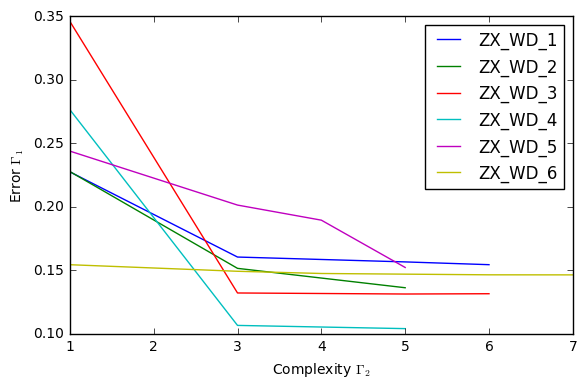

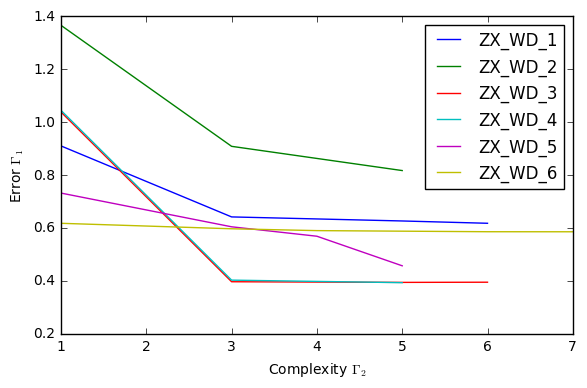

In [15]:
time_delay_1 = np.arange(16)
print(time_delay_1)
print(len(time_delay_1))
deap_result_delay_1 = learn_delay_no_center_deap(data,time_delay_1)
result_summary_gp(deap_result_delay_1,varnames[0:var_num_learn])

----------prepare_data_delay_deap------------------
del the target variable ZX_WD_1_dt0
del the target variable ZX_WD_1_dt1
del the target variable ZX_WD_1_dt2
del the target variable ZX_WD_1_dt3
del the target variable ZX_WD_1_dt4
del the target variable ZX_WD_1_dt5
del the target variable ZX_WD_1_dt6
del the target variable ZX_WD_1_dt7
del the target variable ZX_WD_1_dt8
del the target variable ZX_WD_1_dt9
del the target variable ZX_WD_1_dt10
del the target variable ZX_WD_1_dt11
del the target variable ZX_WD_1_dt12
del the target variable ZX_WD_1_dt13
del the target variable ZX_WD_1_dt14
del the target variable ZX_WD_1_dt15
number of variable: 192
the shape of X
(8604, 192)
the shape of y
(8604,)
0.070000000000000007*ZX_HW_2_dt8 + ZX_WD_6_dt6
----------prepare_data_delay_deap------------------
del the target variable ZX_WD_2_dt0
del the target variable ZX_WD_2_dt1
del the target variable ZX_WD_2_dt2
del the target variable ZX_WD_2_dt3
del the target variable ZX_WD_2_dt4
del the targe

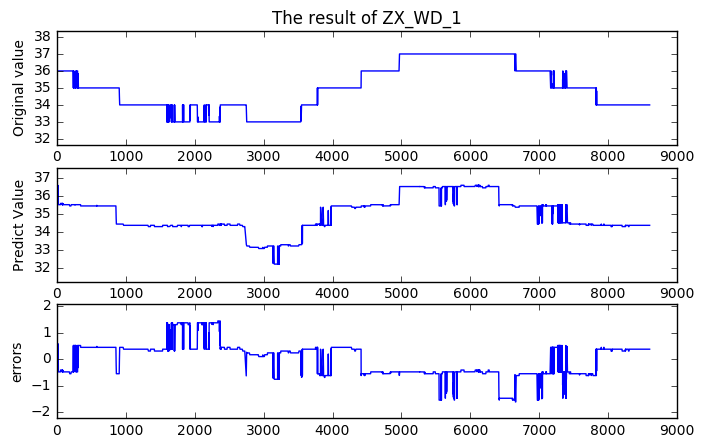

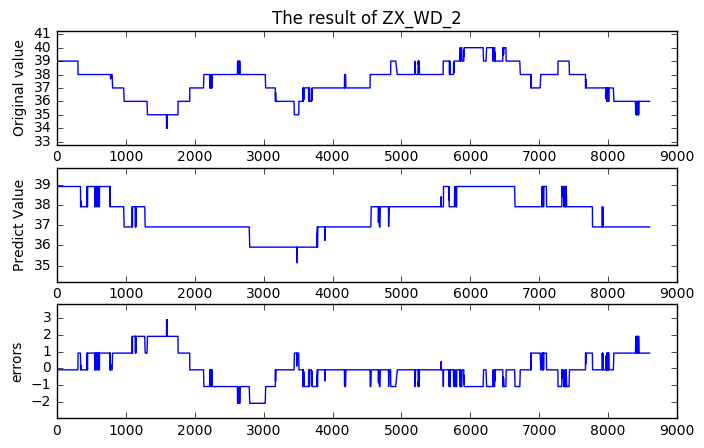

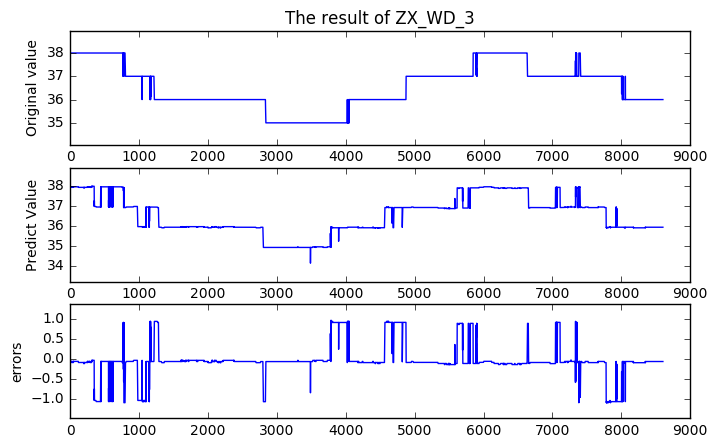

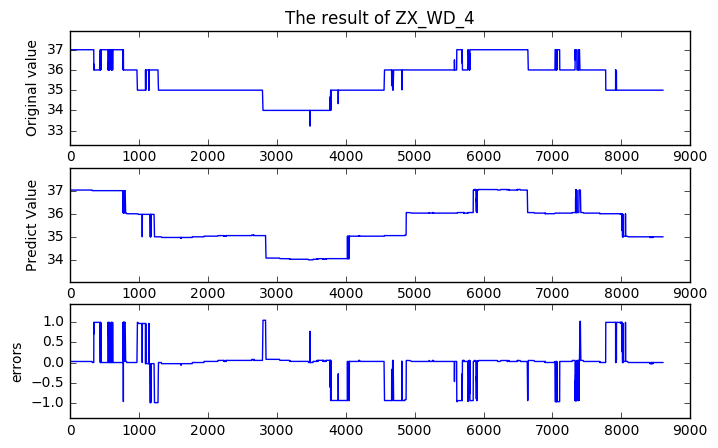

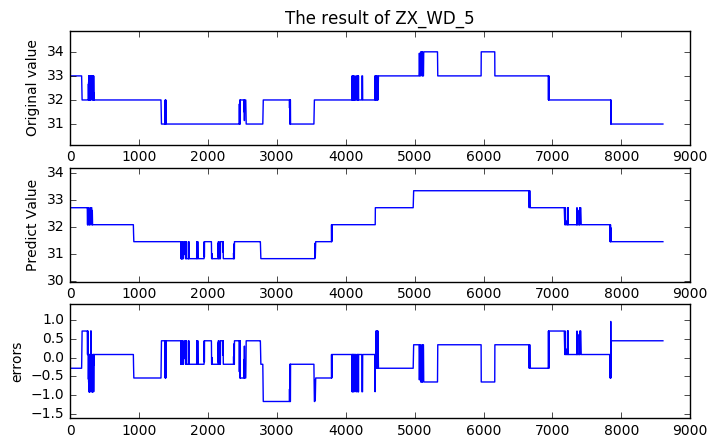

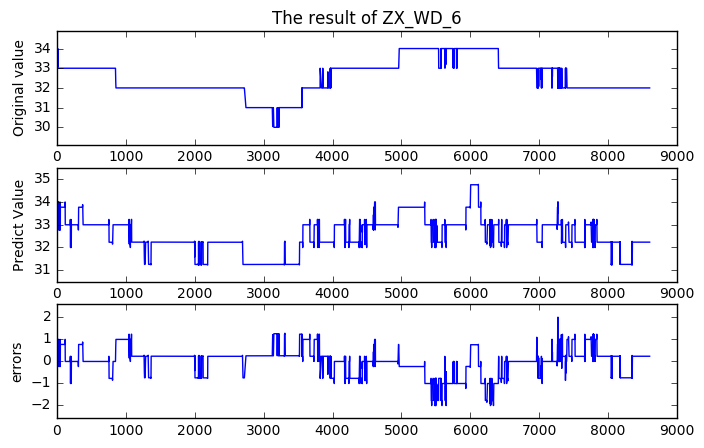

In [17]:
compare_plot_delay_no_center_deap([1,1,1,0,0,0],data,time_delay_1,deap_result_delay_1)

In [ ]:
time_delay_1 = np.arange(16)
print(time_delay_1)
print(len(time_delay_1))
deap_result_delay_1 = learn_delay_deap(data,time_delay_1)
result_summary_gp(deap_result_delay_1,varnames[0:var_num_learn])

[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15]
16
-------------------------learn ZX_WD_1------------
----------prepare_data_delay_deap------------------
del the target variable ZX_WD_1_dt0
number of variable: 207
the shape of X
(8604, 207)
the shape of y
(8604,)


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


gen	evals	min                      	max        	diversity
0  	1827 	[ 0.87153756  2.        ]	[ inf  24.]	1748     


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


1  	2000 	[ 0.08288259  1.        ]	[ inf   4.]	1969     


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


2  	2000 	[ 0.08288259  1.        ]	[  1.93409460e+09   5.00000000e+00]	1992     


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


3  	2000 	[ 0.08288259  1.        ]	[ 698.55963427    5.        ]      	1991     


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


4  	2000 	[ 0.08288259  1.        ]	[ 599.02266789    4.        ]      	1987     


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


5  	2000 	[ 0.08288259  1.        ]	[ 599.02266789    4.        ]      	1996     
6  	2000 	[ 0.08288259  1.        ]	[ 599.02266789    9.        ]      	1994     
7  	2000 	[ 0.08288259  1.        ]	[ 599.02266789   14.        ]      	1990     
8  	2000 	[ 0.08288259  1.        ]	[ 599.02266789   12.        ]      	1989     
9  	2000 	[ 0.08288259  1.        ]	[ 599.02266789   12.        ]      	1987     


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


10 	2000 	[ 0.08288259  1.        ]	[ inf   4.]                        	1974     
11 	2000 	[ 0.08288259  1.        ]	[ 599.02266789   10.        ]      	1974     


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


12 	2000 	[ 0.08288259  1.        ]	[ 599.02266789    9.        ]      	1971     
13 	2000 	[ 0.08288259  1.        ]	[ 599.02266789   10.        ]      	1964     
14 	2000 	[ 0.08288259  1.        ]	[ 599.02266789   12.        ]      	1960     
15 	2000 	[ 0.08288259  1.        ]	[ 599.02266789   12.        ]      	1956     
16 	2000 	[ 0.08288259  1.        ]	[ 599.02266789   13.        ]      	1949     


----------prepare_data_delay_deap------------------
del the target variable ZX_WD_1_dt0
number of variable: 207
the shape of X
(8604, 207)
the shape of y
(8604,)
sqrt(ZX_WD_1_dt1*ZX_WD_1_dt3)
----------prepare_data_delay_deap------------------
del the target variable ZX_WD_2_dt0
number of variable: 207
the shape of X
(8604, 207)
the shape of y
(8604,)
sqrt(ZX_WD_2_dt1*ZX_WD_2_dt2)
----------prepare_data_delay_deap------------------
del the target variable ZX_WD_3_dt0
number of variable: 207
the shape of X
(8604, 207)
the shape of y
(8604,)
ZX_WD_3_dt1 - log(ZX_WD_3_dt3/ZX_WD_3_dt9)
----------prepare_data_delay_deap------------------
del the target variable ZX_WD_4_dt0
number of variable: 207
the shape of X
(8604, 207)
the shape of y
(8604,)
sqrt(ZX_WD_4_dt1*ZX_WD_4_dt2)
----------prepare_data_delay_deap------------------
del the target variable ZX_WD_5_dt0
number of variable: 207
the shape of X
(8604, 207)
the shape of y
(8604,)
sqrt(ZX_WD_5_dt1*ZX_WD_5_dt3)
----------prepare_data_dela

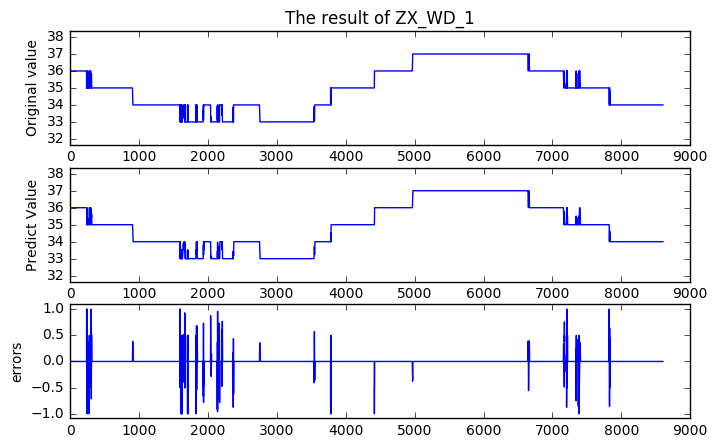

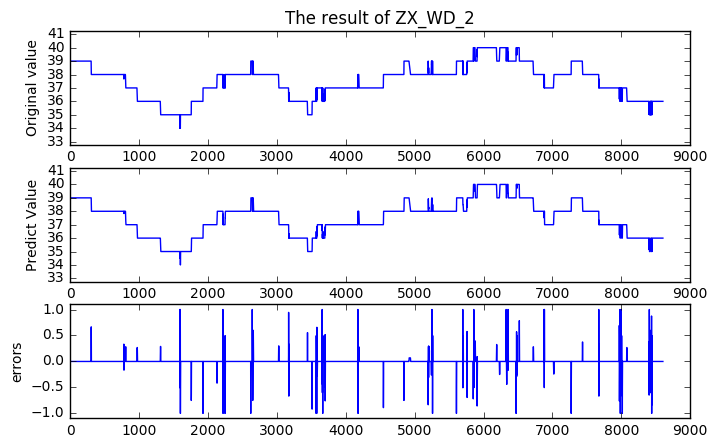

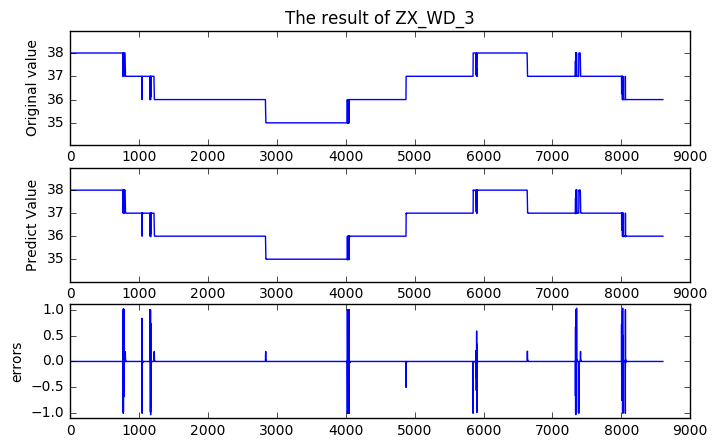

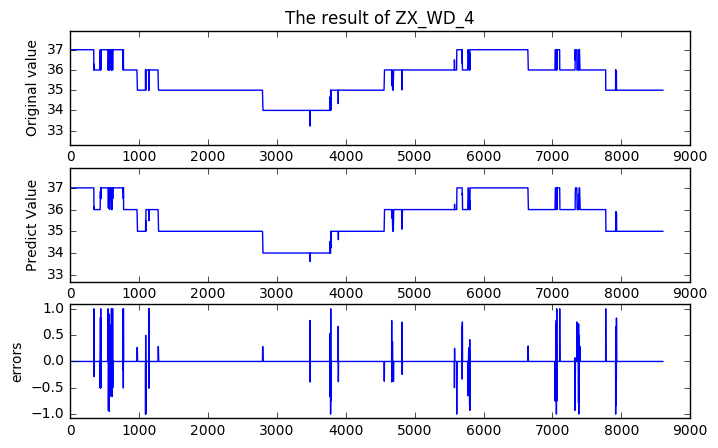

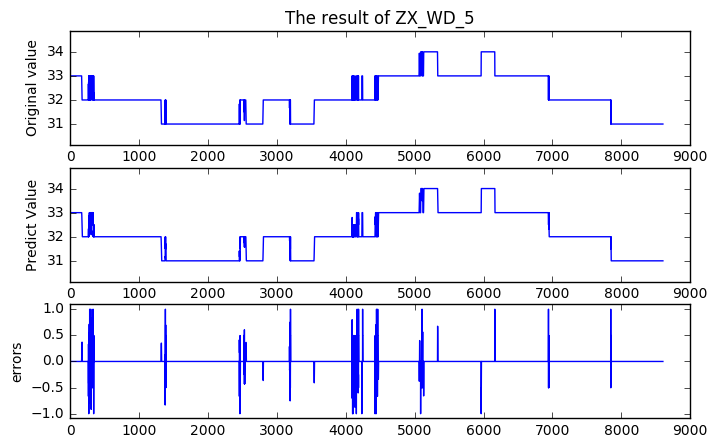

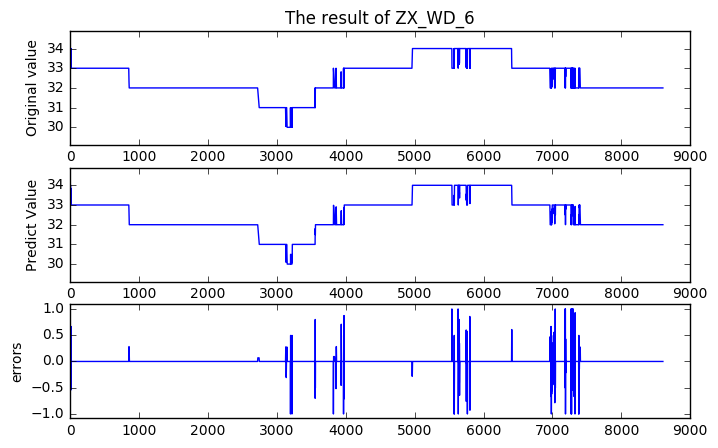

In [261]:
compare_plot_delay_deap([1,1,1,0,0,0],data,time_delay_1,deap_result_delay_1)

-------------------------learn ZX_WD_1------------
----------prepare_data_delay_deap------------------
del the target variable ZX_WD_1_dt0
number of variable: 207
the shape of X
(8604, 207)
the shape of y
(8604,)


/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:36: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:37: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:38: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:39: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


gen	evals	min                      	max        	diversity
0  	489  	[ 1.30710075  2.        ]	[ inf  22.]	476      
1  	500  	[ 0.12662748  1.        ]	[ 591.40033519   19.        ]	494      
2  	500  	[ 0.11143846  1.        ]	[ 591.40091426   19.        ]	499      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


3  	500  	[ 0.11143846  1.        ]	[ 591.40091916    4.        ]	499      
4  	500  	[ 0.11143846  1.        ]	[ 591.40091916    8.        ]	500      
5  	500  	[ 0.11143846  1.        ]	[ 591.40091916    8.        ]	500      
6  	500  	[ 0.11143846  1.        ]	[ 591.40091916    9.        ]	500      
7  	500  	[ 0.11143846  1.        ]	[ 591.40091916   10.        ]	500      
8  	500  	[ 0.11143846  1.        ]	[ 591.40072225   10.        ]	500      
9  	500  	[ 0.11143846  1.        ]	[ 425.98307619   16.        ]	500      
10 	500  	[ 0.11143846  1.        ]	[ 417.3254011   16.       ]  	500      
11 	500  	[ 0.11143846  1.        ]	[ 32.5571261  13.       ]    	500      
12 	500  	[ 0.11143846  1.        ]	[ 32.55282269  13.        ]  	500      
13 	500  	[ 0.11143846  1.        ]	[ 32.54077683  15.        ]  	500      
14 	500  	[ 0.11143846  1.        ]	[ 29.55602437  12.        ]  	500      
15 	500  	[ 0.11143846  1.        ]	[ 29.55526508  14.        ]  	499      
16 	500  	[ 

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


25 	500  	[ 0.11143846  1.        ]	[  2.26941986  13.        ]  	493      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


26 	500  	[ 0.11143846  1.        ]	[ 2.50516636  9.        ]    	491      
27 	500  	[ 0.11143846  1.        ]	[  2.26869958  13.        ]  	491      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


28 	500  	[ 0.11143846  1.        ]	[  2.07015754  10.        ]  	489      
29 	500  	[ 0.11143846  1.        ]	[  2.06848134  15.        ]  	482      
30 	500  	[ 0.11143846  1.        ]	[  2.06768775  14.        ]  	480      
31 	500  	[ 0.11143846  1.        ]	[  2.05665577  14.        ]  	481      
32 	500  	[ 0.11143846  1.        ]	[  2.05557659  16.        ]  	478      
33 	500  	[ 0.11143846  1.        ]	[  2.05482952  19.        ]  	468      
34 	500  	[ 0.11143846  1.        ]	[  2.05416336  19.        ]  	451      
35 	500  	[ 0.11143846  1.        ]	[  2.05348128  16.        ]  	437      
36 	500  	[ 0.11143846  1.        ]	[  2.05416336  16.        ]  	446      
37 	500  	[ 0.11143846  1.        ]	[  2.05348128  16.        ]  	444      
38 	500  	[ 0.11143846  1.        ]	[  2.0529127  19.       ]    	425      
39 	500  	[ 0.11143846  1.        ]	[  2.04949791  19.        ]  	404      
40 	500  	[ 0.11143846  1.        ]	[  1.31403682  19.        ]  	368      
41 	500  	[ 

/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:36: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:37: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:38: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:39: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


gen	evals	min                      	max        	diversity
0  	489  	[ 1.34580497  2.        ]	[ inf  22.]	476      
1  	500  	[ 0.13039139  1.        ]	[ 588.54599684   18.        ]	496      
2  	500  	[ 0.08834546  1.        ]	[ 588.54612906   18.        ]	497      
3  	500  	[ 0.08834546  1.        ]	[ 588.54612906   21.        ]	496      
4  	500  	[ 0.08834546  1.        ]	[ 588.54605028   21.        ]	494      
5  	500  	[ 0.08834546  1.        ]	[ 588.54561923   21.        ]	493      
6  	500  	[ 0.08834546  1.        ]	[ 588.5450248   21.       ]  	491      
7  	500  	[ 0.08834546  1.        ]	[ 414.6069474   21.       ]  	489      
8  	500  	[ 0.08834546  1.        ]	[ 35.30552146  20.        ]  	486      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


9  	500  	[ 0.08834546  1.        ]	[ 32.43032856   9.        ]  	488      
10 	500  	[ 0.08834546  1.        ]	[  5.45964488  12.        ]  	484      
11 	500  	[ 0.08834546  1.        ]	[ 27.04573455  14.        ]  	475      
12 	500  	[ 0.08834546  1.        ]	[  5.45982327  14.        ]  	469      
13 	500  	[ 0.08834546  1.        ]	[  5.07600167  14.        ]  	461      
14 	500  	[ 0.08834546  1.        ]	[  5.07443753  18.        ]  	448      
15 	500  	[ 0.08834546  1.        ]	[  5.07521966  18.        ]  	470      
16 	500  	[ 0.08834546  1.        ]	[  5.07169912  18.        ]  	452      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


17 	500  	[ 0.08834546  1.        ]	[  5.46059746  11.        ]  	455      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


18 	500  	[ 0.08834546  1.        ]	[ 423.27269942    6.        ]	493      
19 	500  	[ 0.08834546  1.        ]	[ 35.30552146  11.        ]  	494      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


20 	500  	[ 0.08834546  1.        ]	[ 32.42989644  11.        ]  	493      
21 	500  	[ 0.08834546  1.        ]	[ 32.42420007  11.        ]  	492      
22 	500  	[ 0.08834546  1.        ]	[  5.4610012  11.       ]    	490      
23 	500  	[ 0.08834546  1.        ]	[  5.46010486  11.        ]  	489      
24 	500  	[ 0.08834546  1.        ]	[  5.4593696  14.       ]    	490      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


25 	500  	[ 0.08834546  1.        ]	[ 32.4285916   6.       ]    	490      
26 	500  	[ 0.08834546  1.        ]	[  5.46059746  10.        ]  	487      
27 	500  	[ 0.08834546  1.        ]	[  5.45951061  12.        ]  	487      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


28 	500  	[ 0.08834546  1.        ]	[ 5.07561068  8.        ]    	484      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


29 	500  	[ 0.08834546  1.        ]	[ 5.4593696  6.       ]      	484      
30 	500  	[ 0.08834546  1.        ]	[ 5.45973362  9.        ]    	483      
31 	500  	[ 0.08834546  1.        ]	[  5.4593696  12.       ]    	480      
32 	500  	[ 0.08834462  1.        ]	[  5.07561068  12.        ]  	479      
33 	500  	[ 0.08834462  1.        ]	[  5.07521966  12.        ]  	481      
34 	500  	[ 0.08834462  1.        ]	[  5.07404642  14.        ]  	479      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


35 	500  	[ 0.08834462  1.        ]	[ 32.41739414   6.        ]  	477      
36 	500  	[ 0.08834462  1.        ]	[  5.45982327  10.        ]  	476      
37 	500  	[ 0.08834462  1.        ]	[  5.07404642  10.        ]  	471      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


38 	500  	[ 0.08831086  1.        ]	[ 5.07561068  6.        ]    	469      
39 	500  	[ 0.08831086  1.        ]	[  5.0732641  10.       ]    	461      
40 	500  	[ 0.08831086  1.        ]	[  5.0732641  10.       ]    	461      
41 	500  	[ 0.08831086  1.        ]	[  5.0732641  10.       ]    	462      
42 	500  	[ 0.08831086  1.        ]	[  5.07248167  10.        ]  	459      
43 	500  	[ 0.08831086  1.        ]	[  5.07209041  10.        ]  	459      
44 	500  	[ 0.08831086  1.        ]	[  5.07169912  10.        ]  	458      
45 	500  	[ 0.08831086  1.        ]	[  5.0713078  14.       ]    	458      
46 	500  	[ 0.08831086  1.        ]	[  5.0713078  14.       ]    	463      
47 	500  	[ 0.08831086  1.        ]	[  5.04916926  15.        ]  	461      
48 	500  	[ 0.08831086  1.        ]	[  5.04759938  15.        ]  	461      
49 	500  	[ 0.08831086  1.        ]	[  5.04598631  16.        ]  	458      
--------------------end----------------------------
-------------------------learn ZX_WD

/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:36: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:37: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:38: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:39: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


gen	evals	min                      	max        	diversity
0  	489  	[ 0.66698591  2.        ]	[ inf  22.]	476      
1  	500  	[ 0.08257873  1.        ]	[ 589.31125536   18.        ]	497      
2  	500  	[ 0.07118395  1.        ]	[ 589.31125536   18.        ]	499      
3  	500  	[ 0.07118395  1.        ]	[ 589.31125536   18.        ]	500      
4  	500  	[ 0.07118395  1.        ]	[ 589.31105404   18.        ]	500      
5  	500  	[ 0.07118395  1.        ]	[ 424.07842962   18.        ]	499      
6  	500  	[ 0.07118395  1.        ]	[ 423.94082862   18.        ]	500      
7  	500  	[ 0.07118395  1.        ]	[ 415.22847748   18.        ]	498      
8  	500  	[ 0.07118395  1.        ]	[ 31.60667391  14.        ]  	497      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


9  	500  	[ 0.07118395  1.        ]	[ 31.60339769  11.        ]  	495      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


10 	500  	[ 0.07118395  1.        ]	[ 34.53572366   7.        ]  	495      
11 	500  	[ 0.07118395  1.        ]	[ 31.60499686  11.        ]  	496      
12 	500  	[ 0.07118395  1.        ]	[ 31.60499686  12.        ]  	494      
13 	500  	[ 0.07118395  1.        ]	[  4.62919537  14.        ]  	493      
14 	500  	[ 0.07118395  1.        ]	[  4.62753066  14.        ]  	492      
15 	500  	[ 0.07118395  1.        ]	[  4.62725315  15.        ]  	492      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


16 	500  	[ 0.07118395  1.        ]	[ 31.60704674   7.        ]  	491      
17 	500  	[ 0.07118395  1.        ]	[ 31.60348795  10.        ]  	490      
18 	500  	[ 0.07118395  1.        ]	[  4.62836309  11.        ]  	490      
19 	500  	[ 0.07118395  1.        ]	[  4.1781113  11.       ]    	488      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


20 	500  	[ 0.07118395  1.        ]	[ 4.62753066  7.        ]    	488      
21 	500  	[ 0.07118137  1.        ]	[ 4.17685376  9.        ]    	484      
22 	500  	[ 0.07118137  1.        ]	[  4.14369454  12.        ]  	477      
23 	500  	[ 0.07118137  1.        ]	[  4.1416825  12.       ]    	470      
24 	500  	[ 0.07118137  1.        ]	[  4.13970896  11.        ]  	464      
25 	500  	[ 0.07118137  1.        ]	[  4.13700085  12.        ]  	456      
26 	500  	[ 0.07118137  1.        ]	[  2.47037256  14.        ]  	445      
27 	500  	[ 0.07118137  1.        ]	[  2.46639984  14.        ]  	424      
28 	500  	[ 0.07118137  1.        ]	[  2.45946453  17.        ]  	397      
29 	500  	[ 0.07118137  1.        ]	[  2.26684637  17.        ]  	368      
30 	500  	[ 0.07118137  1.        ]	[  2.26457927  17.        ]  	343      
31 	500  	[ 0.07118137  1.        ]	[  2.26401214  17.        ]  	349      
32 	500  	[ 0.07118137  1.        ]	[  2.2623099  17.       ]    	336      
33 	500  	[ 

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


43 	500  	[ 0.07115947  1.        ]	[ inf   8.]                  	364      
44 	500  	[ 0.07115947  1.        ]	[  4.1781113  15.       ]    	342      
45 	500  	[ 0.07115947  1.        ]	[  2.46639984  17.        ]  	307      
46 	500  	[ 0.07102669  1.        ]	[  2.26457927  17.        ]  	268      
47 	500  	[ 0.07083198  1.        ]	[  1.42840576  17.        ]  	245      
48 	500  	[ 0.07083198  1.        ]	[  1.42791531  12.        ]  	228      
49 	500  	[ 0.07083198  1.        ]	[  2.2657131  13.       ]    	243      
--------------------end----------------------------
-------------------------learn ZX_WD_4------------
----------prepare_data_delay_deap------------------
del the target variable ZX_WD_4_dt0
number of variable: 207
the shape of X
(8604, 207)
the shape of y
(8604,)


/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:36: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:37: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:38: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:39: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


gen	evals	min                      	max        	diversity
0  	489  	[ 0.13211584  2.        ]	[ inf  22.]	476      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


1  	500  	[ 0.10127244  1.        ]	[ 590.29220918   10.        ]	494      
2  	500  	[ 0.10127244  1.        ]	[ 590.29226081   13.        ]	499      
3  	500  	[ 0.10127244  1.        ]	[ 590.29226081   14.        ]	500      
4  	500  	[ 0.08890007  1.        ]	[ 590.29226081   14.        ]	500      
5  	500  	[ 0.08890007  1.        ]	[ 590.29205007   16.        ]	498      
6  	500  	[ 0.08890007  1.        ]	[ 425.00742044   14.        ]	498      
7  	500  	[ 0.08890007  1.        ]	[ 424.88263112   14.        ]	497      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


8  	500  	[ 0.08890007  1.        ]	[ 416.17219898    9.        ]	499      
9  	500  	[ 0.08890007  1.        ]	[ 33.59997311  11.        ]  	499      
10 	500  	[ 0.08890007  1.        ]	[ 30.63581536  15.        ]  	499      
11 	500  	[ 0.08890007  1.        ]	[ 30.62953246  16.        ]  	498      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


12 	500  	[ 0.08890007  1.        ]	[ 416.18865962    6.        ]	498      
13 	500  	[ 0.08890007  1.        ]	[ 30.63853163  11.        ]  	497      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


14 	500  	[ 0.08890007  1.        ]	[ 30.6342411   6.       ]    	497      
15 	500  	[ 0.08890007  1.        ]	[ 30.63021054   9.        ]  	495      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


16 	500  	[ 0.08890007  1.        ]	[ 30.62953246   7.        ]  	493      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


17 	500  	[ 0.08890007  1.        ]	[ 30.63021054   6.        ]  	491      
18 	500  	[ 0.08890007  1.        ]	[ 30.62980662  14.        ]  	491      
19 	500  	[ 0.08890007  1.        ]	[  3.63853249  14.        ]  	487      
20 	500  	[ 0.08890007  1.        ]	[  3.63679951  15.        ]  	488      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


21 	500  	[ 0.08890007  1.        ]	[  3.18126117  10.        ]  	485      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


22 	500  	[ 0.08890007  1.        ]	[ 3.63782656  6.        ]    	474      
23 	500  	[ 0.08890007  1.        ]	[ 3.18045375  8.        ]    	472      
24 	500  	[ 0.08890007  1.        ]	[  3.17883829  11.        ]  	463      
25 	500  	[ 0.08890007  1.        ]	[  3.17883829  12.        ]  	462      
26 	500  	[ 0.08890007  1.        ]	[  3.17722201  12.        ]  	458      
27 	500  	[ 0.08890007  1.        ]	[  3.16222881  14.        ]  	451      
28 	500  	[ 0.08890007  1.        ]	[  3.15561222  16.        ]  	440      
29 	500  	[ 0.08890007  1.        ]	[  2.14576145  16.        ]  	435      
30 	500  	[ 0.08890007  1.        ]	[  2.14489079  17.        ]  	440      
31 	500  	[ 0.08890007  1.        ]	[  3.15428468  17.        ]  	469      
32 	500  	[ 0.08890007  1.        ]	[  2.14619665  17.        ]  	472      
33 	500  	[ 0.08890007  1.        ]	[  2.14227887  19.        ]  	465      
34 	500  	[ 0.08890007  1.        ]	[  2.14489079  17.        ]  	460      
35 	500  	[ 

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


37 	500  	[ 0.08889621  1.        ]	[  1.54191921  15.        ]  	428      
38 	500  	[ 0.08889621  1.        ]	[  2.14063356  18.        ]  	434      
39 	500  	[ 0.08889032  1.        ]	[  2.14314841  22.        ]  	442      
40 	500  	[ 0.08885638  1.        ]	[  1.54720227  22.        ]  	431      
41 	500  	[ 0.08885352  1.        ]	[  1.54293354  23.        ]  	413      
42 	500  	[ 0.08885352  1.        ]	[  2.14063356  24.        ]  	388      
43 	500  	[ 0.08885352  1.        ]	[  2.14401977  25.        ]  	374      
44 	500  	[ 0.08869059  1.        ]	[  1.54002501  23.        ]  	331      
45 	500  	[ 0.08869059  1.        ]	[  1.54941971  23.        ]  	326      
46 	500  	[ 0.08869059  1.        ]	[  2.14143134  28.        ]  	369      
47 	500  	[ 0.08869059  1.        ]	[  1.54941971  28.        ]  	416      
48 	500  	[ 0.08869059  1.        ]	[  2.14576145  28.        ]  	451      
49 	500  	[ 0.08869059  1.        ]	[  2.14314841  28.        ]  	460      
------------

/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:36: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:37: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:38: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:39: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


gen	evals	min                      	max        	diversity
0  	489  	[ 0.17737888  2.        ]	[ inf  22.]	476      
1  	500  	[ 0.15371015  1.        ]	[ 593.82971555   21.        ]	491      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


2  	500  	[ 0.11336575  1.        ]	[ 593.82994645    4.        ]	498      
3  	500  	[ 0.11336575  1.        ]	[ 593.82994645    7.        ]	500      
4  	500  	[ 0.11336575  1.        ]	[ 593.82994645   10.        ]	500      
5  	500  	[ 0.11336575  1.        ]	[ 593.82994645   10.        ]	500      
6  	500  	[ 0.11336575  1.        ]	[ 593.82994645   11.        ]	500      
7  	500  	[ 0.11336575  1.        ]	[ 593.82994645   12.        ]	499      
8  	500  	[ 0.11336575  1.        ]	[ 593.82960308   12.        ]	498      
9  	500  	[ 0.11336575  1.        ]	[ 428.47672549   13.        ]	498      
10 	500  	[ 0.11336575  1.        ]	[ 419.8136855   14.       ]  	497      
11 	500  	[ 0.11336575  1.        ]	[ 30.33199528  15.        ]  	497      
12 	500  	[ 0.11336575  1.        ]	[ 30.32436687  16.        ]  	497      
13 	500  	[ 0.11336575  1.        ]	[  5.46629188  18.        ]  	497      
14 	500  	[ 0.11336575  1.        ]	[  5.4622188  16.       ]    	493      
15 	500  	[ 

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


22 	500  	[ 0.11336575  1.        ]	[ 30.3139816   8.       ]    	490      
23 	500  	[ 0.11336575  1.        ]	[  5.46147313  10.        ]  	487      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


24 	500  	[ 0.11336575  1.        ]	[ 30.66255734   6.        ]  	483      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


25 	500  	[ 0.11336575  1.        ]	[ 27.23607109   8.        ]  	481      
26 	500  	[ 0.11336575  1.        ]	[ 4.6360245  9.       ]      	480      
27 	500  	[ 0.11336575  1.        ]	[  4.63199376  12.        ]  	479      
28 	500  	[ 0.11336575  1.        ]	[  4.63098552  12.        ]  	476      
29 	500  	[ 0.11336575  1.        ]	[  4.62997707  12.        ]  	475      
30 	500  	[ 0.11336542  1.        ]	[  3.6482038  13.       ]    	473      
31 	500  	[ 0.11336496  1.        ]	[  3.64615526  12.        ]  	471      
32 	500  	[ 0.11336496  1.        ]	[  3.6451288  16.       ]    	471      
33 	500  	[ 0.11336496  1.        ]	[  3.64245561  16.        ]  	471      
34 	500  	[ 0.11336463  1.        ]	[  3.64408623  14.        ]  	480      
35 	500  	[ 0.11336463  1.        ]	[  3.64245561  13.        ]  	483      
36 	500  	[ 0.11336328  1.        ]	[  2.58007582  14.        ]  	482      
37 	500  	[ 0.11336328  1.        ]	[  2.57428629  15.        ]  	479      
38 	500  	[ 

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


48 	500  	[ 0.11331274  1.        ]	[  2.51257768  17.        ]  	460      
49 	500  	[ 0.11331274  1.        ]	[  2.51344483  17.        ]  	467      
--------------------end----------------------------
-------------------------learn ZX_WD_6------------
----------prepare_data_delay_deap------------------
del the target variable ZX_WD_6_dt0
number of variable: 207
the shape of X
(8604, 207)
the shape of y
(8604,)


/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:36: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:37: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:38: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:39: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


gen	evals	min                      	max        	diversity
0  	489  	[ 0.80877035  2.        ]	[ inf  22.]	476      
1  	500  	[ 0.06021161  1.        ]	[ 593.38646173   19.        ]	492      
2  	500  	[ 0.06021161  1.        ]	[ 593.38646173   19.        ]	491      
3  	500  	[ 0.06021161  1.        ]	[ 593.3864871   19.       ]  	491      
4  	500  	[ 0.06021161  1.        ]	[ 593.38649203   19.        ]	490      
5  	500  	[ 0.06021161  1.        ]	[ 593.38629548   19.        ]	486      
6  	500  	[ 0.06021161  1.        ]	[ 428.08011708   19.        ]	486      
7  	500  	[ 0.06021161  1.        ]	[ 419.22959096   19.        ]	484      
8  	500  	[ 0.06021161  1.        ]	[ 30.66219236  20.        ]  	483      
9  	500  	[ 0.06021161  1.        ]	[ 27.59264117  31.        ]  	480      
10 	500  	[ 0.06021161  1.        ]	[  5.08376923  13.        ]  	477      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


11 	500  	[ 0.06021161  1.        ]	[ 27.59701547   7.        ]  	477      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


12 	500  	[ 0.06021161  1.        ]	[ 30.65481082   6.        ]  	476      
13 	500  	[ 0.06021161  1.        ]	[ 27.5937916  10.       ]    	476      
14 	500  	[ 0.06021161  1.        ]	[ 27.58973923  10.        ]  	475      
15 	500  	[ 0.06021161  1.        ]	[  5.08257499  13.        ]  	473      
16 	500  	[ 0.06021161  1.        ]	[  5.08138048  12.        ]  	471      
17 	500  	[ 0.06021161  1.        ]	[  5.07958817  12.        ]  	475      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


18 	500  	[ 0.06021161  1.        ]	[  5.07779524  12.        ]  	472      
19 	500  	[ 0.06021161  1.        ]	[  4.18902198  12.        ]  	472      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


20 	500  	[ 0.06021161  1.        ]	[ 5.07958817  8.        ]    	470      
21 	500  	[ 0.06021161  1.        ]	[  5.07719745  10.        ]  	466      
22 	500  	[ 0.06021161  1.        ]	[  4.190248  11.      ]      	465      
23 	500  	[ 0.06021161  1.        ]	[  4.18902198  13.        ]  	463      
24 	500  	[ 0.06021161  1.        ]	[  4.18902198  14.        ]  	457      
25 	500  	[ 0.06021161  1.        ]	[  4.1877956  14.       ]    	448      
26 	500  	[ 0.06021161  1.        ]	[  4.1877956  16.       ]    	444      
27 	500  	[ 0.06021161  1.        ]	[  4.18534176  16.        ]  	446      
28 	500  	[ 0.06021161  1.        ]	[  4.18288648  15.        ]  	446      
29 	500  	[ 0.06021161  1.        ]	[  3.18910452  15.        ]  	441      
30 	500  	[ 0.06021161  1.        ]	[  3.185002  18.      ]      	437      
31 	500  	[ 0.06021161  1.        ]	[  3.18206839  15.        ]  	428      
32 	500  	[ 0.06021161  1.        ]	[  2.07465936  21.        ]  	419      
33 	500  	[ 

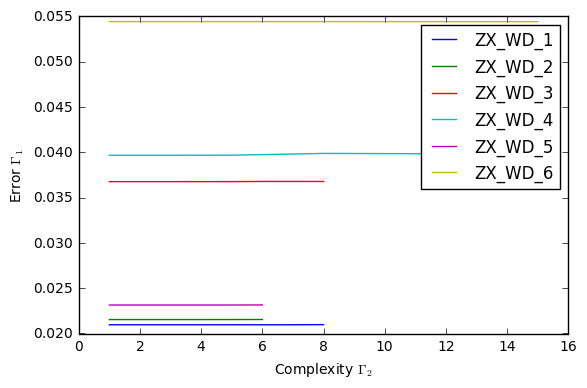

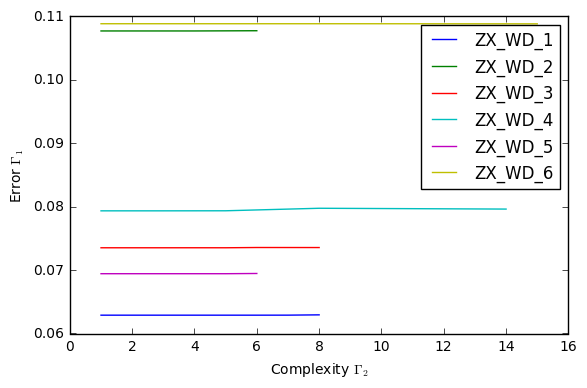

In [225]:
result_delay_deap2 = learn_delay_deap2(data,time_delay_1)
result_summary_gp(result_delay_deap2,varnames[0:var_num_learn])

----------prepare_data_delay_deap------------------
del the target variable ZX_WD_1_dt0
number of variable: 207
the shape of X
(8604, 207)
the shape of y
(8604,)
ZX_WD_1_dt1 + 0.010999999999999999*sin(ZD_SPEED_dt7/ZX_HW_2_dt3)
----------prepare_data_delay_deap------------------
del the target variable ZX_WD_2_dt0
number of variable: 207
the shape of X
(8604, 207)
the shape of y
(8604,)
ZX_WD_2_dt1 + log(ZX_WD_3_dt7/ZX_WD_3_dt8)
----------prepare_data_delay_deap------------------
del the target variable ZX_WD_3_dt0
number of variable: 207
the shape of X
(8604, 207)
the shape of y
(8604,)
ZX_WD_3_dt1 + ZD_SPEED_dt9*exp(-ZD_LCG_dt13)/ZD_LLJ_dt4
----------prepare_data_delay_deap------------------
del the target variable ZX_WD_4_dt0
number of variable: 207
the shape of X
(8604, 207)
the shape of y
(8604,)
1.0*ZX_WD_4_dt1 + 0.001/cos(ZX_WD_3_dt8*(sin(ZX_WD_1_dt12) - cos(ZX_WD_4_dt12))/ZX_WD_4_dt14)
----------prepare_data_delay_deap------------------
del the target variable ZX_WD_5_dt0
number

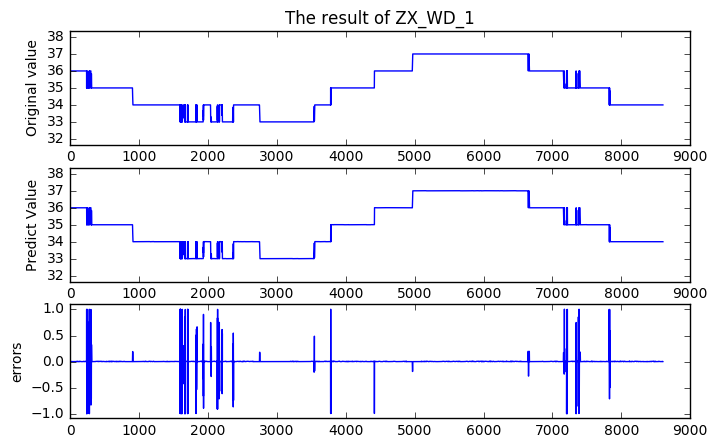

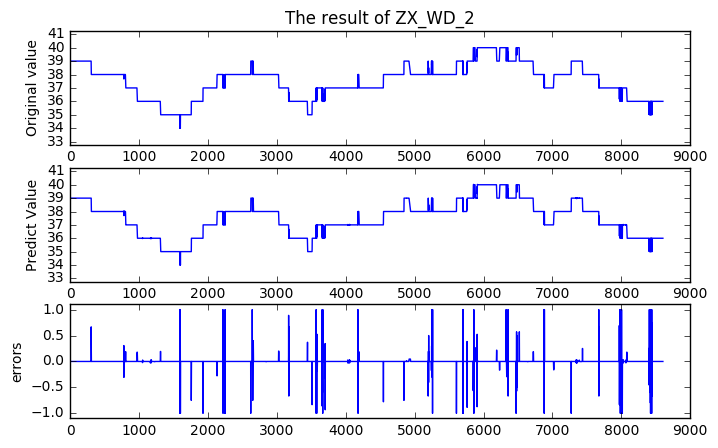

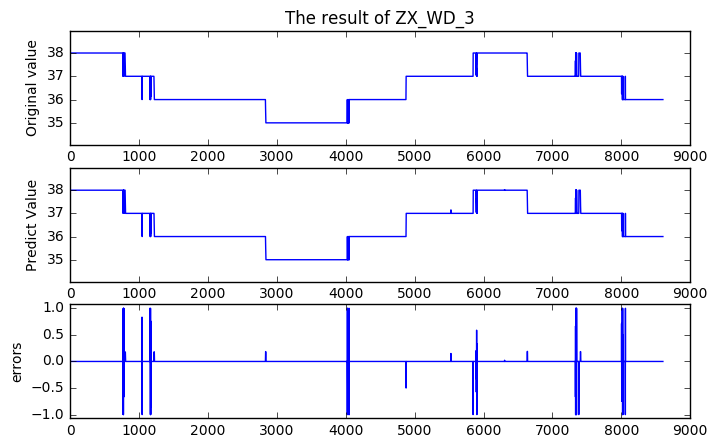

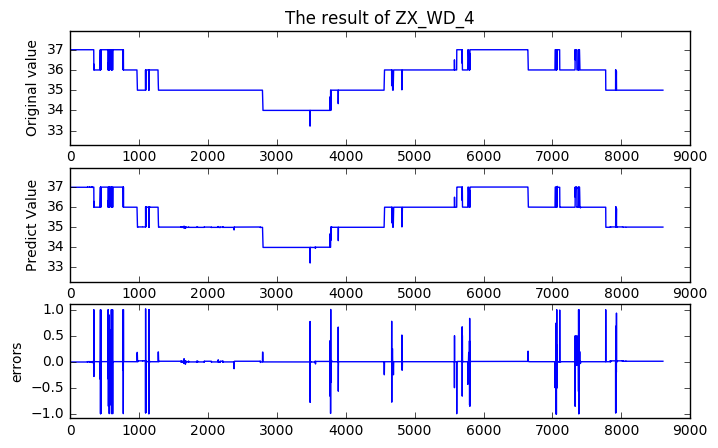

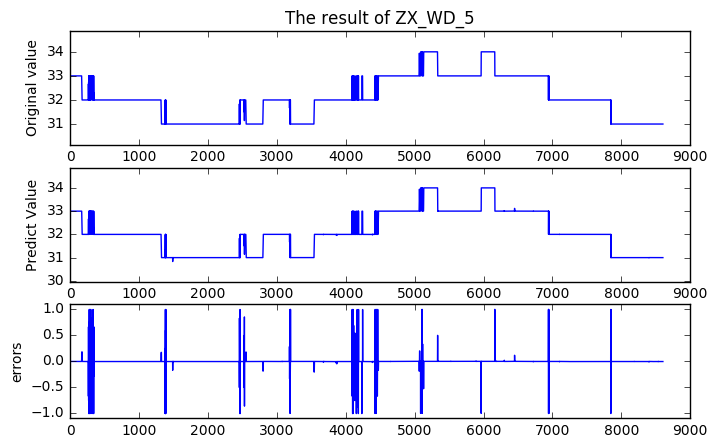

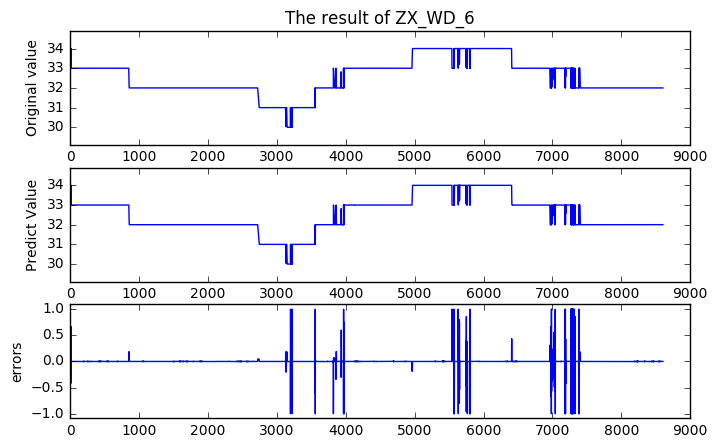

In [226]:
compare_plot_delay_deap([0,0,0,0,0,0],data,time_delay_1,result_delay_deap2)

[  0 100 200 300 400 500 600 700 800 900]
10
-------------------------learn ZX_WD_1------------
----------prepare_data_delay_deap------------------
del the target variable ZX_WD_1_dt0
number of variable: 129
the shape of X
(7719, 129)
the shape of y
(7719,)


/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:36: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:37: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:38: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:39: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


gen	evals	min                      	max        	diversity
0  	484  	[ 1.02359538  2.        ]	[ inf  24.]	471      
1  	500  	[ 0.50706568  1.        ]	[ 987.3304356    5.       ]	498      
2  	500  	[ 0.50706568  1.        ]	[ 586.90938378   11.        ]	499      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


3  	500  	[ 0.50706568  1.        ]	[ 586.90938378    5.        ]	498      
4  	500  	[ 0.50706568  1.        ]	[ 586.90938378    8.        ]	500      
5  	500  	[ 0.50706568  1.        ]	[ 586.90938378    9.        ]	500      
6  	500  	[ 0.50706568  1.        ]	[ 586.90938378    9.        ]	500      
7  	500  	[ 0.50706568  1.        ]	[ 586.90938378   10.        ]	500      
8  	500  	[ 0.50706568  1.        ]	[ 586.90938378   11.        ]	499      
9  	500  	[ 0.50706568  1.        ]	[ 586.90938378   11.        ]	498      
10 	500  	[ 0.50706568  1.        ]	[ 420.51368882   14.        ]	496      
11 	500  	[ 0.50706568  1.        ]	[ 415.30140961   14.        ]	493      
12 	500  	[ 0.50706568  1.        ]	[ 415.30140961   15.        ]	491      
13 	500  	[ 0.50706568  1.        ]	[ 410.96750247   17.        ]	490      
14 	500  	[ 0.50706568  1.        ]	[ 410.6806624   17.       ]  	489      
15 	500  	[ 0.50706568  1.        ]	[ 409.59435813   14.        ]	489      
16 	500  	[ 

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


19 	500  	[ 0.50705813  1.        ]	[ 410.92549156   11.        ]	478      
20 	500  	[ 0.50705813  1.        ]	[ 408.76526019   11.        ]	475      
21 	500  	[ 0.50705813  1.        ]	[ 408.41936403   11.        ]	472      
22 	500  	[ 0.50705813  1.        ]	[ 32.39072659  13.        ]  	470      
23 	500  	[ 0.50705813  1.        ]	[ 32.32450169  14.        ]  	466      
24 	500  	[ 0.50702944  1.        ]	[ 29.56709276  16.        ]  	468      
25 	500  	[ 0.50649757  1.        ]	[ 29.41178335  19.        ]  	470      
26 	500  	[ 0.50649757  1.        ]	[  3.42518982  19.        ]  	476      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


27 	500  	[ 0.50649757  1.        ]	[ 32.28611374   9.        ]  	476      
28 	500  	[ 0.50649757  1.        ]	[ 29.44435509  15.        ]  	472      
29 	500  	[ 0.50410201  1.        ]	[  3.4946935  15.       ]    	471      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


30 	500  	[ 0.50410201  1.        ]	[ 29.44435509   8.        ]  	466      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


31 	500  	[ 0.50410201  1.        ]	[ 29.44435509   8.        ]  	464      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


32 	500  	[ 0.50410201  1.        ]	[ 29.35043579  12.        ]  	458      
33 	500  	[ 0.50410201  1.        ]	[  3.577528  12.      ]      	451      
34 	500  	[ 0.50410201  1.        ]	[  3.33296205  15.        ]  	445      
35 	500  	[ 0.50410201  1.        ]	[  3.18747066  15.        ]  	437      
36 	500  	[ 0.50410201  1.        ]	[  2.63534776  15.        ]  	434      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


37 	500  	[ 0.50410201  1.        ]	[  2.53124623  10.        ]  	421      
38 	500  	[ 0.50410201  1.        ]	[  2.37348999  12.        ]  	408      
39 	500  	[ 0.50007832  1.        ]	[  2.38799796  13.        ]  	411      
40 	500  	[ 0.08563352  1.        ]	[  2.73839234  13.        ]  	437      
41 	500  	[ 0.  1.]                	[  2.39899933  15.        ]  	445      
--------------------end----------------------------
-------------------------learn ZX_WD_2------------
----------prepare_data_delay_deap------------------
del the target variable ZX_WD_2_dt0
number of variable: 129
the shape of X
(7719, 129)
the shape of y
(7719,)


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:36: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:37: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:38: Visi

gen	evals	min                      	max        	diversity
0  	484  	[ 3.01039468  2.        ]	[ inf  24.]	470      
1  	500  	[ 0.58373677  1.        ]	[ 986.78477328    5.        ]	500      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


2  	500  	[ 0.58373677  1.        ]	[ 583.96502314    4.        ]	497      
3  	500  	[ 0.58373677  1.        ]	[ 583.96502314   10.        ]	497      
4  	500  	[ 0.58373677  1.        ]	[ 583.96502314   10.        ]	500      
5  	500  	[ 0.58373677  1.        ]	[ 583.96502314   10.        ]	500      
6  	500  	[ 0.58373677  1.        ]	[ 583.96502314   10.        ]	499      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


7  	500  	[ 0.58373677  1.        ]	[ 583.96502314    7.        ]	498      
8  	500  	[ 0.58373677  1.        ]	[ 583.96502314   12.        ]	498      
9  	500  	[ 0.58373677  1.        ]	[ 583.96502314   12.        ]	496      
10 	500  	[ 0.58373677  1.        ]	[ 583.91418617   12.        ]	496      
11 	500  	[ 0.58373677  1.        ]	[ 416.32320112   14.        ]	493      
12 	500  	[ 0.58373677  1.        ]	[ 408.11322035   14.        ]	492      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


13 	500  	[ 0.58373677  1.        ]	[ 583.91700809    6.        ]	489      
14 	500  	[ 0.58373677  1.        ]	[ 417.66772443   11.        ]	483      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


15 	500  	[ 0.58373677  1.        ]	[ 415.34206828    9.        ]	481      
16 	500  	[ 0.58373677  1.        ]	[ 408.31245349    9.        ]	479      
17 	500  	[ 0.58373677  1.        ]	[ 407.615541    9.      ]    	476      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


18 	500  	[ 0.58372827  1.        ]	[ 406.77561195    7.        ]	476      
19 	500  	[ 0.58372827  1.        ]	[ 405.72171589   10.        ]	481      
20 	500  	[ 0.58372827  1.        ]	[ 405.72171589   13.        ]	485      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


21 	500  	[ 0.58372827  1.        ]	[ 407.8228388    6.       ]  	481      
22 	500  	[ 0.58372827  1.        ]	[ 406.77561195    9.        ]	479      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


23 	500  	[ 0.58372827  1.        ]	[ 407.8228388    6.       ]  	476      
24 	500  	[ 0.58372827  1.        ]	[ 406.01168118   11.        ]	478      
25 	500  	[ 0.58372827  1.        ]	[ 35.12893658  11.        ]  	477      
26 	500  	[ 0.58372827  1.        ]	[ 34.99198435  13.        ]  	474      
27 	500  	[ 0.58372827  1.        ]	[ 32.47315658  13.        ]  	479      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


28 	500  	[ 0.58351944  1.        ]	[ 34.98840989   8.        ]  	480      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


29 	500  	[ 0.58351944  1.        ]	[ 32.47315658   8.        ]  	480      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


30 	500  	[ 0.58372827  1.        ]	[ 404.5674617    6.       ]  	479      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


31 	500  	[ 0.58372827  1.        ]	[ 35.11193087   8.        ]  	475      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


32 	500  	[ 0.58372827  1.        ]	[ 408.11322035    6.        ]	474      
33 	500  	[ 0.58372827  1.        ]	[ 35.12893658   9.        ]  	473      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


34 	500  	[ 0.58372827  1.        ]	[ 404.5674617    6.       ]  	472      
35 	500  	[ 0.58179245  1.        ]	[ 35.11193087  11.        ]  	470      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


36 	500  	[ 0.58372827  1.        ]	[ 35.12893658   7.        ]  	470      
37 	500  	[ 0.58372827  1.        ]	[ 35.09737297  13.        ]  	469      
38 	500  	[ 0.57560771  1.        ]	[ 35.08587358  13.        ]  	469      
39 	500  	[ 0.57560771  1.        ]	[ 35.08587358  13.        ]  	467      
40 	500  	[ 0.57560771  1.        ]	[ 35.0702203  13.       ]    	467      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


41 	500  	[ 0.57560771  1.        ]	[ 35.08587358   7.        ]  	467      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


42 	500  	[ 0.58014686  1.        ]	[ 35.71646017   6.        ]  	468      
43 	500  	[ 0.58014686  1.        ]	[ 35.08587358   9.        ]  	469      
44 	500  	[ 0.57228078  1.        ]	[ 35.07964132   9.        ]  	466      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


45 	500  	[ 0.57883924  1.        ]	[ 35.08587358   6.        ]  	464      
46 	500  	[ 0.57883924  1.        ]	[ 35.0702203   9.       ]    	462      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


47 	500  	[ 0.57883924  1.        ]	[ 35.07964132   6.        ]  	463      
48 	500  	[ 0.57883924  1.        ]	[ 35.0702203   7.       ]    	460      
49 	500  	[ 0.57883924  1.        ]	[ 34.98840989  11.        ]  	459      
--------------------end----------------------------
-------------------------learn ZX_WD_3------------
----------prepare_data_delay_deap------------------
del the target variable ZX_WD_3_dt0
number of variable: 129
the shape of X
(7719, 129)
the shape of y
(7719,)


/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:36: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:37: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:38: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:39: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


gen	evals	min                      	max        	diversity
0  	484  	[ 1.88109247  2.        ]	[ inf  24.]	470      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


1  	500  	[ 0.55514068  1.        ]	[ 1093.19706738     5.        ]	498      
2  	500  	[ 0.45335043  1.        ]	[ 584.86797633    9.        ]  	496      
3  	500  	[ 0.45335043  1.        ]	[ 584.86901135    9.        ]  	500      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


4  	500  	[ 0.30166172  1.        ]	[ 584.86901135    7.        ]  	500      
5  	500  	[ 0.30166172  1.        ]	[ 584.86901135   11.        ]  	500      
6  	500  	[ 0.30166172  1.        ]	[ 584.86901135   11.        ]  	498      
7  	500  	[ 0.30166172  1.        ]	[ 584.86901135   11.        ]  	498      
8  	500  	[ 0.30166172  1.        ]	[ 584.83526931   11.        ]  	498      
9  	500  	[ 0.30166172  1.        ]	[ 418.65506487   13.        ]  	498      
10 	500  	[ 0.30166172  1.        ]	[ 418.18511655   13.        ]  	498      
11 	500  	[ 0.30166172  1.        ]	[ 413.27359189   15.        ]  	499      
12 	500  	[ 0.30166172  1.        ]	[ 406.87532173   13.        ]  	498      
13 	500  	[ 0.30166172  1.        ]	[ 34.19180301  14.        ]    	498      
14 	500  	[ 0.30166172  1.        ]	[ 31.37850631  17.        ]    	497      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


15 	500  	[ 0.30166172  1.        ]	[ 31.36731613  20.        ]    	496      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


16 	500  	[ 0.30166172  1.        ]	[ 416.16189151    6.        ]  	495      
17 	500  	[ 0.29984232  1.        ]	[ 34.24407874   9.        ]    	492      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


18 	500  	[ 0.29984232  1.        ]	[ 34.22689079   7.        ]    	492      
19 	500  	[ 0.29984232  1.        ]	[ 34.22689079  10.        ]    	490      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


20 	500  	[ 0.29984232  1.        ]	[ 34.22532109   7.        ]    	491      
21 	500  	[ 0.29984232  1.        ]	[ 34.22532109  10.        ]    	490      
22 	500  	[ 0.29984232  1.        ]	[ 34.197136  10.      ]        	492      
23 	500  	[ 0.29984232  1.        ]	[ 34.197136  15.      ]        	493      
24 	500  	[ 0.29984232  1.        ]	[ 34.11736015  15.        ]    	493      
25 	500  	[ 0.1674827  1.       ]  	[ 31.46056019  18.        ]    	492      
26 	500  	[ 0.1674827  1.       ]  	[ 31.46056019  18.        ]    	492      
27 	500  	[ 0.1674827  1.       ]  	[ 31.46056019  18.        ]    	492      
28 	500  	[ 0.1674827  1.       ]  	[ 31.46056019  20.        ]    	492      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


29 	500  	[ 0.23703523  1.        ]	[ 34.197136   7.      ]        	492      
30 	500  	[ 0.15154925  1.        ]	[ 34.19180301   9.        ]    	492      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


31 	500  	[ 0.23703523  1.        ]	[ 34.19180301   7.        ]    	492      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


32 	500  	[ 0.23703523  1.        ]	[ 34.12528255   8.        ]    	494      
33 	500  	[ 0.23703523  1.        ]	[ 34.11736015  11.        ]    	492      
34 	500  	[ 0.23703523  1.        ]	[ 31.46784496  14.        ]    	491      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


35 	500  	[ 0.23703523  1.        ]	[ 31.52224319   7.        ]    	489      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


36 	500  	[ 0.2997548  1.       ]  	[ 34.24610227   6.        ]    	483      
37 	500  	[ 0.2997548  1.       ]  	[ 34.19528905   9.        ]    	480      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


38 	500  	[ 0.29984232  1.        ]	[ 584.86901135    5.        ]  	478      
39 	500  	[ 0.29984232  1.        ]	[ 418.18511655    8.        ]  	478      
40 	500  	[ 0.29984232  1.        ]	[ 413.27359189    9.        ]  	475      
41 	500  	[ 0.29234461  1.        ]	[ 409.08122359   11.        ]  	474      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


42 	500  	[ 0.29984232  1.        ]	[ 409.08122359    6.        ]  	468      
43 	500  	[ 0.29984232  1.        ]	[ 408.96883525    7.        ]  	468      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


44 	500  	[ 0.29984232  1.        ]	[ 408.96883525    6.        ]  	466      
45 	500  	[ 0.29984232  1.        ]	[ 408.96883525   10.        ]  	464      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


46 	500  	[ 0.29984232  1.        ]	[ 408.96883525    6.        ]  	465      
47 	500  	[ 0.29984232  1.        ]	[ 408.96883525    8.        ]  	465      
48 	500  	[ 0.29984232  1.        ]	[ 408.5411179    8.       ]    	460      
49 	500  	[ 0.29984232  1.        ]	[ 408.5411179    9.       ]    	461      
--------------------end----------------------------
-------------------------learn ZX_WD_4------------
----------prepare_data_delay_deap------------------
del the target variable ZX_WD_4_dt0
number of variable: 129
the shape of X
(7719, 129)
the shape of y
(7719,)


/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:36: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:37: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:38: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:39: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


gen	evals	min                      	max        	diversity
0  	484  	[ 1.14988722  2.        ]	[ inf  24.]	470      
1  	500  	[ 0.38161399  1.        ]	[ 982.30051817    5.        ]	493      
2  	500  	[ 0.38161399  1.        ]	[ 585.83267172    9.        ]	491      
3  	500  	[ 0.38161399  1.        ]	[ 585.83267172    8.        ]	498      
4  	500  	[ 0.38161399  1.        ]	[ 585.83267172   10.        ]	497      
5  	500  	[ 0.38161399  1.        ]	[ 585.83267172   10.        ]	497      
6  	500  	[ 0.38161399  1.        ]	[ 585.83267172   11.        ]	497      
7  	500  	[ 0.38161399  1.        ]	[ 585.83267172   12.        ]	496      
8  	500  	[ 0.38161399  1.        ]	[ 585.7494967   14.       ]  	496      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


9  	500  	[ 0.38161399  1.        ]	[ 585.83267172    6.        ]	496      
10 	500  	[ 0.38161399  1.        ]	[ 585.80035622   10.        ]	496      
11 	500  	[ 0.38161399  1.        ]	[ 585.79068385   10.        ]	496      
12 	500  	[ 0.38161399  1.        ]	[ 585.76994006   10.        ]	495      
13 	500  	[ 0.38161399  1.        ]	[ 585.78969524   10.        ]	496      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


14 	500  	[ 0.38161399  1.        ]	[ 585.80339387    7.        ]	496      
15 	500  	[ 0.38161399  1.        ]	[ 585.78969524   11.        ]	494      
16 	500  	[ 0.38161399  1.        ]	[ 585.7494967   11.       ]  	492      
17 	500  	[ 0.38161399  1.        ]	[ 419.52483613   11.        ]	491      
18 	500  	[ 0.38161399  1.        ]	[ 419.52483613   11.        ]	491      
19 	500  	[ 0.38161399  1.        ]	[ 418.73832442   12.        ]	488      
20 	500  	[ 0.38161399  1.        ]	[ 417.33332547   12.        ]	488      
21 	500  	[ 0.38161399  1.        ]	[ 410.25823338   13.        ]	485      
22 	500  	[ 0.38161399  1.        ]	[ 409.4523702   13.       ]  	480      
23 	500  	[ 0.38047779  1.        ]	[ 409.4523702   12.       ]  	480      
24 	500  	[ 0.38047779  1.        ]	[ 406.23216714   13.        ]	474      
25 	500  	[ 0.37721823  1.        ]	[ 33.31743632  13.        ]  	467      
26 	500  	[ 0.37721823  1.        ]	[ 33.29456027  14.        ]  	472      
27 	500  	[ 

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


29 	500  	[ 0.36331109  1.        ]	[ 33.34989684   8.        ]  	479      
30 	500  	[ 0.36331109  1.        ]	[ 30.4437321  14.       ]    	478      
31 	500  	[ 0.36331109  1.        ]	[  3.37467842  14.        ]  	479      
32 	500  	[ 0.36331109  1.        ]	[  3.35628218  18.        ]  	482      
33 	500  	[ 0.36331109  1.        ]	[  3.014152  18.      ]      	484      
34 	500  	[ 0.36331109  1.        ]	[  2.99867562  20.        ]  	487      
35 	500  	[ 0.36331109  1.        ]	[  2.97571687  20.        ]  	487      
36 	500  	[ 0.36331109  1.        ]	[  2.95296609  20.        ]  	481      
37 	500  	[ 0.36331109  1.        ]	[  2.9017715  20.       ]    	479      
38 	500  	[ 0.36331109  1.        ]	[  2.72028997  21.        ]  	470      
39 	500  	[ 0.36331109  1.        ]	[  2.50757408  23.        ]  	452      
40 	500  	[ 0.36331109  1.        ]	[  2.66117637  24.        ]  	425      
41 	500  	[ 0.36331109  1.        ]	[  2.9017715  26.       ]    	441      
42 	500  	[ 

/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:36: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:37: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:38: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:39: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


gen	evals	min                      	max        	diversity
0  	484  	[ 0.67588369  2.        ]	[ inf  24.]	471      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


1  	500  	[ 0.5421933  1.       ]  	[  7.71138908e+14   4.00000000e+00]	498      
2  	500  	[ 0.5421933  1.       ]  	[ 589.12016318    8.        ]      	497      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


3  	500  	[ 0.42810346  1.        ]	[ 589.12016318    5.        ]      	494      
4  	500  	[ 0.42810346  1.        ]	[ 589.12016318   10.        ]      	500      
5  	500  	[ 0.42810346  1.        ]	[ 589.12016318   10.        ]      	499      
6  	500  	[ 0.42808915  1.        ]	[ 589.12016318   10.        ]      	498      
7  	500  	[ 0.42808915  1.        ]	[ 589.12016318   12.        ]      	499      
8  	500  	[ 0.42808915  1.        ]	[ 589.12016318   12.        ]      	498      
9  	500  	[ 0.42808915  1.        ]	[ 589.12016318   12.        ]      	497      
10 	500  	[ 0.42808915  1.        ]	[ 589.12016318   12.        ]      	495      
11 	500  	[ 0.42808915  1.        ]	[ 589.04816904   12.        ]      	493      
12 	500  	[ 0.42808915  1.        ]	[ 422.7149472   13.       ]        	493      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


13 	500  	[ 0.42808915  1.        ]	[ 589.12016318    6.        ]      	492      
14 	500  	[ 0.42808915  1.        ]	[ 589.07902699    9.        ]      	492      
15 	500  	[ 0.42808915  1.        ]	[ 423.02485523   10.        ]      	491      
16 	500  	[ 0.42808915  1.        ]	[ 422.7149472   10.       ]        	488      
17 	500  	[ 0.42808897  1.        ]	[ 420.51021899   12.        ]      	484      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


18 	500  	[ 0.42808897  1.        ]	[ 589.07902699    6.        ]      	479      
19 	500  	[ 0.42808897  1.        ]	[ 423.02485523   10.        ]      	478      
20 	500  	[ 0.42808897  1.        ]	[ 421.27403401   11.        ]      	478      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


21 	500  	[ 0.42808897  1.        ]	[ 420.26048742    8.        ]      	474      
22 	500  	[ 0.42808897  1.        ]	[ 417.41238146    9.        ]      	473      
23 	500  	[ 0.42585868  1.        ]	[ 413.14331433   11.        ]      	480      
24 	500  	[ 0.42585868  1.        ]	[ 30.29540968  11.        ]        	476      
25 	500  	[ 0.42585868  1.        ]	[ 30.25090766  12.        ]        	479      
26 	500  	[ 0.42585868  1.        ]	[ 27.37150868  14.        ]        	477      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


27 	500  	[ 0.42808897  1.        ]	[ 413.45441564    6.        ]      	476      
28 	500  	[ 0.42796847  1.        ]	[ 30.30754764   8.        ]        	473      
29 	500  	[ 0.42605599  1.        ]	[ 30.27767562  11.        ]        	473      
30 	500  	[ 0.42605599  1.        ]	[ 30.18591995  11.        ]        	473      
31 	500  	[ 0.42448975  1.        ]	[ 30.18118309  15.        ]        	473      
32 	500  	[ 0.42448975  1.        ]	[ 27.29292431  15.        ]        	468      
33 	500  	[ 0.42411352  1.        ]	[ 27.28889542  15.        ]        	466      
34 	500  	[ 0.42411352  1.        ]	[  5.7448383  15.       ]          	464      
35 	500  	[ 0.42411352  1.        ]	[  5.30616198  22.        ]        	465      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


36 	500  	[ 0.42411352  1.        ]	[ 30.28434808   7.        ]        	466      
37 	500  	[ 0.42411352  1.        ]	[ 27.37150868  11.        ]        	462      
38 	500  	[ 0.42411352  1.        ]	[ 21.50862698  11.        ]        	456      
39 	500  	[ 0.42411352  1.        ]	[  5.54617081  14.        ]        	452      
40 	500  	[ 0.42411352  1.        ]	[  5.32809721  14.        ]        	448      
41 	500  	[ 0.42290039  1.        ]	[  4.99912946  14.        ]        	444      
42 	500  	[ 0.42290039  1.        ]	[  4.60910051  15.        ]        	437      
43 	500  	[ 0.42290039  1.        ]	[  5.54617081  17.        ]        	427      
44 	500  	[ 0.42290039  1.        ]	[  5.47130654  17.        ]        	450      
45 	500  	[ 0.42290039  1.        ]	[  5.39344171  17.        ]        	459      
46 	500  	[ 0.42290039  1.        ]	[  5.39344171  17.        ]        	457      
47 	500  	[ 0.42283259  1.        ]	[  5.35998407  17.        ]        	456      
48 	500  	[ 0.42

/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:36: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:37: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:38: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:39: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


gen	evals	min                      	max        	diversity
0  	484  	[ 0.50111525  2.        ]	[ inf  24.]	471      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


1  	500  	[ 0.50111525  1.        ]	[ 1318.41115471     5.        ]	496      
2  	500  	[ 0.39319982  1.        ]	[ 588.78089848   10.        ]  	494      
3  	500  	[ 0.39319982  1.        ]	[ 588.78089848   10.        ]  	490      
4  	500  	[ 0.39319982  1.        ]	[ 588.78089848   11.        ]  	500      
5  	500  	[ 0.39319982  1.        ]	[ 588.78089848   11.        ]  	500      
6  	500  	[ 0.39319982  1.        ]	[ 588.78089848   11.        ]  	500      
7  	500  	[ 0.39319982  1.        ]	[ 588.78089848   11.        ]  	499      
8  	500  	[ 0.39319982  1.        ]	[ 588.78089848   11.        ]  	499      
9  	500  	[ 0.39319982  1.        ]	[ 588.78089848   11.        ]  	498      
10 	500  	[ 0.39319982  1.        ]	[ 422.28162578   14.        ]  	497      
11 	500  	[ 0.39319982  1.        ]	[ 419.79775131   18.        ]  	495      
12 	500  	[ 0.39319982  1.        ]	[ 413.12918727   18.        ]  	495      
13 	500  	[ 0.39319982  1.        ]	[ 412.7170783   23.       ] 

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


16 	500  	[ 0.39319982  1.        ]	[ 410.53948326    9.        ]  	488      
17 	500  	[ 0.39319982  1.        ]	[ 30.56245645  10.        ]    	486      
18 	500  	[ 0.39319982  1.        ]	[ 27.70989429  14.        ]    	486      
19 	500  	[ 0.39319982  1.        ]	[ 27.65631467  15.        ]    	483      
20 	500  	[ 0.39319982  1.        ]	[ 27.58183436  14.        ]    	481      
21 	500  	[ 0.3931354  1.       ]  	[ 27.57420042  14.        ]    	478      
22 	500  	[ 0.3931354  1.       ]  	[ 27.63084412  16.        ]    	486      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


23 	500  	[ 0.3931354  1.       ]  	[ 27.76573811   9.        ]    	485      
24 	500  	[ 0.3931354  1.       ]  	[ 27.68253977  12.        ]    	485      
25 	500  	[ 0.39303745  1.        ]	[ 27.68253977  15.        ]    	485      
26 	500  	[ 0.39200957  1.        ]	[ 27.65631467  17.        ]    	485      
27 	500  	[ 0.39200957  1.        ]	[ 27.58183436  17.        ]    	485      
28 	500  	[ 0.39200957  1.        ]	[ 27.57420042  17.        ]    	484      
29 	500  	[ 0.39200957  1.        ]	[ 27.54562879  18.        ]    	483      
30 	500  	[ 0.39200957  1.        ]	[  5.08433558  21.        ]    	479      
31 	500  	[ 0.39200957  1.        ]	[  4.19591628  21.        ]    	473      
32 	500  	[ 0.39200957  1.        ]	[  3.730902  21.      ]        	475      
33 	500  	[ 0.39200957  1.        ]	[  3.730902  22.      ]        	472      
34 	500  	[ 0.39200957  1.        ]	[  3.45976062  19.        ]    	472      
35 	500  	[ 0.39152496  1.        ]	[  3.730902  19.      ]     

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


36 	500  	[ 0.39277532  1.        ]	[ inf   6.]                    	479      
37 	500  	[ 0.39277532  1.        ]	[ 412.7170783   11.       ]    	480      
38 	500  	[ 0.39277532  1.        ]	[ 30.56245645  11.        ]    	475      
39 	500  	[ 0.39277532  1.        ]	[ 30.53229956  10.        ]    	471      
40 	500  	[ 0.39277532  1.        ]	[ 27.76573811  13.        ]    	468      
41 	500  	[ 0.39277532  1.        ]	[ 27.65631467  13.        ]    	464      
42 	500  	[ 0.39277532  1.        ]	[ 27.65631467  13.        ]    	466      
43 	500  	[ 0.39277532  1.        ]	[ 27.58183436  13.        ]    	466      
44 	500  	[ 0.39277532  1.        ]	[ 21.83919434  14.        ]    	467      
45 	500  	[ 0.39277532  1.        ]	[  5.17333989  17.        ]    	466      
46 	500  	[ 0.39277354  1.        ]	[  5.1296359  16.       ]      	466      
47 	500  	[ 0.39277354  1.        ]	[  5.08433558  16.        ]    	463      
48 	500  	[ 0.38912446  1.        ]	[  5.01412265  19.        ] 

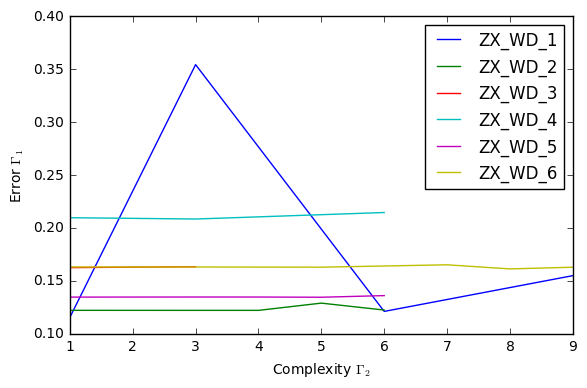

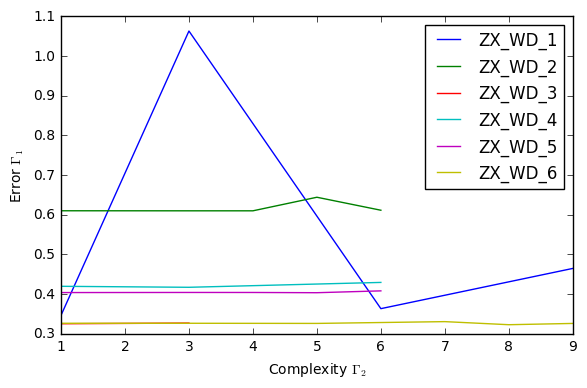

In [220]:
time_delay_2 = np.arange(0,1000,100)
print(time_delay_2)
print(len(time_delay_2))
deap_result_delay_2 = learn_delay_deap2(data,time_delay_2)
result_summary_gp(deap_result_delay_2,varnames[0:var_num_learn])

----------prepare_data_delay_deap------------------
del the target variable ZX_WD_1_dt0
number of variable: 129
the shape of X
(7719, 129)
the shape of y
(7719,)
ZX_WD_1_dt100 - 0.182*sin(ZX_WD_6_dt700)
----------prepare_data_delay_deap------------------
del the target variable ZX_WD_2_dt0
number of variable: 129
the shape of X
(7719, 129)
the shape of y
(7719,)
ZX_WD_2_dt100 + sin(log(ZD_TFG_dt300))
----------prepare_data_delay_deap------------------
del the target variable ZX_WD_3_dt0
number of variable: 129
the shape of X
(7719, 129)
the shape of y
(7719,)
ZX_WD_3_dt100 - 0.033000000000000002
----------prepare_data_delay_deap------------------
del the target variable ZX_WD_4_dt0
number of variable: 129
the shape of X
(7719, 129)
the shape of y
(7719,)
ZX_WD_4_dt100 + sin(log(sqrt(ZD_TFG_dt800)))
----------prepare_data_delay_deap------------------
del the target variable ZX_WD_5_dt0
number of variable: 129
the shape of X
(7719, 129)
the shape of y
(7719,)
1.0*ZX_WD_5_dt100 + 0.002/co

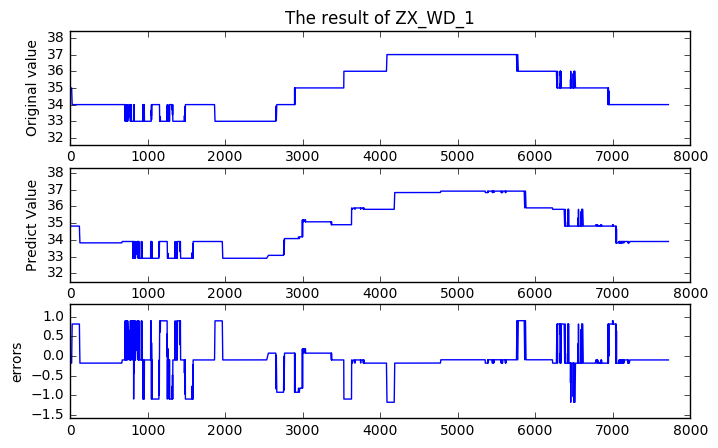

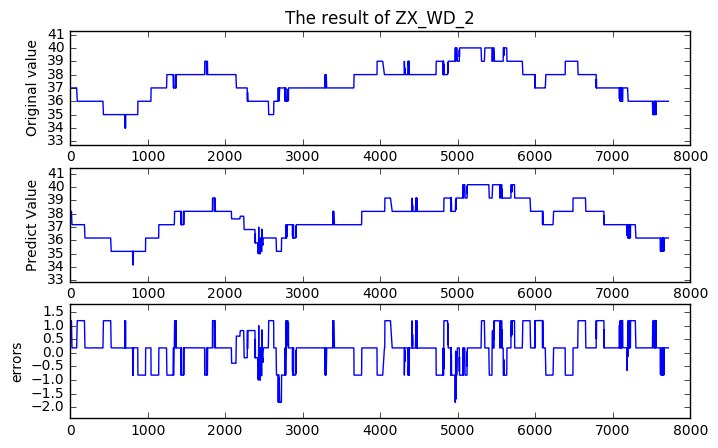

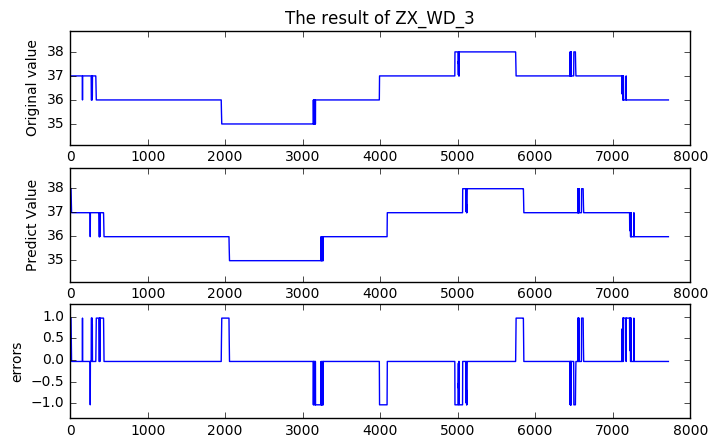

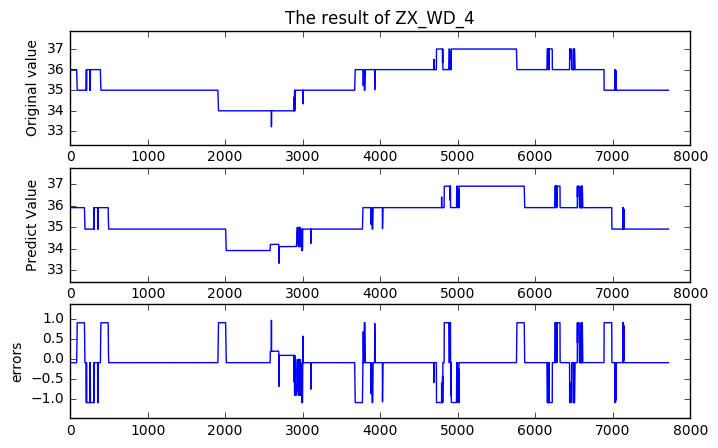

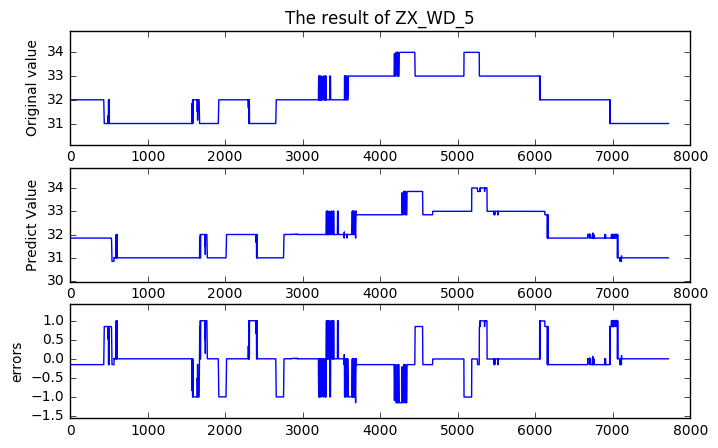

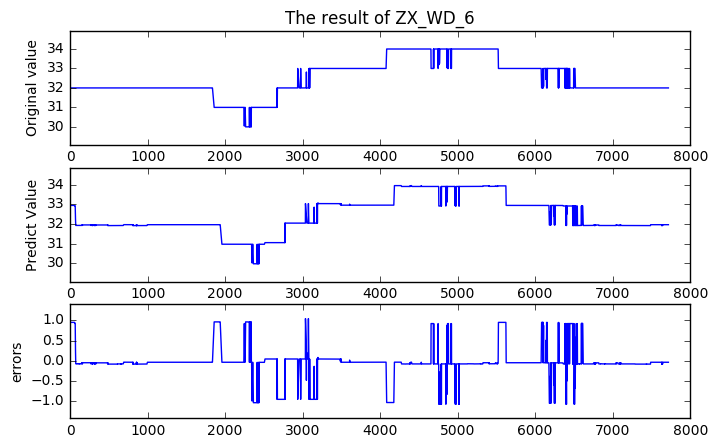

In [224]:
compare_plot_delay_deap([2,1,0,0,0,0],data,time_delay_2,deap_result_delay_2)

### Learn for segment data set no time delay

#### seg1

-------------------------learn ZX_WD_1------------
gen	evals	min                      	max        	diversity
0  	436  	[ 0.08708019  2.        ]	[ inf  22.]	412      
1  	500  	[ 0.08708019  1.        ]	[ inf  25.]	474      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


2  	500  	[ 0.08708019  1.        ]	[ inf   6.]	473      
3  	500  	[ 0.08708019  1.        ]	[ inf   9.]	464      
4  	500  	[ 0.08708019  1.        ]	[ inf  11.]	471      
5  	500  	[ 0.08708019  1.        ]	[ inf  14.]	476      
6  	500  	[ 0.08708019  1.        ]	[ inf  14.]	476      
7  	500  	[ 0.08708019  1.        ]	[ inf  12.]	469      
8  	500  	[ 0.08708019  1.        ]	[ inf  18.]	462      
9  	500  	[ 0.08708019  1.        ]	[ inf  18.]	456      
10 	500  	[ 0.08708019  1.        ]	[  1.63098426e+17   1.80000000e+01]	456      
11 	500  	[ 0.08708019  1.        ]	[  5.71514669e+14   1.80000000e+01]	454      
12 	500  	[ 0.08708019  1.        ]	[  3.14769514e+14   1.80000000e+01]	451      
13 	500  	[ 0.08666852  1.        ]	[  2.24590919e+05   1.60000000e+01]	449      
14 	500  	[ 0.08666852  1.        ]	[ 1385.88495583    19.        ]    	448      
15 	500  	[ 0.08597416  1.        ]	[ 1239.08845907    19.        ]    	444      
16 	500  	[ 0.0838958  1.       ]  	[ 1064.8

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


20 	500  	[ 0.0838958  1.       ]  	[ inf  19.]                        	398      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


21 	500  	[ 0.0838958  1.       ]  	[ inf   8.]                        	424      
22 	500  	[ 0.08708019  1.        ]	[ inf   4.]                        	425      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


23 	500  	[ 0.08708019  1.        ]	[ inf   4.]                        	424      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


24 	500  	[ 0.08708019  1.        ]	[ inf   4.]                        	416      
25 	500  	[ 0.08708019  1.        ]	[ inf  10.]                        	407      
26 	500  	[ 0.08708019  1.        ]	[ inf  10.]                        	411      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


27 	500  	[ 0.08708019  1.        ]	[ inf   6.]                        	407      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


28 	500  	[ 0.08708019  1.        ]	[ inf   6.]                        	404      
29 	500  	[ 0.08708019  1.        ]	[ inf   7.]                        	405      
30 	500  	[ 0.08708019  1.        ]	[ inf  12.]                        	407      
31 	500  	[ 0.08708019  1.        ]	[ inf  12.]                        	408      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


32 	500  	[ 0.08708019  1.        ]	[ inf   6.]                        	407      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


33 	500  	[ 0.08708019  1.        ]	[ inf   6.]                        	402      
34 	500  	[ 0.08703392  1.        ]	[ inf   9.]                        	403      
35 	500  	[ 0.08703392  1.        ]	[ inf  10.]                        	404      
36 	500  	[ 0.08703392  1.        ]	[ inf  10.]                        	404      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


37 	500  	[ 0.08703392  1.        ]	[ inf   6.]                        	402      
38 	500  	[ 0.08703392  1.        ]	[ inf  10.]                        	404      
39 	500  	[ 0.08703392  1.        ]	[  1.63098426e+17   1.00000000e+01]	407      
40 	500  	[ 0.08678506  1.        ]	[  1.02389489e+16   1.20000000e+01]	404      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


41 	500  	[ 0.08703392  1.        ]	[  5.71514669e+14   9.00000000e+00]	401      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


42 	500  	[ 0.08703392  1.        ]	[  4.09575284e+33   6.00000000e+00]	398      
43 	500  	[ 0.08703392  1.        ]	[  5.71514669e+14   9.00000000e+00]	389      
44 	500  	[ 0.08703392  1.        ]	[  2.63797278e+09   1.00000000e+01]	383      
45 	500  	[ 0.08703392  1.        ]	[  2.24590919e+05   1.20000000e+01]	382      
46 	500  	[ 0.08703392  1.        ]	[  2.16826278e+05   1.20000000e+01]	380      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


47 	500  	[ 0.08703392  1.        ]	[ 1499.94331989     9.        ]    	381      
48 	500  	[ 0.08703392  1.        ]	[ 1312.7269791    11.       ]      	379      
49 	500  	[ 0.08688839  1.        ]	[ 1064.84551522    11.        ]    	373      
--------------------end----------------------------
-------------------------learn ZX_WD_2------------
gen	evals	min                      	max        	diversity
0  	436  	[ 0.58358414  2.        ]	[ inf  22.]	414      
1  	500  	[ 0.58358414  1.        ]	[ inf  19.]	479      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


2  	500  	[ 0.58358414  1.        ]	[ inf   8.]	478      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


3  	500  	[ 0.58358414  1.        ]	[ inf   6.]	469      
4  	500  	[ 0.58113031  1.        ]	[ inf  11.]	476      
5  	500  	[ 0.58113031  1.        ]	[ inf  11.]	463      
6  	500  	[ 0.58113031  1.        ]	[ inf  13.]	461      
7  	500  	[ 0.58113031  1.        ]	[ inf  14.]	452      
8  	500  	[ 0.58113031  1.        ]	[ inf  16.]	447      
9  	500  	[ 0.5526414  1.       ]  	[ inf  17.]	445      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


10 	500  	[ 0.5526414  1.       ]  	[ inf   8.]	444      
11 	500  	[ 0.54551567  1.        ]	[ inf  11.]	449      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


12 	500  	[ 0.54551567  1.        ]	[ inf   9.]	443      
13 	500  	[ 0.54551567  1.        ]	[  2.75252280e+16   1.30000000e+01]	440      
14 	500  	[ 0.54551567  1.        ]	[  5.04052738e+15   1.10000000e+01]	434      
15 	500  	[ 0.52608347  1.        ]	[  5.71514669e+14   1.10000000e+01]	429      
16 	500  	[ 0.52608347  1.        ]	[  4.13831373e+05   1.30000000e+01]	426      
17 	500  	[ 0.52608347  1.        ]	[ 1383.44405895    15.        ]    	423      
18 	500  	[ 0.52389923  1.        ]	[ 1236.6468073    15.       ]      	421      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


19 	500  	[ 0.52389923  1.        ]	[ inf  15.]                        	432      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


20 	500  	[ 0.58113031  1.        ]	[ inf   4.]                        	418      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


21 	500  	[ 0.58113031  1.        ]	[ inf   6.]                        	414      
22 	500  	[ 0.58113031  1.        ]	[ inf   9.]                        	409      
23 	500  	[ 0.5649605  1.       ]  	[ inf  12.]                        	402      
24 	500  	[ 0.5649605  1.       ]  	[ inf  12.]                        	394      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


25 	500  	[ 0.5649605  1.       ]  	[ inf   7.]                        	390      
26 	500  	[ 0.5649605  1.       ]  	[ inf   8.]                        	389      
27 	500  	[ 0.5649605  1.       ]  	[ inf  12.]                        	388      
28 	500  	[ 0.5649605  1.       ]  	[ inf   9.]                        	389      
29 	500  	[ 0.5649605  1.       ]  	[ inf  11.]                        	396      
30 	500  	[ 0.54818979  1.        ]	[ inf  12.]                        	398      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


31 	500  	[ 0.54818979  1.        ]	[  4.09575284e+33   9.00000000e+00]	399      
32 	500  	[ 0.54818979  1.        ]	[  5.04052738e+15   1.10000000e+01]	393      
33 	500  	[ 0.54818979  1.        ]	[  3.14769514e+14   1.30000000e+01]	393      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


34 	500  	[ 0.54818979  1.        ]	[  2.24588567e+05   1.10000000e+01]	388      
35 	500  	[ 0.54818979  1.        ]	[ 1310.28630863    11.        ]    	382      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


36 	500  	[ 0.54818979  1.        ]	[  5.71514669e+14   7.00000000e+00]	382      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


37 	500  	[ 0.54818979  1.        ]	[  2.16823948e+05   8.00000000e+00]	381      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


38 	500  	[ 0.54818979  1.        ]	[ 1236.6468073     9.       ]      	376      
39 	500  	[ 0.4990154  1.       ]  	[ 1084.54547685     9.        ]    	373      
40 	500  	[ 0.4990154  1.       ]  	[ 1062.10050825    11.        ]    	370      
41 	500  	[ 0.4990154  1.       ]  	[ 1062.10050825    11.        ]    	370      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


42 	500  	[ 0.54818979  1.        ]	[ inf   6.]                        	378      
43 	500  	[ 0.54818979  1.        ]	[ inf  10.]                        	373      
44 	500  	[ 0.54818979  1.        ]	[  1.02836197e+16   1.00000000e+01]	367      
45 	500  	[ 0.54818979  1.        ]	[  4.43055619e+14   1.40000000e+01]	368      
46 	500  	[ 0.54818979  1.        ]	[  4.13831373e+05   1.40000000e+01]	365      
47 	500  	[ 0.54245207  1.        ]	[  2.16823948e+05   1.50000000e+01]	359      
48 	500  	[ 0.54245207  1.        ]	[ 1383.44405895    15.        ]    	353      
49 	500  	[ 0.54245207  1.        ]	[  2.75252280e+16   1.50000000e+01]	367      
--------------------end----------------------------
-------------------------learn ZX_WD_3------------
gen	evals	min                      	max        	diversity
0  	436  	[ 0.11635156  2.        ]	[ inf  22.]	413      
1  	500  	[ 0.11635156  1.        ]	[ inf  19.]	470      
2  	500  	[ 0.11635156  1.        ]	[ inf  21.]	471      
3  	500  

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


8  	500  	[ 0.11635156  1.        ]	[ inf   7.]	463      
9  	500  	[ 0.11635156  1.        ]	[ inf  12.]	451      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


10 	500  	[ 0.1163511  1.       ]  	[ inf   7.]	447      
11 	500  	[ 0.1163511  1.       ]  	[ inf  12.]	444      
12 	500  	[ 0.1163511  1.       ]  	[ inf  12.]	434      
13 	500  	[ 0.1163511  1.       ]  	[  1.02836197e+16   1.40000000e+01]	431      
14 	500  	[ 0.1163511  1.       ]  	[  5.71514669e+14   1.40000000e+01]	432      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


15 	500  	[ 0.1163511  1.       ]  	[  2.63797278e+09   1.20000000e+01]	425      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


16 	500  	[ 0.11616484  1.        ]	[  2.63797278e+09   8.00000000e+00]	416      
17 	500  	[ 0.11616484  1.        ]	[  3.14769514e+14   1.20000000e+01]	422      
18 	500  	[ 0.11616484  1.        ]	[  4.13832834e+05   1.20000000e+01]	416      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


19 	500  	[ 0.1163511  1.       ]  	[ inf   6.]                        	417      
20 	500  	[ 0.11635084  1.        ]	[ inf   9.]                        	415      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


21 	500  	[ 0.11635084  1.        ]	[ inf   9.]                        	413      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


22 	500  	[ 0.11551862  1.        ]	[ inf   6.]                        	405      
23 	500  	[ 0.11551862  1.        ]	[ inf  11.]                        	405      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


24 	500  	[ 0.11551862  1.        ]	[ inf  10.]                        	404      
25 	500  	[ 0.1163511  1.       ]  	[ inf   4.]                        	406      
26 	500  	[ 0.1163511  1.       ]  	[ inf   9.]                        	399      
27 	500  	[ 0.1163511  1.       ]  	[ inf   7.]                        	394      
28 	500  	[ 0.1163511  1.       ]  	[ inf   9.]                        	393      
29 	500  	[ 0.1163511  1.       ]  	[ inf  10.]                        	397      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


30 	500  	[ 0.1163511  1.       ]  	[ inf   7.]                        	399      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


31 	500  	[ 0.1163511  1.       ]  	[ inf   6.]                        	397      
32 	500  	[ 0.1163511  1.       ]  	[ inf  10.]                        	399      
33 	500  	[ 0.1163511  1.       ]  	[ inf  11.]                        	399      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


34 	500  	[ 0.1163511  1.       ]  	[ inf   8.]                        	403      
35 	500  	[ 0.11627161  1.        ]	[  1.63098426e+17   1.10000000e+01]	405      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


36 	500  	[ 0.11627161  1.        ]	[  1.63098426e+17   5.00000000e+00]	397      
37 	500  	[ 0.11627161  1.        ]	[  4.09575284e+33   1.00000000e+01]	392      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


38 	500  	[ 0.1163511  1.       ]  	[ inf   4.]                        	384      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


39 	500  	[ 0.1163511  1.       ]  	[ inf   4.]                        	376      
40 	500  	[ 0.11604531  1.        ]	[ inf   8.]                        	375      
41 	500  	[ 0.11604531  1.        ]	[ inf  13.]                        	379      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


42 	500  	[ 0.11604531  1.        ]	[ inf   7.]                        	377      
43 	500  	[ 0.11604531  1.        ]	[ inf  10.]                        	383      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


44 	500  	[ 0.1163511  1.       ]  	[ inf   4.]                        	376      
45 	500  	[ 0.1163511  1.       ]  	[ inf  10.]                        	375      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


46 	500  	[ 0.1163511  1.       ]  	[ inf   6.]                        	374      
47 	500  	[ 0.1163511  1.       ]  	[ inf   8.]                        	376      
48 	500  	[ 0.1163511  1.       ]  	[ inf  10.]                        	381      
49 	500  	[ 0.1163511  1.       ]  	[ inf  10.]                        	381      
--------------------end----------------------------
-------------------------learn ZX_WD_4------------
gen	evals	min                      	max        	diversity
0  	436  	[ 0.08708019  2.        ]	[ inf  22.]	413      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


1  	500  	[ 0.08708019  1.        ]	[ inf  19.]	476      
2  	500  	[ 0.08708019  1.        ]	[ inf   4.]	474      
3  	500  	[ 0.08708019  1.        ]	[ inf   9.]	479      
4  	500  	[ 0.08708019  1.        ]	[ inf  10.]	471      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


5  	500  	[ 0.08708019  1.        ]	[ inf   4.]	456      
6  	500  	[ 0.08708019  1.        ]	[ inf   9.]	455      
7  	500  	[ 0.08708019  1.        ]	[ inf   9.]	460      
8  	500  	[ 0.08708019  1.        ]	[ inf  11.]	453      
9  	500  	[ 0.08708019  1.        ]	[ inf  11.]	448      
10 	500  	[ 0.08708019  1.        ]	[ inf  11.]	446      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


11 	500  	[ 0.08708019  1.        ]	[ inf   8.]	443      
12 	500  	[ 0.08708019  1.        ]	[ inf  10.]	437      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


13 	500  	[ 0.08708017  1.        ]	[ inf   9.]	439      
14 	500  	[ 0.08708017  1.        ]	[ inf  14.]	440      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


15 	500  	[ 0.08708017  1.        ]	[ inf   9.]	440      
16 	500  	[ 0.08708017  1.        ]	[  1.63098426e+17   1.20000000e+01]	436      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


17 	500  	[ 0.08708017  1.        ]	[ inf   6.]                        	428      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


18 	500  	[ 0.08708016  1.        ]	[ inf   8.]                        	423      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


19 	500  	[ 0.08708016  1.        ]	[ inf   6.]                        	414      
20 	500  	[ 0.08708017  1.        ]	[ inf   4.]                        	414      
21 	500  	[ 0.08708017  1.        ]	[ inf  10.]                        	406      
22 	500  	[ 0.08708017  1.        ]	[ inf   9.]                        	401      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


23 	500  	[ 0.08708017  1.        ]	[ inf   5.]                        	395      
24 	500  	[ 0.08708016  1.        ]	[ inf   8.]                        	395      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


25 	500  	[ 0.08708017  1.        ]	[ inf   4.]                        	385      
26 	500  	[ 0.08708017  1.        ]	[ inf  10.]                        	386      
27 	500  	[ 0.08697975  1.        ]	[ inf  13.]                        	386      
28 	500  	[ 0.08697975  1.        ]	[ inf  13.]                        	389      
29 	500  	[ 0.08697975  1.        ]	[ inf  15.]                        	388      
30 	500  	[ 0.08697975  1.        ]	[ inf  15.]                        	398      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


31 	500  	[ 0.08697975  1.        ]	[ inf  10.]                        	400      
32 	500  	[ 0.08697975  1.        ]	[ inf  12.]                        	403      
33 	500  	[ 0.08689338  1.        ]	[  5.71514669e+14   1.20000000e+01]	406      
34 	500  	[ 0.08689338  1.        ]	[  4.13833817e+05   1.20000000e+01]	408      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


35 	500  	[ 0.08708017  1.        ]	[ inf   6.]                        	404      
36 	500  	[ 0.08708017  1.        ]	[ inf   8.]                        	403      
37 	500  	[ 0.08708017  1.        ]	[ inf  11.]                        	401      
38 	500  	[ 0.08708017  1.        ]	[  1.63098426e+17   1.10000000e+01]	403      
39 	500  	[ 0.08708017  1.        ]	[  5.04052738e+15   1.10000000e+01]	403      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


40 	500  	[ 0.08708017  1.        ]	[  5.04052738e+15   9.00000000e+00]	402      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


41 	500  	[ 0.08708017  1.        ]	[ inf   6.]                        	400      
42 	500  	[ 0.08708017  1.        ]	[ inf   9.]                        	398      
43 	500  	[ 0.08708017  1.        ]	[  1.63098426e+17   1.00000000e+01]	396      
44 	500  	[ 0.08708017  1.        ]	[  5.04052738e+15   1.00000000e+01]	396      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


45 	500  	[ 0.08706353  1.        ]	[ inf   7.]                        	400      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


46 	500  	[ 0.08708017  1.        ]	[ inf   4.]                        	402      
47 	500  	[ 0.08708017  1.        ]	[ inf  10.]                        	403      
48 	500  	[ 0.08708017  1.        ]	[ inf  11.]                        	400      
49 	500  	[ 0.08708017  1.        ]	[ inf   9.]                        	394      
--------------------end----------------------------
-------------------------learn ZX_WD_5------------
gen	evals	min                      	max        	diversity
0  	436  	[ 0.46182018  2.        ]	[ inf  22.]	413      
1  	500  	[ 0.46182018  1.        ]	[ inf  20.]	475      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


2  	500  	[ 0.46182018  1.        ]	[ inf  18.]	476      
3  	500  	[ 0.46182018  1.        ]	[ inf   4.]	468      
4  	500  	[ 0.46182018  1.        ]	[ inf  10.]	469      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


5  	500  	[ 0.46182018  1.        ]	[ inf   5.]	459      
6  	500  	[ 0.46182018  1.        ]	[ inf  11.]	450      
7  	500  	[ 0.46182018  1.        ]	[ inf  11.]	465      
8  	500  	[ 0.40398725  1.        ]	[ inf  10.]	463      
9  	500  	[ 0.40398725  1.        ]	[ inf  13.]	461      
10 	500  	[ 0.40398725  1.        ]	[ inf  13.]	451      
11 	500  	[ 0.40398725  1.        ]	[ inf  13.]	446      
12 	500  	[ 0.38766599  1.        ]	[ inf  12.]	439      
13 	500  	[ 0.38766599  1.        ]	[ inf  13.]	433      
14 	500  	[ 0.38766599  1.        ]	[ inf  13.]	432      
15 	500  	[ 0.38766599  1.        ]	[ inf  13.]	433      
16 	500  	[ 0.34856196  1.        ]	[ inf  13.]	433      
17 	500  	[ 0.34856196  1.        ]	[  1.02389489e+16   1.50000000e+01]	439      
18 	500  	[ 0.34856196  1.        ]	[  2.24594308e+05   1.50000000e+01]	442      
19 	500  	[ 0.34856196  1.        ]	[  2.16829631e+05   1.70000000e+01]	444      
20 	500  	[ 0.34856196  1.        ]	[  2.24594308e+05   1.

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


24 	500  	[ 0.25724859  1.        ]	[ inf   7.]                        	436      
25 	500  	[ 0.25724859  1.        ]	[ inf  11.]                        	431      
26 	500  	[ 0.25724859  1.        ]	[  2.75252280e+16   1.10000000e+01]	426      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


27 	500  	[ 0.25478813  1.        ]	[  1.02389489e+16   8.00000000e+00]	418      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


28 	500  	[ 0.25478813  1.        ]	[  4.13837365e+05   8.00000000e+00]	406      
29 	500  	[ 0.25478813  1.        ]	[ inf  10.]                        	426      
30 	500  	[ 0.25478813  1.        ]	[  5.71514669e+14   1.20000000e+01]	421      
31 	500  	[ 0.25214271  1.        ]	[ 1503.50490052    14.        ]    	415      
32 	500  	[ 0.25214271  1.        ]	[ 1316.2911623    16.       ]      	417      
33 	500  	[ 0.25214271  1.        ]	[ 1090.5481526    14.       ]      	414      
34 	500  	[ 0.25214271  1.        ]	[ 1242.64939424    14.        ]    	416      
35 	500  	[ 0.25214271  1.        ]	[ 1090.5481526    14.       ]      	418      
36 	500  	[ 0.25214271  1.        ]	[ 1090.5481526    14.       ]      	413      
37 	500  	[ 0.25214271  1.        ]	[ 1068.38599046    15.        ]    	414      
38 	500  	[ 0.25214271  1.        ]	[ 1503.50490052    15.        ]    	411      
39 	500  	[ 0.25214271  1.        ]	[ 643.8008307   16.       ]        	417      
40 	500  	[ 0.25

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


49 	500  	[ 0.25214271  1.        ]	[ inf  19.]                        	425      
--------------------end----------------------------
-------------------------learn ZX_WD_6------------
gen	evals	min                      	max        	diversity
0  	436  	[ 0.40033271  2.        ]	[ inf  22.]	414      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


1  	500  	[ 0.36427955  1.        ]	[ inf   7.]	480      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


2  	500  	[ 0.36427955  1.        ]	[ inf   5.]	468      
3  	500  	[ 0.36427955  1.        ]	[ inf  10.]	475      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


4  	500  	[ 0.36427955  1.        ]	[ inf   4.]	472      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


5  	500  	[ 0.36427955  1.        ]	[ inf   4.]	461      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


6  	500  	[ 0.36427955  1.        ]	[ inf   4.]	451      
7  	500  	[ 0.36427955  1.        ]	[ inf   9.]	458      
8  	500  	[ 0.36427955  1.        ]	[ inf  11.]	463      
9  	500  	[ 0.36427955  1.        ]	[ inf  11.]	468      
10 	500  	[ 0.36427955  1.        ]	[ inf  13.]	460      
11 	500  	[ 0.36427955  1.        ]	[ inf  13.]	457      
12 	500  	[ 0.36427955  1.        ]	[ inf  16.]	449      
13 	500  	[ 0.36427955  1.        ]	[ inf  16.]	446      
14 	500  	[ 0.36427955  1.        ]	[ inf  14.]	445      
15 	500  	[ 0.36427955  1.        ]	[  1.63098426e+17   1.40000000e+01]	444      
16 	500  	[ 0.36427955  1.        ]	[  2.16829283e+05   1.50000000e+01]	438      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


17 	500  	[ 0.36427955  1.        ]	[  2.63797278e+09   9.00000000e+00]	433      
18 	500  	[ 0.36427955  1.        ]	[  2.16829283e+05   1.20000000e+01]	428      
19 	500  	[ 0.36427955  1.        ]	[ 1315.95414583    13.        ]    	432      
20 	500  	[ 0.36427955  1.        ]	[ 1067.76304968    17.        ]    	433      
21 	500  	[ 0.36427955  1.        ]	[ 609.81447299   17.        ]      	434      
22 	500  	[ 0.36427955  1.        ]	[ 643.69743599   18.        ]      	430      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


23 	500  	[ 0.35987505  1.        ]	[ inf  14.]                        	429      
24 	500  	[ 0.36427955  1.        ]	[ inf   4.]                        	413      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


25 	500  	[ 0.36427955  1.        ]	[ inf   4.]                        	410      
26 	500  	[ 0.36427955  1.        ]	[ inf   9.]                        	418      
27 	500  	[ 0.36427955  1.        ]	[ inf   9.]                        	416      
28 	500  	[ 0.36427955  1.        ]	[ inf  12.]                        	416      
29 	500  	[ 0.36427955  1.        ]	[ inf  12.]                        	417      
30 	500  	[ 0.36427955  1.        ]	[ inf  12.]                        	416      
31 	500  	[ 0.36427955  1.        ]	[ inf  12.]                        	409      
32 	500  	[ 0.36427955  1.        ]	[ inf  12.]                        	415      
33 	500  	[ 0.36427955  1.        ]	[  1.02389489e+16   1.40000000e+01]	414      
34 	500  	[ 0.36427955  1.        ]	[  3.14769514e+14   1.40000000e+01]	418      
35 	500  	[ 0.36427955  1.        ]	[  2.24593962e+05   1.40000000e+01]	417      
36 	500  	[ 0.36427955  1.        ]	[ 1389.11179667    14.        ]    	422      
37 	500  	[ 0.35

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


40 	500  	[ 0.35492449  1.        ]	[  2.24593962e+05   1.30000000e+01]	413      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


41 	500  	[ 0.36427955  1.        ]	[ inf   5.]                        	410      
42 	500  	[ 0.36427955  1.        ]	[ inf  10.]                        	410      
43 	500  	[ 0.36427955  1.        ]	[ inf  11.]                        	405      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


44 	500  	[ 0.36427955  1.        ]	[ inf   4.]                        	406      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


45 	500  	[ 0.36427955  1.        ]	[ inf   6.]                        	401      
46 	500  	[ 0.36427955  1.        ]	[ inf  10.]                        	397      
47 	500  	[ 0.36427955  1.        ]	[ inf  10.]                        	398      
48 	500  	[ 0.36427955  1.        ]	[ inf  11.]                        	397      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


49 	500  	[ 0.36427955  1.        ]	[ inf   8.]                        	393      
--------------------end----------------------------
************************* ZX_WD_1 *********************
ZX_WD_4 + 0.0040000000000000001*square(sqrt(ZX_WD_2 - ZX_WD_4))
(ZX_WD_4*(ZD_LLJ + ZX_WD_4) + 0.36499999999999999)/(ZD_LLJ + ZX_WD_4)
ZX_WD_4 + 0.33400000000000002/ZX_HW_2
ZX_WD_4 + 0.0089999999999999993
ZX_WD_4 + 0.0089999999999999993
ZX_WD_4 + 0.0089999999999999993
ZX_WD_4
---------------------------------------------------------------------------------
complexity         nrmse_test         nrmse_train         rmse_test         rmse_train
9.000000         0.087658         0.086888         0.087658         0.086888
7.000000         0.087791         0.087019         0.087791         0.087019
5.000000         0.087811         0.087034         0.087811         0.087034
3.000000         0.087859         0.087080         0.087859         0.087080
3.000000         0.087859         0.087080         0.0878

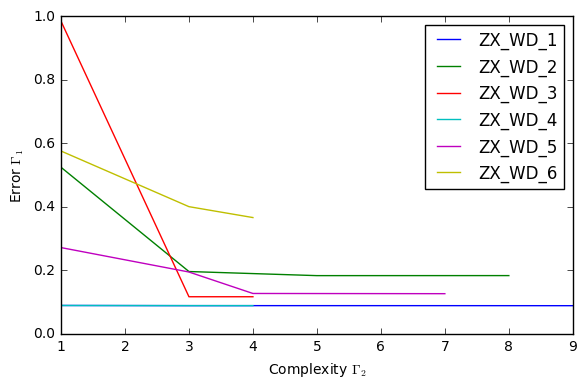

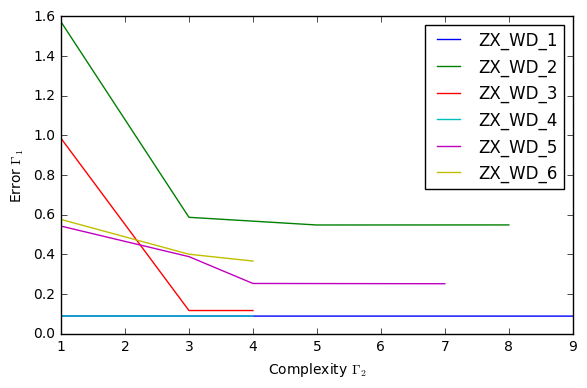

In [123]:
deap_results = learn_nodelay_deap(seg_1)
result_summary_gp(deap_results,varnames[0:var_num_learn])

ZX_WD_4 + 0.0040000000000000001*square(sqrt(ZX_WD_2 - ZX_WD_4))
ZX_WD_1 + 3.3540000000000001*cos(sin(square(ZX_WD_1)))
ZX_WD_4 + 0.98234413521942501
ZX_WD_1 - 0.0089597413714718058
ZX_HW_1 + sin(sin(1.0449999999999999*ZX_HW_1))
5.3550000000000004*sqrt(ZX_WD_2)


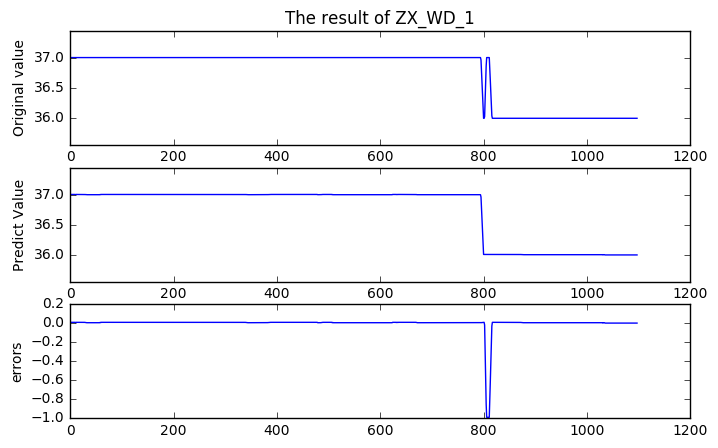

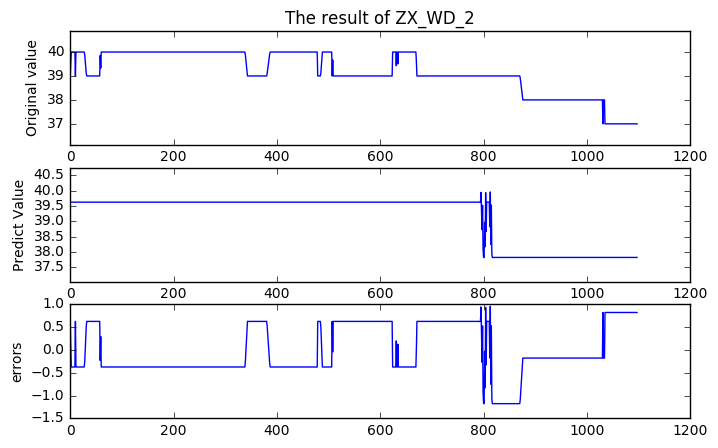

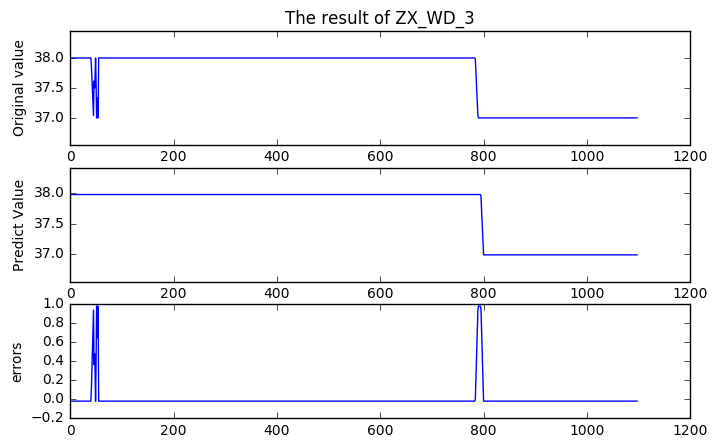

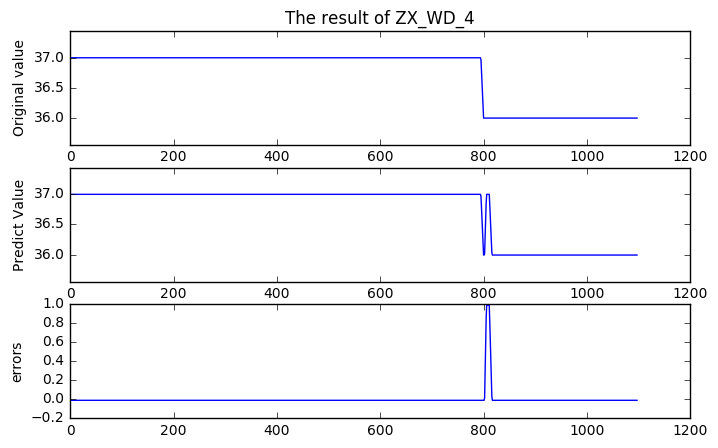

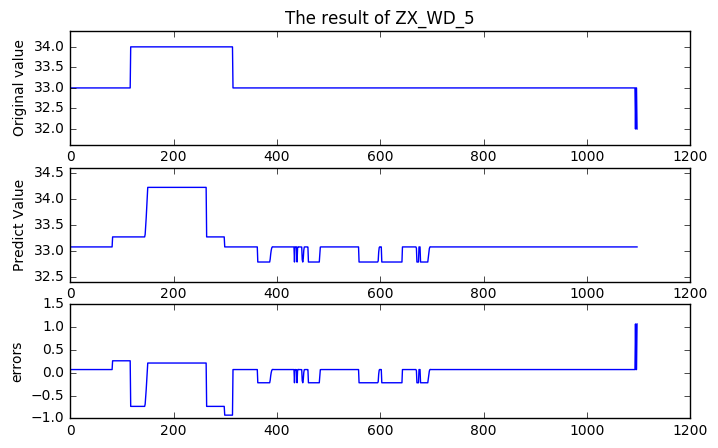

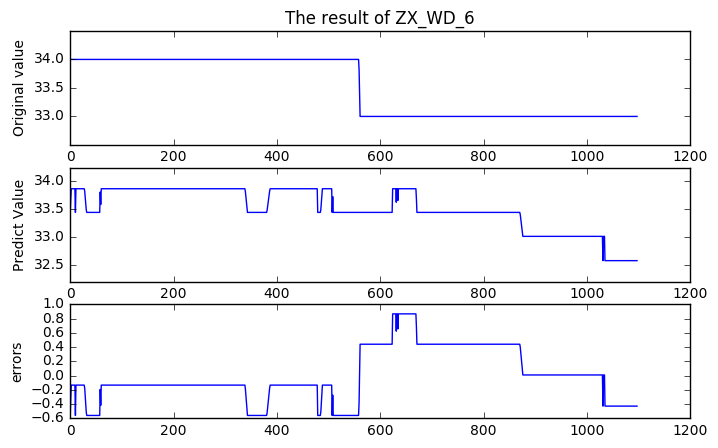

In [133]:
compare_plot_deap([0,0,0,0,0,0],seg_1,deap_results)

#### seg2

-------------------------learn ZX_WD_1------------
gen	evals	min      	max        	diversity
0  	436  	[ 0.  2.]	[ inf  22.]	408      
--------------------end----------------------------
-------------------------learn ZX_WD_2------------
gen	evals	min                    	max        	diversity
0  	436  	[ 0.2515813  2.       ]	[ inf  22.]	402      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


1  	500  	[ 0.2515813  1.       ]	[ inf   9.]	457      
2  	500  	[ 0.2515813  1.       ]	[ inf  11.]	453      
3  	500  	[ 0.2515813  1.       ]	[ inf  15.]	446      
4  	500  	[ 0.2515813  1.       ]	[ inf  16.]	460      
5  	500  	[ 0.2515813  1.       ]	[ inf  19.]	455      
6  	500  	[ 0.2515813  1.       ]	[ inf  19.]	449      
7  	500  	[ 0.2515813  1.       ]	[ inf  19.]	445      
8  	500  	[ 0.2515813  1.       ]	[ inf  17.]	435      
9  	500  	[ 0.2515813  1.       ]	[ inf  17.]	426      
10 	500  	[ 0.2515813  1.       ]	[  1.17191424e+16   1.50000000e+01]	423      
11 	500  	[ 0.2515813  1.       ]	[  4.13231414e+05   1.50000000e+01]	417      
12 	500  	[ 0.24708553  1.        ]	[  2.46741418e+05   1.60000000e+01]	414      
13 	500  	[ 0.24708553  1.        ]	[ 1225.00022528    16.        ]    	408      
14 	500  	[ 0.24708553  1.        ]	[ 1110.54724497    18.        ]    	406      
15 	500  	[ 0.24708553  1.        ]	[ 604.50795878   19.        ]      	397      
16 	500 

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


32 	500  	[ 0.24161309  1.        ]	[ 1033.03321868    10.        ]    	388      
33 	500  	[ 0.24161309  1.        ]	[ 604.50795878   14.        ]      	382      
34 	500  	[ 0.24161309  1.        ]	[ 604.50795878   14.        ]      	379      
35 	500  	[ 0.24161309  1.        ]	[ 604.50795878   14.        ]      	378      
36 	500  	[ 0.24161309  1.        ]	[ 604.50795878   15.        ]      	375      
37 	500  	[ 0.24161309  1.        ]	[ 604.50795878   15.        ]      	374      
38 	500  	[ 0.24161309  1.        ]	[ 604.50795878   15.        ]      	374      
39 	500  	[ 0.24161309  1.        ]	[ 604.50795878   15.        ]      	367      
40 	500  	[ 0.24161309  1.        ]	[ 604.50795878   15.        ]      	363      
41 	500  	[ 0.24161309  1.        ]	[ 604.50795878   15.        ]      	361      
42 	500  	[ 0.24161309  1.        ]	[ 604.50795878   16.        ]      	367      
43 	500  	[ 0.24161309  1.        ]	[ 604.50795878   16.        ]      	369      
44 	500  	[ 0.24

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


1  	500  	[ 0.44284186  1.        ]	[ inf   6.]	465      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


2  	500  	[ 0.2515813  1.       ]  	[ inf   6.]	457      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


3  	500  	[ 0.24272254  1.        ]	[ inf   4.]	444      
4  	500  	[ 0.24272254  1.        ]	[ inf  10.]	445      
5  	500  	[ 0.24272254  1.        ]	[ inf  11.]	431      
6  	500  	[ 0.23619343  1.        ]	[ inf  12.]	445      
7  	500  	[ 0.23619343  1.        ]	[ inf  12.]	437      
8  	500  	[ 0.23619343  1.        ]	[ inf  15.]	435      
9  	500  	[ 0.23619343  1.        ]	[ inf  18.]	434      
10 	500  	[ 0.23619343  1.        ]	[ inf  18.]	432      
11 	500  	[ 0.23619343  1.        ]	[  5.73413576e+16   2.00000000e+01]	437      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


12 	500  	[ 0.23619343  1.        ]	[ inf   6.]                        	432      
13 	500  	[ 0.23619343  1.        ]	[ inf   9.]                        	420      
14 	500  	[ 0.23619343  1.        ]	[ inf  12.]                        	412      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


15 	500  	[ 0.23619343  1.        ]	[ inf   6.]                        	409      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


16 	500  	[ 0.23619343  1.        ]	[ inf   6.]                        	411      
17 	500  	[ 0.23619343  1.        ]	[ inf  10.]                        	403      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


18 	500  	[ 0.23619343  1.        ]	[ inf   6.]                        	398      
19 	500  	[ 0.23619343  1.        ]	[ inf   7.]                        	395      
20 	500  	[ 0.23619343  1.        ]	[ inf   9.]                        	395      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


21 	500  	[ 0.23619343  1.        ]	[ inf   9.]                        	393      
22 	500  	[ 0.23619343  1.        ]	[ inf   9.]                        	386      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


23 	500  	[ 0.23619343  1.        ]	[ inf   9.]                        	383      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


24 	500  	[ 0.23619343  1.        ]	[ inf   4.]                        	376      
25 	500  	[ 0.23619343  1.        ]	[ inf   9.]                        	367      
26 	500  	[ 0.23619343  1.        ]	[ inf  14.]                        	368      
27 	500  	[ 0.23619343  1.        ]	[ inf  15.]                        	364      
28 	500  	[ 0.23619343  1.        ]	[ inf  14.]                        	368      
29 	500  	[ 0.23619343  1.        ]	[ inf  14.]                        	365      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


30 	500  	[ 0.23619343  1.        ]	[ inf   7.]                        	362      
31 	500  	[ 0.23619343  1.        ]	[ inf   9.]                        	362      
32 	500  	[ 0.23172915  1.        ]	[ inf   9.]                        	364      
33 	500  	[ 0.23172915  1.        ]	[ inf   9.]                        	362      
34 	500  	[ 0.23172915  1.        ]	[ inf  10.]                        	371      
35 	500  	[ 0.23172915  1.        ]	[  5.73413576e+16   1.40000000e+01]	373      
36 	500  	[ 0.23172915  1.        ]	[  5.53940048e+14   1.40000000e+01]	373      
37 	500  	[ 0.23172915  1.        ]	[  2.39342966e+05   1.40000000e+01]	372      
38 	500  	[ 0.23172915  1.        ]	[ 1435.30600038    14.        ]    	371      
39 	500  	[ 0.23172915  1.        ]	[ 1435.30600038    14.        ]    	367      
40 	500  	[ 0.23172915  1.        ]	[ 1227.07556855    14.        ]    	369      
41 	500  	[ 0.23172915  1.        ]	[ 1035.10868437    18.        ]    	369      
42 	500  	[ 0.23

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


44 	500  	[ 0.23172915  1.        ]	[  4.88772754e+33   6.00000000e+00]	370      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


45 	500  	[ 0.23172915  1.        ]	[  4.88772754e+33   7.00000000e+00]	361      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


46 	500  	[ 0.23172915  1.        ]	[  4.88772754e+33   8.00000000e+00]	358      
47 	500  	[ 0.23172915  1.        ]	[  3.32905668e+15   1.10000000e+01]	360      
48 	500  	[ 0.23172915  1.        ]	[  2.14643580e+14   1.10000000e+01]	355      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


49 	500  	[ 0.23172915  1.        ]	[  2.14643580e+14   7.00000000e+00]	349      
--------------------end----------------------------
-------------------------learn ZX_WD_5------------
gen	evals	min      	max        	diversity
0  	436  	[ 0.  2.]	[ inf  22.]	406      
--------------------end----------------------------
-------------------------learn ZX_WD_6------------
gen	evals	min                      	max        	diversity
0  	436  	[ 0.30145518  2.        ]	[ inf  22.]	406      
1  	500  	[ 0.30145502  1.        ]	[ inf  19.]	458      
2  	500  	[ 0.30145502  1.        ]	[ inf  21.]	451      
3  	500  	[ 0.30145502  1.        ]	[ inf  21.]	458      
4  	500  	[ 0.30145502  1.        ]	[ inf  21.]	466      
5  	500  	[ 0.30145502  1.        ]	[ inf  23.]	458      
6  	500  	[ 0.30145502  1.        ]	[ inf  21.]	441      
7  	500  	[ 0.30145499  1.        ]	[ inf  20.]	439      
8  	500  	[ 0.30145499  1.        ]	[  3.32905668e+15   2.30000000e+01]	441      
9  	500  	[ 0.30145499  

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


16 	500  	[ 0.28382553  1.        ]	[  5.73413576e+16   1.00000000e+01]	424      
17 	500  	[ 0.28382553  1.        ]	[  2.02742009e+09   1.40000000e+01]	419      
18 	500  	[ 0.28382553  1.        ]	[ 1335.10865482    15.        ]    	412      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


19 	500  	[ 0.28382553  1.        ]	[  7.14589218e+15   8.00000000e+00]	404      
20 	500  	[ 0.28382553  1.        ]	[  2.46745796e+05   1.10000000e+01]	401      
21 	500  	[ 0.28382553  1.        ]	[  2.39345298e+05   1.20000000e+01]	395      
22 	500  	[ 0.28264584  1.        ]	[ 1437.70000094    16.        ]    	391      
23 	500  	[ 0.28264584  1.        ]	[ 1282.75490033    17.        ]    	388      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


24 	500  	[ 0.28264584  1.        ]	[  1.17191424e+16   6.00000000e+00]	383      
25 	500  	[ 0.28264584  1.        ]	[ inf  10.]                        	371      
26 	500  	[ 0.28264584  1.        ]	[  4.88772754e+33   1.20000000e+01]	368      
27 	500  	[ 0.28264584  1.        ]	[  1.86925521e+14   1.20000000e+01]	361      
28 	500  	[ 0.28264584  1.        ]	[  2.46745796e+05   1.20000000e+01]	359      
29 	500  	[ 0.28264584  1.        ]	[ 1335.10865482    15.        ]    	357      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


30 	500  	[ 0.28264584  1.        ]	[  2.39345298e+05   8.00000000e+00]	354      
31 	500  	[ 0.28264584  1.        ]	[ 1229.46532088    11.        ]    	349      
32 	500  	[ 0.28264584  1.        ]	[ 1055.10866385    11.        ]    	344      
33 	500  	[ 0.28264584  1.        ]	[ 1037.49344321    11.        ]    	344      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


34 	500  	[ 0.28264584  1.        ]	[ 1229.46532088     8.        ]    	344      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


35 	500  	[ 0.28264584  1.        ]	[ 1037.49344321    10.        ]    	342      
36 	500  	[ 0.28264584  1.        ]	[ 1037.49344321    10.        ]    	341      
37 	500  	[ 0.28264584  1.        ]	[ 608.9689589   11.       ]        	334      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


38 	500  	[ 0.28264584  1.        ]	[ 608.9689589   12.       ]        	332      
39 	500  	[ 0.28264584  1.        ]	[ 608.9689589   12.       ]        	325      
40 	500  	[ 0.28264584  1.        ]	[ 608.9689589   12.       ]        	324      
41 	500  	[ 0.28264584  1.        ]	[ 608.9689589   12.       ]        	328      
42 	500  	[ 0.22852902  1.        ]	[ 608.9689589   12.       ]        	327      
43 	500  	[ 0.22852902  1.        ]	[ 608.9689589   14.       ]        	328      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


44 	500  	[ 0.22852902  1.        ]	[ 608.9689589   10.       ]        	325      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


45 	500  	[ 0.28264584  1.        ]	[ inf   6.]                        	323      
46 	500  	[ 0.28264584  1.        ]	[  2.39345298e+05   7.00000000e+00]	316      
47 	500  	[ 0.28264584  1.        ]	[ 1437.70000094    11.        ]    	311      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


48 	500  	[ 0.28264584  1.        ]	[ 1335.10865482     6.        ]    	308      
49 	500  	[ 0.28264584  1.        ]	[ 1037.49344321     9.        ]    	303      
--------------------end----------------------------
************************* ZX_WD_1 *********************
1.0*ZX_WD_3
ZX_WD_5 + 4.0
sqrt(ZD_TFG)
---------------------------------------------------------------------------------
complexity         nrmse_test         nrmse_train         rmse_test         rmse_train
3.000000         nan         nan         0.000000         0.000000
3.000000         nan         nan         0.000000         0.000000
2.000000         inf         inf         11.645284         11.645322
*********************************************************************
************************* ZX_WD_2 *********************
0.89200000000000002*sqrt(ZX_HW_2) + 0.89200000000000002*ZX_WD_4 + 0.89200000000000002*cos(ZX_WD_3)
0.91300000000000003*ZX_WD_4 + 0.91300000000000003*log(exp(sqrt(ZX_HW_1)))
0.8830000000000000

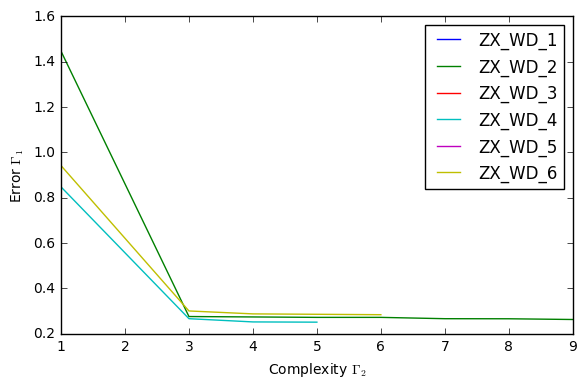

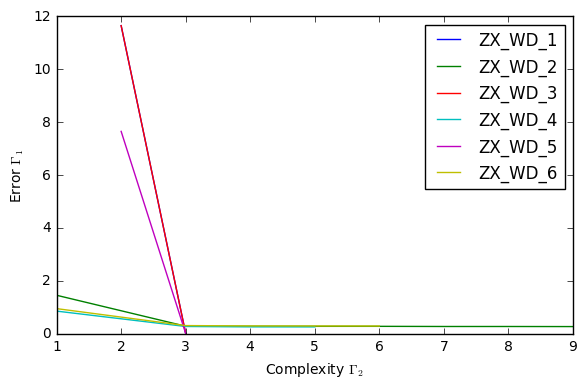

In [140]:
deap_results = learn_nodelay_deap(seg_2)
result_summary_gp(deap_results,varnames[0:var_num_learn])

1.0*ZX_WD_3
0.89200000000000002*sqrt(ZX_HW_2) + 0.89200000000000002*ZX_WD_4 + 0.89200000000000002*cos(ZX_WD_3)


/home/happyling/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_base.py:3040: UserWarning: Attempting to set identical bottom==top results
in singular transformations; automatically expanding.
bottom=37.0, top=37.0
  'bottom=%s, top=%s') % (bottom, top))


ZX_WD_5 + 4.0
0.79300000000000004*ZX_WD_2 + 5.8550000000000004
ZX_WD_3 - 4.0
4.8019999999999996*log(ZX_HW_1*ZX_HW_2)


/home/happyling/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_base.py:3040: UserWarning: Attempting to set identical bottom==top results
in singular transformations; automatically expanding.
bottom=33.0, top=33.0
  'bottom=%s, top=%s') % (bottom, top))


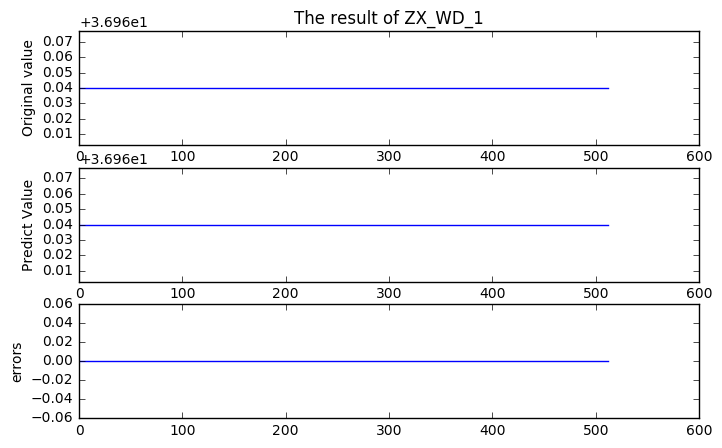

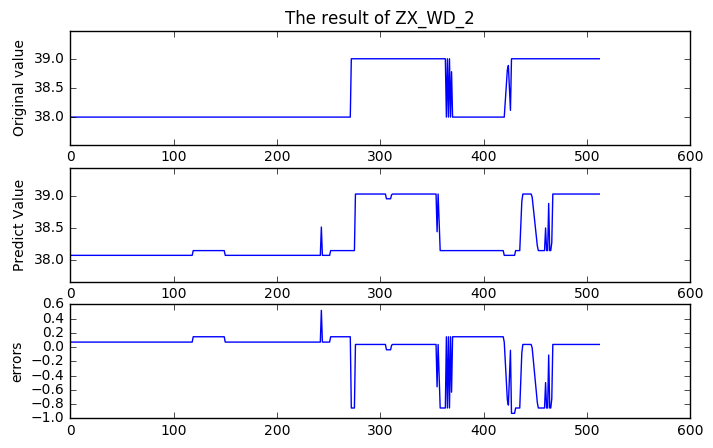

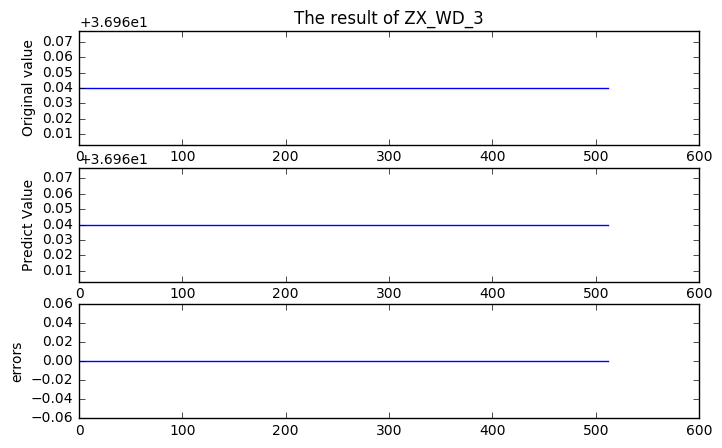

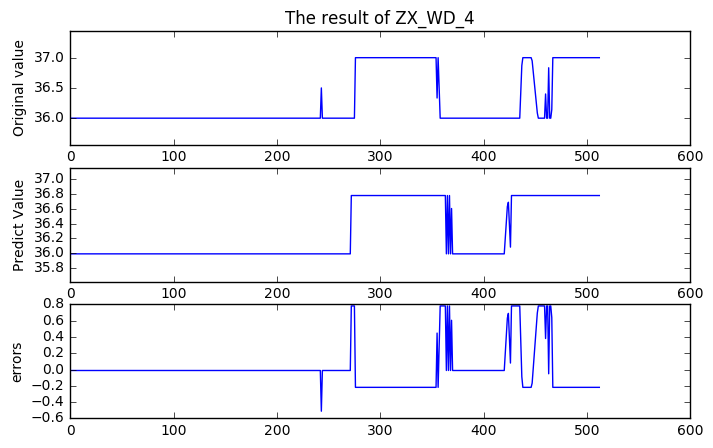

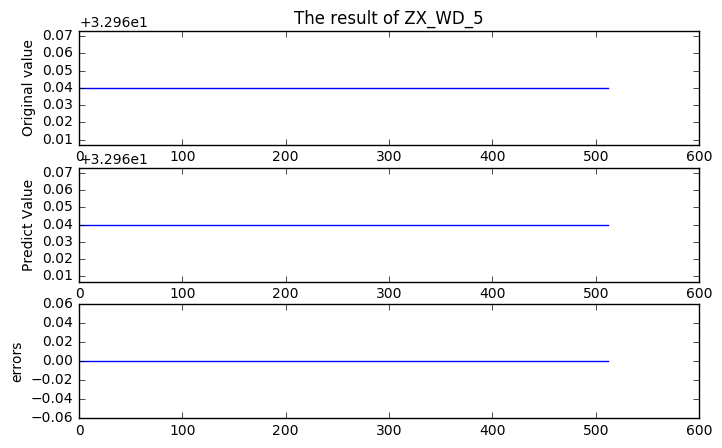

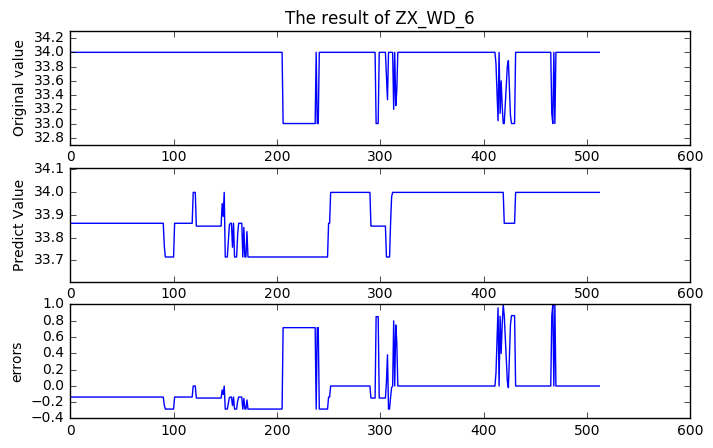

In [141]:
compare_plot_deap([0,0,0,0,0,0],seg_2,deap_results)

#### seg3

-------------------------learn ZX_WD_1------------
gen	evals	min                      	max        	diversity
0  	436  	[ 0.63909038  2.        ]	[ inf  22.]	413      
1  	500  	[ 0.63909038  1.        ]	[ inf  22.]	478      
2  	500  	[ 0.63909038  1.        ]	[ inf  20.]	474      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


3  	500  	[ 0.63909038  1.        ]	[ inf  18.]	476      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


4  	500  	[ 0.52706582  1.        ]	[ inf   4.]	468      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


5  	500  	[ 0.52706582  1.        ]	[ inf   5.]	464      
6  	500  	[ 0.52706582  1.        ]	[ inf  10.]	460      
7  	500  	[ 0.52706582  1.        ]	[ inf  11.]	465      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


8  	500  	[ 0.52389805  1.        ]	[ inf   5.]	460      
9  	500  	[ 0.52389805  1.        ]	[ inf   9.]	465      
10 	500  	[ 0.52389805  1.        ]	[ inf  11.]	461      
11 	500  	[ 0.52389805  1.        ]	[ inf  11.]	455      
12 	500  	[ 0.52389805  1.        ]	[ inf  11.]	450      
13 	500  	[ 0.52389805  1.        ]	[ inf  13.]	449      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


14 	500  	[ 0.51887766  1.        ]	[ inf   6.]	447      
15 	500  	[ 0.51887766  1.        ]	[ inf   9.]	450      
16 	500  	[ 0.51887766  1.        ]	[ inf  10.]	446      
17 	500  	[ 0.51628899  1.        ]	[ inf  11.]	441      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


18 	500  	[ 0.51628899  1.        ]	[ inf   8.]	437      
19 	500  	[ 0.51628899  1.        ]	[ inf   9.]	436      
20 	500  	[ 0.51628899  1.        ]	[  3.06005343e+16   1.10000000e+01]	431      
21 	500  	[ 0.51628899  1.        ]	[  1.42360809e+14   1.10000000e+01]	423      
22 	500  	[ 0.51628899  1.        ]	[  1.80508045e+09   1.40000000e+01]	421      
23 	500  	[ 0.51628899  1.        ]	[  2.24848196e+05   1.40000000e+01]	417      
24 	500  	[ 0.51628899  1.        ]	[ 1341.14257068    14.        ]    	412      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


25 	500  	[ 0.51628899  1.        ]	[ inf   7.]                        	408      
26 	500  	[ 0.51628899  1.        ]	[  3.06005343e+16   1.10000000e+01]	404      
27 	500  	[ 0.51628899  1.        ]	[  4.88194569e+15   1.10000000e+01]	409      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


28 	500  	[ 0.51628899  1.        ]	[ inf   6.]                        	397      
29 	500  	[ 0.51628899  1.        ]	[ inf   7.]                        	394      
30 	500  	[ 0.51628899  1.        ]	[ inf   8.]                        	390      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


31 	500  	[ 0.5053015  1.       ]  	[  3.06005343e+16   8.00000000e+00]	390      
32 	500  	[ 0.5053015  1.       ]  	[  1.42174779e+16   1.20000000e+01]	390      
33 	500  	[ 0.5053015  1.       ]  	[  1.71845049e+14   1.20000000e+01]	388      
34 	500  	[ 0.48267554  1.        ]	[  1.42360809e+14   1.20000000e+01]	385      
35 	500  	[ 0.48267554  1.        ]	[  1.42360809e+14   1.10000000e+01]	383      
36 	500  	[ 0.48267554  1.        ]	[  8.69051655e+13   1.40000000e+01]	378      
37 	500  	[ 0.48267554  1.        ]	[  8.69051655e+13   1.40000000e+01]	372      
38 	500  	[ 0.48267554  1.        ]	[  1.80508045e+09   1.40000000e+01]	367      
39 	500  	[ 0.48267554  1.        ]	[  3.99120326e+05   1.40000000e+01]	366      
40 	500  	[ 0.48267554  1.        ]	[  2.24848196e+05   1.40000000e+01]	369      
41 	500  	[ 0.48267554  1.        ]	[  2.18011204e+05   1.40000000e+01]	373      
42 	500  	[ 0.48267554  1.        ]	[ 1341.14257068    14.        ]    	378      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


43 	500  	[ 0.48267554  1.        ]	[  4.88194569e+15   8.00000000e+00]	374      
44 	500  	[ 0.48267554  1.        ]	[  2.24848196e+05   1.00000000e+01]	373      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


45 	500  	[ 0.48267554  1.        ]	[ inf   6.]                        	385      
46 	500  	[ 0.52389805  1.        ]	[ inf   4.]                        	415      
47 	500  	[ 0.52389805  1.        ]	[ inf   9.]                        	415      
48 	500  	[ 0.52389805  1.        ]	[ inf  10.]                        	414      
49 	500  	[ 0.52389805  1.        ]	[ inf  10.]                        	412      
--------------------end----------------------------
-------------------------learn ZX_WD_2------------
gen	evals	min                    	max        	diversity
0  	436  	[ 1.0125331  2.       ]	[ inf  22.]	412      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


1  	500  	[ 1.0125331  1.       ]	[ inf  18.]	470      
2  	500  	[ 1.0125331  1.       ]	[ inf   4.]	470      
3  	500  	[ 1.0125331  1.       ]	[ inf   9.]	464      
4  	500  	[ 1.0125331  1.       ]	[ inf  11.]	456      
5  	500  	[ 1.0125331  1.       ]	[ inf  13.]	456      
6  	500  	[ 1.0125331  1.       ]	[ inf  14.]	464      
7  	500  	[ 1.0125331  1.       ]	[ inf  14.]	457      
8  	500  	[ 1.0125331  1.       ]	[ inf  14.]	448      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


9  	500  	[ 1.0125331  1.       ]	[ inf   7.]	445      
10 	500  	[ 1.00378765  1.        ]	[ inf   9.]	440      
11 	500  	[ 1.00378765  1.        ]	[ inf  11.]	433      
12 	500  	[ 1.00378765  1.        ]	[ inf  11.]	427      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


13 	500  	[ 1.00378765  1.        ]	[ inf   6.]	420      
14 	500  	[ 1.00378765  1.        ]	[ inf  11.]	423      
15 	500  	[ 1.00378765  1.        ]	[ inf  11.]	429      
16 	500  	[ 1.00378765  1.        ]	[ inf  13.]	428      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


17 	500  	[ 1.00378765  1.        ]	[ inf   6.]	422      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


18 	500  	[ 1.00378765  1.        ]	[ inf   7.]	421      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


19 	500  	[ 1.00378765  1.        ]	[ inf   6.]	416      
20 	500  	[ 1.00378765  1.        ]	[ inf   9.]	411      
21 	500  	[ 1.00378765  1.        ]	[  4.18116628e+33   9.00000000e+00]	410      
22 	500  	[ 0.99395432  1.        ]	[  4.18116628e+33   1.10000000e+01]	414      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


23 	500  	[ 0.98251579  1.        ]	[  4.18116628e+33   8.00000000e+00]	412      
24 	500  	[ 0.98251579  1.        ]	[  1.88498315e+15   1.00000000e+01]	410      
25 	500  	[ 0.98251579  1.        ]	[  1.71845049e+14   1.00000000e+01]	405      
26 	500  	[ 0.98251579  1.        ]	[  8.69051655e+13   1.20000000e+01]	403      
27 	500  	[ 0.98251579  1.        ]	[  1.80508045e+09   1.20000000e+01]	405      
28 	500  	[ 0.98251579  1.        ]	[  2.18008660e+05   1.40000000e+01]	409      
29 	500  	[ 0.98251579  1.        ]	[ 1204.0662604    14.       ]      	407      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


30 	500  	[ 0.98251579  1.        ]	[  1.42360809e+14   7.00000000e+00]	396      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


31 	500  	[ 0.98251579  1.        ]	[ inf   7.]                        	406      
32 	500  	[ 1.0125331  1.       ]  	[ inf   4.]                        	397      
33 	500  	[ 1.0125331  1.       ]  	[ inf  10.]                        	392      
34 	500  	[ 1.0125331  1.       ]  	[ inf  10.]                        	386      
35 	500  	[ 1.0125331  1.       ]  	[ inf  11.]                        	381      
36 	500  	[ 1.0125331  1.       ]  	[ inf  11.]                        	385      
37 	500  	[ 1.0125331  1.       ]  	[ inf  15.]                        	389      
38 	500  	[ 1.0125331  1.       ]  	[ inf  15.]                        	396      
39 	500  	[ 1.0125331  1.       ]  	[ inf  16.]                        	401      
40 	500  	[ 0.95497789  1.        ]	[  3.99117607e+05   1.60000000e+01]	407      
41 	500  	[ 0.95497789  1.        ]	[  2.24845630e+05   1.50000000e+01]	407      
42 	500  	[ 0.95497789  1.        ]	[  2.18008660e+05   1.50000000e+01]	406      
43 	500  	[ 0.95

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


44 	500  	[ 0.95497789  1.        ]	[  8.69051655e+13   9.00000000e+00]	405      
45 	500  	[ 0.95497789  1.        ]	[ 1275.41434979    12.        ]    	405      
46 	500  	[ 0.95497789  1.        ]	[ 1121.75049996    12.        ]    	404      
47 	500  	[ 0.95497789  1.        ]	[ 739.76341314   13.        ]      	406      
48 	500  	[ 0.95497789  1.        ]	[ 589.72840215   14.        ]      	406      
49 	500  	[ 0.95497789  1.        ]	[ 589.72840215   13.        ]      	403      
--------------------end----------------------------
-------------------------learn ZX_WD_3------------
gen	evals	min                      	max        	diversity
0  	436  	[ 0.36797553  2.        ]	[ inf  22.]	412      
1  	500  	[ 0.36797553  1.        ]	[ inf  22.]	478      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


2  	500  	[ 0.36797553  1.        ]	[ inf   6.]	473      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


3  	500  	[ 0.36797553  1.        ]	[ inf   4.]	463      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


4  	500  	[ 0.36797553  1.        ]	[ inf   4.]	467      
5  	500  	[ 0.36797553  1.        ]	[ inf  10.]	460      
6  	500  	[ 0.36797553  1.        ]	[ inf  12.]	449      
7  	500  	[ 0.36797553  1.        ]	[ inf  10.]	465      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


8  	500  	[ 0.36797553  1.        ]	[ inf   7.]	458      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


9  	500  	[ 0.36797553  1.        ]	[ inf   6.]	447      
10 	500  	[ 0.36797553  1.        ]	[ inf  11.]	450      
11 	500  	[ 0.36797553  1.        ]	[ inf  15.]	446      
12 	500  	[ 0.36797553  1.        ]	[ inf  11.]	448      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


13 	500  	[ 0.36797553  1.        ]	[ inf   7.]	452      
14 	500  	[ 0.36797553  1.        ]	[ inf  13.]	448      
15 	500  	[ 0.36736774  1.        ]	[ inf  13.]	447      
16 	500  	[ 0.36736774  1.        ]	[ inf  13.]	446      
17 	500  	[ 0.36736774  1.        ]	[  1.71845049e+14   1.30000000e+01]	445      
18 	500  	[ 0.36736774  1.        ]	[  2.24846314e+05   1.30000000e+01]	440      
19 	500  	[ 0.36736774  1.        ]	[ 1204.8915375    13.       ]      	438      
20 	500  	[ 0.36736774  1.        ]	[ 998.83152284   15.        ]      	430      
21 	500  	[ 0.36736774  1.        ]	[ 970.3422886   23.       ]        	430      
22 	500  	[ 0.36736774  1.        ]	[ 590.51157874   14.        ]      	428      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


23 	500  	[ 0.36736774  1.        ]	[ inf   6.]                        	424      
24 	500  	[ 0.36736774  1.        ]	[ inf  10.]                        	413      
25 	500  	[ 0.36560486  1.        ]	[ inf  10.]                        	407      
26 	500  	[ 0.36560486  1.        ]	[  4.18116628e+33   1.20000000e+01]	409      
27 	500  	[ 0.36560486  1.        ]	[  3.99118355e+05   1.20000000e+01]	403      
28 	500  	[ 0.36558749  1.        ]	[  2.24846314e+05   1.30000000e+01]	399      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


29 	500  	[ 0.36558749  1.        ]	[ inf  18.]                        	400      
30 	500  	[ 0.3679754  1.       ]  	[ inf   4.]                        	403      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


31 	500  	[ 0.3679754  1.       ]  	[ inf   4.]                        	398      
32 	500  	[ 0.3679754  1.       ]  	[ inf   8.]                        	393      
33 	500  	[ 0.3679754  1.       ]  	[ inf   8.]                        	396      
34 	500  	[ 0.3679754  1.       ]  	[ inf  10.]                        	389      
35 	500  	[ 0.3679036  1.       ]  	[ inf  12.]                        	390      
36 	500  	[ 0.3679036  1.       ]  	[ inf  13.]                        	394      
37 	500  	[ 0.3679036  1.       ]  	[ inf  13.]                        	404      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


38 	500  	[ 0.3679036  1.       ]  	[ inf  12.]                        	399      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


39 	500  	[ 0.3679754  1.       ]  	[ inf   4.]                        	396      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


40 	500  	[ 0.3679754  1.       ]  	[ inf   6.]                        	389      
41 	500  	[ 0.3679754  1.       ]  	[ inf  10.]                        	385      
42 	500  	[ 0.3679754  1.       ]  	[ inf  10.]                        	386      
43 	500  	[ 0.36558749  1.        ]	[ inf  10.]                        	389      
44 	500  	[ 0.36558749  1.        ]	[ inf  11.]                        	392      
45 	500  	[ 0.36558749  1.        ]	[ inf  14.]                        	397      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


46 	500  	[ 0.36558749  1.        ]	[ inf   6.]                        	395      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


47 	500  	[ 0.36558749  1.        ]	[ inf   6.]                        	392      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


48 	500  	[ 0.36558749  1.        ]	[ inf   6.]                        	390      
49 	500  	[ 0.36558749  1.        ]	[ inf  10.]                        	391      
--------------------end----------------------------
-------------------------learn ZX_WD_4------------
gen	evals	min                      	max        	diversity
0  	436  	[ 0.35853714  2.        ]	[ inf  22.]	412      
1  	500  	[ 0.35853714  1.        ]	[ inf  21.]	477      
2  	500  	[ 0.35853714  1.        ]	[ inf  19.]	473      
3  	500  	[ 0.35853714  1.        ]	[ inf  19.]	469      
4  	500  	[ 0.35853714  1.        ]	[ inf  19.]	482      
5  	500  	[ 0.35853714  1.        ]	[ inf  18.]	483      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


6  	500  	[ 0.35853714  1.        ]	[ inf   9.]	480      
7  	500  	[ 0.35853714  1.        ]	[ inf  12.]	475      
8  	500  	[ 0.35853714  1.        ]	[  3.06005343e+16   1.40000000e+01]	473      
9  	500  	[ 0.35853714  1.        ]	[  1.42174779e+16   1.70000000e+01]	469      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


10 	500  	[ 0.35853714  1.        ]	[ inf   7.]                        	463      
11 	500  	[ 0.35214343  1.        ]	[ inf  11.]                        	457      
12 	500  	[ 0.35214343  1.        ]	[ inf  12.]                        	448      
13 	500  	[ 0.35214343  1.        ]	[  1.42174779e+16   1.20000000e+01]	450      
14 	500  	[ 0.35214343  1.        ]	[  1.42360809e+14   1.40000000e+01]	446      
15 	500  	[ 0.35214343  1.        ]	[  2.24847233e+05   1.40000000e+01]	444      
16 	500  	[ 0.35214343  1.        ]	[ 1277.23331803    18.        ]    	435      
17 	500  	[ 0.35214343  1.        ]	[ 1123.56671617    18.        ]    	430      
18 	500  	[ 0.35214343  1.        ]	[ 1123.56671617    18.        ]    	428      
19 	500  	[ 0.33979274  1.        ]	[ 999.02155226   16.        ]      	424      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


20 	500  	[ 0.33979274  1.        ]	[ inf   7.]                        	421      
21 	500  	[ 0.22397259  1.        ]	[  1.88498315e+15   1.10000000e+01]	421      
22 	500  	[ 0.11015001  1.        ]	[  8.69051655e+13   1.10000000e+01]	420      
23 	500  	[ 0.11015001  1.        ]	[ 1277.23331803    12.        ]    	419      
24 	500  	[ 0.11015001  1.        ]	[ 1123.56671617    12.        ]    	418      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


25 	500  	[ 0.11015001  1.        ]	[  2.18010251e+05   1.00000000e+01]	413      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


26 	500  	[ 0.33979274  1.        ]	[  3.99119326e+05   7.00000000e+00]	411      
27 	500  	[ 0.33979274  1.        ]	[  2.24847233e+05   1.10000000e+01]	407      
28 	500  	[ 0.33410169  1.        ]	[  3.99119326e+05   1.50000000e+01]	418      
29 	500  	[ 0.33410169  1.        ]	[  3.99119326e+05   1.50000000e+01]	419      
30 	500  	[ 0.33410169  1.        ]	[  3.99119326e+05   1.50000000e+01]	427      
31 	500  	[ 0.33410169  1.        ]	[ 1340.12159507    15.        ]    	429      
32 	500  	[ 0.33410169  1.        ]	[ 1277.23331803    15.        ]    	426      
33 	500  	[ 0.33410169  1.        ]	[ 999.82599479   16.        ]      	427      
34 	500  	[ 0.33410169  1.        ]	[ 591.4928248   17.       ]        	430      
35 	500  	[ 0.33410169  1.        ]	[ 591.4928248   17.       ]        	427      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


36 	500  	[ 0.33410169  1.        ]	[ 740.07535742   10.        ]      	419      
37 	500  	[ 0.33410169  1.        ]	[ 591.4928248   13.       ]        	419      
38 	500  	[ 0.33410169  1.        ]	[ 591.4928248   14.       ]        	415      
39 	500  	[ 0.33410169  1.        ]	[ 591.4928248   14.       ]        	413      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


40 	500  	[ 0.33410169  1.        ]	[ inf   6.]                        	420      
41 	500  	[ 0.33410169  1.        ]	[ inf  12.]                        	420      
42 	500  	[ 0.33410169  1.        ]	[ inf  12.]                        	417      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


43 	500  	[ 0.33410169  1.        ]	[ inf  12.]                        	411      
44 	500  	[ 0.35853714  1.        ]	[ inf   4.]                        	425      
45 	500  	[ 0.35853714  1.        ]	[ inf   8.]                        	426      
46 	500  	[ 0.35853714  1.        ]	[ inf  11.]                        	423      
47 	500  	[ 0.35853714  1.        ]	[ inf  10.]                        	420      
48 	500  	[ 0.35853714  1.        ]	[ inf  10.]                        	419      
49 	500  	[ 0.35853714  1.        ]	[ inf  11.]                        	419      
--------------------end----------------------------
-------------------------learn ZX_WD_5------------
gen	evals	min                      	max        	diversity
0  	436  	[ 0.61240149  2.        ]	[ inf  22.]	414      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


1  	500  	[ 0.61240149  1.        ]	[ inf  18.]	478      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


2  	500  	[ 0.66358276  1.        ]	[ inf   4.]	479      
3  	500  	[ 0.66358276  1.        ]	[ inf   9.]	472      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


4  	500  	[ 0.65634621  1.        ]	[ inf   8.]	471      
5  	500  	[ 0.65634621  1.        ]	[ inf  11.]	467      
6  	500  	[ 0.65632154  1.        ]	[ inf  14.]	474      
7  	500  	[ 0.65632154  1.        ]	[ inf  16.]	472      
8  	500  	[ 0.65632154  1.        ]	[ inf  16.]	458      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


9  	500  	[ 0.65632154  1.        ]	[ inf  10.]	449      
10 	500  	[ 0.65632154  1.        ]	[ inf   4.]	438      
11 	500  	[ 0.63154811  1.        ]	[ inf   9.]	434      
12 	500  	[ 0.63154811  1.        ]	[ inf  11.]	437      
13 	500  	[ 0.63154811  1.        ]	[ inf  11.]	440      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


14 	500  	[ 0.62480274  1.        ]	[ inf   7.]	434      
15 	500  	[ 0.5754065  1.       ]  	[ inf  10.]	436      
16 	500  	[ 0.5754065  1.       ]  	[ inf  12.]	439      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


17 	500  	[ 0.5754065  1.       ]  	[ inf   6.]	434      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


18 	500  	[ 0.5754065  1.       ]  	[ inf   6.]	434      
19 	500  	[ 0.5754065  1.       ]  	[ inf  13.]	432      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


20 	500  	[ 0.5754065  1.       ]  	[ inf   6.]	431      
21 	500  	[ 0.5754065  1.       ]  	[ inf  10.]	433      
22 	500  	[ 0.5754065  1.       ]  	[ inf  15.]	430      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


23 	500  	[ 0.5754065  1.       ]  	[ inf   6.]	432      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


24 	500  	[ 0.50141542  1.        ]	[ inf   4.]	424      
25 	500  	[ 0.50141542  1.        ]	[ inf   9.]	428      
26 	500  	[ 0.50141542  1.        ]	[ inf  10.]	426      
27 	500  	[ 0.50141542  1.        ]	[ inf  12.]	427      
28 	500  	[ 0.50141542  1.        ]	[ inf  15.]	426      
29 	500  	[ 0.50141542  1.        ]	[ inf  15.]	423      
30 	500  	[ 0.50141542  1.        ]	[ inf  15.]	426      
31 	500  	[ 0.50141542  1.        ]	[ inf  18.]	424      
32 	500  	[ 0.50141542  1.        ]	[  1.42174779e+16   1.80000000e+01]	426      
33 	500  	[ 0.50141542  1.        ]	[  1.42360809e+14   1.80000000e+01]	428      
34 	500  	[ 0.50141542  1.        ]	[ 1343.6085091    15.       ]      	429      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


35 	500  	[ 0.50141542  1.        ]	[ inf   8.]                        	425      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


36 	500  	[ 0.50141542  1.        ]	[ inf   7.]                        	422      
37 	500  	[ 0.49421623  1.        ]	[ inf   8.]                        	422      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


38 	500  	[ 0.49421623  1.        ]	[ inf   6.]                        	418      
39 	500  	[ 0.49421623  1.        ]	[ inf  12.]                        	417      
40 	500  	[ 0.49421623  1.        ]	[ inf  12.]                        	411      
41 	500  	[ 0.49421623  1.        ]	[ inf  14.]                        	410      
42 	500  	[ 0.49421623  1.        ]	[ inf   9.]                        	407      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


43 	500  	[ 0.49421623  1.        ]	[  4.18116628e+33   8.00000000e+00]	407      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


44 	500  	[ 0.49421623  1.        ]	[  3.06005343e+16   8.00000000e+00]	406      
45 	500  	[ 0.49421623  1.        ]	[  3.06005343e+16   1.20000000e+01]	412      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


46 	500  	[ 0.49421623  1.        ]	[ inf   6.]                        	411      
47 	500  	[ 0.4855297  1.       ]  	[ inf  11.]                        	410      
48 	500  	[ 0.4855297  1.       ]  	[ inf  11.]                        	408      
49 	500  	[ 0.4855297  1.       ]  	[ inf  11.]                        	409      
--------------------end----------------------------
-------------------------learn ZX_WD_6------------
gen	evals	min                      	max        	diversity
0  	436  	[ 0.48562077  2.        ]	[ inf  22.]	412      
1  	500  	[ 0.48562077  1.        ]	[ inf  22.]	480      
2  	500  	[ 0.48562077  1.        ]	[ inf  26.]	478      
3  	500  	[ 0.48562077  1.        ]	[ inf  18.]	469      
4  	500  	[ 0.48562077  1.        ]	[ inf  20.]	480      
5  	500  	[ 0.48562077  1.        ]	[ inf  19.]	482      
6  	500  	[ 0.48562077  1.        ]	[  8.69051655e+13   1.90000000e+01]	480      
7  	500  	[ 0.48562077  1.        ]	[ inf  20.]                        	477      

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


12 	500  	[ 0.40047269  1.        ]	[ 1343.18324494    11.        ]    	453      
13 	500  	[ 0.40047269  1.        ]	[ 740.57294438   14.        ]      	446      
14 	500  	[ 0.40047269  1.        ]	[ 594.52059117   17.        ]      	447      
15 	500  	[ 0.40047269  1.        ]	[ 594.52059117   17.        ]      	445      
16 	500  	[ 0.40047269  1.        ]	[ 594.52059117   17.        ]      	445      
17 	500  	[ 0.40047269  1.        ]	[ 594.52059117   17.        ]      	440      
18 	500  	[ 0.40047269  1.        ]	[ 594.52059117   17.        ]      	436      
19 	500  	[ 0.40047269  1.        ]	[ 594.52059117   17.        ]      	429      
20 	500  	[ 0.40047269  1.        ]	[ 594.52059117   17.        ]      	413      
21 	500  	[ 0.40047269  1.        ]	[ 594.52059117   20.        ]      	404      
22 	500  	[ 0.40047269  1.        ]	[ 594.52059117   20.        ]      	381      
23 	500  	[ 0.40047269  1.        ]	[ 594.52059117   20.        ]      	391      
24 	500  	[ 0.40

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


31 	500  	[ 0.40047269  1.        ]	[  3.06005343e+16   6.00000000e+00]	399      
32 	500  	[ 0.40047269  1.        ]	[ inf  11.]                        	404      
33 	500  	[ 0.40047269  1.        ]	[ inf  11.]                        	397      
34 	500  	[ 0.40047269  1.        ]	[  1.80508045e+09   1.20000000e+01]	388      
35 	500  	[ 0.40047269  1.        ]	[ 1343.18324494    12.        ]    	382      
36 	500  	[ 0.40047269  1.        ]	[ 1208.95833185    12.        ]    	374      
37 	500  	[ 0.40047269  1.        ]	[ 740.57294438   15.        ]      	359      
38 	500  	[ 0.40047269  1.        ]	[ 594.52059117   15.        ]      	353      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


39 	500  	[ 0.40047269  1.        ]	[ 974.39031333    9.        ]      	351      
40 	500  	[ 0.40047269  1.        ]	[ 740.57294438   11.        ]      	353      
41 	500  	[ 0.40047269  1.        ]	[ 974.39031333   12.        ]      	375      
42 	500  	[ 0.40047269  1.        ]	[ 1138.20625353    12.        ]    	390      
43 	500  	[ 0.40047269  1.        ]	[ 974.39031333   16.        ]      	386      
44 	500  	[ 0.40047269  1.        ]	[ 740.57294438   16.        ]      	385      
45 	500  	[ 0.40047269  1.        ]	[ 594.52059117   16.        ]      	380      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


46 	500  	[ 0.40047269  1.        ]	[ inf  16.]                        	407      
47 	500  	[ 0.40679501  1.        ]	[ inf   4.]                        	410      
48 	500  	[ 0.40679501  1.        ]	[ inf   9.]                        	411      
49 	500  	[ 0.40679501  1.        ]	[ inf  12.]                        	406      
--------------------end----------------------------
************************* ZX_WD_1 *********************
1.0629999999999999*ZX_WD_6
1.0629999999999999*ZX_WD_6
ZX_HW_2
---------------------------------------------------------------------------------
complexity         nrmse_test         nrmse_train         rmse_test         rmse_train
3.000000         0.174910         0.174633         0.524729         0.523898
3.000000         0.174910         0.174633         0.524729         0.523898
1.000000         0.287490         0.287625         0.862471         0.862876
*********************************************************************
************************* ZX_WD_

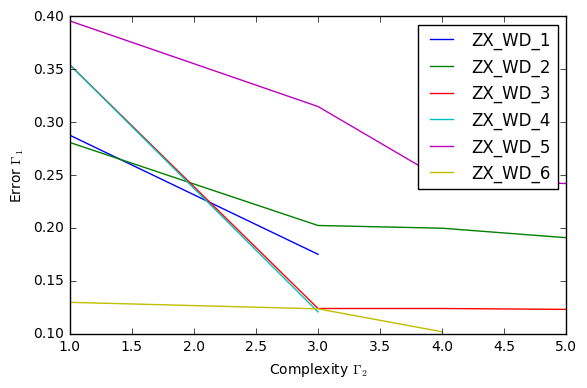

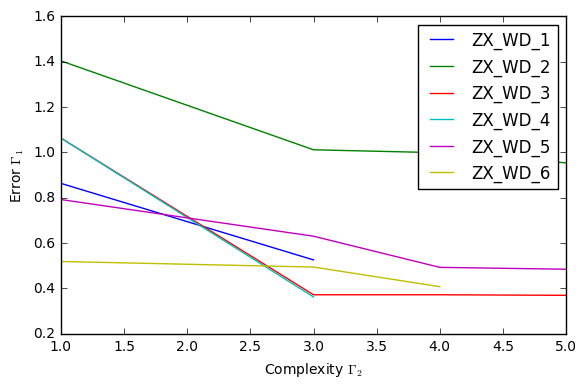

In [142]:
deap_results = learn_nodelay_deap(seg_3)
result_summary_gp(deap_results,varnames[0:var_num_learn])

1.0629999999999999*ZX_WD_6
0.55400000000000005*ZX_WD_4 + 0.55400000000000005*ZX_WD_5
ZX_HW_1/ZX_WD_5 + ZX_WD_4
0.972762645914397*ZX_WD_3
ZX_HW_1 - sin(sin(ZX_HW_1))
5.5149999999999997*sqrt(ZX_HW_2)


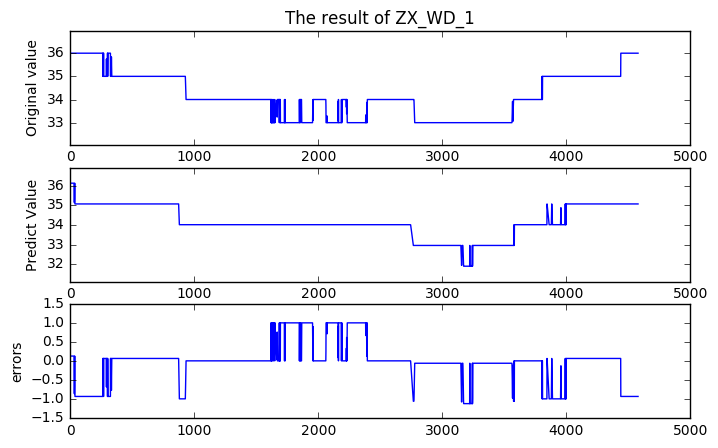

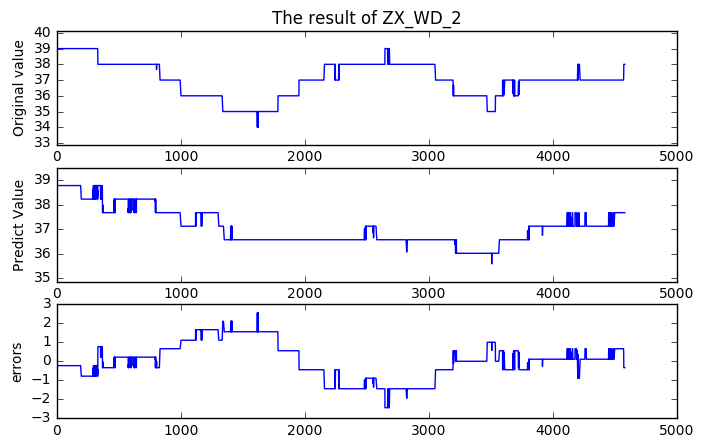

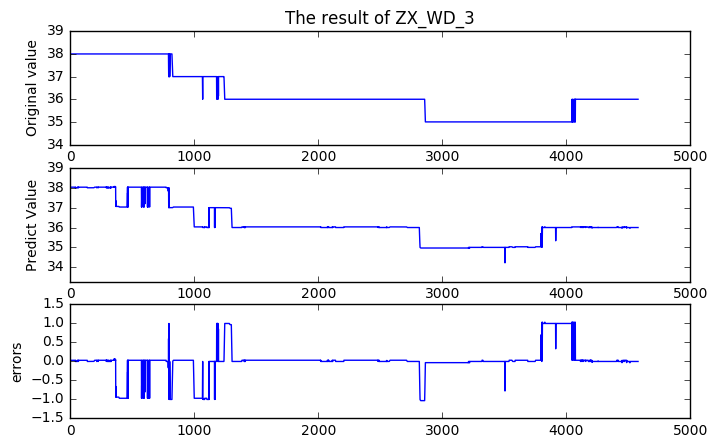

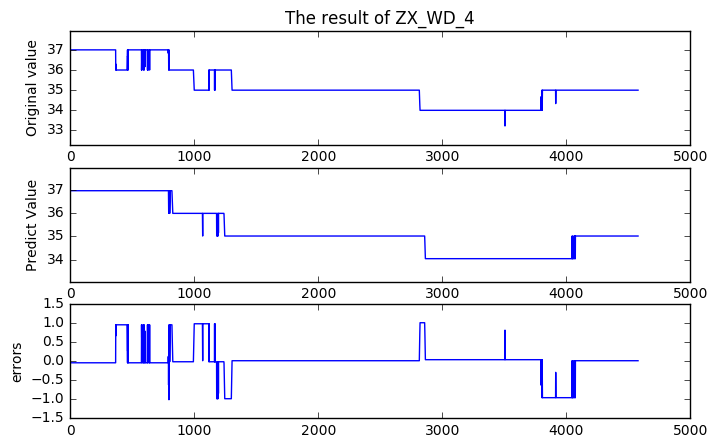

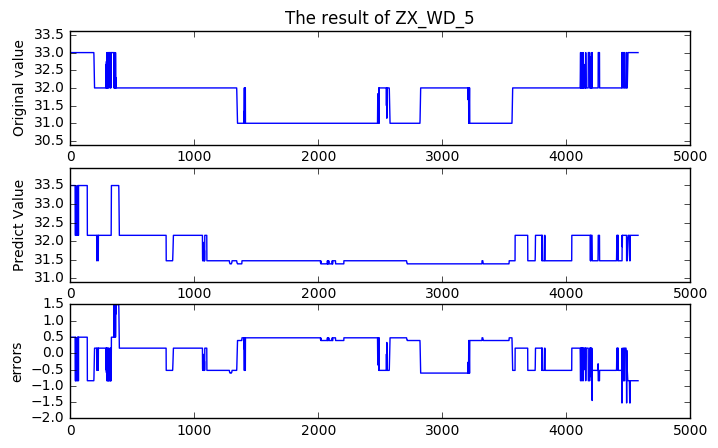

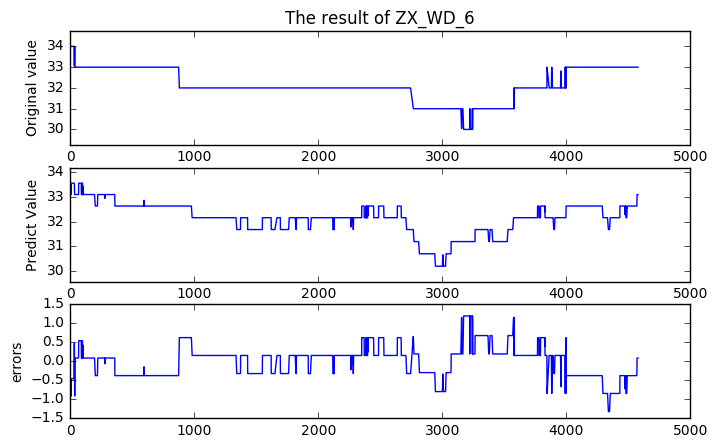

In [143]:
compare_plot_deap([0,0,0,0,0,0],seg_3,deap_results)

#### seg4

-------------------------learn ZX_WD_1------------
gen	evals	min                      	max        	diversity
0  	436  	[ 0.36953269  2.        ]	[ inf  22.]	413      
1  	500  	[ 0.36953269  1.        ]	[ inf  23.]	474      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


2  	500  	[ 0.36953269  1.        ]	[ inf   7.]	475      
3  	500  	[ 0.36953269  1.        ]	[ inf  12.]	465      
4  	500  	[ 0.36953269  1.        ]	[ inf  13.]	483      
5  	500  	[ 0.36755336  1.        ]	[ inf  13.]	479      
6  	500  	[ 0.36755336  1.        ]	[ inf  15.]	472      
7  	500  	[ 0.35953944  1.        ]	[ inf  15.]	466      
8  	500  	[ 0.35953944  1.        ]	[ inf  15.]	462      
9  	500  	[ 0.35953944  1.        ]	[ inf  22.]	461      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


10 	500  	[ 0.35953944  1.        ]	[ inf   6.]	455      
11 	500  	[ 0.35953944  1.        ]	[ inf  10.]	449      
12 	500  	[ 0.35953944  1.        ]	[ inf  10.]	445      
13 	500  	[ 0.35953944  1.        ]	[ inf  12.]	444      
14 	500  	[ 0.32801185  1.        ]	[ inf  13.]	444      
15 	500  	[ 0.32801185  1.        ]	[  2.75579328e+33   1.30000000e+01]	443      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


16 	500  	[ 0.32801185  1.        ]	[ inf   6.]                        	439      
17 	500  	[ 0.32801185  1.        ]	[ inf  11.]                        	435      
18 	500  	[ 0.32801185  1.        ]	[ inf  12.]                        	436      
19 	500  	[ 0.32801185  1.        ]	[ inf  12.]                        	427      
20 	500  	[ 0.32801185  1.        ]	[  3.27805798e+16   1.20000000e+01]	428      
21 	500  	[ 0.32801185  1.        ]	[  1.41328983e+14   1.30000000e+01]	430      
22 	500  	[ 0.32801185  1.        ]	[  6.14932733e+13   1.60000000e+01]	429      
23 	500  	[ 0.32801185  1.        ]	[  4.14755888e+05   1.60000000e+01]	428      
24 	500  	[ 0.32801185  1.        ]	[  2.47850674e+05   1.60000000e+01]	426      
25 	500  	[ 0.32801185  1.        ]	[ 1160.62712867    19.        ]    	422      
26 	500  	[ 0.32801185  1.        ]	[ 1002.62355419    19.        ]    	429      
27 	500  	[ 0.32801185  1.        ]	[ 960.97692438   17.        ]      	434      
28 	500  	[ 0.32

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


31 	500  	[ 0.32801185  1.        ]	[  1.65835488e+09   9.00000000e+00]	428      
32 	500  	[ 0.32801185  1.        ]	[  1.65835488e+09   1.20000000e+01]	421      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


33 	500  	[ 0.32801185  1.        ]	[  4.14755888e+05   9.00000000e+00]	416      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


34 	500  	[ 0.32801185  1.        ]	[ inf   6.]                        	411      
35 	500  	[ 0.32801185  1.        ]	[  1.06310755e+16   1.10000000e+01]	408      
36 	500  	[ 0.32801185  1.        ]	[  4.17158953e+15   1.30000000e+01]	408      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


37 	500  	[ 0.32801185  1.        ]	[ inf   8.]                        	420      
38 	500  	[ 0.3583061  1.       ]  	[ inf   4.]                        	422      
39 	500  	[ 0.3583061  1.       ]  	[ inf  10.]                        	421      
40 	500  	[ 0.3583061  1.       ]  	[ inf  10.]                        	418      
41 	500  	[ 0.3583061  1.       ]  	[ inf  11.]                        	415      
42 	500  	[ 0.3583061  1.       ]  	[ inf  11.]                        	413      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


43 	500  	[ 0.3583061  1.       ]  	[ inf   7.]                        	410      
44 	500  	[ 0.3583061  1.       ]  	[ inf   9.]                        	410      
45 	500  	[ 0.3583061  1.       ]  	[ inf  10.]                        	409      
46 	500  	[ 0.3583061  1.       ]  	[ inf  13.]                        	411      
47 	500  	[ 0.3583061  1.       ]  	[ inf  15.]                        	413      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


48 	500  	[ 0.3583061  1.       ]  	[ inf   6.]                        	412      
49 	500  	[ 0.3583061  1.       ]  	[ inf   9.]                        	411      
--------------------end----------------------------
-------------------------learn ZX_WD_2------------
gen	evals	min                      	max        	diversity
0  	436  	[ 0.54410037  2.        ]	[ inf  22.]	413      
1  	500  	[ 0.53565853  1.        ]	[ inf  19.]	476      
2  	500  	[ 0.53565853  1.        ]	[ inf  19.]	482      
3  	500  	[ 0.53565853  1.        ]	[ inf  19.]	480      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


4  	500  	[ 0.53565853  1.        ]	[ inf  11.]	484      
5  	500  	[ 0.53565853  1.        ]	[ inf  16.]	483      
6  	500  	[ 0.53565853  1.        ]	[ inf  13.]	471      
7  	500  	[ 0.53565853  1.        ]	[ inf  13.]	462      
8  	500  	[ 0.53565853  1.        ]	[ inf  14.]	456      
9  	500  	[ 0.53565853  1.        ]	[ inf  15.]	460      
10 	500  	[ 0.53565853  1.        ]	[  1.06310755e+16   1.50000000e+01]	459      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


11 	500  	[ 0.53565853  1.        ]	[ inf   6.]                        	454      
12 	500  	[ 0.53565853  1.        ]	[ inf  10.]                        	446      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


13 	500  	[ 0.53565853  1.        ]	[ inf   7.]                        	441      
14 	500  	[ 0.53080634  1.        ]	[ inf  11.]                        	438      
15 	500  	[ 0.53080634  1.        ]	[ inf  11.]                        	440      
16 	500  	[ 0.53080634  1.        ]	[ inf  11.]                        	436      
17 	500  	[ 0.53080634  1.        ]	[ inf  11.]                        	431      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


18 	500  	[ 0.52968405  1.        ]	[ inf   6.]                        	428      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


19 	500  	[ 0.52968405  1.        ]	[ inf  10.]                        	426      
20 	500  	[ 0.52968405  1.        ]	[ inf  10.]                        	421      
21 	500  	[ 0.52968405  1.        ]	[ inf  11.]                        	416      
22 	500  	[ 0.52968405  1.        ]	[ inf  11.]                        	415      
23 	500  	[ 0.52968405  1.        ]	[  2.75579328e+33   1.20000000e+01]	415      
24 	500  	[ 0.52968405  1.        ]	[  4.17158953e+15   1.20000000e+01]	412      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


25 	500  	[ 0.52968405  1.        ]	[  1.95683132e+15   8.00000000e+00]	411      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


26 	500  	[ 0.52968405  1.        ]	[  2.75579328e+33   7.00000000e+00]	409      
27 	500  	[ 0.50378845  1.        ]	[  1.06310755e+16   9.00000000e+00]	410      
28 	500  	[ 0.48004123  1.        ]	[  1.95683132e+15   9.00000000e+00]	406      
29 	500  	[ 0.48004123  1.        ]	[  1.41328983e+14   1.10000000e+01]	402      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


30 	500  	[ 0.48004123  1.        ]	[  1.41328983e+14   8.00000000e+00]	399      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


31 	500  	[ 0.48004123  1.        ]	[ inf   6.]                        	396      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


32 	500  	[ 0.48004123  1.        ]	[ inf   8.]                        	393      
33 	500  	[ 0.48004123  1.        ]	[ inf   8.]                        	389      
34 	500  	[ 0.48004123  1.        ]	[  1.06310755e+16   1.00000000e+01]	392      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


35 	500  	[ 0.48004123  1.        ]	[  2.75579328e+33   7.00000000e+00]	390      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


36 	500  	[ 0.52757224  1.        ]	[ inf   5.]                        	391      
37 	500  	[ 0.52757224  1.        ]	[ inf   8.]                        	385      
38 	500  	[ 0.52757224  1.        ]	[ inf   7.]                        	380      
39 	500  	[ 0.5204472  1.       ]  	[ inf   7.]                        	375      
40 	500  	[ 0.5204472  1.       ]  	[ inf   7.]                        	377      
41 	500  	[ 0.5204472  1.       ]  	[ inf   7.]                        	379      
42 	500  	[ 0.5204472  1.       ]  	[ inf   7.]                        	378      
43 	500  	[ 0.5204472  1.       ]  	[ inf   7.]                        	374      
44 	500  	[ 0.44729401  1.        ]	[ inf   8.]                        	371      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


45 	500  	[ 0.44729401  1.        ]	[ inf   8.]                        	373      
46 	500  	[ 0.44729401  1.        ]	[ inf   9.]                        	377      
47 	500  	[ 0.44729401  1.        ]	[  2.75579328e+33   9.00000000e+00]	377      
48 	500  	[ 0.44729401  1.        ]	[  1.06310755e+16   9.00000000e+00]	378      
49 	500  	[ 0.44729401  1.        ]	[  1.95683132e+15   1.10000000e+01]	376      
--------------------end----------------------------
-------------------------learn ZX_WD_3------------
gen	evals	min                      	max        	diversity
0  	436  	[ 0.32407724  2.        ]	[ inf  22.]	411      
1  	500  	[ 0.32407724  1.        ]	[ inf  22.]	472      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


2  	500  	[ 0.32407724  1.        ]	[ inf   5.]	468      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


3  	500  	[ 0.32407724  1.        ]	[ inf   6.]	470      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


4  	500  	[ 0.32407724  1.        ]	[ inf   4.]	472      
5  	500  	[ 0.32407724  1.        ]	[ inf   9.]	466      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


6  	500  	[ 0.32407724  1.        ]	[ inf   4.]	450      
7  	500  	[ 0.32407724  1.        ]	[ inf   9.]	466      
8  	500  	[ 0.32407724  1.        ]	[ inf  11.]	462      
9  	500  	[ 0.32407724  1.        ]	[ inf  12.]	455      
10 	500  	[ 0.32407724  1.        ]	[ inf  12.]	454      
11 	500  	[ 0.32407724  1.        ]	[ inf  11.]	452      
12 	500  	[ 0.32407724  1.        ]	[ inf  14.]	456      
13 	500  	[ 0.32407724  1.        ]	[ inf  14.]	454      
14 	500  	[ 0.32407724  1.        ]	[  2.75579328e+33   1.40000000e+01]	449      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


15 	500  	[ 0.32407724  1.        ]	[ inf   7.]                        	444      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


16 	500  	[ 0.32407724  1.        ]	[ inf   8.]                        	442      
17 	500  	[ 0.32407724  1.        ]	[  3.27805798e+16   1.10000000e+01]	442      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


18 	500  	[ 0.32407724  1.        ]	[ inf  11.]                        	437      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


19 	500  	[ 0.32407724  1.        ]	[ inf   4.]                        	425      
20 	500  	[ 0.32407724  1.        ]	[ inf  10.]                        	423      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


21 	500  	[ 0.32407724  1.        ]	[ inf   5.]                        	415      
22 	500  	[ 0.32407724  1.        ]	[ inf  10.]                        	415      
23 	500  	[ 0.32407724  1.        ]	[ inf  12.]                        	407      
24 	500  	[ 0.32407724  1.        ]	[ inf  12.]                        	410      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


25 	500  	[ 0.32407724  1.        ]	[ inf   6.]                        	405      
26 	500  	[ 0.32407724  1.        ]	[ inf   9.]                        	409      
27 	500  	[ 0.32407724  1.        ]	[ inf  10.]                        	416      
28 	500  	[ 0.32407724  1.        ]	[ inf  11.]                        	419      
29 	500  	[ 0.32407724  1.        ]	[ inf  15.]                        	420      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


30 	500  	[ 0.32407724  1.        ]	[  1.81761430e+15   1.50000000e+01]	424      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


31 	500  	[ 0.32407724  1.        ]	[  1.18502321e+14   1.10000000e+01]	423      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


32 	500  	[ 0.32407724  1.        ]	[ inf   8.]                        	421      
33 	500  	[ 0.32407724  1.        ]	[  3.27805798e+16   9.00000000e+00]	414      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


34 	500  	[ 0.32407724  1.        ]	[ inf   7.]                        	412      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


35 	500  	[ 0.32407724  1.        ]	[ inf   7.]                        	409      
36 	500  	[ 0.32407724  1.        ]	[ inf  11.]                        	407      
37 	500  	[ 0.32407724  1.        ]	[ inf  12.]                        	411      
38 	500  	[ 0.32407724  1.        ]	[  2.75579328e+33   1.40000000e+01]	409      
39 	500  	[ 0.32407724  1.        ]	[  4.17158953e+15   1.40000000e+01]	413      
40 	500  	[ 0.32407724  1.        ]	[  6.14932733e+13   1.40000000e+01]	409      
41 	500  	[ 0.32407724  1.        ]	[  1.65835488e+09   1.40000000e+01]	411      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


42 	500  	[ 0.32407724  1.        ]	[  4.14753903e+05   1.40000000e+01]	412      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


43 	500  	[ 0.32407724  1.        ]	[  4.14753903e+05   9.00000000e+00]	411      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


44 	500  	[ 0.32407724  1.        ]	[  2.41956219e+05   1.10000000e+01]	406      
45 	500  	[ 0.32407724  1.        ]	[ 1346.1368692    17.       ]      	405      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


46 	500  	[ 0.32407724  1.        ]	[ inf   6.]                        	406      
47 	500  	[ 0.32407724  1.        ]	[ inf   9.]                        	397      
48 	500  	[ 0.32407724  1.        ]	[  2.75579328e+33   9.00000000e+00]	397      
49 	500  	[ 0.31390691  1.        ]	[  1.41328983e+14   9.00000000e+00]	395      
--------------------end----------------------------
-------------------------learn ZX_WD_4------------
gen	evals	min                      	max        	diversity
0  	436  	[ 0.32606898  2.        ]	[ inf  22.]	413      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


1  	500  	[ 0.32606898  1.        ]	[ inf   9.]	476      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


2  	500  	[ 0.32606898  1.        ]	[ inf   9.]	479      
3  	500  	[ 0.32606898  1.        ]	[ inf  12.]	466      
4  	500  	[ 0.32606898  1.        ]	[ inf  13.]	484      
5  	500  	[ 0.32606898  1.        ]	[ inf  14.]	477      
6  	500  	[ 0.32606898  1.        ]	[ inf  15.]	474      
7  	500  	[ 0.32606898  1.        ]	[ inf  15.]	471      
8  	500  	[ 0.32606898  1.        ]	[ inf  18.]	466      
9  	500  	[ 0.31917384  1.        ]	[  3.27805798e+16   1.80000000e+01]	468      
10 	500  	[ 0.31917384  1.        ]	[  4.14755005e+05   2.20000000e+01]	466      
11 	500  	[ 0.31917384  1.        ]	[ 1347.233943    22.      ]        	458      
12 	500  	[ 0.31917384  1.        ]	[ 1159.74608778    22.        ]    	449      
13 	500  	[ 0.31917384  1.        ]	[ 1159.74608778    22.        ]    	451      
14 	500  	[ 0.31917384  1.        ]	[ 1002.98977778    22.        ]    	452      
15 	500  	[ 0.31917384  1.        ]	[ 608.48187264   22.        ]      	451      
16 	500  	[ 0.319173

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


27 	500  	[ 0.29166841  1.        ]	[ inf   9.]                        	416      
28 	500  	[ 0.29166841  1.        ]	[  2.47849803e+05   1.50000000e+01]	408      
29 	500  	[ 0.29166841  1.        ]	[ 608.48187264   16.        ]      	402      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


30 	500  	[ 0.30631852  1.        ]	[ inf   6.]                        	436      
31 	500  	[ 0.30631852  1.        ]	[ inf  11.]                        	431      
32 	500  	[ 0.30631852  1.        ]	[ inf  11.]                        	424      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


33 	500  	[ 0.30631852  1.        ]	[ inf   6.]                        	419      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


34 	500  	[ 0.30619631  1.        ]	[ inf   9.]                        	418      
35 	500  	[ 0.30619631  1.        ]	[ inf  12.]                        	414      
36 	500  	[ 0.30619631  1.        ]	[  2.75579328e+33   1.10000000e+01]	411      
37 	500  	[ 0.30619631  1.        ]	[  1.06310755e+16   1.10000000e+01]	403      
38 	500  	[ 0.30619631  1.        ]	[  1.81761430e+15   1.10000000e+01]	398      
39 	500  	[ 0.30619631  1.        ]	[  1.41328983e+14   1.10000000e+01]	402      
40 	500  	[ 0.30619631  1.        ]	[  1.41328983e+14   1.10000000e+01]	402      
41 	500  	[ 0.30601419  1.        ]	[  6.14932733e+13   1.30000000e+01]	403      
42 	500  	[ 0.30601419  1.        ]	[  4.14755005e+05   1.30000000e+01]	404      
43 	500  	[ 0.30311238  1.        ]	[  4.14755005e+05   1.40000000e+01]	402      
44 	500  	[ 0.30311238  1.        ]	[ 1347.233943    14.      ]        	395      
45 	500  	[ 0.30311238  1.        ]	[ 1309.28390205    14.        ]    	394      
46 	500  	[ 0.30

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


14 	500  	[ 0.24023188  1.        ]	[  1.95683132e+15   1.10000000e+01]	460      
15 	500  	[ 0.24023188  1.        ]	[  4.14759022e+05   1.30000000e+01]	455      
16 	500  	[ 0.24023188  1.        ]	[  2.47853739e+05   1.70000000e+01]	452      
17 	500  	[ 0.23965242  1.        ]	[ 1233.99357424    17.        ]    	450      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


18 	500  	[ 0.26095357  1.        ]	[ inf   6.]                        	444      
19 	500  	[ 0.26095357  1.        ]	[ inf   9.]                        	441      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


20 	500  	[ 0.23505034  1.        ]	[ inf   6.]                        	435      
21 	500  	[ 0.23505034  1.        ]	[ inf  10.]                        	433      
22 	500  	[ 0.23505034  1.        ]	[ inf   9.]                        	428      
23 	500  	[ 0.23505034  1.        ]	[ inf  11.]                        	427      
24 	500  	[ 0.23505034  1.        ]	[  2.75579328e+33   1.30000000e+01]	425      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


25 	500  	[ 0.23505034  1.        ]	[ inf   8.]                        	421      
26 	500  	[ 0.23505034  1.        ]	[  2.75579328e+33   1.00000000e+01]	425      
27 	500  	[ 0.22928491  1.        ]	[  3.27805798e+16   1.00000000e+01]	428      
28 	500  	[ 0.22928491  1.        ]	[  4.17158953e+15   1.00000000e+01]	424      
29 	500  	[ 0.22928491  1.        ]	[  1.81761430e+15   1.00000000e+01]	422      
30 	500  	[ 0.22928491  1.        ]	[  1.41328983e+14   1.00000000e+01]	423      
31 	500  	[ 0.22928491  1.        ]	[  1.65835488e+09   1.30000000e+01]	421      
32 	500  	[ 0.2165248  1.       ]  	[  1.65835488e+09   1.30000000e+01]	419      
33 	500  	[ 0.2165248  1.       ]  	[  4.14759022e+05   1.30000000e+01]	415      
34 	500  	[ 0.2165248  1.       ]  	[  2.41961248e+05   1.40000000e+01]	416      
35 	500  	[ 0.2165248  1.       ]  	[ 1313.30008708    15.        ]    	420      
36 	500  	[ 0.2165248  1.       ]  	[ 1163.76368196    15.        ]    	424      
37 	500  	[ 0.21

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


41 	500  	[ 0.2165248  1.       ]  	[ inf   5.]                        	418      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


42 	500  	[ 0.26813927  1.        ]	[ inf   4.]                        	437      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


43 	500  	[ 0.26813927  1.        ]	[ inf   6.]                        	435      
44 	500  	[ 0.26813927  1.        ]	[ inf   9.]                        	439      
45 	500  	[ 0.26813927  1.        ]	[ inf  12.]                        	440      
46 	500  	[ 0.26813927  1.        ]	[ inf  13.]                        	436      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


47 	500  	[ 0.26813927  1.        ]	[ inf   4.]                        	433      
48 	500  	[ 0.26813927  1.        ]	[ inf   9.]                        	431      
49 	500  	[ 0.26813927  1.        ]	[ inf   9.]                        	432      
--------------------end----------------------------
-------------------------learn ZX_WD_6------------
gen	evals	min                      	max        	diversity
0  	436  	[ 0.47419575  2.        ]	[ inf  22.]	413      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


1  	500  	[ 0.43131538  1.        ]	[ inf   8.]	478      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


2  	500  	[ 0.43131538  1.        ]	[ inf   6.]	474      
3  	500  	[ 0.34299918  1.        ]	[ inf  11.]	467      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


4  	500  	[ 0.34299918  1.        ]	[ inf   5.]	457      
5  	500  	[ 0.34299918  1.        ]	[ inf   9.]	468      
6  	500  	[ 0.34299918  1.        ]	[ inf  10.]	465      
7  	500  	[ 0.34299918  1.        ]	[ inf  11.]	471      
8  	500  	[ 0.34299918  1.        ]	[ inf  13.]	469      
9  	500  	[ 0.33249767  1.        ]	[ inf  14.]	462      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


10 	500  	[ 0.33249767  1.        ]	[ inf   8.]	456      
11 	500  	[ 0.33249767  1.        ]	[ inf  14.]	452      
12 	500  	[ 0.33249767  1.        ]	[ inf  14.]	450      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


13 	500  	[ 0.33137419  1.        ]	[ inf   9.]	445      
14 	500  	[ 0.33137419  1.        ]	[ inf  10.]	441      
15 	500  	[ 0.33137419  1.        ]	[  1.06310755e+16   1.10000000e+01]	441      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


16 	500  	[ 0.33137419  1.        ]	[  1.06310755e+16   9.00000000e+00]	440      
17 	500  	[ 0.31881154  1.        ]	[  3.27805798e+16   1.00000000e+01]	434      
18 	500  	[ 0.29855934  1.        ]	[ inf  11.]                        	430      
19 	500  	[ 0.29855934  1.        ]	[  4.17158953e+15   1.30000000e+01]	425      
20 	500  	[ 0.29855934  1.        ]	[  1.41328983e+14   1.50000000e+01]	420      
21 	500  	[ 0.29855934  1.        ]	[  1.65835488e+09   1.60000000e+01]	414      
22 	500  	[ 0.29855934  1.        ]	[  2.47853108e+05   1.60000000e+01]	411      
23 	500  	[ 0.29855934  1.        ]	[  2.41960620e+05   1.60000000e+01]	398      
24 	500  	[ 0.29855934  1.        ]	[ 1233.34324183    18.        ]    	385      
25 	500  	[ 0.29855934  1.        ]	[ 1171.78873186    14.        ]    	400      
26 	500  	[ 0.29855934  1.        ]	[ 1312.64978524    14.        ]    	426      
27 	500  	[ 0.29855934  1.        ]	[ 1163.11588816    16.        ]    	427      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


28 	500  	[ 0.29855934  1.        ]	[  2.41960620e+05   9.00000000e+00]	420      
29 	500  	[ 0.29855934  1.        ]	[ 1233.34324183    10.        ]    	421      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


30 	500  	[ 0.29855934  1.        ]	[  2.75579328e+33   6.00000000e+00]	415      
31 	500  	[ 0.29855934  1.        ]	[ inf  10.]                        	412      
32 	500  	[ 0.29855934  1.        ]	[  2.75579328e+33   1.10000000e+01]	408      
33 	500  	[ 0.29855934  1.        ]	[  1.95683132e+15   1.10000000e+01]	406      
34 	500  	[ 0.29855934  1.        ]	[  1.41328983e+14   1.60000000e+01]	402      
35 	500  	[ 0.29855934  1.        ]	[  1.65835488e+09   1.60000000e+01]	399      
36 	500  	[ 0.29855934  1.        ]	[  4.14758364e+05   1.60000000e+01]	399      
37 	500  	[ 0.29855934  1.        ]	[  2.47853108e+05   1.70000000e+01]	398      
38 	500  	[ 0.29855934  1.        ]	[ 1312.64978524    17.        ]    	397      
39 	500  	[ 0.29855934  1.        ]	[ 1171.78873186    15.        ]    	394      
40 	500  	[ 0.29855934  1.        ]	[ 1163.11588816    15.        ]    	393      
41 	500  	[ 0.29855934  1.        ]	[ 1006.35194575    15.        ]    	395      
42 	500  	[ 0.29

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


44 	500  	[ 0.29855934  1.        ]	[  3.27805798e+16   7.00000000e+00]	390      
45 	500  	[ 0.29855934  1.        ]	[  2.41960620e+05   1.10000000e+01]	384      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


46 	500  	[ 0.29855934  1.        ]	[ 1350.60537975     7.        ]    	381      
47 	500  	[ 0.29855934  1.        ]	[ 1350.60537975     9.        ]    	382      
48 	500  	[ 0.29855934  1.        ]	[ 1233.34324183    13.        ]    	381      
49 	500  	[ 0.29855934  1.        ]	[ 1163.11588816    13.        ]    	381      
--------------------end----------------------------
************************* ZX_WD_1 *********************
ZX_WD_4 - cos(ZX_WD_5)
1.099*ZX_WD_5
1.099*ZX_WD_5
ZX_HW_2
---------------------------------------------------------------------------------
complexity         nrmse_test         nrmse_train         rmse_test         rmse_train
4.000000         0.181979         0.179153         0.363957         0.358306
3.000000         0.177278         0.179770         0.354556         0.359539
3.000000         0.177278         0.179770         0.354556         0.359539
1.000000         0.280330         0.282386         0.560659         0.564772
****************************

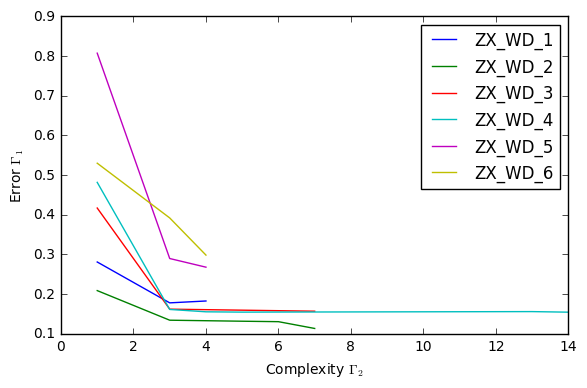

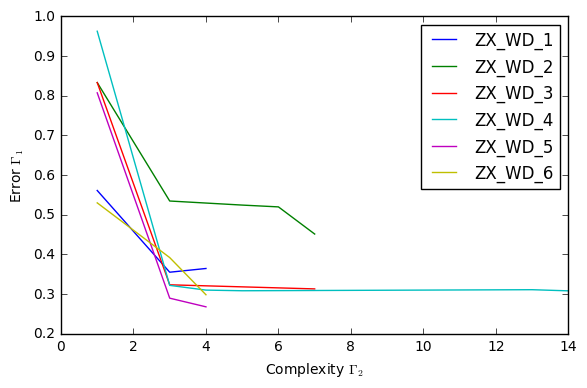

In [145]:
deap_results = learn_nodelay_deap(seg_4)
result_summary_gp(deap_results,varnames[0:var_num_learn])

ZX_WD_4 - cos(ZX_WD_5)
ZX_WD_3 + sqrt(sin(ZX_HW_2 - 9.2330000000000005))
ZX_WD_5 + log(cos(ZX_WD_5)) + 5.2590000000000003
0.73199999999999998*ZX_WD_1 + 0.73199999999999998*log(ZX_HW_1*ZX_HW_2*square(ZX_WD_5) + cos(ZX_HW_1))
5.3570000000000002*sqrt(ZX_WD_1)
5.468*sqrt(ZX_WD_1)


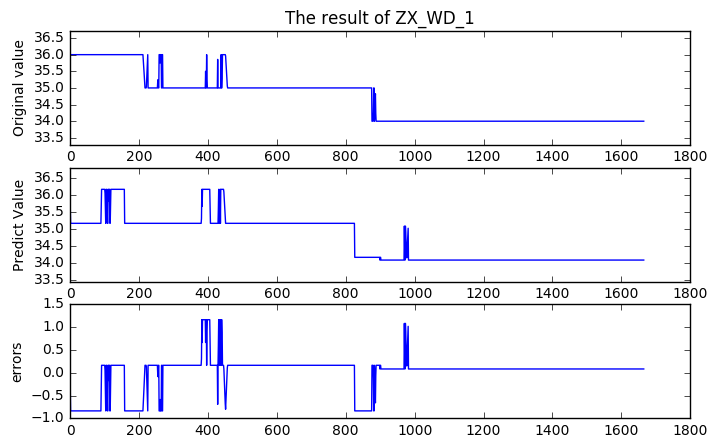

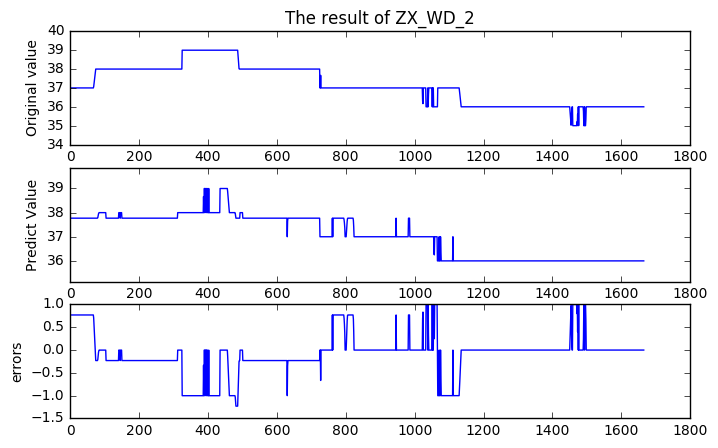

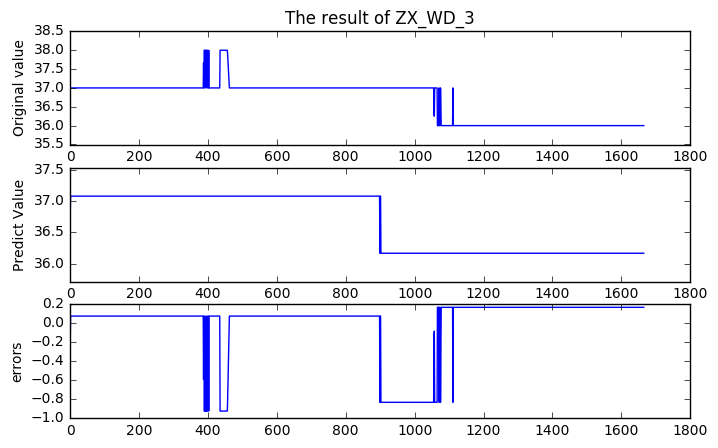

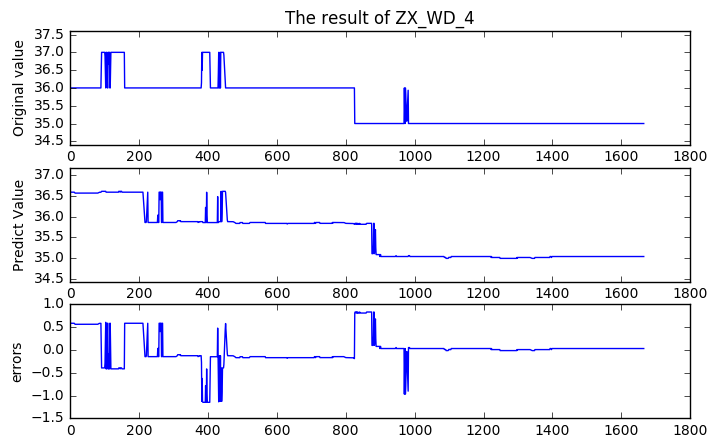

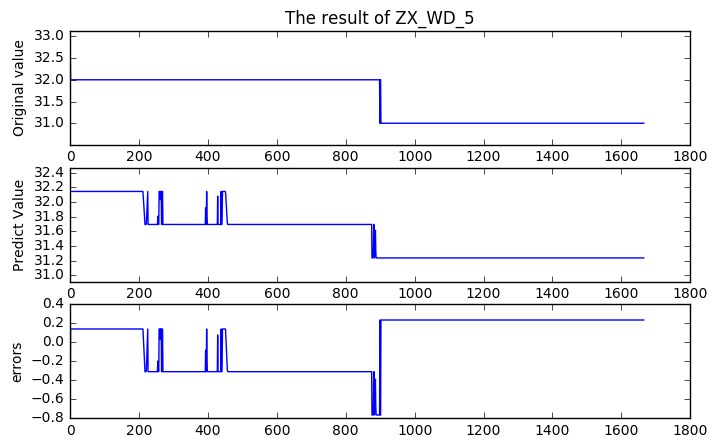

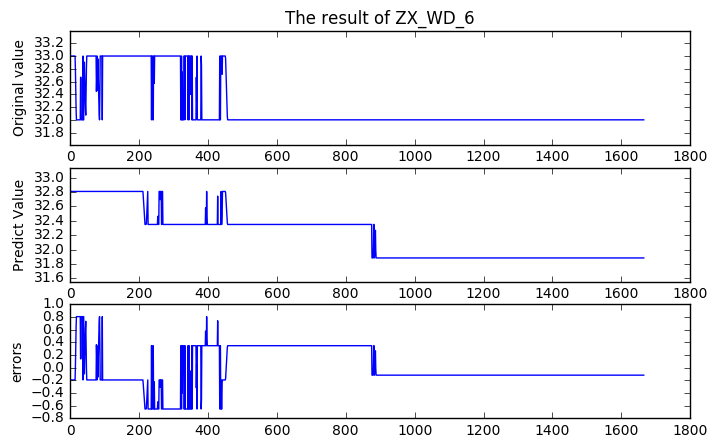

In [146]:
compare_plot_deap([0,0,0,0,0,0],seg_4,deap_results)

### Learn for segment data set wit time delay

#### seg1

In [148]:
time_delays = np.arange(0,16)

-------------------------learn ZX_WD_1------------
----------prepare_data_delay_deap------------------
del the target variable ZX_WD_1_dt0
number of variable: 207
the shape of X
(828, 207)
the shape of y
(828,)


/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:15: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


gen	evals	min                      	max        	diversity
0  	489  	[ 0.11940241  2.        ]	[ inf  22.]	477      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


1  	500  	[ 0.07525339  1.        ]	[ 1382.37046205     4.        ]	495      
2  	500  	[ 0.02750899  1.        ]	[ 606.8901874    9.       ]    	492      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


3  	500  	[ 0.02750899  1.        ]	[ 606.8901874    4.       ]    	488      
4  	500  	[ 0.02750899  1.        ]	[ 606.89498733   10.        ]  	489      
5  	500  	[ 0.02750899  1.        ]	[ 606.89498733   10.        ]  	490      
6  	500  	[ 0.02750899  1.        ]	[ 606.89498733   10.        ]  	490      
7  	500  	[ 0.02750899  1.        ]	[ 606.89498733    9.        ]  	489      
8  	500  	[ 0.02750899  1.        ]	[ 606.87578737    9.        ]  	489      
9  	500  	[ 0.02750899  1.        ]	[ 415.78878566   11.        ]  	490      
10 	500  	[ 0.02750899  1.        ]	[ 402.70066577   11.        ]  	489      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


11 	500  	[ 0.02750899  1.        ]	[ 402.61311837    6.        ]  	487      
12 	500  	[ 0.02750899  1.        ]	[ 34.91248352   9.        ]    	487      
13 	500  	[ 0.02750899  1.        ]	[ 34.78878933  10.        ]    	487      
14 	500  	[ 0.02750899  1.        ]	[ 34.57834441  12.        ]    	488      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


15 	500  	[ 0.02750899  1.        ]	[ 34.44449899   8.        ]    	488      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


16 	500  	[ 0.02750899  1.        ]	[ 32.61539171   9.        ]    	486      
17 	500  	[ 0.02750899  1.        ]	[ 32.57725844  11.        ]    	486      
18 	500  	[ 0.02750899  1.        ]	[ 32.50094774  11.        ]    	482      
19 	500  	[ 0.02750899  1.        ]	[ 32.48067017  13.        ]    	481      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


20 	500  	[ 0.02750899  1.        ]	[ 32.46381753   9.        ]    	481      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


21 	500  	[ 0.02750899  1.        ]	[ 34.40236468   6.        ]    	480      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


22 	500  	[ 0.02750899  1.        ]	[ 32.57725844   6.        ]    	478      
23 	500  	[ 0.02750899  1.        ]	[ 32.50094774   9.        ]    	475      
24 	500  	[ 0.02750899  1.        ]	[ 32.50065841   9.        ]    	472      
25 	500  	[ 0.02750899  1.        ]	[ 32.48067017  11.        ]    	474      
26 	500  	[ 0.02750899  1.        ]	[ 32.449506  11.      ]        	472      
27 	500  	[ 0.02750899  1.        ]	[  3.85809783  11.        ]    	473      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


28 	500  	[ 0.02750899  1.        ]	[ 32.449506   6.      ]        	472      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


29 	500  	[ 0.02750899  1.        ]	[ 3.86171021  6.        ]      	473      
30 	500  	[ 0.02750899  1.        ]	[  3.8505776  10.       ]      	468      
31 	500  	[ 0.02750899  1.        ]	[  3.84289971  12.        ]    	467      
32 	500  	[ 0.02750899  1.        ]	[  3.83549291  13.        ]    	467      
33 	500  	[ 0.02750899  1.        ]	[  3.62498887  13.        ]    	469      
34 	500  	[ 0.02750899  1.        ]	[  3.61330918  14.        ]    	469      
35 	500  	[ 0.02750899  1.        ]	[  3.32215809  15.        ]    	464      
36 	500  	[ 0.02750899  1.        ]	[  2.44974376  20.        ]    	459      
37 	500  	[ 0.02750899  1.        ]	[  2.43204605  20.        ]    	453      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


38 	500  	[ 0.02750899  1.        ]	[ 1228.84345714     6.        ]	469      
39 	500  	[ 0.02750899  1.        ]	[ 32.44877094  12.        ]    	461      
40 	500  	[ 0.02750899  1.        ]	[  3.62498887  12.        ]    	448      
41 	500  	[ 0.02750899  1.        ]	[  3.61564814  12.        ]    	449      
42 	500  	[ 0.02750899  1.        ]	[  3.32871385  16.        ]    	455      
43 	500  	[ 0.02750899  1.        ]	[  3.32724372  13.        ]    	455      
44 	500  	[ 0.02750899  1.        ]	[  3.32363047  14.        ]    	457      
45 	500  	[ 0.02750899  1.        ]	[  3.31706466  17.        ]    	456      
46 	500  	[ 0.02750899  1.        ]	[  3.31088786  15.        ]    	446      
47 	500  	[ 0.02750899  1.        ]	[  3.32215809  15.        ]    	465      
48 	500  	[ 0.02750899  1.        ]	[  2.43689199  16.        ]    	463      
49 	500  	[ 0.02750899  1.        ]	[  2.41260132  17.        ]    	458      
--------------------end----------------------------
------------

/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:15: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


gen	evals	min                      	max        	diversity
0  	489  	[ 1.18855895  2.        ]	[ inf  22.]	477      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


1  	500  	[ 0.15066058  1.        ]	[ 1486.16334311     4.        ]	496      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


2  	500  	[ 0.09388932  1.        ]	[ 604.55707093    6.        ]  	492      
3  	500  	[ 0.09388932  1.        ]	[ 604.55787502    8.        ]  	490      
4  	500  	[ 0.09388932  1.        ]	[ 604.55787502   11.        ]  	489      
5  	500  	[ 0.09388932  1.        ]	[ 604.55787502   11.        ]  	492      
6  	500  	[ 0.09388932  1.        ]	[ 604.55306773   11.        ]  	491      
7  	500  	[ 0.09388932  1.        ]	[ 604.52822896   12.        ]  	491      
8  	500  	[ 0.09388932  1.        ]	[ 413.25309974   12.        ]  	491      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


9  	500  	[ 0.09388932  1.        ]	[ 400.56154177    8.        ]  	489      
10 	500  	[ 0.09388932  1.        ]	[ 36.67743978  12.        ]    	489      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


11 	500  	[ 0.09388932  1.        ]	[ 37.13345927   7.        ]    	488      
12 	500  	[ 0.09388932  1.        ]	[ 36.63580022  10.        ]    	489      
13 	500  	[ 0.09388932  1.        ]	[ 34.76739977  11.        ]    	488      
14 	500  	[ 0.09388932  1.        ]	[ 29.02374224  11.        ]    	488      
15 	500  	[ 0.09388932  1.        ]	[  6.18531769  14.        ]    	487      
16 	500  	[ 0.09388932  1.        ]	[  6.17750245  14.        ]    	488      
17 	500  	[ 0.09388932  1.        ]	[  6.1730871  14.       ]      	487      
18 	500  	[ 0.09388932  1.        ]	[  5.97060729  15.        ]    	490      
19 	500  	[ 0.09388932  1.        ]	[  5.6670307  15.       ]      	489      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


20 	500  	[ 0.09388932  1.        ]	[ 34.76351862   7.        ]    	488      
21 	500  	[ 0.09388932  1.        ]	[  6.1730871  10.       ]      	482      
22 	500  	[ 0.09388932  1.        ]	[  5.97060729  11.        ]    	484      
23 	500  	[ 0.09388932  1.        ]	[  5.97060729  11.        ]    	486      
24 	500  	[ 0.09388932  1.        ]	[  5.67405914  12.        ]    	487      
25 	500  	[ 0.09370504  1.        ]	[  5.66568538  13.        ]    	480      
26 	500  	[ 0.09370504  1.        ]	[  5.65764586  14.        ]    	477      
27 	500  	[ 0.09370504  1.        ]	[  3.56110999  15.        ]    	471      
28 	500  	[ 0.09370504  1.        ]	[  3.55179195  15.        ]    	459      
29 	500  	[ 0.09370504  1.        ]	[  3.55179195  20.        ]    	461      
30 	500  	[ 0.09370504  1.        ]	[  3.54634723  20.        ]    	452      
31 	500  	[ 0.09370504  1.        ]	[  3.54634723  20.        ]    	451      
32 	500  	[ 0.09370504  1.        ]	[  3.54089415  20.        ] 

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


34 	500  	[ 0.09370504  1.        ]	[  5.67037308  10.        ]    	452      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


35 	500  	[ 0.09370504  1.        ]	[ 6.1814113  8.       ]        	461      
36 	500  	[ 0.09370504  1.        ]	[  5.66568538  13.        ]    	456      
37 	500  	[ 0.09370504  1.        ]	[  3.56265642  13.        ]    	448      
38 	500  	[ 0.09370032  1.        ]	[  3.55722833  13.        ]    	447      
39 	500  	[ 0.09370032  1.        ]	[  3.55722833  15.        ]    	465      
40 	500  	[ 0.09370032  1.        ]	[  3.55179195  15.        ]    	461      
41 	500  	[ 0.09370032  1.        ]	[  3.54089415  17.        ]    	461      
42 	500  	[ 0.09370032  1.        ]	[  3.53758196  20.        ]    	461      
43 	500  	[ 0.09370032  1.        ]	[  3.52665227  20.        ]    	454      
44 	500  	[ 0.09370032  1.        ]	[  2.41567045  17.        ]    	450      
45 	500  	[ 0.09367926  1.        ]	[  3.53169166  17.        ]    	450      
46 	500  	[ 0.09362113  1.        ]	[  3.53995098  17.        ]    	462      
47 	500  	[ 0.09360338  1.        ]	[  2.41709877  16.        ] 

/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:15: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


gen	evals	min                      	max        	diversity
0  	489  	[ 0.63196247  2.        ]	[ inf  22.]	477      
1  	500  	[ 0.02850623  1.        ]	[ 605.90944635   16.        ]	494      
2  	500  	[ 0.01327701  1.        ]	[ 605.91505278   16.        ]	493      
3  	500  	[ 0.01327701  1.        ]	[ 605.91985246   16.        ]	491      
4  	500  	[ 0.01327701  1.        ]	[ 605.91985246   17.        ]	493      
5  	500  	[ 0.01327701  1.        ]	[ 605.8902438   16.       ]  	492      
6  	500  	[ 0.01327701  1.        ]	[ 414.59606794   16.        ]	491      
7  	500  	[ 0.01327701  1.        ]	[ 401.64189095   16.        ]	487      
8  	500  	[ 0.01327701  1.        ]	[ 33.56265718  19.        ]  	486      
9  	500  	[ 0.01327701  1.        ]	[ 33.43601609  19.        ]  	483      
10 	500  	[ 0.01327701  1.        ]	[ 33.39590194  19.        ]  	485      
11 	500  	[ 0.01327701  1.        ]	[  4.59622535  19.        ]  	485      
12 	500  	[ 0.01327701  1.        ]	[  4.2933750

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


13 	500  	[ 0.01327701  1.        ]	[  4.58201404  11.        ]  	494      
14 	500  	[ 0.01327701  1.        ]	[  4.59385985  13.        ]  	496      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


15 	500  	[ 0.01327701  1.        ]	[ 402.36187403    6.        ]	495      
16 	500  	[ 0.01327701  1.        ]	[ 33.51733495  12.        ]  	491      
17 	500  	[ 0.01327701  1.        ]	[ 33.44709956  12.        ]  	490      
18 	500  	[ 0.01327701  1.        ]	[ 33.43601609  12.        ]  	490      
19 	500  	[ 0.01327701  1.        ]	[ 33.48430707  12.        ]  	490      
20 	500  	[ 0.01327701  1.        ]	[ 33.48430707  13.        ]  	489      
21 	500  	[ 0.01327701  1.        ]	[ 33.4471158  15.       ]    	489      
22 	500  	[ 0.01327701  1.        ]	[ 33.42679593  15.        ]  	488      
23 	500  	[ 0.01327701  1.        ]	[  4.82319936  15.        ]  	486      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


24 	500  	[ 0.01327701  1.        ]	[ 35.56524521   6.        ]  	484      
25 	500  	[ 0.01327701  1.        ]	[ 33.52424317  10.        ]  	482      
26 	500  	[ 0.01327701  1.        ]	[ 33.47783554  10.        ]  	480      
27 	500  	[ 0.01327701  1.        ]	[ 33.44709956  10.        ]  	478      
28 	500  	[ 0.01327701  1.        ]	[ 33.41901802  11.        ]  	478      
29 	500  	[ 0.01327701  1.        ]	[  4.81556564  13.        ]  	478      
30 	500  	[ 0.01327701  1.        ]	[  4.80312558  14.        ]  	474      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


31 	500  	[ 0.01327701  1.        ]	[ 33.39516833   6.        ]  	468      
32 	500  	[ 0.01327701  1.        ]	[ 4.81116515  9.        ]    	463      
33 	500  	[ 0.01327701  1.        ]	[  4.8035123  15.       ]    	462      
34 	500  	[ 0.01327701  1.        ]	[  4.79910075  15.        ]  	457      
35 	500  	[ 0.01327701  1.        ]	[  4.58912519  15.        ]  	453      
36 	500  	[ 0.01327701  1.        ]	[  4.29444903  15.        ]  	452      
37 	500  	[ 0.01327701  1.        ]	[  4.28577316  16.        ]  	438      
38 	500  	[ 0.01327701  1.        ]	[  2.16569756  16.        ]  	423      
39 	500  	[ 0.01327701  1.        ]	[  2.15589411  16.        ]  	408      
40 	500  	[ 0.01327701  1.        ]	[  2.15177443  16.        ]  	388      
41 	500  	[ 0.01327701  1.        ]	[  2.16123165  17.        ]  	425      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


42 	500  	[ 0.01327701  1.        ]	[ 35.43650167   7.        ]  	433      
43 	500  	[ 0.01327701  1.        ]	[  4.59622535  12.        ]  	420      
44 	500  	[ 0.01327701  1.        ]	[  4.28684908  12.        ]  	426      
45 	500  	[ 0.01327701  1.        ]	[  2.16929722  13.        ]  	415      
46 	500  	[ 0.01327701  1.        ]	[  2.16929722  13.        ]  	410      
47 	500  	[ 0.01327701  1.        ]	[  2.17015427  13.        ]  	431      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


48 	500  	[ 0.01327701  1.        ]	[ 33.52424317   6.        ]  	423      
49 	500  	[ 0.01327701  1.        ]	[  4.58438565  10.        ]  	418      
--------------------end----------------------------
-------------------------learn ZX_WD_4------------
----------prepare_data_delay_deap------------------
del the target variable ZX_WD_4_dt0
number of variable: 207
the shape of X
(828, 207)
the shape of y
(828,)


/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:15: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


gen	evals	min                      	max        	diversity
0  	489  	[ 0.07244232  2.        ]	[ inf  22.]	477      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


1  	500  	[ 0.02899038  1.        ]	[ 606.90210752    9.        ]	494      
2  	500  	[ 0.02899038  1.        ]	[ 606.90210752   13.        ]	494      
3  	500  	[ 0.02899038  1.        ]	[ 606.90690736   10.        ]	492      
4  	500  	[ 0.01615409  1.        ]	[ 606.90690736   11.        ]	491      
5  	500  	[ 0.01615409  1.        ]	[ 606.88210109   11.        ]	491      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


6  	500  	[ 0.01615409  1.        ]	[ 606.8733077    7.       ]  	491      
7  	500  	[ 0.01615409  1.        ]	[ 415.80857723    9.        ]	491      
8  	500  	[ 0.01615409  1.        ]	[ 403.2383401   10.       ]  	487      
9  	500  	[ 0.01615409  1.        ]	[ 34.5658597  12.       ]    	487      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


10 	500  	[ 0.01069701  1.        ]	[ 34.82011052   6.        ]  	488      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


11 	500  	[ 0.01069701  1.        ]	[ 34.77638018   7.        ]  	489      
12 	500  	[ 0.01069701  1.        ]	[ 34.60936461  10.        ]  	490      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


13 	500  	[ 0.01069701  1.        ]	[ 34.90011835   6.        ]  	490      
14 	500  	[ 0.01069701  1.        ]	[ 34.6868893   9.       ]    	488      
15 	500  	[ 0.01069701  1.        ]	[ 34.65011001   9.        ]  	487      
16 	500  	[ 0.01069701  1.        ]	[ 34.60936461  11.        ]  	487      
17 	500  	[ 0.01069701  1.        ]	[ 34.4761923  11.       ]    	483      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


18 	500  	[ 0.01069701  1.        ]	[ 34.82011052   6.        ]  	483      
19 	500  	[ 0.01069701  1.        ]	[ 34.43196576   8.        ]  	482      
20 	500  	[ 0.01069701  1.        ]	[ 32.60215532  10.        ]  	481      
21 	500  	[ 0.01069701  1.        ]	[ 32.4762663  11.       ]    	478      
22 	500  	[ 0.01069701  1.        ]	[ 32.43546655  12.        ]  	475      
23 	500  	[ 0.01069701  1.        ]	[  3.84741061  12.        ]  	469      
24 	500  	[ 0.01069701  1.        ]	[  3.83623651  13.        ]  	466      
25 	500  	[ 0.01069701  1.        ]	[  3.82474253  17.        ]  	468      
26 	500  	[ 0.01069701  1.        ]	[  3.60908244  17.        ]  	470      
27 	500  	[ 0.01069701  1.        ]	[  3.31501116  17.        ]  	474      
28 	500  	[ 0.01069701  1.        ]	[  3.30371655  17.        ]  	468      
29 	500  	[ 0.01069701  1.        ]	[  2.45576308  14.        ]  	458      
30 	500  	[ 0.01069701  1.        ]	[  2.43810906  14.        ]  	456      
31 	500  	[ 

/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:15: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


gen	evals	min                      	max        	diversity
0  	489  	[ 0.08512565  2.        ]	[ inf  22.]	477      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


1  	500  	[ 0.08512565  1.        ]	[  2.16014633e+05   4.00000000e+00]	494      
2  	500  	[ 0.  1.]                	[ 610.48849979    8.        ]      	483      
--------------------end----------------------------
-------------------------learn ZX_WD_6------------
----------prepare_data_delay_deap------------------
del the target variable ZX_WD_6_dt0
number of variable: 207
the shape of X
(828, 207)
the shape of y
(828,)


/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:15: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


gen	evals	min                      	max        	diversity
0  	489  	[ 0.43603334  2.        ]	[ inf  22.]	476      
1  	500  	[ 0.03556411  1.        ]	[ 610.19326322   16.        ]	485      
2  	500  	[ 0.02136842  1.        ]	[ 610.19326322   16.        ]	483      
3  	500  	[ 0.02136842  1.        ]	[ 610.19406146   16.        ]	480      
4  	500  	[ 0.02136842  1.        ]	[ 610.19406146   20.        ]	479      
5  	500  	[ 0.02136842  1.        ]	[ 610.18924789   20.        ]	477      
6  	500  	[ 0.02136842  1.        ]	[ 610.17882239   20.        ]	478      
7  	500  	[ 0.02136842  1.        ]	[ 418.96988232   20.        ]	476      
8  	500  	[ 0.02136842  1.        ]	[ 405.94988316   20.        ]	472      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


9  	500  	[ 0.02136842  1.        ]	[ 406.47428219    7.        ]	477      
10 	500  	[ 0.02136842  1.        ]	[ 31.70758949  11.        ]  	475      
11 	500  	[ 0.02136842  1.        ]	[ 29.42233834  12.        ]  	472      
12 	500  	[ 0.02136842  1.        ]	[ 29.31242222  12.        ]  	469      
13 	500  	[ 0.02136842  1.        ]	[ 29.2622604  12.       ]    	468      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


14 	500  	[ 0.02136842  1.        ]	[ 29.26212632   8.        ]  	467      
15 	500  	[ 0.02136842  1.        ]	[  5.7025154  11.       ]    	466      
16 	500  	[ 0.02136842  1.        ]	[  5.69594616  12.        ]  	463      
17 	500  	[ 0.02136842  1.        ]	[  5.68278489  14.        ]  	476      
18 	500  	[ 0.02136842  1.        ]	[  4.31574022  14.        ]  	471      
19 	500  	[ 0.02136842  1.        ]	[  4.3107001  14.       ]    	471      
20 	500  	[ 0.02136842  1.        ]	[  4.30817784  17.        ]  	468      
21 	500  	[ 0.02136842  1.        ]	[  4.29807396  17.        ]  	463      
22 	500  	[ 0.02136842  1.        ]	[  4.29950819  17.        ]  	465      
23 	500  	[ 0.02136842  1.        ]	[  3.34923597  17.        ]  	461      
24 	500  	[ 0.02136842  1.        ]	[  3.33912394  21.        ]  	456      
25 	500  	[ 0.02136842  1.        ]	[  3.33485763  23.        ]  	445      
26 	500  	[ 0.02136842  1.        ]	[  3.33171539  23.        ]  	433      
27 	500  	[ 

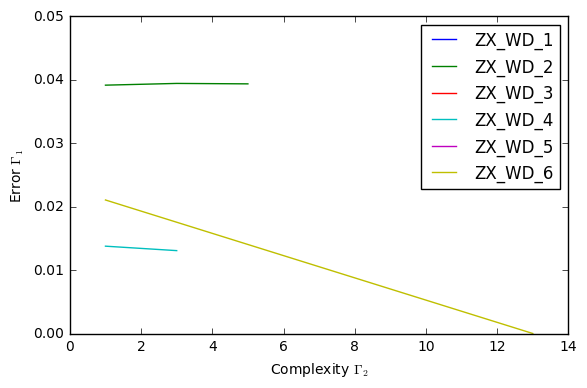

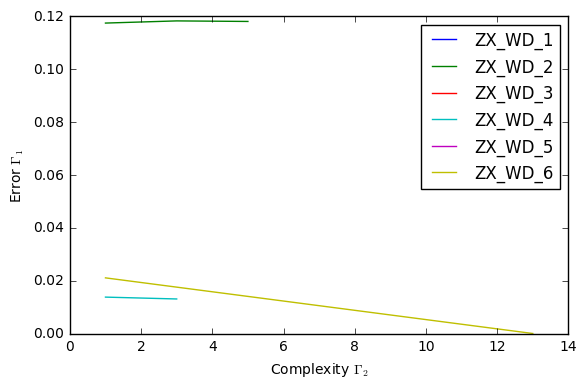

In [149]:
deap_results = learn_delay_deap(seg_1,time_delays)
result_summary_gp(deap_results,varnames[0:var_num_learn])

----------prepare_data_delay_deap------------------
del the target variable ZX_WD_1_dt0
number of variable: 207
the shape of X
(828, 207)
the shape of y
(828,)
ZX_WD_1_dt1
----------prepare_data_delay_deap------------------


/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:15: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


del the target variable ZX_WD_2_dt0
number of variable: 207
the shape of X
(828, 207)
the shape of y
(828,)
ZX_WD_2_dt1 + 0.222/ZD_LLJ_dt14
----------prepare_data_delay_deap------------------
del the target variable ZX_WD_3_dt0
number of variable: 207
the shape of X
(828, 207)
the shape of y
(828,)
ZX_WD_3_dt1
----------prepare_data_delay_deap------------------
del the target variable ZX_WD_4_dt0
number of variable: 207
the shape of X
(828, 207)
the shape of y
(828,)
ZX_WD_3_dt10 - 0.999
----------prepare_data_delay_deap------------------
del the target variable ZX_WD_5_dt0
number of variable: 207
the shape of X
(828, 207)
the shape of y
(828,)
ZX_WD_5_dt1
----------prepare_data_delay_deap------------------
del the target variable ZX_WD_6_dt0
number of variable: 207
the shape of X
(828, 207)
the shape of y
(828,)
ZX_WD_6_dt6 + sin(exp(exp(ZX_WD_6_dt10)*cos(sqrt(ZD_LLJ_dt10)))*log(ZD_LLJ_dt15))


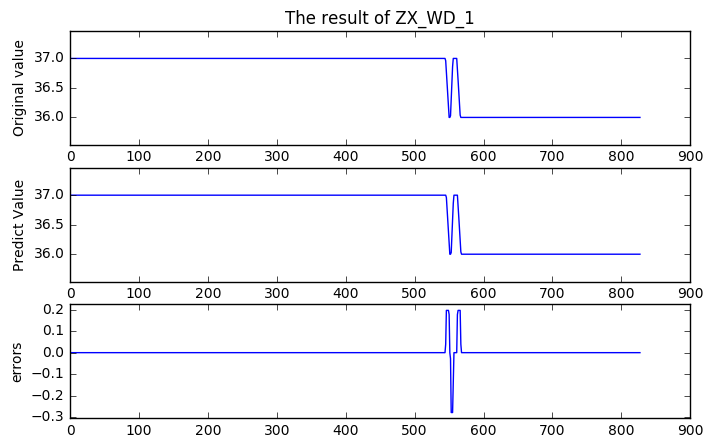

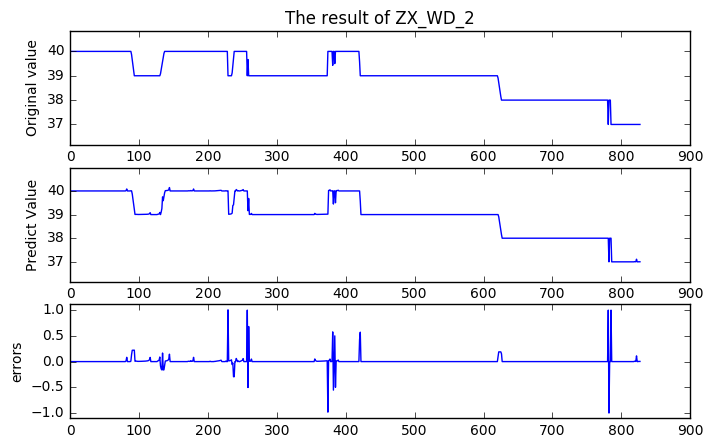

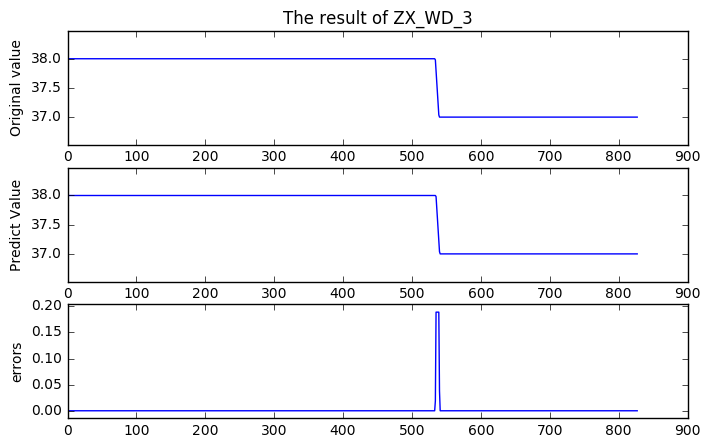

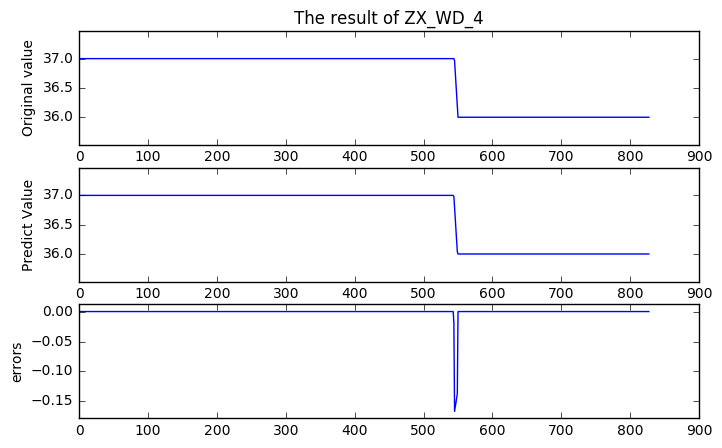

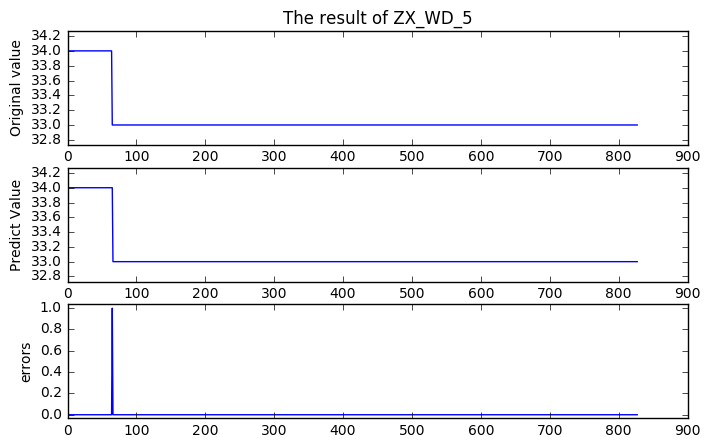

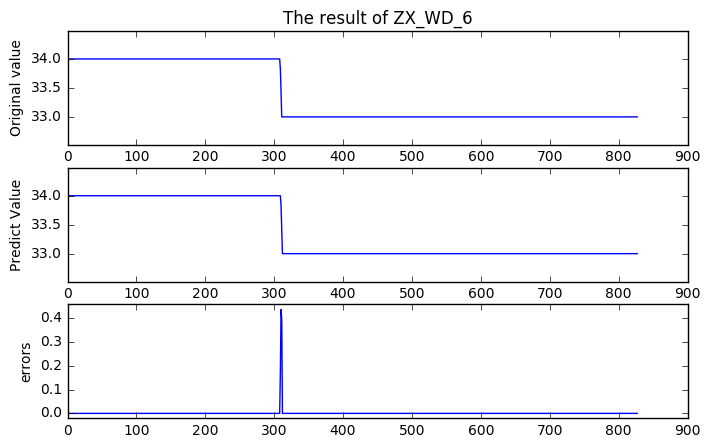

In [96]:
model_indexs = np.zeros(6)
model_indexs = model_indexs.astype(int)
model_indexs[5] = 1
model_indexs
compare_plot_delay_deap(model_indexs,seg_1,time_delays,deap_results)

#### seg2

-------------------------learn ZX_WD_1------------
----------prepare_data_delay_deap------------------
del the target variable ZX_WD_1_dt0
number of variable: 207
the shape of X
(243, 207)
the shape of y
(243,)


/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:15: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


gen	evals	min                      	max        	diversity
0  	489  	[ 0.49732169  2.        ]	[ inf  22.]	452      
1  	500  	[ 0.  1.]                	[ 606.10663591   19.        ]	441      
--------------------end----------------------------
-------------------------learn ZX_WD_2------------
----------prepare_data_delay_deap------------------
del the target variable ZX_WD_2_dt0
number of variable: 207
the shape of X
(243, 207)
the shape of y
(243,)


/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:15: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


gen	evals	min                      	max        	diversity
0  	489  	[ 1.26660986  2.        ]	[ inf  22.]	449      
1  	500  	[ 0.19900078  1.        ]	[ 604.44659036   19.        ]	449      
2  	500  	[ 0.17613411  1.        ]	[ 604.44659036   22.        ]	429      
3  	500  	[ 0.17613411  1.        ]	[ 604.44659036   22.        ]	424      
4  	500  	[ 0.17607277  1.        ]	[ 604.44659036   19.        ]	428      
5  	500  	[ 0.17607277  1.        ]	[ 453.68540413   19.        ]	429      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


6  	500  	[ 0.17607277  1.        ]	[ 454.44003083    6.        ]	430      
7  	500  	[ 0.17596488  1.        ]	[ 445.95596216   11.        ]	418      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


8  	500  	[ 0.17596488  1.        ]	[ 444.19919802    8.        ]	436      
9  	500  	[ 0.17596261  1.        ]	[ 34.728103  12.      ]      	439      
10 	500  	[ 0.17596261  1.        ]	[ 34.69770509  14.        ]  	438      
11 	500  	[ 0.17596261  1.        ]	[ 34.62156162  17.        ]  	431      
12 	500  	[ 0.17596261  1.        ]	[ 34.28030284  17.        ]  	425      
13 	500  	[ 0.17596261  1.        ]	[ 34.28030284  18.        ]  	427      
14 	500  	[ 0.17596261  1.        ]	[ 31.77463728  18.        ]  	427      
15 	500  	[ 0.17377687  1.        ]	[ 28.6640173  18.       ]    	431      
16 	500  	[ 0.17377687  1.        ]	[  5.78826784  20.        ]  	425      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


17 	500  	[ 0.17377687  1.        ]	[  5.80241148  15.        ]  	422      
18 	500  	[ 0.17377687  1.        ]	[  5.77905591  15.        ]  	421      
19 	500  	[ 0.17377687  1.        ]	[  5.67962525  15.        ]  	427      
20 	500  	[ 0.17377687  1.        ]	[  4.80633722  16.        ]  	443      
21 	500  	[ 0.17377687  1.        ]	[  4.79247177  16.        ]  	441      
22 	500  	[ 0.17377687  1.        ]	[  4.78221155  16.        ]  	432      
23 	500  	[ 0.17377687  1.        ]	[  4.78151132  16.        ]  	418      
24 	500  	[ 0.17377687  1.        ]	[  4.7908535  16.       ]    	422      
25 	500  	[ 0.17377687  1.        ]	[  4.782126  19.      ]      	426      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


26 	500  	[ 0.17377687  1.        ]	[ 444.29916757    6.        ]	410      
27 	500  	[ 0.17377687  1.        ]	[ 34.28030284  10.        ]  	401      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


28 	500  	[ 0.17377687  1.        ]	[ 31.46482521   6.        ]  	388      
29 	500  	[ 0.17377687  1.        ]	[  5.83481175  10.        ]  	380      
30 	500  	[ 0.17377687  1.        ]	[ 5.81158639  9.        ]    	373      
31 	500  	[ 0.17377687  1.        ]	[ 5.81017581  9.        ]    	369      
32 	500  	[ 0.17377687  1.        ]	[ 5.80382395  9.        ]    	366      
33 	500  	[ 0.17377687  1.        ]	[ 5.80382395  9.        ]    	365      
34 	500  	[ 0.17377687  1.        ]	[  5.79605112  11.        ]  	358      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


35 	500  	[ 0.17377687  1.        ]	[ 5.82708025  6.        ]    	349      
36 	500  	[ 0.17377687  1.        ]	[ 5.81158639  8.        ]    	347      
37 	500  	[ 0.17377687  1.        ]	[ 5.81933848  8.        ]    	352      
38 	500  	[ 0.17377687  1.        ]	[ 5.81017581  8.        ]    	348      
39 	500  	[ 0.17377687  1.        ]	[ 5.80382395  8.        ]    	344      
40 	500  	[ 0.17377687  1.        ]	[ 5.80241148  8.        ]    	337      
41 	500  	[ 0.17377687  1.        ]	[  5.79605112  10.        ]  	333      
42 	500  	[ 0.17377687  1.        ]	[  5.79605112  12.        ]  	330      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


43 	500  	[ 0.17377687  1.        ]	[ 5.79605112  7.        ]    	323      
44 	500  	[ 0.17377687  1.        ]	[ 5.78826784  8.        ]    	319      
45 	500  	[ 0.17372306  1.        ]	[ 5.79605112  8.        ]    	332      
46 	500  	[ 0.17372306  1.        ]	[  5.81158639  11.        ]  	340      
47 	500  	[ 0.17372306  1.        ]	[  5.81792978  11.        ]  	342      
48 	500  	[ 0.17372306  1.        ]	[  5.81933848  11.        ]  	356      
49 	500  	[ 0.17255042  1.        ]	[  5.82708025  12.        ]  	359      
--------------------end----------------------------
-------------------------learn ZX_WD_3------------
----------prepare_data_delay_deap------------------
del the target variable ZX_WD_3_dt0
number of variable: 207
the shape of X
(243, 207)
the shape of y
(243,)


/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:15: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


gen	evals	min                      	max        	diversity
0  	489  	[ 0.49732169  2.        ]	[ inf  22.]	451      
1  	500  	[ 0.  1.]                	[ 606.10116636   16.        ]	443      
--------------------end----------------------------
-------------------------learn ZX_WD_4------------
----------prepare_data_delay_deap------------------
del the target variable ZX_WD_4_dt0
number of variable: 207
the shape of X
(243, 207)
the shape of y
(243,)


/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:15: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


gen	evals	min                      	max        	diversity
0  	489  	[ 0.33179151  2.        ]	[ inf  22.]	451      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


1  	500  	[ 0.26591038  1.        ]	[ 1459.27108896     4.        ]	445      
2  	500  	[ 0.15323089  1.        ]	[ 606.60456639    8.        ]  	426      
3  	500  	[ 0.15323089  1.        ]	[ 606.6045745   12.       ]    	417      
4  	500  	[ 0.15323089  1.        ]	[ 606.6045745   12.       ]    	427      
5  	500  	[ 0.15323089  1.        ]	[ 606.60453936   12.        ]  	427      
6  	500  	[ 0.15323089  1.        ]	[ 606.58267174   12.        ]  	417      
7  	500  	[ 0.15323089  1.        ]	[ 455.54932022   15.        ]  	430      
8  	500  	[ 0.15323089  1.        ]	[ 446.3095894   15.       ]    	431      
9  	500  	[ 0.15323089  1.        ]	[ 33.1995898  15.       ]      	425      
10 	500  	[ 0.15323089  1.        ]	[ 33.0120416  20.       ]      	422      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


11 	500  	[ 0.15323089  1.        ]	[ 32.81800084  13.        ]    	419      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


12 	500  	[ 0.15323089  1.        ]	[ 32.66331429   9.        ]    	414      
13 	500  	[ 0.15323089  1.        ]	[ 32.61276417  14.        ]    	410      
14 	500  	[ 0.15323089  1.        ]	[ 29.50695377  17.        ]    	403      
15 	500  	[ 0.15323089  1.        ]	[ 29.1929131  17.       ]      	397      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


16 	500  	[ 0.15323089  1.        ]	[ 32.66331429   7.        ]    	399      
17 	500  	[ 0.15323089  1.        ]	[ 29.50695377  10.        ]    	391      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


18 	500  	[ 0.15323089  1.        ]	[ 32.61276417   6.        ]    	390      
19 	500  	[ 0.15323089  1.        ]	[ 29.55842121   8.        ]    	379      
20 	500  	[ 0.15323089  1.        ]	[ 29.41717425  11.        ]    	377      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


21 	500  	[ 0.15323089  1.        ]	[ 29.50695377   6.        ]    	371      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


22 	500  	[ 0.15323089  1.        ]	[ 29.34435898   7.        ]    	357      
23 	500  	[ 0.15323089  1.        ]	[ 29.11482326   9.        ]    	344      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


24 	500  	[ 0.15323089  1.        ]	[ 26.50676426   7.        ]    	344      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


25 	500  	[ 0.15323089  1.        ]	[ 26.50676426   7.        ]    	345      
26 	500  	[ 0.15323089  1.        ]	[ 3.7017819  7.       ]        	333      
27 	500  	[ 0.15323089  1.        ]	[ 3.6840252  9.       ]        	322      
28 	500  	[ 0.15323089  1.        ]	[ 3.67065131  9.        ]      	319      
29 	500  	[ 0.15323089  1.        ]	[  3.7017819  10.       ]      	331      
30 	500  	[ 0.15323089  1.        ]	[  3.6840252  10.       ]      	327      
31 	500  	[ 0.15323089  1.        ]	[  3.66841759  10.        ]    	322      
32 	500  	[ 0.15323089  1.        ]	[  3.66841759  14.        ]    	329      
33 	500  	[ 0.15323089  1.        ]	[  3.67845866  14.        ]    	335      
34 	500  	[ 0.15310352  1.        ]	[ 26.50676426  15.        ]    	354      
35 	500  	[ 0.15310352  1.        ]	[ 29.11482326  15.        ]    	383      
36 	500  	[ 0.15214988  1.        ]	[  3.68624947  17.        ]    	382      
37 	500  	[ 0.15214988  1.        ]	[  3.66841759  17.        ] 

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


39 	500  	[ 0.15303616  1.        ]	[ 446.35250239    6.        ]  	379      
40 	500  	[ 0.15303616  1.        ]	[ 29.66328765   9.        ]    	366      
41 	500  	[ 0.15303616  1.        ]	[ 29.34435898  10.        ]    	366      
42 	500  	[ 0.15259134  1.        ]	[ 29.11482326  10.        ]    	360      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


43 	500  	[ 0.15259134  1.        ]	[ 26.50676426   7.        ]    	356      
44 	500  	[ 0.15259134  1.        ]	[  3.68624947  11.        ]    	354      
45 	500  	[ 0.15259134  1.        ]	[  3.67065131  14.        ]    	354      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


46 	500  	[ 0.15259134  1.        ]	[ 29.34435898   6.        ]    	351      
47 	500  	[ 0.15259134  1.        ]	[  3.67622968  10.        ]    	347      
48 	500  	[ 0.15259134  1.        ]	[ 3.66282732  9.        ]      	340      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


49 	500  	[ 0.15259134  1.        ]	[ 3.66282732  7.        ]      	333      
--------------------end----------------------------
-------------------------learn ZX_WD_5------------
----------prepare_data_delay_deap------------------
del the target variable ZX_WD_5_dt0
number of variable: 207
the shape of X
(243, 207)
the shape of y
(243,)


/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:15: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


gen	evals	min                                	max        	diversity
0  	489  	[  1.20792265e-13   2.00000000e+00]	[ inf  22.]	448      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


1  	500  	[ 0.  1.]                          	[  4.13553330e+05   4.00000000e+00]	426      
--------------------end----------------------------
-------------------------learn ZX_WD_6------------
----------prepare_data_delay_deap------------------
del the target variable ZX_WD_6_dt0
number of variable: 207
the shape of X
(243, 207)
the shape of y
(243,)


/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:15: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


gen	evals	min                      	max        	diversity
0  	489  	[ 0.49013108  2.        ]	[ inf  22.]	450      
1  	500  	[ 0.3041027  1.       ]  	[ 609.19615964   17.        ]	453      
2  	500  	[ 0.24017164  1.        ]	[ 609.19615964   16.        ]	431      
3  	500  	[ 0.22623466  1.        ]	[ 609.19615964   15.        ]	418      
4  	500  	[ 0.22623466  1.        ]	[ 609.19615964   15.        ]	418      
5  	500  	[ 0.22623466  1.        ]	[ 609.17974627   15.        ]	417      
6  	500  	[ 0.22623466  1.        ]	[ 458.32694554   13.        ]	412      
7  	500  	[ 0.22623466  1.        ]	[ 450.64653741   13.        ]	422      
8  	500  	[ 0.22623466  1.        ]	[ 448.01848065   13.        ]	423      
9  	500  	[ 0.22623466  1.        ]	[ 27.32292437  16.        ]  	417      
10 	500  	[ 0.22623466  1.        ]	[ 26.89173599  19.        ]  	405      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


11 	500  	[ 0.22623466  1.        ]	[ 30.49404594   9.        ]  	415      
12 	500  	[ 0.22623466  1.        ]	[ 27.19638253  12.        ]  	415      
13 	500  	[ 0.22623466  1.        ]	[ 26.96910417  13.        ]  	411      
14 	500  	[ 0.22623466  1.        ]	[ 26.65493461  13.        ]  	409      
15 	500  	[ 0.22623466  1.        ]	[ 26.73428387  13.        ]  	417      
16 	500  	[ 0.22623466  1.        ]	[ 26.65493461  13.        ]  	410      
17 	500  	[ 0.22623466  1.        ]	[  4.76969797  13.        ]  	401      
18 	500  	[ 0.22623466  1.        ]	[  4.74136453  13.        ]  	402      
19 	500  	[ 0.22623466  1.        ]	[  4.73527198  15.        ]  	397      
20 	500  	[ 0.22623466  1.        ]	[  3.10060856  14.        ]  	395      
21 	500  	[ 0.22623466  1.        ]	[  4.7274761  14.       ]    	392      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


22 	500  	[ 0.22623466  1.        ]	[ 457.16735021    6.        ]	400      
23 	500  	[ 0.22623466  1.        ]	[ 30.35063081   9.        ]  	398      
24 	500  	[ 0.22623466  1.        ]	[ 27.23961148  11.        ]  	398      
25 	500  	[ 0.22623466  1.        ]	[ 27.12483108  11.        ]  	395      
26 	500  	[ 0.22623466  1.        ]	[ 26.80758298  12.        ]  	384      
27 	500  	[ 0.22623466  1.        ]	[ 23.91196988  13.        ]  	392      
28 	500  	[ 0.22623466  1.        ]	[  4.77826936  13.        ]  	392      
29 	500  	[ 0.22623466  1.        ]	[  4.76511067  13.        ]  	385      
30 	500  	[ 0.22623466  1.        ]	[  4.77423734  14.        ]  	382      
31 	500  	[ 0.22621977  1.        ]	[  4.76969797  14.        ]  	381      
32 	500  	[ 0.22621977  1.        ]	[ 23.91196988  14.        ]  	382      
33 	500  	[ 0.22621977  1.        ]	[  4.78276052  14.        ]  	372      
34 	500  	[ 0.22621977  1.        ]	[  4.76969797  14.        ]  	362      
35 	500  	[ 

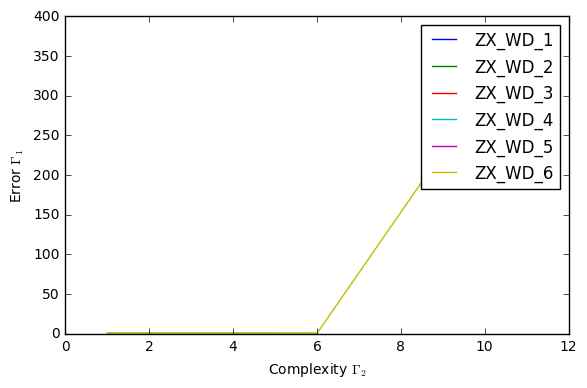

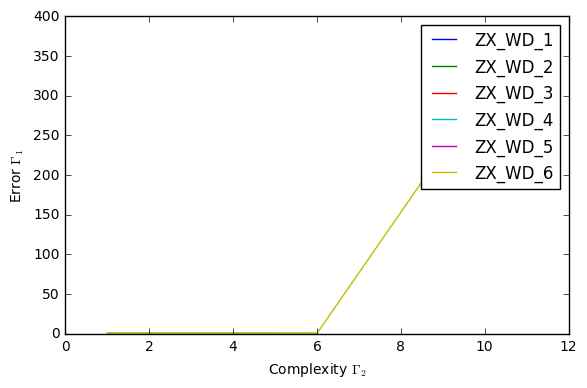

In [97]:
deap_results = learn_delay_deap(seg_2,time_delays)
result_summary_gp(deap_results,varnames[0:var_num_learn])

model indexs:
[0 0 0 0 0 1]
----------prepare_data_delay_deap------------------
del the target variable ZX_WD_1_dt0
number of variable: 207
the shape of X
(243, 207)
the shape of y
(243,)
ZX_WD_3_dt11
----------prepare_data_delay_deap------------------
del the target variable ZX_WD_2_dt0
number of variable: 207
the shape of X
(243, 207)
the shape of y
(243,)
ZX_WD_2_dt2 + cos(ZD_LCG_dt1)/ZX_HW_2_dt5


/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:15: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/home/happyling/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_base.py:3040: UserWarning: Attempting to set identical bottom==top results
in singular transformations; automatically expanding.
bottom=37.0, top=37.0
  'bottom=%s, top=%s') % (bottom, top))
/home/happyling/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_base.py:3040: UserWarning: Attempting to set identical bottom==top results
in singular transformations; automatically expanding.
bottom=0.0, top=0.0
  'bottom=%s, top=%s') % (bottom, top))


----------prepare_data_delay_deap------------------
del the target variable ZX_WD_3_dt0
number of variable: 207
the shape of X
(243, 207)
the shape of y
(243,)
ZX_WD_3_dt7
----------prepare_data_delay_deap------------------
del the target variable ZX_WD_4_dt0
number of variable: 207
the shape of X
(243, 207)
the shape of y
(243,)
ZX_WD_4_dt1 - ZD_LLJ_dt9/ZD_LCG_dt12
----------prepare_data_delay_deap------------------
del the target variable ZX_WD_5_dt0
number of variable: 207
the shape of X
(243, 207)
the shape of y
(243,)
ZX_WD_5_dt11
----------prepare_data_delay_deap------------------


/home/happyling/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_base.py:3040: UserWarning: Attempting to set identical bottom==top results
in singular transformations; automatically expanding.
bottom=33.0, top=33.0
  'bottom=%s, top=%s') % (bottom, top))


del the target variable ZX_WD_6_dt0
number of variable: 207
the shape of X
(243, 207)
the shape of y
(243,)
(ZD_SPEED_dt12*ZX_HW_1_dt8*ZX_WD_6_dt1*ZX_WD_6_dt10 - ZD_SPEED_dt8 + ZX_WD_5_dt6)/(ZD_SPEED_dt12*ZX_HW_1_dt8*ZX_WD_6_dt10)


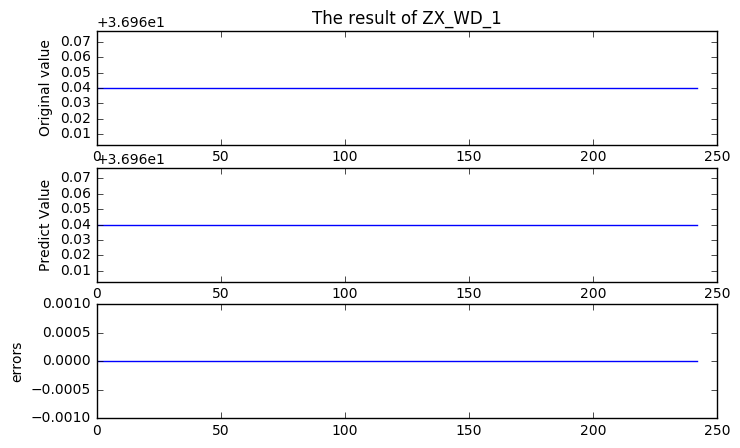

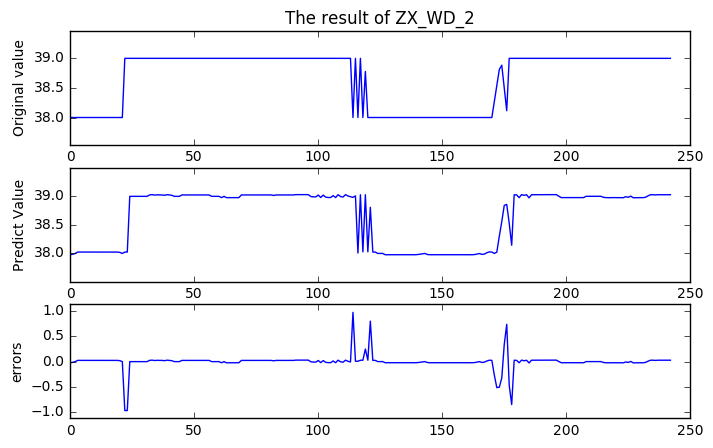

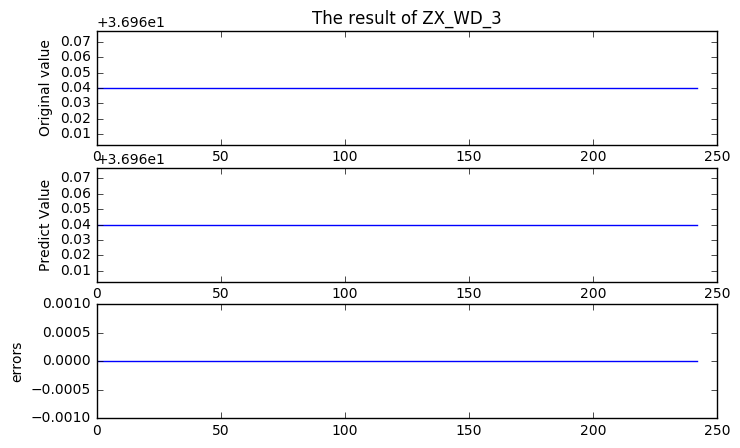

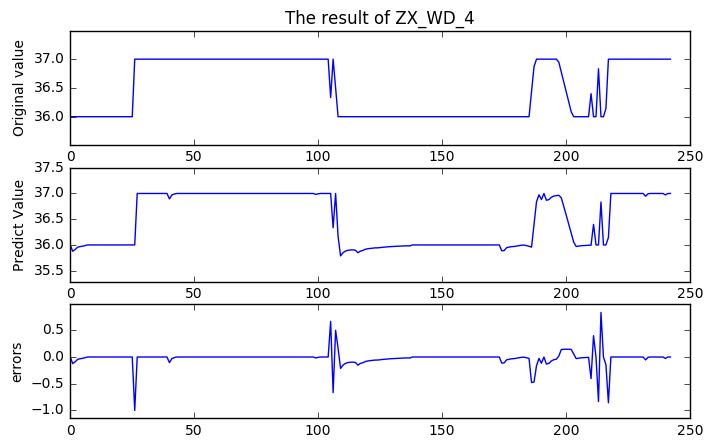

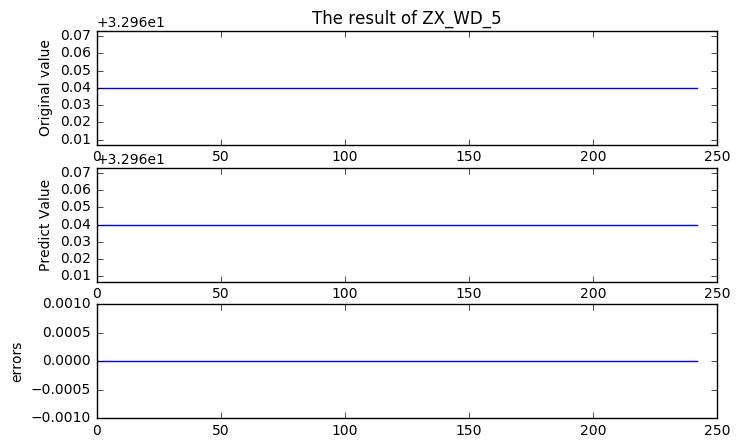

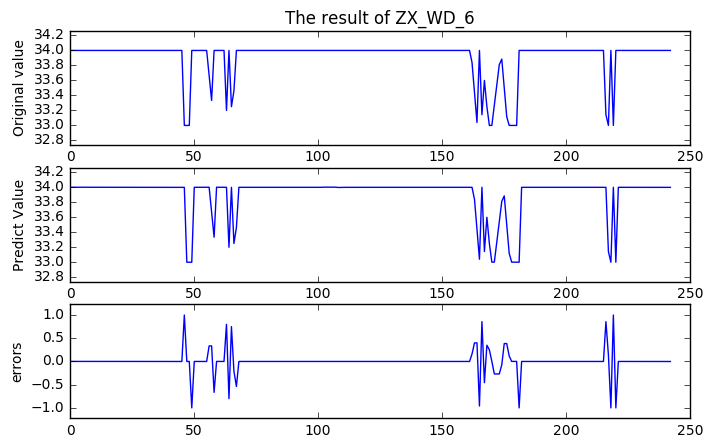

In [102]:
model_indexs = np.zeros(6)
model_indexs = model_indexs.astype(int)
model_indexs[5] = 1
print("model indexs:")
print(model_indexs)
compare_plot_delay_deap(model_indexs,seg_2,time_delays,deap_results)

#### seg3

-------------------------learn ZX_WD_1------------
----------prepare_data_delay_deap------------------
del the target variable ZX_WD_1_dt0
number of variable: 207
the shape of X
(4310, 207)
the shape of y
(4310,)


/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:15: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


gen	evals	min                      	max        	diversity
0  	489  	[ 0.76542531  2.        ]	[ inf  22.]	475      
1  	500  	[ 0.12766668  1.        ]	[ 591.50897723   18.        ]	489      
2  	500  	[ 0.12766668  1.        ]	[ 591.50967418   18.        ]	489      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


3  	500  	[ 0.1149392  1.       ]  	[ 591.50967418   10.        ]	486      
4  	500  	[ 0.1149392  1.       ]  	[ 591.50967418   13.        ]	486      
5  	500  	[ 0.1149392  1.       ]  	[ 591.45365112   14.        ]	486      
6  	500  	[ 0.1149392  1.       ]  	[ 426.09101795   14.        ]	485      
7  	500  	[ 0.1149392  1.       ]  	[ 416.99661511   15.        ]	484      
8  	500  	[ 0.1149392  1.       ]  	[ 32.46547276  15.        ]  	483      
9  	500  	[ 0.1149392  1.       ]  	[ 32.41736085  14.        ]  	480      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


10 	500  	[ 0.1149392  1.       ]  	[ 29.50757999  10.        ]  	477      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


11 	500  	[ 0.1149392  1.       ]  	[ 29.49024049  13.        ]  	477      
12 	500  	[ 0.1149392  1.       ]  	[ 29.50423942  14.        ]  	484      
13 	500  	[ 0.1149392  1.       ]  	[ 29.50423942  15.        ]  	481      
14 	500  	[ 0.1149392  1.       ]  	[ 29.48109149  15.        ]  	478      
15 	500  	[ 0.1149392  1.       ]  	[ 29.49024049  16.        ]  	475      
16 	500  	[ 0.1149392  1.       ]  	[ 29.50423942  19.        ]  	478      
17 	500  	[ 0.1149392  1.       ]  	[  3.08801466  18.        ]  	471      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


18 	500  	[ 0.1149392  1.       ]  	[ 591.45710273    6.        ]	479      
19 	500  	[ 0.1149392  1.       ]  	[ 416.83000255    9.        ]	477      
20 	500  	[ 0.1149392  1.       ]  	[ 32.45329814   9.        ]  	476      
21 	500  	[ 0.1149392  1.       ]  	[ 29.5311703   9.       ]    	474      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


22 	500  	[ 0.1149392  1.       ]  	[ 29.5311703   6.       ]    	473      
23 	500  	[ 0.1149392  1.       ]  	[ 29.49509019  10.        ]  	473      
24 	500  	[ 0.1149392  1.       ]  	[  3.08726321  11.        ]  	467      
25 	500  	[ 0.1149392  1.       ]  	[  3.08544716  12.        ]  	465      
26 	500  	[ 0.1149392  1.       ]  	[  3.08357358  13.        ]  	462      
27 	500  	[ 0.1149392  1.       ]  	[  2.51048504  17.        ]  	461      
28 	500  	[ 0.1149392  1.       ]  	[  2.50689084  17.        ]  	462      
29 	500  	[ 0.1149392  1.       ]  	[  2.23064105  17.        ]  	455      
30 	500  	[ 0.1149392  1.       ]  	[  2.22892038  17.        ]  	446      
31 	500  	[ 0.1149392  1.       ]  	[  2.22772675  18.        ]  	450      
32 	500  	[ 0.1149392  1.       ]  	[  2.22454411  18.        ]  	442      
33 	500  	[ 0.1149392  1.       ]  	[  2.09583685  23.        ]  	428      
34 	500  	[ 0.11493496  1.        ]	[  2.09407261  23.        ]  	434      
35 	500  	[ 

/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:15: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


gen	evals	min                      	max        	diversity
0  	489  	[ 1.34496348  2.        ]	[ inf  22.]	475      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


1  	500  	[ 0.08647361  1.        ]	[ 964.99286576    5.        ]	499      
2  	500  	[ 0.08647361  1.        ]	[ 588.74287197   10.        ]	495      
3  	500  	[ 0.08647361  1.        ]	[ 588.74287197   10.        ]	495      
4  	500  	[ 0.08647361  1.        ]	[ 588.74287197   10.        ]	495      
5  	500  	[ 0.08647361  1.        ]	[ 588.74287197   10.        ]	492      
6  	500  	[ 0.08647361  1.        ]	[ 588.73817723   15.        ]	492      
7  	500  	[ 0.08647361  1.        ]	[ 423.09114777   15.        ]	490      
8  	500  	[ 0.08647361  1.        ]	[ 414.23091994   15.        ]	490      
9  	500  	[ 0.08647361  1.        ]	[ 32.32984937  20.        ]  	489      
10 	500  	[ 0.08647361  1.        ]	[ 35.10938912  17.        ]  	487      
11 	500  	[ 0.08647361  1.        ]	[ 32.32805046  17.        ]  	487      
12 	500  	[ 0.08647361  1.        ]	[ 32.30928679  15.        ]  	488      
13 	500  	[ 0.08647361  1.        ]	[  5.37832902  19.        ]  	483      
14 	500  	[ 

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


15 	500  	[ 0.08647361  1.        ]	[ 5.37893733  9.        ]    	470      
16 	500  	[ 0.08647361  1.        ]	[  5.3747546  12.       ]    	478      
17 	500  	[ 0.08647361  1.        ]	[  4.99380632  16.        ]  	479      
18 	500  	[ 0.08647361  1.        ]	[  4.9923506  20.       ]    	484      
19 	500  	[ 0.08647361  1.        ]	[  4.99204764  25.        ]  	483      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


20 	500  	[ 0.08647361  1.        ]	[ 5.3747546  9.       ]      	481      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


21 	500  	[ 0.08647361  1.        ]	[ 4.99383901  8.        ]    	476      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


22 	500  	[ 0.08647361  1.        ]	[ 35.13703466   6.        ]  	479      
23 	500  	[ 0.08647361  1.        ]	[ 32.29030716  11.        ]  	476      
24 	500  	[ 0.08647361  1.        ]	[  5.37678488  13.        ]  	476      
25 	500  	[ 0.08647361  1.        ]	[  4.99399904  15.        ]  	473      
26 	500  	[ 0.08647361  1.        ]	[  4.99295753  17.        ]  	473      
27 	500  	[ 0.08647361  1.        ]	[  4.9923506  20.       ]    	470      
28 	500  	[ 0.08647361  1.        ]	[  4.96936006  20.        ]  	464      
29 	500  	[ 0.08647361  1.        ]	[  4.96851957  21.        ]  	452      
30 	500  	[ 0.08647361  1.        ]	[  4.9673987  21.       ]    	432      
31 	500  	[ 0.08647361  1.        ]	[  3.39108172  21.        ]  	413      
32 	500  	[ 0.08647361  1.        ]	[  3.38588804  21.        ]  	386      
33 	500  	[ 0.08647361  1.        ]	[  3.08425527  25.        ]  	352      
34 	500  	[ 0.08647361  1.        ]	[  3.08355537  17.        ]  	318      
35 	500  	[ 

/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:15: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


gen	evals	min                      	max        	diversity
0  	489  	[ 0.67015497  2.        ]	[ inf  22.]	476      
1  	500  	[ 0.10220556  1.        ]	[ 589.50883084   19.        ]	495      
2  	500  	[ 0.07071161  1.        ]	[ 589.50945789   18.        ]	500      
3  	500  	[ 0.07071161  1.        ]	[ 589.50945789   18.        ]	500      
4  	500  	[ 0.07071161  1.        ]	[ 589.5086797   19.       ]  	498      
5  	500  	[ 0.07071161  1.        ]	[ 589.45481506   23.        ]	499      
6  	500  	[ 0.07071161  1.        ]	[ 423.81060021   23.        ]	498      
7  	500  	[ 0.07071161  1.        ]	[ 34.38007034  15.        ]  	494      
8  	500  	[ 0.07071161  1.        ]	[ 31.47604257  17.        ]  	495      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


9  	500  	[ 0.07071161  1.        ]	[ 34.36451121   6.        ]  	495      
10 	500  	[ 0.06790366  1.        ]	[ 31.48387615  12.        ]  	494      
11 	500  	[ 0.06790366  1.        ]	[ 31.47324345  12.        ]  	492      
12 	500  	[ 0.06790366  1.        ]	[ 31.4593599  12.       ]    	494      
13 	500  	[ 0.06790366  1.        ]	[  4.54589346  13.        ]  	492      
14 	500  	[ 0.06790366  1.        ]	[  4.54553618  13.        ]  	491      
15 	500  	[ 0.06790366  1.        ]	[  4.54446414  13.        ]  	492      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


16 	500  	[ 0.06790366  1.        ]	[ 31.49721582   7.        ]  	492      
17 	500  	[ 0.06790366  1.        ]	[ 4.54553618  9.        ]    	486      
18 	500  	[ 0.06790366  1.        ]	[  4.08929534  12.        ]  	477      
19 	500  	[ 0.06790366  1.        ]	[  4.08836736  12.        ]  	474      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


20 	500  	[ 0.06790366  1.        ]	[ 4.08916179  7.        ]    	469      
21 	500  	[ 0.06790366  1.        ]	[ 4.08882134  8.        ]    	462      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


22 	500  	[ 0.06790366  1.        ]	[ 4.54513936  6.        ]    	459      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


23 	500  	[ 0.06789735  1.        ]	[ 4.08974922  6.        ]    	460      
24 	500  	[ 0.06789735  1.        ]	[  4.08882134  12.        ]  	459      
25 	500  	[ 0.06789735  1.        ]	[  4.08842148  12.        ]  	454      
26 	500  	[ 0.06789735  1.        ]	[  4.08751337  12.        ]  	448      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


27 	500  	[ 0.06789735  1.        ]	[  4.07606902  10.        ]  	433      
28 	500  	[ 0.06789735  1.        ]	[  4.07506862  13.        ]  	423      
29 	500  	[ 0.06789735  1.        ]	[  4.07370193  13.        ]  	409      
30 	500  	[ 0.06789735  1.        ]	[  2.45547633  14.        ]  	395      
31 	500  	[ 0.06789735  1.        ]	[  2.22105822  18.        ]  	360      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


32 	500  	[ 0.06789735  1.        ]	[ 35.09237454   6.        ]  	389      
33 	500  	[ 0.06789735  1.        ]	[  4.08836736  11.        ]  	375      
34 	500  	[ 0.06789735  1.        ]	[  4.074361  11.      ]      	359      
35 	500  	[ 0.06789735  1.        ]	[  2.45122058  12.        ]  	340      
36 	500  	[ 0.06789735  1.        ]	[  2.44695146  15.        ]  	319      
37 	500  	[ 0.06789735  1.        ]	[  2.21806812  15.        ]  	307      
38 	500  	[ 0.06789735  1.        ]	[  2.44695146  15.        ]  	342      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


39 	500  	[ 0.06789735  1.        ]	[ 4.07370193  8.        ]    	335      
40 	500  	[ 0.06789735  1.        ]	[  2.45688733  12.        ]  	362      
41 	500  	[ 0.06789735  1.        ]	[  2.45405857  13.        ]  	392      
42 	500  	[ 0.06789735  1.        ]	[  2.45263403  13.        ]  	388      
43 	500  	[ 0.06789735  1.        ]	[  2.44837334  17.        ]  	369      
44 	500  	[ 0.06789735  1.        ]	[  2.22001335  19.        ]  	354      
45 	500  	[ 0.06789735  1.        ]	[  2.21792212  19.        ]  	337      
46 	500  	[ 0.06789735  1.        ]	[  2.21478157  19.        ]  	320      
47 	500  	[ 0.06789735  1.        ]	[  1.42640679  18.        ]  	302      
48 	500  	[ 0.06789735  1.        ]	[  1.425756  20.      ]      	283      
49 	500  	[ 0.06789735  1.        ]	[  1.42521731  20.        ]  	288      
--------------------end----------------------------
-------------------------learn ZX_WD_4------------
----------prepare_data_delay_deap------------------
del the t

/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:15: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


gen	evals	min                      	max        	diversity
0  	489  	[ 0.13072486  2.        ]	[ inf  22.]	474      
1  	500  	[ 0.10355651  1.        ]	[ 590.4888797   18.       ]	497      
2  	500  	[ 0.08166323  1.        ]	[ 590.4888797   18.       ]	499      
3  	500  	[ 0.08166323  1.        ]	[ 590.48951257   19.        ]	496      
4  	500  	[ 0.08166323  1.        ]	[ 590.48951257   18.        ]	495      
5  	500  	[ 0.08166323  1.        ]	[ 590.43642937   18.        ]	498      
6  	500  	[ 0.08166323  1.        ]	[ 424.73795208   18.        ]	497      
7  	500  	[ 0.08166323  1.        ]	[ 415.86547358   18.        ]	496      
8  	500  	[ 0.08166323  1.        ]	[ 33.41076589  14.        ]  	496      
9  	500  	[ 0.08166323  1.        ]	[ 30.51670575  16.        ]  	494      
10 	500  	[ 0.08166323  1.        ]	[  3.55839148  16.        ]  	493      
11 	500  	[ 0.08166323  1.        ]	[  3.10649154  17.        ]  	489      
12 	500  	[ 0.08166323  1.        ]	[  3.10383517  1

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


13 	500  	[ 0.08166323  1.        ]	[ 3.55863466  9.        ]    	493      
14 	500  	[ 0.08166323  1.        ]	[  3.10561345  13.        ]  	491      
15 	500  	[ 0.08166323  1.        ]	[  3.10482586  17.        ]  	491      
16 	500  	[ 0.08166323  1.        ]	[  3.07933887  20.        ]  	493      
17 	500  	[ 0.08166323  1.        ]	[  3.07813308  20.        ]  	490      
18 	500  	[ 0.08166323  1.        ]	[  2.1445579  21.       ]    	489      
19 	500  	[ 0.08166323  1.        ]	[  2.1445579  21.       ]    	482      
20 	500  	[ 0.08166323  1.        ]	[  2.1414452  21.       ]    	476      
21 	500  	[ 0.08166323  1.        ]	[  2.14022594  21.        ]  	472      
22 	500  	[ 0.08166323  1.        ]	[  1.5373658  21.       ]    	469      
23 	500  	[ 0.08166323  1.        ]	[  1.53358362  21.        ]  	454      
24 	500  	[ 0.08166323  1.        ]	[  1.52991698  23.        ]  	449      
25 	500  	[ 0.08166323  1.        ]	[  1.28979029  22.        ]  	429      
26 	500  	[ 

/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:15: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


gen	evals	min                      	max        	diversity
0  	489  	[ 0.19624903  2.        ]	[ inf  22.]	475      
1  	500  	[ 0.16252071  1.        ]	[ 593.93592534   21.        ]	492      
2  	500  	[ 0.11389466  1.        ]	[ 593.93626986   21.        ]	492      
3  	500  	[ 0.11389466  1.        ]	[ 593.93626986   20.        ]	488      
4  	500  	[ 0.11389466  1.        ]	[ 593.935944   20.      ]    	486      
5  	500  	[ 0.11389466  1.        ]	[ 593.88296187   20.        ]	488      
6  	500  	[ 0.11389466  1.        ]	[ 428.4830645   20.       ]  	486      
7  	500  	[ 0.11389466  1.        ]	[ 419.37884401   20.        ]	481      
8  	500  	[ 0.11389466  1.        ]	[ 30.24936789  20.        ]  	477      
9  	500  	[ 0.11389466  1.        ]	[ 27.22532804  18.        ]  	474      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


10 	500  	[ 0.11389466  1.        ]	[ 27.18576333  11.        ]  	475      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


11 	500  	[ 0.11389466  1.        ]	[ 27.22454804   9.        ]  	474      
12 	500  	[ 0.11389466  1.        ]	[ 27.20081226  12.        ]  	467      
13 	500  	[ 0.11389466  1.        ]	[  5.37700005  12.        ]  	458      
14 	500  	[ 0.11389466  1.        ]	[  4.55079815  14.        ]  	449      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


15 	500  	[ 0.11389466  1.        ]	[ 419.58886655    6.        ]	477      
16 	500  	[ 0.11389466  1.        ]	[ 27.22454804  10.        ]  	477      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


17 	500  	[ 0.11389466  1.        ]	[ 27.19917087   8.        ]  	475      
18 	500  	[ 0.11389466  1.        ]	[  5.37774927  11.        ]  	475      
19 	500  	[ 0.11389466  1.        ]	[  5.37619257  12.        ]  	475      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


20 	500  	[ 0.11389466  1.        ]	[ 27.20081226   6.        ]  	471      
21 	500  	[ 0.11389466  1.        ]	[  5.37914114  11.        ]  	470      
22 	500  	[ 0.11389466  1.        ]	[  5.37774927  11.        ]  	469      
23 	500  	[ 0.11389466  1.        ]	[  5.37619257  12.        ]  	465      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


24 	500  	[ 0.11389466  1.        ]	[ 5.37553157  9.        ]    	463      
25 	500  	[ 0.11389466  1.        ]	[  5.3747546  12.       ]    	461      
26 	500  	[ 0.11389466  1.        ]	[  4.55283706  14.        ]  	459      
27 	500  	[ 0.11389466  1.        ]	[  4.54917034  15.        ]  	456      
28 	500  	[ 0.11389466  1.        ]	[  4.54569688  17.        ]  	456      
29 	500  	[ 0.11389466  1.        ]	[  3.56274313  19.        ]  	451      
30 	500  	[ 0.11389466  1.        ]	[  3.56081258  19.        ]  	445      
31 	500  	[ 0.11389466  1.        ]	[  3.55854437  19.        ]  	440      
32 	500  	[ 0.11389466  1.        ]	[  3.55969654  17.        ]  	426      
33 	500  	[ 0.11389466  1.        ]	[  2.50751467  15.        ]  	413      
34 	500  	[ 0.11375635  1.        ]	[  2.50672804  18.        ]  	431      
35 	500  	[ 0.11375635  1.        ]	[  2.50695943  20.        ]  	443      
36 	500  	[ 0.11375635  1.        ]	[  2.50683603  20.        ]  	448      
37 	500  	[ 

/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:15: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


gen	evals	min                      	max        	diversity
0  	489  	[ 0.82283853  2.        ]	[ inf  22.]	475      
1  	500  	[ 0.07836639  1.        ]	[ 593.47189361   18.        ]	490      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


2  	500  	[ 0.07836639  1.        ]	[ 593.47329041    5.        ]	489      
3  	500  	[ 0.05718973  1.        ]	[ 593.47329041    9.        ]	487      
4  	500  	[ 0.05718973  1.        ]	[ 593.47329041   10.        ]	483      
5  	500  	[ 0.05718973  1.        ]	[ 593.47329041   10.        ]	483      
6  	500  	[ 0.05718973  1.        ]	[ 593.47259188   10.        ]	482      
7  	500  	[ 0.05718973  1.        ]	[ 593.41880776   10.        ]	481      
8  	500  	[ 0.05718973  1.        ]	[ 427.96243826   11.        ]	480      
9  	500  	[ 0.05718973  1.        ]	[ 418.78764576   16.        ]	479      
10 	500  	[ 0.05718973  1.        ]	[ 30.60714002  16.        ]  	478      
11 	500  	[ 0.05718973  1.        ]	[ 27.59956157  13.        ]  	476      
12 	500  	[ 0.05718973  1.        ]	[ 27.58573943  14.        ]  	476      
13 	500  	[ 0.05718973  1.        ]	[  4.97785035  18.        ]  	473      
14 	500  	[ 0.05718973  1.        ]	[ 27.56897607  14.        ]  	468      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


15 	500  	[ 0.05718973  1.        ]	[ 418.8701803    6.       ]  	475      
16 	500  	[ 0.05718973  1.        ]	[ 30.60967275   8.        ]  	473      
17 	500  	[ 0.05718973  1.        ]	[ 30.59051902   9.        ]  	472      
18 	500  	[ 0.05718973  1.        ]	[ 27.6057043  11.       ]    	472      
19 	500  	[ 0.05718973  1.        ]	[ 27.60499506  11.        ]  	471      
20 	500  	[ 0.05718973  1.        ]	[ 27.58523501  13.        ]  	466      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


21 	500  	[ 0.05718973  1.        ]	[ 27.57018049   8.        ]  	462      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


22 	500  	[ 0.05718973  1.        ]	[ 4.97663834  9.        ]    	462      
23 	500  	[ 0.05718973  1.        ]	[  4.97300053  13.        ]  	459      
24 	500  	[ 0.05718973  1.        ]	[  4.08325891  13.        ]  	457      
25 	500  	[ 0.05718973  1.        ]	[  4.07791444  13.        ]  	455      
26 	500  	[ 0.05718973  1.        ]	[  3.0875946  15.       ]    	452      
27 	500  	[ 0.05718973  1.        ]	[  3.08639204  17.        ]  	458      
28 	500  	[ 0.05718973  1.        ]	[  3.08398552  19.        ]  	458      
29 	500  	[ 0.05718973  1.        ]	[  3.07930109  24.        ]  	460      
30 	500  	[ 0.05718973  1.        ]	[  2.04397585  24.        ]  	460      
31 	500  	[ 0.05707477  1.        ]	[  2.04388504  18.        ]  	460      
32 	500  	[ 0.05707477  1.        ]	[  2.04388504  17.        ]  	458      
33 	500  	[ 0.05707477  1.        ]	[  2.04414921  23.        ]  	452      
34 	500  	[ 0.05707477  1.        ]	[  2.04414921  23.        ]  	452      
35 	500  	[ 

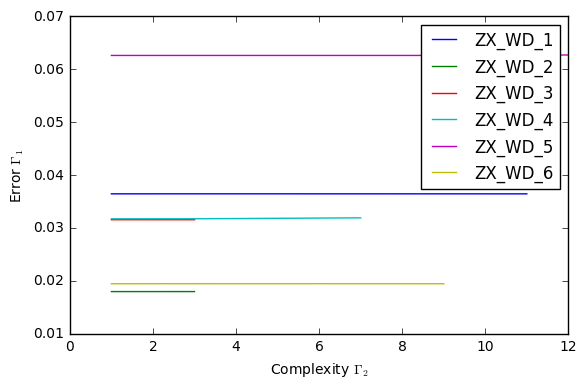

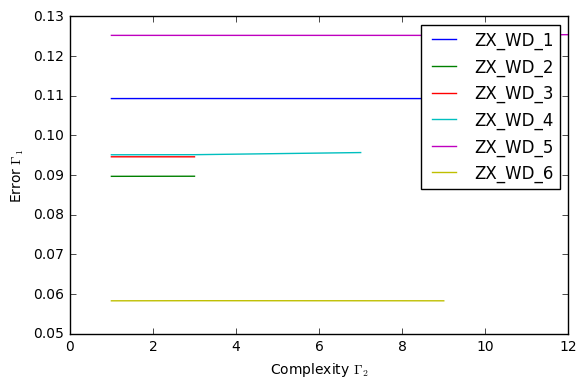

In [103]:
deap_results = learn_delay_deap(seg_3,time_delays)
result_summary_gp(deap_results,varnames[0:var_num_learn])

model indexs:
[0 0 0 0 0 0]
----------prepare_data_delay_deap------------------
del the target variable ZX_WD_1_dt0
number of variable: 207
the shape of X
(4310, 207)
the shape of y
(4310,)
ZX_WD_1_dt1 - sin(log(ZX_WD_1_dt2/ZX_HW_2_dt11)/sqrt(square(ZX_HW_2_dt0)))
----------prepare_data_delay_deap------------------


/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:15: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


del the target variable ZX_WD_2_dt0
number of variable: 207
the shape of X
(4310, 207)
the shape of y
(4310,)
ZX_WD_2_dt1 + 0.001
----------prepare_data_delay_deap------------------
del the target variable ZX_WD_3_dt0
number of variable: 207
the shape of X
(4310, 207)
the shape of y
(4310,)
ZX_WD_3_dt2 - 0.001
----------prepare_data_delay_deap------------------
del the target variable ZX_WD_4_dt0
number of variable: 207
the shape of X
(4310, 207)
the shape of y
(4310,)
ZD_SPEED_dt9/(ZX_HW_1_dt15*ZX_WD_4_dt6) + ZX_WD_4_dt1
----------prepare_data_delay_deap------------------
del the target variable ZX_WD_5_dt0
number of variable: 207
the shape of X
(4310, 207)
the shape of y
(4310,)
sqrt(square(ZX_WD_5_dt1) + square(sin(exp(ZX_HW_1_dt4)/(ZD_SPEED_dt13*ZD_SPEED_dt2))))
----------prepare_data_delay_deap------------------
del the target variable ZX_WD_6_dt0
number of variable: 207
the shape of X
(4310, 207)
the shape of y
(4310,)
ZX_WD_6_dt1 + sin(ZD_LLJ_dt6)/square(-ZD_JHG_dt10 + ZX_WD_5_d

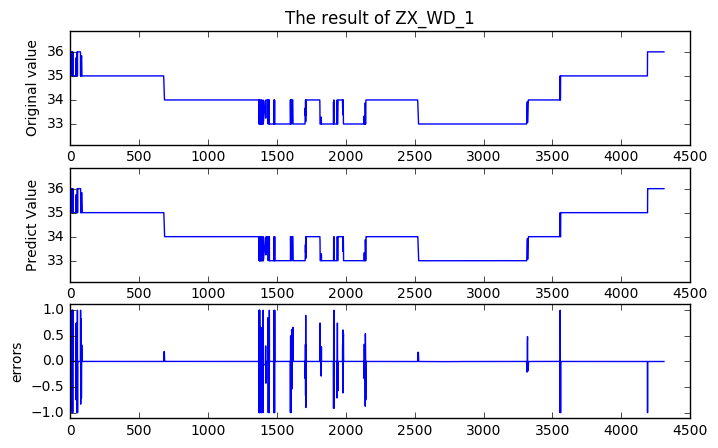

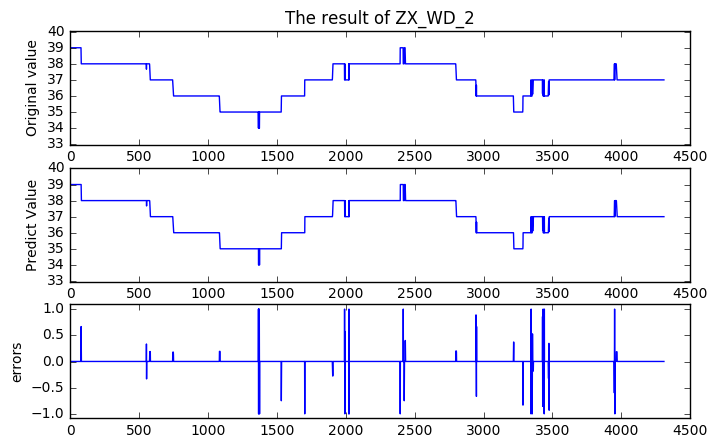

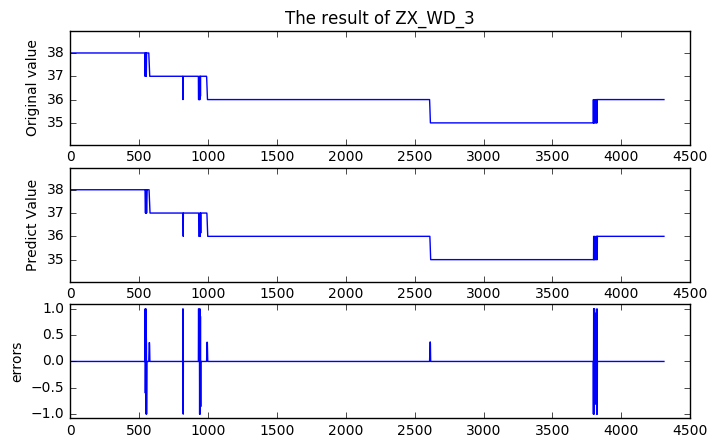

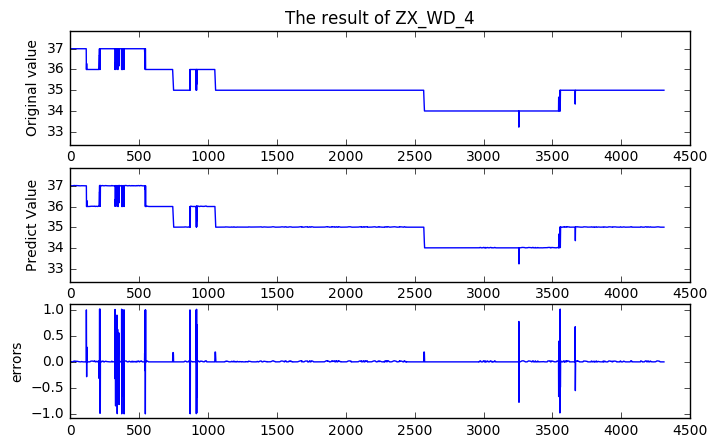

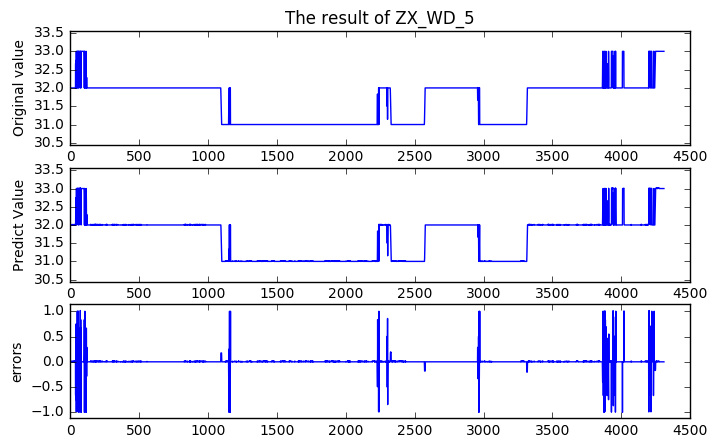

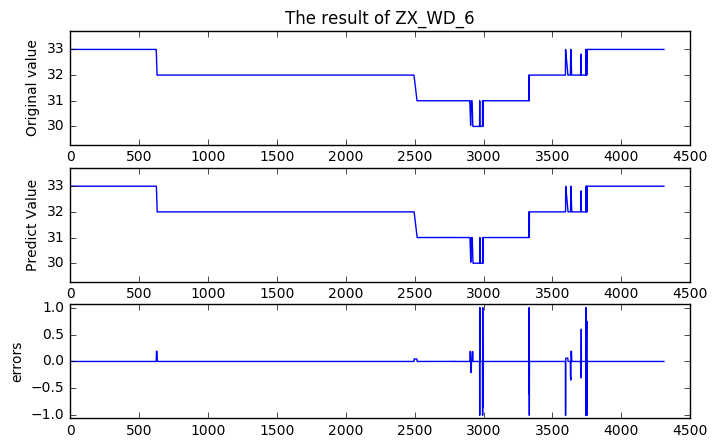

In [105]:
model_indexs = np.zeros(6)
model_indexs = model_indexs.astype(int)
print("model indexs:")
print(model_indexs)
compare_plot_delay_deap(model_indexs,seg_3,time_delays,deap_results)

#### seg4

-------------------------learn ZX_WD_1------------
----------prepare_data_delay_deap------------------
del the target variable ZX_WD_1_dt0
number of variable: 207
the shape of X
(1396, 207)
the shape of y
(1396,)


/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:15: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


gen	evals	min                      	max        	diversity
0  	489  	[ 0.25036059  2.        ]	[ inf  22.]	475      
1  	500  	[ 0.14199849  1.        ]	[ 609.69807119   18.        ]	491      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


2  	500  	[ 0.0928009  1.       ]  	[ 609.69987832    6.        ]	493      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


3  	500  	[ 0.0928009  1.       ]  	[ 609.69987832    4.        ]	495      
4  	500  	[ 0.0928009  1.       ]  	[ 609.69987832    8.        ]	495      
5  	500  	[ 0.0928009  1.       ]  	[ 609.69987832   12.        ]	495      
6  	500  	[ 0.0928009  1.       ]  	[ 609.69987832    9.        ]	494      
7  	500  	[ 0.0928009  1.       ]  	[ 609.69987832    9.        ]	493      
8  	500  	[ 0.0928009  1.       ]  	[ 609.69417114    9.        ]	492      
9  	500  	[ 0.0928009  1.       ]  	[ 462.956674   10.      ]    	490      
10 	500  	[ 0.0928009  1.       ]  	[ 457.00479708   11.        ]	490      
11 	500  	[ 0.0928009  1.       ]  	[ 33.93719922  13.        ]  	492      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


12 	500  	[ 0.0928009  1.       ]  	[ 33.91640764  10.        ]  	494      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


13 	500  	[ 0.09271148  1.        ]	[ 462.9393333    5.       ]  	496      
14 	500  	[ 0.09271148  1.        ]	[ 457.00479708   11.        ]	494      
15 	500  	[ 0.09271148  1.        ]	[ 33.97667387  11.        ]  	493      
16 	500  	[ 0.09271148  1.        ]	[ 33.93476124  11.        ]  	497      
17 	500  	[ 0.09271148  1.        ]	[ 29.18056382  11.        ]  	496      
18 	500  	[ 0.09271148  1.        ]	[ 29.14979719  11.        ]  	494      
19 	500  	[ 0.09271148  1.        ]	[ 29.08853448  15.        ]  	491      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


20 	500  	[ 0.09271148  1.        ]	[ 29.16320193   7.        ]  	490      
21 	500  	[ 0.09271148  1.        ]	[ 29.08853448  10.        ]  	490      
22 	500  	[ 0.09271148  1.        ]	[ 29.09194865  10.        ]  	486      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


23 	500  	[ 0.09271148  1.        ]	[ 29.06382286   7.        ]  	483      
24 	500  	[ 0.09271148  1.        ]	[  3.00959621  10.        ]  	480      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


25 	500  	[ 0.09271148  1.        ]	[ 3.00959622  6.        ]    	479      
26 	500  	[ 0.09271148  1.        ]	[  3.00483212  11.        ]  	478      
27 	500  	[ 0.09271148  1.        ]	[  2.6956968  18.       ]    	478      
28 	500  	[ 0.09271148  1.        ]	[  2.69037691  18.        ]  	481      
29 	500  	[ 0.09271148  1.        ]	[  2.68504648  18.        ]  	481      
30 	500  	[ 0.09271148  1.        ]	[  2.67762563  21.        ]  	477      
31 	500  	[ 0.09271148  1.        ]	[  2.43936973  21.        ]  	473      
32 	500  	[ 0.09271148  1.        ]	[  2.43586689  15.        ]  	469      
33 	500  	[ 0.09271148  1.        ]	[  2.43399937  15.        ]  	468      
34 	500  	[ 0.09271148  1.        ]	[  2.43374209  15.        ]  	457      
35 	500  	[ 0.09270164  1.        ]	[  2.39896923  15.        ]  	450      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


36 	500  	[ 0.09270108  1.        ]	[ 2.68771302  8.        ]    	461      
37 	500  	[ 0.09266544  1.        ]	[  2.43606253  14.        ]  	457      
38 	500  	[ 0.09266544  1.        ]	[  2.43319201  16.        ]  	453      
39 	500  	[ 0.09266544  1.        ]	[  2.43223291  14.        ]  	448      
40 	500  	[ 0.09266544  1.        ]	[  2.43223291  14.        ]  	436      
41 	500  	[ 0.09266544  1.        ]	[  2.43762701  14.        ]  	443      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


42 	500  	[ 0.09271086  1.        ]	[ 33.92332929   6.        ]  	447      
43 	500  	[ 0.09271086  1.        ]	[  3.00602386  11.        ]  	447      
44 	500  	[ 0.09271086  1.        ]	[  2.69303817  11.        ]  	448      
45 	500  	[ 0.09271086  1.        ]	[  2.68830534  11.        ]  	436      
46 	500  	[ 0.09271086  1.        ]	[  2.6823773  17.       ]    	424      
47 	500  	[ 0.09270634  1.        ]	[  2.67762563  17.        ]  	422      
48 	500  	[ 0.09270634  1.        ]	[  2.44115275  19.        ]  	426      
49 	500  	[ 0.09268902  1.        ]	[  2.43399937  19.        ]  	423      
--------------------end----------------------------
-------------------------learn ZX_WD_2------------
----------prepare_data_delay_deap------------------
del the target variable ZX_WD_2_dt0
number of variable: 207
the shape of X
(1396, 207)
the shape of y
(1396,)


/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:15: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


gen	evals	min                      	max        	diversity
0  	489  	[ 0.82920602  2.        ]	[ inf  22.]	476      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


1  	500  	[ 0.15577621  1.        ]	[ 1304.81779485     4.        ]	498      
2  	500  	[ 0.10125659  1.        ]	[ 607.11401334    9.        ]  	496      
3  	500  	[ 0.10125659  1.        ]	[ 607.11401334    9.        ]  	499      
4  	500  	[ 0.10125659  1.        ]	[ 607.11401334    9.        ]  	499      
5  	500  	[ 0.10125659  1.        ]	[ 607.11543047    9.        ]  	499      
6  	500  	[ 0.10125659  1.        ]	[ 607.11543047   11.        ]  	499      
7  	500  	[ 0.10125659  1.        ]	[ 607.11543047   10.        ]  	499      
8  	500  	[ 0.10125659  1.        ]	[ 607.10548855   10.        ]  	499      
9  	500  	[ 0.10125659  1.        ]	[ 454.45250489   11.        ]  	498      
10 	500  	[ 0.10125659  1.        ]	[ 36.47659721  12.        ]    	497      
11 	500  	[ 0.10125659  1.        ]	[ 31.65708757  12.        ]    	496      
12 	500  	[ 0.10125659  1.        ]	[ 36.46262963  12.        ]    	494      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


13 	500  	[ 0.10125659  1.        ]	[ 31.65708757   9.        ]    	491      
14 	500  	[ 0.10125659  1.        ]	[ 31.6445379  14.       ]      	493      
15 	500  	[ 0.10125659  1.        ]	[ 31.58885895  14.        ]    	492      
16 	500  	[ 0.10125659  1.        ]	[  5.63480544  14.        ]    	490      
17 	500  	[ 0.10125659  1.        ]	[  5.06532119  14.        ]    	490      
18 	500  	[ 0.10125659  1.        ]	[  5.00680919  14.        ]    	489      
19 	500  	[ 0.10125659  1.        ]	[  4.99792773  15.        ]    	483      
20 	500  	[ 0.10125659  1.        ]	[  2.68114044  14.        ]    	479      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


21 	500  	[ 0.10125659  1.        ]	[  2.67762563  14.        ]    	478      
22 	500  	[ 0.10125659  1.        ]	[  2.67579161  15.        ]    	470      
23 	500  	[ 0.10125659  1.        ]	[  2.66958781  18.        ]    	460      
24 	500  	[ 0.10125659  1.        ]	[  2.65892932  21.        ]    	451      
25 	500  	[ 0.10125659  1.        ]	[  2.65396183  21.        ]    	425      
26 	500  	[ 0.10125659  1.        ]	[  2.65100766  21.        ]    	403      
27 	500  	[ 0.10125659  1.        ]	[  2.64869513  22.        ]    	371      
28 	500  	[ 0.10125659  1.        ]	[  2.64788366  21.        ]    	343      
29 	500  	[ 0.10125659  1.        ]	[  1.74596062  24.        ]    	323      
30 	500  	[ 0.10125659  1.        ]	[  2.65768099  24.        ]    	342      
31 	500  	[ 0.10125659  1.        ]	[  2.65396183  24.        ]    	357      
32 	500  	[ 0.10125659  1.        ]	[  2.68247598  26.        ]    	428      
33 	500  	[ 0.10125659  1.        ]	[  2.67360974  29.        ] 

/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:15: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


gen	evals	min                      	max        	diversity
0  	489  	[ 0.73294214  2.        ]	[ inf  22.]	475      
1  	500  	[ 0.1060883  1.       ]  	[ 607.56042743   18.        ]	494      
2  	500  	[ 0.1060883  1.       ]  	[ 607.56081106   18.        ]	493      
3  	500  	[ 0.1060883  1.       ]  	[ 607.56185776   21.        ]	490      
4  	500  	[ 0.1060883  1.       ]  	[ 607.56185776   21.        ]	488      
5  	500  	[ 0.1060883  1.       ]  	[ 607.56081106   21.        ]	485      
6  	500  	[ 0.1060883  1.       ]  	[ 607.5565222   17.       ]  	485      
7  	500  	[ 0.1060883  1.       ]  	[ 460.73543297   19.        ]	484      
8  	500  	[ 0.1060883  1.       ]  	[ 36.02780038  19.        ]  	487      
9  	500  	[ 0.1060883  1.       ]  	[ 31.16767743  21.        ]  	491      
10 	500  	[ 0.1060883  1.       ]  	[ 31.16767743  23.        ]  	492      
11 	500  	[ 0.1060883  1.       ]  	[ 31.14580597  23.        ]  	492      
12 	500  	[ 0.1060883  1.       ]  	[  5.1547343

/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:15: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


gen	evals	min                      	max        	diversity
0  	489  	[ 0.15600517  2.        ]	[ inf  22.]	475      
1  	500  	[ 0.10664308  1.        ]	[ 608.72680286   18.        ]	492      
2  	500  	[ 0.09799261  1.        ]	[ 608.72860789   18.        ]	495      
3  	500  	[ 0.09799261  1.        ]	[ 608.72860789   18.        ]	492      
4  	500  	[ 0.09799261  1.        ]	[ 608.72433353   21.        ]	491      
5  	500  	[ 0.09799261  1.        ]	[ 608.71827127   21.        ]	494      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


6  	500  	[ 0.09799261  1.        ]	[ 608.71827127    8.        ]	494      
7  	500  	[ 0.09799261  1.        ]	[ 456.07500554   14.        ]	494      
8  	500  	[ 0.09799261  1.        ]	[ 34.86748252  14.        ]  	498      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


9  	500  	[ 0.09799261  1.        ]	[ 34.88190553   7.        ]  	496      
10 	500  	[ 0.09799261  1.        ]	[ 30.07647266  10.        ]  	494      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


11 	500  	[ 0.09799261  1.        ]	[ 34.88143567   6.        ]  	495      
12 	500  	[ 0.09799261  1.        ]	[ 30.02669691  11.        ]  	495      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


13 	500  	[ 0.09799261  1.        ]	[ 30.01462004   6.        ]  	494      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


14 	500  	[ 0.09799261  1.        ]	[ 30.00337358   7.        ]  	494      
15 	500  	[ 0.09799261  1.        ]	[  3.98429984  11.        ]  	494      
16 	500  	[ 0.09799261  1.        ]	[  3.97926258  12.        ]  	494      
17 	500  	[ 0.09799261  1.        ]	[  3.97800226  22.        ]  	494      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


18 	500  	[ 0.09799261  1.        ]	[ 3.40022765  9.        ]    	493      
19 	500  	[ 0.09799261  1.        ]	[  3.39839825  12.        ]  	489      
20 	500  	[ 0.09799261  1.        ]	[  3.3958775  12.       ]    	487      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


21 	500  	[ 0.09799261  1.        ]	[ 30.10051622   6.        ]  	489      
22 	500  	[ 0.09799261  1.        ]	[ 3.98178201  9.        ]    	487      
23 	500  	[ 0.09792837  1.        ]	[ 3.39912781  9.        ]    	485      
24 	500  	[ 0.09792837  1.        ]	[  3.3958775  10.       ]    	478      
25 	500  	[ 0.09792837  1.        ]	[  3.3939268  12.       ]    	479      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


26 	500  	[ 0.09792837  1.        ]	[ 3.97800226  6.        ]    	476      
27 	500  	[ 0.09792837  1.        ]	[  3.39735377  10.        ]  	474      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


28 	500  	[ 0.09792837  1.        ]	[ 3.3958775  6.       ]      	472      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


29 	500  	[ 0.09792837  1.        ]	[ 3.39440059  6.        ]    	473      
30 	500  	[ 0.09792837  1.        ]	[  3.39204295  12.        ]  	469      
31 	500  	[ 0.09792837  1.        ]	[  3.36473865  12.        ]  	461      
32 	500  	[ 0.09792837  1.        ]	[  3.36090438  12.        ]  	456      
33 	500  	[ 0.09792837  1.        ]	[  3.3565891  18.       ]    	440      
34 	500  	[ 0.09792837  1.        ]	[  3.35355848  18.        ]  	424      
35 	500  	[ 0.09792837  1.        ]	[  3.35206292  16.        ]  	421      
36 	500  	[ 0.09792837  1.        ]	[  3.35206292  16.        ]  	425      
37 	500  	[ 0.09792837  1.        ]	[  1.76434193  11.        ]  	419      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


38 	500  	[ 0.09792837  1.        ]	[ 3.35594497  8.        ]    	411      
39 	500  	[ 0.09792837  1.        ]	[  1.76066875  13.        ]  	391      
40 	500  	[ 0.09792837  1.        ]	[  1.76190422  13.        ]  	407      
41 	500  	[ 0.09792837  1.        ]	[  1.76066875  14.        ]  	416      
42 	500  	[ 0.09789443  1.        ]	[  1.75087706  16.        ]  	395      
43 	500  	[ 0.09789443  1.        ]	[  1.75087706  16.        ]  	408      
44 	500  	[ 0.09789443  1.        ]	[  1.74842057  20.        ]  	402      
45 	500  	[ 0.09789443  1.        ]	[  1.24731232  20.        ]  	371      
46 	500  	[ 0.09789443  1.        ]	[  1.23112689  21.        ]  	341      
47 	500  	[ 0.09789443  1.        ]	[  1.07531754  23.        ]  	271      
48 	500  	[ 0.09789443  1.        ]	[  1.07239807  16.        ]  	229      
49 	500  	[ 0.09789443  1.        ]	[  1.23112689  16.        ]  	250      
--------------------end----------------------------
-------------------------learn ZX_WD

/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:15: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


gen	evals	min                      	max        	diversity
0  	489  	[ 0.06555902  2.        ]	[ inf  22.]	476      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


1  	500  	[ 0.03785044  1.        ]	[  2.50062289e+05   4.00000000e+00]	497      
2  	500  	[ 0.03785044  1.        ]	[ 612.70353117   10.        ]      	495      
3  	500  	[ 0.03785044  1.        ]	[ 612.70353117   10.        ]      	491      
4  	500  	[ 0.03785044  1.        ]	[ 612.70496102   13.        ]      	490      
5  	500  	[ 0.03785044  1.        ]	[ 612.70496102   13.        ]      	491      
6  	500  	[ 0.03785044  1.        ]	[ 612.70496102   14.        ]      	491      
7  	500  	[ 0.03785044  1.        ]	[ 612.70496102   14.        ]      	491      
8  	500  	[ 0.03785044  1.        ]	[ 612.70210132   13.        ]      	491      
9  	500  	[ 0.03785044  1.        ]	[ 466.02386607   13.        ]      	491      
10 	500  	[ 0.03785044  1.        ]	[ 460.00472807   13.        ]      	490      
11 	500  	[ 0.03785044  1.        ]	[ 31.00831918  16.        ]        	494      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


12 	500  	[ 0.03785044  1.        ]	[ 465.83406089    6.        ]      	491      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


13 	500  	[ 0.03785044  1.        ]	[ 31.0329663   9.       ]          	491      
14 	500  	[ 0.03785044  1.        ]	[ 31.02440135  10.        ]        	490      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


15 	500  	[ 0.03785044  1.        ]	[ 31.02194531  10.        ]        	492      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


16 	500  	[ 0.03785044  1.        ]	[ 31.02194531   6.        ]        	490      
17 	500  	[ 0.03785044  1.        ]	[ 31.02194531   8.        ]        	490      
18 	500  	[ 0.03785044  1.        ]	[ 31.00169868   9.        ]        	488      
19 	500  	[ 0.03785044  1.        ]	[ 31.00169868   9.        ]        	488      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


20 	500  	[ 0.03785044  1.        ]	[ 30.47113341   9.        ]        	487      
21 	500  	[ 0.03785044  1.        ]	[ 26.27274729  12.        ]        	487      
22 	500  	[ 0.03785044  1.        ]	[ 26.23486976   9.        ]        	483      
23 	500  	[ 0.03785044  1.        ]	[ 26.18170955  10.        ]        	480      
24 	500  	[ 0.03782591  1.        ]	[  5.64737693  13.        ]        	476      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


25 	500  	[ 0.03782591  1.        ]	[ 26.19527357   6.        ]        	473      
26 	500  	[ 0.03782591  1.        ]	[  5.64737645  10.        ]        	470      
27 	500  	[ 0.03782591  1.        ]	[  5.64179306  12.        ]        	468      
28 	500  	[ 0.03782591  1.        ]	[  5.64179258  13.        ]        	468      
29 	500  	[ 0.03782591  1.        ]	[  5.63620318  13.        ]        	465      
30 	500  	[ 0.03782591  1.        ]	[  5.16237176  14.        ]        	467      
31 	500  	[ 0.03782591  1.        ]	[  5.15831185  14.        ]        	469      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


32 	500  	[ 0.03782591  1.        ]	[ 26.16150688   7.        ]        	466      
33 	500  	[ 0.03782591  1.        ]	[  5.64179306  12.        ]        	466      
34 	500  	[ 0.03782591  1.        ]	[  5.16542358  12.        ]        	463      
35 	500  	[ 0.03782591  1.        ]	[  5.16542358  12.        ]        	453      
36 	500  	[ 0.03782591  1.        ]	[  5.1638979  12.       ]          	451      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


37 	500  	[ 0.03782591  1.        ]	[ 5.63899905  6.        ]          	446      
38 	500  	[ 0.03782591  1.        ]	[ 5.63620318  8.        ]          	446      
39 	500  	[ 0.03782266  1.        ]	[  5.1644185  12.       ]          	446      
40 	500  	[ 0.03782266  1.        ]	[  5.16289251  15.        ]        	444      
41 	500  	[ 0.03782266  1.        ]	[  5.15831185  15.        ]        	435      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


42 	500  	[ 0.03782591  1.        ]	[ 26.1655481   6.       ]          	432      
43 	500  	[ 0.03782591  1.        ]	[  5.1644185  14.       ]          	425      
44 	500  	[ 0.03782591  1.        ]	[  5.16289251  17.        ]        	438      
45 	500  	[ 0.03782591  1.        ]	[  5.15983919  17.        ]        	440      
46 	500  	[ 0.03782372  1.        ]	[  5.15931813  17.        ]        	449      
47 	500  	[ 0.03782372  1.        ]	[  5.15678406  19.        ]        	447      
48 	500  	[ 0.03781607  1.        ]	[  5.15525582  19.        ]        	444      
49 	500  	[ 0.03781607  1.        ]	[  3.99551592  19.        ]        	440      
--------------------end----------------------------
-------------------------learn ZX_WD_6------------
----------prepare_data_delay_deap------------------
del the target variable ZX_WD_6_dt0
number of variable: 207
the shape of X
(1396, 207)
the shape of y
(1396,)


/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:15: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


gen	evals	min                      	max        	diversity
0  	489  	[ 0.47056677  2.        ]	[ inf  22.]	475      
1  	500  	[ 0.15366256  1.        ]	[ 612.08697044   18.        ]	493      
2  	500  	[ 0.15366256  1.        ]	[ 612.08697044   18.        ]	497      
3  	500  	[ 0.12577917  1.        ]	[ 612.08697044   18.        ]	496      
4  	500  	[ 0.12577917  1.        ]	[ 612.08697044   18.        ]	496      
5  	500  	[ 0.12577917  1.        ]	[ 612.08697044   18.        ]	495      
6  	500  	[ 0.12577917  1.        ]	[ 465.42238315   18.        ]	493      
7  	500  	[ 0.12577917  1.        ]	[ 459.41043807   18.        ]	490      
8  	500  	[ 0.12577917  1.        ]	[ 31.60009227  18.        ]  	486      
9  	500  	[ 0.12577917  1.        ]	[ 26.84264779  21.        ]  	487      
10 	500  	[ 0.12577917  1.        ]	[  5.07846783  21.        ]  	485      
11 	500  	[ 0.12577917  1.        ]	[  4.56345711  21.        ]  	490      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


12 	500  	[ 0.12577917  1.        ]	[ 4.55654513  9.        ]    	485      
13 	500  	[ 0.12577917  1.        ]	[  3.40532602  13.        ]  	483      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


14 	500  	[ 0.12577917  1.        ]	[ 31.63191902   6.        ]  	487      
15 	500  	[ 0.12577917  1.        ]	[  5.09086535  11.        ]  	486      
16 	500  	[ 0.12577917  1.        ]	[  5.07254015  11.        ]  	481      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


17 	500  	[ 0.12577917  1.        ]	[ 5.08754494  6.        ]    	478      
18 	500  	[ 0.12577917  1.        ]	[  5.07254015  10.        ]  	477      
19 	500  	[ 0.12577917  1.        ]	[  4.56690917  12.        ]  	475      
20 	500  	[ 0.12577917  1.        ]	[  4.56345711  12.        ]  	472      
21 	500  	[ 0.12577917  1.        ]	[  4.56173009  12.        ]  	467      
22 	500  	[ 0.12577917  1.        ]	[  4.55950356  12.        ]  	461      
23 	500  	[ 0.12577917  1.        ]	[  4.55950356  12.        ]  	461      
24 	500  	[ 0.12577917  1.        ]	[  4.55827411  12.        ]  	448      
25 	500  	[ 0.12577917  1.        ]	[  4.55604589  14.        ]  	437      
26 	500  	[ 0.12577917  1.        ]	[  3.40532602  15.        ]  	432      
27 	500  	[ 0.12577917  1.        ]	[  3.39884355  15.        ]  	421      
28 	500  	[ 0.12577917  1.        ]	[  2.48611275  17.        ]  	410      
29 	500  	[ 0.12577917  1.        ]	[  2.48063218  19.        ]  	401      
30 	500  	[ 

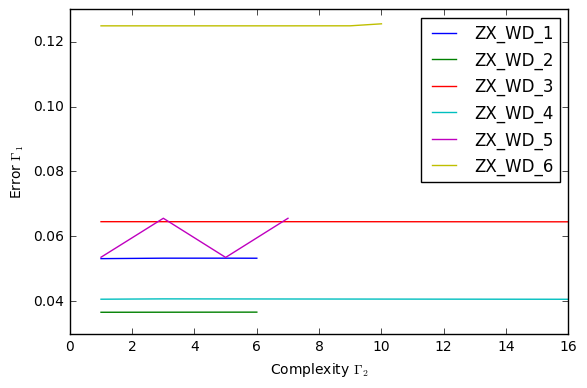

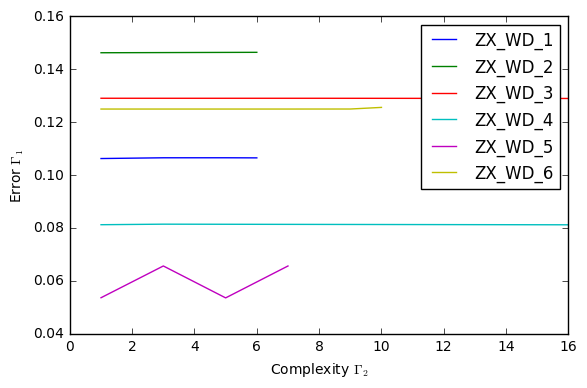

In [106]:
deap_results = learn_delay_deap(seg_4,time_delays)
result_summary_gp(deap_results,varnames[0:var_num_learn])

model indexs:
[0 0 0 0 0 0]
----------prepare_data_delay_deap------------------
del the target variable ZX_WD_1_dt0
number of variable: 207
the shape of X
(1396, 207)
the shape of y
(1396,)
1.0*ZX_WD_1_dt1 - 0.002/sin(ZX_HW_2_dt10)


/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:15: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


----------prepare_data_delay_deap------------------
del the target variable ZX_WD_2_dt0
number of variable: 207
the shape of X
(1396, 207)
the shape of y
(1396,)
ZX_WD_2_dt1 + square(ZX_WD_2_dt2/ZD_JHG_dt15)
----------prepare_data_delay_deap------------------
del the target variable ZX_WD_3_dt0
number of variable: 207
the shape of X
(1396, 207)
the shape of y
(1396,)
(ZX_WD_3_dt2*ZX_WD_5_dt5*(ZX_WD_5_dt1 + exp(ZD_SPEED_dt8)) - sqrt((ZD_JHG_dt14 + ZD_JHG_dt9)*sin(ZX_WD_2_dt1)))/(ZX_WD_5_dt5*(ZX_WD_5_dt1 + exp(ZD_SPEED_dt8)))
----------prepare_data_delay_deap------------------
del the target variable ZX_WD_4_dt0
number of variable: 207
the shape of X
(1396, 207)
the shape of y
(1396,)
ZX_WD_4_dt1 + ZX_WD_3_dt7/(ZD_JHG_dt1*(ZX_HW_2_dt15 + sin(ZX_WD_6_dt1)/cos(ZX_WD_1_dt7))*cos(ZX_WD_1_dt2))
----------prepare_data_delay_deap------------------
del the target variable ZX_WD_5_dt0
number of variable: 207
the shape of X
(1396, 207)
the shape of y
(1396,)
ZX_WD_5_dt2 - 0.00199800266267306*cos(Z

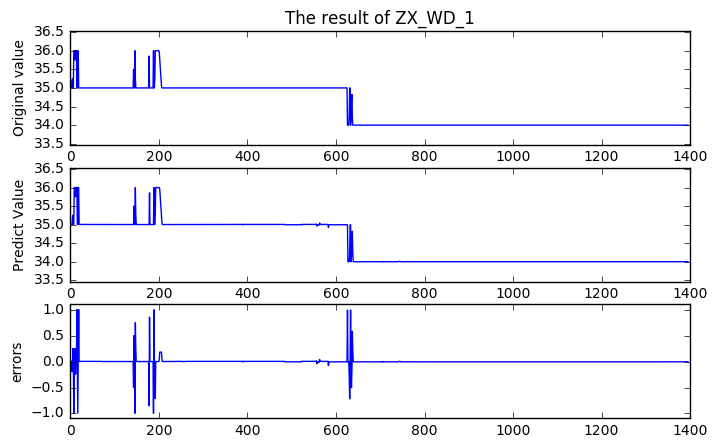

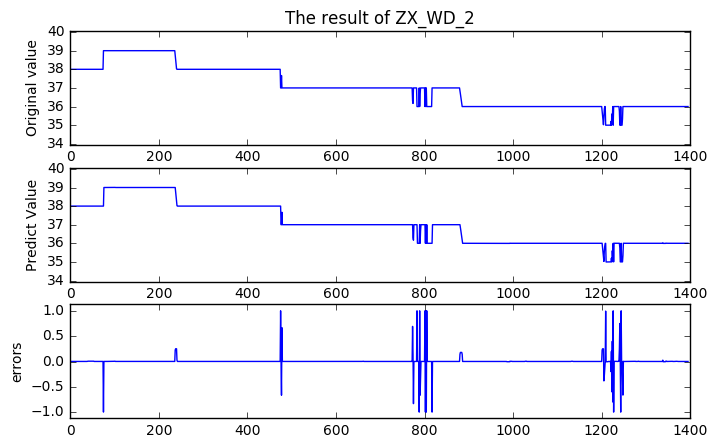

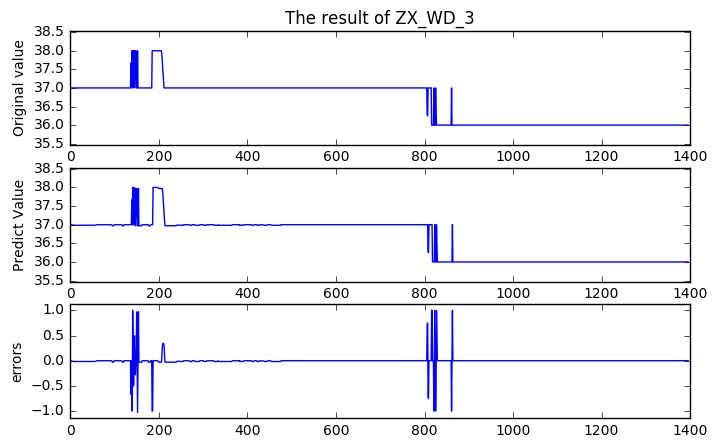

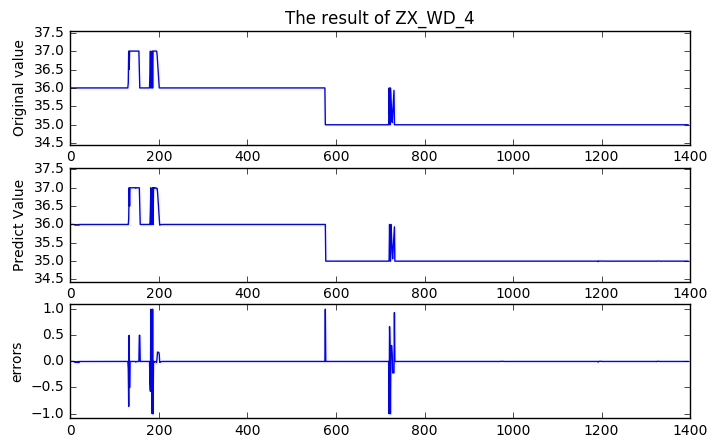

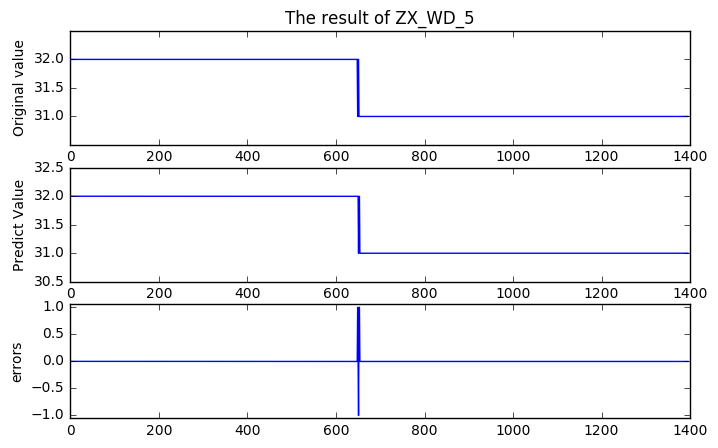

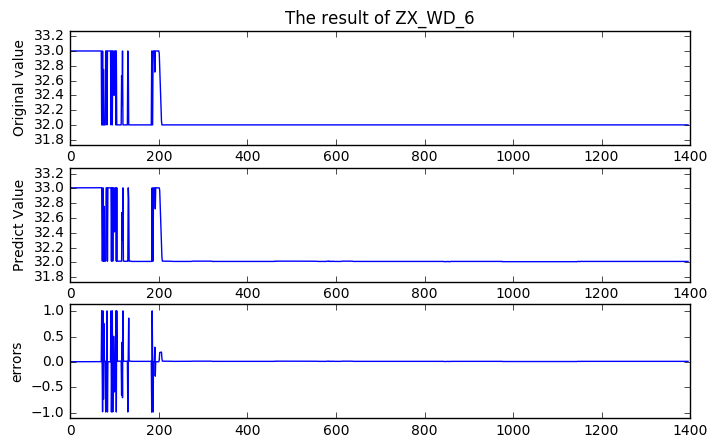

In [107]:
model_indexs = np.zeros(6)
model_indexs = model_indexs.astype(int)
#model_indexs[5] = 1
print("model indexs:")
print(model_indexs)
compare_plot_delay_deap(model_indexs,seg_4,time_delays,deap_results)

### Learn for segment data set with time delay in biger step

In [108]:
time_delays2 = np.arange(0,100,10)

#### seg1

-------------------------learn ZX_WD_1------------
----------prepare_data_delay_deap------------------
del the target variable ZX_WD_1_dt0
number of variable: 129
the shape of X
(828, 129)
the shape of y
(828,)


/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:15: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


gen	evals	min                      	max        	diversity
0  	484  	[ 0.73073352  2.        ]	[ inf  24.]	464      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


1  	500  	[ 0.10080437  1.        ]	[  3.18638030e+14   4.00000000e+00]	482      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


2  	500  	[ 0.09308835  1.        ]	[ 606.89418064    4.        ]      	478      
3  	500  	[ 0.09308835  1.        ]	[ 606.89418064   10.        ]      	474      
4  	500  	[ 0.09308835  1.        ]	[ 606.89418064    9.        ]      	482      
5  	500  	[ 0.09308835  1.        ]	[ 606.89418064    9.        ]      	491      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


6  	500  	[ 0.08814261  1.        ]	[ 606.89418064    6.        ]      	491      
7  	500  	[ 0.08814261  1.        ]	[ 606.89418064    8.        ]      	490      
8  	500  	[ 0.08814261  1.        ]	[ 606.89418064    9.        ]      	490      
9  	500  	[ 0.08814261  1.        ]	[ 606.89418064    9.        ]      	490      
10 	500  	[ 0.08814261  1.        ]	[ 606.89418064   12.        ]      	488      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


11 	500  	[ 0.08814261  1.        ]	[ 606.89418064    7.        ]      	486      
12 	500  	[ 0.08814261  1.        ]	[ 606.89418064   10.        ]      	486      
13 	500  	[ 0.08814261  1.        ]	[ 606.83833019   11.        ]      	486      
14 	500  	[ 0.08814261  1.        ]	[ 606.81675422   11.        ]      	483      
15 	500  	[ 0.08814261  1.        ]	[ 606.87018057   13.        ]      	484      
16 	500  	[ 0.08814261  1.        ]	[ 606.83823574   13.        ]      	482      
17 	500  	[ 0.08814261  1.        ]	[ 606.80475779   15.        ]      	482      
18 	500  	[ 0.08814261  1.        ]	[ 606.78762774   15.        ]      	481      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


19 	500  	[ 0.08814261  1.        ]	[ 606.89418064    7.        ]      	480      
20 	500  	[ 0.08814261  1.        ]	[ 606.84617887    9.        ]      	478      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


21 	500  	[ 0.08814261  1.        ]	[ 606.83833019   10.        ]      	475      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


22 	500  	[ 0.08814261  1.        ]	[ 606.87018057    7.        ]      	469      
23 	500  	[ 0.08814261  1.        ]	[ 606.84617887   11.        ]      	468      
24 	500  	[ 0.08814261  1.        ]	[ 606.82875362   11.        ]      	464      
25 	500  	[ 0.08814261  1.        ]	[ 606.79274217   12.        ]      	465      
26 	500  	[ 0.08814261  1.        ]	[ 419.33248506   13.        ]      	465      
27 	500  	[ 0.08814261  1.        ]	[ 418.05643133   13.        ]      	462      
28 	500  	[ 0.08814261  1.        ]	[ 407.9402751   14.       ]        	464      
29 	500  	[ 0.08814261  1.        ]	[ 34.83250409  17.        ]        	469      
30 	500  	[ 0.08814261  1.        ]	[ 31.71473465  17.        ]        	470      
31 	500  	[ 0.08814261  1.        ]	[  3.84304266  17.        ]        	468      
32 	500  	[ 0.08814261  1.        ]	[  3.72819147  21.        ]        	462      
33 	500  	[ 0.08814261  1.        ]	[  3.62732029  21.        ]        	454      
34 	500  	[ 0.08

/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:15: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


gen	evals	min                      	max        	diversity
0  	484  	[ 2.82421034  2.        ]	[ inf  24.]	470      
1  	500  	[ 0.30532934  1.        ]	[ 1224.53108112     5.        ]	498      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


2  	500  	[ 0.30532934  1.        ]	[ 604.55707093    6.        ]  	490      
3  	500  	[ 0.30532934  1.        ]	[ 604.55707093   11.        ]  	498      
4  	500  	[ 0.30532934  1.        ]	[ 604.55707093   11.        ]  	497      
5  	500  	[ 0.30532934  1.        ]	[ 604.55707093   12.        ]  	497      
6  	500  	[ 0.30532934  1.        ]	[ 604.55707093   12.        ]  	496      
7  	500  	[ 0.30532934  1.        ]	[ 604.55707093   12.        ]  	493      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


8  	500  	[ 0.30532934  1.        ]	[ 604.55707093    6.        ]  	492      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


9  	500  	[ 0.30532934  1.        ]	[ 604.45079308    7.        ]  	493      
10 	500  	[ 0.30532934  1.        ]	[ 417.05655163   11.        ]  	492      
11 	500  	[ 0.30532934  1.        ]	[ 413.28649458   11.        ]  	491      
12 	500  	[ 0.30532934  1.        ]	[ 405.68242443   17.        ]  	492      
13 	500  	[ 0.30532934  1.        ]	[ 37.1022353  18.       ]      	491      
14 	500  	[ 0.30532934  1.        ]	[ 37.09841225  20.        ]    	490      
15 	500  	[ 0.30532934  1.        ]	[ 36.82579071  20.        ]    	488      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


16 	500  	[ 0.30532934  1.        ]	[ 417.02301938    6.        ]  	484      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


17 	500  	[ 0.30532934  1.        ]	[ 405.717045    6.      ]      	483      
18 	500  	[ 0.3031723  1.       ]  	[ 404.42944783   10.        ]  	483      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


19 	500  	[ 0.3031723  1.       ]  	[ 404.42944783    6.        ]  	483      
20 	500  	[ 0.3031723  1.       ]  	[ 400.97064545    9.        ]  	479      
21 	500  	[ 0.3031723  1.       ]  	[ 37.1022353  10.       ]      	477      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


22 	500  	[ 0.3031723  1.       ]  	[ 401.08820007    6.        ]  	477      
23 	500  	[ 0.3031723  1.       ]  	[ 37.1022353  11.       ]      	477      
24 	500  	[ 0.3031723  1.       ]  	[ 37.08604638  13.        ]    	474      
25 	500  	[ 0.3031723  1.       ]  	[ 36.82579071  14.        ]    	473      
26 	500  	[ 0.3031723  1.       ]  	[ 34.61707387  14.        ]    	473      
27 	500  	[ 0.30317208  1.        ]	[ 34.01094636  16.        ]    	473      
28 	500  	[ 0.30317208  1.        ]	[  6.08940637  18.        ]    	473      
29 	500  	[ 0.30317208  1.        ]	[  5.95744464  21.        ]    	467      
30 	500  	[ 0.30317208  1.        ]	[  5.89991585  21.        ]    	462      
31 	500  	[ 0.30317208  1.        ]	[  5.92273022  21.        ]    	461      
32 	500  	[ 0.30317208  1.        ]	[  5.92273022  21.        ]    	454      
33 	500  	[ 0.30317208  1.        ]	[  5.88662932  23.        ]    	460      
34 	500  	[ 0.30317208  1.        ]	[  5.67505691  21.        ] 

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


39 	500  	[ 0.30317208  1.        ]	[ inf   8.]                    	471      
40 	500  	[ 0.30317208  1.        ]	[ 401.08820007   11.        ]  	471      
41 	500  	[ 0.30317208  1.        ]	[ 34.95632627  14.        ]    	468      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


42 	500  	[ 0.30317208  1.        ]	[ 604.45079308    6.        ]  	481      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


43 	500  	[ 0.30317208  1.        ]	[ 401.27556843    6.        ]  	476      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


44 	500  	[ 0.30317208  1.        ]	[ 37.0986401   6.       ]      	472      
45 	500  	[ 0.30317208  1.        ]	[ 37.08604638   9.        ]    	468      
46 	500  	[ 0.30317208  1.        ]	[ 36.82579071  12.        ]    	464      
47 	500  	[ 0.30317208  1.        ]	[ 34.95632627  12.        ]    	461      
48 	500  	[ 0.30317208  1.        ]	[ 34.42997731  17.        ]    	457      
49 	500  	[ 0.30317208  1.        ]	[ 33.95227199  17.        ]    	448      
--------------------end----------------------------
-------------------------learn ZX_WD_3------------
----------prepare_data_delay_deap------------------
del the target variable ZX_WD_3_dt0
number of variable: 129
the shape of X
(828, 129)
the shape of y
(828,)


/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:15: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


gen	evals	min                      	max        	diversity
0  	484  	[ 1.51334834  2.        ]	[ inf  24.]	464      
1  	500  	[ 0.14853724  1.        ]	[  2.09314177e+05   5.00000000e+00]	487      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


2  	500  	[ 0.14853724  1.        ]	[ 605.91904577    4.        ]      	486      
3  	500  	[ 0.14853724  1.        ]	[ 605.91904577    8.        ]      	487      
4  	500  	[ 0.09993007  1.        ]	[ 605.91904577   10.        ]      	491      
5  	500  	[ 0.09993007  1.        ]	[ 605.91904577   11.        ]      	491      
6  	500  	[ 0.09993007  1.        ]	[ 605.91904577   11.        ]      	492      
7  	500  	[ 0.09993007  1.        ]	[ 605.91904577   11.        ]      	493      
8  	500  	[ 0.09993007  1.        ]	[ 605.91904577   13.        ]      	492      
9  	500  	[ 0.09993007  1.        ]	[ 605.91904577   16.        ]      	492      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


10 	500  	[ 0.09993007  1.        ]	[ 605.91904577   10.        ]      	490      
11 	500  	[ 0.09993007  1.        ]	[ 605.84156158   12.        ]      	490      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


12 	500  	[ 0.09993007  1.        ]	[ 605.89504583    6.        ]      	489      
13 	500  	[ 0.09993007  1.        ]	[ 605.86307827    9.        ]      	488      
14 	500  	[ 0.09993007  1.        ]	[ 605.81235929   11.        ]      	487      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


15 	500  	[ 0.09993007  1.        ]	[ 418.64412534    6.        ]      	487      
16 	500  	[ 0.09993007  1.        ]	[ 418.36248991   10.        ]      	485      
17 	500  	[ 0.09993007  1.        ]	[ 417.10798669   10.        ]      	483      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


18 	500  	[ 0.09993007  1.        ]	[ 605.81235929    6.        ]      	483      
19 	500  	[ 0.09993007  1.        ]	[ 605.84156158    8.        ]      	479      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


20 	500  	[ 0.09993007  1.        ]	[ 418.37669178    8.        ]      	477      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


21 	500  	[ 0.09993007  1.        ]	[ 418.36686589    6.        ]      	474      
22 	500  	[ 0.09993007  1.        ]	[ 414.60879184   11.        ]      	470      
23 	500  	[ 0.09993007  1.        ]	[ 407.00237358   11.        ]      	469      
24 	500  	[ 0.09993007  1.        ]	[ 406.99620963   11.        ]      	470      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


25 	500  	[ 0.09993007  1.        ]	[ 418.37669178    6.        ]      	468      
26 	500  	[ 0.09993007  1.        ]	[ 407.39670281    8.        ]      	463      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


27 	500  	[ 0.09993007  1.        ]	[ 407.02731616    6.        ]      	463      
28 	500  	[ 0.09993007  1.        ]	[ 407.00237358   10.        ]      	462      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


29 	500  	[ 0.09993007  1.        ]	[ 407.00237358   10.        ]      	460      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


30 	500  	[ 0.09993007  1.        ]	[ 414.57722483    6.        ]      	459      
31 	500  	[ 0.09993007  1.        ]	[ 407.39670281    8.        ]      	457      
32 	500  	[ 0.09993007  1.        ]	[ 407.39670281    8.        ]      	460      
33 	500  	[ 0.09993007  1.        ]	[ 407.02731616    8.        ]      	460      
34 	500  	[ 0.09993007  1.        ]	[ 407.00237358   11.        ]      	457      
35 	500  	[ 0.09993007  1.        ]	[ 406.99782202   11.        ]      	451      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


36 	500  	[ 0.09993007  1.        ]	[ 406.99620963    7.        ]      	447      
37 	500  	[ 0.0991976  1.       ]  	[ 402.59569124   10.        ]      	437      
38 	500  	[ 0.0991976  1.       ]  	[ 402.59569124    8.        ]      	434      
39 	500  	[ 0.0991976  1.       ]  	[ 402.28265409   13.        ]      	424      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


40 	500  	[ 0.0991976  1.       ]  	[ 402.39449379    6.        ]      	423      
41 	500  	[ 0.0991976  1.       ]  	[ 402.28265409    9.        ]      	421      
42 	500  	[ 0.0991976  1.       ]  	[ 35.8193535   9.       ]          	419      
43 	500  	[ 0.0991976  1.       ]  	[ 35.80316557  13.        ]        	420      
44 	500  	[ 0.0991976  1.       ]  	[ 35.74632308  13.        ]        	418      
45 	500  	[ 0.0991976  1.       ]  	[ 35.52469518  13.        ]        	417      
46 	500  	[ 0.0991976  1.       ]  	[ 33.44709956  13.        ]        	415      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


47 	500  	[ 0.0991976  1.       ]  	[ 402.59569124    6.        ]      	412      
48 	500  	[ 0.0991976  1.       ]  	[ 35.80316557   9.        ]        	410      
49 	500  	[ 0.0991976  1.       ]  	[ 35.80316557   9.        ]        	412      
--------------------end----------------------------
-------------------------learn ZX_WD_4------------
----------prepare_data_delay_deap------------------
del the target variable ZX_WD_4_dt0
number of variable: 129
the shape of X
(828, 129)
the shape of y
(828,)


/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:15: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


gen	evals	min                      	max        	diversity
0  	484  	[ 0.73125225  2.        ]	[ inf  24.]	464      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


1  	500  	[ 0.10039326  1.        ]	[  4.75251141e+15   4.00000000e+00]	485      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


2  	500  	[ 0.10039326  1.        ]	[ 606.90610069    5.        ]      	485      
3  	500  	[ 0.10039326  1.        ]	[ 606.90610069    8.        ]      	481      
4  	500  	[ 0.10039326  1.        ]	[ 606.90610069    8.        ]      	486      
5  	500  	[ 0.10039326  1.        ]	[ 606.90610069   13.        ]      	493      
6  	500  	[ 0.10039326  1.        ]	[ 606.90610069   12.        ]      	493      
7  	500  	[ 0.10039326  1.        ]	[ 606.90610069   12.        ]      	493      
8  	500  	[ 0.10039326  1.        ]	[ 606.90610069   12.        ]      	491      
9  	500  	[ 0.10039326  1.        ]	[ 606.90610069   16.        ]      	491      
10 	500  	[ 0.10039326  1.        ]	[ 606.90610069   16.        ]      	490      
11 	500  	[ 0.10039326  1.        ]	[ 606.85809986   17.        ]      	488      
12 	500  	[ 0.10039326  1.        ]	[ 606.79949559   17.        ]      	485      
13 	500  	[ 0.10039326  1.        ]	[ 415.51903387   17.        ]      	484      
14 	500  	[ 0.10

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


18 	500  	[ 0.10039326  1.        ]	[ 606.82865624    6.        ]      	482      
19 	500  	[ 0.0996642  1.       ]  	[ 606.85809986    9.        ]      	477      
20 	500  	[ 0.0996642  1.       ]  	[ 419.33711911   11.        ]      	473      
21 	500  	[ 0.0996642  1.       ]  	[ 419.31311127   10.        ]      	471      
22 	500  	[ 0.0996642  1.       ]  	[ 415.51903387   14.        ]      	470      
23 	500  	[ 0.0996642  1.       ]  	[ 408.34963289   14.        ]      	469      
24 	500  	[ 0.0996642  1.       ]  	[ 407.96669952   17.        ]      	472      
25 	500  	[ 0.0996642  1.       ]  	[ 403.33927377   17.        ]      	465      
26 	500  	[ 0.0996642  1.       ]  	[ 34.86064595  17.        ]        	463      
27 	500  	[ 0.0996642  1.       ]  	[ 32.48766472  17.        ]        	464      
28 	500  	[ 0.0996642  1.       ]  	[ 32.17735056  17.        ]        	463      
29 	500  	[ 0.0996642  1.       ]  	[ 32.1120316  14.       ]          	459      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


30 	500  	[ 0.0996642  1.       ]  	[ 419.31311127    6.        ]      	458      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


31 	500  	[ 0.0996642  1.       ]  	[ 406.6948757    8.       ]        	450      
32 	500  	[ 0.0996642  1.       ]  	[ 34.88281138  11.        ]        	441      
33 	500  	[ 0.0996642  1.       ]  	[ 34.88281138  11.        ]        	441      
34 	500  	[ 0.0996642  1.       ]  	[ 34.86064595  11.        ]        	435      
35 	500  	[ 0.0996642  1.       ]  	[ 34.82011052  12.        ]        	432      
36 	500  	[ 0.0996642  1.       ]  	[ 32.35468674  13.        ]        	425      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


37 	500  	[ 0.09548692  1.        ]	[ 32.17735056  11.        ]        	417      
38 	500  	[ 0.09548692  1.        ]	[ 31.75002775  13.        ]        	408      
39 	500  	[ 0.09548692  1.        ]	[ 31.75002775  11.        ]        	414      
40 	500  	[ 0.09548692  1.        ]	[ 32.17735056  15.        ]        	445      
41 	500  	[ 0.09548692  1.        ]	[ 31.51514982  18.        ]        	443      
42 	500  	[ 0.09548692  1.        ]	[  3.77530693  18.        ]        	441      
43 	500  	[ 0.09548692  1.        ]	[  3.60439449  18.        ]        	440      
44 	500  	[ 0.09548692  1.        ]	[  3.71727855  20.        ]        	459      
45 	500  	[ 0.09548692  1.        ]	[  3.58086268  20.        ]        	453      
46 	500  	[ 0.09548692  1.        ]	[  3.53332892  20.        ]        	439      
47 	500  	[ 0.01069701  1.        ]	[  3.52134523  22.        ]        	437      
48 	500  	[ 0.01069701  1.        ]	[  3.52134523  22.        ]        	458      
49 	500  	[ 0.01

/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:15: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


gen	evals	min                      	max        	diversity
0  	484  	[ 0.43091198  2.        ]	[ inf  24.]	465      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


1  	500  	[ 0.15541747  1.        ]	[ 1240.34835414     5.        ]	483      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


2  	500  	[ 0.10989675  1.        ]	[ 610.48849979    6.        ]  	480      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


3  	500  	[ 0.10989675  1.        ]	[ 610.48849979    4.        ]  	476      
4  	500  	[ 0.10989675  1.        ]	[ 610.48849979    7.        ]  	483      
5  	500  	[ 0.10989675  1.        ]	[ 610.48849979   10.        ]  	490      
6  	500  	[ 0.10989675  1.        ]	[ 610.48849979   10.        ]  	492      
7  	500  	[ 0.10989675  1.        ]	[ 610.48849979   10.        ]  	492      
8  	500  	[ 0.10989675  1.        ]	[ 610.48849979   10.        ]  	490      
9  	500  	[ 0.10989675  1.        ]	[ 610.48849979   12.        ]  	487      
10 	500  	[ 0.10989675  1.        ]	[ 610.48849979   13.        ]  	485      
11 	500  	[ 0.10989675  1.        ]	[ 610.48849979   15.        ]  	483      
12 	500  	[ 0.10989675  1.        ]	[ 610.48849979   15.        ]  	481      
13 	500  	[ 0.10989675  1.        ]	[ 610.43219258   13.        ]  	479      
14 	500  	[ 0.10989675  1.        ]	[ 610.39834772   13.        ]  	482      
15 	500  	[ 0.10989675  1.        ]	[ 610.38626829   13.        

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


17 	500  	[ 0.10989675  1.        ]	[ 610.46440362    6.        ]  	480      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


18 	500  	[ 0.10989675  1.        ]	[ 610.41042691    6.        ]  	478      
19 	500  	[ 0.10989675  1.        ]	[ 422.84284625    8.        ]  	469      
20 	500  	[ 0.10989675  1.        ]	[ 422.84284625   11.        ]  	465      
21 	500  	[ 0.10989675  1.        ]	[ 422.84284625   11.        ]  	463      
22 	500  	[ 0.10989675  1.        ]	[ 422.83204395   11.        ]  	467      
23 	500  	[ 0.10989675  1.        ]	[ 421.5555117   12.       ]    	464      
24 	500  	[ 0.10989675  1.        ]	[ 418.99090171   13.        ]  	464      
25 	500  	[ 0.10989675  1.        ]	[ 411.46570793   14.        ]  	462      
26 	500  	[ 0.10989675  1.        ]	[ 411.45034484   19.        ]  	461      
27 	500  	[ 0.10989675  1.        ]	[ 31.54366785  20.        ]    	460      
28 	500  	[ 0.10926509  1.        ]	[ 31.51508629  21.        ]    	456      
29 	500  	[ 0.10926509  1.        ]	[ 28.91334538  21.        ]    	457      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


30 	500  	[ 0.10926509  1.        ]	[ 28.68287894  13.        ]    	456      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


31 	500  	[ 0.10926509  1.        ]	[  6.18794502  11.        ]    	446      
32 	500  	[ 0.10926509  1.        ]	[  4.68986702  18.        ]    	447      
33 	500  	[ 0.10844611  1.        ]	[  4.64328225  19.        ]    	441      
34 	500  	[ 0.10840494  1.        ]	[  4.64328225  18.        ]    	435      
35 	500  	[ 0.1052919  1.       ]  	[  3.71982127  18.        ]    	424      
36 	500  	[ 0.1052919  1.       ]  	[  3.68557283  18.        ]    	395      
37 	500  	[ 0.1052919  1.       ]  	[  3.63940694  18.        ]    	357      
38 	500  	[ 0.10326181  1.        ]	[  2.64863016  24.        ]    	298      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


39 	500  	[ 0.1080715  1.       ]  	[  1.56267337e+17   7.00000000e+00]	410      
40 	500  	[ 0.1080715  1.       ]  	[ 28.91334538  13.        ]        	393      
41 	500  	[ 0.10784506  1.        ]	[  5.98374099  13.        ]        	369      
42 	500  	[ 0.10774891  1.        ]	[  4.59622535  13.        ]        	335      
43 	500  	[ 0.10774891  1.        ]	[  3.66256262  13.        ]        	289      
44 	500  	[ 0.10774891  1.        ]	[  3.63895501  17.        ]        	242      
45 	500  	[ 0.10774891  1.        ]	[  3.62777367  12.        ]        	230      
46 	500  	[ 0.10518226  1.        ]	[  3.66256262  16.        ]        	241      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


47 	500  	[ 0.10774891  1.        ]	[ 3.71937912  7.        ]          	252      
48 	500  	[ 0.10774891  1.        ]	[  3.71937912  12.        ]        	290      
49 	500  	[ 0.10774891  1.        ]	[  3.73072675  12.        ]        	295      
--------------------end----------------------------
-------------------------learn ZX_WD_6------------
----------prepare_data_delay_deap------------------
del the target variable ZX_WD_6_dt0
number of variable: 129
the shape of X
(828, 129)
the shape of y
(828,)


/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:15: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


gen	evals	min                      	max        	diversity
0  	484  	[ 0.80794314  2.        ]	[ inf  24.]	469      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


1  	500  	[ 0.15167049  1.        ]	[ 1314.02576588     5.        ]	492      
2  	500  	[ 0.15167049  1.        ]	[ 610.19326322    8.        ]  	488      
3  	500  	[ 0.10453058  1.        ]	[ 610.19326322   10.        ]  	488      
4  	500  	[ 0.10453058  1.        ]	[ 610.19326322   10.        ]  	490      
5  	500  	[ 0.10453058  1.        ]	[ 610.19326322   10.        ]  	490      
6  	500  	[ 0.10453058  1.        ]	[ 610.19326322   10.        ]  	488      
7  	500  	[ 0.10453058  1.        ]	[ 610.19326322   11.        ]  	488      
8  	500  	[ 0.10453058  1.        ]	[ 610.19326322   10.        ]  	485      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


9  	500  	[ 0.10453058  1.        ]	[ 610.19326322    6.        ]  	484      
10 	500  	[ 0.10453058  1.        ]	[ 610.19326322    9.        ]  	486      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


11 	500  	[ 0.10453058  1.        ]	[ 610.19326322    7.        ]  	484      
12 	500  	[ 0.10453058  1.        ]	[ 610.13711879   11.        ]  	481      
13 	500  	[ 0.10453058  1.        ]	[ 422.82087204   12.        ]  	479      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


14 	500  	[ 0.10453058  1.        ]	[ 421.24863265    9.        ]  	478      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


15 	500  	[ 0.10453058  1.        ]	[ 422.82087204    6.        ]  	477      
16 	500  	[ 0.10453058  1.        ]	[ 422.53152924   11.        ]  	475      
17 	500  	[ 0.10453058  1.        ]	[ 421.24863265   11.        ]  	474      
18 	500  	[ 0.10453058  1.        ]	[ 411.14782475   11.        ]  	472      
19 	500  	[ 0.10453058  1.        ]	[ 411.14166518   13.        ]  	472      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


20 	500  	[ 0.10453058  1.        ]	[ 610.10341592    6.        ]  	470      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


21 	500  	[ 0.10453058  1.        ]	[ 422.82087204    6.        ]  	464      
22 	500  	[ 0.10453058  1.        ]	[ 422.53150754    9.        ]  	459      
23 	500  	[ 0.10453058  1.        ]	[ 418.71448437   10.        ]  	457      
24 	500  	[ 0.10453058  1.        ]	[ 418.6821331   11.       ]    	457      
25 	500  	[ 0.10453058  1.        ]	[ 411.1571301   11.       ]    	458      
26 	500  	[ 0.10453058  1.        ]	[ 411.14173303   11.        ]  	460      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


27 	500  	[ 0.10453058  1.        ]	[ 411.14166518    7.        ]  	460      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


28 	500  	[ 0.10453058  1.        ]	[ 406.47428219    8.        ]  	459      
29 	500  	[ 0.10453058  1.        ]	[ 31.77433447  10.        ]    	456      
30 	500  	[ 0.10453058  1.        ]	[ 31.73173517  11.        ]    	455      
31 	500  	[ 0.10453058  1.        ]	[ 29.31242222  14.        ]    	458      
32 	500  	[ 0.10453058  1.        ]	[ 29.18430201  13.        ]    	456      
33 	500  	[ 0.10442456  1.        ]	[ 29.18430201  15.        ]    	464      
34 	500  	[ 0.10442456  1.        ]	[ 29.18430201  14.        ]    	466      
35 	500  	[ 0.10442456  1.        ]	[ 28.95130045  14.        ]    	462      
36 	500  	[ 0.10442456  1.        ]	[ 28.76880331  14.        ]    	462      
37 	500  	[ 0.10442456  1.        ]	[ 28.37556631  14.        ]    	457      
38 	500  	[ 0.10421656  1.        ]	[  5.90270409  19.        ]    	448      
39 	500  	[ 0.10404449  1.        ]	[  5.83020541  19.        ]    	443      
40 	500  	[ 0.10381378  1.        ]	[  5.67505691  19.        ] 

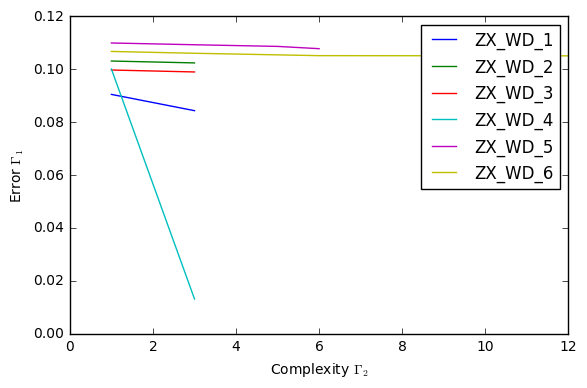

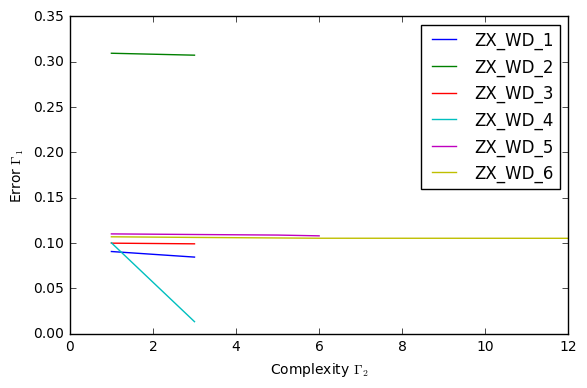

In [109]:
deap_results = learn_delay_deap(seg_1,time_delays2)
result_summary_gp(deap_results,varnames[0:var_num_learn])

model indexs:
[0 0 0 0 0 0]
----------prepare_data_delay_deap------------------
del the target variable ZX_WD_1_dt0
number of variable: 129
the shape of X
(828, 129)
the shape of y
(828,)
ZX_WD_3_dt30 - 1.012
----------prepare_data_delay_deap------------------
del the target variable ZX_WD_2_dt0
number of variable: 129
the shape of X
(828, 129)
the shape of y
(828,)
ZX_WD_2_dt10 - 0.035999999999999997


/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:15: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


----------prepare_data_delay_deap------------------
del the target variable ZX_WD_3_dt0
number of variable: 129
the shape of X
(828, 129)
the shape of y
(828,)
ZX_WD_3_dt10 - 0.012
----------prepare_data_delay_deap------------------
del the target variable ZX_WD_4_dt0
number of variable: 129
the shape of X
(828, 129)
the shape of y
(828,)
ZX_WD_3_dt10 - 0.999
----------prepare_data_delay_deap------------------
del the target variable ZX_WD_5_dt0
number of variable: 129
the shape of X
(828, 129)
the shape of y
(828,)
ZX_WD_5_dt10 + cos(ZX_WD_5_dt70)/ZX_WD_4_dt90
----------prepare_data_delay_deap------------------
del the target variable ZX_WD_6_dt0
number of variable: 129
the shape of X
(828, 129)
the shape of y
(828,)
(ZX_WD_6_dt10*(ZD_SPEED_dt90 - ZX_WD_5_dt40) - sqrt(sin(ZD_TFG_dt80))*cos(ZX_WD_2_dt90))/(ZD_SPEED_dt90 - ZX_WD_5_dt40)


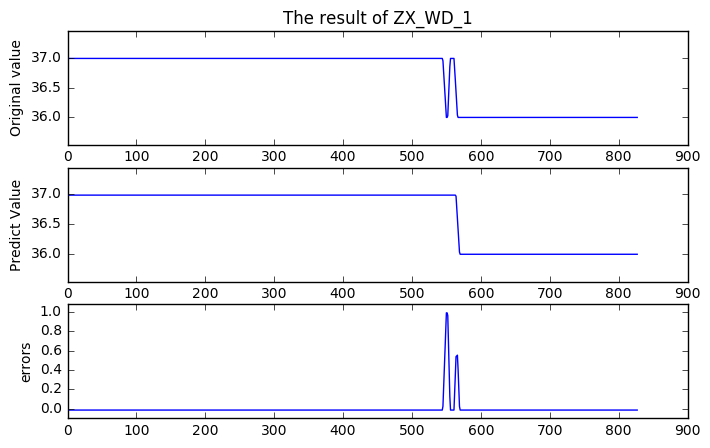

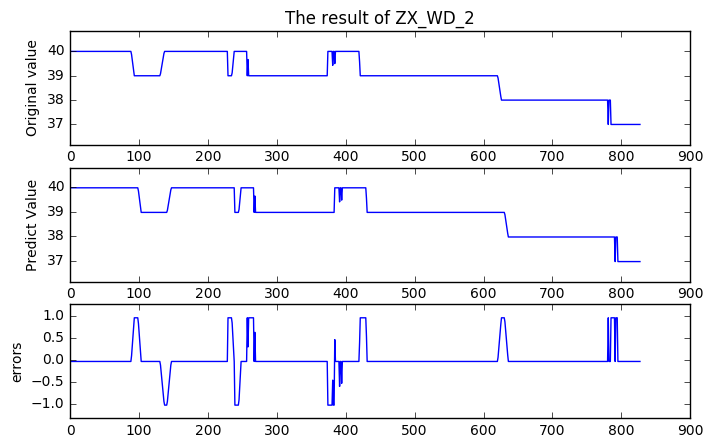

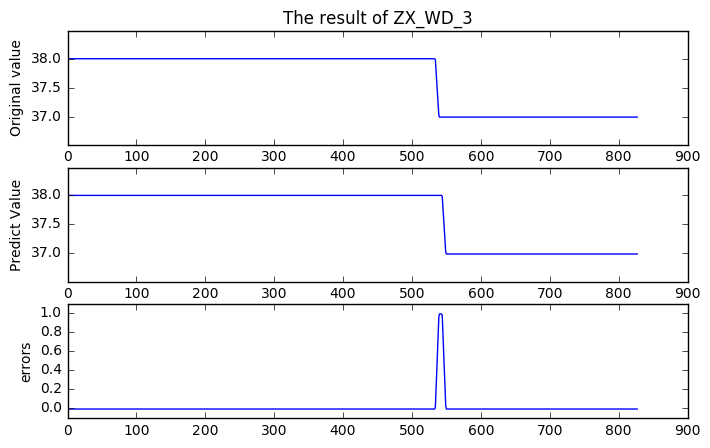

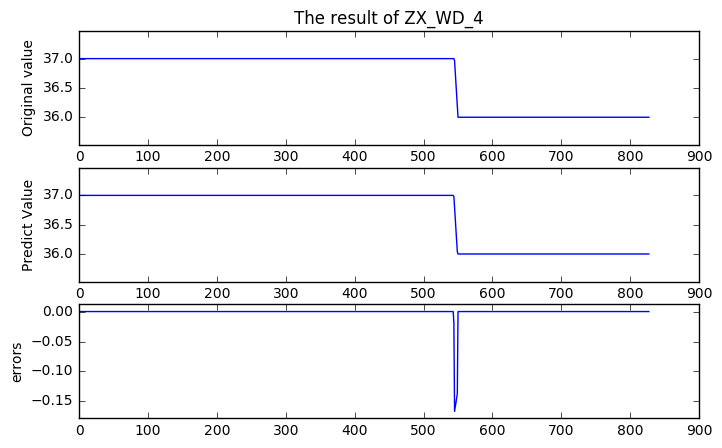

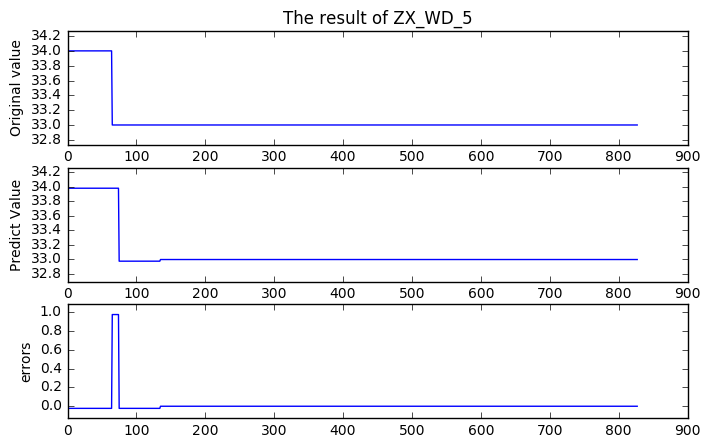

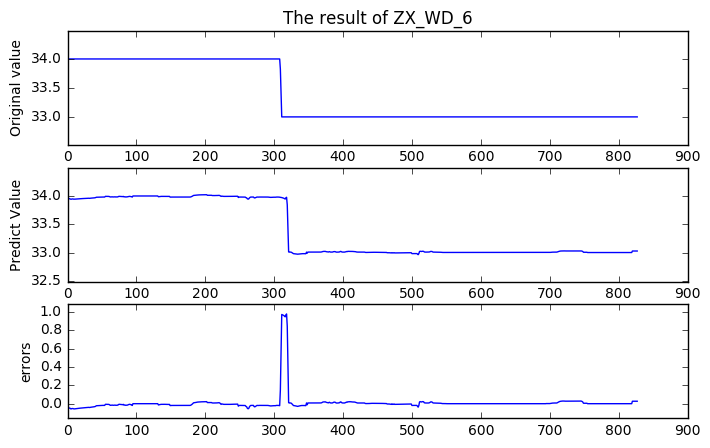

In [110]:
model_indexs = np.zeros(6)
model_indexs = model_indexs.astype(int)
print("model indexs:")
print(model_indexs)
compare_plot_delay_deap(model_indexs,seg_1,time_delays2,deap_results)

#### seg2

-------------------------learn ZX_WD_1------------
----------prepare_data_delay_deap------------------
del the target variable ZX_WD_1_dt0
number of variable: 129
the shape of X
(243, 129)
the shape of y
(243,)


/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:15: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


gen	evals	min                      	max        	diversity
0  	484  	[ 0.76516822  2.        ]	[ inf  24.]	442      
1  	500  	[ 0.  1.]                	[ 1436.51759018     5.        ]	430      
--------------------end----------------------------
-------------------------learn ZX_WD_2------------
----------prepare_data_delay_deap------------------
del the target variable ZX_WD_2_dt0
number of variable: 129
the shape of X
(243, 129)
the shape of y
(243,)


/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:15: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


gen	evals	min                      	max        	diversity
0  	484  	[ 2.31168126  2.        ]	[ inf  24.]	443      
1  	500  	[ 0.33990118  1.        ]	[ 1330.33991456     5.        ]	441      
2  	500  	[ 0.33990118  1.        ]	[ 604.44659036   11.        ]  	421      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


3  	500  	[ 0.33990118  1.        ]	[ 604.44659036    4.        ]  	408      
4  	500  	[ 0.33990118  1.        ]	[ 604.44659036    9.        ]  	415      
5  	500  	[ 0.33990118  1.        ]	[ 604.44659036    9.        ]  	420      
6  	500  	[ 0.33990118  1.        ]	[ 604.44659036    9.        ]  	434      
7  	500  	[ 0.33990118  1.        ]	[ 604.44659036    9.        ]  	435      
8  	500  	[ 0.33990118  1.        ]	[ 604.44659036    9.        ]  	434      
9  	500  	[ 0.33990118  1.        ]	[ 604.44659036    9.        ]  	426      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


10 	500  	[ 0.33990118  1.        ]	[ 604.44659036    6.        ]  	418      
11 	500  	[ 0.33990118  1.        ]	[ 604.43839287   10.        ]  	415      
12 	500  	[ 0.32467863  1.        ]	[ 604.34001418   10.        ]  	413      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


13 	500  	[ 0.32467863  1.        ]	[ 604.31336594    6.        ]  	407      
14 	500  	[ 0.32467863  1.        ]	[ 604.27236828   10.        ]  	402      
15 	500  	[ 0.32467863  1.        ]	[ 604.23139837   11.        ]  	416      
16 	500  	[ 0.32467863  1.        ]	[ 455.79791116   11.        ]  	409      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


17 	500  	[ 0.32467863  1.        ]	[ 455.8180616    6.       ]    	403      
18 	500  	[ 0.32467863  1.        ]	[ 450.4831255   10.       ]    	391      
19 	500  	[ 0.32467863  1.        ]	[ 446.92123839   11.        ]  	386      
20 	500  	[ 0.32467863  1.        ]	[ 446.15867216   10.        ]  	377      
21 	500  	[ 0.32467863  1.        ]	[ 444.29916757   10.        ]  	369      
22 	500  	[ 0.32467863  1.        ]	[ 440.56845803   10.        ]  	366      
23 	500  	[ 0.32467863  1.        ]	[ 34.6046935  13.       ]      	362      
24 	500  	[ 0.32467863  1.        ]	[ 35.05659329  15.        ]    	370      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


25 	500  	[ 0.32467863  1.        ]	[ 446.2215531    6.       ]    	363      
26 	500  	[ 0.32423407  1.        ]	[ 35.05659329   8.        ]    	358      
27 	500  	[ 0.32423407  1.        ]	[ 34.6046935  11.       ]      	358      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


28 	500  	[ 0.32423407  1.        ]	[ 444.29916757    7.        ]  	364      
29 	500  	[ 0.32423407  1.        ]	[ 34.45804652  13.        ]    	358      
30 	500  	[ 0.32423407  1.        ]	[ 33.87650579  15.        ]    	356      
31 	500  	[ 0.31807801  1.        ]	[ 33.76570702  15.        ]    	355      
32 	500  	[ 0.31807801  1.        ]	[ 32.75545853  15.        ]    	348      
33 	500  	[ 0.31807801  1.        ]	[ 31.6908156  15.       ]      	346      
34 	500  	[ 0.31807801  1.        ]	[ 31.64490357  15.        ]    	343      
35 	500  	[ 0.31807801  1.        ]	[ 28.6640173  17.       ]      	331      
36 	500  	[ 0.31807801  1.        ]	[ 31.16205556  18.        ]    	332      
37 	500  	[ 0.31807801  1.        ]	[ 31.64490357  18.        ]    	340      
38 	500  	[ 0.31807801  1.        ]	[ 32.75545853  19.        ]    	361      
39 	500  	[ 0.31807801  1.        ]	[ 32.75545853  19.        ]    	380      
40 	500  	[ 0.31807801  1.        ]	[ 32.60034995  21.        ] 

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


44 	500  	[ 0.31807801  1.        ]	[ 446.15867216    6.        ]  	359      
45 	500  	[ 0.31807801  1.        ]	[ 34.68065283   9.        ]    	349      
46 	500  	[ 0.31807801  1.        ]	[ 33.80363209   9.        ]    	336      
47 	500  	[ 0.31807801  1.        ]	[ 33.76570702   9.        ]    	331      
48 	500  	[ 0.31807801  1.        ]	[ 32.75545853   9.        ]    	319      
49 	500  	[ 0.31807801  1.        ]	[ 32.60034995   9.        ]    	317      
--------------------end----------------------------
-------------------------learn ZX_WD_3------------
----------prepare_data_delay_deap------------------
del the target variable ZX_WD_3_dt0
number of variable: 129
the shape of X
(243, 129)
the shape of y
(243,)


/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:15: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


gen	evals	min                      	max        	diversity
0  	484  	[ 0.76516822  2.        ]	[ inf  24.]	443      
1  	500  	[ 0.  1.]                	[ 1296.14834964     5.        ]	439      
--------------------end----------------------------
-------------------------learn ZX_WD_4------------
----------prepare_data_delay_deap------------------
del the target variable ZX_WD_4_dt0
number of variable: 129
the shape of X
(243, 129)
the shape of y
(243,)


/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:15: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


gen	evals	min                      	max        	diversity
0  	484  	[ 0.69280467  2.        ]	[ inf  24.]	442      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


1  	500  	[ 0.4289039  1.       ]  	[  1.11796310e+09   4.00000000e+00]	442      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


2  	500  	[ 0.4289039  1.       ]  	[ 606.6045745    7.       ]        	421      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


3  	500  	[ 0.4289039  1.       ]  	[ 606.6045745    4.       ]        	403      
4  	500  	[ 0.4289039  1.       ]  	[ 606.6045745    8.       ]        	418      
5  	500  	[ 0.4289039  1.       ]  	[ 606.6045745    9.       ]        	422      
6  	500  	[ 0.4289039  1.       ]  	[ 606.6045745   10.       ]        	420      
7  	500  	[ 0.4289039  1.       ]  	[ 606.6045745   10.       ]        	409      
8  	500  	[ 0.4289039  1.       ]  	[ 606.6045745   14.       ]        	421      
9  	500  	[ 0.4289039  1.       ]  	[ 606.6045745   14.       ]        	425      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


10 	500  	[ 0.4289039  1.       ]  	[ 606.51437269    9.        ]      	421      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


11 	500  	[ 0.4289039  1.       ]  	[ 606.43035121    8.        ]      	426      
12 	500  	[ 0.4289039  1.       ]  	[ 606.43035121   11.        ]      	439      
13 	500  	[ 0.4289039  1.       ]  	[ 458.6147448   11.       ]        	426      
14 	500  	[ 0.4289039  1.       ]  	[ 458.6147448   11.       ]        	424      
15 	500  	[ 0.39296201  1.        ]	[ 457.91568162   11.        ]      	425      
16 	500  	[ 0.39296201  1.        ]	[ 454.99547267   13.        ]      	420      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


17 	500  	[ 0.39296201  1.        ]	[ 606.47133814    6.        ]      	412      
18 	500  	[ 0.39296201  1.        ]	[ 457.94457837    9.        ]      	406      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


19 	500  	[ 0.39296201  1.        ]	[ 452.55015679    7.        ]      	395      
20 	500  	[ 0.39296201  1.        ]	[ 449.04735154    9.        ]      	395      
21 	500  	[ 0.39296201  1.        ]	[ 448.34983481   10.        ]      	385      
22 	500  	[ 0.39296201  1.        ]	[ 448.28692151   10.        ]      	378      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


23 	500  	[ 0.39296201  1.        ]	[ 448.28692151    6.        ]      	361      
24 	500  	[ 0.39296201  1.        ]	[ 446.42165271   11.        ]      	354      
25 	500  	[ 0.39296201  1.        ]	[ 445.48755363   13.        ]      	357      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


26 	500  	[ 0.39296201  1.        ]	[ 445.48755363    6.        ]      	351      
27 	500  	[ 0.39296201  1.        ]	[ 446.42165271    7.        ]      	357      
28 	500  	[ 0.39296201  1.        ]	[ 445.48755363    8.        ]      	367      
29 	500  	[ 0.39296201  1.        ]	[ 442.63742341    8.        ]      	364      
30 	500  	[ 0.39296201  1.        ]	[ 442.52241454    9.        ]      	361      
31 	500  	[ 0.39296201  1.        ]	[ 33.1942169  10.       ]          	355      
32 	500  	[ 0.39296201  1.        ]	[ 32.64509093  11.        ]        	349      
33 	500  	[ 0.39296201  1.        ]	[ 32.09749626  11.        ]        	340      
34 	500  	[ 0.39296201  1.        ]	[ 31.74935191  11.        ]        	327      
35 	500  	[ 0.3551624  1.       ]  	[ 30.49003553  10.        ]        	319      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


36 	500  	[ 0.34673579  1.        ]	[ 31.74935191   7.        ]        	312      
37 	500  	[ 0.34673579  1.        ]	[ 30.49003553   7.        ]        	305      
38 	500  	[ 0.34673579  1.        ]	[ 29.75623225  10.        ]        	299      
39 	500  	[ 0.34673579  1.        ]	[ 29.29197171  10.        ]        	291      
40 	500  	[ 0.34673579  1.        ]	[ 29.80895509  11.        ]        	288      
41 	500  	[ 0.34673579  1.        ]	[ 29.24528313  11.        ]        	285      
42 	500  	[ 0.34673579  1.        ]	[ 29.24528313  11.        ]        	281      
43 	500  	[ 0.34673579  1.        ]	[  3.99042482  11.        ]        	269      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


44 	500  	[ 0.34673579  1.        ]	[ 29.11482326   6.        ]        	250      
45 	500  	[ 0.34673579  1.        ]	[ 3.96995797  7.        ]          	239      
46 	500  	[ 0.34673579  1.        ]	[ 3.96995797  8.        ]          	243      
47 	500  	[ 0.34673579  1.        ]	[ 3.88227275  9.        ]          	235      
48 	500  	[ 0.34673579  1.        ]	[ 29.29197171  11.        ]        	257      
49 	500  	[ 0.34673579  1.        ]	[  3.99042482  12.        ]        	248      
--------------------end----------------------------
-------------------------learn ZX_WD_5------------
----------prepare_data_delay_deap------------------
del the target variable ZX_WD_5_dt0
number of variable: 129
the shape of X
(243, 129)
the shape of y
(243,)


/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:15: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


gen	evals	min                      	max        	diversity
0  	484  	[ 0.26203657  2.        ]	[ inf  24.]	441      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


1  	500  	[ 0.  1.]                	[  2.39708335e+05   5.00000000e+00]	439      
--------------------end----------------------------
-------------------------learn ZX_WD_6------------
----------prepare_data_delay_deap------------------
del the target variable ZX_WD_6_dt0
number of variable: 129
the shape of X
(243, 129)
the shape of y
(243,)


/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:15: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


gen	evals	min                      	max        	diversity
0  	484  	[ 0.71719821  2.        ]	[ inf  24.]	442      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


1  	500  	[ 0.26256147  1.        ]	[  2.39687601e+05   5.00000000e+00]	441      
2  	500  	[ 0.26256147  1.        ]	[ 609.19615964    9.        ]      	429      
3  	500  	[ 0.26256147  1.        ]	[ 609.19615964   10.        ]      	422      
4  	500  	[ 0.26256147  1.        ]	[ 609.19615964   10.        ]      	430      
5  	500  	[ 0.26256147  1.        ]	[ 609.19615964   10.        ]      	422      
6  	500  	[ 0.26256147  1.        ]	[ 609.19615964   10.        ]      	425      
7  	500  	[ 0.26256147  1.        ]	[ 609.19615964   14.        ]      	431      
8  	500  	[ 0.26256147  1.        ]	[ 609.19615964   11.        ]      	430      
9  	500  	[ 0.26256147  1.        ]	[ 609.10593252   10.        ]      	421      
10 	500  	[ 0.26256147  1.        ]	[ 608.94006329   12.        ]      	428      
11 	500  	[ 0.26256147  1.        ]	[ 460.49192282   12.        ]      	442      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


12 	500  	[ 0.26256147  1.        ]	[ 608.94006329    7.        ]      	439      
13 	500  	[ 0.26256147  1.        ]	[ 460.49896714   11.        ]      	435      
14 	500  	[ 0.26256147  1.        ]	[ 457.52912969   11.        ]      	427      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


15 	500  	[ 0.26256147  1.        ]	[ 461.18529463    6.        ]      	423      
16 	500  	[ 0.26256147  1.        ]	[ 458.35490372   12.        ]      	422      
17 	500  	[ 0.26256147  1.        ]	[ 451.61534019   12.        ]      	413      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


18 	500  	[ 0.26256147  1.        ]	[ 451.63533063    7.        ]      	411      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


19 	500  	[ 0.26256147  1.        ]	[ 451.59911056    7.        ]      	404      
20 	500  	[ 0.26256147  1.        ]	[ 450.44273374    9.        ]      	397      
21 	500  	[ 0.26256147  1.        ]	[ 448.01848065   11.        ]      	395      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


22 	500  	[ 0.26256147  1.        ]	[ 451.61534019    6.        ]      	385      
23 	500  	[ 0.26256147  1.        ]	[ 450.91584289    7.        ]      	378      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


24 	500  	[ 0.26256147  1.        ]	[ 450.44273374   11.        ]      	367      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


25 	500  	[ 0.26256147  1.        ]	[ 451.63533063    7.        ]      	363      
26 	500  	[ 0.26256147  1.        ]	[ 451.63533063    7.        ]      	383      
27 	500  	[ 0.26129757  1.        ]	[ 451.59911056    9.        ]      	375      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


28 	500  	[ 0.26256147  1.        ]	[ 450.85076863    6.        ]      	366      
29 	500  	[ 0.26256147  1.        ]	[ 448.94858294    9.        ]      	360      
30 	500  	[ 0.26160905  1.        ]	[ 448.94858294    9.        ]      	359      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


31 	500  	[ 0.26160905  1.        ]	[ 30.99141623   7.        ]        	353      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


32 	500  	[ 0.26160905  1.        ]	[ 30.5367606  10.       ]          	342      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


33 	500  	[ 0.26160905  1.        ]	[ 30.39492103  10.        ]        	341      
34 	500  	[ 0.26160905  1.        ]	[ 30.01820548  10.        ]        	330      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


35 	500  	[ 0.26160905  1.        ]	[ 30.39492103   6.        ]        	314      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


36 	500  	[ 0.26160905  1.        ]	[ 30.39492103   6.        ]        	309      
37 	500  	[ 0.26160905  1.        ]	[ 30.01820548   8.        ]        	301      
38 	500  	[ 0.26160905  1.        ]	[ 30.00431961  10.        ]        	295      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


39 	500  	[ 0.26160905  1.        ]	[ 29.71544143  11.        ]        	286      
40 	500  	[ 0.26160905  1.        ]	[ 28.13705051  11.        ]        	277      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


41 	500  	[ 0.26160905  1.        ]	[ 29.634637   7.      ]            	277      
42 	500  	[ 0.26160905  1.        ]	[ 28.13705051   8.        ]        	276      
43 	500  	[ 0.26160905  1.        ]	[ 27.38407602   8.        ]        	268      
44 	500  	[ 0.26160905  1.        ]	[ 27.17002028   8.        ]        	261      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


45 	500  	[ 0.26160905  1.        ]	[ 27.17002028   6.        ]        	255      
46 	500  	[ 0.26160905  1.        ]	[ 26.90042289   8.        ]        	251      
47 	500  	[ 0.26160905  1.        ]	[ 26.90042289  11.        ]        	251      
48 	500  	[ 0.26119353  1.        ]	[ 26.89969164  11.        ]        	244      
49 	500  	[ 0.26119353  1.        ]	[ 26.89969164  11.        ]        	241      
--------------------end----------------------------
************************* ZX_WD_1 *********************
ZX_WD_3_dt60
ZX_WD_1_dt90
ZX_WD_3_dt90
ZX_WD_3_dt0
ZX_WD_3_dt20
ZX_WD_3_dt70
ZX_WD_1_dt40
ZX_WD_3_dt30
ZX_WD_3_dt80
ZX_WD_1_dt70
ZX_WD_3_dt40
ZX_WD_1_dt20
ZX_WD_1_dt60
ZX_WD_1_dt10
---------------------------------------------------------------------------------
complexity         nrmse_test         nrmse_train         rmse_test         rmse_train
1.000000         nan         nan         0.000000         0.000000
1.000000         nan         nan         0.000000         0.00000

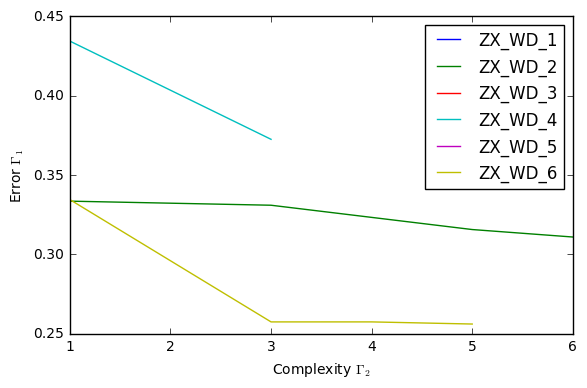

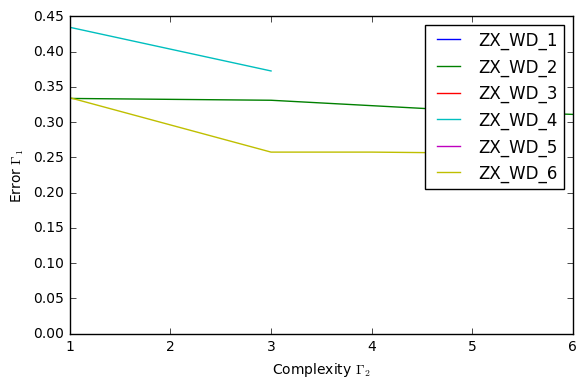

In [111]:
deap_results = learn_delay_deap(seg_2,time_delays2)
result_summary_gp(deap_results,varnames[0:var_num_learn])

model indexs:
[0 0 0 0 0 0]
----------prepare_data_delay_deap------------------
del the target variable ZX_WD_1_dt0
number of variable: 129
the shape of X
(243, 129)
the shape of y
(243,)
ZX_WD_3_dt60
----------prepare_data_delay_deap------------------
del the target variable ZX_WD_2_dt0
number of variable: 129
the shape of X
(243, 129)
the shape of y
(243,)
sqrt(ZD_LLJ_dt80)/ZX_HW_1_dt90 + ZX_WD_2_dt10


/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:15: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/home/happyling/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_base.py:3040: UserWarning: Attempting to set identical bottom==top results
in singular transformations; automatically expanding.
bottom=37.0, top=37.0
  'bottom=%s, top=%s') % (bottom, top))
/home/happyling/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_base.py:3040: UserWarning: Attempting to set identical bottom==top results
in singular transformations; automatically expanding.
bottom=0.0, top=0.0
  'bottom=%s, top=%s') % (bottom, top))


----------prepare_data_delay_deap------------------
del the target variable ZX_WD_3_dt0
number of variable: 129
the shape of X
(243, 129)
the shape of y
(243,)
ZX_WD_3_dt90
----------prepare_data_delay_deap------------------
del the target variable ZX_WD_4_dt0
number of variable: 129
the shape of X
(243, 129)
the shape of y
(243,)
ZX_WD_2_dt0 - 2.1579999999999999
----------prepare_data_delay_deap------------------
del the target variable ZX_WD_5_dt0
number of variable: 129
the shape of X
(243, 129)
the shape of y
(243,)
ZX_WD_5_dt50
----------prepare_data_delay_deap------------------
del the target variable ZX_WD_6_dt0
number of variable: 129
the shape of X
(243, 129)
the shape of y
(243,)
ZX_WD_5_dt40 + ZX_WD_5_dt20/ZX_HW_2_dt30


/home/happyling/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_base.py:3040: UserWarning: Attempting to set identical bottom==top results
in singular transformations; automatically expanding.
bottom=33.0, top=33.0
  'bottom=%s, top=%s') % (bottom, top))


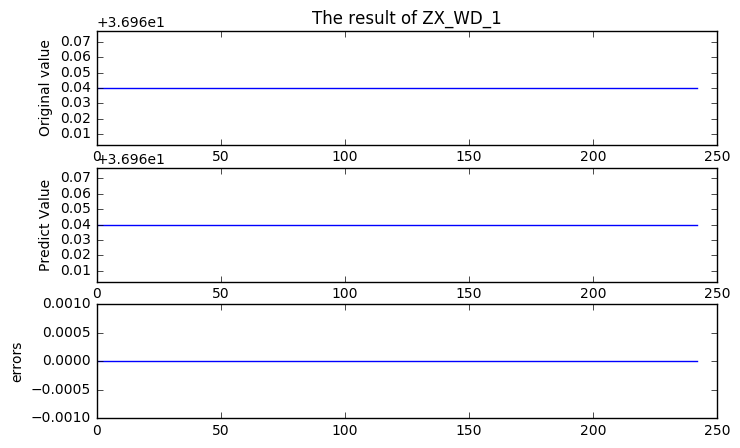

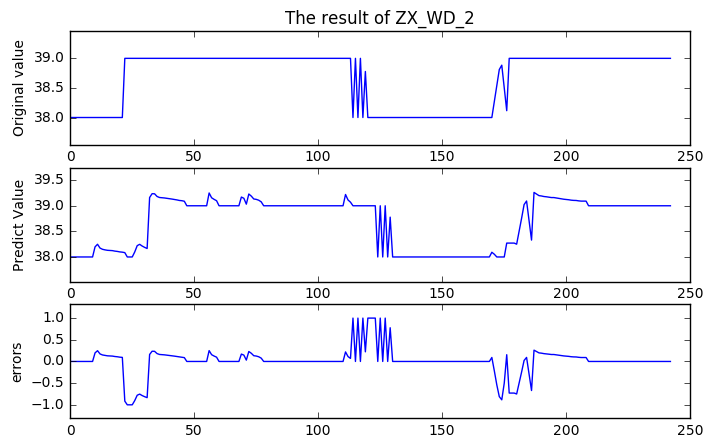

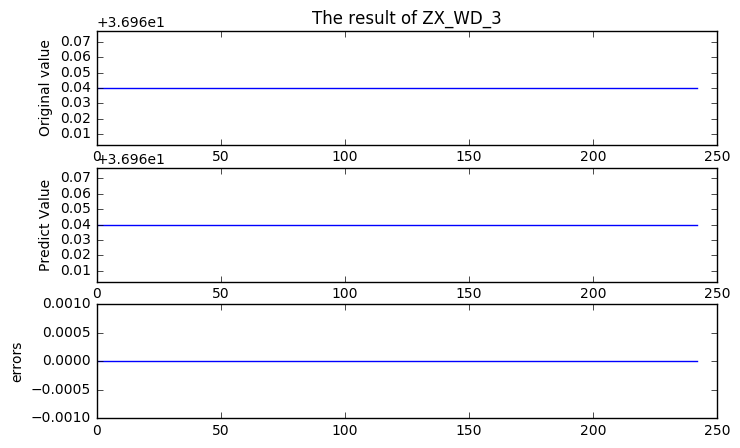

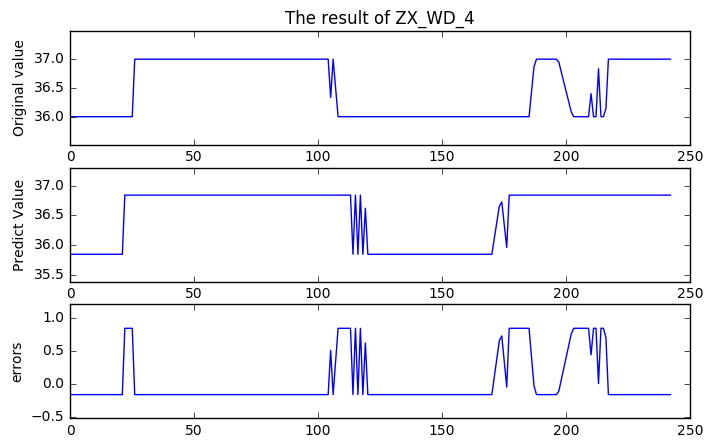

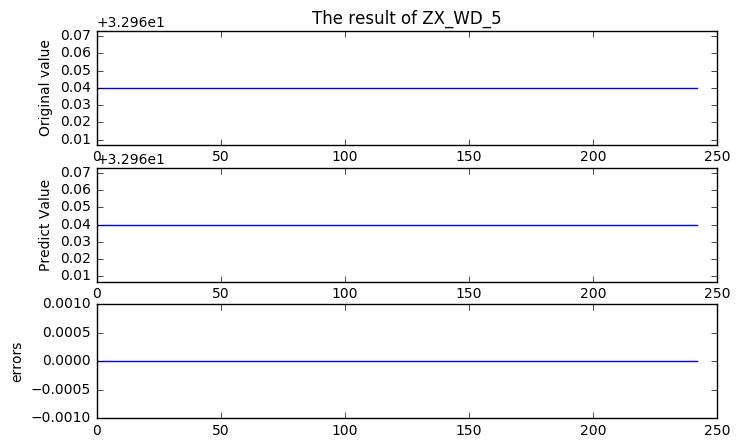

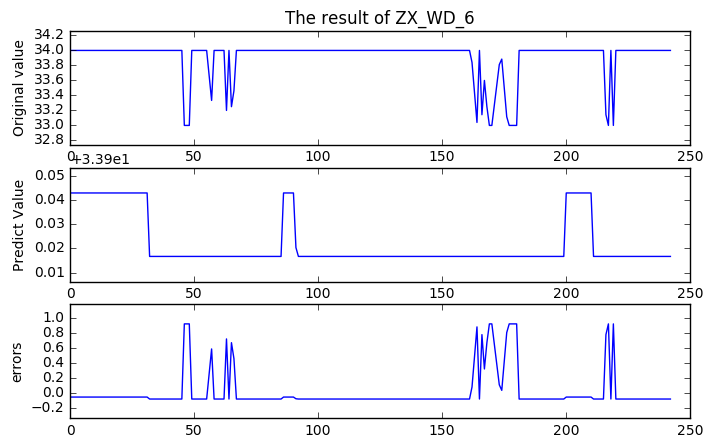

In [114]:
model_indexs = np.zeros(6)
model_indexs = model_indexs.astype(int)
print("model indexs:")
print(model_indexs)
compare_plot_delay_deap(model_indexs,seg_2,time_delays2,deap_results)

#### seg3

-------------------------learn ZX_WD_1------------
----------prepare_data_delay_deap------------------
del the target variable ZX_WD_1_dt0
number of variable: 129
the shape of X
(4310, 129)
the shape of y
(4310,)


/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:15: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


gen	evals	min                      	max        	diversity
0  	484  	[ 0.79713093  2.        ]	[ inf  24.]	471      
1  	500  	[ 0.27402794  1.        ]	[ 1202.09527112     5.        ]	500      
2  	500  	[ 0.27402794  1.        ]	[ 591.51714502    9.        ]  	496      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


3  	500  	[ 0.27402794  1.        ]	[ 591.51714502    4.        ]  	495      
4  	500  	[ 0.19876764  1.        ]	[ 591.51714502    9.        ]  	499      
5  	500  	[ 0.19876764  1.        ]	[ 591.51714502   10.        ]  	498      
6  	500  	[ 0.19876764  1.        ]	[ 591.51714502   10.        ]  	497      
7  	500  	[ 0.19876764  1.        ]	[ 591.51714502   10.        ]  	496      
8  	500  	[ 0.19876764  1.        ]	[ 591.51714502   10.        ]  	495      
9  	500  	[ 0.19876764  1.        ]	[ 591.51714502   11.        ]  	495      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


10 	500  	[ 0.19876764  1.        ]	[ 591.51714502    9.        ]  	494      
11 	500  	[ 0.19876764  1.        ]	[ 591.50224664   11.        ]  	491      
12 	500  	[ 0.19876764  1.        ]	[ 417.85251755   15.        ]  	485      
13 	500  	[ 0.19876764  1.        ]	[ 417.85251755   15.        ]  	482      
14 	500  	[ 0.19876764  1.        ]	[ 425.89180441   15.        ]  	491      
15 	500  	[ 0.19876764  1.        ]	[ 417.33035913   16.        ]  	490      
16 	500  	[ 0.19876764  1.        ]	[ 33.06603183  19.        ]    	485      
17 	500  	[ 0.19876764  1.        ]	[ 32.45606168  19.        ]    	485      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


18 	500  	[ 0.19876764  1.        ]	[ 417.26381176    9.        ]  	481      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


19 	500  	[ 0.19876764  1.        ]	[ 32.47446461  12.        ]    	479      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


20 	500  	[ 0.19876764  1.        ]	[ 591.50556241    6.        ]  	479      
21 	500  	[ 0.19876764  1.        ]	[ 417.5553505   10.       ]    	474      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


22 	500  	[ 0.19876764  1.        ]	[ 417.5553505    6.       ]    	468      
23 	500  	[ 0.19876764  1.        ]	[ 417.33035913    9.        ]  	464      
24 	500  	[ 0.19876764  1.        ]	[ 417.26381176   10.        ]  	462      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


25 	500  	[ 0.19876764  1.        ]	[ 33.06603183   9.        ]    	472      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


26 	500  	[ 0.19876764  1.        ]	[ 417.38228644    6.        ]  	466      
27 	500  	[ 0.19876764  1.        ]	[ 416.85179088   11.        ]  	469      
28 	500  	[ 0.19876764  1.        ]	[ 32.4863931  12.       ]      	468      
29 	500  	[ 0.19876764  1.        ]	[ 32.45512463  12.        ]    	464      
30 	500  	[ 0.19876764  1.        ]	[ 32.41736085  11.        ]    	462      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


31 	500  	[ 0.19876764  1.        ]	[ 32.4863931   7.       ]      	458      
32 	500  	[ 0.19876764  1.        ]	[ 32.47446461  12.        ]    	458      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


33 	500  	[ 0.19802451  1.        ]	[ 33.06603183   6.        ]    	453      
34 	500  	[ 0.19802451  1.        ]	[ 32.47997093  11.        ]    	448      
35 	500  	[ 0.19802451  1.        ]	[ 32.45512463  11.        ]    	446      
36 	500  	[ 0.19802451  1.        ]	[ 32.45165998  11.        ]    	444      
37 	500  	[ 0.19802451  1.        ]	[ 29.52103067  11.        ]    	439      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


38 	500  	[ 0.19802451  1.        ]	[ 32.47446461   6.        ]    	434      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


39 	500  	[ 0.19802451  1.        ]	[ 32.41736085   9.        ]    	428      
40 	500  	[ 0.19802451  1.        ]	[ 29.49899197  11.        ]    	422      
41 	500  	[ 0.19802451  1.        ]	[ 29.44853659  14.        ]    	417      
42 	500  	[ 0.19802451  1.        ]	[  3.12595628  14.        ]    	412      
43 	500  	[ 0.19802451  1.        ]	[  3.1017236  14.       ]      	407      
44 	500  	[ 0.19802451  1.        ]	[  3.08726321  15.        ]    	406      
45 	500  	[ 0.19802451  1.        ]	[  3.09176913  14.        ]    	402      
46 	500  	[ 0.19802451  1.        ]	[  2.52592565  14.        ]    	402      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


47 	500  	[ 0.19802451  1.        ]	[ 32.45606168   6.        ]    	397      
48 	500  	[ 0.19802451  1.        ]	[ 29.47854665   9.        ]    	392      
49 	500  	[ 0.19802451  1.        ]	[ 3.13166853  9.        ]      	384      
--------------------end----------------------------
-------------------------learn ZX_WD_2------------
----------prepare_data_delay_deap------------------
del the target variable ZX_WD_2_dt0
number of variable: 129
the shape of X
(4310, 129)
the shape of y
(4310,)


/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:15: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


gen	evals	min                      	max        	diversity
0  	484  	[ 2.81759261  2.        ]	[ inf  24.]	471      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


1  	500  	[ 0.21551012  1.        ]	[  3.98104381e+05   4.00000000e+00]	497      
2  	500  	[ 0.21551012  1.        ]	[ 588.74980573    9.        ]      	492      
3  	500  	[ 0.21551012  1.        ]	[ 588.74980573    9.        ]      	489      
4  	500  	[ 0.21551012  1.        ]	[ 588.74980573   11.        ]      	493      
5  	500  	[ 0.21551012  1.        ]	[ 588.74980573   11.        ]      	492      
6  	500  	[ 0.21551012  1.        ]	[ 588.74980573   12.        ]      	491      
7  	500  	[ 0.21551012  1.        ]	[ 588.74980573   13.        ]      	489      
8  	500  	[ 0.21551012  1.        ]	[ 588.74980573   13.        ]      	489      
9  	500  	[ 0.21551012  1.        ]	[ 588.74980573   13.        ]      	488      
10 	500  	[ 0.21551012  1.        ]	[ 423.30088962   13.        ]      	484      
11 	500  	[ 0.21551012  1.        ]	[ 423.06794924   16.        ]      	480      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


12 	500  	[ 0.21551012  1.        ]	[ 423.92346097    7.        ]      	477      
13 	500  	[ 0.21551012  1.        ]	[ 423.32103914   12.        ]      	474      
14 	500  	[ 0.21551012  1.        ]	[ 423.30088962   12.        ]      	472      
15 	500  	[ 0.21551012  1.        ]	[ 415.09008316   12.        ]      	470      
16 	500  	[ 0.21551012  1.        ]	[ 414.66592204   14.        ]      	467      
17 	500  	[ 0.21551012  1.        ]	[ 35.17860497  14.        ]        	467      
18 	500  	[ 0.21551012  1.        ]	[ 35.14223822  11.        ]        	464      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


19 	500  	[ 0.21551012  1.        ]	[ 414.78299706    7.        ]      	467      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


20 	500  	[ 0.21551012  1.        ]	[ 423.06409956    6.        ]      	463      
21 	500  	[ 0.21551012  1.        ]	[ 414.95570157    9.        ]      	461      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


22 	500  	[ 0.21551012  1.        ]	[ 414.71973819    6.        ]      	459      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


23 	500  	[ 0.21551012  1.        ]	[ 414.71973819    7.        ]      	461      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


24 	500  	[ 0.21551012  1.        ]	[ 414.68317727    6.        ]      	462      
25 	500  	[ 0.21415165  1.        ]	[ 414.25337709   11.        ]      	461      
26 	500  	[ 0.21415165  1.        ]	[ 35.17860497  11.        ]        	460      
27 	500  	[ 0.21415165  1.        ]	[ 35.13833621  12.        ]        	460      
28 	500  	[ 0.21415165  1.        ]	[ 35.13274689  13.        ]        	468      
29 	500  	[ 0.21415165  1.        ]	[ 32.31115517  15.        ]        	471      
30 	500  	[ 0.21415165  1.        ]	[ 32.28543782  15.        ]        	472      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


31 	500  	[ 0.21415165  1.        ]	[ 35.14667175   7.        ]        	469      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


32 	500  	[ 0.21415165  1.        ]	[ 35.17860497   6.        ]        	467      
33 	500  	[ 0.21415165  1.        ]	[ 35.13833621  10.        ]        	462      
34 	500  	[ 0.21415165  1.        ]	[ 35.13349854  10.        ]        	459      
35 	500  	[ 0.21415165  1.        ]	[ 35.13274689  14.        ]        	457      
36 	500  	[ 0.21415165  1.        ]	[ 35.10441461  16.        ]        	456      
37 	500  	[ 0.21415165  1.        ]	[ 32.30223705  21.        ]        	461      
38 	500  	[ 0.21415165  1.        ]	[ 32.26426361  21.        ]        	462      
39 	500  	[ 0.21415165  1.        ]	[  5.39506582  21.        ]        	458      
40 	500  	[ 0.21415165  1.        ]	[ 32.24672316  23.        ]        	449      
41 	500  	[ 0.21333033  1.        ]	[ 32.21316088  26.        ]        	449      
42 	500  	[ 0.21333033  1.        ]	[ 32.23920831  17.        ]        	446      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


43 	500  	[ 0.21333033  1.        ]	[ 414.95570157    6.        ]      	446      
44 	500  	[ 0.21333033  1.        ]	[ 35.13833621  11.        ]        	445      
45 	500  	[ 0.21333033  1.        ]	[ 32.31115517  15.        ]        	442      
46 	500  	[ 0.21333033  1.        ]	[ 32.28543782  15.        ]        	436      
47 	500  	[ 0.21333033  1.        ]	[ 32.25278968  15.        ]        	432      
48 	500  	[ 0.21333033  1.        ]	[ 32.21316088  15.        ]        	429      
49 	500  	[ 0.21333033  1.        ]	[  5.39396397  15.        ]        	425      
--------------------end----------------------------
-------------------------learn ZX_WD_3------------
----------prepare_data_delay_deap------------------
del the target variable ZX_WD_3_dt0
number of variable: 129
the shape of X
(4310, 129)
the shape of y
(4310,)


/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:15: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


gen	evals	min                      	max        	diversity
0  	484  	[ 2.10886397  2.        ]	[ inf  24.]	471      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


1  	500  	[ 0.17810556  1.        ]	[ 1113.63813268     5.        ]	499      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


2  	500  	[ 0.13104172  1.        ]	[ 589.51839104    4.        ]  	498      
3  	500  	[ 0.13104172  1.        ]	[ 589.51839104    9.        ]  	495      
4  	500  	[ 0.13104172  1.        ]	[ 589.51839104    9.        ]  	498      
5  	500  	[ 0.13104172  1.        ]	[ 589.51839104    9.        ]  	498      
6  	500  	[ 0.13104172  1.        ]	[ 589.51839104   13.        ]  	498      
7  	500  	[ 0.13104172  1.        ]	[ 589.51839104   13.        ]  	498      
8  	500  	[ 0.13104172  1.        ]	[ 589.51839104   13.        ]  	499      
9  	500  	[ 0.13104172  1.        ]	[ 589.51839104   14.        ]  	499      
10 	500  	[ 0.13104172  1.        ]	[ 589.51008513   14.        ]  	497      
11 	500  	[ 0.13104172  1.        ]	[ 424.59258053   14.        ]  	497      
12 	500  	[ 0.13104172  1.        ]	[ 589.50335633   15.        ]  	497      
13 	500  	[ 0.13104172  1.        ]	[ 424.59258053   15.        ]  	497      
14 	500  	[ 0.13104172  1.        ]	[ 423.97492104   16.        

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


22 	500  	[ 0.13104172  1.        ]	[ 424.59258053    6.        ]  	486      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


23 	500  	[ 0.13104172  1.        ]	[ 415.46554152   10.        ]  	486      
24 	500  	[ 0.13104172  1.        ]	[ 415.34775201   10.        ]  	484      
25 	500  	[ 0.13104172  1.        ]	[ 35.09237454  14.        ]    	484      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


26 	500  	[ 0.13104172  1.        ]	[ 415.64111416    6.        ]  	481      
27 	500  	[ 0.13104172  1.        ]	[ 414.91052524   12.        ]  	479      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


28 	500  	[ 0.13104172  1.        ]	[ 415.29314756    8.        ]  	477      
29 	500  	[ 0.13104172  1.        ]	[ 414.91052524    9.        ]  	477      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


30 	500  	[ 0.13104172  1.        ]	[ 415.46554152    6.        ]  	477      
31 	500  	[ 0.13104172  1.        ]	[ 414.91052524   11.        ]  	477      
32 	500  	[ 0.13104172  1.        ]	[ 34.44972949  12.        ]    	476      
33 	500  	[ 0.13104172  1.        ]	[ 34.38427846  12.        ]    	471      
34 	500  	[ 0.13096003  1.        ]	[ 34.36470667  12.        ]    	466      
35 	500  	[ 0.13096003  1.        ]	[ 34.3495576  12.       ]      	462      
36 	500  	[ 0.13095783  1.        ]	[ 34.34757694  12.        ]    	457      
37 	500  	[ 0.13095783  1.        ]	[ 31.49679736  14.        ]    	456      
38 	500  	[ 0.13095783  1.        ]	[ 31.48251574  14.        ]    	450      
39 	500  	[ 0.13095783  1.        ]	[ 31.46142619  14.        ]    	442      
40 	500  	[ 0.13095783  1.        ]	[ 31.44096739  17.        ]    	451      
41 	500  	[ 0.13095783  1.        ]	[  4.5524458  17.       ]      	445      
42 	500  	[ 0.13095783  1.        ]	[  4.54942534  17.        ] 

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


48 	500  	[ 0.13095263  1.        ]	[ 589.5110458    6.       ]    	449      
49 	500  	[ 0.13095263  1.        ]	[ 34.4175045  10.       ]      	442      
--------------------end----------------------------
-------------------------learn ZX_WD_4------------
----------prepare_data_delay_deap------------------
del the target variable ZX_WD_4_dt0
number of variable: 129
the shape of X
(4310, 129)
the shape of y
(4310,)


/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:15: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


gen	evals	min                      	max        	diversity
0  	484  	[ 1.23927609  2.        ]	[ inf  24.]	471      
1  	500  	[ 0.20851195  1.        ]	[ 994.99959876    5.        ]	499      
2  	500  	[ 0.15887978  1.        ]	[ 590.49711966    8.        ]	498      
3  	500  	[ 0.15887978  1.        ]	[ 590.49711966   10.        ]	500      
4  	500  	[ 0.15887978  1.        ]	[ 590.49711966   11.        ]	500      
5  	500  	[ 0.15887978  1.        ]	[ 590.49711966   11.        ]	499      
6  	500  	[ 0.15887978  1.        ]	[ 590.49711966   11.        ]	498      
7  	500  	[ 0.15887978  1.        ]	[ 590.49711966   11.        ]	497      
8  	500  	[ 0.15887978  1.        ]	[ 590.49711966   12.        ]	497      
9  	500  	[ 0.15887978  1.        ]	[ 590.48257821   12.        ]	496      
10 	500  	[ 0.15887978  1.        ]	[ 424.91812899   15.        ]	496      
11 	500  	[ 0.15887978  1.        ]	[ 416.86742647   15.        ]	495      
12 	500  	[ 0.15887978  1.        ]	[ 416.341642

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


15 	500  	[ 0.15887978  1.        ]	[ 33.44655427  15.        ]  	492      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


16 	500  	[ 0.15887978  1.        ]	[ 416.22277578    9.        ]	490      
17 	500  	[ 0.15887978  1.        ]	[ 33.44655427  11.        ]  	490      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


18 	500  	[ 0.15887978  1.        ]	[ 416.34164279    7.        ]	485      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


19 	500  	[ 0.15887978  1.        ]	[ 33.50934239   7.        ]  	483      
20 	500  	[ 0.15887978  1.        ]	[ 33.44655427  10.        ]  	481      
21 	500  	[ 0.15887978  1.        ]	[ 33.38615347  10.        ]  	482      
22 	500  	[ 0.15887978  1.        ]	[ 30.50782667  10.        ]  	483      
23 	500  	[ 0.15887978  1.        ]	[ 30.46672066  10.        ]  	480      
24 	500  	[ 0.15881241  1.        ]	[ 30.4537072  12.       ]    	480      
25 	500  	[ 0.15881241  1.        ]	[  3.56460022  12.        ]  	481      
26 	500  	[ 0.15881241  1.        ]	[  3.56228125  14.        ]  	474      
27 	500  	[ 0.15874464  1.        ]	[  3.55737393  15.        ]  	465      
28 	500  	[ 0.15874464  1.        ]	[  3.10471681  14.        ]  	454      
29 	500  	[ 0.15874464  1.        ]	[  3.10471681  17.        ]  	443      
30 	500  	[ 0.15874464  1.        ]	[  3.55843906  14.        ]  	441      
31 	500  	[ 0.15874464  1.        ]	[  3.55980804  14.        ]  	440      
32 	500  	[ 

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


44 	500  	[ 0.15870692  1.        ]	[ inf   6.]                  	383      
45 	500  	[ 0.15870692  1.        ]	[ 424.90938171   11.        ]	377      
46 	500  	[ 0.15870692  1.        ]	[ 30.49164635  12.        ]  	365      
47 	500  	[ 0.15870692  1.        ]	[  3.55957725  13.        ]  	355      
48 	500  	[ 0.15870692  1.        ]	[  3.09252788  13.        ]  	335      
49 	500  	[ 0.15870692  1.        ]	[  3.07313282  14.        ]  	313      
--------------------end----------------------------
-------------------------learn ZX_WD_5------------
----------prepare_data_delay_deap------------------
del the target variable ZX_WD_5_dt0
number of variable: 129
the shape of X
(4310, 129)
the shape of y
(4310,)


/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:15: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


gen	evals	min                    	max        	diversity
0  	484  	[ 0.6649538  2.       ]	[ inf  24.]	472      
1  	500  	[ 0.25281375  1.        ]	[ 1275.37557588     5.        ]	500      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


2  	500  	[ 0.25281375  1.        ]	[ 593.96172404    4.        ]  	496      
3  	500  	[ 0.21394435  1.        ]	[ 593.96172404   10.        ]  	494      
4  	500  	[ 0.21394435  1.        ]	[ 593.96172404   12.        ]  	496      
5  	500  	[ 0.21394435  1.        ]	[ 593.96172404   11.        ]  	496      
6  	500  	[ 0.21394435  1.        ]	[ 593.96172404   11.        ]  	496      
7  	500  	[ 0.21394435  1.        ]	[ 593.96172404   11.        ]  	496      
8  	500  	[ 0.21394435  1.        ]	[ 593.96172404   11.        ]  	496      
9  	500  	[ 0.21394435  1.        ]	[ 593.96172404   13.        ]  	496      
10 	500  	[ 0.21394435  1.        ]	[ 593.96172404   16.        ]  	496      
11 	500  	[ 0.21394435  1.        ]	[ 593.96172404   16.        ]  	495      
12 	500  	[ 0.21394435  1.        ]	[ 593.95583288   19.        ]  	495      
13 	500  	[ 0.21394435  1.        ]	[ 593.935121   16.      ]      	495      
14 	500  	[ 0.21393201  1.        ]	[ 593.935121   16.      ]   

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


17 	500  	[ 0.21393201  1.        ]	[ 593.96172404    6.        ]  	492      
18 	500  	[ 0.21393201  1.        ]	[ 593.9344219    7.       ]    	490      
19 	500  	[ 0.21393201  1.        ]	[ 428.43137133   10.        ]  	489      
20 	500  	[ 0.21393201  1.        ]	[ 428.30562798   11.        ]  	488      
21 	500  	[ 0.21393201  1.        ]	[ 428.04188158   11.        ]  	486      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


22 	500  	[ 0.21381248  1.        ]	[ 419.78642507    9.        ]  	485      
23 	500  	[ 0.21381248  1.        ]	[ 419.67100521   12.        ]  	483      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


24 	500  	[ 0.21381248  1.        ]	[ 419.73873395    7.        ]  	481      
25 	500  	[ 0.21381248  1.        ]	[ 419.60812162   10.        ]  	478      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


26 	500  	[ 0.21393201  1.        ]	[ 428.30562798    6.        ]  	477      
27 	500  	[ 0.21393201  1.        ]	[ 419.73873395   12.        ]  	476      
28 	500  	[ 0.21393201  1.        ]	[ 419.24585407   12.        ]  	475      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


29 	500  	[ 0.21393201  1.        ]	[ 30.29374934   8.        ]    	473      
30 	500  	[ 0.20105622  1.        ]	[ 30.25234214  11.        ]    	473      
31 	500  	[ 0.20105622  1.        ]	[ 30.23829068  12.        ]    	472      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


32 	500  	[ 0.20105622  1.        ]	[ 30.23829068   9.        ]    	473      
33 	500  	[ 0.20105622  1.        ]	[ 27.20648969  10.        ]    	470      
34 	500  	[ 0.20105622  1.        ]	[ 27.19269808  13.        ]    	470      
35 	500  	[ 0.20104959  1.        ]	[ 27.15572675  14.        ]    	468      
36 	500  	[ 0.20104959  1.        ]	[ 21.64694093  15.        ]    	466      
37 	500  	[ 0.20104959  1.        ]	[  5.40718776  15.        ]    	468      
38 	500  	[ 0.04730441  1.        ]	[  5.37838891  15.        ]    	461      
39 	500  	[ 0.04730441  1.        ]	[  4.56444541  19.        ]    	452      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


40 	500  	[ 0.20104959  1.        ]	[  4.55935941  10.        ]    	447      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


41 	500  	[ 0.20104959  1.        ]	[  4.55935941  14.        ]    	450      
42 	500  	[ 0.20104959  1.        ]	[  4.54917034  19.        ]    	449      
43 	500  	[ 0.20104959  1.        ]	[  3.60747254  19.        ]    	434      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


44 	500  	[ 0.21393106  1.        ]	[ inf   6.]                    	461      
45 	500  	[ 0.21392765  1.        ]	[ 419.73873395   11.        ]  	462      
46 	500  	[ 0.21392765  1.        ]	[ 30.26630363  11.        ]    	458      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


47 	500  	[ 0.21393106  1.        ]	[ 30.25234214   6.        ]    	457      
48 	500  	[ 0.21392685  1.        ]	[ 30.24141155  11.        ]    	453      
49 	500  	[ 0.2138547  1.       ]  	[ 27.21523547  13.        ]    	449      
--------------------end----------------------------
-------------------------learn ZX_WD_6------------
----------prepare_data_delay_deap------------------
del the target variable ZX_WD_6_dt0
number of variable: 129
the shape of X
(4310, 129)
the shape of y
(4310,)


/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:15: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


gen	evals	min                      	max        	diversity
0  	484  	[ 0.51496475  2.        ]	[ inf  24.]	471      
1  	500  	[ 0.17206625  1.        ]	[ 1204.07635004     5.        ]	500      
2  	500  	[ 0.13264412  1.        ]	[ 593.47885658   11.        ]  	498      
3  	500  	[ 0.13264412  1.        ]	[ 593.47885658    9.        ]  	498      
4  	500  	[ 0.13264412  1.        ]	[ 593.47885658   11.        ]  	500      
5  	500  	[ 0.13264412  1.        ]	[ 593.47885658   11.        ]  	499      
6  	500  	[ 0.13264412  1.        ]	[ 593.47885658   10.        ]  	498      
7  	500  	[ 0.13264412  1.        ]	[ 593.47885658   11.        ]  	498      
8  	500  	[ 0.13264412  1.        ]	[ 593.47885658   12.        ]  	497      
9  	500  	[ 0.13264412  1.        ]	[ 593.46517288   12.        ]  	496      
10 	500  	[ 0.13264412  1.        ]	[ 593.46408166   13.        ]  	496      
11 	500  	[ 0.13264412  1.        ]	[ 427.89594825   13.        ]  	496      
12 	500  	[ 0.13264412  1.

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


18 	500  	[ 0.13264412  1.        ]	[ 418.72864661    8.        ]  	473      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


19 	500  	[ 0.13264412  1.        ]	[ 428.07798038    6.        ]  	478      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


20 	500  	[ 0.13264412  1.        ]	[ 419.08440293    9.        ]  	476      
21 	500  	[ 0.13264412  1.        ]	[ 31.07911256  10.        ]    	473      
22 	500  	[ 0.13264412  1.        ]	[ 30.60736801  10.        ]    	465      
23 	500  	[ 0.13264412  1.        ]	[ 30.60598197  11.        ]    	462      
24 	500  	[ 0.13264412  1.        ]	[ 27.58184827  13.        ]    	452      
25 	500  	[ 0.13264412  1.        ]	[ 27.52899736  13.        ]    	447      
26 	500  	[ 0.13264412  1.        ]	[  5.01948725  13.        ]    	433      
27 	500  	[ 0.13264409  1.        ]	[  4.99982236  14.        ]    	428      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


28 	500  	[ 0.13264409  1.        ]	[  4.12637957  12.        ]    	421      
29 	500  	[ 0.13264409  1.        ]	[  3.12171689  14.        ]    	399      
30 	500  	[ 0.13264409  1.        ]	[  3.12171689  15.        ]    	408      
31 	500  	[ 0.13264409  1.        ]	[  3.12171689  17.        ]    	416      
32 	500  	[ 0.13264053  1.        ]	[  3.1096238  17.       ]      	409      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


33 	500  	[ 0.13264412  1.        ]	[ 593.47885658    6.        ]  	426      
34 	500  	[ 0.13250305  1.        ]	[ 30.60660097  11.        ]    	421      
35 	500  	[ 0.13250305  1.        ]	[ 27.58184827  12.        ]    	419      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


36 	500  	[ 0.13264412  1.        ]	[ 27.56897607   7.        ]    	414      
37 	500  	[ 0.13264412  1.        ]	[ 27.5408632  11.       ]      	404      
38 	500  	[ 0.13263167  1.        ]	[ 27.50195008  12.        ]    	400      
39 	500  	[ 0.13263167  1.        ]	[  5.01284071  12.        ]    	395      
40 	500  	[ 0.13263167  1.        ]	[  4.99348682  12.        ]    	393      
41 	500  	[ 0.13263167  1.        ]	[  4.97542603  14.        ]    	388      
42 	500  	[ 0.13263167  1.        ]	[  4.11991335  14.        ]    	376      
43 	500  	[ 0.13263167  1.        ]	[  4.11991335  14.        ]    	392      
44 	500  	[ 0.02265832  1.        ]	[  5.00630949  15.        ]    	426      
45 	500  	[ 0.02265832  1.        ]	[  4.10660309  20.        ]    	405      
46 	500  	[ 0.02265832  1.        ]	[  4.07541023  16.        ]    	389      
47 	500  	[ 0.02265832  1.        ]	[  4.07541023  16.        ]    	372      
48 	500  	[ 0.02265832  1.        ]	[  4.13289901  16.        ] 

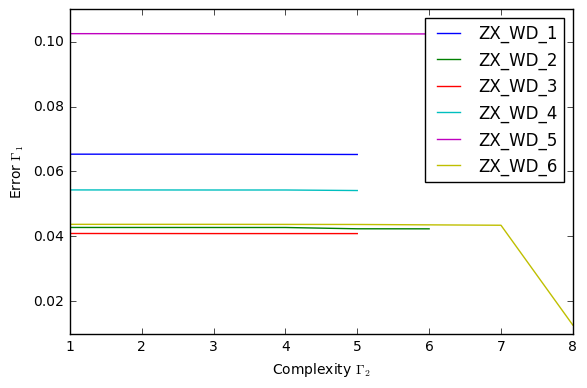

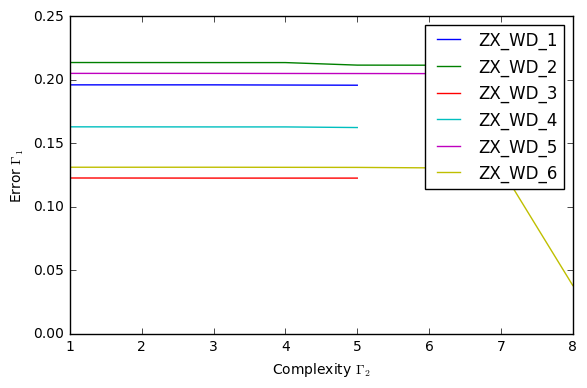

In [115]:
deap_results = learn_delay_deap(seg_3,time_delays2)
result_summary_gp(deap_results,varnames[0:var_num_learn])

model indexs:
[0 0 0 0 0 1]
----------prepare_data_delay_deap------------------
del the target variable ZX_WD_1_dt0
number of variable: 129
the shape of X
(4310, 129)
the shape of y
(4310,)
ZD_LLJ_dt70/ZD_TFG_dt80 + ZX_WD_1_dt10


/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:15: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


----------prepare_data_delay_deap------------------
del the target variable ZX_WD_2_dt0
number of variable: 129
the shape of X
(4310, 129)
the shape of y
(4310,)
ZX_WD_2_dt10 + sin(ZD_SPEED_dt10/ZD_TFG_dt80)
----------prepare_data_delay_deap------------------
del the target variable ZX_WD_3_dt0
number of variable: 129
the shape of X
(4310, 129)
the shape of y
(4310,)
ZX_WD_3_dt10 - 0.16300000000000001/ZX_HW_2_dt0
----------prepare_data_delay_deap------------------
del the target variable ZX_WD_4_dt0
number of variable: 129
the shape of X
(4310, 129)
the shape of y
(4310,)
ZD_SPEED_dt20/ZD_TFG_dt0 + ZX_WD_4_dt10
----------prepare_data_delay_deap------------------
del the target variable ZX_WD_5_dt0
number of variable: 129
the shape of X
(4310, 129)
the shape of y
(4310,)
0.0030000000000000001*sqrt(ZD_SPEED_dt30) + ZX_WD_5_dt10
----------prepare_data_delay_deap------------------
del the target variable ZX_WD_6_dt0
number of variable: 129
the shape of X
(4310, 129)
the shape of y
(4310,)


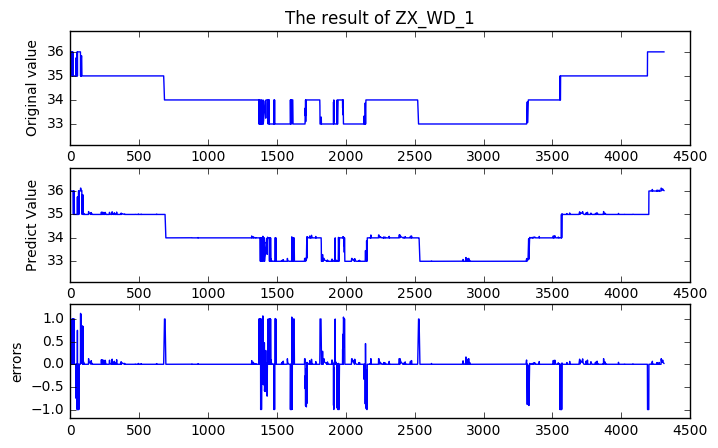

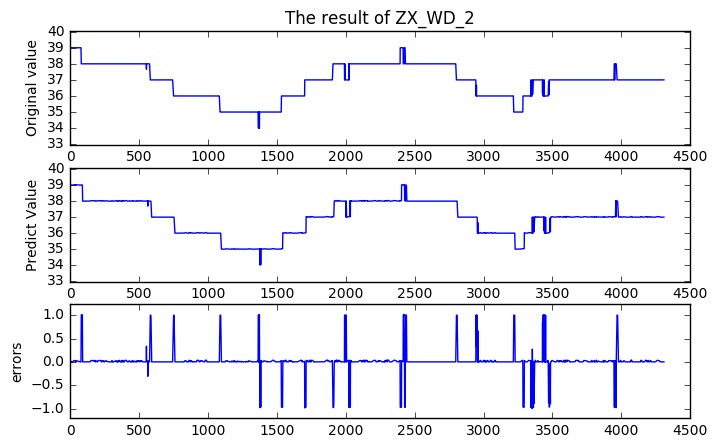

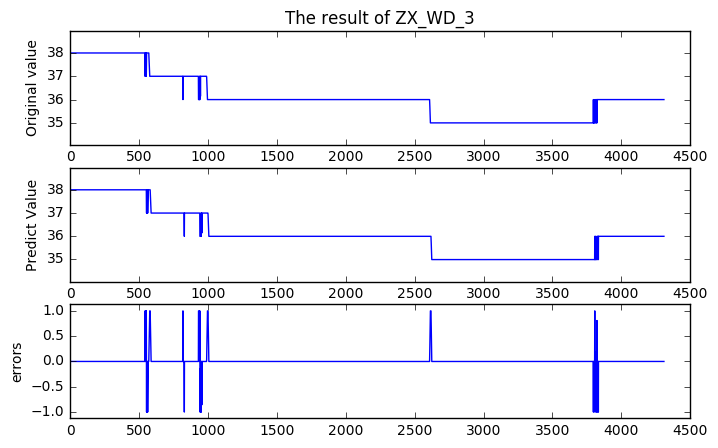

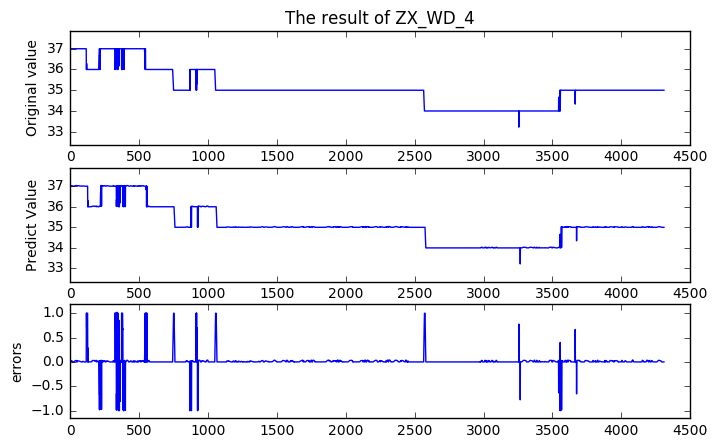

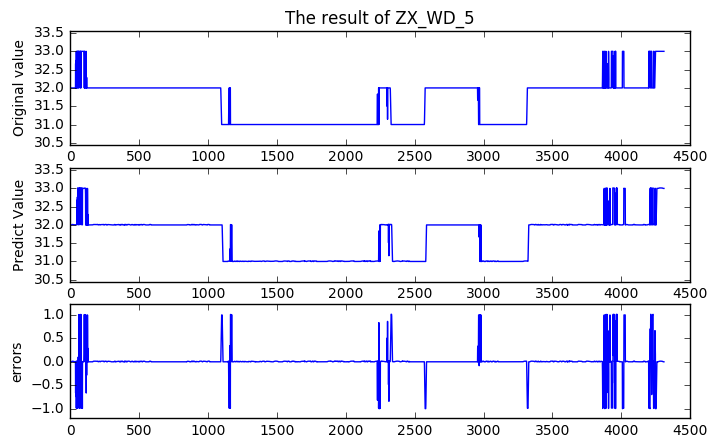

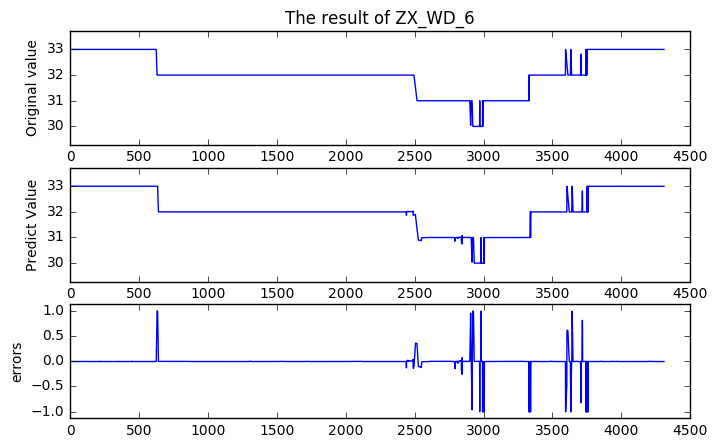

In [117]:
model_indexs = np.zeros(6)
model_indexs = model_indexs.astype(int)
model_indexs[5] = 1
print("model indexs:")
print(model_indexs)
compare_plot_delay_deap(model_indexs,seg_3,time_delays2,deap_results)

#### seg4

-------------------------learn ZX_WD_1------------
----------prepare_data_delay_deap------------------
del the target variable ZX_WD_1_dt0
number of variable: 129
the shape of X
(1396, 129)
the shape of y
(1396,)


/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:15: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


gen	evals	min                      	max        	diversity
0  	484  	[ 0.44559059  2.        ]	[ inf  24.]	470      
1  	500  	[ 0.18619024  1.        ]	[ 1310.83943964     5.        ]	494      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


2  	500  	[ 0.18619024  1.        ]	[ 609.69987832    4.        ]  	493      
3  	500  	[ 0.18619024  1.        ]	[ 609.69987832    9.        ]  	483      
4  	500  	[ 0.18619024  1.        ]	[ 609.69987832   10.        ]  	500      
5  	500  	[ 0.18619024  1.        ]	[ 609.69987832   10.        ]  	499      
6  	500  	[ 0.18619024  1.        ]	[ 609.69987832   11.        ]  	499      
7  	500  	[ 0.18619024  1.        ]	[ 609.69987832   11.        ]  	498      
8  	500  	[ 0.18619024  1.        ]	[ 609.69987832   11.        ]  	497      
9  	500  	[ 0.18619024  1.        ]	[ 609.69987832   11.        ]  	497      
10 	500  	[ 0.18619024  1.        ]	[ 609.69987832   13.        ]  	497      
11 	500  	[ 0.18619024  1.        ]	[ 609.67848539   13.        ]  	496      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


12 	500  	[ 0.18619024  1.        ]	[ 609.67135232   10.        ]  	495      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


13 	500  	[ 0.18619024  1.        ]	[ 609.69274363    6.        ]  	493      
14 	500  	[ 0.18619024  1.        ]	[ 609.68561863    9.        ]  	494      
15 	500  	[ 0.18619024  1.        ]	[ 609.67135232    9.        ]  	495      
16 	500  	[ 0.18619024  1.        ]	[ 609.63563668   11.        ]  	496      
17 	500  	[ 0.18619024  1.        ]	[ 464.92178572   11.        ]  	496      
18 	500  	[ 0.18619024  1.        ]	[ 463.1663708   14.       ]    	496      
19 	500  	[ 0.18619024  1.        ]	[ 463.0389242   14.       ]    	494      
20 	500  	[ 0.18619024  1.        ]	[ 462.85172631   14.        ]  	491      
21 	500  	[ 0.18619024  1.        ]	[ 457.25408621   14.        ]  	487      
22 	500  	[ 0.18618355  1.        ]	[ 34.00240004  16.        ]    	486      
23 	500  	[ 0.18618355  1.        ]	[ 33.93476124  16.        ]    	485      
24 	500  	[ 0.18618355  1.        ]	[ 33.8316418  15.       ]      	480      
25 	500  	[ 0.18618355  1.        ]	[ 29.01832238  16.        ] 

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


26 	500  	[ 0.18613  1.     ]      	[ 462.86813448    7.        ]  	482      
27 	500  	[ 0.18605246  1.        ]	[ 456.82089191    8.        ]  	480      
28 	500  	[ 0.18580547  1.        ]	[ 33.9480414  13.       ]      	481      
29 	500  	[ 0.18469123  1.        ]	[ 33.94476487  13.        ]    	481      
30 	500  	[ 0.18211663  1.        ]	[ 33.83978224  14.        ]    	473      
31 	500  	[ 0.18211663  1.        ]	[ 29.01543907  18.        ]    	465      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


32 	500  	[ 0.17942503  1.        ]	[ 33.94476487   8.        ]    	482      
33 	500  	[ 0.17942503  1.        ]	[ 29.13672293  11.        ]    	480      
34 	500  	[ 0.17942503  1.        ]	[ 29.01543907  13.        ]    	477      
35 	500  	[ 0.17942503  1.        ]	[ 24.47805796  15.        ]    	471      
36 	500  	[ 0.17942503  1.        ]	[  2.99886636  16.        ]    	467      
37 	500  	[ 0.17942503  1.        ]	[  2.98089745  17.        ]    	458      
38 	500  	[ 0.17942503  1.        ]	[  2.76967718  17.        ]    	451      
39 	500  	[ 0.17942503  1.        ]	[  2.69096864  17.        ]    	426      
40 	500  	[ 0.17942503  1.        ]	[  2.43032661  24.        ]    	395      
41 	500  	[ 0.17942503  1.        ]	[  2.39895905  30.        ]    	369      
42 	500  	[ 0.17942503  1.        ]	[  2.41494494  17.        ]    	396      
43 	500  	[ 0.17942503  1.        ]	[  2.98089745  17.        ]    	439      
44 	500  	[ 0.17942503  1.        ]	[  2.75671515  19.        ] 

/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:15: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


gen	evals	min                      	max        	diversity
0  	484  	[ 2.56402903  2.        ]	[ inf  24.]	470      
1  	500  	[ 0.26067225  1.        ]	[ 1151.88937918     5.        ]	496      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


2  	500  	[ 0.26067225  1.        ]	[ 607.11543047    4.        ]  	496      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


3  	500  	[ 0.26067225  1.        ]	[ 607.11543047    4.        ]  	494      
4  	500  	[ 0.26027846  1.        ]	[ 607.11543047    7.        ]  	499      
5  	500  	[ 0.26027846  1.        ]	[ 607.11543047    8.        ]  	499      
6  	500  	[ 0.26027846  1.        ]	[ 607.11543047   12.        ]  	499      
7  	500  	[ 0.26027846  1.        ]	[ 607.11543047   12.        ]  	499      
8  	500  	[ 0.26027846  1.        ]	[ 607.11543047   13.        ]  	499      
9  	500  	[ 0.26027846  1.        ]	[ 607.11543047   13.        ]  	499      
10 	500  	[ 0.26027846  1.        ]	[ 607.11543047   18.        ]  	497      
11 	500  	[ 0.26027846  1.        ]	[ 607.08697608   13.        ]  	493      
12 	500  	[ 0.26027846  1.        ]	[ 462.35099428   13.        ]  	492      
13 	500  	[ 0.26027846  1.        ]	[ 460.29783909   13.        ]  	489      
14 	500  	[ 0.26027846  1.        ]	[ 456.39900609   13.        ]  	488      
15 	500  	[ 0.26027846  1.        ]	[ 455.06671052   15.        

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


17 	500  	[ 0.26027846  1.        ]	[ 36.48188719  11.        ]    	479      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


18 	500  	[ 0.26027846  1.        ]	[ 462.35099428    6.        ]  	484      
19 	500  	[ 0.26027846  1.        ]	[ 455.20353134   10.        ]  	476      
20 	500  	[ 0.26027846  1.        ]	[ 454.4081813   10.       ]    	472      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


21 	500  	[ 0.26027846  1.        ]	[ 454.31338457    6.        ]  	467      
22 	500  	[ 0.26027846  1.        ]	[ 36.54976871   9.        ]    	463      
23 	500  	[ 0.26027846  1.        ]	[ 36.51121592  12.        ]    	459      
24 	500  	[ 0.26027846  1.        ]	[ 36.51121592  13.        ]    	457      
25 	500  	[ 0.26027846  1.        ]	[ 36.49362957  13.        ]    	461      
26 	500  	[ 0.26015736  1.        ]	[ 36.53365507  13.        ]    	458      
27 	500  	[ 0.26015736  1.        ]	[ 36.34144144  16.        ]    	454      
28 	500  	[ 0.26015736  1.        ]	[ 31.67763154  16.        ]    	452      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


29 	500  	[ 0.26017798  1.        ]	[ 36.34144144   9.        ]    	450      
30 	500  	[ 0.26017798  1.        ]	[ 31.67763154  14.        ]    	454      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


31 	500  	[ 0.26027846  1.        ]	[ 454.44343859    6.        ]  	454      
32 	500  	[ 0.26027846  1.        ]	[ 36.53365507   9.        ]    	451      
33 	500  	[ 0.26027846  1.        ]	[ 36.34144144  10.        ]    	450      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


34 	500  	[ 0.26027846  1.        ]	[ 36.34888434   7.        ]    	452      
35 	500  	[ 0.26027846  1.        ]	[ 36.34144144  11.        ]    	454      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


36 	500  	[ 0.26023621  1.        ]	[ 36.50033319   6.        ]    	455      
37 	500  	[ 0.260198  1.      ]    	[ 36.49362957   8.        ]    	459      
38 	500  	[ 0.260198  1.      ]    	[ 36.34144144  11.        ]    	456      
39 	500  	[ 0.260198  1.      ]    	[ 31.67763154  14.        ]    	454      
40 	500  	[ 0.260198  1.      ]    	[ 31.6445379  14.       ]      	452      
41 	500  	[ 0.260198  1.      ]    	[ 31.51453377  14.        ]    	449      
42 	500  	[ 0.260198  1.      ]    	[ 31.37022573  15.        ]    	446      
43 	500  	[ 0.260198  1.      ]    	[  5.62220585  15.        ]    	445      
44 	500  	[ 0.260198  1.      ]    	[  5.58705788  18.        ]    	448      
45 	500  	[ 0.260198  1.      ]    	[  5.05540685  18.        ]    	450      
46 	500  	[ 0.260198  1.      ]    	[  5.03772185  20.        ]    	449      
47 	500  	[ 0.26004199  1.        ]	[  5.03772185  24.        ]    	444      
48 	500  	[ 0.25859802  1.        ]	[  5.02107189  24.        ] 

/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:15: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


gen	evals	min                      	max        	diversity
0  	484  	[ 2.13154968  2.        ]	[ inf  24.]	470      
1  	500  	[ 0.26557234  1.        ]	[ 1221.55718928     5.        ]	498      
2  	500  	[ 0.26286119  1.        ]	[ 607.56224127   11.        ]  	489      
3  	500  	[ 0.1863117  1.       ]  	[ 607.56224127   11.        ]  	499      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


4  	500  	[ 0.1863117  1.       ]  	[ 607.56224127    8.        ]  	499      
5  	500  	[ 0.1863117  1.       ]  	[ 607.56224127   10.        ]  	498      
6  	500  	[ 0.1863117  1.       ]  	[ 607.56224127   12.        ]  	498      
7  	500  	[ 0.1863117  1.       ]  	[ 607.56224127   14.        ]  	499      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


8  	500  	[ 0.1863117  1.       ]  	[ 607.56224127    6.        ]  	499      
9  	500  	[ 0.1863117  1.       ]  	[ 607.56224127   10.        ]  	497      
10 	500  	[ 0.1863117  1.       ]  	[ 607.56224127   11.        ]  	496      
11 	500  	[ 0.1863117  1.       ]  	[ 607.56224127   12.        ]  	496      
12 	500  	[ 0.1863117  1.       ]  	[ 607.56224127   10.        ]  	496      
13 	500  	[ 0.1863117  1.       ]  	[ 607.54794688   10.        ]  	494      
14 	500  	[ 0.1863117  1.       ]  	[ 607.49706397   12.        ]  	494      
15 	500  	[ 0.1863117  1.       ]  	[ 461.404604   13.      ]      	491      
16 	500  	[ 0.1863117  1.       ]  	[ 460.74756498   13.        ]  	489      
17 	500  	[ 0.18617401  1.        ]	[ 460.73117644   13.        ]  	491      
18 	500  	[ 0.18617401  1.        ]	[ 455.51378131   14.        ]  	489      
19 	500  	[ 0.18617401  1.        ]	[ 455.13492095   14.        ]  	489      
20 	500  	[ 0.18617401  1.        ]	[ 454.85844652   14.        

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


21 	500  	[ 0.18617401  1.        ]	[ 607.56224127    6.        ]  	485      
22 	500  	[ 0.18617401  1.        ]	[ 460.93030326    9.        ]  	484      
23 	500  	[ 0.18617401  1.        ]	[ 456.84392035   11.        ]  	482      
24 	500  	[ 0.18617401  1.        ]	[ 455.13492095   11.        ]  	478      
25 	500  	[ 0.18617401  1.        ]	[ 454.91746658   13.        ]  	480      
26 	500  	[ 0.18617401  1.        ]	[ 454.91746658   13.        ]  	478      
27 	500  	[ 0.18617401  1.        ]	[ 454.77209544   14.        ]  	475      
28 	500  	[ 0.18617401  1.        ]	[ 36.10043548  15.        ]    	472      
29 	500  	[ 0.18617401  1.        ]	[ 36.09214642  15.        ]    	471      
30 	500  	[ 0.18617401  1.        ]	[ 36.047162  15.      ]        	465      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


31 	500  	[ 0.18617401  1.        ]	[ 35.91912799  16.        ]    	464      
32 	500  	[ 0.18617401  1.        ]	[ 31.24846195  15.        ]    	457      
33 	500  	[ 0.18617401  1.        ]	[  5.15473429  15.        ]    	456      
34 	500  	[ 0.18617401  1.        ]	[  5.10866971  19.        ]    	458      
35 	500  	[ 0.18617401  1.        ]	[  4.54633414  19.        ]    	456      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


36 	500  	[ 0.18617401  1.        ]	[  3.55926256e+15   6.00000000e+00]	457      
37 	500  	[ 0.18617401  1.        ]	[ 454.89902847   12.        ]      	456      
38 	500  	[ 0.18611416  1.        ]	[ 36.0712131  14.       ]          	455      
39 	500  	[ 0.18611416  1.        ]	[ 36.04450439  14.        ]        	452      
40 	500  	[ 0.18611416  1.        ]	[ 31.24846195  14.        ]        	446      
41 	500  	[ 0.18611416  1.        ]	[ 31.08569839  15.        ]        	440      
42 	500  	[ 0.18611416  1.        ]	[ 31.08208034  15.        ]        	436      
43 	500  	[ 0.18611416  1.        ]	[ 30.95344986  18.        ]        	435      
44 	500  	[ 0.18611416  1.        ]	[ 31.08569839  18.        ]        	439      
45 	500  	[ 0.18609542  1.        ]	[ 31.15543155  15.        ]        	438      
46 	500  	[ 0.18607201  1.        ]	[ 31.08050391  15.        ]        	434      
47 	500  	[ 0.18607201  1.        ]	[  5.13942531  15.        ]        	430      
48 	500  	[ 0.18

/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:15: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


gen	evals	min                      	max        	diversity
0  	484  	[ 0.99617492  2.        ]	[ inf  24.]	470      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


1  	500  	[ 0.19351979  1.        ]	[  4.14915311e+05   4.00000000e+00]	498      
2  	500  	[ 0.19351979  1.        ]	[ 608.72860789    8.        ]      	498      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


3  	500  	[ 0.19351979  1.        ]	[ 608.72860789    4.        ]      	494      
4  	500  	[ 0.19351979  1.        ]	[ 608.72860789    9.        ]      	498      
5  	500  	[ 0.19351979  1.        ]	[ 608.72860789    9.        ]      	497      
6  	500  	[ 0.19351979  1.        ]	[ 608.72860789   13.        ]      	498      
7  	500  	[ 0.19351979  1.        ]	[ 608.72860789   13.        ]      	498      
8  	500  	[ 0.19351979  1.        ]	[ 608.72860789   13.        ]      	497      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


9  	500  	[ 0.19351979  1.        ]	[ 608.72860789    6.        ]      	497      
10 	500  	[ 0.19351979  1.        ]	[ 608.72860789   11.        ]      	497      
11 	500  	[ 0.19351979  1.        ]	[ 608.66373416   11.        ]      	497      
12 	500  	[ 0.19351979  1.        ]	[ 463.95806069   11.        ]      	497      
13 	500  	[ 0.19351979  1.        ]	[ 461.80149129   14.        ]      	495      
14 	500  	[ 0.19351979  1.        ]	[ 456.67281455   14.        ]      	494      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


15 	500  	[ 0.19351979  1.        ]	[ 608.69302283    7.        ]      	494      
16 	500  	[ 0.19351979  1.        ]	[ 462.08976629   12.        ]      	493      
17 	500  	[ 0.19351979  1.        ]	[ 458.00555438   13.        ]      	491      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


18 	500  	[ 0.19351979  1.        ]	[ 456.67281455    9.        ]      	489      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


19 	500  	[ 0.19351979  1.        ]	[ 461.80149129    7.        ]      	485      
20 	500  	[ 0.19351979  1.        ]	[ 456.29451836    9.        ]      	477      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


21 	500  	[ 0.19351979  1.        ]	[ 456.07646559    9.        ]      	480      
22 	500  	[ 0.19351979  1.        ]	[ 456.0175164   10.       ]        	482      
23 	500  	[ 0.19351979  1.        ]	[ 455.86040515   12.        ]      	481      
24 	500  	[ 0.19351979  1.        ]	[ 455.86040515   12.        ]      	481      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


25 	500  	[ 0.19351979  1.        ]	[ 456.0175164    7.       ]        	479      
26 	500  	[ 0.19351979  1.        ]	[ 455.93114394   12.        ]      	476      
27 	500  	[ 0.19351979  1.        ]	[ 455.86040515   12.        ]      	473      
28 	500  	[ 0.19351979  1.        ]	[ 455.86040515   12.        ]      	469      
29 	500  	[ 0.19351979  1.        ]	[ 34.92471208  12.        ]        	467      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


30 	500  	[ 0.19351979  1.        ]	[ 34.89750431   8.        ]        	464      
31 	500  	[ 0.19338724  1.        ]	[ 29.9507908  11.       ]          	462      
32 	500  	[ 0.19338724  1.        ]	[ 29.85422208  13.        ]        	462      
33 	500  	[ 0.19338724  1.        ]	[  3.98052249  15.        ]        	460      
34 	500  	[ 0.19338724  1.        ]	[  3.96790533  15.        ]        	441      
35 	500  	[ 0.19338724  1.        ]	[  3.96790533  13.        ]        	431      
36 	500  	[ 0.19338724  1.        ]	[ 29.90602798  16.        ]        	451      
37 	500  	[ 0.19338724  1.        ]	[  3.96158169  19.        ]        	445      
38 	500  	[ 0.19338724  1.        ]	[  3.96790533  19.        ]        	451      
39 	500  	[ 0.19338724  1.        ]	[  3.93508241  19.        ]        	441      
40 	500  	[ 0.19338724  1.        ]	[  3.36473865  22.        ]        	432      
41 	500  	[ 0.19338724  1.        ]	[  3.36473865  22.        ]        	437      
42 	500  	[ 0.19

/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:15: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


gen	evals	min                      	max        	diversity
0  	484  	[ 0.48068666  2.        ]	[ inf  24.]	470      
1  	500  	[ 0.179198  1.      ]    	[ 1310.21229647     5.        ]	497      
2  	500  	[ 0.08463642  1.        ]	[ 612.70496102    8.        ]  	494      
3  	500  	[ 0.08463642  1.        ]	[ 612.70496102    9.        ]  	498      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


4  	500  	[ 0.08463642  1.        ]	[ 612.70496102    5.        ]  	496      
5  	500  	[ 0.08463642  1.        ]	[ 612.70496102    9.        ]  	497      
6  	500  	[ 0.08463642  1.        ]	[ 612.70496102    9.        ]  	497      
7  	500  	[ 0.08463642  1.        ]	[ 612.70496102    9.        ]  	496      
8  	500  	[ 0.08463642  1.        ]	[ 612.70496102   10.        ]  	496      
9  	500  	[ 0.08463642  1.        ]	[ 612.70496102   12.        ]  	494      
10 	500  	[ 0.08463642  1.        ]	[ 612.64467979   14.        ]  	492      
11 	500  	[ 0.08463642  1.        ]	[ 466.50062622   16.        ]  	490      
12 	500  	[ 0.08463642  1.        ]	[ 465.84365141   20.        ]  	489      
13 	500  	[ 0.08463642  1.        ]	[ 465.7379822   20.       ]    	488      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


14 	500  	[ 0.08463642  1.        ]	[ 466.14231847    7.        ]  	481      
15 	500  	[ 0.08463642  1.        ]	[ 465.82724379   10.        ]  	480      
16 	500  	[ 0.08460102  1.        ]	[ 459.95077549   12.        ]  	478      
17 	500  	[ 0.08459977  1.        ]	[ 459.86426253   13.        ]  	474      
18 	500  	[ 0.08459977  1.        ]	[ 459.95077549   13.        ]  	469      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


19 	500  	[ 0.08463642  1.        ]	[ 461.7081124    7.       ]    	464      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


20 	500  	[ 0.08463642  1.        ]	[ 460.74016568    7.        ]  	466      
21 	500  	[ 0.08434262  1.        ]	[ 460.60629388   13.        ]  	466      
22 	500  	[ 0.08433136  1.        ]	[ 459.9912579   11.       ]    	466      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


23 	500  	[ 0.08463642  1.        ]	[ 465.7379822    6.       ]    	464      
24 	500  	[ 0.08463642  1.        ]	[ 461.95138484   11.        ]  	462      
25 	500  	[ 0.08463642  1.        ]	[ 460.74016568   11.        ]  	460      
26 	500  	[ 0.08463642  1.        ]	[ 461.7081124   11.       ]    	464      
27 	500  	[ 0.08463642  1.        ]	[ 460.60629388   11.        ]  	469      
28 	500  	[ 0.08463642  1.        ]	[ 459.95077549   11.        ]  	468      
29 	500  	[ 0.08463642  1.        ]	[ 31.08033254  11.        ]    	466      
30 	500  	[ 0.08463642  1.        ]	[ 31.02787593  11.        ]    	465      
31 	500  	[ 0.08463642  1.        ]	[ 30.47113341  14.        ]    	463      
32 	500  	[ 0.08463642  1.        ]	[ 26.12669329  14.        ]    	458      
33 	500  	[ 0.08463642  1.        ]	[ 26.03021816  14.        ]    	450      
34 	500  	[ 0.084371  1.      ]    	[  5.71947117  14.        ]    	456      
35 	500  	[ 0.084371  1.      ]    	[  5.70567764  14.        ] 

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


48 	500  	[ 0.08380011  1.        ]	[ inf  28.]                    	456      
49 	500  	[ 0.0843278  1.       ]  	[ 612.69066238    6.        ]  	454      
--------------------end----------------------------
-------------------------learn ZX_WD_6------------
----------prepare_data_delay_deap------------------
del the target variable ZX_WD_6_dt0
number of variable: 129
the shape of X
(1396, 129)
the shape of y
(1396,)


/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:15: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


gen	evals	min                      	max        	diversity
0  	484  	[ 0.54432542  2.        ]	[ inf  24.]	470      
1  	500  	[ 0.22704356  1.        ]	[ 1164.63357111     5.        ]	498      
2  	500  	[ 0.22704356  1.        ]	[ 612.08697044   10.        ]  	492      
3  	500  	[ 0.21621387  1.        ]	[ 612.08697044   10.        ]  	499      
4  	500  	[ 0.20607415  1.        ]	[ 612.08697044   10.        ]  	499      
5  	500  	[ 0.20607415  1.        ]	[ 612.08697044   10.        ]  	499      
6  	500  	[ 0.20607415  1.        ]	[ 612.08697044   13.        ]  	498      
7  	500  	[ 0.20607415  1.        ]	[ 612.08697044   11.        ]  	498      
8  	500  	[ 0.20607415  1.        ]	[ 612.08697044   12.        ]  	497      
9  	500  	[ 0.20607415  1.        ]	[ 466.96018855   12.        ]  	493      
10 	500  	[ 0.20607415  1.        ]	[ 465.4253056   11.       ]    	493      
11 	500  	[ 0.20607415  1.        ]	[ 465.22596285   14.        ]  	491      
12 	500  	[ 0.20607415  1.

/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


15 	500  	[ 0.20607415  1.        ]	[  5.79813905e+13   6.00000000e+00]	493      
16 	500  	[ 0.20607415  1.        ]	[ 612.05122392   10.        ]      	494      
17 	500  	[ 0.20607415  1.        ]	[ 465.53928575   10.        ]      	491      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


18 	500  	[ 0.20607415  1.        ]	[ 465.22596285    7.        ]      	491      
19 	500  	[ 0.20607415  1.        ]	[ 459.62641744   12.        ]      	490      
20 	500  	[ 0.20607415  1.        ]	[ 459.34890428   11.        ]      	486      
21 	500  	[ 0.20607415  1.        ]	[ 459.34890428   17.        ]      	486      
22 	500  	[ 0.20607415  1.        ]	[ 459.1941064   17.       ]        	484      
23 	500  	[ 0.20607415  1.        ]	[ 31.61474678  17.        ]        	482      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


24 	500  	[ 0.20607415  1.        ]	[ 31.51340144  12.        ]        	482      
25 	500  	[ 0.20607415  1.        ]	[ 26.71238571  18.        ]        	481      
26 	500  	[ 0.20607415  1.        ]	[ 26.70987911  18.        ]        	486      
27 	500  	[ 0.20607415  1.        ]	[ 22.08686345  18.        ]        	485      
28 	500  	[ 0.20607415  1.        ]	[  5.15751136  18.        ]        	483      
29 	500  	[ 0.20607415  1.        ]	[  4.62094046  18.        ]        	484      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


30 	500  	[ 0.11709408  1.        ]	[  4.62094046  11.        ]        	478      
31 	500  	[ 0.11709408  1.        ]	[  4.5849913  14.       ]          	480      
32 	500  	[ 0.11709408  1.        ]	[  4.5718317  14.       ]          	481      
33 	500  	[ 0.11709408  1.        ]	[  4.57889411  18.        ]        	478      
34 	500  	[ 0.11709408  1.        ]	[  4.5718317  20.       ]          	477      
35 	500  	[ 0.11709408  1.        ]	[  3.45821467  20.        ]        	469      


/home/happyling/anaconda3/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


36 	500  	[ 0.11709408  1.        ]	[  3.45821467  16.        ]        	466      
37 	500  	[ 0.11709408  1.        ]	[  3.46545697  19.        ]        	466      
38 	500  	[ 0.11709408  1.        ]	[  4.55513002  19.        ]        	474      
39 	500  	[ 0.11709408  1.        ]	[  3.44108135  19.        ]        	474      
40 	500  	[ 0.11709408  1.        ]	[  3.45043632  19.        ]        	478      
41 	500  	[ 0.11709408  1.        ]	[  3.45043632  18.        ]        	474      
42 	500  	[ 0.11709408  1.        ]	[  4.56345711  18.        ]        	473      
43 	500  	[ 0.11709408  1.        ]	[  3.42679389  18.        ]        	470      
44 	500  	[ 0.11709408  1.        ]	[  3.39735377  18.        ]        	470      
45 	500  	[ 0.11709408  1.        ]	[  3.40554027  20.        ]        	467      
46 	500  	[ 0.11709408  1.        ]	[  2.54261712  23.        ]        	454      
47 	500  	[ 0.11709408  1.        ]	[  2.53556408  21.        ]        	452      
48 	500  	[ 0.11

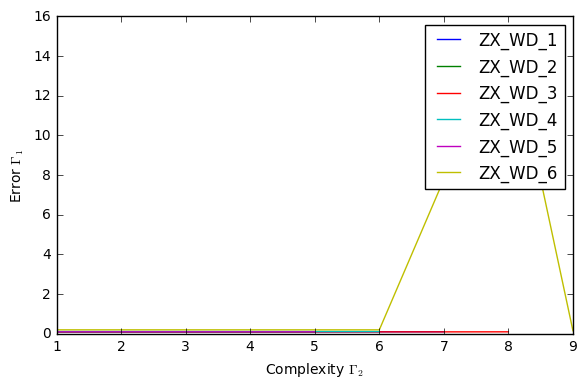

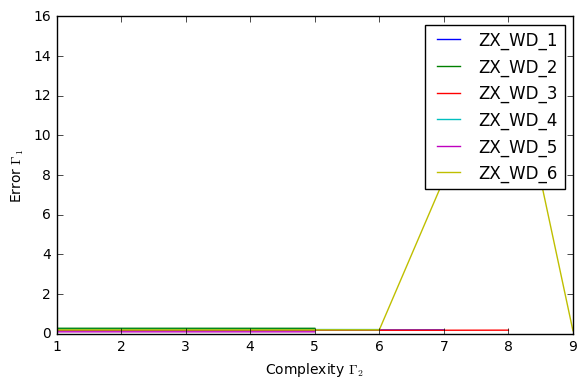

In [118]:
deap_results = learn_delay_deap(seg_4,time_delays2)
result_summary_gp(deap_results,varnames[0:var_num_learn])

model indexs:
[0 0 0 0 0 2]
----------prepare_data_delay_deap------------------
del the target variable ZX_WD_1_dt0
number of variable: 129
the shape of X
(1396, 129)
the shape of y
(1396,)
ZX_WD_4_dt50 - cos(cos(log(log(ZD_TFG_dt10))))
----------prepare_data_delay_deap------------------
del the target variable ZX_WD_2_dt0
number of variable: 129
the shape of X
(1396, 129)
the shape of y
(1396,)
ZX_WD_2_dt10 - ZD_SPEED_dt70/ZD_JHG_dt30


/home/happyling/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:15: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


----------prepare_data_delay_deap------------------
del the target variable ZX_WD_3_dt0
number of variable: 129
the shape of X
(1396, 129)
the shape of y
(1396,)
(ZX_WD_3_dt10*(ZD_LLJ_dt60 - ZX_WD_5_dt30) + sin(ZX_WD_1_dt80))/(ZD_LLJ_dt60 - ZX_WD_5_dt30)
----------prepare_data_delay_deap------------------
del the target variable ZX_WD_4_dt0
number of variable: 129
the shape of X
(1396, 129)
the shape of y
(1396,)
ZX_WD_4_dt10 - cos(ZD_LCG_dt60)/ZX_WD_2_dt50
----------prepare_data_delay_deap------------------
del the target variable ZX_WD_5_dt0
number of variable: 129
the shape of X
(1396, 129)
the shape of y
(1396,)
ZX_WD_5_dt10 - 0.249/ZX_HW_2_dt80
----------prepare_data_delay_deap------------------
del the target variable ZX_WD_6_dt0
number of variable: 129
the shape of X
(1396, 129)
the shape of y
(1396,)
ZX_WD_5_dt30 + cos(sin(ZX_WD_1_dt70 + exp(square(ZD_LCG_dt90))))


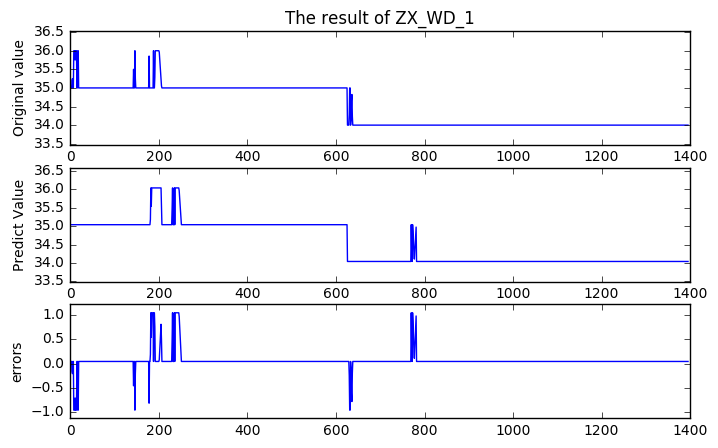

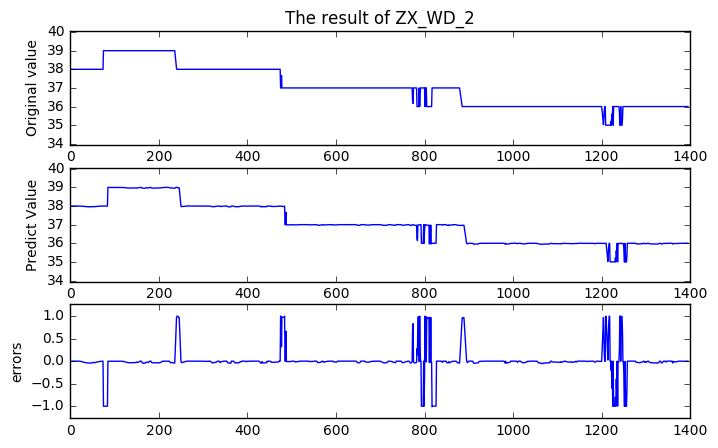

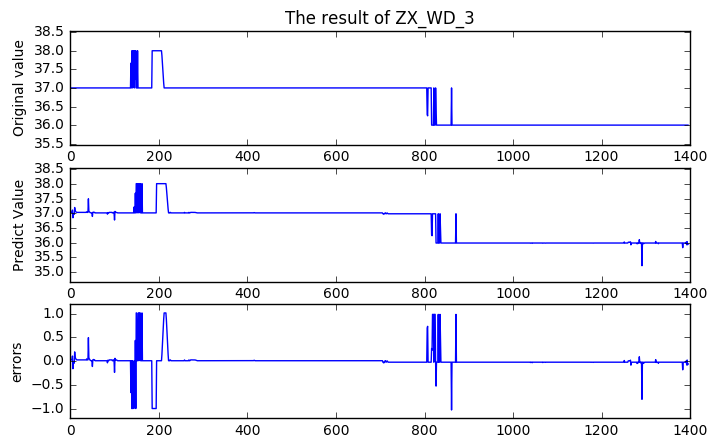

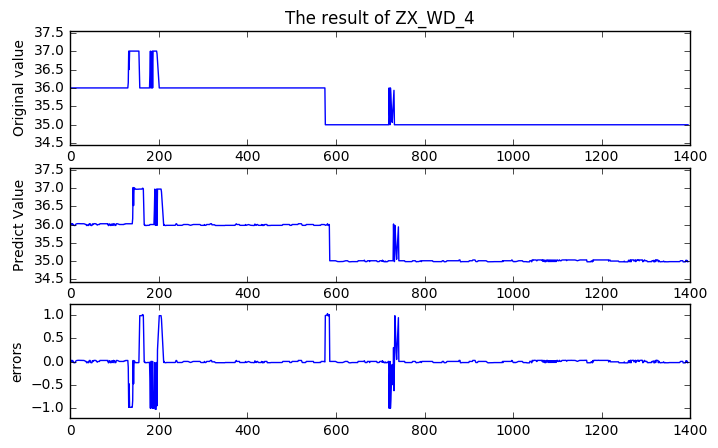

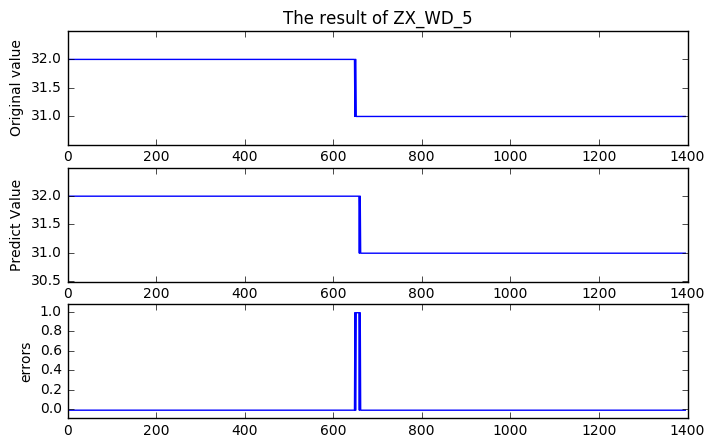

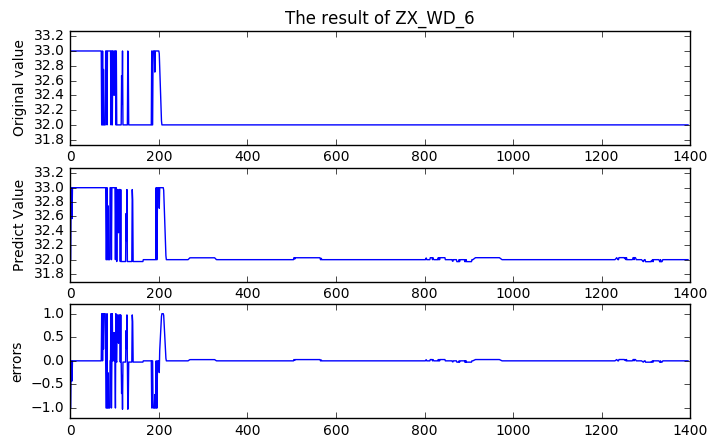

In [121]:
model_indexs = np.zeros(6)
model_indexs = model_indexs.astype(int)
model_indexs[5] = 2
print("model indexs:")
print(model_indexs)
compare_plot_delay_deap(model_indexs,seg_4,time_delays2,deap_results)